# Importing packages

In [9]:
# Gjør dette riktig!

# Gamanjunni average angle of slope
height = 1100-650
length = 1100-400
angle_rad = np.arctan(height / length)
angle_deg = np.degrees(angle_rad)
print(f"Angle in degrees: {angle_deg}")

Angle in degrees: 32.7352262721076


In [6]:
# Jettan
height = 650-400
length = 450
angle_rad = np.arctan(height / length)
angle_deg = np.degrees(angle_rad)
print(f"Angle in degrees: {angle_deg}")

Angle in degrees: 29.054604099077146


Number of colors 11


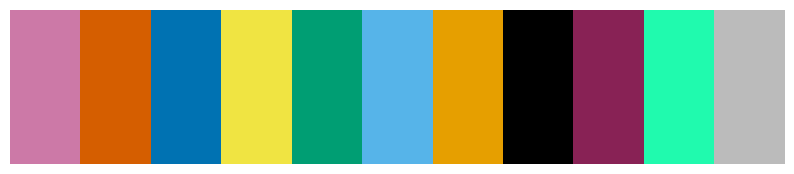

In [2]:
# Importing packages
import matplotlib.pyplot as plt # seams to be the most used
import matplotlib as mpl # did not dare to mess with plt comand
#plt.style.use('ggplot')
import seaborn as sns
# sns.set(style='whitegrid')
#sns.set(rc={'figure.figsize':(11.7,8.27)})
import matplotlib.lines as mlines
import matplotlib.ticker
from matplotlib.ticker import FormatStrFormatter
import matplotlib.dates as mdates
from matplotlib import dates
from datetime import datetime, timedelta
from matplotlib.dates import DateFormatter
#import plotnine as p9 # Same as ggplot
import pandas as pd
import numpy as np
import math
from scipy.signal import medfilt
import scipy.stats
from scipy.stats import pearsonr
from sklearn.linear_model import LinearRegression
import glob
import re
import matplotlib.colors as mcolors


# To get untruncated output from pandas
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

# Normal Setting global font size for plots
plt.rcParams['font.sans-serif'] = 'Arial'
small_size = 12
medium_size = 14
large_size = 16
plt.rc('axes', titlesize=large_size)     # fontsize of the axes title
plt.rc('axes', labelsize=large_size)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=medium_size)    # fontsize of the tick labels
plt.rc('ytick', labelsize=medium_size)    # fontsize of the tick labels
plt.rc('legend',fontsize=medium_size)      # fontsize of the legend'
plt.rcParams['legend.title_fontsize'] = medium_size
plt.rcParams['axes.xmargin'] = 0         # get rid of margins befor and after data along x-axis
# plt.rcParams["axes.grid"] = False     # remove grid of plots

# remove grid but keep tick marks for the axes
color = 'black'
plt.rc('axes', grid=False, edgecolor=color)
plt.rc('xtick', bottom=True, top=False, color=color)  # Show bottom ticks and hide top ticks for all plots
plt.rc('ytick', left=True, right=False, color=color)  # Show left ticks and hide right ticks for all plots
plt.rc('xtick', labelcolor=color)  # Set x tick label color to black
plt.rc('ytick', labelcolor=color)

## To complex shit
# # Global wrapper for plotting that automatically scales axes to max and min values
# def auto_scale_axes():
#     """Automatically adjust the axis to show min/max values of the data."""
#     ax = plt.gca()  # Get the current axis
#     ax.set_ylim(bottom=np.nanmin(ax.get_lines()[0].get_ydata()), 
#                 top=np.nanmax(ax.get_lines()[0].get_ydata()))
#     ax.set_xlim(left=np.nanmin(ax.get_lines()[0].get_xdata()), 
#                 right=np.nanmax(ax.get_lines()[0].get_xdata()))
# def plot_with_auto_scale(*args, **kwargs):
#     plt.plot(*args, **kwargs)
#     auto_scale_axes()
# plt.plot = plot_with_auto_scale # Replace plt.plot with this custom function globally

colors = ['#CC79A7','#D55E00','#0072B2','#F0E442','#009E73','#56B4E9','#E69F00','#000000','#BBBBBB','#6E6E6E'] # https://nanx.me/oneclust/reference/cud.html

# # POSTER Setting global font size for plots
# medium_size = 26
# large_size = 30
# plt.rc('axes', titlesize=large_size)     # fontsize of the axes title
# plt.rc('axes', labelsize=large_size)    # fontsize of the x and y labels
# plt.rc('xtick', labelsize=medium_size)    # fontsize of the tick labels
# plt.rc('ytick', labelsize=medium_size)    # fontsize of the tick labels
# plt.rc('legend',fontsize=medium_size)      # fontsize of the legend'
# plt.rcParams['axes.xmargin'] = 0         # get rid of margins befor and after data along x-axis


# LOADING FUNCTIONS
def sub_sample_df_old(df, moduleMask): # insert dataframe and mask for dataframe
    modules = df[moduleMask]
    if 'Displacement [mm]:' in df.columns:
        subSample = modules[['Date:', 'Displacement [mm]:']]
    if 'Water table [m bgl]:' in df.columns:
        subSample = modules[['Date:', 'Module ID:', 'Water table [m bgl]:']]
    subSample = subSample.set_index('Date:')
    return subSample

# SUBSAMPLING DF's       NEW
def sub_sample_df(df, modules): # insert dataframe and mask for dataframe
    khlist = []
    modules = modules
    for i in modules:
        file = df
        module = i
        moduleMask = file['Module ID:'].isin([module])
        file = file[moduleMask]
        file.set_index('Date:', inplace=True)
        file = file.resample('1h').median()    
        khlist.append(file) # adding modules to list
    df = pd.concat(khlist, axis=1)
    
    # inclinometers
    if 'Displacement [mm]:' in df.columns:
        subSample = df[['Displacement [mm]:']]
    
    # piezometers
    if 'Water table [m bgl]:' in df.columns:
        subSample = df[['Water table [m bgl]:']]
    
    return subSample

# Slice df by time_start and time_end 
def sub_set_df(df, time_start=1, time_end=2):
    mask = (df.index > time_start) & (df.index <= time_end)
    return df[mask]

# # Statsmodel, linear regression over n hours defined by window_hours
# from statsmodels.formula.api import ols
# def linearfit(volume, window_days=0.5, results = False, gps=False):
#     volume = volume.to_frame()
#     df = volume.dropna()
#     df = df.reset_index(drop=True) # due to LinearRgression is not able to calculate with dateformat as x-axis
#     if gps is True:
#         window_hours = 2*window_days
#     else:
#         window_hours = 24*window_days 
#     cutoff_start = df.index.values[0]
#     cutoff_end = cutoff_start + window_hours
#     reg_res = []
#     data_left = True

#     # Slicing timeseries by window_hours calculating linear regression with slope, intercept and r^2                                                                           
#     while data_left:
#         if cutoff_end > df.index.values[-1]:
#             data_left = False
#             cutoff_end = df.index.values[-1]
#             break   
#         start = df.index.values >= cutoff_start
#         end = df.index.values <= cutoff_end
#         current_data = df[start & end]
#         if len(current_data) > window_hours-1:
#             mod = sm.OLS(y, sm.add_constant(X))
#             mod = ols(formula = 'current_data.values ~ current_data.index', data = current_data) # model
#             fit = mod.fit() # model fit
#             if results is True:
#                 reg_res += [(cutoff_start+window_hours//2, fit.params[1], fit.params[0], fit.rsquared)]  # returns intercept and r^2 in addition to index and slope
#             else:
#                 reg_res += [(cutoff_start+window_hours//2, fit.params[1])]  # returns index and slope
#         cutoff_start += 1
#         cutoff_end = cutoff_start + window_hours

#     # Merging df and reg_res to obtain correct index and storing output from linear regression and calculating error of fit
#     df.index.name = 'index'
#     df[volume.index.name] = volume.index
#     slopedf = pd.DataFrame(reg_res)
#     if results is True:
#         slopedf.columns = ['index',f'{window_days}_days_velocity', 'intercept', 'r^2'] # NB velocity is the slope of the fit
#         slopedf['y_fit'] = slopedf[f'{window_days}_days_velocity']*slopedf.index+slopedf['intercept']
#         df_merged = pd.merge_asof(df,slopedf, on=df.index.name, tolerance=0)
#         df_merged.set_index(volume.index.name,inplace=True, drop=True)
#         df_merged['residuals'] = (df_merged.iloc[:,[1]].values-df_merged.iloc[:,[5]].values) # y-y_hat = resuduals
#         df_merged['error_of_fit'] = ((np.mean(df_merged['residuals']**2))**(1/2))
#         df_merged.drop(df_merged.columns[[0,1]], axis=1, inplace=True)
#         return df_merged.dropna()
#     else:
#         slopedf.columns = ['index',f'{window_days}_days_velocity']
#         df_merged = pd.merge_asof(df,slopedf, on=df.index.name, tolerance=0)
#         df_merged.set_index(volume.index.name,inplace=True, drop=True)
#         df_merged.drop(df_merged.columns[[0,1]], axis=1, inplace=True)
#         return df_merged.dropna()

# NEW VERSION !

# Statsmodel, linear regression over n hours defined by window_hours
from statsmodels.formula.api import ols
def linearfit(volume, window_days=0.5, results = False, gps=False, interval=1): # added gps= to get rows that fit gps days velocity. interval = number of days between rows
    volume = volume.to_frame()
    df = volume.copy()
    df = df.reset_index(drop=True) # due to LinearRgression is not able to calculate with dateformat as x-axis
    if gps is True:
        window_hours = 2*window_days
    else:
        window_hours = 24*window_days 
    cutoff_start = df.index.values[0]
    cutoff_end = cutoff_start + window_hours
    reg_res = []
    data_left = True # starts loop

    # Slicing timeseries by window_hours calculating linear regression with slope, intercept and r^2                                                                           
    while data_left:
        if cutoff_end > df.index.values[-1]:
            data_left = False # stops loop
            cutoff_end = df.index.values[-1]
            break   
        start = df.index.values >= cutoff_start
        end = df.index.values <= cutoff_end
        current_data = df[start & end]
        current_data = current_data.squeeze()
        # added part so no need of interpolation, but perhaps for boreholes?
        if max(current_data.isnull().astype(int).groupby(current_data.notnull().astype(int).cumsum()).cumsum()) > window_hours/4: # True if more than consecutive nans
            current_data = current_data.dropna(axis=0) # deletes nan so df is to small to get true in next if statement
        
        if len(current_data) > window_hours-1:
            mod = ols(formula = 'current_data.values ~ current_data.index', data = current_data) # model
            fit = mod.fit() # model fit
            if results is True:
                reg_res += [(cutoff_start+window_hours//2, fit.params[1], fit.params[0], fit.rsquared)]  # returns intercept and r^2 in addition to index and slope
            else:
                reg_res += [(cutoff_start+window_hours//2, fit.params[1])]  # returns index and slope
        cutoff_start += 1
        cutoff_end = cutoff_start + window_hours

    # Merging df and reg_res to obtain correct index and storing output from linear regression and calculating error of fit
    df.index.name = 'index'
    df[volume.index.name] = volume.index
    slopedf = pd.DataFrame(reg_res)
    if results is True:
        slopedf.columns = ['index',f'{window_days}_days_velocity', 'intercept', 'r^2'] # NB velocity is the slope of the fit
        slopedf['y_fit'] = slopedf[f'{window_days}_days_velocity']*slopedf.index+slopedf['intercept']
        df_merged = pd.merge_asof(df,slopedf, on=df.index.name, tolerance=0)
        df_merged.set_index(volume.index.name,inplace=True, drop=True)
        df_merged['residuals'] = (df_merged.iloc[:,[1]].values-df_merged.iloc[:,[5]].values) # y-y_hat = resuduals
        df_merged['error_of_fit'] = ((np.mean(df_merged['residuals']**2))**(1/2))
        df_merged.drop(df_merged.columns[[0,1]], axis=1, inplace=True)
#         return df_merged.dropna() # this might be a problem in the future.. But I will comment it and get data with nans
        return df_merged
    else:
        slopedf.columns = ['index',f'{window_days}_days_velocity']
        df_merged = pd.merge_asof(df,slopedf, on=df.index.name, tolerance=0)
        df_merged.set_index(volume.index.name,inplace=True, drop=True)
        df_merged.drop(df_merged.columns[[0,1]], axis=1, inplace=True)
#         return df_merged.dropna() # this might be a problem in the future.. But I will comment it and get data with nans
        return df_merged
    
# cross correlation and its p-value
def pearsonr_crosscorr(datax, datay, lag=0):
    return datax.corr(datay.shift(lag), method='pearson')

def pearsonr_pval(x,y):
    return pearsonr(x,y)[1]

def pearsonr_crosscorr_pval(datax, datay, lag=0):
    return datax.corr(datay.shift(lag), method=pearsonr_pval)

def unique(list1):
    unique_list = []
    for x in list1:
        if x not in unique_list:
            unique_list.append(x)
    return unique_list

# STA/LTA FILTER WITH CREEP BURST THRESHOLD 
def sta_lta(df, STA=2, LTA=60, detrigg_on=True, trigg=2, detrigg=1, threshold_dynamic=True):
    df = pd.merge_asof(df, linearfit(df['displacement_butterfilt'], window_days=LTA), on=df.index.name, tolerance=pd.Timedelta(hours=0))
    
    # add STA if it is not in the df
    if not f'{STA}_days_velocity' in df.columns:
        df.set_index(df.columns[0], drop=True, inplace=True)
        df = pd.merge_asof(df, linearfit(df['displacement_butterfilt'], window_days=STA), on=df.index.name, tolerance=pd.Timedelta(hours=0))
    
    # setting STA and LTA 
    df['sta'] = df[f'{STA}_days_velocity'].values # use 1_day or 2_days ?
    df['lta'] = df[f'{LTA}_days_velocity'].values
#     df.loc[:, 'lta'] = df[f'{LTA}_days_velocity'].shift(LTA*24//2) # shifts lta to start at end of window, not middle. This was used in seismology but did not seam to work as well on our time series
    df['sta/lta'] = df['sta']/df['lta']
    
    # creep burst threshold
    df['trigger'] = np.nan
    df['detrigger'] = np.nan
    
    if threshold_dynamic is True:
        # dynamic threshold
        window_length = LTA*24 # the start of mean calculation
        for i,d in enumerate(df['sta/lta'][window_length+window_length//2:-window_length//2]):
            # window from start to end of sta/lta
            window = df.loc[i+window_length:i+window_length*2, 'sta/lta']
            sigma = np.sqrt((np.sum(np.square(window-np.mean(window))))/len(window-1))
            # inserting mean + sigma in center of window
            df.loc[i+window_length+window_length//2, 'trigger'] = np.mean(window)+sigma*trigg # 2 x SD centered 
            df.loc[i+window_length+window_length//2, 'detrigger'] = np.mean(window)+sigma*detrigg # 1 x SD centered
    else:
        # static threshold
        sigma = np.sqrt((np.sum(np.square(df['sta/lta']-np.mean(df['sta/lta']))))/len(df['sta/lta']-1))
        df['trigger'] = np.mean(df['sta/lta'])+sigma*trigg
        df['detrigger'] = np.mean(df['sta/lta'])+sigma*detrigg
    
    # selecting creep bursts
    df['nBursts'] = 0
    prev_d = 0
    prev_burst_idx = 0
    indexes = []
    above_trigg = False
    
    if detrigg_on is True:
        for i, d in enumerate(df['sta/lta']):
            # trigger threshold
            if d > df.loc[i, 'detrigger']:
                indexes += [i]
                if d > df.loc[i, 'trigger']:
                    above_trigg = True
            else:
                if above_trigg:
                    df.loc[indexes, 'nBursts'] = 1
                indexes = []
                above_trigg = False
    df.set_index(df.columns[0], drop=True, inplace=True)
    return df

def velocity(df, col_name, window_days=4, results=True):
    df =  pd.merge_asof(df, linearfit(df[f'{col_name}'], window_days=window_days, results=results), on=df.index.name, tolerance=pd.Timedelta(hours=0)) #results=True to get additional results
    df.set_index(df.columns[0], drop=True, inplace=True) # reinsetting the datetime index
    return df

# When agreed on how it should look like, make this a part of the pre_plotting script

def creep_database(df, STA):
    
    # time resolution
    hours = 60*60 # in hours
    days = hours*24 # in days

    # fetching creep events
    window = []
    previous_d = 0
    for i, d in enumerate(df['nBursts']):
            if d != previous_d:
                previous_d = d
                window.append(df.index[i:i+1])
    # creating database of creep bursts
    idx = np.arange(0, len(window), 2)  # index to slice at even numbers
    idx2 = np.arange(0, len(idx), 1)

    creep_database = pd.DataFrame(idx2, columns=['event']) # length of df
    date_start = []
    date_end = []
    duration = []
    duration_days = []
    date = []
    displacement_start = []
    displacement = []
    velocity = []
    velocity_days = []
    slip_distance = []

    # loading each event and saving data to database
    for start in idx:
        creep_event = df.loc[window[start][0]:window[start+1][0]] # the last row in df is not part of creep burst event
        date_start.append(creep_event.index[0])
        date_end.append(creep_event.index[-1])
        duration.append((creep_event.index[-1]-creep_event.index[0]).total_seconds()//hours) # duration in hours
        duration_days.append((creep_event.index[-1]-creep_event.index[0]).total_seconds()//days) # duration in days
        date.append((creep_event.index[:-1]-creep_event.index[0]).total_seconds()//hours) # to be able to plot each event
        displacement_start.append(creep_event['displacement_butterfilt'][creep_event['displacement_butterfilt'].first_valid_index()]) # to make plotting on top of entire dataseries easier
        displacement.append(creep_event['displacement_butterfilt'][:-1].values-
                            creep_event['displacement_butterfilt'][creep_event['displacement_butterfilt'].first_valid_index()]) # to be able to plot each event
        slip_distance.append(creep_event['displacement_butterfilt'][creep_event['displacement_butterfilt'].last_valid_index()]-
                             creep_event['displacement_butterfilt'][creep_event['displacement_butterfilt'].first_valid_index()]) # total displacement
        velocity.append(np.nanmax(creep_event[f'{STA}_days_velocity'][:-1])) # max velocity for 'n_days_velocity' per day

    creep_database['date_start'] = date_start
    creep_database['date_end'] = date_end
    creep_database['duration'] = duration
    creep_database['date'] = date # to be able to plot each event
    creep_database['displacement_start'] = displacement_start # to be able to plot each event ontop of entire timeseries
    creep_database['displacement'] = displacement # to be able to plot each event
    creep_database['total_slip_distance'] = slip_distance
    creep_database['max_velocity'] = velocity
#     # the below are for the creep database plots in days
    creep_database['duration_days'] = duration_days 
    creep_database['nEvents'] = 1
    
    return creep_database


# function to sum for two months (window_days). Used for seismics and surface runoff
def sum_period(volume, window_days=60):
    volume = volume.to_frame()
    window_hours = 24*window_days
    df = volume.copy()
    df = df.reset_index(drop=True)
    cutoff_start = df.index.values[0]
    cutoff_end = cutoff_start + window_hours
    summed_data = []
    data_left = True # starts loop

    # Slicing timeseries by window_hours calculating linear regression with slope, intercept and r^2                                                                           
    while data_left:
        if cutoff_end > df.index.values[-1]:
            data_left = False # stops loop
            cutoff_end = df.index.values[-1]
            break   
        start = df.index.values >= cutoff_start
        end = df.index.values <= cutoff_end
        current_data = df[start & end]
        current_data = current_data.squeeze()

        if max(current_data.isnull().astype(int).groupby(current_data.notnull().astype(int).cumsum()).cumsum()) > window_hours/4: # True if more than consecutive nans
                current_data = current_data.dropna(axis=0) # deletes nan so df is to small to get true in next if statement

        if len(current_data) > window_hours-1:
            summed = current_data.sum()
            summed_data += [(cutoff_start+window_hours//2, summed)]  # returns index and summation of events in the time window, 1 month before and after, so centered
        cutoff_start += 1
        cutoff_end = cutoff_start + window_hours

    # Merging df and reg_res to obtain correct index and storing output from linear regression and calculating error of fit
    df.index.name = 'index'
    df[volume.index.name] = volume.index # make same name for both indexes to be able to merge on name
    new_df = pd.DataFrame(summed_data)

    new_df.columns = ['index',f'{window_days}_days_summed']
    df_merged = pd.merge_asof(df,new_df, on=df.index.name, tolerance=0)
    df_merged.set_index(volume.index.name,inplace=True, drop=True)
    df_merged.drop(df_merged.columns[[0,1]], axis=1, inplace=True)
    return df_merged

def reindexing_1h(df):
    idx = pd.date_range(start=df.index[0],end=df.index[-1],freq='1h')
    df = df.reindex(idx)
    return df

def round_up_to_odd(f):
    return int(np.ceil(f) // 2 * 2 + 1)

# def diff_shift(df, nrow_shift): # backward difference
#     return (df - df.shift(nrow_shift)) / nrow_shift  # Average velocity over `nrow_shift` rows

def diff_shift(df, nrow_shift): # centered
    half = nrow_shift // 2
    return (df.shift(-half) - df.shift(half)) / nrow_shift

def rolling_slope(series, window):
    # assumes regular daily index and window is integer number of rows
    x = np.arange(window) # i = 0,1,2,3,4,5
    xf = x - x.mean() # xi = [-2,-1,0,1,2]
    denom = (xf**2).sum() # sum_i (xi^2) xi = centered x-position
    def slope(y):
        if np.isnan(y).any(): return np.nan
        # linear fit slope (units per index); for daily index -> units/day
        return (xf * y).sum() / denom # slope sumed over window = (xi*di)/(xi^2) di = displacement
    return series.rolling(window=window, center=True).apply(slope, raw=True)

def rolling_slope_time(series, window="30D"):
    """
    Time-based rolling slope using real timestamps (centered windows).
    Output is always: units per day.
    """

    def slope(x: pd.Series):
        y = x.values
        t = x.index.view("int64") / 1e9    # time in seconds for this window only

        mask = ~np.isnan(y)
        if mask.sum() < 2:
            return np.nan

        t_valid = t[mask]
        y_valid = y[mask]

        # center time values for numerical stability
        t_centered = t_valid - t_valid.mean()

        denom = (t_centered ** 2).sum()
        if denom == 0:
            return np.nan

        # slope in units per second
        slope_sec = (t_centered * y_valid).sum() / denom

        # convert to units per day
        return slope_sec * 86400

    # centered window here:
    return series.rolling(window=window, center=True).apply(slope, raw=False)

def clean_lowpassfilt(file, colnmbr=0, name='Water table [m bgl]:'): # colnmbr is the column chosen to lowpass filter, name is wanted name for filtered column
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    file = file.resample('1D').median() # matching interval of cleaning parameters
    file = file.dropna()
    file['interpolated'] = file.iloc[:,colnmbr].interpolate(method='linear', limit_direction ='forward')
    # file['filt'] = butter_lowpass_filter(file.iloc[:,-1], cutoff, fs, order) # replace original by lowpass filtered
    file['filt'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    # file['filt'] = file['filt'].rolling(window=window_mean, center=True).mean() # rolling mean
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    file.rename(columns={'filt':name}, inplace=True) # I call it the same as original if it was dependent on name in scripts lower down
    return file

def running_sum(data, window_size):
    return data.dropna().rolling(window=window_size, center=True).sum() # , center=True

# creating a color palette for color blind mode
colors= ['#CC79A7','#D55E00','#0072B2','#F0E442','#009E73','#56B4E9','#E69F00','#000000', '#882255', '#20FAAE','#BBBBBB'] # https://nanx.me/oneclust/reference/cud.html
print('Number of colors', len(colors))
# Convert the color names to RGB
from matplotlib import colors as color_to_rgb
rgb_colors = [color_to_rgb.to_rgba(color) for color in colors]

# Create a plot to display the colors
plt.figure(figsize=(10, 2))  # Adjust the size if needed
plt.imshow([rgb_colors], aspect='auto')  # Use aspect='auto' to stretch the colors across the axis
plt.axis('off')  # Hide axis
plt.show()

# Sum all GNSS curves / 3 and BH curves / 4
import scipy.stats as st 

########### Cleaning DMS and GPS ############
from scipy.signal import savgol_filter
def clean_lowpassfilt(file, colnmbr=0, name='Water table [m bgl]:'): # colnmbr is the column chosen to lowpass filter, name is wanted name for filtered column
    # rolling mean filter window
    window_mean = 14
    # savgol parameters
    window_size = 7
    poly_order = 3
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    # file = file.resample('1D').median() # matching interval of cleaning parameters
    file = file.dropna()
    file['interpolated'] = file.iloc[:,colnmbr].interpolate(method='linear', limit_direction ='forward')
    # file['filt'] = butter_lowpass_filter(file.iloc[:,-1], cutoff, fs, order) # replace original by lowpass filtered
    file['filt'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    file['filt'] = file['filt'].rolling(window=window_mean, center=True).median() # rolling median
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    file.rename(columns={'filt':name}, inplace=True) # I call it the same as original if it was dependent on name in scripts lower down
    return file
######################################


# Loading data

## Loading Åknes

In [4]:
# set folder related to script location

path = '..\\Åknes\\pre_plotting\\'  # set folder related to script location


# path = 'pre_plotting_march24\\' # newest data, to look for Nadage's paper

extension = '.pkl'

# Seismicity
seismicity = pd.read_pickle(path + 'seismicity' + extension)
# seismicity_qcd = pd.read_pickle(path + 'seismicity_qcd' + extension)
# seismicity_bh = pd.read_pickle(path + 'seismicity_bh' + extension)
# seismicity_bh_availability = pd.read_csv('seismicity_borehole\\availability_seismic_borehole.csv', sep='\t', parse_dates=['t_on', 't_off'])
# seismicity_bh_availability['t_on'] = seismicity_bh_availability['t_on'].dt.tz_localize(None)
# seismicity_bh_availability['t_off'] = seismicity_bh_availability['t_off'].dt.tz_localize(None)

seismicity_bh_class = pd.read_pickle(path + 'seismicity_bh_clasifiedevents' + extension)
# seismicity_bh_class_wUnknow = pd.read_pickle(path + 'seismicity_bh_clasifiedevents_wUnknown' + extension)
# seismic_energy = pd.read_pickle(path + 'seismic_energy' + extension)

# ## Laser
# laserLower = pd.read_pickle(path + 'laserLower' + extension)
# laserUpper = pd.read_pickle(path + 'laserUpper' + extension)

# ## Extensometer
# ext1 = pd.read_pickle(path + 'ext1' + extension)
# ext2 = pd.read_pickle(path + 'ext2' + extension)
# ext3 = pd.read_pickle(path + 'ext3' + extension)

## GPS
# 12 hour data
ak_gps2 = pd.read_pickle(path + 'gps_2' + extension)
ak_gps3 = pd.read_pickle(path + 'gps_3' + extension)
ak_gps4 = pd.read_pickle(path + 'gps_4' + extension)
ak_gps5 = pd.read_pickle(path + 'gps_5' + extension)
ak_gps6 = pd.read_pickle(path + 'gps_6' + extension)
ak_gps10 = pd.read_pickle(path + 'gps_10' + extension)
ak_gps11 = pd.read_pickle(path + 'gps_11' + extension)
# # 4 hour data
# gps3_4h = pd.read_pickle(path + 'gps3_4h' + extension)
# gps4_4h = pd.read_pickle(path + 'gps4_4h' + extension)

## Meteorological XGEO (Modeled weather data that is better than the cautus weather station)
ak_precip = pd.read_pickle(path + 'precip' + extension)
ak_temp = pd.read_pickle(path + 'temp' + extension)
ak_snow = pd.read_pickle(path + 'snow' + extension)
ak_snowrain_melt = pd.read_pickle(path + 'snowrain_melt' + extension)

# # ## Borhole packer pressure
# KH0117_packer = pd.read_pickle(path + 'KH0117_packer' + extension)
# KH0217_packer = pd.read_pickle(path + 'KH0217_packer' + extension)
# KH0118_packer = pd.read_pickle(path + 'KH0118_packer' + extension)
# KH0218_packer = pd.read_pickle(path + 'KH0218_packer' + extension)

## Borholes raw data
KH0306Piez_raw = pd.read_pickle(path + 'KH0306Piez_raw' + extension)

KH0206DispUpperZone_raw = pd.read_pickle(path + 'KH0206DispUpperZone_raw' + extension)
KH0206DispLowerZone_raw = pd.read_pickle(path + 'KH0206DispLowerZone_raw' + extension)
KH0206PiezUpperZone_raw = pd.read_pickle(path + 'KH0206PiezUpperZone_raw' + extension)
KH0206PiezLowerZone_raw = pd.read_pickle(path + 'KH0206PiezLowerZone_raw' + extension)

# KH0206Disp_raw = pd.read_pickle(path + 'KH0206Disp_raw' + extension)
# KH0206Piez_raw = pd.read_pickle(path + 'KH0206Piez_raw' + extension)
# KH0206Piez_raw_long = pd.read_pickle(path + 'KH0206Piez_raw_long' + extension) # for the long duration plot

KH0112DispUpperZone_raw = pd.read_pickle(path + 'KH0112DispUpperZone_raw' + extension)
KH0112DispLowerZone_raw = pd.read_pickle(path + 'KH0112DispLowerZone_raw' + extension)
KH0112PiezUpperZone_raw = pd.read_pickle(path + 'KH0112PiezUpperZone_raw' + extension)
KH0112PiezLowerZone_raw = pd.read_pickle(path + 'KH0112PiezLowerZone_raw' + extension)

# KH0112Piez_raw = pd.read_pickle(path + 'KH0112Piez_raw' + extension) 
# KH0112Piez_raw_long = pd.read_pickle(path + 'KH0112Piez_raw_long' + extension) # for the long duration plot

KH0117Disp_raw = pd.read_pickle(path + 'KH0117Disp_raw' + extension)
KH0117Piez_raw = pd.read_pickle(path + 'KH0117Piez_raw' + extension)

KH0217DispUpperZone_raw = pd.read_pickle(path + 'KH0217DispUpperZone_raw' + extension)
KH0217PiezUpperZone_raw = pd.read_pickle(path + 'KH0217PiezUpperZone_raw' + extension)

KH0217DispLowerZone_raw = pd.read_pickle(path + 'KH0217DispLowerZone_raw' + extension)
KH0217PiezLowerZone_raw = pd.read_pickle(path + 'KH0217PiezLowerZone_raw' + extension)

KH0118Disp_raw = pd.read_pickle(path + 'KH0118Disp_raw' + extension)
KH0118Piez_raw = pd.read_pickle(path + 'KH0118Piez_raw' + extension)

KH0218Disp_raw = pd.read_pickle(path + 'KH0218Disp_raw' + extension)
KH0218Piez_raw = pd.read_pickle(path + 'KH0218Piez_raw' + extension)

## Borholes cumulated modules
KH0206DispUpperZone = pd.read_pickle(path + 'KH0206DispUpperZone_Cumulated' + extension)
KH0206PiezUpperZone = pd.read_pickle(path + 'KH0206PiezUpperZone_Cumulated' + extension)

KH0206DispLowerZone = pd.read_pickle(path + 'KH0206DispLowerZone_Cumulated' + extension)
KH0206PiezLowerZone = pd.read_pickle(path + 'KH0206PiezLowerZone_Cumulated' + extension)

KH0112DispUpperZone = pd.read_pickle(path + 'KH0112DispUpperZone_Cumulated' + extension)
KH0112PiezUpperZone = pd.read_pickle(path + 'KH0112PiezUpperZone_Cumulated' + extension)
KH0112DispLowerZone = pd.read_pickle(path + 'KH0112DispLowerZone_Cumulated' + extension)
KH0112PiezLowerZone = pd.read_pickle(path + 'KH0112PiezLowerZone_Cumulated' + extension)

KH0117Disp = pd.read_pickle(path + 'KH0117Disp_Cumulated' + extension)
KH0117Piez = pd.read_pickle(path + 'KH0117Piez_Cumulated' + extension)

KH0217DispUpperZone = pd.read_pickle(path + 'KH0217DispUpperZone_Cumulated' + extension)
KH0217PiezUpperZone = pd.read_pickle(path + 'KH0217PiezUpperZone_Cumulated' + extension)

KH0217DispLowerZone = pd.read_pickle(path + 'KH0217DispLowerZone_Cumulated' + extension)
KH0217PiezLowerZone = pd.read_pickle(path + 'KH0217PiezLowerZone_Cumulated' + extension)

KH0118Disp = pd.read_pickle(path + 'KH0118Disp_Cumulated' + extension)
KH0118Piez = pd.read_pickle(path + 'KH0118Piez_Cumulated' + extension)

KH0218Disp = pd.read_pickle(path + 'KH0218Disp_Cumulated' + extension)
KH0218Piez = pd.read_pickle(path + 'KH0218Piez_Cumulated' + extension)

# changing velocity from mm/hour to mm/day
t = 24 # multiply by 24 to get mm/day
KH0206DispUpperZone['32_days_velocity'] = KH0206DispUpperZone['32_days_velocity']*t
KH0206DispLowerZone['32_days_velocity'] = KH0206DispLowerZone['32_days_velocity']*t
KH0112DispUpperZone['12_days_velocity'] = KH0112DispUpperZone['12_days_velocity']*t
KH0112DispLowerZone['12_days_velocity'] = KH0112DispLowerZone['12_days_velocity']*t
KH0117Disp['8_days_velocity'] = KH0117Disp['8_days_velocity']*t
KH0217DispUpperZone['12_days_velocity'] = KH0217DispUpperZone['12_days_velocity']*t
KH0217DispLowerZone['12_days_velocity'] = KH0217DispLowerZone['12_days_velocity']*t
KH0118Disp['4_days_velocity'] = KH0118Disp['4_days_velocity']*t
KH0218Disp['4_days_velocity'] = KH0218Disp['4_days_velocity']*t

KH0206DispUpperZone['120_days_velocity'] = KH0206DispUpperZone['120_days_velocity']*t
KH0206DispLowerZone['120_days_velocity'] = KH0206DispLowerZone['120_days_velocity']*t
KH0112DispUpperZone['60_days_velocity'] = KH0112DispUpperZone['60_days_velocity']*t
KH0112DispLowerZone['60_days_velocity'] = KH0112DispLowerZone['60_days_velocity']*t
KH0117Disp['60_days_velocity'] = KH0117Disp['60_days_velocity']*t
KH0217DispUpperZone['60_days_velocity'] = KH0217DispUpperZone['60_days_velocity']*t
KH0217DispLowerZone['60_days_velocity'] = KH0217DispLowerZone['60_days_velocity']*t
KH0118Disp['60_days_velocity'] = KH0118Disp['60_days_velocity']*t
KH0218Disp['60_days_velocity'] = KH0218Disp['60_days_velocity']*t

# creating creep database
KH0218Disp_creep = creep_database(KH0218Disp, STA=4)
KH0118Disp_creep = creep_database(KH0118Disp, STA=4)
KH0217DispLowerZone_creep = creep_database(KH0217DispLowerZone, STA=12)
KH0217DispUpperZone_creep = creep_database(KH0217DispUpperZone, STA=12)
KH0117Disp_creep = creep_database(KH0117Disp, STA=8)
KH0112DispLowerZone_creep = creep_database(KH0112DispLowerZone, STA=12)
KH0112DispUpperZone_creep = creep_database(KH0112DispUpperZone, STA=12)
KH0206DispUpperZone_creep = creep_database(KH0206DispUpperZone, STA=32)
KH0206DispLowerZone_creep = creep_database(KH0206DispLowerZone, STA=32)

## Loading Jettan and Gamanjunni

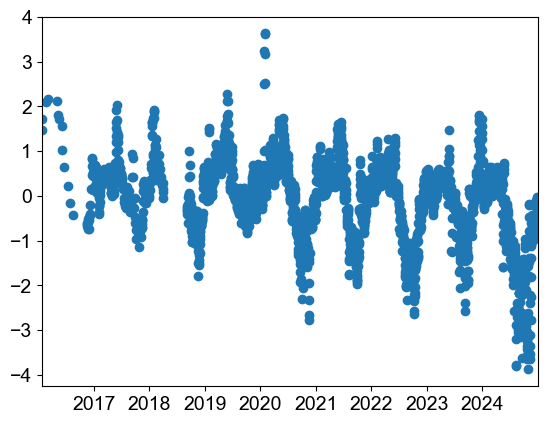

In [39]:
path = 'Seismic_analysis\\'  # set folder related to script location
seismic = pd.read_csv(path + 'dvvJettan_NoFilter.txt', sep='\t') 
seismic = pd.read_csv(path + 'dvvJettan_svd03.txt', sep='\t') 
seismic = pd.read_csv(path + 'dvvJettan_svd07.txt', sep='\t') 
seismic['Datetime'] = pd.to_datetime(seismic['date'], format='%d.%m.%y', errors='coerce')
seismic = seismic.set_index('Datetime')
seismic = seismic.drop(columns=['date'])

In [258]:
path = 'Juditha_permafrost\\'  # set folder related to script location
jtt_temp_G45 = pd.read_csv(path + 'All_scenarios_longterm_45m_percentiles.txt', sep='\t') # Temp
jtt_temp_G45.head() # Need this for monthly/weekly??
# jtt_temp_G45['Date'] = pd.to_datetime(jtt_temp_G45.loc[:,'Date'], format='%d.%m.%Y')
# jtt_temp_G45 = jtt_temp_G45.set_index('Date')
# jtt_temp_G45.head()

,Date,Min,Q1,Mean,Q3,Max
0,1930,0.73,0.78,0.82,0.85,0.87
1,1931,0.73,0.78,0.82,0.85,0.87
2,1932,0.73,0.78,0.82,0.85,0.87
3,1933,0.73,0.78,0.82,0.85,0.86
4,1934,0.73,0.78,0.82,0.85,0.86


In [3]:
# # seismic data
# path = 'Seismic_analysis\\'  # set folder related to script location
# seismic = pd.read_csv(path + 'dvvJETT_03-07Hz.txt', sep='\t') 
# seismic['Datetime'] = pd.to_datetime(seismic['Datetime'], format='%d.%m.%y', errors='coerce')
# seismic = seismic.set_index('Datetime')
# seismic = seismic.drop(columns=['datetime(Matlab_format)'])

path = 'Juditha_permafrost\\'  # set folder related to script location
# jtt_temp_G45 = pd.read_csv(path + 'All_scenarios_longterm_45m_percentiles.txt', sep='\t') # Temp # Temp
jtt_temp_GST = pd.read_csv(path + 'All_scenarios_weekly_GST_percentiles.txt', sep='\t') # Autoparser fucked up the df...
jtt_temp_GST['Date'] = pd.to_datetime(jtt_temp_GST.loc[:,'Date'], format='%d.%m.%Y')
jtt_temp_GST = jtt_temp_GST.set_index('Date')

# New seismic data 
path = 'Seismic_analysis\\'  # set folder related to script location

# seismic = pd.read_csv(path + 'dvvJettan_NoFilter.txt', sep='\t') 
# seismic = pd.read_csv(path + 'dvvJettan_svd03.txt', sep='\t') 
# seismic = pd.read_csv(path + 'dvvJettan_svd07.txt', sep='\t') 

seismic = pd.read_csv(path + 'dvvJettan_v05.txt', sep='\t') 
seismic['Datetime'] = pd.to_datetime(seismic['date'], format='%d.%m.%y', errors='coerce')
seismic = seismic.set_index('Datetime')
seismic = seismic.drop(columns=['date'])

# rest of data
path = 'pre_plotting\\'  # set folder related to script location
extension = '.pkl'

## GPS
# 12 hour data
jett_gps2 = pd.read_pickle(path + 'jett_gps_2' + extension)
jett_gps3 = pd.read_pickle(path + 'jett_gps_3' + extension)
jett_gps4 = pd.read_pickle(path + 'jett_gps_4' + extension)
jett_gps5 = pd.read_pickle(path + 'jett_gps_5' + extension)
jett_gps6 = pd.read_pickle(path + 'jett_gps_6' + extension)
jett_gps7 = pd.read_pickle(path + 'jett_gps_7' + extension)
jett_gps8 = pd.read_pickle(path + 'jett_gps_8' + extension)
jett_gps9 = pd.read_pickle(path + 'jett_gps_9' + extension)
jett_gps10 = pd.read_pickle(path + 'jett_gps_10' + extension)
jett_gps11 = pd.read_pickle(path + 'jett_gps_11' + extension)

gam_gps3 = pd.read_pickle(path + 'gam_gps_3' + extension)
gam_gps4 = pd.read_pickle(path + 'gam_gps_4' + extension)
gam_gps5 = pd.read_pickle(path + 'gam_gps_5' + extension)
gam_gps6 = pd.read_pickle(path + 'gam_gps_6' + extension)
gam_gps7 = pd.read_pickle(path + 'gam_gps_7' + extension)
gam_gps8 = pd.read_pickle(path + 'gam_gps_8' + extension)
gam_gps9 = pd.read_pickle(path + 'gam_gps_9' + extension)
gam_gps10 = pd.read_pickle(path + 'gam_gps_10' + extension)

# # ak_gps4 = pd.read_pickle(path + 'ak_gps_4' + extension)
# # ak_gps5 = pd.read_pickle(path + 'ak_gps_5' + extension)

# # # 4 hour data
# # gps3_4h = pd.read_pickle(path + 'gps3_4h' + extension)
# # gps4_4h = pd.read_pickle(path + 'gps4_4h' + extension)

## Meteorological data from Senorge (real data) and XGEO (Modeled weather data that is better than the cautus weather station)
# Jettan
jtt_xgeo_rain = pd.read_pickle(path + 'jett_xgeo_precip' + extension) 
jtt_xgeo_temp = pd.read_pickle(path + 'jett_xgeo_temp' + extension)
jtt_xgeo_snow = pd.read_pickle(path + 'jett_xgeo_snow' + extension)
jtt_temp = pd.read_pickle(path + 'jtt_temp' + extension)
jtt_precip = pd.read_pickle(path + 'jtt_precip' + extension)
jtt_snow = pd.read_pickle(path + 'jtt_snow' + extension)
jtt_xgeo_surfacerunnoff = pd.read_pickle(path + 'jett_xgeo_surfacerunnoff' + extension)
jtt_xgeo_precip_snowmelt = pd.read_pickle(path + 'jett_xgeo_precip_snowmelt' + extension)

# JT_CLM_1_2 = pd.read_pickle(path + 'JT_CLM_1_2' + extension)
# ST = pd.read_pickle(path + 'ST' + extension)
# tlt2_temp = pd.read_pickle(path + 'tlt2_temp' + extension)
# tlt9_temp = pd.read_pickle(path + 'tlt9_temp' + extension)
# hobos = pd.read_pickle(path + 'hobos' + extension)
# temp1 = pd.read_pickle(path + 'temp1' + extension)

# Gamanjunni
gam_temp = pd.read_pickle(path + 'gam_temp' + extension)
gam_precip = pd.read_pickle(path + 'gam_precip' + extension)
gam_xgeo_rain = pd.read_pickle(path + 'gam_xgeo_precip' + extension)
gam_xgeo_temp = pd.read_pickle(path + 'gam_xgeo_temp' + extension)
gam_xgeo_snow = pd.read_pickle(path + 'gam_xgeo_snow' + extension)
# gam_xgeo_surfacerunnoff = pd.read_pickle(path + 'gam_xgeo_surfacerunnoff' + extension)
gam_xgeo_precip_snowmelt = pd.read_pickle(path + 'gam_xgeo_precip_snowmelt' + extension)

gam_GT_5_50cm = pd.read_pickle(path + 'gam_GT_5_50cm' + extension)
gam_GT_80_200cm = pd.read_pickle(path + 'gam_GT_80_200cm' + extension)
Gam_CLM1_snow = pd.read_pickle(path + 'Gam_CLM1_snow' + extension)

Snow_Manndalen = pd.read_pickle(path + 'Snow_Manndalen' + extension)

Lyngseidet = pd.read_pickle(path + 'Lyngseidet' + extension)

# river data measurements
river1 = pd.read_pickle(path + 'river1' + extension)
river2 = pd.read_pickle(path + 'river2' + extension)

## Borholes

# Jettan RAW
JTT1Disp = pd.read_pickle(path + 'JTT1Disp_raw' + extension)
JTT1Wp = pd.read_pickle(path + 'JTT1Wp_raw' + extension)

JTT2DispUpperZone = pd.read_pickle(path + 'JTT2DispUpperZone_raw' + extension)
JTT2WpUpperZone = pd.read_pickle(path + 'JTT2WpUpperZone_raw' + extension)

JTT2DispLowerZone = pd.read_pickle(path + 'JTT2DispLowerZone_raw' + extension)
JTT2WpLowerZone = pd.read_pickle(path + 'JTT2WpLowerZone_raw' + extension)

JTT3Disp = pd.read_pickle(path + 'JTT3Disp_raw' + extension)
JTT3Wp = pd.read_pickle(path + 'JTT3Wp_raw' + extension)

# # Jettan Creep bursts
# JTT1Disp = pd.read_pickle(path + 'JTT1Disp' + extension)
# JTT1Wp = pd.read_pickle(path + 'JTT1Wp_raw' + extension)

# JTT2DispUpperZone = pd.read_pickle(path + 'JTT2DispUpperZone' + extension)
# JTT2WpUpperZone = pd.read_pickle(path + 'JTT2WpUpperZone_raw' + extension)

# JTT2DispLowerZone = pd.read_pickle(path + 'JTT2DispLowerZone' + extension)
# JTT2WpLowerZone = pd.read_pickle(path + 'JTT2WpLowerZone_raw' + extension)

# JTT3Disp = pd.read_pickle(path + 'JTT3Disp' + extension)
# JTT3Wp = pd.read_pickle(path + 'JTT3Wp_raw' + extension)

# # creating creep database
# def creep_database(df, col_name, STA):
    
#     # time resolution
#     hours = 60*60 # in hours
#     days = hours*24 # in days

#     # fetching creep events
#     window = []
#     previous_d = 0
#     for i, d in enumerate(df['nBursts']):
#             if d != previous_d:
#                 previous_d = d
#                 window.append(df.index[i:i+1])
#     # creating database of creep bursts
#     idx = np.arange(0, len(window), 2)  # index to slice at even numbers
#     idx2 = np.arange(0, len(idx), 1)

#     creep_database = pd.DataFrame(idx2, columns=['event']) # length of df
#     date_start = []
#     date_end = []
#     duration = []
#     duration_days = []
#     date = []
#     displacement_start = []
#     displacement = []
#     velocity = []
#     velocity_days = []
#     slip_distance = []

#     # loading each event and saving data to database
#     for start in idx:
#         creep_event = df.loc[window[start][0]:window[start+1][0]] # the last row in df is not part of creep burst event
#         date_start.append(creep_event.index[0])
#         date_end.append(creep_event.index[-1])
#         duration.append((creep_event.index[-1]-creep_event.index[0]).total_seconds()//hours) # duration in hours
#         duration_days.append((creep_event.index[-1]-creep_event.index[0]).total_seconds()//days) # duration in days
#         date.append((creep_event.index[:-1]-creep_event.index[0]).total_seconds()//hours) # to be able to plot each event
#         displacement_start.append(creep_event[f'{col_name}'][creep_event[f'{col_name}'].first_valid_index()]) # to make plotting on top of entire dataseries easier
#         displacement.append(creep_event[f'{col_name}'][:-1].values-
#                             creep_event[f'{col_name}'][creep_event[f'{col_name}'].first_valid_index()]) # to be able to plot each event
#         slip_distance.append(creep_event[f'{col_name}'][creep_event[f'{col_name}'].last_valid_index()]-
#                              creep_event[f'{col_name}'][creep_event[f'{col_name}'].first_valid_index()]) # total displacement
#         velocity.append(np.nanmax(creep_event[f'{STA}_days_velocity [mm/day]:'][:-1])) # max velocity for 'n_days_velocity' per day

#     creep_database['date_start'] = date_start
#     creep_database['date_end'] = date_end
#     creep_database['duration'] = duration
#     creep_database['date'] = date # to be able to plot each event
#     creep_database['displacement_start'] = displacement_start # to be able to plot each event ontop of entire timeseries
#     creep_database['displacement'] = displacement # to be able to plot each event
#     creep_database['total_slip_distance'] = slip_distance
#     creep_database['max_velocity'] = velocity
# #     # the below are for the creep database plots in days
#     creep_database['duration_days'] = duration_days 
#     creep_database['nEvents'] = 1
    
#     return creep_database

# col_name='Disp_summed [mm]:'
# JTT1Disp_creep = creep_database(JTT1Disp, col_name=col_name, STA=32)
# JTT2DispLowerZone_creep = creep_database(JTT2DispLowerZone, col_name=col_name, STA=32)
# JTT2DispUpperZone_creep = creep_database(JTT2DispUpperZone, col_name=col_name, STA=32)
# JTT2DispLowerZone_creep = creep_database(JTT2DispLowerZone, col_name=col_name, STA=32)
# JTT3Disp_creep = creep_database(JTT3Disp, col_name=col_name, STA=32)

# PhD Figures

In [565]:
seismic.head()

,dv/v(%),cc
Datetime,,
2016-01-01,NaN,NaN
2016-01-02,NaN,NaN
2016-01-03,NaN,NaN
2016-01-04,NaN,NaN
2016-01-05,NaN,NaN


Text(0, 0.5, 'dV/V')

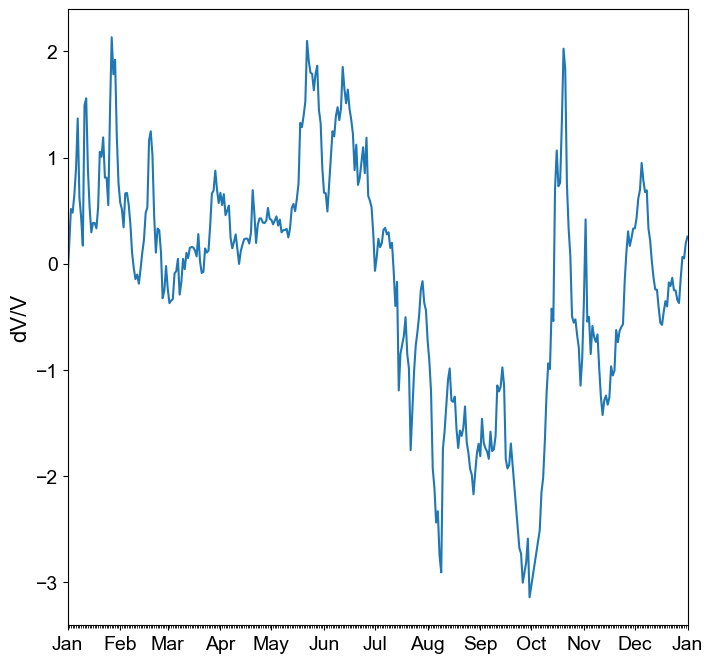

In [571]:
fig, ax = plt.subplots(figsize=(8, 8))

# df = jett_gps4.copy()
# start_time = '01-01-2020'
# end_time = '01-01-2021'
# df = df.loc[start_time:end_time]
# df = df.dropna()

# df = gam_gps4.copy()
# start_time = '01-01-2021'
# end_time = '01-01-2022'
# df = df.loc[start_time:end_time]
# df = df.dropna()

# ax.plot(df.index, df.loc[:,'2d']-df.iloc[0]['2d'])

# df = JTT1Disp.copy()
# start_time = '01-01-2022'
# end_time = '01-01-2023'
# df = df.loc[start_time:end_time]
# df = df.dropna()

# ax.plot(df.index, df.iloc[:,0]-df.iloc[0,0])

df = seismic.dropna().copy()
start_time = '01-01-2021'
end_time = '01-01-2022'
df = df.loc[start_time:end_time]
df = df.dropna()
ax.plot(df.index, df.iloc[:,0])

def set_date_ticks(ax, years=False, day=False, months=False):
    if years==True:
        januarys = mdates.MonthLocator(bymonth=[1], bymonthday=[1])  # January 1st of each year
        months_fmt = mdates.DateFormatter('%Y')  # Display year only
        ax.xaxis.set_major_locator(januarys)
        ax.xaxis.set_major_formatter(months_fmt)
        # Minor ticks for every month (not restricted to January)
        months_minor = mdates.MonthLocator()  # Every month
        ax.xaxis.set_minor_locator(months_minor)

    if day==True:
        days_fmt = mdates.DateFormatter('%d')
        ax.xaxis.set_minor_formatter(days_fmt)
        n = 5  # keeps every n-th minor label
        [l.set_visible(False) for (i, l) in enumerate(ax.xaxis.get_minorticklabels()) if i % n != 0]

    if months==True:
        months = mdates.MonthLocator()   # Locator for every month
        months_fmt = mdates.DateFormatter('%b')  # Formatter for month and year
        ax.xaxis.set_major_locator(months)       # Major ticks on the first of each month
        ax.xaxis.set_major_formatter(months_fmt) # Format to display month and year
        days = mdates.DayLocator()   # Locator for every day
        ax.xaxis.set_minor_locator(days)    # Minor ticks for each day

# if monthly time series    
set_date_ticks(ax, months=True)

# #legend
# ax.legend(loc='upper left') # center of fig

# set axis labels
# ax.set_ylabel(r'Creep rate (mm/day)')

ax.set_ylabel(r'dV/V')

# # setting range y-axes
# ax.set_yticks(np.arange(0, 0.4, 0.1))

# ymax = ax.get_ylim()[1]
# ax.set_ylim(0,ymax)

# # removing space on sides of x-axis
# ax.set_xlim(pd.Timestamp('2020-01-01'), pd.Timestamp('2022-01-01'))

# path = 'plots_numericalproject\\'
# save_name = f'{path}figure4_{label}_new'
# fig.savefig(save_name+'.png', dpi=600)

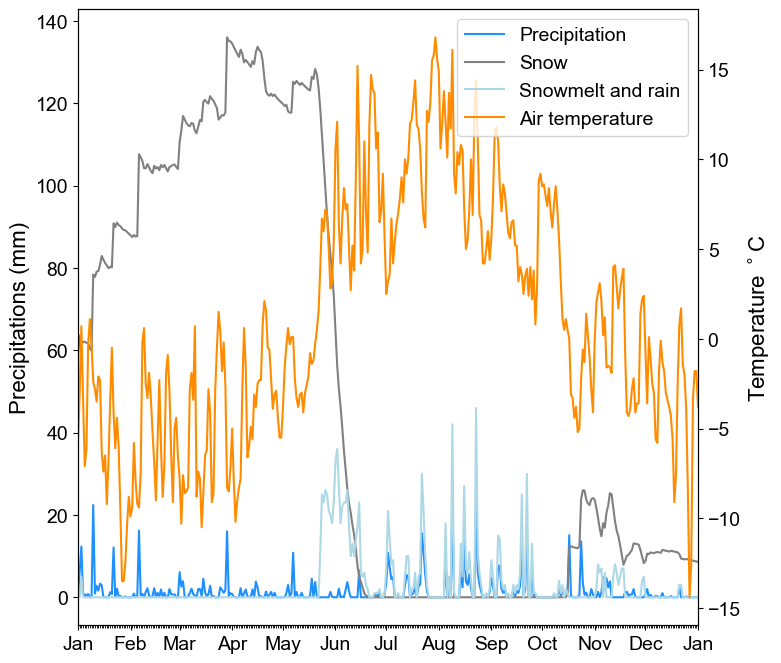

In [551]:
fig, ax = plt.subplots(figsize=(8, 8))

df = jtt_xgeo_rain.copy()
start_time = '01-01-2020'
end_time = '01-01-2021'
df = df.loc[start_time:end_time]
df = df.dropna()
ax.plot(df.index, df.iloc[:,0], color='dodgerblue', label='Precipitation')

df = jtt_xgeo_snow.copy()
start_time = '01-01-2020'
end_time = '01-01-2021'
df = df.loc[start_time:end_time]
df = df.dropna()
ax.plot(df.index, df.iloc[:,0], color='gray', label='Snow')

df = jtt_xgeo_precip_snowmelt.copy()
start_time = '01-01-2020'
end_time = '01-01-2021'
df = df.loc[start_time:end_time]
df = df.dropna()
ax.plot(df.index, df.iloc[:,0], color='lightblue', label='Snowmelt and rain')


ax_y = ax.twinx()
df = jtt_xgeo_temp.copy()
start_time = '01-01-2020'
end_time = '01-01-2021'
df = df.loc[start_time:end_time]
df = df.dropna()
ax_y.plot(df.index, df.iloc[:,0], color='darkorange', label='Air temperature')

def set_date_ticks(ax, years=False, day=False, months=False):
    if years==True:
        januarys = mdates.MonthLocator(bymonth=[1], bymonthday=[1])  # January 1st of each year
        months_fmt = mdates.DateFormatter('%Y')  # Display year only
        ax.xaxis.set_major_locator(januarys)
        ax.xaxis.set_major_formatter(months_fmt)
        # Minor ticks for every month (not restricted to January)
        months_minor = mdates.MonthLocator()  # Every month
        ax.xaxis.set_minor_locator(months_minor)

    if day==True:
        days_fmt = mdates.DateFormatter('%d')
        ax.xaxis.set_minor_formatter(days_fmt)
        n = 5  # keeps every n-th minor label
        [l.set_visible(False) for (i, l) in enumerate(ax.xaxis.get_minorticklabels()) if i % n != 0]

    if months==True:
        months = mdates.MonthLocator()   # Locator for every month
        months_fmt = mdates.DateFormatter('%b')  # Formatter for month and year
        ax.xaxis.set_major_locator(months)       # Major ticks on the first of each month
        ax.xaxis.set_major_formatter(months_fmt) # Format to display month and year
        days = mdates.DayLocator()   # Locator for every day
        ax.xaxis.set_minor_locator(days)    # Minor ticks for each day

# if monthly time series    
set_date_ticks(ax, months=True)

# #legend
# ax.legend(loc='upper left') # center of fig

# set axis labels
ax.set_ylabel(r'Precipitations (mm)')
ax_y.set_ylabel('Temperature $^\circ$C')

handles, labels = [(a + b) for a, b in zip(ax.get_legend_handles_labels(),ax_y.get_legend_handles_labels())]
ax_y.legend(handles, labels, loc='upper right')

# # setting range y-axes
# ax.set_yticks(np.arange(0, 0.4, 0.1))

# ymax = ax.get_ylim()[1]
# ax.set_ylim(0,ymax)

# # removing space on sides of x-axis
# ax.set_xlim(pd.Timestamp('2020-01-01'), pd.Timestamp('2022-01-01'))

# path = 'plots_numericalproject\\'
# save_name = f'{path}figure4_{label}_new'
# fig.savefig(save_name+'.png', dpi=600)

# Verify that xgeo is good even though met station changed in 2022

<Axes: xlabel='datetime'>

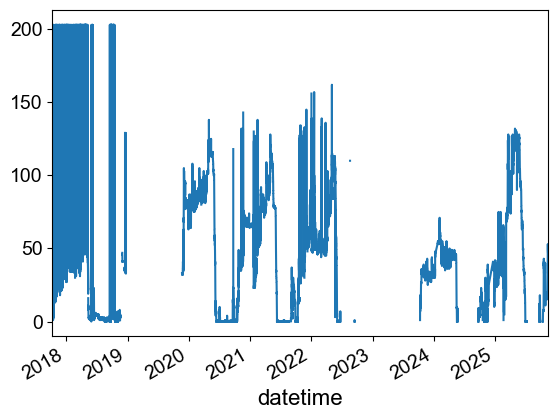

In [240]:
Gam_CLM1_snow.iloc[:,0].plot() # crap

<Axes: xlabel='year'>

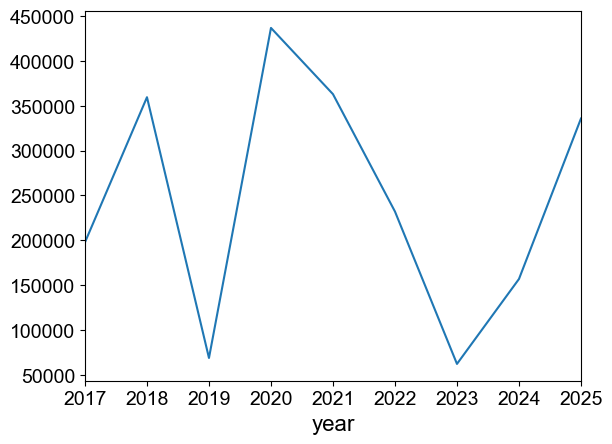

In [266]:
annual_cumulative = Gam_CLM1_snow.groupby('year')['snow_depth_cm'].sum()
annual_cumulative.plot()

In [246]:
Snow_Manndalen.head()

,Snødybde,year,month,day
datetime,,,,
2015-01-14,8.0,2015.0,1.0,14.0
2015-01-15,8.0,2015.0,1.0,15.0
2015-01-16,8.0,2015.0,1.0,16.0
2015-01-17,8.0,2015.0,1.0,17.0
2015-01-18,8.0,2015.0,1.0,18.0


<Axes: xlabel='datetime'>

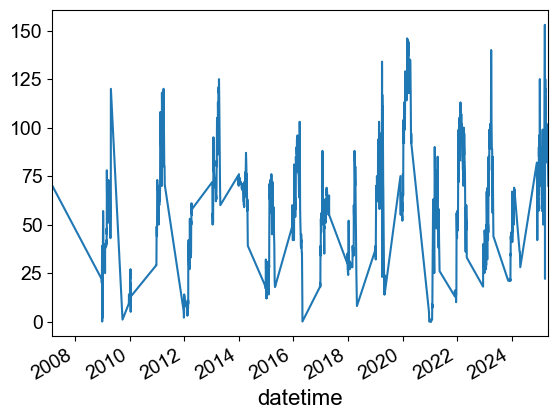

In [271]:
Lyngseidet.iloc[:,0].plot()

<Axes: xlabel='datetime'>

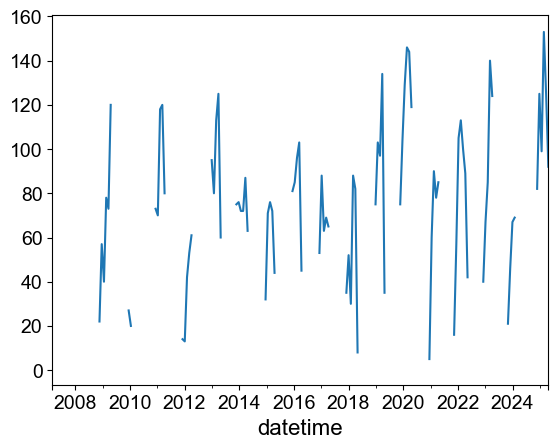

In [481]:
interval = 30

# Take the first column as Series
df = Lyngseidet.iloc[:, 0].copy()
df1 = jtt_xgeo_snow.iloc[:, 0].copy()

# Resample by 30 days
df = df.resample(f'{interval}d').max()
df.plot()

<Axes: xlabel='datetime'>

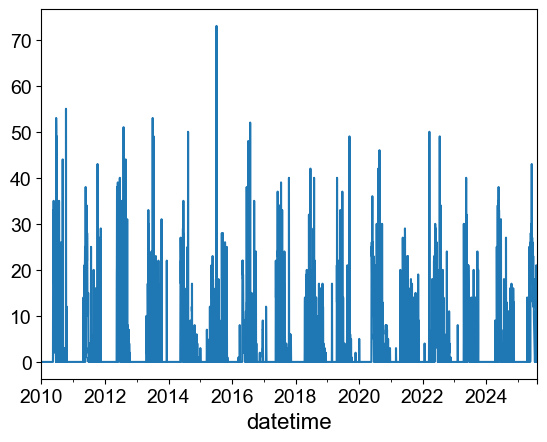

In [484]:
jtt_xgeo_precip_snowmelt.iloc[:,0].plot()


In [8]:
Lyngseidet.head()

,Snødybde,year,month,day
datetime,,,,
2007-02-27,70.0,2007.0,2.0,27.0
2008-12-16,22.0,2008.0,12.0,16.0
2008-12-17,22.0,2008.0,12.0,17.0
2008-12-18,20.0,2008.0,12.0,18.0
2008-12-19,20.0,2008.0,12.0,19.0


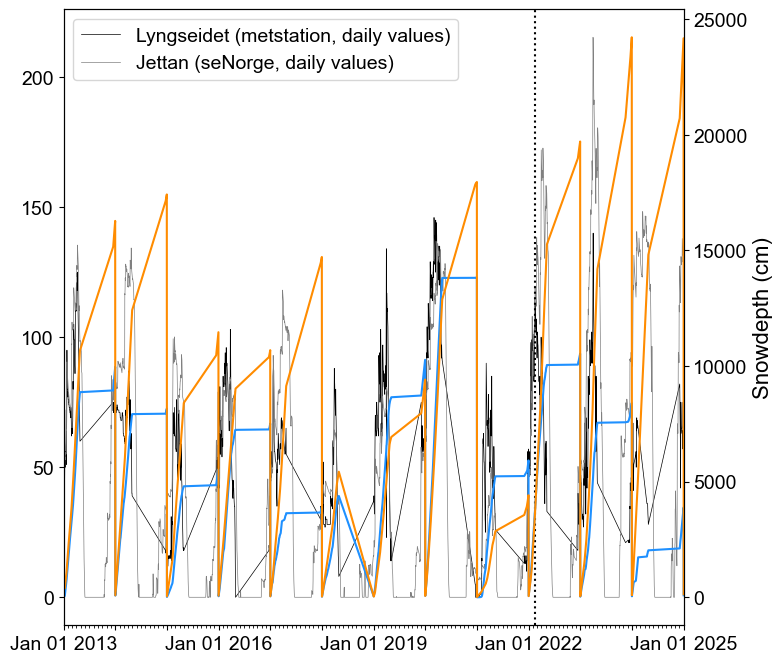

In [16]:

# THIS ILLUSTRATES THAT XGEO MIGHT OVERESTIMATE THE LONG TERM CHANGE, BUT THERE IS AN INCREASE SINCE 2020!

interval = 30
s1 = Lyngseidet.copy()
# s1['depth_mean'] = s1['Snødybde'].resample(f'{interval}d').max()
s2 = jtt_xgeo_snow.copy()
# s2['depth_mean'] = s2['depth'].resample(f'{interval}d').max()

# Maximum each year
# s1 = s1.groupby('year')['Snødybde'].max()
# s1 = s1.to_frame()
# years = s1.index.astype(int)
# s1.index = pd.to_datetime(years, format="%Y") # Convert to datetime (year only → January 1st)
# s2 = s2.groupby('year')['depth'].max()
# s2 = s2.to_frame()
# years = s2.index.astype(int)
# s2.index = pd.to_datetime(years, format="%Y") # Convert to datetime (year only → January 1st)

# Cumulative each year
s1 = s1.groupby('year')['Snødybde'].cumsum()
s1 = s1.to_frame()
# years = s1.index.astype(int)
# s1.index = pd.to_datetime(years, format="%Y") # Convert to datetime (year only → January 1st)
s2 = s2.groupby('year')['depth'].cumsum()
s2 = s2.to_frame()
# years = s2.index.astype(int)
# s2.index = pd.to_datetime(years, format="%Y") # Convert to datetime (year only → January 1st)

# Keep only days where both have values
df_merged = pd.concat([s1, s2], axis=1, join='inner')
df_merged.columns = ['Lyngseidet', 'JTT_Xgeo_Snow']

start_date = '2013-01-01'
end_date = '2025-01-01'

df_merged = df_merged[start_date:end_date]

fig, ax = plt.subplots(figsize=(8, 8))

df = Lyngseidet.dropna().copy()
df = df[start_date:end_date]
ax.plot(df.iloc[:,0], color='black', label='Lyngseidet (metstation, daily values)', linewidth=0.5)

df = jtt_xgeo_snow.copy()
df = df[start_date:end_date]
ax.plot(df.iloc[:,0], color='gray', label='Jettan (seNorge, daily values)', linewidth=0.5) #alpha=.4

# ax.plot(df_merged.iloc[:,0], color='dodgerblue', label='Lyngseide (metstation, Yearly max)')
# ax.plot(df_merged.iloc[:,1], color='darkorange', label='Jettan (seNorge, Yearly max)')

ax_y = ax.twinx()
ax_y.plot(df_merged.iloc[:,0], color='dodgerblue', label='Lyngseide (metstation, cumulative yearly max)')
ax_y.plot(df_merged.iloc[:,1], color='darkorange', label='Jettan (seNorge, cumulative yearly max)')

# Time of new station
ax.axvline(x=pd.Timestamp('2022-02-16'), color="black", linestyle=":", linewidth=1.5)
plt.ylabel('Snowdepth (cm)')

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax.xaxis.set_minor_locator(months)
ax.xaxis.set_major_locator(mdates.YearLocator(1, month=1, day=1))  # Major ticks on Jan 1st of every year
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d %Y')) 

# removing tick labels from the xaxis
n = 3  # keeps every n row
[l.set_visible(False) for (i,l) in enumerate(ax.xaxis.get_ticklabels()) if i % n != 0] # Get 'none' from this for some reason

ax.legend(loc='upper left')

# # # saving
path = 'plots\\'
save_name = f'{path}SI_Fig_metstations.png'
# save_name = f'{path}Figure2_A0poster.png'
fig.savefig(save_name, dpi=600) # , transparent=True,  bbox_inches='tight'

In [490]:
Lyngseidet.tail()

,Snødybde,year,month,day
datetime,,,,
2025-05-04,77.0,2025.0,5.0,4.0
2025-05-05,75.0,2025.0,5.0,5.0
2025-05-06,72.0,2025.0,5.0,6.0
2025-05-07,70.0,2025.0,5.0,7.0
NaT,NaN,NaN,NaN,NaN


[None, None, None, None, None, None, None, None]

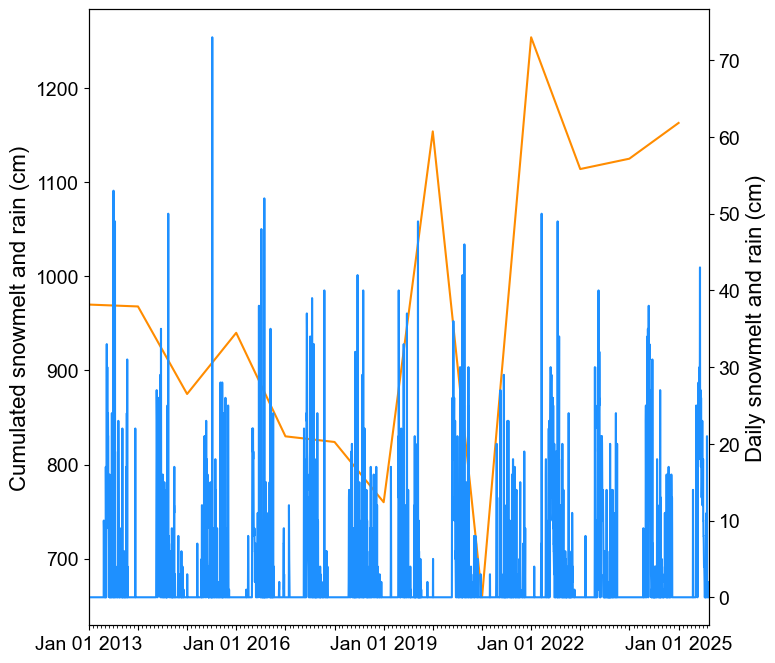

In [500]:

df = Lyngseidet.copy()
annual_cumulative = df.groupby('year')['Snødybde'].sum()
annual_cumulative = annual_cumulative.to_frame()
years = annual_cumulative.index.astype(int)
annual_cumulative.index = pd.to_datetime(years, format="%Y") # Convert to datetime (year only → January 1st)
s1 = annual_cumulative.copy()

df = jtt_xgeo_precip_snowmelt.copy()
annual_cumulative = df.groupby('year')['precip_and_snowmelt'].sum()
annual_cumulative = annual_cumulative.to_frame()
years = annual_cumulative.index.astype(int)
annual_cumulative.index = pd.to_datetime(years, format="%Y") # Convert to datetime (year only → January 1st)
s2 = annual_cumulative.copy()


# Keep only days where both have values
df_merged = pd.concat([s1, s2], axis=1, join='inner')
df_merged.columns = ['Lyngseidet', 'JTT_Xgeo_Snowmelt and rain']

start_date = '2013-01-01'
end_date = '2025-12-31'

df_merged = df_merged[start_date:end_date]

fig, ax = plt.subplots(figsize=(8, 8))
# ax.plot(df_merged.iloc[:,0], color='dodgerblue', label='Lyngseide (metstation)')
ax.plot(df_merged.iloc[:,1], color='darkorange', label='Jettan cumulated (seNorge)')

ax_y = ax.twinx()
df = df[start_date:end_date]
ax_y.plot(df.iloc[:,0], color='dodgerblue', label='Jettan daily (seNorge)')

ax_y.set_ylabel('Daily snowmelt and rain (cm)')
ax.set_ylabel('Cumulated snowmelt and rain (cm)')

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax.xaxis.set_minor_locator(months)
ax.xaxis.set_major_locator(mdates.YearLocator(1, month=1, day=1))  # Major ticks on Jan 1st of every year
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d %Y')) 

# removing tick labels from the xaxis
n = 3  # keeps every n row
[l.set_visible(False) for (i,l) in enumerate(ax.xaxis.get_ticklabels()) if i % n != 0] # Get 'none' from this for some reason

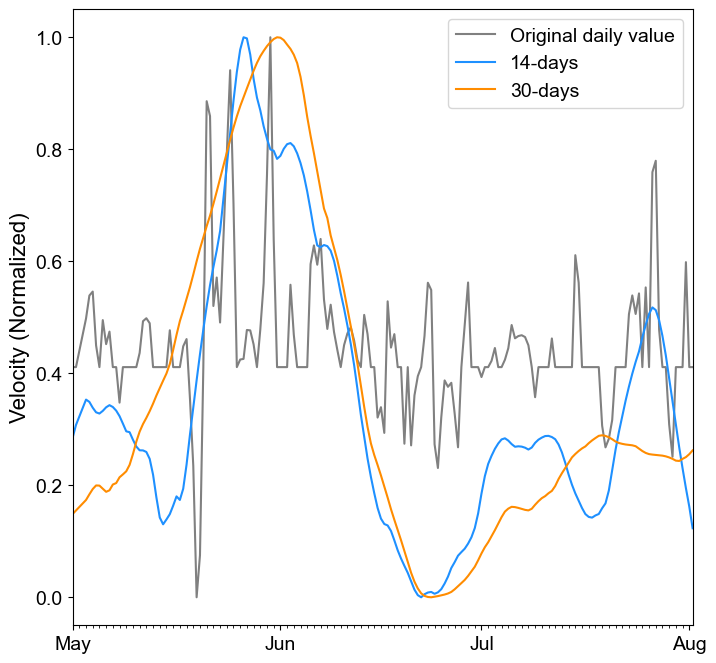

In [521]:
def diff_shift(df, nrow_shift): # backward difference
    return (df - df.shift(nrow_shift)) / nrow_shift  # Average velocity over `nrow_shift` rows

def diff_shift(df, nrow_shift): # centered
    half = nrow_shift // 2
    return (df.shift(-half) - df.shift(half)) / nrow_shift

import numpy as np

def rolling_slope(series, window):
    # assumes regular daily index and window is integer number of rows
    x = np.arange(window) # i = 0,1,2,3,4,5
    xf = x - x.mean() # xi = [-2,-1,0,1,2]
    denom = (xf**2).sum() # sum_i (xi^2) xi = centered x-position
    def slope(y):
        if np.isnan(y).any(): return np.nan
        # linear fit slope (units per index); for daily index -> units/day
        return (xf * y).sum() / denom # slope sumed over window = (xi*di)/(xi^2) di = displacement
    return series.rolling(window=window, center=True).apply(slope, raw=True)


########### Cleaning DMS and GPS ############
from scipy.signal import savgol_filter
def clean_lowpassfilt(file, colnmbr=0, name='Water table [m bgl]:'): # colnmbr is the column chosen to lowpass filter, name is wanted name for filtered column
    # rolling mean filter window
    window_mean = 14
    # savgol parameters
    window_size = 7
    poly_order = 3
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    # file = file.resample('1D').median() # matching interval of cleaning parameters
    file = file.dropna()
    file['interpolated'] = file.iloc[:,colnmbr].interpolate(method='linear', limit_direction ='forward')
    # file['filt'] = butter_lowpass_filter(file.iloc[:,-1], cutoff, fs, order) # replace original by lowpass filtered
    file['filt'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    file['filt'] = file['filt'].rolling(window=window_mean, center=True).median() # rolling median
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    file.rename(columns={'filt':name}, inplace=True) # I call it the same as original if it was dependent on name in scripts lower down
    return file
######################################

import numpy as np
import pandas as pd

def rolling_slope_time(series, window="30D"):
    """
    Time-based rolling slope using real timestamps (centered windows).
    Output is always: units per day.
    """

    def slope(x: pd.Series):
        y = x.values
        t = x.index.view("int64") / 1e9    # time in seconds for this window only

        mask = ~np.isnan(y)
        if mask.sum() < 2:
            return np.nan

        t_valid = t[mask]
        y_valid = y[mask]

        # center time values for numerical stability
        t_centered = t_valid - t_valid.mean()

        denom = (t_centered ** 2).sum()
        if denom == 0:
            return np.nan

        # slope in units per second
        slope_sec = (t_centered * y_valid).sum() / denom

        # convert to units per day
        return slope_sec * 86400

    # centered window here:
    return series.rolling(window=window, center=True).apply(slope, raw=False)

data='2d'

df = jett_gps4.copy()
df[data] = clean_lowpassfilt(df[data], colnmbr=0, name=f'{data}')
# df = df.resample('1D').median() # downsample to days

window_size = '1D'
df['1day'] = rolling_slope_time(df.loc[:,data], window_size)

window_size = '14D'
# df['14day'] = diff_shift(df.loc[:,'2d'], window_size)
df['14day'] = rolling_slope_time(df.loc[:,data], window_size)

window_size = '30D'
# df['30day'] = diff_shift(df.loc[:,'2d'], window_size)
df['30day'] = rolling_slope_time(df.loc[:,data], window_size)

# df['30day_time'] = rolling_slope_time(df.loc[:,data], '30D')

df = df[['1day','14day','30day']].dropna()

start_date = '2020-05-01'
end_date = '2020-08-01'

df = df[start_date:end_date]

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler() # normalize between 0 and 1, has to be this when dataset is not normally distributed
scaled_combined = pd.DataFrame(scaler.fit_transform(df), columns=df.columns, index=df.index)

fig, ax = plt.subplots(figsize=(8, 8))
ax.plot(scaled_combined.index, scaled_combined.loc[:,'1day'], label='Original daily value', color='gray')
ax.plot(scaled_combined.index, scaled_combined.loc[:,'14day'], label='14-days', color='dodgerblue')
ax.plot(scaled_combined.index, scaled_combined.loc[:,'30day'], label='30-days', color='darkorange')
# ax.plot(scaled_combined.index, scaled_combined.loc[:,'30day_time'], label='30-days', linestyle='--', color='black')

# plt.title("Rain+snow")
# plt.xlabel("Time")
plt.ylabel("Velocity (Normalized)")

# # Major ticks for years
# years = mdates.YearLocator()   # Locator for every year
# years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
# ax.xaxis.set_major_locator(years)
# ax.xaxis.set_major_formatter(years_fmt)

# # Minor ticks for months
# months = mdates.MonthLocator()   # Locator for every month
# months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
# ax.xaxis.set_minor_locator(months)
# ax.xaxis.set_major_locator(mdates.YearLocator(1, month=1, day=1))  # Major ticks on Jan 1st of every year
# ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d %Y')) 

import matplotlib.dates as mdates

# --- Major ticks: Months with labels ---
ax.xaxis.set_major_locator(mdates.MonthLocator())            # Tick at the start of every month
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))     # Label as Jan, Feb, Mar...

# --- Minor ticks: Days without labels ---
ax.xaxis.set_minor_locator(mdates.DayLocator())              # Tick every day
ax.xaxis.set_minor_formatter(mdates.DateFormatter(''))       # No labels

# # removing tick labels from the xaxis
# n = 2  # keeps every n row
# [l.set_visible(False) for (i,l) in enumerate(ax.xaxis.get_ticklabels()) if i % n != 0] # Get 'none' from this for some reason

ax.legend()

# # # saving
path = 'plots\\'
save_name = f'{path}SI_Fig_rolingregression.png'
# save_name = f'{path}Figure2_A0poster.png'
fig.savefig(save_name, dpi=600) # , transparent=True,  bbox_inches='tight'

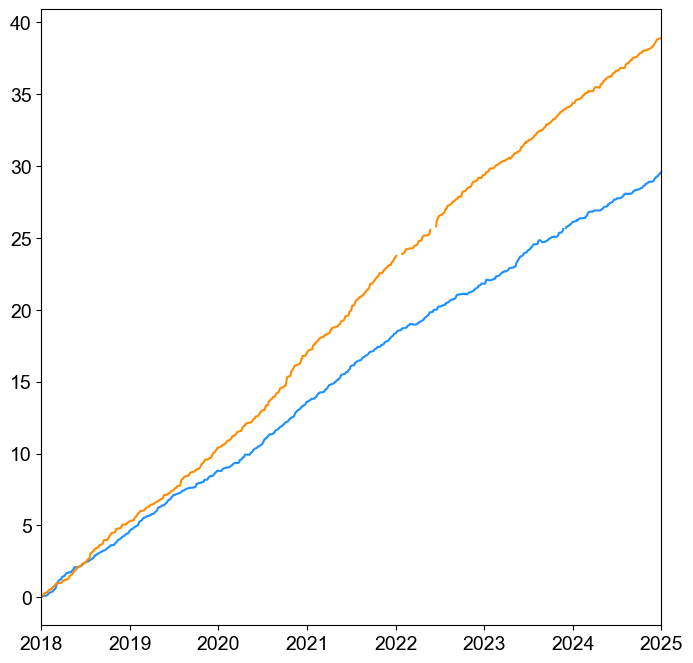

In [361]:
# comparing BH-2 lower and BH-3

# # ######### Borehoel
# JTT3 data
file = JTT3Disp.iloc[:,0]
file = file.resample('1D').median() # downsampling with median value to seismic data resolution
file1 = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
# file1 = rolling_slope_time(file1, vel_interval) # velocity

# JTT2 lower data
file = JTT2DispLowerZone.iloc[:,0]
file = file.resample('1D').median() # downsampling with median value to seismic data resolution
file2 = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
# file2 = rolling_slope_time(file2, vel_interval) # velocity

df = pd.concat([file1,file2], axis=1) 

start_date = '2018-01-01'
end_date = '2025-01-01'

df = df[start_date:end_date]

# from sklearn.preprocessing import MinMaxScaler
# scaler = MinMaxScaler() # normalize between 0 and 1, has to be this when dataset is not normally distributed
# scaled_combined = pd.DataFrame(scaler.fit_transform(df), columns=df.columns, index=df.index)

fig, ax = plt.subplots(figsize=(8, 8))
# dispo
ax.plot(df.index, df.iloc[:,1]-df.iloc[0,1], label='BH-2 lower', color='dodgerblue')
ax.plot(df.index, df.iloc[:,0]-df.iloc[0,0], label='BH-3', color='darkorange')

# # velocity
# ax.plot(df.index, df.iloc[:,1], label='BH-2 lower', color='dodgerblue')
# ax.plot(df.index, df.iloc[:,0], label='BH-3', color='darkorange')

In [349]:
df.head()

,Disp_summed [mm]:,Disp_summed [mm]:
Date:,,
2020-05-01,0.007285,0.004885
2020-05-02,0.006672,0.004952
2020-05-03,0.006071,0.005403
2020-05-04,0.005517,0.006034
2020-05-05,0.005376,0.006631


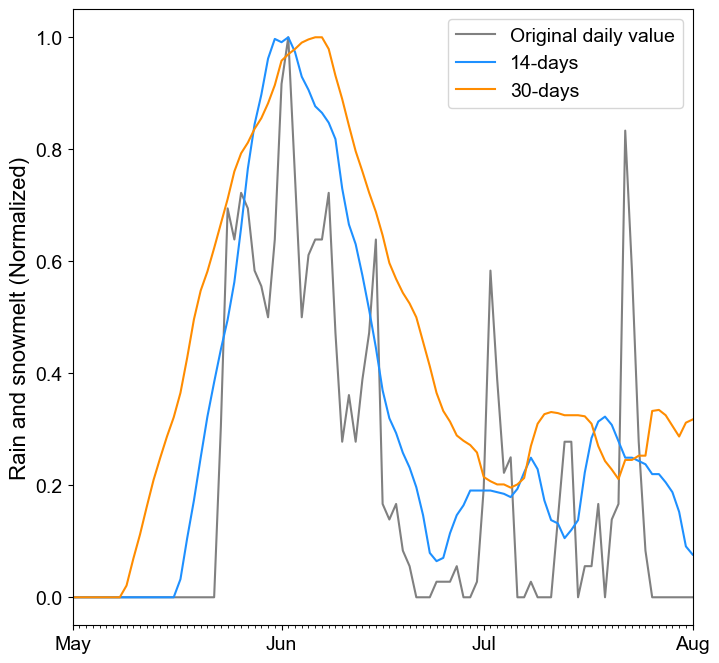

In [525]:
window_size = 14
df = jtt_xgeo_precip_snowmelt.copy()
df['sum_14day'] = running_sum(df.iloc[:,0], window_size)

window_size = 30
df['sum_30day'] = running_sum(df.iloc[:,0], window_size)

df = df[['precip_and_snowmelt','sum_14day','sum_30day']].dropna()

start_date = '2020-05-01'
end_date = '2020-08-01'

df = df[start_date:end_date]
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler() # normalize between 0 and 1, has to be this when dataset is not normally distributed
scaled_combined = pd.DataFrame(scaler.fit_transform(df), columns=df.columns, index=df.index)

fig, ax = plt.subplots(figsize=(8, 8))
ax.plot(scaled_combined.index, scaled_combined.loc[:,'precip_and_snowmelt'], label='Original daily value', color='gray')
ax.plot(scaled_combined.index, scaled_combined.loc[:,'sum_14day'], label='14-days', color='dodgerblue')
ax.plot(scaled_combined.index, scaled_combined.loc[:,'sum_30day'], label='30-days', color='darkorange')

# plt.title("Rain+snow")
# plt.xlabel("Time")
plt.ylabel("Rain and snowmelt (Normalized)")

# # Major ticks for years
# years = mdates.YearLocator()   # Locator for every year
# years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
# ax.xaxis.set_major_locator(years)
# ax.xaxis.set_major_formatter(years_fmt)

# # Minor ticks for months
# months = mdates.MonthLocator()   # Locator for every month
# months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
# ax.xaxis.set_minor_locator(months)
# ax.xaxis.set_major_locator(mdates.YearLocator(1, month=1, day=1))  # Major ticks on Jan 1st of every year
# ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d %Y')) 

import matplotlib.dates as mdates

# --- Major ticks: Months with labels ---
ax.xaxis.set_major_locator(mdates.MonthLocator())            # Tick at the start of every month
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))     # Label as Jan, Feb, Mar...

# --- Minor ticks: Days without labels ---
ax.xaxis.set_minor_locator(mdates.DayLocator())              # Tick every day
ax.xaxis.set_minor_formatter(mdates.DateFormatter(''))       # No labels

# # removing tick labels from the xaxis
# n = 2  # keeps every n row
# [l.set_visible(False) for (i,l) in enumerate(ax.xaxis.get_ticklabels()) if i % n != 0] # Get 'none' from this for some reason

ax.legend()

# # # saving
path = 'plots\\'
save_name = f'{path}SI_Fig_runningsum.png'
# save_name = f'{path}Figure2_A0poster.png'
fig.savefig(save_name, dpi=600) # , transparent=True,  bbox_inches='tight'

C:\Users\andregas\AppData\Local\anaconda3\Lib\site-packages\matplotlib\text.py:763: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  posy = float(self.convert_yunits(y))
C:\Users\andregas\AppData\Local\anaconda3\Lib\site-packages\matplotlib\text.py:906: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  y = float(self.convert_yunits(self._y))


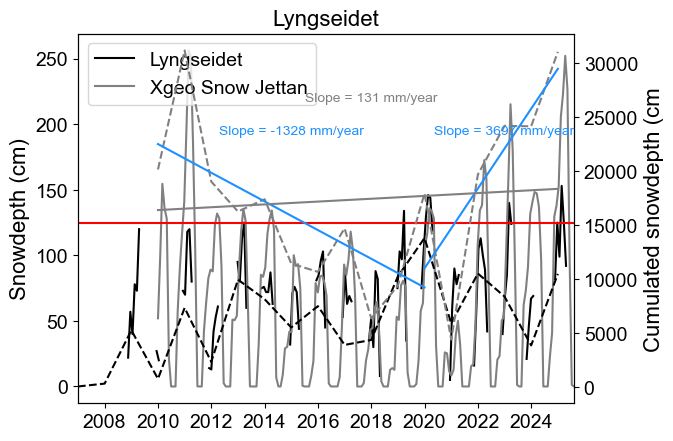

In [439]:
df = Lyngseidet.copy()

annual_cumulative = df.groupby('year')['Snødybde'].sum()
annual_cumulative = annual_cumulative.to_frame()
years = annual_cumulative.index.astype(int)
annual_cumulative.index = pd.to_datetime(years, format="%Y") # Convert to datetime (year only → January 1st)

interval = 30
df = df.resample(f'{interval}d').max()

fig, ax = plt.subplots()
ax.plot(df.iloc[:,0], label='Lyngseidet', color='black')

ax_y = ax.twinx()
ax_y.plot(annual_cumulative.iloc[:,0], label='Cumulated yearly snowdepth', linestyle='--', color='black')

# adding xgeo to compare
df = jtt_xgeo_snow.copy()
annual_cumulative = df.groupby('year')['depth'].sum()
annual_cumulative = annual_cumulative.to_frame()
years = annual_cumulative.index.astype(int)
annual_cumulative.index = pd.to_datetime(years, format="%Y") # Convert to datetime (year only → January 1st)

df = df.resample(f'{interval}d').max()
ax.plot(df.iloc[:,0], label='Xgeo Snow Jettan', color='gray')

ax_y.plot(annual_cumulative.iloc[:,0], label='Cumulated yearly snowdepth', linestyle='--', color='gray')

plt.title('Lyngseidet')
ax_y.set_ylabel('Cumulated snowdepth (cm')
ax.set_ylabel('Snowdepth (cm)')

# Linear fit befor and after changed station
from scipy.stats import linregress

x = annual_cumulative.iloc[:,0].copy()
start_time = '01-01-2008'
end_time = '01-01-2020'
df1 = x[x.index.slice_indexer(start_time,end_time)]
# df1 = x.reset_index(drop=True)

y = annual_cumulative.iloc[:,0].copy()
start_time = '01-01-2020'
end_time = '01-01-2025'
df2 = y[y.index.slice_indexer(start_time,end_time)]
# df2 = y.reset_index(drop=True)

y = annual_cumulative.iloc[:,0].copy()
start_time = '01-01-2008'
end_time = '01-01-2025'
df3 = y[y.index.slice_indexer(start_time,end_time)]
# df2 = y.reset_index(drop=True)

x = np.arange(len(df1))
y = df1.values
res = linregress(x, y)
trend1 = res.slope * x + res.intercept

slope_per_year = res.slope
slope_text = f"Slope = {slope_per_year:.0f} mm/year"

y_value = annual_cumulative.max()

# Add text in top-left corner
plt.text(df1.index[int(len(df1) / 2)], 
         y_value*0.75,  # 95% of max for vertical position
         slope_text,
         color='dodgerblue',
         fontsize=10, 
         ha='center')

x = np.arange(len(df2))
y = df2.values
res = linregress(x, y)
trend2 = res.slope * x + res.intercept

slope_per_year = res.slope
slope_text = f"Slope = {slope_per_year:.0f} mm/year"

# Add text in top-left corner
plt.text(df2.index[int(len(df2) / 2)], 
         y_value*0.75,  # 95% of max for vertical position
         slope_text,
         color='dodgerblue',
         fontsize=10, 
         ha='center')

x = np.arange(len(df3))
y = df3.values
res = linregress(x, y)
trend3 = res.slope * x + res.intercept

slope_per_year = res.slope
slope_text = f"Slope = {slope_per_year:.0f} mm/year"

# Add text in top-left corner
plt.text(df3.index[int(len(df3) / 2)], 
         y_value*0.85,  # 95% of max for vertical position
         slope_text,
         color='gray',
         fontsize=10, 
         ha='center')

# Regression lines
ax_y.plot(df1.index, trend1, label='before 2020', color='dodgerblue')
ax_y.plot(df2.index, trend2, label='after 2020', color='dodgerblue')
ax_y.plot(df3.index, trend3, label='Entire series', color='gray')
ax.legend(loc='upper left')

ax.axhline(125, color='red')   

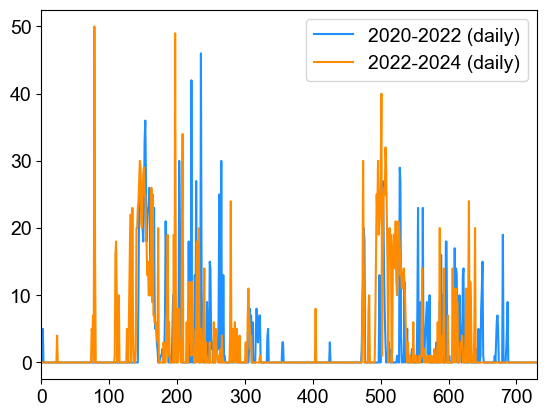

In [64]:
x = jtt_xgeo_precip_snowmelt.iloc[:,0].copy()
start_time = '01-01-2020'
end_time = '01-01-2022'
x = x[x.index.slice_indexer(start_time,end_time)]
x = x.reset_index(drop=True)

y = jtt_xgeo_precip_snowmelt.iloc[:,0].copy()
start_time = '01-01-2022'
end_time = '01-01-2024'
y = y[y.index.slice_indexer(start_time,end_time)]
y = y.reset_index(drop=True)

fig, ax = plt.subplots()
ax.plot(x, label='2020-2022 (daily)', color='dodgerblue')
ax.plot(y, label='2022-2024 (daily)', color='darkorange')

from scipy.stats import linregress

x = np.arange(len(df))
res = linregress(x, df["temperature"])

trend = res.slope * x + res.intercept

# ax.plot(running_sum(x,14), label='2020-2022 (14-day)', color='dodgerblue', linestyle=':')
# ax.plot(running_sum(y,14), label='2022-2024 (14-day)', color='darkorange', linestyle=':')

ax.legend()


[None, None, None, None]

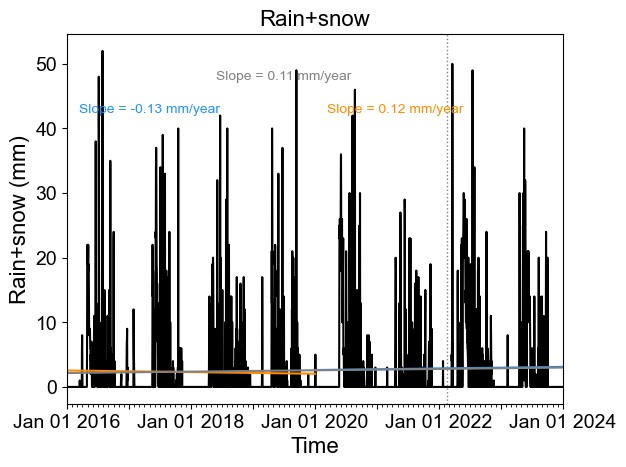

In [228]:
y = jtt_xgeo_precip_snowmelt.iloc[:,0].copy()
start_time = '01-01-2016'
end_time = '01-01-2024'
df = y[y.index.slice_indexer(start_time,end_time)]

fig, ax = plt.subplots()
ax.plot(df, label='2016-2024 (daily)', color='black')

# Time of new station
ax.axvline(x=pd.Timestamp('2022-02-16'), color="gray", linestyle=":", linewidth=1)

# Linear fit befor and after changed station
from scipy.stats import linregress

x = jtt_xgeo_precip_snowmelt.iloc[:,0].copy()
start_time = '01-01-2016'
end_time = '01-01-2020'
df1 = x[x.index.slice_indexer(start_time,end_time)]
# df1 = x.reset_index(drop=True)

y = jtt_xgeo_precip_snowmelt.iloc[:,0].copy()
start_time = '01-01-2020'
end_time = '01-01-2024'
df2 = y[y.index.slice_indexer(start_time,end_time)]
# df2 = y.reset_index(drop=True)

x = np.arange(len(df1))
y = df1.values
res = linregress(x, y)
trend1 = res.slope * x + res.intercept

slope_per_year = res.slope * 365
slope_text = f"Slope = {slope_per_year:.2f} mm/year"

# Add text in top-left corner
plt.text(df1.index[int(len(df1)*0.05)], 
         50*0.85,  # 95% of max for vertical position
         slope_text,
         color='dodgerblue',
         fontsize=10)

x = np.arange(len(df2))
y = df2.values
res = linregress(x, y)
trend2 = res.slope * x + res.intercept

slope_per_year = res.slope * 365
slope_text = f"Slope = {slope_per_year:.2f} mm/year"

# Add text in top-left corner
plt.text(df2.index[int(len(df2)*0.05)], 
         50*0.85,  # 95% of max for vertical position
         slope_text,
         color='darkorange',
         fontsize=10)

ax.plot(df1.index, trend1, label='before 2020', color='darkorange')

ax.plot(df2.index, trend2, label='after 2020', color='dodgerblue')

x = np.arange(len(df))
y = df.values
res = linregress(x, y)
trend3 = res.slope * x + res.intercept

slope_per_year = res.slope * 365
slope_text = f"Slope = {slope_per_year:.2f} mm/year"

# Add text in top-left corner
plt.text(df.index[int(len(df)*0.30)], 
         50*0.95,  # 95% of max for vertical position
         slope_text,
         color='gray',
         fontsize=10)

ax.plot(df.index, trend3, label='All data', color='gray')

plt.title("Rain+snow")
plt.xlabel("Time")
plt.ylabel("Rain+snow (mm)")

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax.xaxis.set_minor_locator(months)
ax.xaxis.set_major_locator(mdates.YearLocator(1, month=1, day=1))  # Major ticks on Jan 1st of every year
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d %Y')) 

# removing tick labels from the xaxis
n = 2  # keeps every n row
[l.set_visible(False) for (i,l) in enumerate(ax.xaxis.get_ticklabels()) if i % n != 0] # Get 'none' from this for some reason

[None, None]

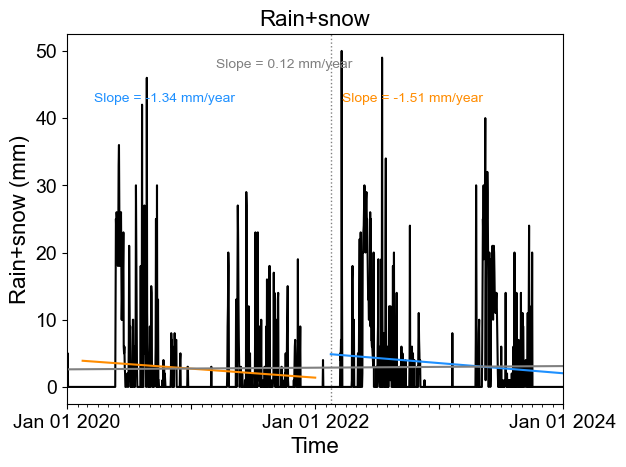

In [226]:
y = jtt_xgeo_precip_snowmelt.iloc[:,0].copy()
start_time = '01-01-2020'
end_time = '01-01-2024'
df = y[y.index.slice_indexer(start_time,end_time)]

fig, ax = plt.subplots()
ax.plot(df, label='2020-2024 (daily)', color='black')

# Time of new station
ax.axvline(x=pd.Timestamp('2022-02-16'), color="gray", linestyle=":", linewidth=1)

# Linear fit befor and after changed station
from scipy.stats import linregress

x = jtt_xgeo_precip_snowmelt.iloc[:,0].copy()
start_time = '02-16-2020'
end_time = '01-01-2022'
df1 = x[x.index.slice_indexer(start_time,end_time)]
# df1 = x.reset_index(drop=True)

y = jtt_xgeo_precip_snowmelt.iloc[:,0].copy()
start_time = '02-16-2022'
end_time = '01-01-2024'
df2 = y[y.index.slice_indexer(start_time,end_time)]
# df2 = y.reset_index(drop=True)

x = np.arange(len(df1))
y = df1.values
res = linregress(x, y)
trend1 = res.slope * x + res.intercept

slope_per_year = res.slope * 365
slope_text = f"Slope = {slope_per_year:.2f} mm/year"

# Add text in top-left corner
plt.text(df1.index[int(len(df1)*0.05)], 
         50*0.85,  # 95% of max for vertical position
         slope_text,
         color='dodgerblue',
         fontsize=10)

x = np.arange(len(df2))
y = df2.values
res = linregress(x, y)
trend2 = res.slope * x + res.intercept

slope_per_year = res.slope * 365
slope_text = f"Slope = {slope_per_year:.2f} mm/year"

# Add text in top-left corner
plt.text(df2.index[int(len(df2)*0.05)], 
         50*0.85,  # 95% of max for vertical position
         slope_text,
         color='darkorange',
         fontsize=10)

ax.plot(df1.index, trend1, label='Old station', color='darkorange')

ax.plot(df2.index, trend2, label='New station', color='dodgerblue')

x = np.arange(len(df))
y = df.values
res = linregress(x, y)
trend3 = res.slope * x + res.intercept

slope_per_year = res.slope * 365
slope_text = f"Slope = {slope_per_year:.2f} mm/year"

# Add text in top-left corner
plt.text(df.index[int(len(df)*0.30)], 
         50*0.95,  # 95% of max for vertical position
         slope_text,
         color='gray',
         fontsize=10)

ax.plot(df.index, trend3, label='All data', color='gray')

plt.title("Rain+snow")
plt.xlabel("Time")
plt.ylabel("Rain+snow (mm)")

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax.xaxis.set_minor_locator(months)
ax.xaxis.set_major_locator(mdates.YearLocator(1, month=1, day=1))  # Major ticks on Jan 1st of every year
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d %Y')) 

# removing tick labels from the xaxis
n = 2  # keeps every n row
[l.set_visible(False) for (i,l) in enumerate(ax.xaxis.get_ticklabels()) if i % n != 0] # Get 'none' from this for some reason

[None, None]

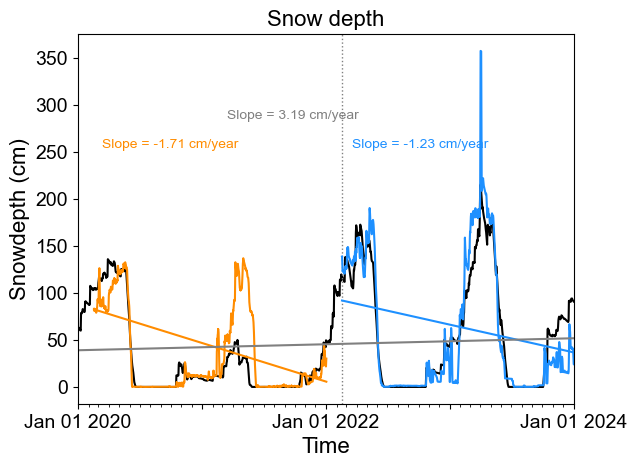

In [188]:

y = jtt_xgeo_snow.iloc[:,0].copy()
start_time = '01-01-2020'
end_time = '01-01-2024'
df = y[y.index.slice_indexer(start_time,end_time)]

fig, ax = plt.subplots()
ax.plot(df, label='2020-2024 (daily)', color='black')

# Time of new station
ax.axvline(x=pd.Timestamp('2022-02-16'), color="gray", linestyle=":", linewidth=1)

# Linear fit befor and after changed station
from scipy.stats import linregress

window_mean = 30 # days

x = jtt_snow.iloc[:,0].copy() # old station
start_time = '02-16-2020'
end_time = '01-01-2022'
x = x.sort_index()
df1 = x.loc[start_time:end_time]
# df1 = x[x.index.slice_indexer(start_time,end_time)]
# df1 = x.reset_index(drop=True)
df1.dropna(inplace=True)
df1.resample('D').mean()
df1 = df1.rolling(window=window_mean).mean().dropna() # rolling mean

y = jtt_snow.iloc[:,1].copy() # new station
start_time = '02-16-2022'
end_time = '01-01-2024'
y = y.sort_index()
df2 = y.loc[start_time:end_time]
# df2 = y[y.index.slice_indexer(start_time,end_time)]
# df2 = y.reset_index(drop=True)
df2.dropna(inplace=True)
df2.resample('D').mean()
df2 = df2.rolling(window=window_mean).mean().dropna() # rolling mean

x = (df1.index - df1.index[0]).total_seconds() / 60*60*24 # days
y = df1.values
res = linregress(x, y)
x_full = (df1.index - df1.index[0]).total_seconds() / 60*60*24 # days
trend1 = res.slope * x_full + res.intercept

slope_per_year = res.slope * 365 * 60*60*24
slope_text = f"Slope = {slope_per_year:.2f} cm/year"

# Add text in top-left corner
plt.text(df1.index[int(len(df1)*0.05)], 
         300*0.85,  # 95% of max for vertical position
         slope_text,
         color='darkorange',
         fontsize=10)

x = (df2.index - df2.index[0]).total_seconds() / 60*60*24 # days
y = df2.values
res = linregress(x, y)
x_full = (df2.index - df2.index[0]).total_seconds() / 60*60*24 # days
trend2 = res.slope * x_full + res.intercept 

slope_per_year = res.slope * 365 * 60*60*24
slope_text = f"Slope = {slope_per_year:.2f} cm/year"

# Add text in top-left corner
plt.text(df2.index[int(len(df2)*0.05)], 
         300*0.85,  # 95% of max for vertical position
         slope_text,
         color='dodgerblue',
         fontsize=10)


ax.plot(df1.index, df1.values, label='Old station', color='darkorange')
ax.plot(df2.index, df2.values, label='New station', color='dodgerblue')

ax.plot(df1.index, trend1, label='Old station', color='darkorange')
ax.plot(df2.index, trend2, label='New station', color='dodgerblue')

x = np.arange(len(df))
y = df.values
res = linregress(x, y)
trend3 = res.slope * x + res.intercept

slope_per_year = res.slope * 365
slope_text = f"Slope = {slope_per_year:.2f} cm/year"

# Add text in top-left corner
plt.text(df.index[int(len(df)*0.30)], 
         300*0.95,  # 95% of max for vertical position
         slope_text,
         color='gray',
         fontsize=10)

ax.plot(df.index, trend3, label='All data', color='gray')

plt.title('Snow depth')
plt.xlabel("Time")
plt.ylabel("Snowdepth (cm)")

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax.xaxis.set_minor_locator(months)
ax.xaxis.set_major_locator(mdates.YearLocator(1, month=1, day=1))  # Major ticks on Jan 1st of every year
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d %Y')) 

# removing tick labels from the xaxis
n = 2  # keeps every n row
[l.set_visible(False) for (i,l) in enumerate(ax.xaxis.get_ticklabels()) if i % n != 0] # Get 'none' from this for some reason

In [178]:
res.slope

0.008742022066276839

<Axes: xlabel='datetime'>

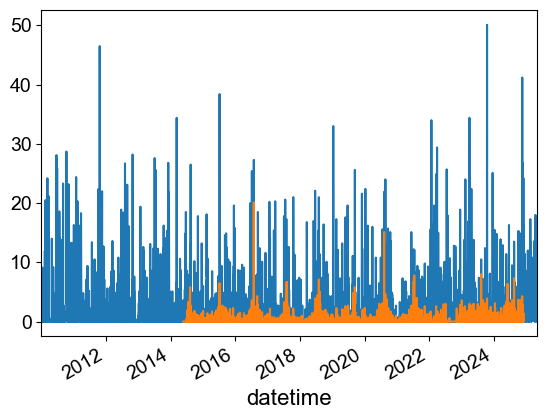

In [7]:
jtt_xgeo_rain.iloc[:,0].plot()
jtt_precip.iloc[:,0].plot()

# Exporting data to R

In [105]:
#### create slice of df  #####
start_time = pd.Timestamp('2015-01-01')
end_time = pd.Timestamp('2018-01-01')

x = JTT2DispUpperZone.iloc[:,0] # 0 = disp, -3 = 12 days, -1 = 60 days
x = x[x.index.slice_indexer(start_time,end_time)]
x = x.resample('1d').median()

y = JTT2WpUpperZone.iloc[:,0]
y = y[y.index.slice_indexer(start_time,end_time)]
y = y.resample('1d').median()

z = jtt_xgeo_temp.iloc[:,0] # daily data intervals
z = z[z.index.slice_indexer(start_time,end_time)]
z = z.resample('1d').median()

f = ST.iloc[:,0] # hourly data intervals
f = f[f.index.slice_indexer(start_time,end_time)]
f = f.resample('1d').median()

df = pd.DataFrame({'Disp':x, 'WP':y, 'Temp': z, 'Rock_temp':f})
df.dropna(inplace=True)

# # Split into train and test
# cutoff_index = int(df.shape[0] * 0.8) # train with xx % data
# df_train = df.iloc[:cutoff_index]
# df_test = df.iloc[cutoff_index:]

df_train = df.copy()
# now scale and transform data so variables are of similar weight
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler() # normalize between 0 and 1, has to be this when dataset is not normally distributed

# differencing n rows to get seasonal and trend removed to obtain statinarity
def diff_shift(df, nrow_shift):
    return df-df.shift(nrow_shift) # Takes nrow forwards in time minus 'current' row and gives difference

def norm(series):
    series = scaler.fit_transform(series.values.reshape(-1, 1)) # transform to normalized values
    # df = scaler.inverse_transform(df) # transform back to original
    return series.reshape(-1) # transform back to correct shape

# Apply decompose (decompose trend, seasonality, and resudials) to make data stationary
from statsmodels.tsa.seasonal import STL

df_list = []
for i,d in enumerate(df_train.columns):
    df = []
    freq = 365

    decomposed_series = STL(df_train.loc[:,d], seasonal=13, period=365).fit()
    trend = decomposed_series.trend
    seasonal = decomposed_series.seasonal
    residual = decomposed_series.resid
    original = df_train.loc[:,d].copy()
    removed_trend = original-trend
    norm_removed_trend = norm(removed_trend) # the normalization does not work for some reason..
    diff_trend = diff_shift(original, 1) # first order differencing # previosly named diff_trend
    diff_seasonal = diff_shift(original, 365) # this is not stationary
    diff_trend_season = diff_shift(diff_seasonal, 1) # correct way according to detrend and deseasonlize: https://online.stat.psu.edu/stat510/lesson/4/4.1
    rolling_diff = original.rolling(3).mean()-original # more than 7 days gives higher std values than diff_trend
    norm_diff = norm(diff_trend) # the normalization does not work for some reason.. # need to normalize to make the relationships 'scaled correctly'
    df = pd.DataFrame({'original':original.values, 'trend': trend.values, 'seasonal':seasonal.values, 'residual':residual.values, 'orig-trend':removed_trend.values,
                       'diff_trend_season':diff_trend_season.values, 'diff':diff_trend.values, 'norm_diff': norm_diff, 'rolling_diff':rolling_diff.values}, index=df_train.index)
    df.dropna(inplace=True)
    
#     #### Comment this part out when finished looking at what series is stationary  ####
#     # correlating?
#     print(f'{d}')
#     # print(df.corr()) # correlations

#     #### testing stationarity ####
#     from statsmodels.tsa.stattools import adfuller
#     for i, variable in enumerate(df.columns):
#         # Perform the ADF test
#         result = adfuller(df[variable])

#         # Extract and print the p-value from the test result
#         p_value = result[1]
#         print("p-value:", p_value)

#         # Interpret the result
#         if p_value <= 0.05: # 0.05 or 0.001
#             print(f"The variable {variable} is stationary.\n")
#         else:
#             print(f"The variable {variable} is not stationary.\n")
# ###############################

    # # choosing just one year
    # df = df[df.index.slice_indexer(pd.Timestamp('2016-01-01'),pd.Timestamp('2017-01-01'))]

    df_list.append(df)
    
col = 'diff' # only use the ones that passes ADF test
df = pd.DataFrame({'Disp':df_list[0].loc[:,col], 'WP':df_list[1].loc[:,col], 'Temp':df_list[2].loc[:,col],'Rock_temp':df_list[3].loc[:,col]}) # only disp original is not stationary so chosen orig-trend, others original
df = pd.DataFrame(scaler.fit_transform(df),columns=['Disp', 'WP', 'Temp','Rock_temp'], index=df.index) # scale transform 0-1
df.dropna(inplace=True)

# new_df = df.rename(columns={df.columns[2]: 'Mod4_Temperature [deg C]:'}) # did not like deg symbol in R

df.to_csv('Jettan_statinary_df.csv', sep=',', index=True, header=True, encoding='utf-8-sig')

# Overview plots

In [186]:
# Statsmodel, linear regression over n hours defined by window_hours
from statsmodels.formula.api import ols
def linearfit(volume, window_days=0.5, results = False, interval=1): # added gps= to get rows that fit gps days velocity. interval = number of days between rows
    volume = volume.to_frame()
    df = volume.copy()
    df = df.reset_index(drop=True) # due to LinearRgression is not able to calculate with dateformat as x-axis
    window_hours = interval*window_days # to set interval between rows to mach number of rows per day
    cutoff_start = df.index.values[0]
    cutoff_end = cutoff_start + window_hours
    reg_res = []
    data_left = True # starts loop

    # Slicing timeseries by window_hours calculating linear regression with slope, intercept and r^2                                                                           
    while data_left:
        if cutoff_end > df.index.values[-1]:
            data_left = False # stops loop
            cutoff_end = df.index.values[-1]
            break   
        start = df.index.values >= cutoff_start
        end = df.index.values <= cutoff_end
        current_data = df[start & end]
        current_data = current_data.squeeze()
        # added part so no need of interpolation, but perhaps for boreholes?
        if max(current_data.isnull().astype(int).groupby(current_data.notnull().astype(int).cumsum()).cumsum()) > window_hours/4: # True if more than consecutive nans
            current_data = current_data.dropna(axis=0) # deletes nan so df is to small to get true in next if statement
        
        if len(current_data) > window_hours-1:
            mod = ols(formula = 'current_data.values ~ current_data.index', data = current_data) # model
            fit = mod.fit() # model fit
            if results is True:
                reg_res += [(cutoff_start+window_hours//2, fit.params.iloc[1], fit.params.iloc[0], fit.rsquared)]  # returns intercept and r^2 in addition to index and slope
            else:
                reg_res += [(cutoff_start+window_hours//2, fit.params.iloc[1])]  # returns index and slope
        cutoff_start += 1
        cutoff_end = cutoff_start + window_hours

    # Merging df and reg_res to obtain correct index and storing output from linear regression and calculating error of fit
    df.index.name = 'index'
    df[volume.index.name] = volume.index
    slopedf = pd.DataFrame(reg_res)
    if results is True:
        slopedf.columns = ['index',f'{window_days}_days_velocity', 'intercept', 'r^2'] # NB velocity is the slope of the fit
        slopedf['y_fit'] = slopedf[f'{window_days}_days_velocity']*slopedf.index+slopedf['intercept']
        df_merged = pd.merge_asof(df,slopedf, on=df.index.name, tolerance=0)
        df_merged.set_index(volume.index.name,inplace=True, drop=True)
        df_merged['residuals'] = (df_merged.iloc[:,[1]].values-df_merged.iloc[:,[5]].values) # y-y_hat = resuduals
        df_merged['error_of_fit'] = ((np.mean(df_merged['residuals']**2))**(1/2))
        df_merged.drop(df_merged.columns[[0,1]], axis=1, inplace=True)
#         return df_merged.dropna() # this might be a problem in the future.. But I will comment it and get data with nans
        return df_merged
    else:
        slopedf.columns = ['index',f'{window_days}_days_velocity']
        df_merged = pd.merge_asof(df,slopedf, on=df.index.name, tolerance=0)
        df_merged.set_index(volume.index.name,inplace=True, drop=True)
        df_merged.drop(df_merged.columns[[0,1]], axis=1, inplace=True)
#         return df_merged.dropna() # this might be a problem in the future.. But I will comment it and get data with nans
        return df_merged

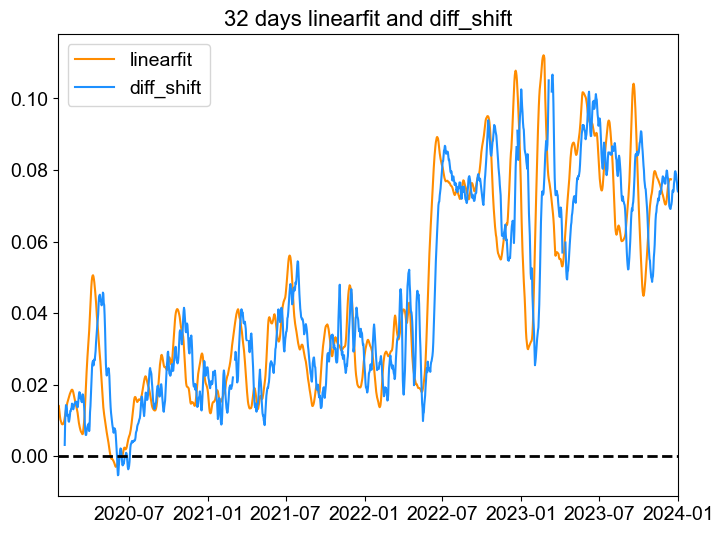

In [232]:
# To check if linearfit is better suited than diff_shift for dataanalysis

# Pascal agreed that diff_shift is nice and as good as the linearfit

# length
start_time = '2020-01-01'
end_time = '2024-01-01'

# Data
file = JTT1Disp.iloc[:,0].copy()
# # file = JTT2DispUpperZone.iloc[:,0].copy()
# file = JTT2WpUpperZone.iloc[:,0].copy()
# file = JTT3Disp.iloc[:,0].copy()

file =  file[file.index.slice_indexer(start_time,end_time)]
file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
file = file.resample('1d').mean() # hourly data so sum to daily

# Cleaning and calulating velocity
num_days_clean = 32


file1 = diff_shift(file,num_days_clean)

col_name='Disp_summed [mm]:'
file2 = linearfit(file[f'{col_name}'], window_days=num_days_clean, interval=1)

fig, ax = plt.subplots(figsize=(8, 6))
ax.set_title(f'{num_days_clean} days linearfit and diff_shift')
ax.plot(file2.index, file2, label='linearfit', color='darkorange')
ax.plot(file1.index, file1, label='diff_shift', color='dodgerblue')
ax.axhline(y=0, color='k', linestyle='--', linewidth=2)
ax.legend()

In [111]:
jtt_precip.head()

,precip,year,month,day
datetime,,,,
2014-05-22 11:00:00,0.0,2014,5,22
2014-05-22 12:00:00,0.0,2014,5,22
2014-05-22 13:00:00,0.0,2014,5,22
2014-05-22 14:00:00,0.0,2014,5,22
2014-05-22 15:00:00,0.0,2014,5,22


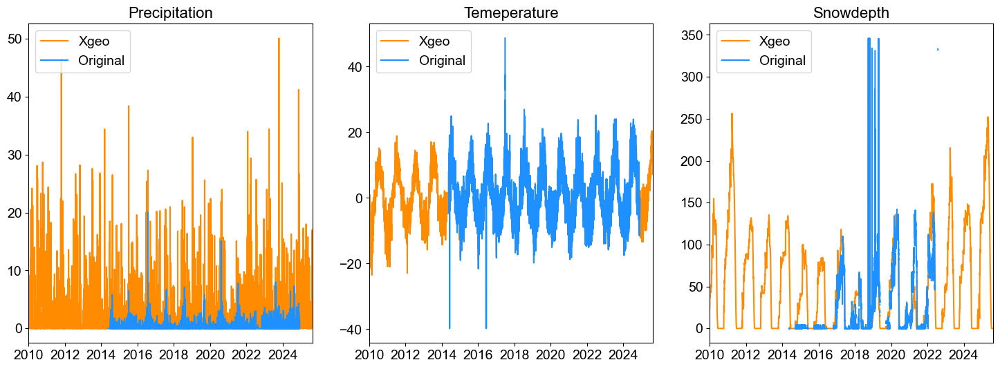

In [122]:
# MET TEST
fig, ax = plt.subplots(1,3,figsize=(18, 6))
ax[0].set_title('Precipitation')
ax[0].plot(jtt_xgeo_rain.index, jtt_xgeo_rain.iloc[:,0], label='Xgeo', color='darkorange')
ax[0].plot(jtt_precip.index, jtt_precip.iloc[:,0], label='Original', color='dodgerblue')
ax[0].legend(loc='upper left')

ax[1].set_title('Temeperature')
ax[1].plot(jtt_xgeo_temp.index, jtt_xgeo_temp.iloc[:,0], label='Xgeo', color='darkorange')
ax[1].plot(jtt_temp.index, jtt_temp.iloc[:,0], label='Original', color='dodgerblue')
ax[1].legend(loc='upper left')

ax[2].set_title('Snowdepth')
ax[2].plot(jtt_xgeo_snow.index, jtt_xgeo_snow.iloc[:,0], label='Xgeo', color='darkorange')
ax[2].plot(jtt_snow.index, jtt_snow.iloc[:,0], label='Original', color='dodgerblue')
ax[2].legend(loc='upper left')

max variation: 4.939999999999998


<Axes: xlabel='Date:'>

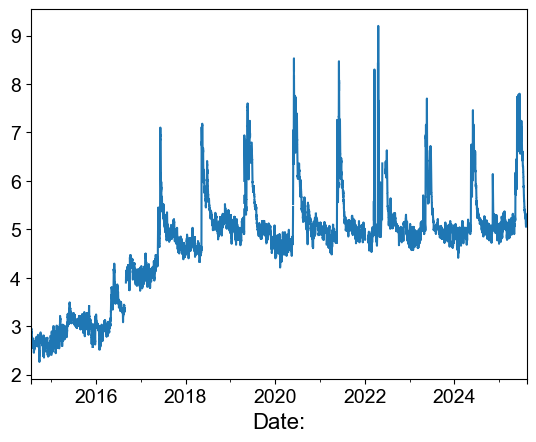

In [42]:
# checking WP depth
file = JTT3Wp.copy()
# file = JTT2WpUpperZone.copy()
print('max variation:', file.iloc[:,0].max()-file.iloc[:,0].min()-2)
file.iloc[:,0].plot()

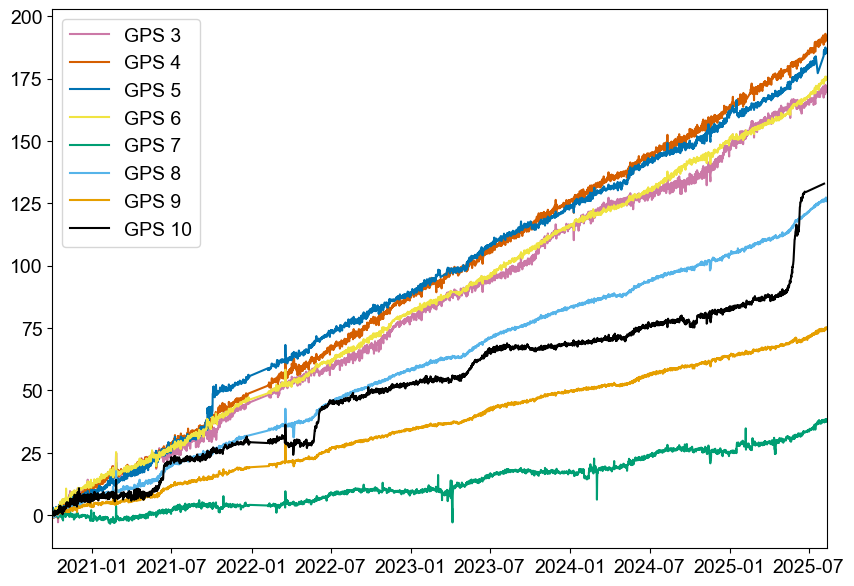

In [10]:
# GNSS VS Boreholes
fig, ax = plt.subplots(figsize=(10, 7))
# fig.subplots_adjust(hspace = .2, wspace=.6)

# entire time
start_time = '2019-01-01'
end_time = '2026-01-01'

# # zoomed periods
# start_time = '2020-01-01'
# end_time = '2024-01-01'



data = '2d'
df =  gam_gps3
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax.plot(df.index, (df[data]-df[data][idx]), color=colors[0], label='GPS 3')

df =  gam_gps4
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax.plot(df.index, (df[data]-df[data][idx]), color=colors[1], label='GPS 4')

df =  gam_gps5
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax.plot(df.index, (df[data]-df[data][idx]), color=colors[2], label='GPS 5')

df =  gam_gps6
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax.plot(df.index, (df[data]-df[data][idx]), color=colors[3], label='GPS 6')

df =  gam_gps7
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax.plot(df.index, (df[data]-df[data][idx]), color=colors[4], label='GPS 7')

df =  gam_gps8
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax.plot(df.index, (df[data]-df[data][idx]), color=colors[5], label='GPS 8')

df =  gam_gps9
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax.plot(df.index, (df[data]-df[data][idx]), color=colors[6], label='GPS 9')

df =  gam_gps10
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax.plot(df.index, (df[data]-df[data][idx]), color=colors[7], label='GPS 10')

ax.legend(loc='upper left')

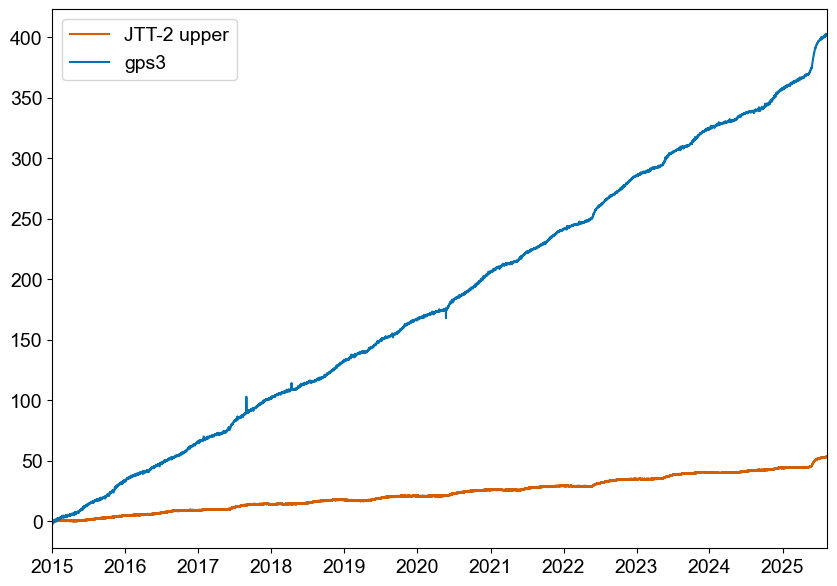

In [518]:
# GNSS VS Boreholes
fig, ax = plt.subplots(figsize=(10, 7))
# fig.subplots_adjust(hspace = .2, wspace=.6)

# entire time
start_time = '2015-01-01'
end_time = '2025-08-12'

# # zoomed periods
# start_time = '2021-01-01'
# end_time = '2022-01-01'
# end_time = '2025-08-12'

# ## Boreholes VS GNSS
# col_name = 'Disp_summed [mm]:'
# file = JTT1Disp.copy()
# file = file[file.index.slice_indexer(start_time,end_time)]
# file = file[col_name]
# file = file-file[file.first_valid_index()]
# ax.plot(file.index, file.values, colors[1], label='JTT-1')

col_name = 'Disp_summed [mm]:'
file = JTT2DispUpperZone.copy()
file = file[file.index.slice_indexer(start_time,end_time)]
file = file[col_name]
file = file-file[file.first_valid_index()]
ax.plot(file.index, file.values, colors[1], label='JTT-2 upper')

# col_name = 'Disp_summed [mm]:'
# file = JTT3Disp.copy()
# file = file[file.index.slice_indexer(start_time,end_time)]
# file = file[col_name]
# file = file-file[file.first_valid_index()]
# ax.plot(file.index, file.values, colors[1], label='JTT-3')

# col_name = '2d'
# file = jett_gps4.copy()
# file = file[file.index.slice_indexer(start_time,end_time)]
# file = file[col_name]
# file = file-file[file.first_valid_index()]
# ax.plot(file.index, file.values, colors[2], label='GPS-4')
# ###

# # Gam GPS-3 vs Jett GPS-4
# col_name = '2d'
# file = gam_gps3.copy()
# file = file[file.index.slice_indexer(start_time,end_time)]
# file = file[col_name]
# file = file-file[file.first_valid_index()]
# ax.plot(file.index, file.values, colors[2], label='Gamanjunni GPS-3')

col_name = '2d'

# file = jett_gps4.copy()
# file = file[file.index.slice_indexer(start_time,end_time)]
# file = file[col_name]
# file = file-file[file.first_valid_index()]
# ax.plot(file.index, file.values, colors[4], label='Jettan GPS-4')
####

# file = jett_gps5.copy()
# file = file[file.index.slice_indexer(start_time,end_time)]
# file = file[col_name]
# file = file-file[file.first_valid_index()]
# ax.plot(file.index, file.values, colors[1], label='gps5')

file = jett_gps3.copy() # BH-2
file = file[file.index.slice_indexer(start_time,end_time)]
file = file[col_name]
file = file-file[file.first_valid_index()]
ax.plot(file.index, file.values, colors[2], label='gps3')

# file = jett_gps2.copy()
# file = file[file.index.slice_indexer(start_time,end_time)]
# file = file[col_name]
# file = file-file[file.first_valid_index()]
# ax.plot(file.index, file.values, colors[3], label='gps2')

# file = jett_gps8.copy() # BH-3
# file = file[file.index.slice_indexer(start_time,end_time)]
# file = file[col_name]
# file = file-file[file.first_valid_index()]
# ax.plot(file.index, file.values, colors[4], label='gps8')

# file = jett_gps6.copy()
# file = file[file.index.slice_indexer(start_time,end_time)]
# file = file[col_name]
# file = file-file[file.first_valid_index()]
# ax.plot(file.index, file.values, colors[5], label='gps6')


ax.legend(loc='upper left')

In [25]:
# checking total disp vs boreholes
start_time = pd.Timestamp('2021-01-01')
end_time = pd.Timestamp('2024-01-01')

end_time = pd.Timestamp('2024-11-27')

# x = jett_gps4.copy() #JTT1
# x = x[x.index.slice_indexer(start_time,end_time)]
# print('gps4: ', x.iloc[-1]['2d']-x.iloc[0]['2d']) 
# x = jett_gps5.copy() #JTT1
# x = x[x.index.slice_indexer(start_time,end_time)]
# print('gps5: ', x.iloc[-1]['2d']-x.iloc[0]['2d']) 
# x = jett_gps3.copy() #JTT2
# x = x[x.index.slice_indexer(start_time,end_time)]
# print('gps3: ', x.iloc[-1]['2d']-x.iloc[0]['2d']) 
# x = jett_gps2.copy() #JTT2
# x = x[x.index.slice_indexer(start_time,end_time)]
# print('gps2: ', x.iloc[-1]['2d']-x.iloc[0]['2d']) 
# x = jett_gps8.copy() #JTT3
# x = x[x.index.slice_indexer(start_time,end_time)]
# print('gps8: ', x.iloc[-1]['2d']-x.iloc[0]['2d'])
# x = jett_gps6.copy() #JTT3
# x = x[x.index.slice_indexer(start_time,end_time)]
# print('gps6: ', x.iloc[-1]['2d']-x.iloc[0]['2d']) 

col_name = '2d'

# Jettan
x = jett_gps4.copy() #JTT1
x = x[x.index.slice_indexer(start_time,end_time)]
x = x[col_name]
print('gps4: ', x[x.last_valid_index()]-x[x.first_valid_index()]) 
# x = jett_gps5.copy() #JTT1
# x = x[x.index.slice_indexer(start_time,end_time)]
# x = x[col_name]
# print('gps5: ', x[x.last_valid_index()]-x[x.first_valid_index()]) 
# x = jett_gps3.copy() #JTT2
# x = x[x.index.slice_indexer(start_time,end_time)]
# x = x[col_name]
# print('gps3: ', x[x.last_valid_index()]-x[x.first_valid_index()]) 
# x = jett_gps2.copy() #JTT2
# x = x[x.index.slice_indexer(start_time,end_time)]
# x = x[col_name]
# print('gps2: ', x[x.last_valid_index()]-x[x.first_valid_index()])
# x = jett_gps8.copy() #JTT3
# x = x[x.index.slice_indexer(start_time,end_time)]
# x = x[col_name]
# print('gps8: ', x[x.last_valid_index()]-x[x.first_valid_index()]) 
# x = jett_gps6.copy() #JTT3
# x = x[x.index.slice_indexer(start_time,end_time)]
# x = x[col_name]
# print('gps6: ', x[x.last_valid_index()]-x[x.first_valid_index()]) 

# Gamanjunni
x = gam_gps3.copy() 
x = x[x.index.slice_indexer(start_time,end_time)]
x = x[col_name]
print('gps3: ', x[x.last_valid_index()]-x[x.first_valid_index()]) 
# x = gam_gps6.copy() 
# x = x[x.index.slice_indexer(start_time,end_time)]
# x = x[col_name]
# print('gps6: ', x[x.last_valid_index()]-x[x.first_valid_index()]) 
# x = gam_gps8.copy() 
# x = x[x.index.slice_indexer(start_time,end_time)]
# x = x[col_name]
# print('gps8: ', x[x.last_valid_index()]-x[x.first_valid_index()]) 

gps4:  42.782341156389094
gps3:  129.94518883191282


In [29]:
130/43

3.0232558139534884

In [367]:
x =76.59590672262783
years = 3
x/years # 4.9 mm/yr JTT1, 5.2 mm/yr JTT3, 4.4 mm/yr JTT2 lower # 2018 to 2020 01.01.

# 11.1/yr = 2018 to 2024 gps4 and gps8. 10.4 from 18 to 20, and 11.9 and 12.6 in 2020 to 2022, 11.1 and 10.5 2022 to 2024.

# gps3 6, and 8: 34.8, 34.5, 25.5 from 2021-24, quite similar all years especially for gps8. a bit change for gps3 +/-4 mm

# (5.33+5.29)/2
# (4.9+5.2+4.4)/3

25.53196890754261

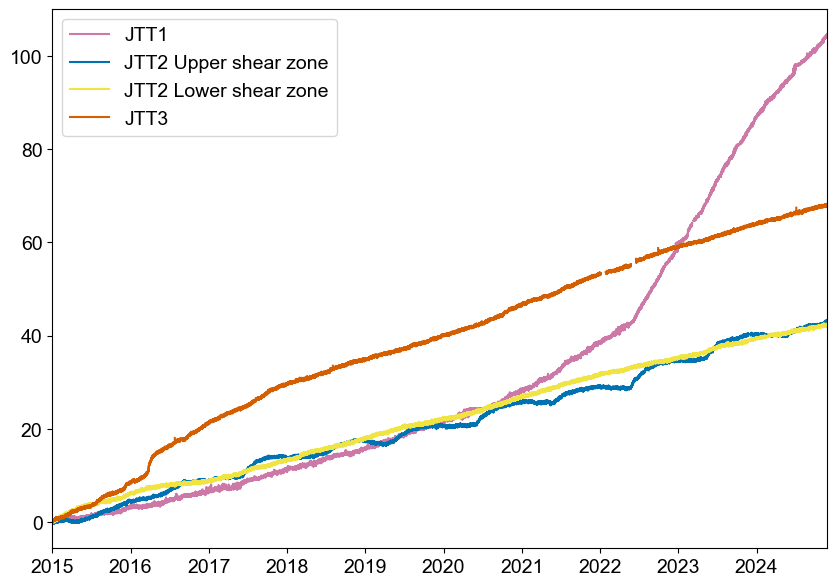

In [12]:
# GNSS VS Boreholes
fig, ax = plt.subplots(figsize=(10, 7))
# fig.subplots_adjust(hspace = .2, wspace=.6)

# entire time
start_time = '2015-01-01'
end_time = '2024-11-27'

# # zoomed periods
# start_time = '2018-01-01'
# end_time = '2022-01-01'

col_name = 'Disp_summed [mm]:'
file = JTT1Disp.copy()
file = file[file.index.slice_indexer(start_time,end_time)]
file = file[col_name]
file = file-file[file.first_valid_index()]
ax.plot(file.index, file.values, colors[0], label='JTT1')

file = JTT2DispUpperZone.copy()
file = file[file.index.slice_indexer(start_time,end_time)]
file = file[col_name]
file = file-file[file.first_valid_index()]
ax.plot(file.index, file.values, colors[2], label='JTT2 Upper shear zone')

file = JTT2DispLowerZone.copy()
file = file[file.index.slice_indexer(start_time,end_time)]
file = file[col_name]
file = file-file[file.first_valid_index()]
ax.plot(file.index, file.values, colors[3], label='JTT2 Lower shear zone')

file = JTT3Disp.copy()
file = file[file.index.slice_indexer(start_time,end_time)]
file = file[col_name]
file = file-file[file.first_valid_index()]
ax.plot(file.index, file.values, colors[1], label='JTT3')

ax.legend(loc='upper left')

In [250]:
file = JTT2DispUpperZone.copy()
file = file[file.index.slice_indexer(start_time,end_time)]
file = file[col_name]
file = file-file[file.first_valid_index()]
file.max()

3.814933188737065

In [389]:
# Similar rate in 2018 to 2020?

# checking total disp vs boreholes
# start_time = pd.Timestamp('2021-01-01')
# end_time = pd.Timestamp('2023-01-01')

start_time = '2024-01-01'
end_time = '2025-01-01'

col_name = 'Disp_summed [mm]:'

x = JTT1Disp.copy()
x = x[x.index.slice_indexer(start_time,end_time)]
x = x[col_name]
print('JTT1: ', x[x.last_valid_index()]-x[x.first_valid_index()]) 
x = JTT2DispUpperZone.copy() 
x = x[x.index.slice_indexer(start_time,end_time)]
x = x[col_name]
print('JTT2 upper: ', x[x.last_valid_index()]-x[x.first_valid_index()]) 
x = JTT2DispLowerZone.copy()
x = x[x.index.slice_indexer(start_time,end_time)]
x = x[col_name]
print('JTT2 lower: ', x[x.last_valid_index()]-x[x.first_valid_index()]) 
x = JTT3Disp.copy()
x = x[x.index.slice_indexer(start_time,end_time)]
x = x[col_name]
print('JTT3: ', x[x.last_valid_index()]-x[x.first_valid_index()]) 

JTT1:  20.337672878738474
JTT2 upper:  3.7132564748048438
JTT2 lower:  3.379671182113931
JTT3:  4.740917758985319


In [395]:
x = 25.8
years = 6
x/years # 4.9 mm/yr JTT1, 5.2 mm/yr JTT3, 4.4 mm/yr JTT2 lower # 2018 to 2020 01.01.

# (5.33+5.29)/2
# (4.9+5.2+4.4)/3

(4.5+ 4.3+ 4.7+ 4.7+ 3.3+ 4.1)/6

# BH-2 lower 4.3 overal 2018 4.5 2019 4.3 2020 4.7 2021 4.7, 2022 3.3 2023 4.1 2024 3.8

4.266666666666667

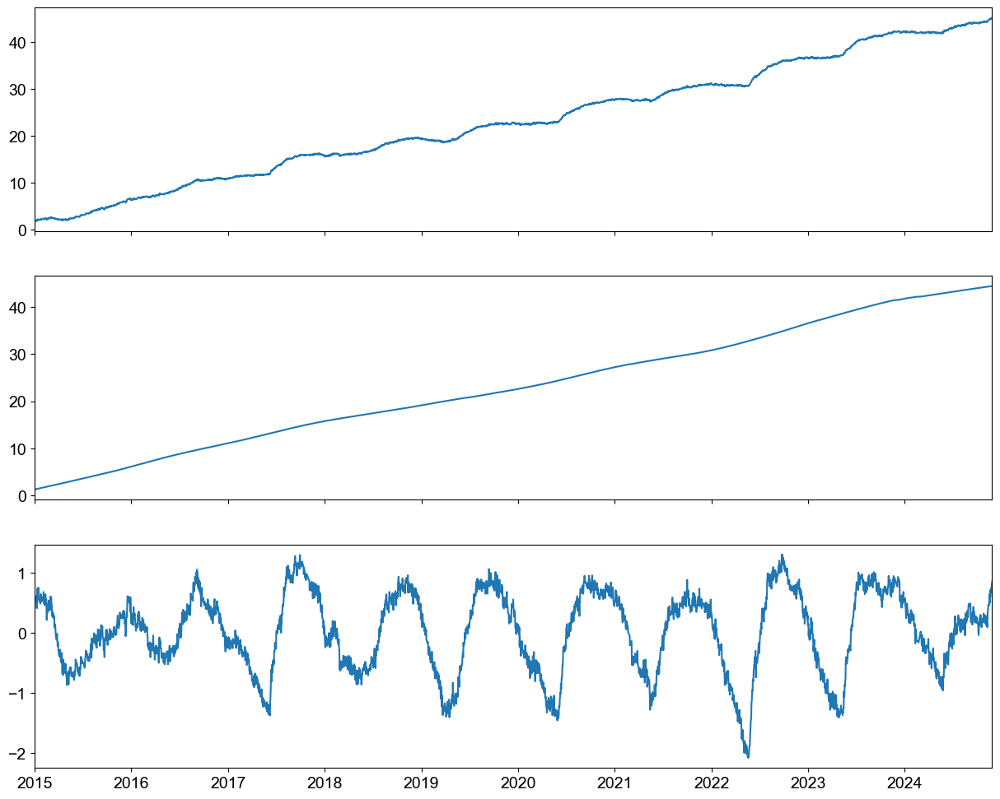

In [222]:
from statsmodels.tsa.seasonal import STL

df = JTT2DispUpperZone.copy()

start_time = '2015-01-01'
end_time = '2024-11-27'

df = df[df.index.slice_indexer(start_time,end_time)]
df = df.resample('1D').median()
df = df.dropna() # need to remove all nans
original = df.iloc[:,0]
decomposed_series = STL(original, seasonal=13, period=365).fit() # for daily should be 13 and 365
trend = decomposed_series.trend
seasonal = decomposed_series.seasonal
residual = decomposed_series.resid
df = pd.DataFrame({'original':original.values, 'trend': trend.values, 'seasonal':seasonal.values, 'residual':residual.values}, index=df.index) 

subtracted_trend = df.original-df.trend

fig, ax = plt.subplots(3, 1,figsize=(15, 12), sharex=True)
ax[0].plot(df.original)
ax[1].plot(df.trend)
ax[2].plot(subtracted_trend)
# ax[2].plot(df.residual)

In [228]:
subtracted_trend.max()+abs(subtracted_trend.min())

3.3775333652400477

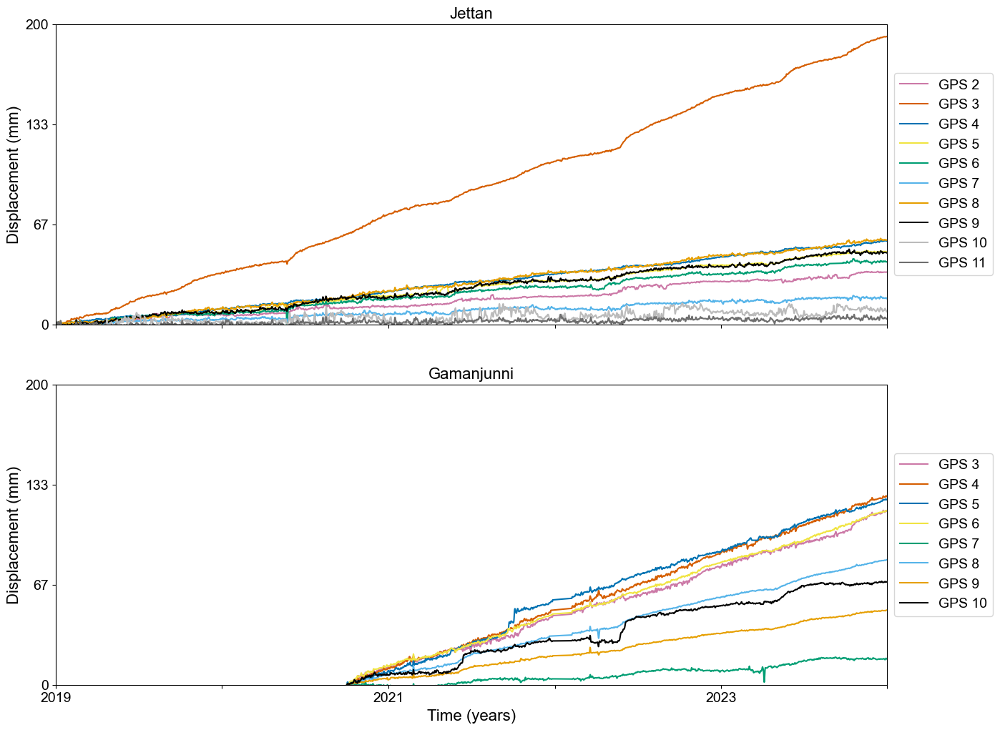

In [8]:
## TO LOOK AT GNSS VELOCITY og Jettan vs Gamanjunni to see seasonal trends

from matplotlib.dates import DateFormatter

# manually picked start and end times for following data

# plotting

ncols = 1
nrows = 2 # len(file['event'].unique()) // ncols + (len(file['event'].unique()) % ncols > 0)

fig, ax = plt.subplots(nrows, ncols,figsize=(15, 12), sharex=True)
# fig.subplots_adjust(hspace = .2, wspace=.6)

start_time = '2019-01-01'
end_time = '2024-01-01'

data = '2d'

#JETTAN
df =  jett_gps2
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(df.index, (df[data]-df[data][idx]), color=colors[0], label='GPS 2')

df =  jett_gps3
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(df.index, (df[data]-df[data][idx]), color=colors[1], label='GPS 3')

df =  jett_gps4
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(df.index, (df[data]-df[data][idx]), color=colors[2], label='GPS 4')

df =  jett_gps5
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(df.index, (df[data]-df[data][idx]), color=colors[3], label='GPS 5')

df =  jett_gps6
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(df.index,(df[data]-df[data][idx]), color=colors[4], label='GPS 6')

df =  jett_gps7
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(df.index, (df[data]-df[data][idx]), color=colors[5], label='GPS 7')

df =  jett_gps8
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(df.index, (df[data]-df[data][idx]), color=colors[6], label='GPS 8')

df =  jett_gps9
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(df.index, (df[data]-df[data][idx]), color=colors[7], label='GPS 9')

df =  jett_gps10
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(df.index,(df[data]-df[data][idx]), color=colors[8], label='GPS 10')

df =  jett_gps11
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(df.index, (df[data]-df[data][idx]), color=colors[9], label='GPS 11')

# GAMANJUNNI
df =  gam_gps3
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(df.index, (df[data]-df[data][idx]), color=colors[0], label='GPS 3')

df =  gam_gps4
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(df.index, (df[data]-df[data][idx]), color=colors[1], label='GPS 4')

df =  gam_gps5
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(df.index, (df[data]-df[data][idx]), color=colors[2], label='GPS 5')

df =  gam_gps6
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(df.index, (df[data]-df[data][idx]), color=colors[3], label='GPS 6')

df =  gam_gps7
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(df.index, (df[data]-df[data][idx]), color=colors[4], label='GPS 7')

df =  gam_gps8
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(df.index, (df[data]-df[data][idx]), color=colors[5], label='GPS 8')

df =  gam_gps9
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(df.index, (df[data]-df[data][idx]), color=colors[6], label='GPS 9')

df =  gam_gps10
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(df.index, (df[data]-df[data][idx]), color=colors[7], label='GPS 10')

nticks = 4
ax[0].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[0].yaxis.set_major_formatter(FormatStrFormatter('%.f'))
ax[1].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[1].yaxis.set_major_formatter(FormatStrFormatter('%.f'))

ymin, ymax = ax[0].get_ylim()
ax[0].set_ylim(0, 200)

ymin, ymax = ax[1].get_ylim()
ax[1].set_ylim(0, 200)

# title
ax[0].set_title('Jettan')
ax[1].set_title('Gamanjunni')

# legend
ax[0].legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax[1].legend(loc='center left', bbox_to_anchor=(1, 0.5))

# set axis labels
ax[0].set_ylabel('Displacement (mm)')
ax[1].set_ylabel('Displacement (mm)')
ax[1].set_xlabel('Time (years)')
n = 2  # Keeps every 2th label
for i in range(nrows):
    ax[i].xaxis.set_major_locator(mdates.YearLocator(1)) # tick every year
    [l.set_visible(False) for (i,l) in enumerate(ax[i].xaxis.get_ticklabels()) if i % n != 0] # lable every other year

# # # saving
path = 'plots\\'
save_name = f'{path}GNSS_Displacement_Longterm_JETT_GAM'
fig.savefig(save_name, dpi=300, bbox_inches='tight')

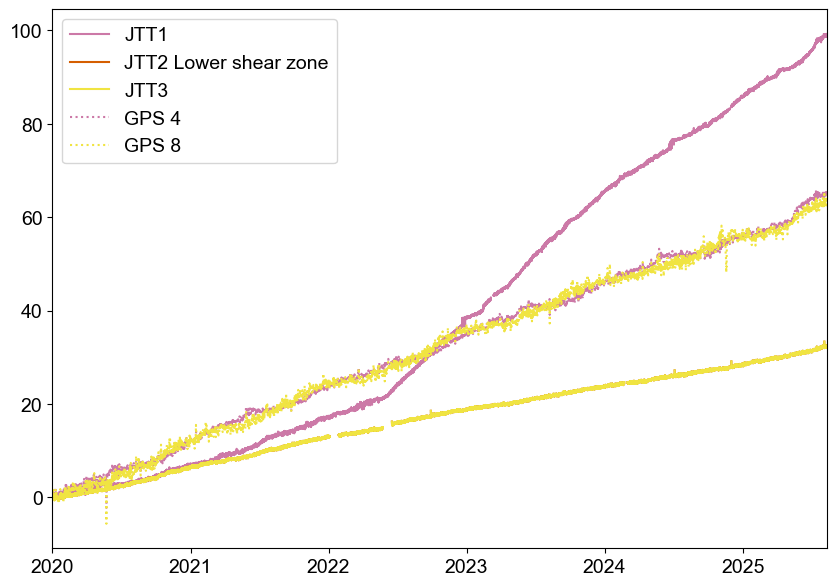

In [88]:
# GNSS VS Boreholes

fig, ax = plt.subplots(figsize=(10, 7))
# fig.subplots_adjust(hspace = .2, wspace=.6)

start_time = '2020-01-01'
end_time = '2026-01-01'

col_name = 'Disp_summed [mm]:'
file = JTT1Disp.copy()
file = file[file.index.slice_indexer(start_time,end_time)]
file = file[col_name]
file = file-file[file.first_valid_index()]
ax.plot(file.index, file.values, colors[0], label='JTT1')

file = JTT3Disp.copy()
file = file[file.index.slice_indexer(start_time,end_time)]
file = file[col_name]
file = file-file[file.first_valid_index()]
ax.plot(file.index, file.values, colors[1], label='JTT2 Lower shear zone')

# file = JTT2DispUpperZone.copy()
# file = file[file.index.slice_indexer(start_time,end_time)]
# file = file[col_name]
# file = file-file[file.first_valid_index()]
# ax.plot(file.index, file.values, colors[2], label='JTT2 Upper shear zone')

file = JTT3Disp.copy()
file = file[file.index.slice_indexer(start_time,end_time)]
file = file[col_name]
file = file-file[file.first_valid_index()]
ax.plot(file.index, file.values, colors[3], label='JTT3')

ax2 = ax #.twinx()
data = '2d'
# df =  jett_gps3.copy()
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df[data]
# df = df-df[df.first_valid_index()]
# df = df.replace(np.nan,np.inf) # changing nan to inf
# ax2.plot(df.index, df.values, color=colors[1], label='GPS 3', linestyle=':')

df =  jett_gps4.copy()
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df[data]
df = df-df[df.first_valid_index()]
df = df.replace(np.nan,np.inf) # changing nan to inf
ax2.plot(df.index, df.values, color=colors[0], label='GPS 4', linestyle=':')

df =  jett_gps8.copy()
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df[data]
df = df-df[df.first_valid_index()]
df = df.replace(np.nan,np.inf) # changing nan to inf
ax2.plot(df.index, df.values, color=colors[3], label='GPS 8', linestyle=':')

# handles1, labels1 = ax.get_legend_handles_labels()
# handles2, labels2 = ax2.get_legend_handles_labels()
# handles = handles1 + handles2
# labels = labels1 + labels2
# ax.legend(handles, labels, loc='upper left')

ax.legend(loc='upper left')

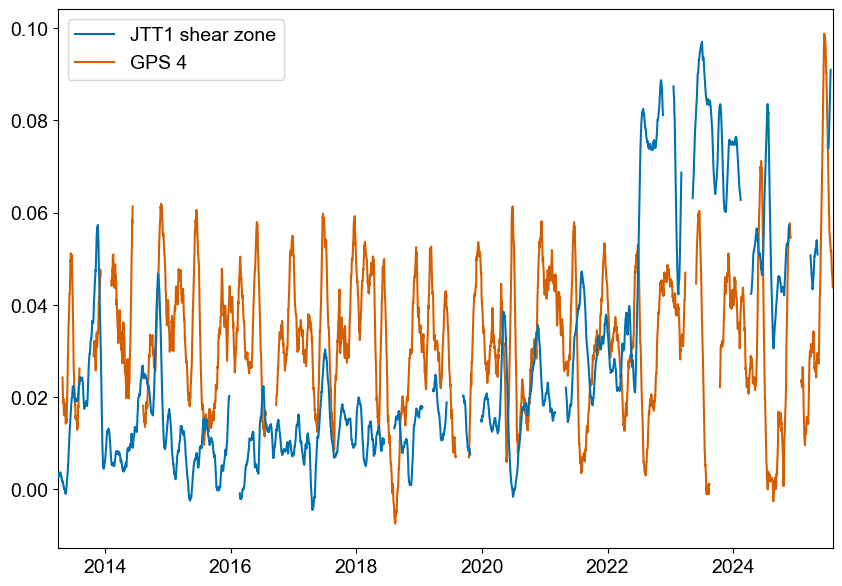

In [112]:
fig, ax = plt.subplots(figsize=(10, 7))
# fig.subplots_adjust(hspace = .2, wspace=.6)

start_time = '2013-01-01'
end_time = '2026-01-01'

vel_interval = 30
window_mean = 30

col_name = 'Disp_summed [mm]:'
file = JTT1Disp.copy()
file = file[file.index.slice_indexer(start_time,end_time)]
file = file[col_name]
file = file-file[file.first_valid_index()]
file = file.resample('1D').median() # get same base interval to clean data on
file = diff_shift(file, vel_interval) # velocity
file = file.rolling(window=window_mean).mean()
ax.plot(file.index, file.values, colors[2], label='JTT1 shear zone', zorder=3)

ax2 = ax #.twinx()
data = '2d'
df =  jett_gps4.copy()
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df[data]
df = df-df[df.first_valid_index()]
df = df.resample('1D').median() # get same base interval to clean data on
df = diff_shift(df, vel_interval) # velocity
df = df.rolling(window=window_mean).mean()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax2.plot(df.index, df.values, color=colors[1], label='GPS 4', zorder=1)
ax.legend(loc='upper left')

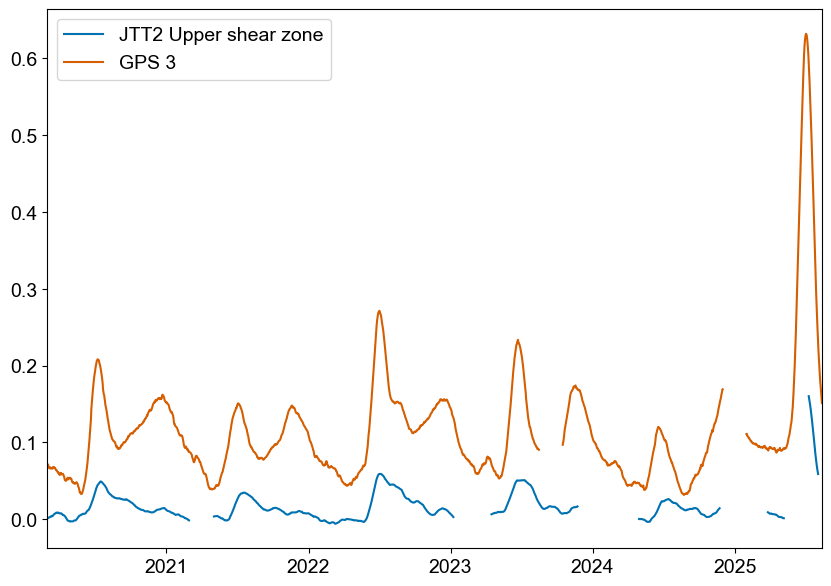

In [114]:
fig, ax = plt.subplots(figsize=(10, 7))
# fig.subplots_adjust(hspace = .2, wspace=.6)

start_time = '2020-01-01'
end_time = '2026-01-01'

vel_interval = 30

col_name = 'Disp_summed [mm]:'
file = JTT2DispUpperZone.copy()
file = file[file.index.slice_indexer(start_time,end_time)]
file = file[col_name]
file = file-file[file.first_valid_index()]
file = file.resample('1D').median() # get same base interval to clean data on
file = diff_shift(file, vel_interval) # velocity
file = file.rolling(window=window_mean).mean()
ax.plot(file.index, file.values, colors[2], label='JTT2 Upper shear zone')

ax2 = ax #.twinx()
data = '2d'
df =  jett_gps3.copy()
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df[data]
df = df-df[df.first_valid_index()]
df = df.resample('1D').median() # get same base interval to clean data on
df = diff_shift(df, vel_interval) # velocity
df = df.rolling(window=window_mean).mean()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax2.plot(df.index, df.values, color=colors[1], label='GPS 3')
ax.legend(loc='upper left')

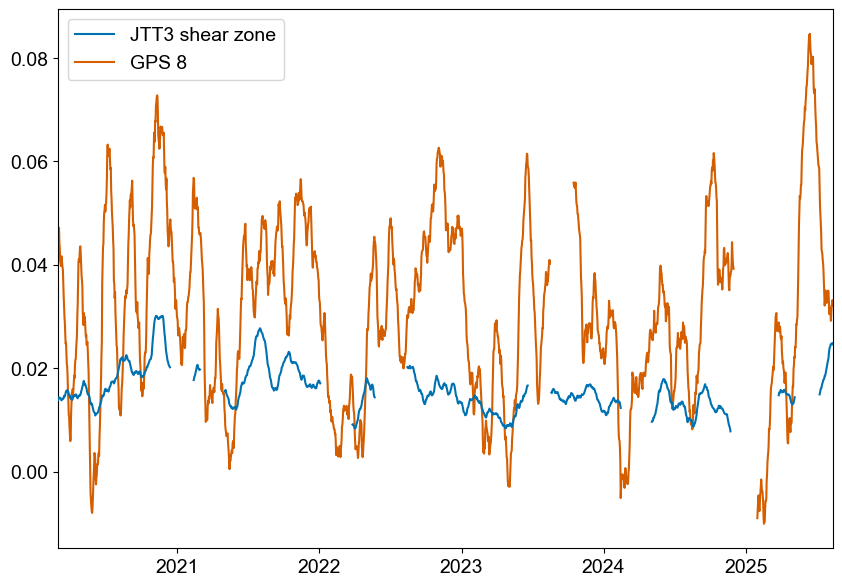

In [116]:
fig, ax = plt.subplots(figsize=(10, 7))
# fig.subplots_adjust(hspace = .2, wspace=.6)

start_time = '2020-01-01'
end_time = '2026-01-01'

vel_interval = 30

col_name = 'Disp_summed [mm]:'
file = JTT3Disp.copy()
file = file[file.index.slice_indexer(start_time,end_time)]
file = file[col_name]
file = file-file[file.first_valid_index()]
file = file.resample('1D').median() # get same base interval to clean data on
file = diff_shift(file, vel_interval) # velocity
file = file.rolling(window=window_mean).mean()
ax.plot(file.index, file.values, colors[2], label='JTT3 shear zone', zorder=3)

ax2 = ax #.twinx()
data = '2d'
df =  jett_gps8.copy()
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df[data]
df = df-df[df.first_valid_index()]
df = df.resample('1D').median() # get same base interval to clean data on
df = diff_shift(df, vel_interval) # velocity
df = df.rolling(window=window_mean).mean()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax2.plot(df.index, df.values, color=colors[1], label='GPS 8', zorder=1)
ax.legend(loc='upper left')

In [400]:
# differencing n rows to get seasonal and trend removed to obtain statinarity
from scipy.signal import savgol_filter

def diff_shift(df, nrow_shift):
    return df-df.shift(nrow_shift) # Takes nrow forwards in time minus 'current' row and gives difference

def norm(series):
    series = scaler.fit_transform(series.values.reshape(-1, 1)) # transform to normalized values
    # df = scaler.inverse_transform(df) # transform back to original
    return series.reshape(-1) # transform back to correct shape

from scipy.signal import butter,filtfilt
def butter_lowpass_filter(data, cutoff, fs, order):
    data = data.values # values to filter
    nyq = 0.5 * fs # Nyquist Frequency, assumes regular time intervals
    normal_cutoff = cutoff / nyq
    # Get the filter coefficients 
    b, a = butter(order, normal_cutoff, btype='low')
    y = filtfilt(b, a, data)
    return y
    
def clean_filt(file, col=0): # colnmbr is the column chosen to lowpass filter
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    file['interpolated'] = file.iloc[:,col].interpolate(method='linear', limit_direction ='forward')
    # file['butterfilt'] = butter_lowpass_filter(file.iloc[:,-1], cutoff, fs, order) # replace original by lowpass filtered
    file['savgol'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    return file


# values for the low pass filter
n = 3 # number of days cut off
fs = 1 # sample rate in hours 
cutoff = 1/(24*n) # 1/24 means cutoff at 1 day, but times nyquist frequncey so twice
order = 2 # line from 1 to 0, second order is perfect function

# median filter window
window_median = 15 # 7 might be okay and 29 is smooth, tried with 15 as a middle way to keep temp stationary

# rolling mean filter window
window_mean = 7 # 7 is enough to keep temp stationary

# savgol parameters
window_size = 11
poly_order = 3

#### time constraint  #####
start_time = pd.Timestamp('2013-01-01') # need as long as possible to make stationary, 2015 to 2018 is not enough
end_time = pd.Timestamp('2025-01-01')

interval = '1D' # choose between 1D, 1W, 1M

# original data
a = jett_gps3.iloc[:,3] 
b = jett_gps4.iloc[:,3] 
x = jett_gps5.iloc[:,3]  
y = jett_gps6.iloc[:,3]  
z = jett_gps8.iloc[:,3] 
e = jett_gps2.iloc[:,3]  
f = jett_gps9.iloc[:,3] 

columns=['GPS-3', 'GPS-4', 'GPS-5', 'GPS-6', 'GPS-8','GPS-2', 'GPS-9']

df = pd.concat([a,b,x,y,z,e,f], axis=1)
df.columns =[columns]
df.dropna(inplace=True)
original_df = df.copy()

# cleaned data
def clean_df(df,start_time,end_time, interval):
    df = df[df.index.slice_indexer(start_time,end_time)]
    df = df.resample('1D').median() # get same base interval to clean data on
    df = df.dropna()
    for i, col in enumerate(df.columns):
        df.loc[:,col] = clean_filt(df.loc[:,col]).values # filtered data
        # df.loc[:,col] = medfilt(df.loc[:,col], window_median) # median filter
        df.loc[:, col] = df.loc[:, col].rolling(window=window_mean, center=True).mean() # rolling mean
    return df

# First I do a savgol filter, then I do a rolling mean after that again. And then downsampling the smoothed data.

df = clean_df(original_df,start_time,end_time, interval)
if not interval=='1D':
    print(f'{interval} resampling')
    df = df.resample(interval).median() # downsampling with median value after cleaning
# df = diff_shift(df, 1) # velocity
df = df.dropna()

# Split into train and test
df_train = df.copy() # to keep entire df for prediction

# Apply decompose (decompose trend, seasonality, and resudials) to make data stationary
from statsmodels.tsa.seasonal import STL

df_list = []
for i,d in enumerate(df_train.columns):
    df = []
    original = df_train.loc[:,d] # data
    # seasonal decompositoon parameters
    # if interval == '1M':
    #     seasonal = ? # need to test this to see what is correct
    #     period = 12 
    # if interval == '1W':
    #     seasonal = ?
    #     period = 52 
    if interval == '1D':
        seasonal = 13
        period = 365 
    decomposed_series = STL(original, seasonal=seasonal, period=period).fit() # for daily should be 13 and 365
    trend = decomposed_series.trend
    seasonal = decomposed_series.seasonal
    residual = decomposed_series.resid
    df = pd.DataFrame({'original':original.values, 'trend': trend.values, 'seasonal':seasonal.values, 'residual':residual.values}, index=df_train.index) 
    df.dropna(inplace=True)
    
#     #### Comment this part out when finished looking at what series is stationary  ####
#     # correlating?
#     print(f'{d}')
#     # print(df.corr()) # correlations

#     #### testing stationarity ####
#     from statsmodels.tsa.stattools import adfuller
#     for i, variable in enumerate(df.columns):
#         # Perform the ADF test
#         result = adfuller(df[variable])

#         # Extract and print the p-value from the test result
#         p_value = result[1]
#         print("p-value:", p_value)

#         # Interpret the result
#         if p_value <= 0.05: # 0.05 or 0.001
#             print(f"The variable {variable} is stationary.\n")
#         else:
#             print(f"The variable {variable} is not stationary.\n")
# ###############################

    # # choosing just one year
    # df = df[df.index.slice_indexer(pd.Timestamp('2016-01-01'),pd.Timestamp('2017-01-01'))]

    df_list.append(df)

col = 'seasonal' # only use the ones that passes ADF test
df = pd.DataFrame({f'{columns[0]}':df_list[0].loc[:,col], f'{columns[1]}':df_list[1].loc[:,col], f'{columns[2]}':df_list[2].loc[:,col], f'{columns[3]}':df_list[3].loc[:,col], f'{columns[4]}':df_list[4].loc[:,col], f'{columns[5]}':df_list[5].loc[:,col], f'{columns[6]}':df_list[6].loc[:,col]})

# now scale and transform data so variables are of similar weight 
# #(If you are developing a model that has a scientific value then you need to get rid of the units of the input variables. That’s because a model, if it is fundamental, should not depend on the particular units you use (https://www.quora.com/Should-you-standardise-data-before-regression))
# from sklearn.preprocessing import MinMaxScaler
# scaler = MinMaxScaler() # normalize between 0 and 1, has to be this when dataset is not normally distributed
# df = pd.DataFrame(scaler.fit_transform(df),columns=columns, index=df.index) # scale transform 0-1
# df.dropna(inplace=True)
# df.head()

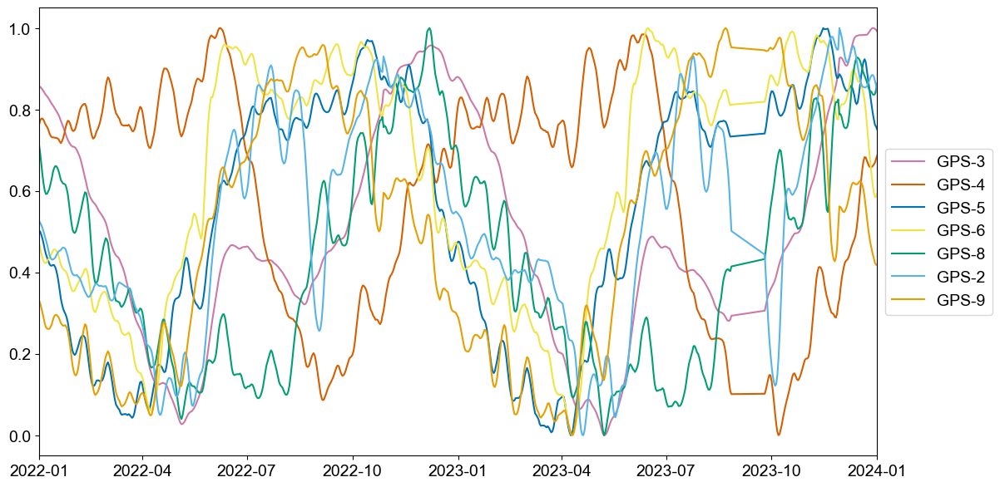

In [401]:
fig, ax = plt.subplots(figsize=(13,7))

start_time = pd.Timestamp('2022-01-01')
end_time = pd.Timestamp('2024-01-01')
plot_df = df[df.index.slice_indexer(start_time,end_time)]

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler() # normalize between 0 and 1, has to be this when dataset is not normally distributed
plot_df = pd.DataFrame(scaler.fit_transform(plot_df),columns=columns, index=plot_df.index) # scale transform 0-1

ax.plot(plot_df.index, plot_df.iloc[:,0], color=colors[0], label=f'{columns[0]}')
ax.plot(plot_df.index, plot_df.iloc[:,1], color=colors[1], label=f'{columns[1]}')
ax.plot(plot_df.index, plot_df.iloc[:,2], color=colors[2], label=f'{columns[2]}')
ax.plot(plot_df.index, plot_df.iloc[:,3], color=colors[3], label=f'{columns[3]}')
ax.plot(plot_df.index, plot_df.iloc[:,4], color=colors[4], label=f'{columns[4]}')
ax.plot(plot_df.index, plot_df.iloc[:,5], color=colors[5], label=f'{columns[5]}')
ax.plot(plot_df.index, plot_df.iloc[:,6], color=colors[6], label=f'{columns[6]}')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

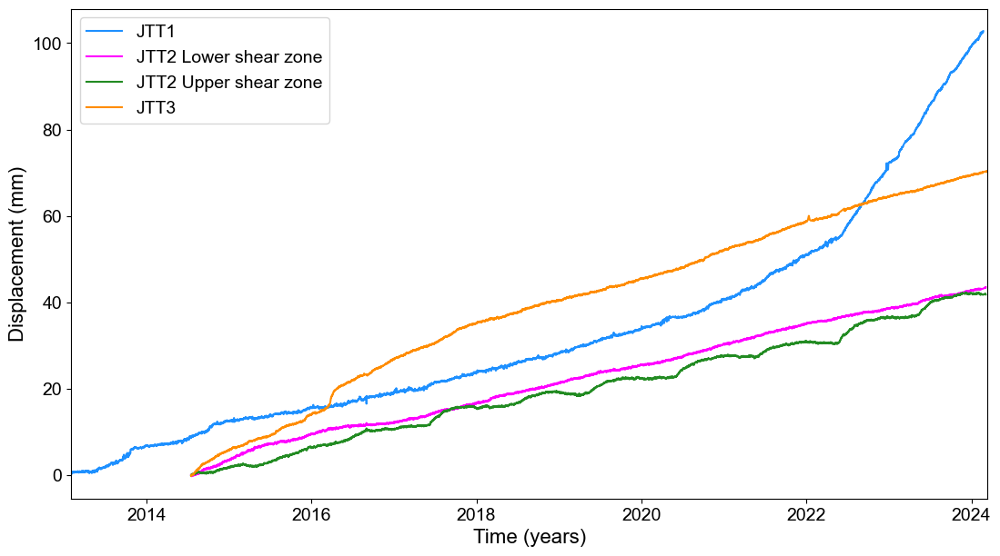

In [6]:
# lOOKING IF BOREHOLS ARE IN PHASE

fig, ax = plt.subplots(sharex=True, sharey=False, figsize=(13,7))
# fig.subplots_adjust(right=0.5)
# ax_y = ax.twinx()



file = JTT1Disp
file_2 = JTT3Disp
file_4 = JTT2DispUpperZone
file_41 = JTT2DispLowerZone

# # setting time slice
# time_file = '2023-01-01'
# start_time = pd.Timestamp(time_file)
# end_time = pd.Timestamp('2024-01-01')

# file = file[file.index.slice_indexer(start_time,end_time)]
# file_2 = file_2[file_2.index.slice_indexer(start_time,end_time)]
# file_3 = file_3[file_3.index.slice_indexer(start_time,end_time)]
# file_4 = file_4[file_4.index.slice_indexer(start_time,end_time)]
# file_41 = file_41[file_41.index.slice_indexer(start_time,end_time)]
# file_51 = file_51[file_51.index.slice_indexer(start_time,end_time)]
# file_5 = file_5[file_5.index.slice_indexer(start_time,end_time)]
# file_6 = file_6[file_6.index.slice_indexer(start_time,end_time)]
# file_61 = file_61[file_61.index.slice_indexer(start_time,end_time)]

# # plotting
col_name = 'Disp_summed [mm]:' # displacement
# col_name = '12_days_velocity:' # velocity

ax.set_xlabel('Time (years)')
if col_name == 'Disp_summed [mm]:':
    sns.lineplot(x=file.index, y=file[col_name]-file[col_name][0], color='dodgerblue', ax = ax, label='JTT1')
    sns.lineplot(x=file_41.index, y=file_41[col_name]-file_41[col_name][0], color='magenta', ax = ax, label='JTT2 Lower shear zone')
    sns.lineplot(x=file_4.index, y=file_4[col_name]-file_4[col_name][0], color='forestgreen', ax = ax, label='JTT2 Upper shear zone')
    sns.lineplot(x=file_2.index, y=file_2[col_name]-file_2[col_name][0], color='darkorange', ax = ax, label='JTT3')
    ax.set_ylabel('Displacement (mm)')
if col_name == '12_days_velocity:':
    sns.lineplot(x=file.index, y=file[col_name], color='dodgerblue', ax = ax, label='JTT1')
    sns.lineplot(x=file_41.index, y=file_41[col_name], color='magenta', ax = ax, label='JTT2 Lower shear zone')
    sns.lineplot(x=file_4.index, y=file_4[col_name], color='forestgreen', ax = ax, label='JTT2 Upper shear zone')
    sns.lineplot(x=file_2.index, y=file_2[col_name], color='darkorange', ax = ax, label='JTT3')
    ax.set_ylabel('Velocity (mm/day)')

plt.show()

# saving
path = 'plots\\'
save_name = f'{path}Allbh_disp.png'
fig.savefig(save_name, dpi=300, bbox_inches='tight')

In [404]:
# differencing n rows to get seasonal and trend removed to obtain statinarity
from scipy.signal import savgol_filter

def diff_shift(df, nrow_shift):
    return df-df.shift(nrow_shift) # Takes nrow forwards in time minus 'current' row and gives difference

def norm(series):
    series = scaler.fit_transform(series.values.reshape(-1, 1)) # transform to normalized values
    # df = scaler.inverse_transform(df) # transform back to original
    return series.reshape(-1) # transform back to correct shape

from scipy.signal import butter,filtfilt
def butter_lowpass_filter(data, cutoff, fs, order):
    data = data.values # values to filter
    nyq = 0.5 * fs # Nyquist Frequency, assumes regular time intervals
    normal_cutoff = cutoff / nyq
    # Get the filter coefficients 
    b, a = butter(order, normal_cutoff, btype='low')
    y = filtfilt(b, a, data)
    return y
    
def clean_filt(file, col=0): # colnmbr is the column chosen to lowpass filter
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    file['interpolated'] = file.iloc[:,col].interpolate(method='linear', limit_direction ='forward')
    # file['butterfilt'] = butter_lowpass_filter(file.iloc[:,-1], cutoff, fs, order) # replace original by lowpass filtered
    file['savgol'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    return file


# values for the low pass filter
n = 3 # number of days cut off
fs = 1 # sample rate in hours 
cutoff = 1/(24*n) # 1/24 means cutoff at 1 day, but times nyquist frequncey so twice
order = 2 # line from 1 to 0, second order is perfect function

# median filter window
window_median = 15 # 7 might be okay and 29 is smooth, tried with 15 as a middle way to keep temp stationary

# rolling mean filter window
window_mean = 7 # 7 is enough to keep temp stationary

# savgol parameters
window_size = 11
poly_order = 3

# #### With rock temp  #####
# start_time = pd.Timestamp('2014-01-01') # need as long as possible to make stationary, 2015 to 2018 is not enough
# end_time = pd.Timestamp('2019-01-01')

# interval = '1D' # choose between 1D, 1W, 1M

# # original data
# x = JTT2DispUpperZone.iloc[:,0] # hourly data intervals
# y = JTT2WpUpperZone.iloc[:,0] # hourly data intervals
# z = jtt_xgeo_temp.iloc[:,0] # daily data intervals
# f = ST.iloc[:,0] # hourly data intervals    
# df = pd.concat([x,y,z,f], axis=1)
# df.columns =['Disp', 'WP', 'Temp', 'Rock_temp']
# df.dropna(inplace=True)
# file = df.copy()
# file = file[file.index.slice_indexer(start_time,end_time)] # slicing
# file = file.resample(interval).median() # downsampling with median value
# original_df = df.copy()

#### time constraint  #####
start_time = pd.Timestamp('2013-01-01') # need as long as possible to make stationary, 2015 to 2018 is not enough
end_time = pd.Timestamp('2025-01-01')

interval = '1D' # choose between 1D, 1W, 1M

# original data
a = JTT1Disp.iloc[:,0] 
b = JTT1Wp.iloc[:,0] 
x = JTT2DispUpperZone.iloc[:,0] 
y = JTT2WpUpperZone.iloc[:,0] 
z = JTT2DispLowerZone.iloc[:,0] 
e = JTT3Disp.iloc[:,0] 
f = JTT3Wp.iloc[:,0] 

columns=['JTT1_D', 'JTT1_WP','JTT2_DU', 'JTT2_WP','JTT2_DL', 'JTT3_D', 'JTT3_WP']

df = pd.concat([a,b,x,y,z,e,f], axis=1)
df.columns =[columns]
df = df.dropna()
original_df = df.copy()

# cleaned data
def clean_df(df,start_time,end_time, interval):
    df = df[df.index.slice_indexer(start_time,end_time)]
    df = df.resample('1D').median() # get same base interval to clean data on
    df = df.dropna()
    for i, col in enumerate(df.columns):
        df.loc[:,col] = clean_filt(df.loc[:,col]).values # filtered data
        # df.loc[:,col] = medfilt(df.loc[:,col], window_median) # median filter
        df.loc[:, col] = df.loc[:, col].rolling(window=window_mean, center=True).mean() # rolling mean
    return df

# First I do a savgol filter, then I do a rolling mean after that again. And then downsampling the smoothed data.

df = clean_df(original_df,start_time,end_time, interval)
if not interval=='1D':
    print(f'{interval} resampling')
    df = df.resample(interval).median() # downsampling with median value after cleaning
# df = diff_shift(df, 1) # velocity
df = df.dropna()

# To compare results to original data
original_df = original_df[original_df.index.slice_indexer(start_time,end_time)]
original_df = original_df.resample(interval).median()
original_df = diff_shift(original_df, 1) # velocity
# original_df.dropna(inplace=True)

# Split into train and test
df_train = df.copy() # to keep entire df for prediction

# Apply decompose (decompose trend, seasonality, and resudials) to make data stationary
from statsmodels.tsa.seasonal import STL

df_list = []
for i,d in enumerate(df_train.columns):
    df = []
    original = df_train.loc[:,d] # data
    # seasonal decompositoon parameters
    if interval == '1M':
        seasonal = 13 # can try 7 to 13 from chatgpt, but need to test this to see what is correct
        period = 12 
    if interval == '1W':
        seasonal = 13 # can try 7 to 13 from chatgpt
        period = 52 
    if interval == '1D':
        seasonal = 13 # 7 to 25 from chatgpt
        period = 365
    decomposed_series = STL(original, seasonal=seasonal, period=period).fit() # for daily should be 13 and 365
    trend = decomposed_series.trend
    seasonal = decomposed_series.seasonal
    residual = decomposed_series.resid
    df = pd.DataFrame({'original':original.values, 'trend': trend.values, 'seasonal':seasonal.values, 'residual':residual.values}, index=df_train.index) 
    df.dropna(inplace=True)
    
#     #### Comment this part out when finished looking at what series is stationary  ####
#     # correlating?
#     print(f'{d}')
#     # print(df.corr()) # correlations

#     #### testing stationarity ####
#     from statsmodels.tsa.stattools import adfuller
#     for i, variable in enumerate(df.columns):
#         # Perform the ADF test
#         result = adfuller(df[variable])

#         # Extract and print the p-value from the test result
#         p_value = result[1]
#         print("p-value:", p_value)

#         # Interpret the result
#         if p_value <= 0.05: # 0.05 or 0.001
#             print(f"The variable {variable} is stationary.\n")
#         else:
#             print(f"The variable {variable} is not stationary.\n")
# ###############################

    # # choosing just one year
    # df = df[df.index.slice_indexer(pd.Timestamp('2016-01-01'),pd.Timestamp('2017-01-01'))]

    df_list.append(df)

col = 'seasonal' # only use the ones that passes ADF test
# col = 'original' # only use the ones that passes ADF test
df = pd.DataFrame({'JTT1D':df_list[0].loc[:,col], 'JTT1W':df_list[1].loc[:,col], 'JTT2DU':df_list[2].loc[:,col],'JTT2W':df_list[3].loc[:,col], 'JTT2DL':df_list[4].loc[:,col], 'JTT3D':df_list[5].loc[:,col], 'JTT3W':df_list[6].loc[:,col]}) #,'Rock_temp':df_list[3].loc[:,col]}) # only disp original is not stationary so chosen orig-trend, others original

# # now scale and transform data so variables are of similar weight 
# #(If you are developing a model that has a scientific value then you need to get rid of the units of the input variables. That’s because a model, if it is fundamental, should not depend on the particular units you use (https://www.quora.com/Should-you-standardise-data-before-regression))
# from sklearn.preprocessing import MinMaxScaler
# scaler = MinMaxScaler() # normalize between 0 and 1, has to be this when dataset is not normally distributed
# df = pd.DataFrame(scaler.fit_transform(df),columns=['JTT1D', 'JTT1W', 'JTT2DU', 'JTT2W', 'JTT2DL','JTT3D', 'JTT3W'], index=df.index) # scale transform 0-1 # ,'Rock_temp'
# df.dropna(inplace=True)
# df.head()

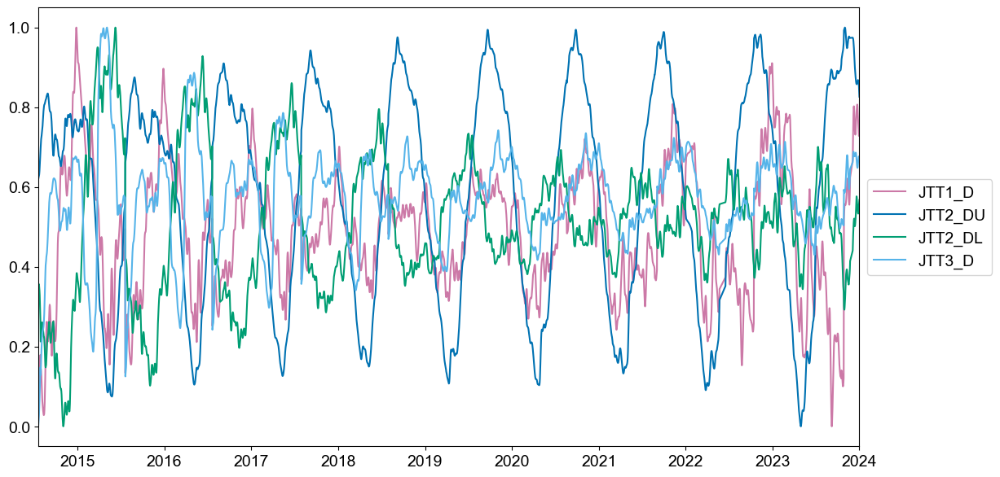

In [405]:
fig, ax = plt.subplots(figsize=(13,7))

start_time = pd.Timestamp('2013-01-01')
end_time = pd.Timestamp('2024-01-01')
plot_df = df[df.index.slice_indexer(start_time,end_time)]

# now scale and transform data so variables are of similar weight 
#(If you are developing a model that has a scientific value then you need to get rid of the units of the input variables. That’s because a model, if it is fundamental, should not depend on the particular units you use (https://www.quora.com/Should-you-standardise-data-before-regression))
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler() # normalize between 0 and 1, has to be this when dataset is not normally distributed
plot_df = pd.DataFrame(scaler.fit_transform(plot_df),columns=columns, index=plot_df.index) # scale transform 0-1

ax.plot(plot_df.index, plot_df.iloc[:,0], color=colors[0], label=f'{columns[0]}')
# ax.plot(plot_df.index, plot_df.iloc[:,1], color=colors[1], label=f'{columns[1]}')
ax.plot(plot_df.index, plot_df.iloc[:,2], color=colors[2], label=f'{columns[2]}')
# ax.plot(plot_df.index, plot_df.iloc[:,3], color=colors[3], label=f'{columns[3]}')
ax.plot(plot_df.index, plot_df.iloc[:,4], color=colors[4], label=f'{columns[4]}')
ax.plot(plot_df.index, plot_df.iloc[:,5], color=colors[5], label=f'{columns[5]}')
# ax.plot(plot_df.index, plot_df.iloc[:,6], color=colors[6], label=f'{columns[6]}')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

### Permafrost? Temp BH vs Disp

In [220]:
gam_xgeo_temp.tail()


,temperature,year,month,day
datetime,,,,
2025-08-16,9.4,2025,8,16
2025-08-17,5.2,2025,8,17
2025-08-18,5.9,2025,8,18
2025-08-19,8.4,2025,8,19
2025-08-20,6.2,2025,8,20


# GNSS Jettan and Gamanjunni

[None, None]

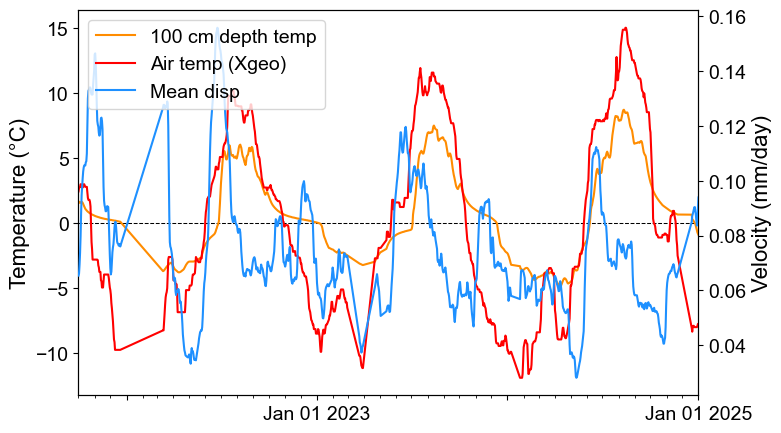

In [224]:
# fitting the puzzle of gamanjunni acceleration?
data='2d'
vel_interval = 30

df2 = pd.concat([gam_gps3[data], gam_gps4[data], gam_gps5[data],gam_gps6[data], gam_gps7[data], gam_gps8[data], gam_gps9[data], gam_gps10[data]], axis=1)
df2.columns = ['GPS3', 'GPS4', 'GPS5','GPS6', 'GPS7', 'GPS8','GPS9', 'GPS10']
df2 = df2.resample('1D').median()
for i,d in enumerate(df2.columns):
    df2[d] = clean_lowpassfilt(df2[d], colnmbr=0, name=f'{d}')
df2 = diff_shift(df2, vel_interval) # velocity
df2['Gamanjunni_Mean'] = df2.mean(axis=1, skipna=False)

file = gam_GT_80_200cm.iloc[:,1]
file = file.dropna().rolling(window=window_mean).median()

file2 = gam_xgeo_temp.iloc[:,0]
file2 = file2.dropna().rolling(window=window_mean).median()

df = pd.concat([df2.iloc[:,-1], file], axis=1) 
df = pd.concat([df, file2], axis=1) 
df = df.dropna()

start_time = '2021-01-01'
end_time = '2025-01-01'
df =  df[df.index.slice_indexer(start_time,end_time)]

fig, ax = plt.subplots(figsize=(8, 5))
ax_y = ax.twinx()

ax_y.plot(df.iloc[:,0], label='Mean disp', color='dodgerblue', zorder=3)
ax.plot(df.iloc[:,1], label='100 cm depth temp', color='darkorange', zorder=3)
ax.plot(df.iloc[:,2], label='Air temp (Xgeo)', color='red', zorder=3)

ax.axhline(y=0,color='k', linestyle='--', linewidth=.75, zorder=1)

ax.set_ylabel('Temperature (°C)')
ax_y.set_ylabel('Velocity (mm/day)')

handles, labels = [(a + b) for a, b in zip(ax.get_legend_handles_labels(), ax_y.get_legend_handles_labels())]
plt.legend(handles, labels, loc='upper left')

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax.xaxis.set_minor_locator(months)
ax.xaxis.set_major_locator(mdates.YearLocator(1, month=1, day=1))  # Major ticks on Jan 1st of every year
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d %Y')) 

# removing tick labels from the xaxis
n = 2  # keeps every n row
[l.set_visible(False) for (i,l) in enumerate(ax.xaxis.get_ticklabels()) if i % n != 0] # Get 'none' from this for some reason

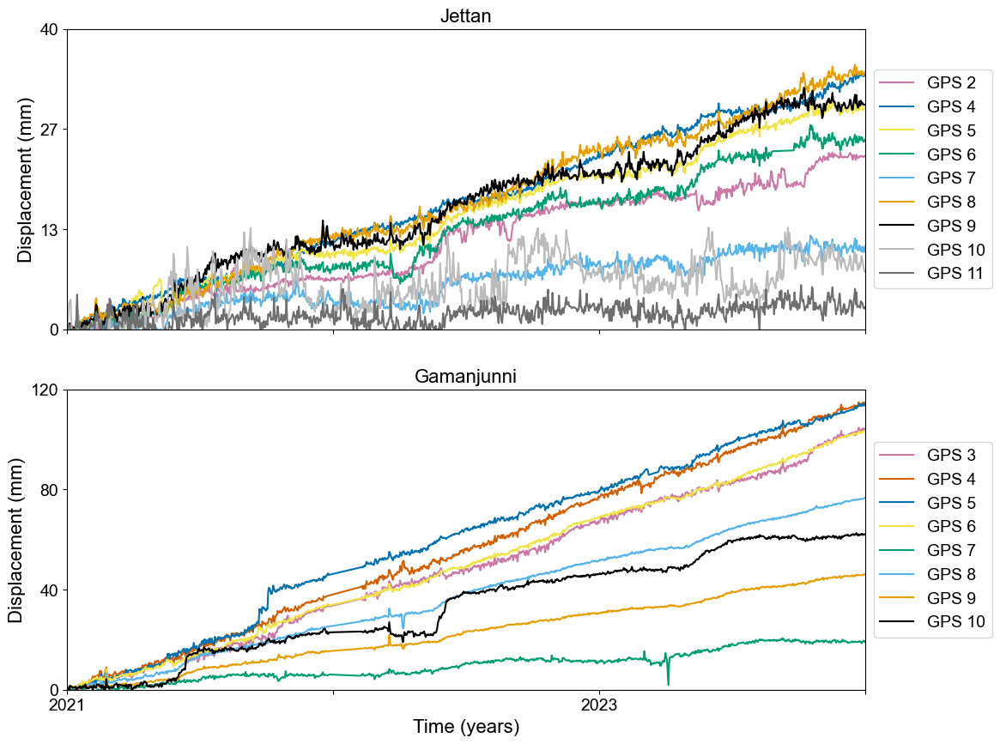

In [34]:
## TO LOOK AT GNSS VELOCITY og Jettan vs Gamanjunni to see seasonal trends

from matplotlib.dates import DateFormatter

# manually picked start and end times for following data

# plotting

ncols = 1
nrows = 2 # len(file['event'].unique()) // ncols + (len(file['event'].unique()) % ncols > 0)

fig, ax = plt.subplots(nrows, ncols,figsize=(12, 10), sharex=True)
# fig.subplots_adjust(hspace = .2, wspace=.6)

start_time = '2021-01-01'
end_time = '2024-01-01'

data = '2d'

#JETTAN
df =  jett_gps2
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(df.index, (df[data]-df[data][idx]), color=colors[0], label='GPS 2')

# df =  jett_gps3
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# idx = df.first_valid_index()
# df = df.replace(np.nan,np.inf) # changing nan to inf
# ax[0].plot(df.index, (df[data]-df[data][idx]), color=colors[1], label='GPS 3')

df =  jett_gps4
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(df.index, (df[data]-df[data][idx]), color=colors[2], label='GPS 4')

df =  jett_gps5
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(df.index, (df[data]-df[data][idx]), color=colors[3], label='GPS 5')

df =  jett_gps6
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(df.index,(df[data]-df[data][idx]), color=colors[4], label='GPS 6')

df =  jett_gps7
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(df.index, (df[data]-df[data][idx]), color=colors[5], label='GPS 7')

df =  jett_gps8
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(df.index, (df[data]-df[data][idx]), color=colors[6], label='GPS 8')

df =  jett_gps9
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(df.index, (df[data]-df[data][idx]), color=colors[7], label='GPS 9')

df =  jett_gps10
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(df.index,(df[data]-df[data][idx]), color=colors[8], label='GPS 10')

df =  jett_gps11
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(df.index, (df[data]-df[data][idx]), color=colors[9], label='GPS 11')

# GAMANJUNNI
df =  gam_gps3
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(df.index, (df[data]-df[data][idx]), color=colors[0], label='GPS 3')

df =  gam_gps4
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(df.index, (df[data]-df[data][idx]), color=colors[1], label='GPS 4')

df =  gam_gps5
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(df.index, (df[data]-df[data][idx]), color=colors[2], label='GPS 5')

df =  gam_gps6
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(df.index, (df[data]-df[data][idx]), color=colors[3], label='GPS 6')

df =  gam_gps7
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(df.index, (df[data]-df[data][idx]), color=colors[4], label='GPS 7')

df =  gam_gps8
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(df.index, (df[data]-df[data][idx]), color=colors[5], label='GPS 8')

df =  gam_gps9
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(df.index, (df[data]-df[data][idx]), color=colors[6], label='GPS 9')

df =  gam_gps10
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(df.index, (df[data]-df[data][idx]), color=colors[7], label='GPS 10')

nticks = 4
ax[0].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[0].yaxis.set_major_formatter(FormatStrFormatter('%.f'))
ax[1].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[1].yaxis.set_major_formatter(FormatStrFormatter('%.f'))

ymin, ymax = ax[0].get_ylim()
ax[0].set_ylim(0, 40)

ymin, ymax = ax[1].get_ylim()
ax[1].set_ylim(0, 120)

# title
ax[0].set_title('Jettan')
ax[1].set_title('Gamanjunni')

# legend
ax[0].legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax[1].legend(loc='center left', bbox_to_anchor=(1, 0.5))

# set axis labels
ax[0].set_ylabel('Displacement (mm)')
ax[1].set_ylabel('Displacement (mm)')
ax[1].set_xlabel('Time (years)')
n = 2  # Keeps every 2th label
for i in range(nrows):
    ax[i].xaxis.set_major_locator(mdates.YearLocator(1)) # tick every year
    [l.set_visible(False) for (i,l) in enumerate(ax[i].xaxis.get_ticklabels()) if i % n != 0] # lable every other year

# # # saving
path = 'plots\\'
save_name = f'{path}GNSS_Displacement_Longterm_JETT_GAM'
fig.savefig(save_name, dpi=300, bbox_inches='tight')

In [125]:
df =  jett_gps4
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
idx = df.first_valid_index()
df = df.replace(np.nan,np.inf) # changing nan to inf
(df[data]-df[data][idx]).tail() # gam gps4 max 160 over 3 years, jett gps 4 65 over 3 years

time
2024-11-24 00:00:00    64.861251
2024-11-24 12:00:00    64.687826
2024-11-25 00:00:00    64.864255
2024-11-25 12:00:00    64.853957
2024-11-26 00:00:00    64.516087
Name: 2d, dtype: float64

In [54]:
65/3

21.666666666666668

## Cross corr Jettan vs Gamanjunni

<Axes: xlabel='time'>

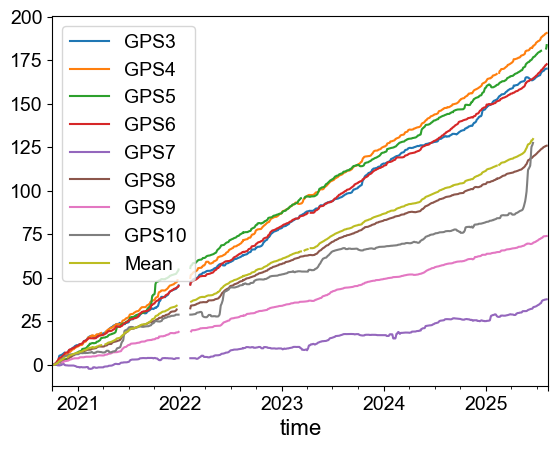

In [30]:
########### Cleaning DMS and GPS ############
from scipy.signal import savgol_filter

# rolling mean filter window
window_mean = 14

# savgol parameters
window_size = 7
poly_order = 3

def clean_lowpassfilt(file, colnmbr=0, name='Water table [m bgl]:'): # colnmbr is the column chosen to lowpass filter, name is wanted name for filtered column
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    # file = file.resample('1D').median() # matching interval of cleaning parameters
    file = file.dropna()
    file['interpolated'] = file.iloc[:,colnmbr].interpolate(method='linear', limit_direction ='forward')
    # file['filt'] = butter_lowpass_filter(file.iloc[:,-1], cutoff, fs, order) # replace original by lowpass filtered
    file['filt'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    file['filt'] = file['filt'].rolling(window=window_mean, center=True).median() # rolling median
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    file.rename(columns={'filt':name}, inplace=True) # I call it the same as original if it was dependent on name in scripts lower down
    return file
######################################

# Do correlations on stationary variables!

crosscorr_lag = 6 # tried 3 months did not work, tried 12 months = too much. Try 6 months now and only look at 3 months by graying out the boarders.

data='2d'
vel_interval = 30
df2 = pd.concat([gam_gps3[data], gam_gps4[data], gam_gps5[data],gam_gps6[data], gam_gps7[data], gam_gps8[data], gam_gps9[data], gam_gps10[data]], axis=1)
df2.columns = ['GPS3', 'GPS4', 'GPS5','GPS6', 'GPS7', 'GPS8','GPS9', 'GPS10']
df2 = df2.resample('1D').median()
for i,d in enumerate(df2.columns):
    df2[d] = clean_lowpassfilt(df2[d], colnmbr=0, name=f'{d}')
# df2 = diff_shift(df2, vel_interval) # velocity
df2['Mean'] = df2.mean(axis=1, skipna=False)

idx = df2.first_valid_index()
df2 = df2-df2.loc[idx]

df2.plot()

In [553]:
df1 = pd.concat([jett_gps2[data], jett_gps3[data], jett_gps4[data],jett_gps5[data], jett_gps6[data], jett_gps7[data],jett_gps8[data], jett_gps9[data], jett_gps10[data]], axis=1)
df1.columns = ['GPS2', 'GPS3', 'GPS4','GPS5', 'GPS6', 'GPS7','GPS8', 'GPS9', 'GPS10']
df1 = df1.resample('1D').median()
for i,d in enumerate(df1.columns):
    df1[d] = clean_lowpassfilt(df1[d], colnmbr=0, name=f'{d}')

yes
            GPS2
time            
2010-02-03   NaN
2010-02-04   NaN
2010-02-05   NaN
2010-02-06   NaN
2010-02-07   NaN
yes
            GPS3
time            
2010-02-03   NaN
2010-02-04   NaN
2010-02-05   NaN
2010-02-06   NaN
2010-02-07   NaN
yes
            GPS4
time            
2010-02-03   NaN
2010-02-04   NaN
2010-02-05   NaN
2010-02-06   NaN
2010-02-07   NaN
yes
            GPS5
time            
2010-02-03   NaN
2010-02-04   NaN
2010-02-05   NaN
2010-02-06   NaN
2010-02-07   NaN
yes
            GPS6
time            
2010-02-03   NaN
2010-02-04   NaN
2010-02-05   NaN
2010-02-06   NaN
2010-02-07   NaN
yes
            GPS7
time            
2010-02-03   NaN
2010-02-04   NaN
2010-02-05   NaN
2010-02-06   NaN
2010-02-07   NaN
yes
                GPS8
time                
2010-02-03  3.376481
2010-02-04  5.158743
2010-02-05  4.567366
2010-02-06  6.093601
2010-02-07  6.343044
yes
                GPS9
time                
2010-02-03  4.666905
2010-02-04  7.102059
2010-02-05  7.254577
20

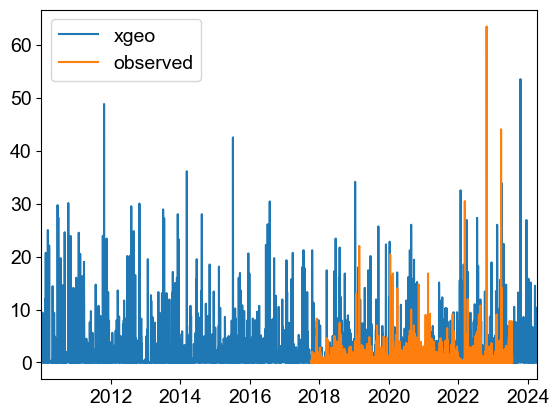

In [39]:
plt.plot(jtt_xgeo_rain.iloc[:,0], label='xgeo')
plt.plot(gam_precip.iloc[:,0], label='observed')
plt.legend()

In [59]:
jtt_xgeo_temp.head()

,temperature,year,month,day
datetime,,,,
2010-01-01 06:00:00,-15.6,2010,1,1
2010-01-02 06:00:00,-17.9,2010,1,2
2010-01-03 06:00:00,-14.5,2010,1,3
2010-01-04 06:00:00,-14.8,2010,1,4
2010-01-05 06:00:00,-19.6,2010,1,5


<Axes: xlabel='datetime'>

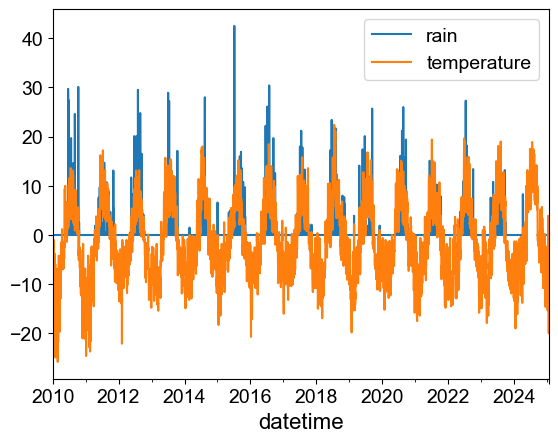

In [69]:
# Rain data
file = jtt_xgeo_rain.iloc[:,0].copy() # modeled xgeo
file.index = file.index - pd.DateOffset(hours=6) # xgeo
# file = jtt_precip.iloc[:,0].copy() # observed data
file = file.resample('1d').sum() # hourly data so sum to daily

file2 = jtt_xgeo_temp.iloc[:,0].copy()
file2.index = file2.index - pd.DateOffset(hours=6) # xgeo
file2 = file2.resample('1d').sum() # hourly data so sum to daily

df = pd.concat([file,file2], axis=1)
df.loc[df['temperature'] < 0, 'rain'] = 0

df.plot()

# ## smoothing to compare to 30 day velocity
# window_mean=30
# file = file.dropna().rolling(window=window_mean, center=True).mean()

# df.head()

In [460]:
jtt_temp_GST.loc[:,'Mean'].head()

Date
2014-09-07    8.39
2014-09-14    7.20
2014-09-21    6.00
2014-09-28    1.22
2014-10-05    4.34
Name: Mean, dtype: float64

Text(0.5, 0, 'Time Lags (days)')

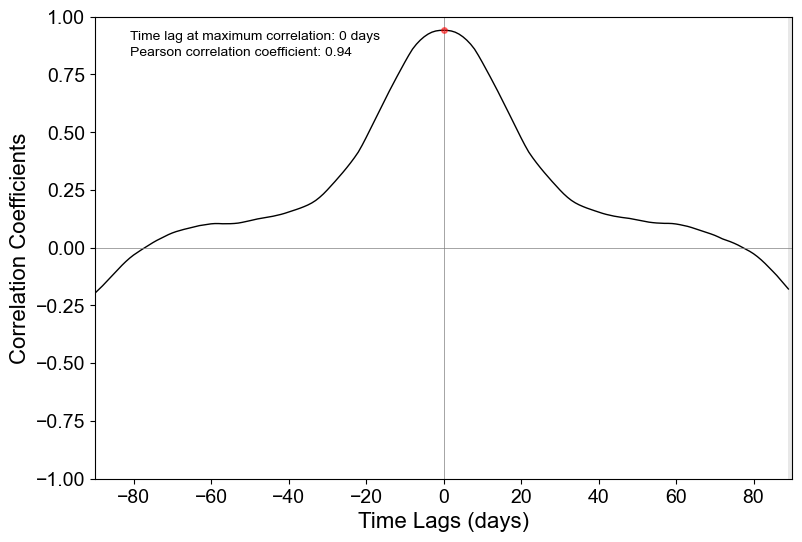

In [531]:
# This method is good. Same outcome as for statsmodels ccf
# Do correlations on stationary variables!

data='2d'
vel_interval = '30D'

df1 = pd.concat([jett_gps2[data], jett_gps4[data],jett_gps5[data], jett_gps6[data], jett_gps7[data],jett_gps8[data], jett_gps9[data], jett_gps10[data]], axis=1) # jett_gps3[data]
df1.columns = ['GPS2', 'GPS4','GPS5', 'GPS6', 'GPS7','GPS8', 'GPS9', 'GPS10'] #  'GPS3'
df1 = df1.resample('1D').median()
for i,d in enumerate(df1.columns):
    df1[d] = clean_lowpassfilt(df1[d], colnmbr=0, name=f'{d}')
df1 = rolling_slope_time(df1, vel_interval) # velocity
df1['Jettan_Mean'] = df1.mean(axis=1, skipna=False)

df2 = pd.concat([gam_gps3[data], gam_gps4[data], gam_gps5[data],gam_gps6[data], gam_gps7[data], gam_gps8[data], gam_gps9[data], gam_gps10[data]], axis=1)
df2.columns = ['GPS3', 'GPS4', 'GPS5','GPS6', 'GPS7', 'GPS8','GPS9', 'GPS10']
df2 = df2.resample('1D').median()
for i,d in enumerate(df2.columns):
    df2[d] = clean_lowpassfilt(df2[d], colnmbr=0, name=f'{d}')
df2 = rolling_slope_time(df2, vel_interval) # velocity
df2['Gamanjunni_Mean'] = df2.mean(axis=1, skipna=False)

# can also take the best timeseries with most disp for both and compare.. Not jtt3 for comparison.

df = pd.concat([df1['Jettan_Mean'],df2['Gamanjunni_Mean']], axis=1) # comparing the two landslides
df = df.dropna()

# # ######### Borehoel
# JTT1 data
file = JTT1Disp.iloc[:,0]
file = file.resample('1D').median() # downsampling with median value to seismic data resolution
file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
file1 = rolling_slope_time(file, vel_interval) # velocity

# # JTT2 upper data
# file = JTT2DispUpperZone.iloc[:,0]
# file = file.resample('1D').median() # downsampling with median value to seismic data resolution
# file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
# file1 = rolling_slope_time(file, vel_interval) # velocity

# file3 = JTT2WpUpperZone.iloc[:,0]
# file3 = file3.resample('1d').max() # hourly data so sum to daily
# ## smoothing to compare to 30 day velocity
# window_mean=30
# file3 = file3.dropna().rolling(window=window_mean, center=True).mean()

# # comparing borheole to borehole variables
# df = pd.concat([file1, file3], axis=1) 
# df = df.dropna()

# ######################################################
# # # ## River data # comparing with manndalen river 
# # file = river1.iloc[:,0].copy()
# # file = file.resample('1d').max() # hourly data so sum to daily

# file = gam_xgeo_precip_snowmelt.iloc[:,0].copy()
# file = running_sum(file, 30)
# file = file.resample(f'{vel_interval}d').sum()

# # Rain data filtered so no rain when cold
# file = jtt_xgeo_rain.iloc[:,0].copy() # modeled xgeo
# file.index = file.index - pd.DateOffset(hours=6) # xgeo
# # file = jtt_precip.iloc[:,0].copy() # observed data
# file = file.resample('1d').sum() # hourly data so sum to daily

# file2 = jtt_xgeo_temp.iloc[:,0].copy()
# file2.index = file2.index - pd.DateOffset(hours=6) # xgeo
# file2 = file2.resample('1d').mean() # hourly data so sum to daily

# df = pd.concat([file,file2], axis=1)
# df.loc[df['temperature'] < -2, 'precip'] = 0
# file = df['precip'].copy()

# ## smoothing to compare to 30 day velocity
# window_mean=30
# file = file.dropna().rolling(window=window_mean, center=True).mean()
############################################

# # # comparing met to met variables
# window_mean=30
# # file = jtt_xgeo_temp.iloc[:,0].dropna().copy()
# # file1 = file.dropna().rolling(window=window_mean).median()

# file = jtt_temp_GST.loc[:,'Mean']
# window_mean=4 # equals 1 month
# file2 = file.dropna().rolling(window=window_mean, center=True).mean()

# file = jtt_xgeo_precip_snowmelt.iloc[:,0].copy()
# file = running_sum(file, 14)
# file2 = file.dropna().rolling(window=window_mean, center=True).mean()

# file = seismic.iloc[:,0].dropna().copy()
# file2 = file.dropna().rolling(window=window_mean).mean()

# # file3 = JTT2WpUpperZone.iloc[:,0]
# # file3 = file3.resample('1d').max() # hourly data so sum to daily
# # ## smoothing to compare to 30 day velocity
# # window_mean=30
# # file1 = file3.dropna().rolling(window=window_mean).mean()

# # # Resample to same as GST datalength
# # file2 = file2.resample('1W').median()

# # interval = '1W'

# df = pd.concat([file1, file2], axis=1) 
# df = df.dropna()

# # # comparing borehole to met variables
# file = jtt_xgeo_precip_snowmelt.iloc[:,0].copy()
# file = running_sum(file, 14)

file = seismic.iloc[:,0].dropna().copy()
window_mean=30
file = file.dropna().rolling(window=window_mean, center=True).mean()
# # file = file.resample('1W').median() # downsample to same interval

df = pd.concat([file1, file], axis=1) 
df = df.dropna()

# # adding to dataset Jett
# file = jtt_xgeo_precip_snowmelt.iloc[:,0].copy()
# file = running_sum(file, 14)

# df = pd.concat([df1.loc[:,'Jettan_Mean'], file], axis=1) 
# df = df.dropna()

# # adding to dataset Gam

# file = gam_GT_80_200cm.iloc[:,1].dropna().copy()
# file = file.dropna().rolling(window=window_mean, center=True).median()

# file = gam_xgeo_temp.iloc[:,0].dropna().copy()
# file = file.dropna().rolling(window=window_mean, center=True).median()

# file = gam_xgeo_precip_snowmelt.iloc[:,0].copy()
# file = running_sum(file, 14)

# df = pd.concat([df2.loc[:,'Gamanjunni_Mean'], file], axis=1) 
# df = df.dropna()

# ## Comparing Jettan and Gamanjunni
# df = pd.concat([df.iloc[:,0], df.iloc[:,1]], axis=1) 
# df = df.dropna()

# # # entire time series
# start_time = '2021-01-01'
# end_time = '2025-08-12'
# df =  df[df.index.slice_indexer(start_time,end_time)]

# Zoomed one year
start_time = '2022-01-01'
end_time = '2023-01-01'
df =  df[df.index.slice_indexer(start_time,end_time)]

# # Zoomed one year
# start_time = '2023-01-01'
# end_time = '2024-01-01'
# df =  df[df.index.slice_indexer(start_time,end_time)]

# # Zoomed summer to winter (no spring)
# start_time = '2022-09-01'
# end_time = '2023-02-01'
# df =  df[df.index.slice_indexer(start_time,end_time)]


# Testing lag between variables of sum function
window_size = 14
df = jtt_xgeo_precip_snowmelt.copy()
df['sum_14day'] = running_sum(df.iloc[:,0], window_size)

window_size = 30
df['sum_30day'] = running_sum(df.iloc[:,0], window_size)

df = df[['sum_14day','sum_30day']].dropna()

# Zoomed one year
start_time = '2022-01-01'
end_time = '2023-01-01'
df =  df[df.index.slice_indexer(start_time,end_time)]

# scale it to get correct correlation
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler() # normalize between 0 and 1, has to be this when dataset is not normally distributed
scaled_df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns, index=df.index)
scaled_df = scaled_df.dropna() # is this a good way of doing it?

series1 = scaled_df.iloc[:,0] # x
series2 = scaled_df.iloc[:,1] # y

## cross corr plot

# crosscorr_lag = 6 # tried 3 months did not work, tried 12 months = too much. Try 6 months now and only look at 3 months by graying out the boarders.

crosscorr_lag_window = 3 #1/30*21 # tried 3 months did not work, tried 12 months = too much. Try 6 months now and only look at 3 months by graying out the boarders.
max_crosscorr_lag = 3 #1/30*21

# Set the maximum lag you want to consider
interval = '1D'

#### frequency ####
if interval == '1D':
    h = 1 # per day 
    time_inter = 'days'
if interval == '1W':
    h = 1/7 # per week 
    time_inter = 'weeks'
if interval == '1M':
    h = 1/30 # per week 
    time_inter = 'months'
#######################
n_months = crosscorr_lag_window
period = int(h*30*crosscorr_lag_window) # we assume correlation should happen within crosscor_lag months
max_lag = int(n_months*30*h) # to make sure it is an integer number
lags = range(-max_lag, max_lag)

# Initialize arrays to store results
correlation_coefficients = []
p_values = []

# Loop through different time lags (both positive and negative)
for lag in lags:
    # Calculate Pearson correlation coefficient and p-value
    if lag < 0:
        correlation_coefficient, p_value = pearsonr(series1[:lag], series2[-lag:])
    elif lag == 0:
        correlation_coefficient, p_value = pearsonr(series1, series2)
    else:
        correlation_coefficient, p_value = pearsonr(series1[lag:], series2[:-lag])
    
    # Append results to arrays
    correlation_coefficients.append(correlation_coefficient)
    p_values.append(p_value)

# # Find the lag with the maximum absolute correlation within +/- crosscorr_lag months
# corr_window = correlation_coefficients[-period:period*3]
# # max_corr_index = np.argmax(np.abs(corr_window)) # absolute
# max_corr_index = np.argmax(corr_window) # only positive
# max_corr_lag = lags[-period:period*3][max_corr_index]

# Need to be fixed to be able to have different crosscorr_lag_window from max_crosscorr_lag
corr_window = correlation_coefficients[-max_lag + max_lag : max_lag + max_lag + 1]
lags_window = list(range(-max_lag, max_lag + 1))
# Find the maximum correlation in this window
max_corr_index = np.argmax(np.abs(corr_window))
max_corr_lag = lags_window[max_corr_index]

n_std = 2
small_size = 10

import scipy.stats as st 

# changing lags to days
lags_plot = np.linspace(lags[0],lags[-1], num=int(max_lag*2)) # days

fig, ax =plt.subplots(figsize=(9, 6))
pannel = ax # lags_plot, correlation_coefficients
pannel.plot(lags_plot, correlation_coefficients, color='black', lw=1)
pannel.axvline(x = 0, color = 'gray', lw = 0.5)
pannel.axhline(y = 0, color = 'gray', lw = 0.5)
pannel.plot(max_corr_lag, corr_window[max_corr_index], color='red', marker='o', markersize=4, alpha=0.5) # zorder=0 # point to highlight max within corr_window # point to highlight max within corr_window

# gray out area
pannel.axvspan(lags_plot[0], -period, facecolor='lightgray', alpha=0.5)
pannel.axvspan(+period,lags_plot[-1], facecolor='lightgray', alpha=0.5)

# text in the plot
y_pos = lags_plot[0]-(lags_plot[0]*0.1)
pannel.text(y_pos, 0.90, f'Time lag at maximum correlation: {max_corr_lag:.0f} {time_inter}', horizontalalignment='left', color='k', fontsize=small_size)
pannel.text(y_pos, 0.83, f'Pearson correlation coefficient: {corr_window[max_corr_index]:.2f}', horizontalalignment='left', color='k', fontsize=small_size)

# cosmetics
pannel.set(ylim = [-1, 1])
pannel.set_ylabel('Correlation Coefficients')
pannel.set_xlabel(f'Time Lags ({time_inter})')

# # Set the maximum lag you want to consider
# h = 1 # NB !frequency per day! 
# n_months = crosscorr_lag
# period =h*90 # we assume correlation should happen within 90 days
# max_lag = n_months*30*h
# lags = range(-max_lag, max_lag)

# # Initialize arrays to store results
# correlation_coefficients = []
# p_values = []

# # Loop through different time lags (both positive and negative)
# for lag in lags:
#     # Calculate Pearson correlation coefficient and p-value
#     if lag < 0:
#         correlation_coefficient, p_value = pearsonr(series1[:lag], series2[-lag:])
#     elif lag == 0:
#         correlation_coefficient, p_value = pearsonr(series1, series2)
#     else:
#         correlation_coefficient, p_value = pearsonr(series1[lag:], series2[:-lag])
    
#     # Append results to arrays
#     correlation_coefficients.append(correlation_coefficient)
#     p_values.append(p_value)

# # # Find the lag with the maximum absolute correlation for entire time series
# # max_corr_index = np.argmax(np.abs(correlation_coefficients))
# # max_corr_lag = lags[max_corr_index]

# # Find the lag with the maximum absolute correlation within +/- 3 months
# corr_window = correlation_coefficients[period:period*3]
# max_corr_index = np.argmax(np.abs(corr_window))
# max_corr_lag = lags[period:period*3][max_corr_index]

# n_std = 2
# small_size = 10

# import scipy.stats as st 
# def ccf_plot(lags, ccf):
#     fig, ax =plt.subplots(figsize=(9, 6))
#     ax.plot(lags, ccf, color='black', lw=1)
#     ax.axvline(x = 0, color = 'gray', lw = 0.5)
#     ax.axhline(y = 0, color = 'gray', lw = 0.5)
#     ax.axhline(y = np.max(ccf), color = 'dodgerblue', lw = 1, linestyle='--', label = 'highest +/- correlation')
#     ax.axhline(y = np.min(ccf), color = 'dodgerblue', lw = 1, linestyle='--')
#     ax.plot(max_corr_lag/h, corr_window[max_corr_index], color='red', marker='o', markersize=4, alpha=0.5) # zorder=0 # point to highlight max within corr_window # point to highlight max within corr_window
    
#     # # 2 x std
#     # ax.axhline(y = np.mean(ccf)+n_std*np.std(ccf), color = 'darkorange', lw = 1, linestyle='--', label = f'{n_std} x std')
#     # ax.axhline(y = np.mean(ccf)-n_std*np.std(ccf), color = 'darkorange', lw = 1, linestyle='--')
#     # # # 1 x std
#     # # ax.axhline(y = np.mean(ccf)+1*np.std(ccf), color = 'red', lw = 1, linestyle='--', label = f'{1} x std')
#     # # ax.axhline(y = np.mean(ccf)-1*np.std(ccf), color = 'red', lw = 1, linestyle='--')
    
#     # gray out area
#     ax.axvspan(lags_plot[0], -90, facecolor='lightgray', alpha=0.5)
#     ax.axvspan(+90,lags_plot[-1], facecolor='lightgray', alpha=0.5)
    
#     # text in the plot
#     y_pos = lags_plot[0]-(lags_plot[0]*0.1)
#     ax.text(y_pos, 0.90, f'Time lag at maximum correlation: {max_corr_lag/h:.1f} days', horizontalalignment='left', color='k', fontsize=small_size)
#     ax.text(y_pos, 0.83, f'Pearson correlation coefficient: {corr_window[max_corr_index]:.2f}', horizontalalignment='left', color='k', fontsize=small_size)
#     # ax.text(y_pos, 0.76, f'2 x standard deviation: +{np.mean(ccf)+n_std*np.std(ccf):.2f}/{np.mean(ccf)-n_std*np.std(ccf):.2f}', horizontalalignment='left', color='k', fontsize=small_size)
#     pval = []
#     # if p_values[max_corr_index] < 0.001:
#     #     ax.text(y_pos, 0.69, f'P-value: <0.001', horizontalalignment='left', color='k', fontsize=small_size)
#     # else:
#     #     ax.text(y_pos, 0.69, f'P-value: {p_values[max_corr_index]:.3f}', horizontalalignment='left', color='k', fontsize=small_size)
    
#     # cosmetics
#     ax.set(ylim = [-1, 1])
#     ax.set_title(f'{series1.name} and {series2.name}', weight='bold', fontsize = 15)
#     ax.set_ylabel('Correlation Coefficients', weight='bold', fontsize = 12)
#     ax.set_xlabel('Time Lags (days)', weight='bold', fontsize = 12)
    
#     plt.legend(loc='lower right')
    
#     # # saving
#     # path = 'plots\\'
#     # save_name = f'{path}crosscorr_{series1.name}_{series2.name}_lag{n_months}.png'
#     # fig.savefig(save_name, dpi=300, bbox_inches='tight')
    
# # changing lags to days
# lags_plot = np.linspace(lags[0]/h,lags[-1]/h, num=int(max_lag*2)) # days

# ccf_plot(lags_plot, correlation_coefficients)

# # the first variable (x) is leading if negative lage time, and second variable (y) is leading if positive lag time

In [193]:
scaled_df.corr() # entire time series corr dv/v and GST -0.44, and 14-day rain and snow -0.008

,Disp_summed [mm]:,precip_and_snowmelt
Disp_summed [mm]:,1.000000,0.012898
precip_and_snowmelt,0.012898,1.000000


<Axes: xlabel='datetime'>

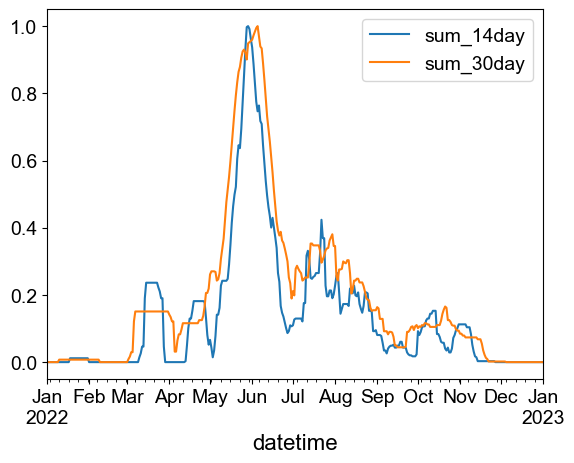

In [533]:
scaled_df.plot() # GST

<Axes: xlabel='time'>

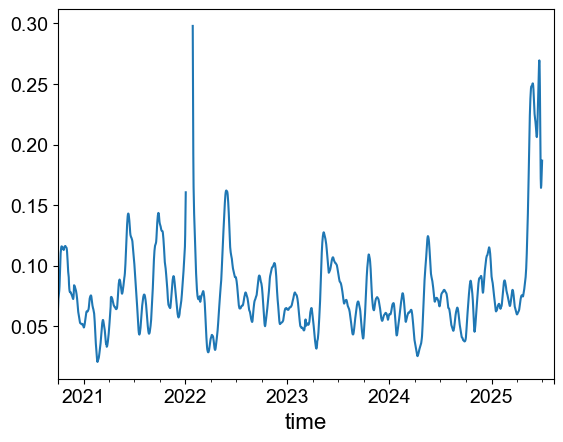

In [337]:
df2.iloc[:,-1].plot()

<Axes: xlabel='datetime'>

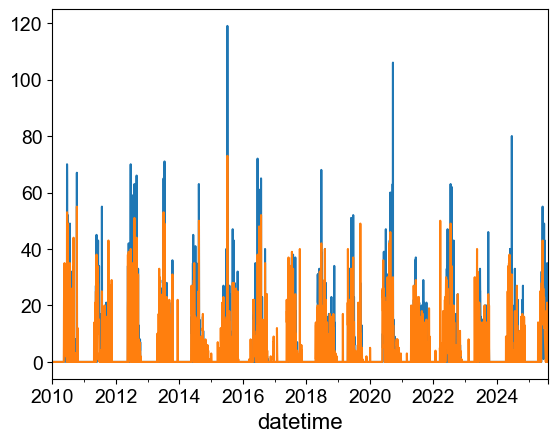

In [59]:
gam_xgeo_precip_snowmelt.iloc[:,0].plot() # Snowmelt
jtt_xgeo_precip_snowmelt.iloc[:,0].plot()

<Axes: xlabel='time'>

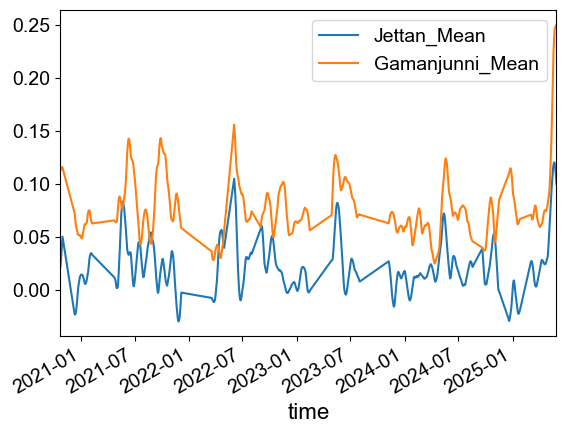

In [69]:
# This method is good. Same outcome as for statsmodels ccf
########### Cleaning DMS and GPS ############
from scipy.signal import savgol_filter

# rolling mean filter window
window_mean = 14

# savgol parameters
window_size = 7
poly_order = 3

def clean_lowpassfilt(file, colnmbr=0, name='Water table [m bgl]:'): # colnmbr is the column chosen to lowpass filter, name is wanted name for filtered column
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    # file = file.resample('1D').median() # matching interval of cleaning parameters
    file = file.dropna()
    file['interpolated'] = file.iloc[:,colnmbr].interpolate(method='linear', limit_direction ='forward')
    # file['filt'] = butter_lowpass_filter(file.iloc[:,-1], cutoff, fs, order) # replace original by lowpass filtered
    file['filt'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    file['filt'] = file['filt'].rolling(window=window_mean, center=True).median() # rolling median
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    file.rename(columns={'filt':name}, inplace=True) # I call it the same as original if it was dependent on name in scripts lower down
    return file
######################################

# Do correlations on stationary variables!

crosscorr_lag = 6 # tried 3 months did not work, tried 12 months = too much. Try 6 months now and only look at 3 months by graying out the boarders.

data='2d'
vel_interval = 30

df1 = pd.concat([jett_gps2[data], jett_gps4[data],jett_gps5[data], jett_gps6[data], jett_gps7[data],jett_gps8[data], jett_gps9[data], jett_gps10[data]], axis=1) # jett_gps3[data]
df1.columns = ['GPS2', 'GPS4','GPS5', 'GPS6', 'GPS7','GPS8', 'GPS9', 'GPS10'] #  'GPS3'
df1 = df1.resample('1D').median()
for i,d in enumerate(df1.columns):
    df1[d] = clean_lowpassfilt(df1[d], colnmbr=0, name=f'{d}')
df1 = rolling_slope(df1, vel_interval) # velocity
df1['Jettan_Mean'] = df1.mean(axis=1, skipna=False)

df2 = pd.concat([gam_gps3[data], gam_gps4[data], gam_gps5[data],gam_gps6[data], gam_gps7[data], gam_gps8[data], gam_gps9[data], gam_gps10[data]], axis=1)
df2.columns = ['GPS3', 'GPS4', 'GPS5','GPS6', 'GPS7', 'GPS8','GPS9', 'GPS10']
df2 = df2.resample('1D').median()
for i,d in enumerate(df2.columns):
    df2[d] = clean_lowpassfilt(df2[d], colnmbr=0, name=f'{d}')
df2 = rolling_slope(df2, vel_interval) # velocity
df2['Gamanjunni_Mean'] = df2.mean(axis=1, skipna=False)

# can also take the best timeseries with most disp for both and compare.. Not jtt3 for comparison.

df = pd.concat([df1['Jettan_Mean'],df2['Gamanjunni_Mean']], axis=1) # comparing the two landslides
df = df.dropna()
df.plot()

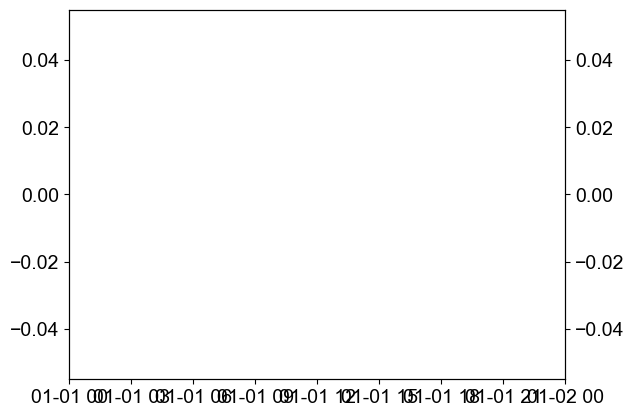

In [93]:
# Zoomed one year
start_time = '2021-01-01'
end_time = '2022-01-01'
df =  df[df.index.slice_indexer(start_time,end_time)]

fig, ax = plt.subplots()
ax.plot(df.iloc[:,0], color='darkorange')
ax_y = ax.twinx()
ax_y.plot(df.iloc[:,1], color='dodgerblue')

<Axes: xlabel='time'>

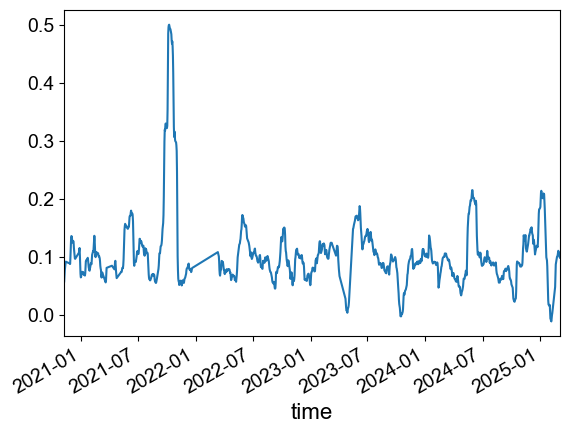

In [59]:
df2 = pd.concat([gam_gps3[data], gam_gps4[data], gam_gps5[data],gam_gps6[data], gam_gps7[data], gam_gps8[data], gam_gps9[data], gam_gps10[data]], axis=1)
df2.columns = ['GPS3', 'GPS4', 'GPS5','GPS6', 'GPS7', 'GPS8','GPS9', 'GPS10']
# for i,d in enumerate(df2.columns):
#     df2.iloc[:,i] = df2.iloc[:,i] - df2.iloc[0,i]
df2 = df2.resample('1D').median()
for i,d in enumerate(df2.columns):
    df2[d] = clean_lowpassfilt(df2[d], colnmbr=0, name=f'{d}')
df2 = diff_shift(df2, vel_interval) # velocity
df2['Gamanjunni_Mean'] = df2.mean(axis=1, skipna=False)
df2 = df2.dropna()
df2.iloc[:,2].plot()

<Axes: xlabel='time'>

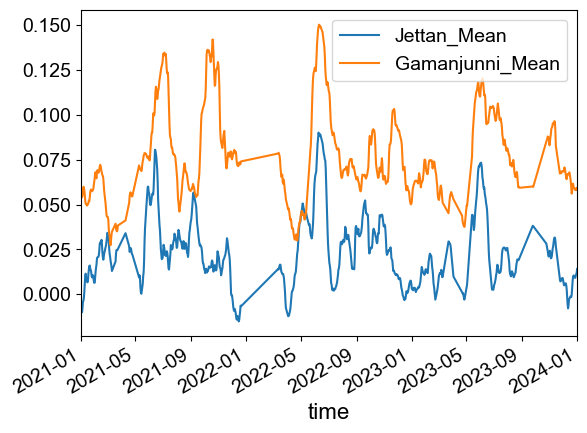

In [19]:
df.plot()

<Axes: xlabel='time'>

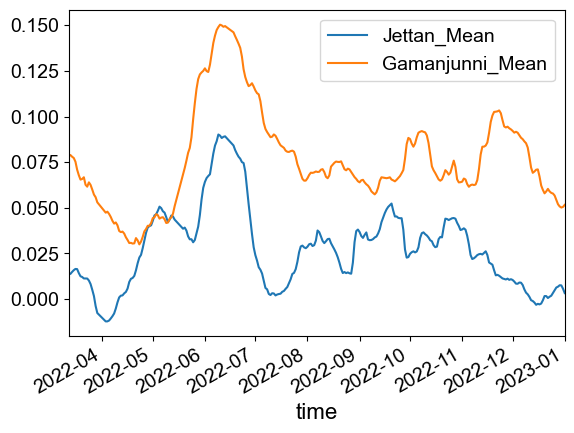

In [13]:
df.plot() # this is one year

In [52]:
# Checking yearly disp GNSS JEtt vs Gam
df1 = pd.concat([jett_gps2[data], jett_gps4[data],jett_gps5[data], jett_gps6[data], jett_gps7[data],jett_gps8[data], jett_gps9[data], jett_gps10[data]], axis=1) # jett_gps3[data]
df1.columns = ['GPS2', 'GPS4','GPS5', 'GPS6', 'GPS7','GPS8', 'GPS9', 'GPS10'] #  'GPS3'
df1 = df1.resample('1D').median()
# for i,d in enumerate(df1.columns):
    # df1[d] = clean_lowpassfilt(df1[d], colnmbr=0, name=f'{d}')
# df1 = diff_shift(df1, vel_interval) # velocity
df1['Jettan_Mean'] = df1.mean(axis=1, skipna=False)

df2 = pd.concat([gam_gps3[data], gam_gps4[data], gam_gps5[data],gam_gps6[data], gam_gps7[data], gam_gps8[data], gam_gps9[data], gam_gps10[data]], axis=1)
df2.columns = ['GPS3', 'GPS4', 'GPS5','GPS6', 'GPS7', 'GPS8','GPS9', 'GPS10']
df2 = df2.resample('1D').median()
# for i,d in enumerate(df2.columns):
    # df2[d] = clean_lowpassfilt(df2[d], colnmbr=0, name=f'{d}')
# df2 = diff_shift(df2, vel_interval) # velocity
df2['Gamanjunni_Mean'] = df2.mean(axis=1, skipna=False)

# can also take the best timeseries with most disp for both and compare.. Not jtt3 for comparison.

df = pd.concat([df1['Jettan_Mean'],df2['Gamanjunni_Mean']], axis=1) # comparing the two landslides
df = df.dropna()

# entire time series
start_time = '2024-01-01'
end_time = '2025-01-01'
df =  df[df.index.slice_indexer(start_time,end_time)]

x = df['Jettan_Mean'].copy()
print('Jettan:', (x[x.last_valid_index()]-x[x.first_valid_index()])/1, 'mm/yr')
x = df['Gamanjunni_Mean'].copy()
print('Gamanjunni:', (x[x.last_valid_index()]-x[x.first_valid_index()])/1, 'mm/yr')

Jettan: 8.137177775009718 mm/yr
Gamanjunni: 21.513435975789093 mm/yr


In [ ]:
# Entire time series
# Gam = 26.7 mm/yr 
# Jet = 8.1 mm/yr

# 2021-2022: Gam = 27.2, Jet = 8.2
# 2022-2023: Gam = 24.1, Jet = 8.8
# 2023-2024: Gam = 26.2, Jet = 7.2
# 2024-2025: Gam = 21.5, Jet = 8.1 (not including december)

In [56]:
26.7/8.1

3.2962962962962963

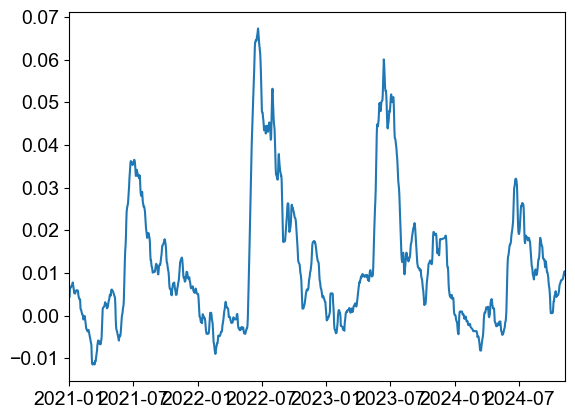

In [224]:
# #########
# # JTT1 data
# file = JTT1Disp.iloc[:,0]
# file = file.resample('1D').median() # downsampling with median value to seismic data resolution
# file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
# file1 = diff_shift(file, vel_interval) # velocity

# # # JTT2 upper data
# # file = JTT2DispUpperZone.iloc[:,0]
# # file = file.resample('1D').median() # downsampling with median value to seismic data resolution
# # file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
# # file1 = diff_shift(file, vel_interval) # velocity

# ######################################################
# # # ## River data # comparing with manndalen river 
# # file = river1.iloc[:,0].copy()
# # file = file.resample('1d').max() # hourly data so sum to daily

# # Rain data filtered so no rain when cold
# file = jtt_xgeo_rain.iloc[:,0].copy() # modeled xgeo
# file.index = file.index - pd.DateOffset(hours=6) # xgeo
# # file = jtt_precip.iloc[:,0].copy() # observed data
# file = file.resample('1d').sum() # hourly data so sum to daily

# file2 = jtt_xgeo_temp.iloc[:,0].copy()
# file2.index = file2.index - pd.DateOffset(hours=6) # xgeo
# file2 = file2.resample('1d').mean() # hourly data so sum to daily

# df = pd.concat([file,file2], axis=1)
# df.loc[df['temperature'] < -2, 'precip'] = 0
# file = df['precip'].copy()

# ## smoothing to compare to 30 day velocity
# window_mean=30
# file = file.dropna().rolling(window=window_mean, center=True).mean()
# ############################################

# # coapring borheole to met variables
# df = pd.concat([file1, file], axis=1) 
# df = df.dropna()

# # Zoomed one year
# start_time = '2023-01-01'
# end_time = '2024-01-01'
# df =  df[df.index.slice_indexer(start_time,end_time)]
plt.plot(df.iloc[:,0])

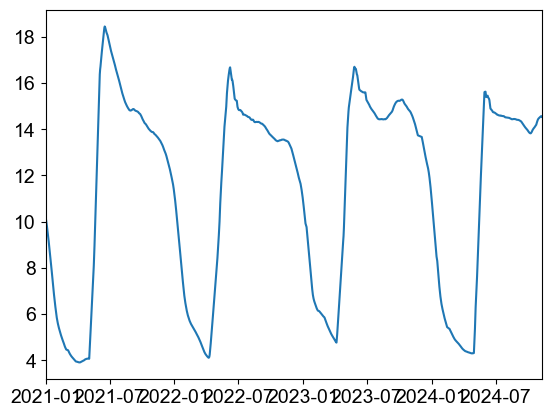

In [226]:
plt.plot(df.iloc[:,1]) # river discharge

<Axes: xlabel='time'>

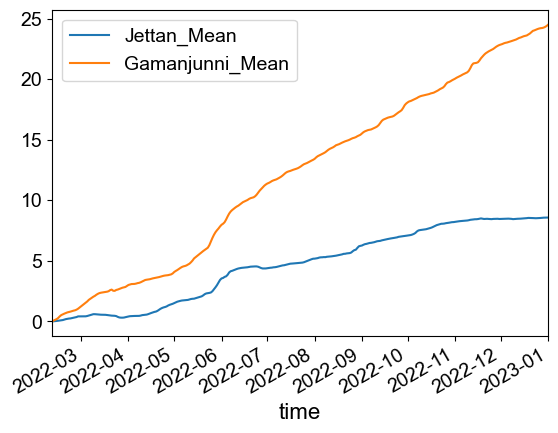

In [36]:
df1 = pd.concat([jett_gps2[data], jett_gps4[data],jett_gps5[data], jett_gps6[data], jett_gps7[data],jett_gps8[data], jett_gps9[data], jett_gps10[data]], axis=1) # jett_gps3[data]
df1.columns = ['GPS2', 'GPS4','GPS5', 'GPS6', 'GPS7','GPS8', 'GPS9', 'GPS10'] # 'GPS3',
df1 = df1.resample('1D').median()
for i,d in enumerate(df1.columns):
    df1[d] = clean_lowpassfilt(df1[d], colnmbr=0, name=f'{d}')
# df1 = diff_shift(df1, vel_interval) # velocity
df1['Jettan_Mean'] = df1.mean(axis=1, skipna=False)

df2 = pd.concat([gam_gps3[data], gam_gps4[data], gam_gps5[data],gam_gps6[data], gam_gps7[data], gam_gps8[data], gam_gps9[data], gam_gps10[data]], axis=1)
df2.columns = ['GPS3', 'GPS4', 'GPS5','GPS6', 'GPS7', 'GPS8','GPS9', 'GPS10']
df2 = df2.resample('1D').median()
for i,d in enumerate(df2.columns):
    df2[d] = clean_lowpassfilt(df2[d], colnmbr=0, name=f'{d}')
# df2 = diff_shift(df2, vel_interval) # velocity
df2['Gamanjunni_Mean'] = df2.mean(axis=1, skipna=False)

df = pd.concat([df1['Jettan_Mean'],df2['Gamanjunni_Mean']], axis=1)
df = df.dropna()

# Zoomed
start_time = '2022-01-01'
end_time = '2023-01-01'
df =  df[df.index.slice_indexer(start_time,end_time)]

# starting at 0 for both
df['Jettan_Mean'] = df['Jettan_Mean']-df['Jettan_Mean'][df.first_valid_index()]
df['Gamanjunni_Mean'] = df['Gamanjunni_Mean']-df['Gamanjunni_Mean'][df.first_valid_index()]
df.plot()

## Cross-corr and establishing seismic vs GNSS and Borehole spring and autumn acceleration

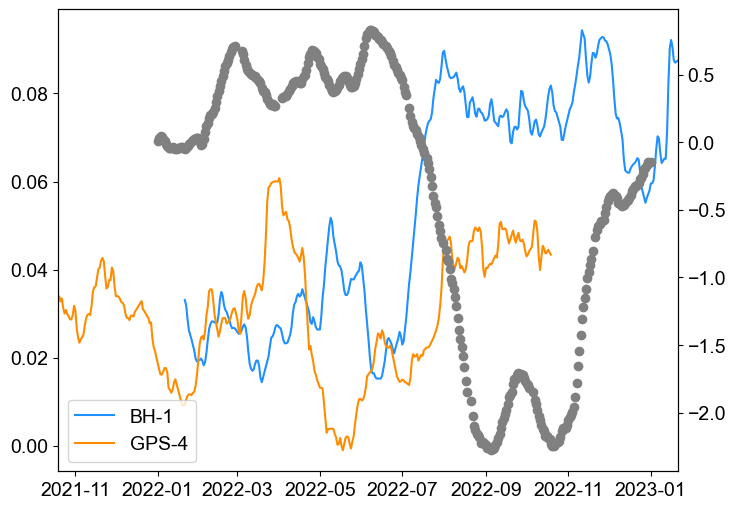

In [214]:
# This method is good. Same outcome as for statsmodels ccf
########### Cleaning DMS and GPS ############
from scipy.signal import savgol_filter

# rolling mean filter window
window_mean = 14

# savgol parameters
window_size = 7
poly_order = 3

def clean_lowpassfilt(file, colnmbr=0, name='Water table [m bgl]:'): # colnmbr is the column chosen to lowpass filter, name is wanted name for filtered column
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    # file = file.resample('1D').median() # matching interval of cleaning parameters
    file = file.dropna()
    file['interpolated'] = file.iloc[:,colnmbr].interpolate(method='linear', limit_direction ='forward')
    # file['filt'] = butter_lowpass_filter(file.iloc[:,-1], cutoff, fs, order) # replace original by lowpass filtered
    file['filt'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    file['filt'] = file['filt'].rolling(window=window_mean, center=True).median() # rolling median
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    file.rename(columns={'filt':name}, inplace=True) # I call it the same as original if it was dependent on name in scripts lower down
    return file
######################################

# Do correlations on stationary variables!

crosscorr_lag = 6 # tried 3 months did not work, tried 12 months = too much. Try 6 months now and only look at 3 months by graying out the boarders.

data='2d'
vel_interval = 30

df1 = pd.concat([jett_gps2[data], jett_gps4[data],jett_gps5[data], jett_gps6[data], jett_gps7[data],jett_gps8[data], jett_gps9[data], jett_gps10[data]], axis=1) # jett_gps3[data]
df1.columns = ['GPS2', 'GPS4','GPS5', 'GPS6', 'GPS7','GPS8', 'GPS9', 'GPS10'] #  'GPS3'
df1 = df1.resample('1D').median()
for i,d in enumerate(df1.columns):
    df1[d] = clean_lowpassfilt(df1[d], colnmbr=0, name=f'{d}')
df1 = rolling_slope(df1, vel_interval) # velocity
df1['Jettan_Mean'] = df1.mean(axis=1, skipna=False)

df2 = pd.concat([gam_gps3[data], gam_gps4[data], gam_gps5[data],gam_gps6[data], gam_gps7[data], gam_gps8[data], gam_gps9[data], gam_gps10[data]], axis=1)
df2.columns = ['GPS3', 'GPS4', 'GPS5','GPS6', 'GPS7', 'GPS8','GPS9', 'GPS10']
df2 = df2.resample('1D').median()
for i,d in enumerate(df2.columns):
    df2[d] = clean_lowpassfilt(df2[d], colnmbr=0, name=f'{d}')
df2 = rolling_slope(df2, vel_interval) # velocity
df2['Gamanjunni_Mean'] = df2.mean(axis=1, skipna=False)

# can also take the best timeseries with most disp for both and compare.. Not jtt3 for comparison.

df = pd.concat([df1['Jettan_Mean'],df2['Gamanjunni_Mean']], axis=1) # comparing the two landslides
df = df.dropna()

# ######### Borehole
# JTT1 data
file = JTT1Disp.iloc[:,0]
file = file.resample('1D').median() # downsampling with median value to seismic data resolution
file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
file1 = rolling_slope(file, vel_interval) # velocity

# # JTT2 upper data
# file = JTT2DispUpperZone.iloc[:,0]
# file = file.resample('1D').median() # downsampling with median value to seismic data resolution
# file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
# file1 = rolling_slope(file, vel_interval) # velocity

# file3 = JTT2WpUpperZone.iloc[:,0]
# file3 = file3.resample('1d').max() # hourly data so sum to daily
# ## smoothing to compare to 30 day velocity
# window_mean=30
# file3 = file3.dropna().rolling(window=window_mean).mean()

# # comparing borheole to borehole variables
# df = pd.concat([file1, file3], axis=1) 
# df = df.dropna()

# ######################################################
# # # ## River data # comparing with manndalen river 
# # file = river1.iloc[:,0].copy()
# # file = file.resample('1d').max() # hourly data so sum to daily

file = gam_xgeo_precip_snowmelt.iloc[:,0].copy()
file = running_sum(file, 14)
# file = file.resample(f'{vel_interval}d').sum()

# # Rain data filtered so no rain when cold
# file = jtt_xgeo_rain.iloc[:,0].copy() # modeled xgeo
# file.index = file.index - pd.DateOffset(hours=6) # xgeo
# # file = jtt_precip.iloc[:,0].copy() # observed data
# file = file.resample('1d').sum() # hourly data so sum to daily

# file2 = jtt_xgeo_temp.iloc[:,0].copy()
# file2.index = file2.index - pd.DateOffset(hours=6) # xgeo
# file2 = file2.resample('1d').mean() # hourly data so sum to daily

# df = pd.concat([file,file2], axis=1)
# df.loc[df['temperature'] < -2, 'precip'] = 0
# file = df['precip'].copy()

# ## smoothing to compare to 30 day velocity
# window_mean=30
# file = file.dropna().rolling(window=window_mean, center=True).mean()
############################################

# # # comparing met to met variables
# window_mean=30
# # file = jtt_xgeo_temp.iloc[:,0].dropna().copy()
# # file1 = file.dropna().rolling(window=window_mean).median()

# # file = jtt_temp_GST.loc[:,'Mean']
# # file1 = file.dropna().rolling(window=window_mean).mean()

# file = jtt_xgeo_precip_snowmelt.iloc[:,0].copy()
# file1 = running_sum(file, 14)
# file1 = file1.dropna().rolling(window=window_mean).mean()

# file = seismic.iloc[:,0].dropna().copy()
# file2 = file.dropna().rolling(window=window_mean).mean()

# # file3 = JTT2WpUpperZone.iloc[:,0]
# # file3 = file3.resample('1d').max() # hourly data so sum to daily
# # ## smoothing to compare to 30 day velocity
# # window_mean=30
# # file1 = file3.dropna().rolling(window=window_mean).mean()

# # # Resample to same as GST datalength
# # file2 = file2.resample('1W').median()

# # interval = '1W'

# df = pd.concat([file1, file2], axis=1) 
# df = df.dropna()

# # # comparing borehole to met variables
# file = jtt_xgeo_precip_snowmelt.iloc[:,0].copy()
# file = running_sum(file, 14)

# file = seismic.iloc[:,0].dropna().copy()
# window_mean=30
# file = file.dropna().rolling(window=window_mean).mean()

# df = pd.concat([file1, df1], axis=1) # Jettan
df = pd.concat([file, df1], axis=1) # Gamanjunni
# df = pd.concat([df, file], axis=1) 
df = df.dropna()

# Time window
start_time = '2022-01-01'
end_time = '2023-01-01'
df =  df[df.index.slice_indexer(start_time,end_time)]

fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(df.index+pd.Timedelta(days=20), df.iloc[:,0], label='BH-1', color='dodgerblue')
ax.plot(df.index-pd.Timedelta(days=74), df.loc[:,'GPS4'], label='GPS-4', color='darkorange')
# ax.plot(df.index, df.loc[:,'Jettan_Mean'], label='GPS (mean)', color='darkorange', linestyle='--')
ax_y = ax.twinx()
ax_y.scatter(df.index, df.loc[:,'dv/v(%)'], label='dV/V', color='gray')
# ax.axhline(y=0, color='k', linestyle='--', linewidth=2)
ax.legend(loc='lower left')

In [229]:
df.head(2)

,Disp_summed [mm]:,GPS2,GPS4,GPS5,GPS6,GPS7,GPS8,GPS9,GPS10,Jettan_Mean,dv/v(%)
2022-01-01,0.033098,-0.007479,0.033331,-0.011241,-0.006886,-0.000315,0.028151,0.028307,-0.078289,-0.001802,0.010683
2022-01-02,0.031830,-0.007971,0.033937,-0.010713,-0.005612,0.005215,0.025738,0.028902,-0.065138,0.000545,0.029715


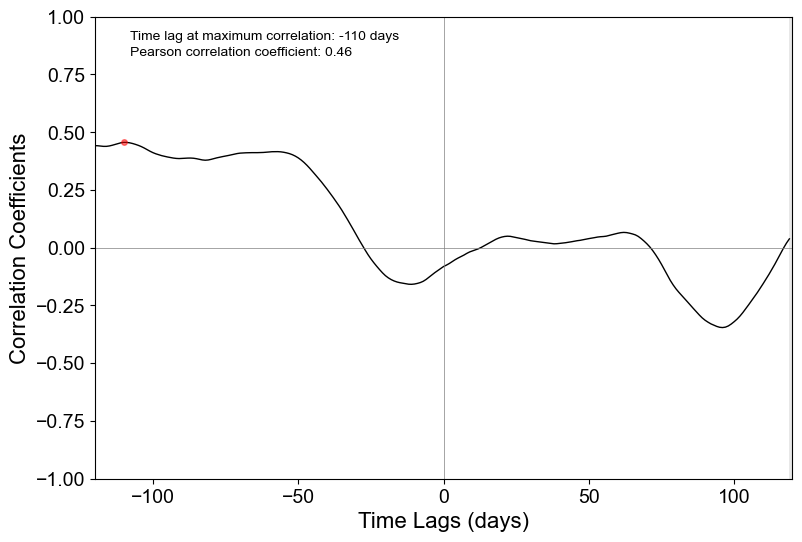

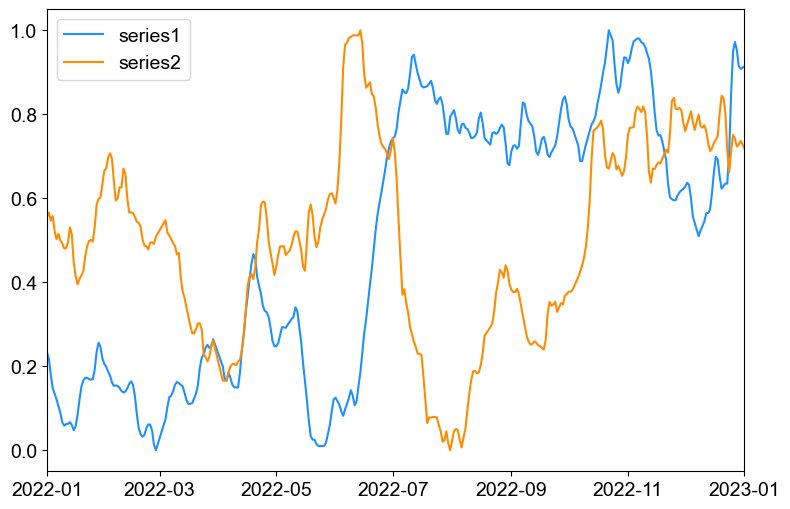

In [208]:
# scale it to get correct correlation
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler() # normalize between 0 and 1, has to be this when dataset is not normally distributed
scaled_df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns, index=df.index)
scaled_df = scaled_df.dropna() # is this a good way of doing it?

# series1 = scaled_df.iloc[:,-1] # dV/V
series1 = scaled_df.iloc[:,0] # BH
series2 = scaled_df.iloc[:,2] # GPS-4
# series2 = scaled_df.iloc[:,-2] # GPS mean

## cross corr plot
crosscorr_lag_window = 4 # tried 3 months did not work, tried 12 months = too much. Try 6 months now and only look at 3 months by graying out the boarders.
max_crosscorr_lag = 4

# Set the maximum lag you want to consider
interval = '1D'

#### frequency ####
if interval == '1D':
    h = 1 # per day 
    time_inter = 'days'
if interval == '1W':
    h = 1/7 # per week 
    time_inter = 'weeks'
if interval == '1M':
    h = 1/30 # per week 
    time_inter = 'months'
#######################
n_months = crosscorr_lag_window
period = int(h*30*crosscorr_lag_window) # we assume correlation should happen within crosscor_lag months
max_lag = int(n_months*30*h) # to make sure it is an integer number
lags = range(-max_lag, max_lag)

# Initialize arrays to store results
correlation_coefficients = []
p_values = []

# Loop through different time lags (both positive and negative)
for lag in lags:
    # Calculate Pearson correlation coefficient and p-value
    if lag < 0:
        correlation_coefficient, p_value = pearsonr(series1[:lag], series2[-lag:])
    elif lag == 0:
        correlation_coefficient, p_value = pearsonr(series1, series2)
    else:
        correlation_coefficient, p_value = pearsonr(series1[lag:], series2[:-lag])
    
    # Append results to arrays
    correlation_coefficients.append(correlation_coefficient)
    p_values.append(p_value)

# # Find the lag with the maximum absolute correlation within +/- crosscorr_lag months
# corr_window = correlation_coefficients[-period:period*3]
# # max_corr_index = np.argmax(np.abs(corr_window)) # absolute
# max_corr_index = np.argmax(corr_window) # only positive
# max_corr_lag = lags[-period:period*3][max_corr_index]

# Need to be fixed to be able to have different crosscorr_lag_window from max_crosscorr_lag
corr_window = correlation_coefficients[-max_lag + max_lag : max_lag + max_lag + 1]
lags_window = list(range(-max_lag, max_lag + 1))
# Find the maximum correlation in this window
max_corr_index = np.argmax(np.abs(corr_window))
max_corr_lag = lags_window[max_corr_index]

n_std = 2
small_size = 10

import scipy.stats as st 

# changing lags to days
lags_plot = np.linspace(lags[0],lags[-1], num=int(max_lag*2)) # days

fig, ax =plt.subplots(figsize=(9, 6))
pannel = ax # lags_plot, correlation_coefficients
pannel.plot(lags_plot, correlation_coefficients, color='black', lw=1)
pannel.axvline(x = 0, color = 'gray', lw = 0.5)
pannel.axhline(y = 0, color = 'gray', lw = 0.5)
pannel.plot(max_corr_lag, corr_window[max_corr_index], color='red', marker='o', markersize=4, alpha=0.5) # zorder=0 # point to highlight max within corr_window # point to highlight max within corr_window

# gray out area
pannel.axvspan(lags_plot[0], -period, facecolor='lightgray', alpha=0.5)
pannel.axvspan(+period,lags_plot[-1], facecolor='lightgray', alpha=0.5)

# text in the plot
y_pos = lags_plot[0]-(lags_plot[0]*0.1)
pannel.text(y_pos, 0.90, f'Time lag at maximum correlation: {max_corr_lag:.0f} {time_inter}', horizontalalignment='left', color='k', fontsize=small_size)
pannel.text(y_pos, 0.83, f'Pearson correlation coefficient: {corr_window[max_corr_index]:.2f}', horizontalalignment='left', color='k', fontsize=small_size)

# cosmetics
pannel.set(ylim = [-1, 1])
pannel.set_ylabel('Correlation Coefficients')
pannel.set_xlabel(f'Time Lags ({time_inter})')

# # Set the maximum lag you want to consider
# h = 1 # NB !frequency per day! 
# n_months = crosscorr_lag
# period =h*90 # we assume correlation should happen within 90 days
# max_lag = n_months*30*h
# lags = range(-max_lag, max_lag)

# # Initialize arrays to store results
# correlation_coefficients = []
# p_values = []

# # Loop through different time lags (both positive and negative)
# for lag in lags:
#     # Calculate Pearson correlation coefficient and p-value
#     if lag < 0:
#         correlation_coefficient, p_value = pearsonr(series1[:lag], series2[-lag:])
#     elif lag == 0:
#         correlation_coefficient, p_value = pearsonr(series1, series2)
#     else:
#         correlation_coefficient, p_value = pearsonr(series1[lag:], series2[:-lag])
    
#     # Append results to arrays
#     correlation_coefficients.append(correlation_coefficient)
#     p_values.append(p_value)

# # # Find the lag with the maximum absolute correlation for entire time series
# # max_corr_index = np.argmax(np.abs(correlation_coefficients))
# # max_corr_lag = lags[max_corr_index]

# # Find the lag with the maximum absolute correlation within +/- 3 months
# corr_window = correlation_coefficients[period:period*3]
# max_corr_index = np.argmax(np.abs(corr_window))
# max_corr_lag = lags[period:period*3][max_corr_index]

# n_std = 2
# small_size = 10

# import scipy.stats as st 
# def ccf_plot(lags, ccf):
#     fig, ax =plt.subplots(figsize=(9, 6))
#     ax.plot(lags, ccf, color='black', lw=1)
#     ax.axvline(x = 0, color = 'gray', lw = 0.5)
#     ax.axhline(y = 0, color = 'gray', lw = 0.5)
#     ax.axhline(y = np.max(ccf), color = 'dodgerblue', lw = 1, linestyle='--', label = 'highest +/- correlation')
#     ax.axhline(y = np.min(ccf), color = 'dodgerblue', lw = 1, linestyle='--')
#     ax.plot(max_corr_lag/h, corr_window[max_corr_index], color='red', marker='o', markersize=4, alpha=0.5) # zorder=0 # point to highlight max within corr_window # point to highlight max within corr_window
    
#     # # 2 x std
#     # ax.axhline(y = np.mean(ccf)+n_std*np.std(ccf), color = 'darkorange', lw = 1, linestyle='--', label = f'{n_std} x std')
#     # ax.axhline(y = np.mean(ccf)-n_std*np.std(ccf), color = 'darkorange', lw = 1, linestyle='--')
#     # # # 1 x std
#     # # ax.axhline(y = np.mean(ccf)+1*np.std(ccf), color = 'red', lw = 1, linestyle='--', label = f'{1} x std')
#     # # ax.axhline(y = np.mean(ccf)-1*np.std(ccf), color = 'red', lw = 1, linestyle='--')
    
#     # gray out area
#     ax.axvspan(lags_plot[0], -90, facecolor='lightgray', alpha=0.5)
#     ax.axvspan(+90,lags_plot[-1], facecolor='lightgray', alpha=0.5)
    
#     # text in the plot
#     y_pos = lags_plot[0]-(lags_plot[0]*0.1)
#     ax.text(y_pos, 0.90, f'Time lag at maximum correlation: {max_corr_lag/h:.1f} days', horizontalalignment='left', color='k', fontsize=small_size)
#     ax.text(y_pos, 0.83, f'Pearson correlation coefficient: {corr_window[max_corr_index]:.2f}', horizontalalignment='left', color='k', fontsize=small_size)
#     # ax.text(y_pos, 0.76, f'2 x standard deviation: +{np.mean(ccf)+n_std*np.std(ccf):.2f}/{np.mean(ccf)-n_std*np.std(ccf):.2f}', horizontalalignment='left', color='k', fontsize=small_size)
#     pval = []
#     # if p_values[max_corr_index] < 0.001:
#     #     ax.text(y_pos, 0.69, f'P-value: <0.001', horizontalalignment='left', color='k', fontsize=small_size)
#     # else:
#     #     ax.text(y_pos, 0.69, f'P-value: {p_values[max_corr_index]:.3f}', horizontalalignment='left', color='k', fontsize=small_size)
    
#     # cosmetics
#     ax.set(ylim = [-1, 1])
#     ax.set_title(f'{series1.name} and {series2.name}', weight='bold', fontsize = 15)
#     ax.set_ylabel('Correlation Coefficients', weight='bold', fontsize = 12)
#     ax.set_xlabel('Time Lags (days)', weight='bold', fontsize = 12)
    
#     plt.legend(loc='lower right')
    
#     # # saving
#     # path = 'plots\\'
#     # save_name = f'{path}crosscorr_{series1.name}_{series2.name}_lag{n_months}.png'
#     # fig.savefig(save_name, dpi=300, bbox_inches='tight')
    
# # changing lags to days
# lags_plot = np.linspace(lags[0]/h,lags[-1]/h, num=int(max_lag*2)) # days

# ccf_plot(lags_plot, correlation_coefficients)

# # the first variable (x) is leading if negative lage time, and second variable (y) is leading if positive lag time

fig, ax = plt.subplots(figsize=(9, 6))
ax.plot(series1.index, series1, label='series1', color='dodgerblue')
ax.plot(series2.index, series2, label='series2', color='darkorange')
ax.legend(loc='upper left')

## Unknown cleaning of Gamanjunni..?

In [44]:
#### time constraint  #####
start_time = pd.Timestamp('2013-01-01') # need as long as possible to make stationary, 2015 to 2018 is not enough
end_time = pd.Timestamp('2025-01-01')

interval = '1D' # choose between 1D, 1W, 1M

# original data
a = gam_gps3.iloc[:,3] 
b = gam_gps4.iloc[:,3] 
x = gam_gps5.iloc[:,3]  
y = gam_gps6.iloc[:,3]  
z = gam_gps7.iloc[:,3] 
e = gam_gps8.iloc[:,3]  
f = gam_gps9.iloc[:,3] 
g = gam_gps10.iloc[:,3]

columns=['GPS-3', 'GPS-4', 'GPS-5', 'GPS-6', 'GPS-7','GPS-8', 'GPS-9', 'GPS-10']

df = pd.concat([a,b,x,y,z,e,f,g], axis=1)
df.columns =[columns]
df.dropna(inplace=True)
df = diff_shift(df, 1)
df.head()

                 GPS-3       GPS-4       GPS-5      GPS-6       GPS-7       GPS-8      GPS-9     GPS-10
time                                                                                                   
2020-10-02  179.711291  157.288269  136.684107  96.587749  541.944177  161.145065  53.073893  65.989506
2020-10-03  179.890353  157.261749  136.675018  96.773118  541.775850  161.365095  53.412576  66.534744
2020-10-04  180.433575  157.695451  136.485105  97.119125  541.760087  161.465052  53.378697  66.155343
2020-10-05  180.288181  157.327468  135.884312  96.667266  542.043079  161.430005  53.676057  66.135723
2020-10-06  180.141110  157.609822  136.571378  96.768410  541.582909  160.785370  53.052637  65.670156


,GPS-3,GPS-4,GPS-5,GPS-6,GPS-7,GPS-8,GPS-9,GPS-10
time,,,,,,,,
2020-10-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-10-03,0.179062,-0.026520,-0.009089,0.185369,-0.168327,0.220030,0.338683,0.545238
2020-10-04,0.543222,0.433702,-0.189913,0.346007,-0.015763,0.099957,-0.033879,-0.379401
2020-10-05,-0.145395,-0.367983,-0.600793,-0.451859,0.282993,-0.035047,0.297360,-0.019621
2020-10-06,-0.147071,0.282354,0.687066,0.101145,-0.460170,-0.644635,-0.623421,-0.465567


In [410]:
# differencing n rows to get seasonal and trend removed to obtain statinarity
from scipy.signal import savgol_filter

def diff_shift(df, nrow_shift):
    return df-df.shift(nrow_shift) # Takes nrow forwards in time minus 'current' row and gives difference

def norm(series):
    series = scaler.fit_transform(series.values.reshape(-1, 1)) # transform to normalized values
    # df = scaler.inverse_transform(df) # transform back to original
    return series.reshape(-1) # transform back to correct shape

from scipy.signal import butter,filtfilt
def butter_lowpass_filter(data, cutoff, fs, order):
    data = data.values # values to filter
    nyq = 0.5 * fs # Nyquist Frequency, assumes regular time intervals
    normal_cutoff = cutoff / nyq
    # Get the filter coefficients 
    b, a = butter(order, normal_cutoff, btype='low')
    y = filtfilt(b, a, data)
    return y
    
def clean_filt(file, col=0): # colnmbr is the column chosen to lowpass filter
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    file['interpolated'] = file.iloc[:,col].interpolate(method='linear', limit_direction ='forward')
    # file['butterfilt'] = butter_lowpass_filter(file.iloc[:,-1], cutoff, fs, order) # replace original by lowpass filtered
    file['savgol'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    return file


# values for the low pass filter
n = 3 # number of days cut off
fs = 1 # sample rate in hours 
cutoff = 1/(24*n) # 1/24 means cutoff at 1 day, but times nyquist frequncey so twice
order = 2 # line from 1 to 0, second order is perfect function

# median filter window
window_median = 15 # 7 might be okay and 29 is smooth, tried with 15 as a middle way to keep temp stationary

# rolling mean filter window
window_mean = 7 # 7 is enough to keep temp stationary

# savgol parameters
window_size = 11
poly_order = 3

#### time constraint  #####
start_time = pd.Timestamp('2019-01-01') # need as long as possible to make stationary, 2015 to 2018 is not enough
end_time = pd.Timestamp('2025-01-01')

interval = '1D' # choose between 1D, 1W, 1M

# original data
a = gam_gps3.iloc[:,3] 
b = gam_gps4.iloc[:,3] 
x = gam_gps5.iloc[:,3]  
y = gam_gps6.iloc[:,3]  
z = gam_gps7.iloc[:,3] 
e = gam_gps8.iloc[:,3]  
f = gam_gps9.iloc[:,3] 
g = gam_gps10.iloc[:,3]

columns=['GPS-3', 'GPS-4', 'GPS-5', 'GPS-6', 'GPS-7','GPS-8', 'GPS-9', 'GPS-10']

df = []
original_df = []
df = pd.concat([a,b,x,y,z,e,f,g], axis=1)
df.columns =[columns]
df = df.dropna()
original_df = df.copy()

# cleaned data
def clean_df(df,start_time,end_time, interval):
    df = df[df.index.slice_indexer(start_time,end_time)]
    df = df.resample('1D').median() # get same base interval to clean data on
    df = df.dropna()
    for i, col in enumerate(df.columns):
        df.loc[:,col] = clean_filt(df.loc[:,col]).values # filtered data
        # df.loc[:,col] = medfilt(df.loc[:,col], window_median) # median filter
        df.loc[:, col] = df.loc[:, col].rolling(window=window_mean, center=True).mean() # rolling mean
    return df

# First I do a savgol filter, then I do a rolling mean after that again. And then downsampling the smoothed data.

df = clean_df(original_df,start_time,end_time, interval)
if not interval=='1D':
    print(f'{interval} resampling')
    df = df.resample(interval).median() # downsampling with median value after cleaning
# df = diff_shift(df, 1) # velocity
df = df.dropna()

# To compare results to original data
original_df = original_df[original_df.index.slice_indexer(start_time,end_time)]
original_df = original_df.resample(interval).median()
# original_df = diff_shift(original_df, 1) # velocity
# original_df.dropna(inplace=True)

# Split into train and test
df_train = df.copy() # to keep entire df for prediction

# Apply decompose (decompose trend, seasonality, and resudials) to make data stationary
from statsmodels.tsa.seasonal import STL

df_list = []
for i,d in enumerate(df_train.columns):
    df = []
    original = df_train.loc[:,d] # data
    # seasonal decompositoon parameters
    if interval == '1M':
        seasonal = 13 # can try 7 to 13 from chatgpt, but need to test this to see what is correct
        period = 12 
    if interval == '1W':
        seasonal = 13 # can try 7 to 13 from chatgpt
        period = 52 
    if interval == '1D':
        seasonal = 13 # 7 to 25 from chatgpt
        period = 365 
    decomposed_series = STL(original, seasonal=seasonal, period=period).fit() # for daily should be 13 and 365
    trend = decomposed_series.trend
    seasonal = decomposed_series.seasonal
    residual = decomposed_series.resid
    df = pd.DataFrame({'original':original.values, 'trend': trend.values, 'seasonal':seasonal.values, 'residual':residual.values}, index=df_train.index) 
    df = df.dropna()
    
#     #### Comment this part out when finished looking at what series is stationary  ####
#     # correlating?
#     print(f'{d}')
#     # print(df.corr()) # correlations

#     #### testing stationarity ####
#     from statsmodels.tsa.stattools import adfuller
#     for i, variable in enumerate(df.columns):
#         # Perform the ADF test
#         result = adfuller(df[variable])

#         # Extract and print the p-value from the test result
#         p_value = result[1]
#         print("p-value:", p_value)

#         # Interpret the result
#         if p_value <= 0.05: # 0.05 or 0.001
#             print(f"The variable {variable} is stationary.\n")
#         else:
#             print(f"The variable {variable} is not stationary.\n")
# ###############################

    # # choosing just one year
    # df = df[df.index.slice_indexer(pd.Timestamp('2016-01-01'),pd.Timestamp('2017-01-01'))]

    df_list.append(df)

col = 'seasonal' # only use the ones that passes ADF test
# col = 'original' # only use the ones that passes ADF test
df = pd.DataFrame({f'{columns[0]}':df_list[0].loc[:,col], f'{columns[1]}':df_list[1].loc[:,col], f'{columns[2]}':df_list[2].loc[:,col], f'{columns[3]}':df_list[3].loc[:,col], f'{columns[4]}':df_list[4].loc[:,col], f'{columns[5]}':df_list[5].loc[:,col], f'{columns[6]}':df_list[6].loc[:,col], f'{columns[7]}':df_list[7].loc[:,col]})


# # manual normalizing
# def norm(col):
#     file = col
#     normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
#     return normalized
    
# for i, col in enumerate(df.columns):
#     df.loc[:,col] = norm(df.loc[:,col])
# # df.head()

# now scale and transform data so variables are of similar weight 
#(If you are developing a model that has a scientific value then you need to get rid of the units of the input variables. That’s because a model, if it is fundamental, should not depend on the particular units you use (https://www.quora.com/Should-you-standardise-data-before-regression))
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler() # normalize between 0 and 1, has to be this when dataset is not normally distributed
plot_df = pd.DataFrame(scaler.fit_transform(plot_df),columns=columns, index=plot_df.index) # scale transform 0-1

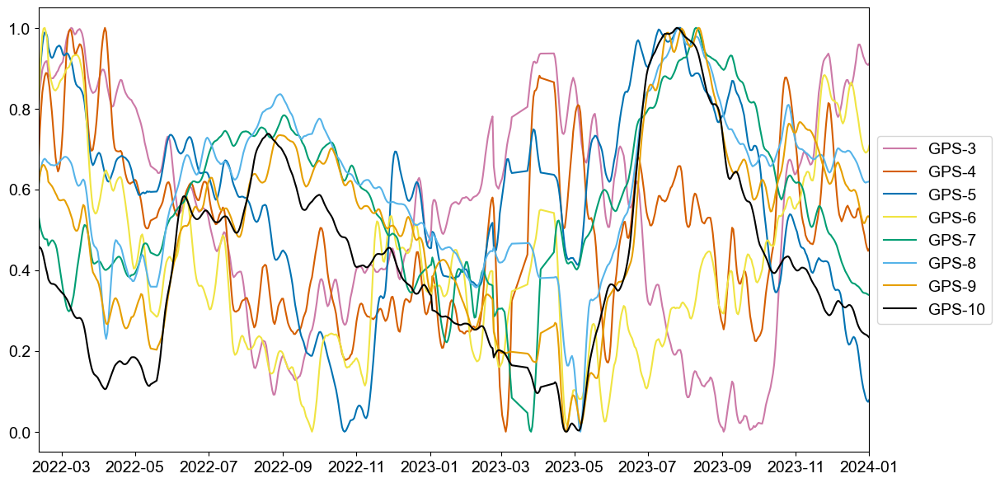

In [414]:
fig, ax = plt.subplots(figsize=(13,7))

start_time = pd.Timestamp('2022-01-01')
end_time = pd.Timestamp('2024-01-01')
plot_df = df[df.index.slice_indexer(start_time,end_time)]

# now scale and transform data so variables are of similar weight 
#(If you are developing a model that has a scientific value then you need to get rid of the units of the input variables. That’s because a model, if it is fundamental, should not depend on the particular units you use (https://www.quora.com/Should-you-standardise-data-before-regression))
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler() # normalize between 0 and 1, has to be this when dataset is not normally distributed
plot_df = pd.DataFrame(scaler.fit_transform(plot_df),columns=columns, index=plot_df.index) # scale transform 0-1

ax.plot(plot_df.index, plot_df.iloc[:,0], color=colors[0], label=f'{columns[0]}')
ax.plot(plot_df.index, plot_df.iloc[:,1], color=colors[1], label=f'{columns[1]}')
ax.plot(plot_df.index, plot_df.iloc[:,2], color=colors[2], label=f'{columns[2]}')
ax.plot(plot_df.index, plot_df.iloc[:,3], color=colors[3], label=f'{columns[3]}')
ax.plot(plot_df.index, plot_df.iloc[:,4], color=colors[4], label=f'{columns[4]}')
ax.plot(plot_df.index, plot_df.iloc[:,5], color=colors[5], label=f'{columns[5]}')
ax.plot(plot_df.index, plot_df.iloc[:,6], color=colors[6], label=f'{columns[6]}')
ax.plot(plot_df.index, plot_df.iloc[:,7], color=colors[7], label=f'{columns[7]}')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Looking at creep bursts

In [ ]:
JTT2DispUpperZone

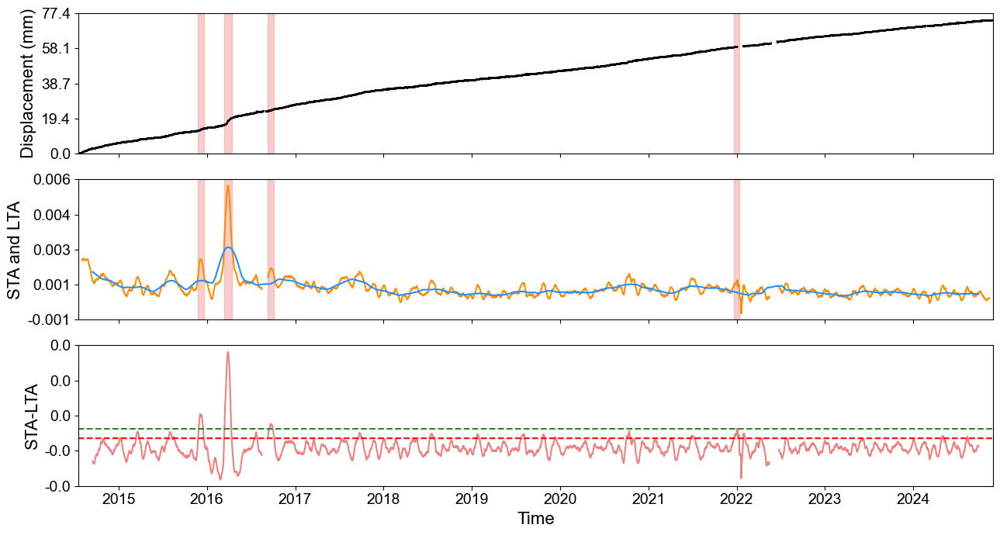

Number of creep bursts: 4


In [16]:
plot_df = JTT3Disp.copy() # load data to look at
# plot_df = JTT2DispLowerZone.copy() # load data to look at

# Plotting
fig, ax = plt.subplots(nrows=3, figsize=(13,7), sharex=True)

# ax.set_xlim(plot_df.index[0], plot_df.index[-1])

# df of start and end of bursts
window = []
previous_d = 0
for i, d in enumerate(plot_df['nBursts']):
    if d != previous_d:
        previous_d = d
        window.append(plot_df[i:i+1].index)
        
idx = np.arange(0, len(window), 2)  # index to slice at even numbers
for start in idx:
    st = [pd.Timestamp(i) for i in window[start]]
    end = [pd.Timestamp(i) for i in window[start+1]]
    ax[0].axvspan(xmin=st[0], xmax=end[0], ymin=0, ymax=1, facecolor='lightcoral', edgecolor='lightcoral', label='Creep burst', zorder=1, alpha=0.4)

# ax_yy.bar(plot_df.index, plot_df['nBursts'], width = 1*10**(-6*4), color='lightcoral', ec='lightcoral', label='Creep burst', alpha=0.4)
# ax[0].plot(plot_df.index, plot_df['2_days_velocity'], color='red', label='2 days velocity')
ax[0].plot(plot_df.index, plot_df.iloc[:,0]-plot_df.iloc[:,0][0], color='black', label='Displacement')

nticks = 5
ax[0].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[0].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
# ax_y.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
# ax_y.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
        
for start in idx:
    st = [pd.Timestamp(i) for i in window[start]]
    end = [pd.Timestamp(i) for i in window[start+1]]
    ax[1].axvspan(xmin=st[0], xmax=end[0], ymin=0, ymax=1, facecolor='lightcoral', edgecolor='lightcoral', label='Creep burst', zorder=1, alpha=0.4)

ax[1].plot(plot_df.index, plot_df['sta'], color='darkorange', label='STA') # linestyle = (0,(5, 10))
ax[1].plot(plot_df.index, plot_df['lta'], color='dodgerblue', label='LTA' )

nticks = 5
ax[1].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[1].yaxis.set_major_formatter(FormatStrFormatter('%.3f'))

# for start in idx:
#     st = [pd.Timestamp(i) for i in window[start]]
#     end = [pd.Timestamp(i) for i in window[start+1]]
#     ax[2].axvspan(xmin=st[0], xmax=end[0], ymin=0, ymax=1, facecolor='lightcoral', edgecolor='lightcoral', label='Creep burst', zorder=1, alpha=0.4)
ax[2].plot(plot_df.index, plot_df['sta-lta'], color='lightcoral', label='STA-LTA' ) # linestyle = (0,(5, 1))
ax[2].plot(plot_df.index, plot_df['trigger'], color='forestgreen', linestyle='--',label=r'mean LTA + 1.5$ \times \sigma$') # trigger
ax[2].plot(plot_df.index, plot_df['detrigger'], color='red', linestyle='--',label=r'mean LTA + 0.75$ \times \sigma$') # detrigger
# ax[2].axhline(threshold[0], color='forestgreen', linestyle='--',label='mean + 2$\sigma$') # trigger
# ax[2].axhline(threshold[1], color='red', linestyle='--',label='mean + $\sigma$') # detrigger

# ax[2].set_ylim(0,400)

nticks = 5
ax[2].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[2].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

# ax[0].set_ylabel('Velocity (mm/h)')
ax[0].set_ylabel('Displacement (mm)')
ax[1].set_ylabel('STA and LTA')
ax[2].set_ylabel('STA-LTA')
ax[2].set_xlabel('Time')

# generate legend

### THIS NEEDS A FIX ###

# to solve many creep burst legends
def unique(list1):
    unique_list = []
    for x in list1:
        if x not in unique_list:
            unique_list.append(x)
    return unique_list

# # setting position of legend
# loc = 'lower right'
# bbox = (1.3, .15)

# lines, labels = ax[0].get_legend_handles_labels()
# lines = unique(lines)
# labels = unique(labels)
# ax[0].legend(lines, labels, loc=loc, bbox_to_anchor=bbox)

# lines, labels = ax[1].get_legend_handles_labels()
# lines = unique(lines)
# labels = unique(labels)
# ax[1].legend(lines, labels, loc=loc, bbox_to_anchor=bbox)

# lines, labels = ax[2].get_legend_handles_labels()
# lines = unique(lines)
# labels = unique(labels)
# ax[2].legend(lines, labels, loc=loc, bbox_to_anchor=bbox)

# ax_y.set_ylim(0, max(ax_y.get_ylim()))
# yabs_max = abs(max(ax[0].get_ylim(), key=abs))
# ax[0].set_ylim(ymin=-yabs_max, ymax=yabs_max)

ax[0].set_ylim(0, max(ax[0].get_ylim()))
ax[2].set_xlim(plot_df.index[0],plot_df.index[-1]) # remove space on each side of x-axis apearing when using sharex=True
fig.tight_layout()
plt.show()

# number of creep bursts
print(f'Number of creep bursts: {len(idx)}')

# # # saving
# path = 'plots\\'
# save_name = f'{path}STA_LTA_filt_entire_STA4LTA60days_Static.png'
# fig.savefig(save_name, dpi=300, bbox_inches='tight')

## WP correlations to creep burst

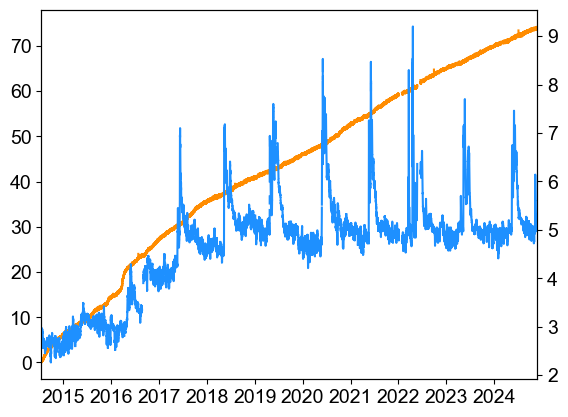

In [147]:
# WP

watermodule = 'Mod4_Water pressure [m]:' # meters above module

# watermodule = 'Mod4_Water pressure in shear zone [kPa]:'  # pressure in shear zone

# JTT1
label = 'JTT-1'
file2 = JTT1Disp.copy()
# data = '32_days_velocity'
data = 'Disp_summed [mm]:'
file3 = JTT1Wp.copy()

# JTT2 upper
label = 'JTT-2 upper'
file2 = JTT2DispUpperZone.copy()
# data = '32_days_velocity'
data = 'Disp_summed [mm]:'
file3 = JTT2WpUpperZone.copy()

# JTT2 lower
label = 'JTT-2 lower'
file2 = JTT2DispLowerZone.copy()
# data = '32_days_velocity'
data = 'Disp_summed [mm]:'
file3 = JTT2WpLowerZone.copy()

# JTT3
label = 'JTT-3'
file2 = JTT3Disp.copy()
# data = '32_days_velocity'
data = 'Disp_summed [mm]:'
file3 = JTT3Wp.copy()

fig, ax = plt.subplots()
ax.plot(file2.index, file2.loc[:,data], color='darkorange')
axy = ax.twinx()
axy.plot(file3.index, file3.loc[:,watermodule], color='dodgerblue')

In [151]:
96-9

87

In [205]:
# Displacement borhole, GPS disp, gw, and seismic

# looking at creep bursts 

f=0 # counting event number
path = 'plots\\'

from matplotlib.dates import DateFormatter
from matplotlib.backends.backend_pdf import PdfPages

# WP
# watermodule = 'Mod4_Water pressure in shear zone [kPa]:'  # pressure in shear zone
watermodule = 'Mod4_Water pressure [m]:' 
watermodule_temp = 'Mod4_Temperature [°C]:'

# JTT1
label = 'JTT-1'
file = JTT1Disp_creep.copy()
file2 = JTT1Disp.copy()
# data = '32_days_velocity'
data = 'Disp_summed [mm]:'
file3 = JTT1Wp.copy()

# # JTT2 upper
# label = 'JTT-2 upper'
# file = JTT2DispUpperZone_creep.copy()
# file2 = JTT2DispUpperZone.copy()
# # data = '32_days_velocity'
# data = 'Disp_summed [mm]:'
# file3 = JTT2WpUpperZone.copy()

# # JTT2 lower
# label = 'JTT-2 lower'
# file = JTT2DispLowerZone_creep.copy()
# file2 = JTT2DispLowerZone.copy()
# # data = '32_days_velocity'
# data = 'Disp_summed [mm]:'
# file3 = JTT2WpLowerZone.copy()

# # JTT3
# label = 'JTT-3'
# file = JTT3Disp_creep.copy()
# file2 = JTT3Disp.copy()
# # data = '32_days_velocity'
# data = 'Disp_summed [mm]:'
# file3 = JTT3Wp.copy()



# #### timing for geophone borehole data ####

# save_name = 'singleevents'

# start_time = file2.index[0] # start when the data starts
# end_time = file2.index[-1]

# df =  file.copy()
# df.set_index('date_start', inplace=True)
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.reset_index(inplace=True)
# file = df.copy()

# df =  file2.copy()
# # df.set_index('Date:', inplace=True)
# df =  df[df.index.slice_indexer(start_time,end_time)]
# # df.reset_index(inplace=True)
# file2 = df.copy()

# df =  file3.copy()
# # df.set_index('Date:', inplace=True)
# df =  df[df.index.slice_indexer(start_time,end_time)]
# # df.reset_index(inplace=True)
# file3 = df.copy()
# ####


data1 = data # quick fix for the for loop as both bh and gps has data as variable in the loop

save_name = 'singleevents'

# plotting

ncols = 1
nrows = 3
with PdfPages(f'{path}{label}_{save_name}.pdf') as pdf: # savename
    for i,d in enumerate(file['event'].unique()): # modules
        fig, ax = plt.subplots(nrows, ncols,figsize=(15, 12), sharex=True)
        # data before and after event
        window_hours = 24*7*2 # hours before and after creep burst * days * weeks
        window = pd.Timedelta(window_hours, unit='h')
        file.reset_index(inplace=True, drop=True) # making sure index is correct due to time slicing

        time_idx_event = pd.date_range(file['date_start'][i], periods=len(file['date'][i].values), freq='h') # for creep burst
        time_idx_event_pluss_disp = pd.date_range(file['date_start'][i]-window, periods=len(file['date'][i].values)+window_hours*2, freq='h') # for plotting of additional data

        # plot x-axis with date        
        disp = file2.loc[time_idx_event_pluss_disp, data1]
        disp = disp[disp.first_valid_index():]
        creep = file2.loc[time_idx_event, data1]
        creep = creep[creep.first_valid_index():]
        water = file3.loc[time_idx_event_pluss_disp, watermodule]
        water = water[water.first_valid_index():]
        water_temp = file3.loc[time_idx_event_pluss_disp, watermodule_temp]
        water_temp = water_temp[water_temp.first_valid_index():]

        ax[0].plot(disp.index, disp.values-np.nanmin(disp.values), color='black', label='Displacement', alpha=0.8)
        ax[0].plot(creep.index, creep.values-np.nanmin(disp.values), color='crimson', label='Creep burst')
        ax[1].plot(water.index, water.values-np.nanmin(water.values), color='dodgerblue', label='Water pressure', alpha=0.8)
        ax_y = ax[1].twinx()
        ax_y.plot(water_temp.index, water_temp.values, color='red', label='Water temperature', alpha=0.8)

        # GPS data
        ax_y1 = ax[2]

        # time of events set so can subsample 
        start_time = time_idx_event_pluss_disp[0]
        end_time = time_idx_event_pluss_disp[-1]

        data = '2d'

        df =  jett_gps3[data]
        df =  df[df.index.slice_indexer(start_time,end_time)]
        df.index = pd.to_datetime(df.index)
        df1 = df.copy()

        df =  jett_gps5[data]
        df =  df[df.index.slice_indexer(start_time,end_time)]
        df.index = pd.to_datetime(df.index)
        df2 = df.copy()

        df =  jett_gps8[data]
        df =  df[df.index.slice_indexer(start_time,end_time)]
        df.index = pd.to_datetime(df.index)
        df3 = df.copy()

        
        if label in ('JTT-1'): #,'JTT-2 upper','JTT-2 lower', 'JTT-3'):
            if not df2.empty: # only plots if data in df
                ax[2].plot(df2.index, df2-df2.iloc[0], color='purple', label='GPS-5')
        if label in ('JTT-2 upper','JTT-2 lower'):
            if not df1.empty: # only plots if data in df
                ax[2].plot(df1.index, df1-df1.iloc[0], color='purple', label='GPS-3')
        if label in ('JTT-3'):
            if not df3.empty: # only plots if data in df
                ax[2].plot(df3.index, df3-df3.iloc[0], color='purple', label='GPS-8')
        
        # setting y-axis limits
        ymin, ymax = ax[0].get_ylim()
        ax[0].set_ylim(0, ymax)
        ymin, ymax = ax[1].get_ylim()
        ax[1].set_ylim(ymin, ymax)

        # generate legend
        ax[0].legend(loc='upper left')
        ax[1].legend(loc='upper left')
        ax[2].legend(loc='upper left')

        # removing tick labels from the xaxis
        n = 2  # keeps every n row
        [l.set_visible(False) for (i,l) in enumerate(ax[2].xaxis.get_ticklabels()) if i % n != 0]

        eventnumber = d
        fig.suptitle(f'{label} burst {eventnumber}')
        ax[2].set_xlabel('Time (days)')
        ax[0].set_ylabel('Displacement (mm)')
        ax[1].set_ylabel('Water pressure (m)')
        ax_y.set_ylabel('Water temperature (deg C)')
        ax[2].set_ylabel('Displacemnet (mm)')
        
        fig.tight_layout()
        pdf.savefig(fig)  # saves the current figure into a pdf page
        plt.close() # comment to see plots

## Table with percentage of bursts per season and wp correlation

In [215]:
JTT1Disp_creep.head()

,event,date_start,date_end,duration,date,displacement_start,displacement,total_slip_distance,max_velocity,duration_days,nEvents
0,0,2013-10-09 06:00:00,2013-11-02 19:00:00,589.0,"Index([ 0.0, 1.0, 2.0, 3.0, 4.0, 5....",4.976670,"[0.0, 0.10491672843841204, 0.10766736755678608...",1.376680,0.070386,24.0,1
1,1,2014-09-25 00:00:00,2014-10-20 20:00:00,620.0,"Index([ 0.0, 1.0, 2.0, 3.0, 4.0, 5....",10.413780,"[0.0, -0.04145375966340836, -0.004033422008907...",1.273169,0.056933,25.0,1
2,2,2017-02-20 23:00:00,2017-03-07 16:00:00,353.0,"Index([ 0.0, 1.0, 2.0, 3.0, 4.0, 5....",19.660218,"[0.0, 0.03929247966514282, 0.01401776472851068...",0.621486,0.025968,14.0,1
3,3,2020-03-30 01:00:00,2020-04-22 23:00:00,574.0,"Index([ 0.0, 1.0, 2.0, 3.0, 4.0, 5....",35.403191,"[0.0, -0.037952184208933204, -0.03280365635525...",0.602197,0.050072,23.0,1
4,4,2022-06-05 13:00:00,2022-07-02 10:00:00,645.0,"Index([ 0.0, 1.0, 2.0, 3.0, 4.0, 5....",55.591135,"[0.0, -0.011771186161716685, -0.01962095861846...",2.466342,0.090790,26.0,1


In [540]:
# writing table to text file
bh_list = [JTT1Disp_creep, JTT2DispUpperZone_creep, JTT2DispLowerZone_creep , JTT3Disp_creep]
bh_name=['JTT-1','JTT-2 upper','JTT-2 lower','JTT-3']
df_list =[]
for i,d in enumerate(bh_list):
    df = d[['event','date_start', 'date_end', 'total_slip_distance', 'duration_days', 'max_velocity']]
    df = df.rename(columns={'event': f'{bh_name[i]}_event'})
    df_list.append(df)
df = pd.concat(df_list)
df = pd.DataFrame(df)
cols = df.columns.tolist()
cols = cols[1:3] + cols[:1] + cols[6:] + cols[3:6]
df = df[cols]

df = df.sort_values(by=['date_start'], ascending=True)
df.reset_index(drop=True, inplace=True)
# writing to text file
df.to_csv('table_data.txt', sep='\t', index=False, header=True)
df

,date_start,date_end,JTT-1_event,JTT-2 upper_event,JTT-2 lower_event,JTT-3_event,total_slip_distance,duration_days,max_velocity
0,2013-10-09 06:00:00,2013-11-02 19:00:00,0.0,NaN,NaN,NaN,1.376680,24.0,0.070386
1,2014-09-25 00:00:00,2014-10-20 20:00:00,1.0,NaN,NaN,NaN,1.273169,25.0,0.056933
2,2014-11-19 06:00:00,2014-12-07 21:00:00,NaN,NaN,0.0,NaN,0.516381,18.0,0.033301
3,2015-04-15 07:00:00,2015-05-02 07:00:00,NaN,NaN,1.0,NaN,0.447281,17.0,0.028306
4,2015-11-26 00:00:00,2015-12-19 05:00:00,NaN,NaN,NaN,0.0,1.150642,23.0,0.054279
5,2015-11-26 16:00:00,2015-12-18 12:00:00,NaN,NaN,2.0,NaN,0.439110,21.0,0.025836
6,2016-01-18 17:00:00,2016-01-29 23:00:00,NaN,NaN,3.0,NaN,0.087577,11.0,0.024041
7,2016-03-07 20:00:00,2016-03-20 05:00:00,NaN,NaN,4.0,NaN,0.463380,12.0,0.021643
8,2016-03-12 10:00:00,2016-04-12 17:00:00,NaN,NaN,NaN,1.0,4.078959,31.0,0.141482
9,2016-08-11 23:00:00,2016-09-01 07:00:00,NaN,0.0,NaN,NaN,0.731433,20.0,0.034759


In [550]:
col = 'max_velocity'
print('max:',df.loc[:,col].max())
print('min:',df.loc[:,col].min())
print('median:',df.loc[:,col].median())

max: 0.14148201648983616
min: 0.017038288951307903
median: 0.03862303749161075


In [242]:
# seasons
spring = [3,4,5] # march-may
summer = [6,7,8] # june-august
autumn = [9,10,11] # september-november
winter = [1,2,12] # december-february

# concatinating all the creep bursts
bh_list = [JTT1Disp_creep, JTT2DispUpperZone_creep, JTT2DispLowerZone_creep , JTT3Disp_creep]
df_list =[]
for i,d in enumerate(bh_list):
    df = d[['date_start']] # getting information
    df_list.append(df)
df = pd.concat(df_list)
df = pd.DataFrame(df)
df['month'] = df['date_start'].dt.month # adding months of year
df.sort_values(by='date_start', ascending=True, inplace = True) # get dates by ascending order
df.reset_index(inplace=True, drop=True)
df['events'] = 1 # get number of events
col1 = df.groupby(df['month'])['events'].sum().reindex(range(1, 13), fill_value=0) # events per month and 0 value for months wihtout bursts
total = col1.sum()
a = col1.loc[col1.index.isin(spring)].sum()
b = col1.loc[col1.index.isin(summer)].sum()
c = col1.loc[col1.index.isin(autumn)].sum()
d = col1.loc[col1.index.isin(winter)].sum()
data = {'Season': ['spring', 'summer','autumn','winter'], 'number of events': [a,b,c,d]}
table = pd.DataFrame(data=data)

# then percentage of them that correlated visually with water pressure change, see table and verify that the table is correct
df['corr_water'] = 0 # get number of events corr with water
rows_cor = [8,12,16,18,19,21,23,27,28,29]  # when correlating, visual correlation
df.loc[rows_cor,'corr_water'] = 1 
col2 = df.groupby(df['month'])['corr_water'].sum() # events per month
a = col2.loc[col2.index.isin(spring)].sum()
b = col2.loc[col2.index.isin(summer)].sum()
c = col2.loc[col2.index.isin(autumn)].sum()
d = col2.loc[col2.index.isin(winter)].sum()
table['number of events correlated to water pressure'] = [a,b,c,d]

table['% of events'] = table['number of events']/total*100 # percentage of events per month
table['% of events correlated to waterpressure'] = table.iloc[:,2]/table.iloc[:,1]*100 # percent of events per season correlated to wp
table.to_csv('summary_creepburst.txt', sep='\t', index=False, header=True)

# table.loc[len(table.index)] = ['All', table.iloc[:,1].sum(), table.iloc[:,2].sum(), table.iloc[:,3].sum(), table.iloc[:,4].sum()] # adding total row to check the sum of each column
table

,Season,number of events,number of events correlated to water pressure,% of events,% of events correlated to waterpressure
0,spring,9,5,27.272727,55.555556
1,summer,8,5,24.242424,62.500000
2,autumn,8,0,24.242424,0.000000
3,winter,8,0,24.242424,0.000000


In [329]:
# statistics on creep bursts versus entire landslide

bh_list = [JTT1Disp_creep, JTT2DispUpperZone_creep, JTT2DispLowerZone_creep , JTT3Disp_creep]
bh_list2 = [JTT1Disp, JTT2DispUpperZone, JTT2DispLowerZone , JTT3Disp]
bh_name=['JTT-1','JTT-2 upper','JTT-2 lower','JTT-3']

df_list =[]
reg_res = []
velocity_burst = []
reg_res2 = []
total_slip_creep= []

# time series length
start_time = '2013-01-01' # entire dataset currently!
end_time = '2025-01-01'
# end_time = '2023-03-28'
# need to slice time on time column..
for i,d in enumerate(bh_list): # to only look at some boreholes [-4:]
    file = d[(d['date_start'] >= start_time) & (d['date_end'] <= end_time)]
    total_slip_creep.append(file['total_slip_distance'].sum()) # summing all bursts for each bh
    
    for i in file['event']:
        time_idx_event = pd.date_range(file['date_start'][i], periods=len(file['date'][i].values), freq='h')
        disp_event = file['displacement'][i]
        df = pd.DataFrame(disp_event, columns=['displacement'],index=time_idx_event)
        df.reset_index(inplace=True, drop=True)
        df.dropna(inplace=True)

        # model
        x = df.index.values.reshape(-1, 1)
        y = df.values
        model = LinearRegression() #initiate linear regression model
        model.fit(x, y) #fit regression model

        reg_res += [(model.coef_[0][0], model.intercept_[0], model.score(x, y))]  # returns index and slope, intercept and rsquared

    #     # see that it works
    #     fig, ax = plt.subplots(figsize=(13,7))
    #     x_vals = df.index # np.linspace(0,len(KH0206Disp.index),num=len(KH0206Disp.index)+1, endpoint=True) # KH0206Disp.index
    #     y_vals = np.float(model.intercept_) + np.float(model.coef_)* x_vals
    #     ax.plot(df.index, df.displacement, color='darkorange', label='KH0206')
    #     ax.plot(x_vals, y_vals, color='red', linestyle='--')
    #     fig.tight_layout()
    #     plt.show()
    #     # # # saving
    #     path = 'plots\\'
    #     eventnumber = i
    #     save_name = f'{path}creep_events_slope{eventnumber}.png'
    #     fig.savefig(save_name, dpi=300, bbox_inches='tight')

    results_regression = pd.DataFrame(reg_res)
    results_regression.columns = ['velocity/slope', 'intercept', 'r^2']

    median_burstvel = results_regression['velocity/slope'].median()
    velocity_burst.append(median_burstvel) # saving data

velocity_slide = []
total_slip_landslide = []

for i,d in enumerate(bh_list2):
    file2 = d[(d.index >= start_time) & (d.index <= end_time)]
    total_slip_landslide.append(file2['Disp_summed [mm]:'].iloc[-1])
    file2.reset_index(inplace=True)
    df = file2['Disp_summed [mm]:']
    df = df.dropna().copy()
    x = df.index.values.reshape(-1, 1)
    y = df.values
    model = LinearRegression() #initiate linear regression model
    model.fit(x, y) #fit regression model
    reg_res2 += [(model.coef_[0], model.intercept_, model.score(x, y))]  # returns index and slope, intercept and rsquared
    slidevel = model.coef_[0].astype(float) # velocity from linear fit and slope
    velocity_slide.append(slidevel) # saving data
    
velocity_table = pd.DataFrame(list(zip(bh_name, velocity_burst, velocity_slide, (np.float_(total_slip_creep)/np.float_(total_slip_landslide))*100)),columns = ['Borehole', 'Avg_vel_creepburst [mm/day]', 'Avg_vel_slide [mm/day]', '% slip from creepburst'])
velocity_table.head(10)

,Borehole,Avg_vel_creepburst [mm/day],Avg_vel_slide [mm/day],% slip from creepburst
0,JTT-1,0.003832,0.000939,13.782613
1,JTT-2 upper,0.002693,0.000491,21.849788
2,JTT-2 lower,0.001761,0.000491,11.000616
3,JTT-3,0.001845,0.000778,9.573395


In [331]:
# stats on amount of disp from creep burst
print('median: ', velocity_table['% slip from creepburst'].median())
print('min: ', velocity_table['% slip from creepburst'].min())
print('max: ', velocity_table['% slip from creepburst'].max())

median:  12.391614426497412
min:  9.573395356138334
max:  21.849788020788065


In [45]:
# total slip
print(JTT1Disp['Disp_summed [mm]:'].iloc[-1], JTT2DispUpperZone['Disp_summed [mm]:'].iloc[-1], JTT2DispLowerZone['Disp_summed [mm]:'].iloc[-1], JTT3Disp['Disp_summed [mm]:'].iloc[-1])

117.16548966412965 45.094328567774 46.228532780210884 73.98702412698442


# Strain plot

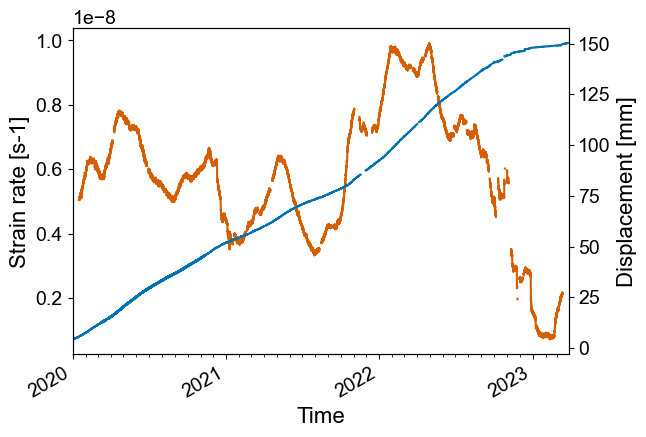

In [30]:
# Fabian helped me solve this
bh_data = [] # empty df

days = 30 # montly to see seasonal variations
hours = 24
time_window = days*hours # rows, and 1 row is 1 hour

time_step = time_window//2
strain = []
bh_data = KH0118Disp.copy()
itr = range(len(bh_data.iloc[:,0])) # loop through all rows
for i in itr:
    if i < time_step:
        strain.append(np.nan) # adds nan for the first missing values due to time window
    if i > time_step-1:
        H = 250.0 # initial length, thickness of shear zone
        L = bh_data.iloc[i+time_step,0]-bh_data.iloc[i-time_step,0] # diff disp
        time = (bh_data.index[i+time_step]-bh_data.index[i-time_step]).total_seconds() # time per time window
        strain.append(L/(H*time)) # strain rate in seconds
        if i == itr[-(time_step+1)]: # stoping loop and adding nans due to time window
            for n in range(time_step):
                strain.append(np.nan) 
            break
            
# plot data
bh_data['strain [s-1]:'] = strain

fig, ax = plt.subplots()

ax.plot(bh_data.index, bh_data['strain [s-1]:'], color=colors[1])
ax_y = ax.twinx()
ax_y.plot(bh_data.index, bh_data.iloc[:,0], color=colors[2])

ax.set_ylabel('Strain rate [s-1]')
ax_y.set_ylabel('Displacement [mm]')
ax.set_xlabel('Time')

# Ensure the first year is included
start_year = bh_data.index.min().year
end_year = bh_data.index.max()
ax.set_xlim(mdates.date2num([f'{start_year}-01-01', f'{end_year}']))

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax.xaxis.set_minor_locator(months)
# Apply the year format for the major ticks again
ax.xaxis.set_major_formatter(years_fmt)

# Rotate and align the tick labels so they look better
fig.autofmt_xdate().

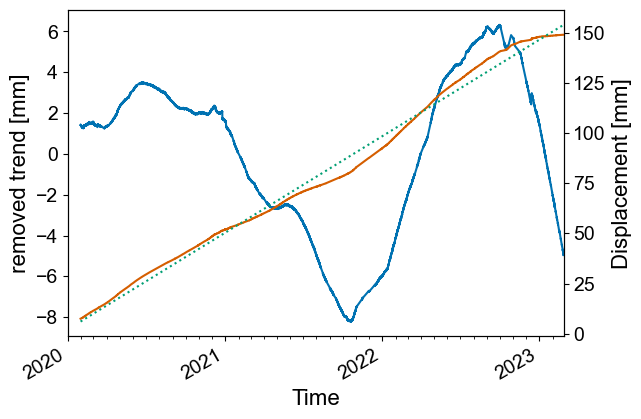

In [35]:
# Perform the linear fit
from scipy.stats import linregress

# Ensure there are no NaNs in the dataset
bh_data = bh_data.dropna()

# Convert dates to numerical format for fitting
x = mdates.date2num(bh_data.index)
y = bh_data.iloc[:,0]

# Perform robust linear fit using scipy's linregress
slope, intercept, r_value, p_value, std_err = linregress(x, y)

# Calculate fitted values
y_fit = intercept + slope * x

trend_removed = y-y_fit
bh_data['trend_removed'] = trend_removed

fig, ax = plt.subplots()

ax.plot(bh_data.index, bh_data['trend_removed'], color=colors[2])
ax_y = ax.twinx()
ax_y.plot(bh_data.index, bh_data.iloc[:,0], color=colors[1])
ax_y.plot(y.index, y_fit, color=colors[4], linestyle='dotted')

ax.set_ylabel('removed trend [mm]')
ax_y.set_ylabel('Displacement [mm]')
ax.set_xlabel('Time')

# Ensure the first year is included
start_year = bh_data.index.min().year
end_year = bh_data.index.max()
ax.set_xlim(mdates.date2num([f'{start_year}-01-01', f'{end_year}']))

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax.xaxis.set_minor_locator(months)
# Apply the year format for the major ticks again
ax.xaxis.set_major_formatter(years_fmt)

# Rotate and align the tick labels so they look better
fig.autofmt_xdate()

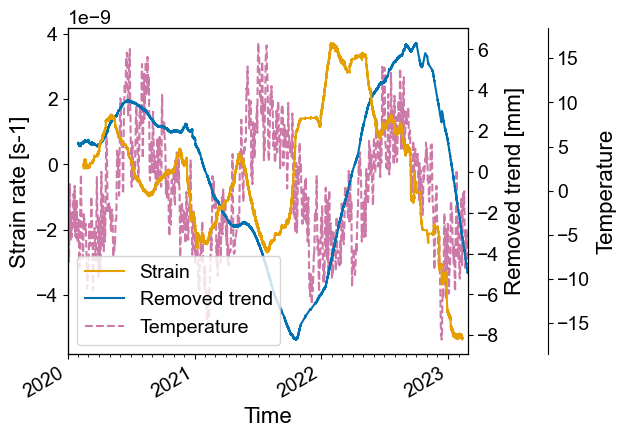

In [88]:
# Fabian helped me solve this

days = 30 # montly to see seasonal variations
hours = 24
time_window = days*hours # rows, and 1 row is 1 hour

time_step = time_window//2
strain = []
df = bh_data['trend_removed']
df = df.to_frame()
itr = range(len(df.iloc[:,0])) # loop through all rows
for i in itr:
    if i < time_step:
        strain.append(np.nan) # adds nan for the first missing values due to time window
    if i > time_step-1:
        H = 250.0 # initial length, thickness of shear zone
        L = df.iloc[i+time_step,0]-df.iloc[i-time_step,0] # diff disp
        time = (df.index[i+time_step]-df.index[i-time_step]).total_seconds() # time per time window
        strain.append(L/(H*time)) # strain rate in seconds
        if i == itr[-(time_step+1)]: # stoping loop and adding nans due to time window
            for n in range(time_step):
                strain.append(np.nan) 
            break
            
# plot data
bh_data['strain [s-1]:'] = strain

fig, ax = plt.subplots()

ax_y = ax.twinx()
ax_yy = ax.twinx()
ax_yy.spines.right.set_position(("axes", 1.2))

line1 = ax.plot(bh_data.index, bh_data['strain [s-1]:'], color=colors[6],  zorder=4, label='Strain')
line2 = ax_y.plot(bh_data.index, bh_data['trend_removed'], color=colors[2], zorder=3, label='Removed trend')

# adding temperature to the plot
start_time = '2020-01-01'
end_time = '2023-03-28'
temp_sub =  temp[temp.index.slice_indexer(start_time,end_time)]
line3 = ax_yy.plot(temp_sub.index, temp_sub.iloc[:,0], color=colors[0], linestyle='dashed', zorder=2, label='Temperature')

# Set z-order for axes
ax.set_zorder(3)
ax_y.set_zorder(2)
ax_yy.set_zorder(1)

# Set visibility for the axes
ax.patch.set_visible(False)
ax_y.patch.set_visible(False)
ax_yy.patch.set_visible(False)

# Bring ax to the front
ax.set_frame_on(True)
ax_y.set_frame_on(True)
ax_yy.set_frame_on(True)
fig.subplots_adjust(right=0.75)  # Make room for the third y-axis

# Set labels
ax.set_ylabel('Strain rate [s-1]')
ax_y.set_ylabel('Removed trend [mm]')
ax_yy.set_ylabel('Temperature')
ax.set_xlabel('Time')

# Ensure the first year is included
start_year = bh_data.index.min().year
end_year = bh_data.index.max()
ax.set_xlim(mdates.date2num([f'{start_year}-01-01', f'{end_year}']))

# Major ticks for years
years = mdates.YearLocator()  # Locator for every year
years_fmt = mdates.DateFormatter('%Y')  # Formatter for displaying year
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()  # Locator for every month
months_fmt = mdates.DateFormatter('%b')  # Formatter for displaying month (Jan, Feb, etc.)
ax.xaxis.set_minor_locator(months)
ax.xaxis.set_major_formatter(years_fmt)

# Rotate and align the tick labels so they look better
fig.autofmt_xdate()

# Add legends
handel1, label1 = ax.get_legend_handles_labels()
handel2, label2 = ax_y.get_legend_handles_labels()
handel3, label3 = ax_yy.get_legend_handles_labels()
handels = handel1+handel2+handel3
labels = label1+label2+label3
ax.legend(handels, labels, loc='lower left')

plt.show()

# Figure X, JTT1 climatic parameters on 2022 acceleration

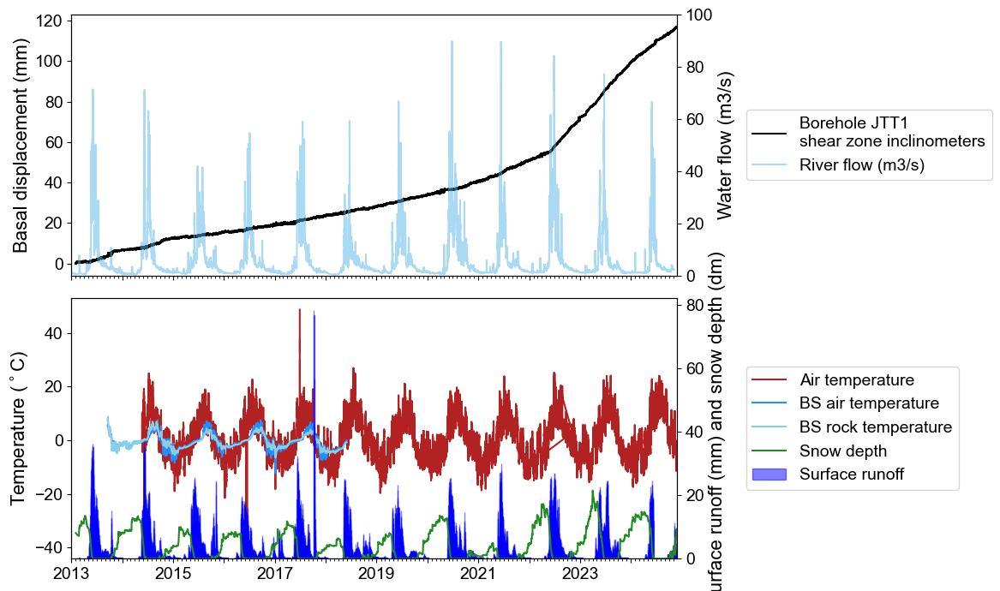

In [333]:
from matplotlib.dates import DateFormatter

# # DATA
start_time = JTT1Disp.index[0]
end_time = JTT1Disp.index[-1]

# water level
n_day = 31 # days # 2 months kernel size for median filter (hourly data)
n_hour = round_up_to_odd(24*n_day) 

# plotting

fig, ax = plt.subplots(nrows=2, figsize=(12,7), sharex=True)
# fig.subplots_adjust(hspace=0) #fig.subplots_adjust(wspace=0) # to remove space on each side of the x-axis

#######                          PLOT 1                           #######
file = []
file2 = [] # to make sure it does not come from previous plot

# JTT1
# file = JTT1Disp_creep.copy()
file2 = JTT1Disp.copy()

# #JTT3
# file = JTT3Disp_creep.copy()
# file2 = JTT3Disp.copy()

# # JTT2 Upper
# file = JTT2DispUpperZone_creep.copy()
# file2 = JTT2DispUpperZone.copy()

# Want this behind
ax_y0 = ax[0].twinx()
file3 = JTT1Wp.copy()
watermodule = 'Mod4_Water pressure [m]:'
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
# file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
file3 = file3[watermodule]
# file3 = file3[file3.first_valid_index():]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
file3 = file3.replace(np.nan,np.inf) # changing nan to inf
# ax_y0.plot(file3.index, file3.values-np.nanmin(file3.values), color=colors[4], label='Water pressure', alpha=0.5) # does not show any change, only 1 m above sensor..

df = river1.copy()
# df.iloc[:,0] = medfilt(df.iloc[:,0], kernel_size=n_day)
ax_y0.plot(df.index, df.iloc[:,0], color=colors[5], label='River flow (m3/s)', alpha=0.5)

# Want this in front
zero_start = file2['Disp_summed [mm]:'][0] # starting from 0
df = file2.copy()
# df.loc[df['interpolated_disp'] >0] = np.inf
ax[0].plot(df.index, df['Disp_summed [mm]:']-zero_start, color='black', label='Borehole JTT1 \nshear zone inclinometers')
# df = file2.copy()
# df.loc[df['interpolated_disp'] ==np.nan] = np.inf
# ax[1].plot(df.index, df['interpolated_disp']-zero_start, color='violet', label='Interpolated displacement')

# # df of start and end of bursts
# window = []
# previous_d = 0
# for i, d in enumerate(file2['nBursts']):
#     if d != previous_d:
#         previous_d = d
#         window.append(file2[i:i+1].index)

# # Convert the list of datetime objects to a NumPy array
# window = np.array([item[0] for item in window])
        
# idx = np.arange(0, len(window), 2)  # index to slice at even numbers
# for start in idx:
#     ax[0].axvspan(window[start], window[start+1], facecolor='lightcoral', edgecolor='lightcoral', label='Creep burst', zorder=3, alpha=0.4)

# df = file2.copy()
# df.loc[df['nBursts'] ==0] = np.nan
# df = df.replace(np.nan,np.inf) # to avoid interpolation between holes in data
# ax[0].plot(df.index, df['Disp_summed [mm]:']-zero_start, color='crimson', label='', zorder=2) # I do not know if we want this coloring?

# # df of missing data
# df = file2['Disp_summed [mm]:'].copy()
# df.loc[df.notna()] = 0
# df.loc[df.isna()] = 1
# window = []
# previous_d = 0
# zero_start = mpl.dates.date2num(df.index[0])

# for i, d in enumerate(df):
#     if d != previous_d:
#         previous_d = d
#         window.append(df[i:i+1].index)

# # Convert the list of datetime objects to a NumPy array
# window = np.array([item[0] for item in window])

# idx = np.arange(0, len(window), 2)  # index to slice at even numbers
# for start in idx[:-1]:
#     if window[start+1]-window[start] > np.timedelta64(1, 'h'): # can change to show only more than n hours..
#         xmin = (mpl.dates.date2num(window[start])-zero_start)/(mpl.dates.date2num(df.index[-1])-zero_start)
#         xmax = (mpl.dates.date2num(window[start+1])-zero_start)/(mpl.dates.date2num(df.index[-1])-zero_start)
#         ax[0].axhspan(ymin=-file2['Disp_summed [mm]:'].max()/40, ymax=0, xmin=xmin, xmax=xmax, facecolor='gray', edgecolor='gray', label='Missing data', zorder=1, alpha=0.4) # zorder = what layer to plot from back to front

# # Cumulated plot, not to be used as of now..
# df = file.copy()
# frames = []
# for i in df.index:
#     cb = pd.DataFrame(index=pd.date_range(file['date_start'][i], periods=len(file['date'][i].values), freq='H'))
#     cb['displacement'] = df.displacement.iloc[i]
#     frames.append(cb)
# cb = pd.concat(frames)
# cb['displacement'] = cb['displacement'].replace(0, np.nan).dropna()
# velocity = cb['displacement'].shift(-1)-cb['displacement']
# cb['cumulated'] = np.nancumsum(velocity) # cumulated creep bursts
# # ax[1].plot(cb.index, cb['cumulated'], color='crimson', label='Cumulated creep bursts')
# df = file2.copy()
# df.loc[df['nBursts'] ==1] = np.nan
# velocity = df['Disp_summed [mm]:'].shift(-1)-df['Disp_summed [mm]:']
# df['cumulated'] = np.nancumsum(velocity) # cumulated disp w/o creep burst
# # ax[1].plot(df.index, df['cumulated'], color='black', label='Displacement w/o bursts')

# cb_of_totaldisp = (cb['cumulated'][-1]/df['cumulated'][-1])*100
# # ax[0].text(pd.Timestamp('2020-02-05'), 90, f'Creep bursts contribute to {cb_of_totaldisp:.1f} % of total displacement' , horizontalalignment='left', size='medium', color='black', fontsize=medium_size)

#######                          PLOT 2                           #######

width = 55/60*1 # n_day # 55 works well for 60 days
# temp_sub =  temp[(temp.index > start_time) & (temp.index < end_time)] # data per day
temp_sub = jtt_temp.copy() #[jtt_temp.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
# temp_sub.iloc[:,0] = medfilt(temp_sub.iloc[:,0], kernel_size=n_day)

ST_sub = ST[ST.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
# ST_sub.iloc[:,0] = medfilt(ST_sub.iloc[:,0], kernel_size=n_day)
# ST_sub.iloc[:,1] = medfilt(ST_sub.iloc[:,1], kernel_size=n_day)

ax[1].plot(temp_sub.index, temp_sub['temperature'], color='firebrick', label='Air temperature')
ax[1].plot(ST_sub.index,ST_sub['ST2'], color='dodgerblue', label='BS air temperature')
ax[1].plot(ST_sub.index,ST_sub['ST3'], color='skyblue', label='BS rock temperature')

# snowrain_melt_sub =  snowrain_melt[(snowrain_melt.index > start_time) & (snowrain_melt.index < end_time)]
surfacerunoff_sub =  xgeo_surfacerunoff[xgeo_surfacerunoff.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
# surfacerunoff_sub = surfacerunoff_sub.resample(f'{n_day}d').sum()
jtt_xgeo_snow_sub = jtt_xgeo_snow[jtt_xgeo_snow.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]

ax_y1 = ax[1].twinx()
ax_y1.bar(dates.date2num(surfacerunoff_sub.index), surfacerunoff_sub['surfacerunoff'], width = width, ec='blue', color='blue', label='Surface runoff', alpha=0.5)
ax_y1.plot(jtt_xgeo_snow_sub.index,jtt_xgeo_snow_sub['depth']/10, color='forestgreen', label='Snow depth')


# set axis labels
ax_y0.set_ylim(0,100)
ax[0].set_ylabel('Basal displacement (mm)')
ax_y0.set_ylabel('Water level change (m)')
ax_y0.set_ylabel('Water flow (m3/s)')
lines, labels = ax[0].get_legend_handles_labels()
# lines = unique(lines)
# labels = unique(labels)
lines2, labels2 = ax_y0.get_legend_handles_labels()
ax[0].legend(lines+lines2, labels+labels2, loc='center left', bbox_to_anchor=(1.1, 0.5))
leg = ax[0].get_legend() # gets legend handels

# ax[1].set_ylabel('mm')
ax[1].set_ylabel('Temperature ($^\circ$C)')
ax_y1.set_ylabel('Surface runoff (mm) and snow depth (dm)')
lines, labels = ax[1].get_legend_handles_labels()
lines2, labels2 = ax_y1.get_legend_handles_labels()
ax[1].legend(lines+lines2, labels+labels2, loc='center left', bbox_to_anchor=(1.1, 0.5))
leg = ax[1].get_legend() # gets legend handels


# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax[1].xaxis.set_major_locator(years)
ax[1].xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax[1].xaxis.set_minor_locator(months)
# Apply the year format for the major ticks again
ax[1].xaxis.set_major_formatter(years_fmt)

# # Rotate and align the tick labels so they look better
# fig.autofmt_xdate()

# removing tick labels from the xaxis
n = 2  # keeps every n row
[l.set_visible(False) for (i,l) in enumerate(ax[1].xaxis.get_ticklabels()) if i % n != 0]

fig.tight_layout()
plt.show()

# saving
path = 'plots/'
save_name = f'{path}Figure_JTT1_2022.png'
fig.savefig(save_name, dpi=600)

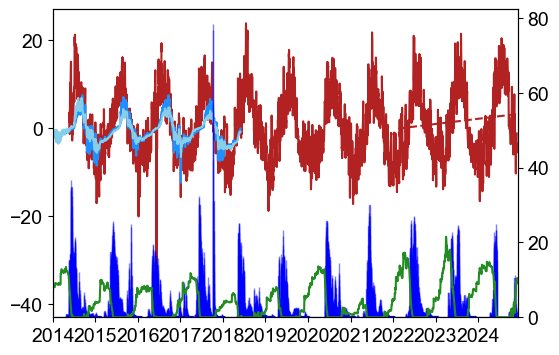

In [672]:
# changing trend in seasons?

fig, ax = plt.subplots(figsize=(6,4))

import statsmodels.api as sm

time = '2014-01-01'
temp_sub = jtt_temp.copy()
temp_sub = temp_sub.resample('1d').median()
temp_sub = temp_sub[temp_sub.index > time] 
ST_sub = ST_sub[ST_sub.index > time]

ax.plot(temp_sub.index, temp_sub['temperature'], color='firebrick', label='Air temperature')
ax.plot(ST_sub.index,ST_sub['ST2'], color='dodgerblue', label='BS air temperature')
ax.plot(ST_sub.index,ST_sub['ST3'], color='skyblue', label='BS rock temperature')

surfacerunoff_sub =   surfacerunoff_sub[surfacerunoff_sub.index > time]
jtt_xgeo_snow_sub = jtt_xgeo_snow[jtt_xgeo_snow.index > time]

ax_y1 = ax.twinx()
ax_y1.bar(dates.date2num(surfacerunoff_sub.index), surfacerunoff_sub['surfacerunoff'], width = width, ec='blue', color='blue', label='Surface runoff (mm)', alpha=0.5)
ax_y1.plot(jtt_xgeo_snow_sub.index,jtt_xgeo_snow_sub['depth']/10, color='forestgreen', label='Snow depth (dm)')

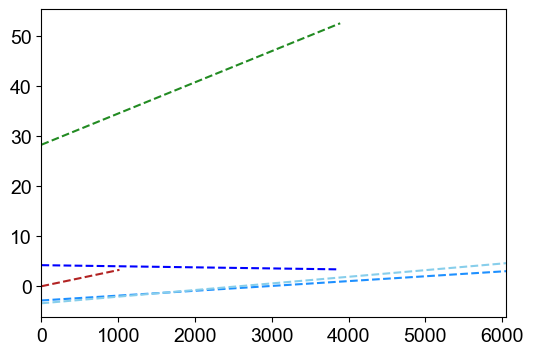

In [674]:
fig, ax = plt.subplots(figsize=(6,4))

data = temp_sub.copy()
data = data.dropna().reset_index()
X = sm.add_constant(np.arange(len(data)))  # Adds a constant term to the predictor
y = data['temperature']
model = sm.OLS(y, X).fit()
data['Predicted'] = model.predict(X)
ax.plot(data['Predicted'], label='Fitted', linestyle='--', color='firebrick')

data = ST_sub.copy()
data = data.dropna().reset_index()
X = sm.add_constant(np.arange(len(data)))  # Adds a constant term to the predictor
y = data['ST2']
model = sm.OLS(y, X).fit()
data['Predicted'] = model.predict(X)
ax.plot(data['Predicted'], label='Fitted', linestyle='--', color='dodgerblue')

data = ST_sub.copy()
data = data.dropna().reset_index()
X = sm.add_constant(np.arange(len(data)))  # Adds a constant term to the predictor
y = data['ST3']
model = sm.OLS(y, X).fit()
data['Predicted'] = model.predict(X)
ax.plot(data['Predicted'], label='Fitted', linestyle='--', color='skyblue')

data = surfacerunoff_sub.copy()
data = data.dropna().reset_index()
X = sm.add_constant(np.arange(len(data)))  # Adds a constant term to the predictor
y = data['surfacerunoff']
model = sm.OLS(y, X).fit()
data['Predicted'] = model.predict(X)
ax.plot(data['Predicted'], label='Fitted', linestyle='--', color='blue')

data = jtt_xgeo_snow_sub.copy()
data = data.dropna().reset_index()
X = sm.add_constant(np.arange(len(data)))  # Adds a constant term to the predictor
y = data['depth']
model = sm.OLS(y, X).fit()
data['Predicted'] = model.predict(X)
ax.plot(data['Predicted'], label='Fitted', linestyle='--', color='forestgreen')

In [678]:
temp_sub.head()

,temperature,precip,year,month,day
datetime,,,,,
2014-05-22,1.580,NaN,2014.0,5.0,22.0
2014-05-23,3.640,NaN,2014.0,5.0,23.0
2014-05-24,2.270,NaN,2014.0,5.0,24.0
2014-05-25,-1.285,NaN,2014.0,5.0,25.0
2014-05-26,-0.130,NaN,2014.0,5.0,26.0


In [680]:
data.head()

,datetime,depth,year,month,day,Predicted
0,2014-01-01 06:00:00,82.7,2014,1,1,28.296368
1,2014-01-02 06:00:00,82.2,2014,1,2,28.302615
2,2014-01-03 06:00:00,81.6,2014,1,3,28.308862
3,2014-01-04 06:00:00,81.0,2014,1,4,28.315110
4,2014-01-05 06:00:00,82.6,2014,1,5,28.321357


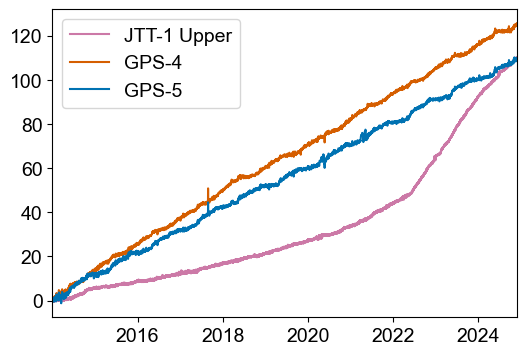

In [611]:
fig, ax = plt.subplots(figsize=(6,4))

time = '2014-01-01'

x = JTT1Disp.iloc[:,0]
# x = JTT2DispUpperZone.iloc[:,0]
y = jett_gps4.iloc[:,3]
# z = jett_gps2.iloc[:,3]
z = jett_gps5.iloc[:,3]

x = x[x.index > time]
y = y[y.index > time]
z = z[z.index > time]

x = x - x[0] 
y = y - y[0]
z = z - z[0]

ax.plot(x.index, x.values, color=colors[0], label='JTT-1 Upper')
ax.plot(y.index, y.values, color=colors[1], label='GPS-4')
ax.plot(z.index, z.values, color=colors[2], label='GPS-5')
# ax.plot(z.index, z.values, color=colors[1], label='GPS-2')
# ax.plot(y.index, y.values, color=colors[2], label='GPS-3')

plt.legend()

ax.xaxis.set_major_locator(mdates.YearLocator(base=2))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

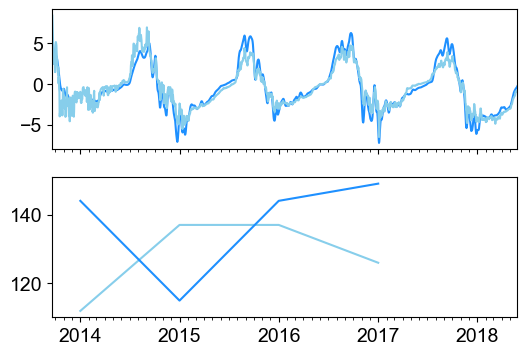

In [586]:
from scipy.signal import savgol_filter
def clean_filt(file, col=0): # colnmbr is the column chosen to filter
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    file['interpolated'] = file.iloc[:,col].interpolate(method='linear', limit_direction ='forward')
    file['savgol'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    return file

# median filter window
window_median = 15 # 7 might be okay and 29 is smooth, tried with 15 as a middle way to keep temp stationary

# rolling mean filter window
window_mean = 7 # 7 is enough to keep temp stationary

# savgol parameters
window_size = 11
poly_order = 3


interval = '1D' # choose between 1D, 1W, 1M


# cleaned data
def clean_df(df,start_time,end_time, interval):
    df = df[df.index.slice_indexer(start_time,end_time)]
    for i, col in enumerate(df.columns):
        df.loc[:,col] = clean_filt(df.loc[:,col]).values # filtered data
        # df.loc[:,col] = medfilt(df.loc[:,col], window_median) # median filter
        df.loc[:, col] = df.loc[:, col].rolling(window=window_mean, center=True).mean() # rolling mean
        df = df.resample(interval).median() # downsampling with median value after cleaning
        df.dropna(inplace=True)
    return df

df = ST.iloc[:,0:2]
df.dropna(inplace=True)
df = clean_df(df, df.index[0],ST.index[-1], interval)

fig, (ax1,ax2) = plt.subplots(2,1, figsize=(6,4), sharex=True)
ax1.plot(df.index,df['ST2'], color='dodgerblue', label='BS air temperature')
ax1.plot(df.index,df['ST3'], color='skyblue', label='BS rock temperature')
df = ST.copy()
df = df.resample('D').mean()
df = df[df['ST2'] > 0].groupby('year').size()
df = df[df.index > 2013]
df.index = pd.to_datetime(df.index, format='%Y')
ax2.plot(df.index,df.values, color='skyblue', label='BS rock temperature')
df = ST.copy()
df = df.resample('D').mean()
df = df[df['ST3'] > 0].groupby('year').size()
df = df[df.index > 2013]
df.index = pd.to_datetime(df.index, format='%Y')
ax2.plot(df.index,df.values, color='dodgerblue', label='BS air temperature')
# plt.legend()

# ax.axhline(y=df['ST2'].max(), color='black', linestyle='--')
# ax.axhline(y=df['ST2'].min(), color='black', linestyle='--')
# ax.axhline(y=df['ST3'].max(), color='gray', linestyle='--')
# ax.axhline(y=df['ST3'].min(), color='gray', linestyle='--')

ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y')) # -%m-%d
ax1.xaxis.set_minor_locator(mdates.MonthLocator())


In [26]:
JT_CLM_1_2.head()

,TJ_10: JT_CLM_002,TJ_5: JT_CLM_001_002,year,month,day
datetime,,,,,
2007-10-09 13:00:00,NaN,-0.6,2007,10,9
2007-10-09 14:00:00,NaN,-0.6,2007,10,9
2007-10-09 15:00:00,NaN,-0.6,2007,10,9
2007-10-09 16:00:00,NaN,-0.6,2007,10,9
2007-10-09 17:00:00,NaN,-0.6,2007,10,9


([<matplotlib.axis.XTick at 0x2a4cca22410>,
 [Text(18993.0, 0, '2022-01-01'),
  Text(19358.0, 0, '2023-01-01'),
  Text(19723.0, 0, '2024-01-01')])

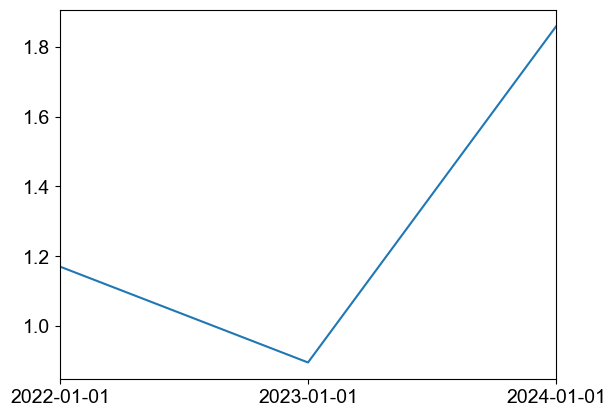

In [127]:
# JT_CLM_1_2.iloc[:,1].plot()
test = JT_CLM_1_2.iloc[:,1:3].copy()
test = test.loc[test['year'] > 2021]
# test.iloc[:,0].plot()

df = JT_CLM_1_2.copy()
df = df.resample('D').mean() # mean is probably best to capture the variation and find out if it is relativley colder or warmer years
# permafrost index
days_above_zero = df[df.iloc[:,1] > 0].groupby('year').size()
days_below_zero = df[df.iloc[:,1] < 0].groupby('year').size()
# Ensure all years are represented (fill missing years with 0)
all_years = pd.DataFrame({'year': df['year'].unique()})
days_above_zero = all_years.merge(days_above_zero.rename('days_above_zero'), on='year', how='left').fillna(0)
days_below_zero = all_years.merge(days_below_zero.rename('days_below_zero'), on='year', how='left').fillna(0)
# Merge the counts
yearly_counts = pd.merge(days_above_zero, days_below_zero, on='year')
# Calculate permafrost index (days_above_zero / days_below_zero)
yearly_counts['freeze_index'] = yearly_counts['days_above_zero'] / (
    yearly_counts['days_below_zero'] + np.finfo(float).eps  # Avoid division by zero
)
days_freeze_year = yearly_counts.loc[yearly_counts['year'] > 2021]

days_freeze_year.loc[:,'year'] = pd.to_datetime(days_freeze_year['year'], format='%Y')
plt.plot(days_freeze_year.iloc[:,0], days_freeze_year.iloc[:,3])
plt.xlim(pd.Timestamp('2022-01-01'),pd.Timestamp('2024-01-01'))
plt.xticks(days_freeze_year.iloc[:,0])

In [113]:
days_freeze_year

,year,days_above_zero,days_below_zero,freeze_index
9,1970-01-01 00:00:00.000002022,172.0,147.0,1.170068
10,1970-01-01 00:00:00.000002023,171.0,191.0,0.895288
11,1970-01-01 00:00:00.000002024,197.0,106.0,1.858491


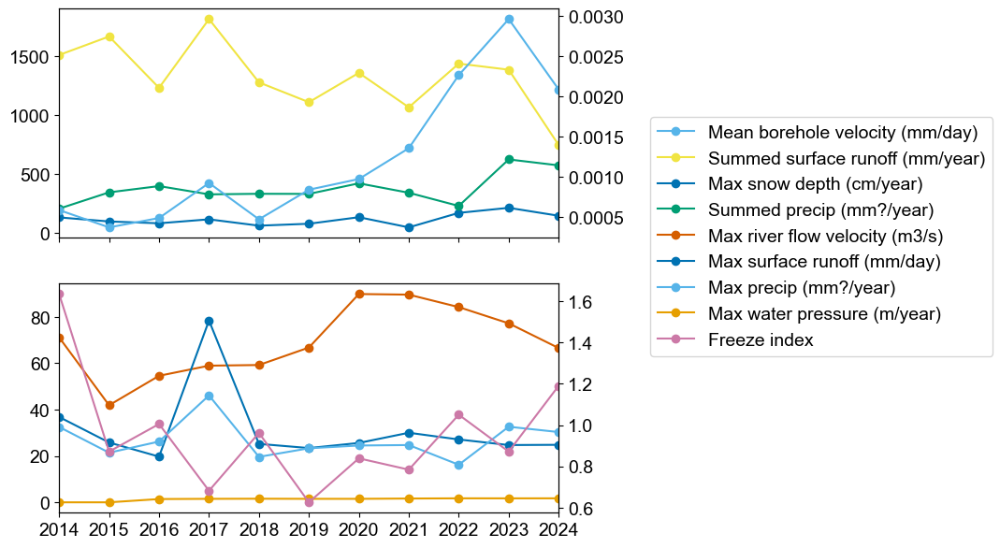

In [110]:
# Get velocity in a different way than before with linear fit
def diff_shift(df, nrow_shift):
    return df-df.shift(nrow_shift) # Takes nrow forwards in time minus 'current' row and gives difference
    
# add to plot.
# velocity of borehole
# rate of temperature change
# rate of snowmelt, could be river flow as proxy

# need to 

df = jtt_temp.copy()
df = df.resample('D').mean() # mean is probably best to capture the variation and find out if it is relativley colder or warmer years
# permafrost index
days_above_zero = df[df['temperature'] > 0].groupby('year').size()
days_below_zero = df[df['temperature'] < 0].groupby('year').size()
# Ensure all years are represented (fill missing years with 0)
all_years = pd.DataFrame({'year': df['year'].unique()})
days_above_zero = all_years.merge(days_above_zero.rename('days_above_zero'), on='year', how='left').fillna(0)
days_below_zero = all_years.merge(days_below_zero.rename('days_below_zero'), on='year', how='left').fillna(0)
# Merge the counts
yearly_counts = pd.merge(days_above_zero, days_below_zero, on='year')
# Calculate permafrost index (days_above_zero / days_below_zero)
yearly_counts['freeze_index'] = yearly_counts['days_above_zero'] / (
    yearly_counts['days_below_zero'] + np.finfo(float).eps  # Avoid division by zero
)
days_freeze_year = yearly_counts.loc[yearly_counts['year'] > 2013]

df = jtt_precip.copy()
df = df.resample('D').sum()
df = df.reset_index()
df['year'] = df['datetime'].dt.year
df = df.groupby('year')['precip'].agg(['mean', 'max', 'sum']).reset_index()
yearly_precip = df.loc[df['year'] > 2013]

df = JTT1Disp.iloc[:,0]
df = df.reset_index()
df['year'] = df['Date:'].dt.year
df.iloc[:,1] = diff_shift(df.iloc[:,1],1) # adding velocity
df = df.groupby('year')['Disp_summed [mm]:'].agg(['mean', 'max']).reset_index()
yearly_vel = df.loc[df['year'] > 2013]

df = JTT1Wp.iloc[:,0]
df = df.reset_index()
df['year'] = df['Date:'].dt.year
df = df.groupby('year')['Mod4_Water pressure [m]:'].agg(['mean', 'max']).reset_index()
yearly_wp = df.loc[df['year'] > 2013]

df = jett_gps5.iloc[:,3]
df = df.reset_index()
df['year'] = df['time'].dt.year
df.iloc[:,1] = diff_shift(df.iloc[:,1],1) # adding velocity
df = df.groupby('year')['2d'].agg(['mean', 'max']).reset_index()
yearly_vel_gps5 = df.loc[df['year'] > 2013]

df = jett_gps4.iloc[:,3]
df = df.reset_index()
df['year'] = df['time'].dt.year
df.iloc[:,1] = diff_shift(df.iloc[:,1],1) # adding velocity
df = df.groupby('year')['2d'].agg(['mean', 'max']).reset_index()
yearly_vel_gps4 = df.loc[df['year'] > 2013]

df = river1.copy() 
df = df.reset_index()
df['year'] = df['datetime'].dt.year
df = df.groupby('year')['Vannføring (m³/s)'].agg(['mean', 'max']).reset_index()
yearly_wflow = df.loc[df['year'] > 2013]

df = xgeo_surfacerunoff.copy()
df = df.reset_index()
df['year'] = df['datetime'].dt.year
df = df.groupby('year')['surfacerunoff'].agg(['mean', 'max', 'sum']).reset_index()
yearly_runoff = df.loc[df['year'] > 2013]

df = jtt_xgeo_snow.copy()
df = df.reset_index()
df['year'] = df['datetime'].dt.year
# df.iloc[:,1] = diff_shift(df.iloc[:,1],1) # adding velocity
df = df.groupby('year')['depth'].agg(['mean', 'max', 'sum']).reset_index()
yearly_snow = df.loc[df['year'] > 2013]

fig, (ax1, ax2) = plt.subplots(2,1, sharex=True, figsize=(12,7))
ax2.plot(yearly_wflow.iloc[:,0].values, yearly_wflow.iloc[:,2].values, marker='o', color=colors[1], label='Max river flow velocity (m3/s)')
ax2.plot(yearly_runoff.iloc[:,0].values, yearly_runoff.iloc[:,2].values, marker='o', color=colors[2], label='Max surface runoff (mm/day)')

ax2.plot(yearly_precip.iloc[:,0].values, yearly_precip.iloc[:,2].values, marker='o', color=colors[5], label='Max precip (mm?/year)')
ax2.plot(yearly_wp.iloc[:,0].values, yearly_wp.iloc[:,2].values, marker='o', color=colors[6], label='Max water pressure (m/year)')
ax_y2 = ax2.twinx()
ax_y2.plot(days_freeze_year.iloc[:,0], days_freeze_year.iloc[:,3], marker='o', color=colors[0], label='Freeze index')

ax1.plot(yearly_runoff.iloc[:,0].values, yearly_runoff.iloc[:,3].values, marker='o', color=colors[3], label='Summed surface runoff (mm/year)')
ax1.plot(yearly_snow.iloc[:,0].values, yearly_snow.iloc[:,2].values, marker='o', color=colors[2], label='Max snow depth (cm/year)')
ax1.plot(yearly_precip.iloc[:,0].values, yearly_precip.iloc[:,3].values, marker='o', color=colors[4], label='Summed precip (mm?/year)')
ax_y1 = ax1.twinx()
ax_y1.plot(yearly_vel.iloc[:,0].values, yearly_vel.iloc[:,1].values, marker='o', color=colors[5], label='Mean borehole velocity (mm/day)')
# ax_y1.plot(yearly_vel_gps4.iloc[:,0].values, yearly_vel_gps4.iloc[:,1].values, marker='o', color=colors[6], label='Mean gps4 velocity (mm/day)')
# ax_y1.plot(yearly_vel_gps5.iloc[:,0].values, yearly_vel_gps5.iloc[:,1].values, marker='o', color=colors[7], label='Mean gps5 velocity (mm/day)')

# ax[0].set_ylabel('Days above 0 degrees')

lines, labels = ax2.get_legend_handles_labels()
lines4, labels4 = ax_y2.get_legend_handles_labels()
lines3, labels3 = ax1.get_legend_handles_labels()
lines2, labels2 = ax_y1.get_legend_handles_labels()
fig.subplots_adjust(right=0.57) 
leg = fig.legend(lines2+lines3+lines+lines4, labels2+labels3+labels+labels4, loc = (0.65, 0.35), ncol=1) # center of fig

ax1.set_xticks(yearly_wflow.iloc[:,0])

In [112]:
import pandas as pd
import numpy as np
df = pd.DataFrame({
    'Days above zero': days_above_zero_per_year.values,
    'bh velocity': yearly_vel.iloc[:,1].values,
    'precip summed': yearly_precip.iloc[:,3].values,
    'river velocity': yearly_wflow.iloc[:,2].values,
    'runoff max': yearly_runoff.iloc[:,2].values,
    'runoff summed': yearly_runoff.iloc[:,3].values,
    'snowdepth': yearly_snow.iloc[:,2].values,
    'precip max': yearly_precip.iloc[:,2].values,
    'freeze index': days_freeze_year.iloc[:,3].values
})

df = df.dropna()
# df = pd.concat([days_above_zero_per_year.values, yearly_vel.iloc[:,1].values, yearly_wflow.iloc[:,2].values, yearly_runoff.iloc[:,2].values, yearly_runoff.iloc[:,3].values, yearly_snow.iloc[:,2].values], axis=0)
# df.columns = ['Days above zero', 'bh velocity', 'river velocity', 'runoff max', 'runoff summed', 'snowdepth']
corr = df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None)
# Fill diagonal and upper half with NaNs
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
corr[mask] = np.nan
(corr
 .style
 .background_gradient(cmap='coolwarm', axis=None, vmin=-1, vmax=1)
 .highlight_null(color='#f1f1f1')  # Color NaNs grey
 .format(precision=2))

,Days above zero,bh velocity,precip summed,river velocity,runoff max,runoff summed,snowdepth,precip max,freeze index
Days above zero,nan,nan,nan,nan,nan,nan,nan,nan,nan
bh velocity,0.32,nan,nan,nan,nan,nan,nan,nan,nan
precip summed,0.34,0.56,nan,nan,nan,nan,nan,nan,nan
river velocity,-0.03,0.53,0.04,nan,nan,nan,nan,nan,nan
runoff max,-0.46,-0.12,-0.25,-0.13,nan,nan,nan,nan,nan
runoff summed,-0.26,-0.27,-0.43,-0.28,0.59,nan,nan,nan,nan
snowdepth,0.19,0.76,0.42,0.29,0.02,0.16,nan,nan,nan
precip max,-0.47,0.07,0.23,-0.13,0.79,0.31,0.23,nan,nan
freeze index,0.05,-0.01,-0.20,0.02,-0.16,-0.07,0.27,0.00,nan


In [414]:
days_above_zero_per_year.index

Index([2014.0, 2015.0, 2016.0, 2017.0, 2018.0, 2019.0, 2020.0, 2021.0, 2022.0, 2023.0, 2024.0], dtype='float64', name='year')

(2013.0, 2024.0)

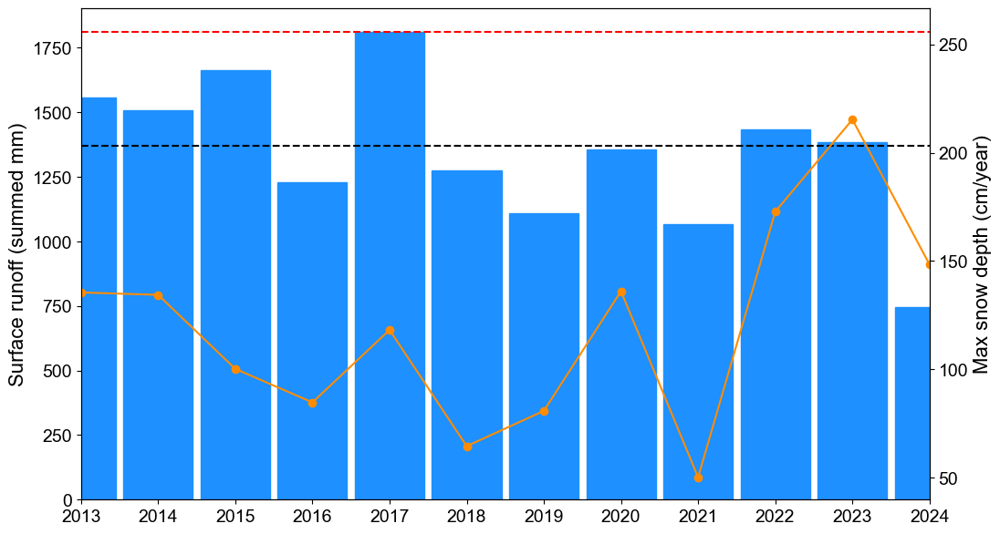

In [337]:
df = xgeo_surfacerunoff.copy()
df = df.reset_index()
df['year'] = df['datetime'].dt.year
df = df.loc[df['year'] >= 2013]
yearly_runoff = df.groupby('year')['surfacerunoff'].agg(['mean', 'max', 'sum']).reset_index()

# dates.date2num(
width = .9
fig, ax = plt.subplots(figsize=(12,7))
# ax.plot(yearly_runoff.iloc[:,0].values, yearly_runoff.iloc[:,3].values, marker='o', color='r', label='Summed surface runoff (mm/year)')
ax.bar(yearly_runoff['year'], yearly_runoff['sum'], width = width, ec='dodgerblue', color='dodgerblue')
ax.axhline(y=yearly_runoff['sum'].median(), color='k', linestyle='--')
ax.axhline(y=yearly_runoff['sum'].max(), color='r', linestyle='--')

ax.set_ylabel('Surface runoff (summed mm)')

ax_y1 = ax.twinx()
ax_y1.plot(yearly_snow.iloc[:,0].values, yearly_snow.iloc[:,2].values, marker='o', color='darkorange', label='Max snow depth (cm/year)')
ax_y1.set_ylabel('Max snow depth (cm/year)')
ax.set_xticks(yearly_runoff.iloc[:,0])
plt.xlim(2013, 2024)

In [18]:
from scipy.signal import savgol_filter
def clean_filt(file, col=0): # colnmbr is the column chosen to filter
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    file['interpolated'] = file.iloc[:,col].interpolate(method='linear', limit_direction ='forward')
    file['savgol'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    return file

# median filter window
window_median = 15 # 7 might be okay and 29 is smooth, tried with 15 as a middle way to keep temp stationary

# rolling mean filter window
window_mean = 7 # 7 is enough to keep temp stationary

# savgol parameters
window_size = 11
poly_order = 3

#### After rock temp  #####
start_time = pd.Timestamp('2018-01-01') # need as long as possible to make stationary, 2015 to 2018 is not enough
end_time = pd.Timestamp('2024-01-01')

interval = '1D' # choose between 1D, 1W, 1M

# original data
x = JTT1Disp.iloc[:,0] # hourly data intervals
y = JTT1Wp.iloc[:,0] # hourly data intervals
z = jtt_xgeo_temp.iloc[:,0] # daily data intervals   
f = river1.iloc[:,0] # 30 min data intervals

df = pd.concat([x,y,z,f], axis=1)
df.columns =['Disp', 'WP', 'Temp', 'River']
df.dropna(inplace=True)
file = df.copy()
file = file[file.index.slice_indexer(start_time,end_time)] # slicing
file = file.resample(interval).median() # downsampling with median value
original_df = df.copy()

# cleaned data
def clean_df(df,start_time,end_time, interval):
    df = df[df.index.slice_indexer(start_time,end_time)]
    for i, col in enumerate(df.columns):
        df.loc[:,col] = clean_filt(df.loc[:,col]).values # filtered data
        # df.loc[:,col] = medfilt(df.loc[:,col], window_median) # median filter
        df.loc[:, col] = df.loc[:, col].rolling(window=window_mean, center=True).mean() # rolling mean
        df = df.resample(interval).median() # downsampling with median value after cleaning
        df.dropna(inplace=True)
    return df

df = clean_df(df, start_time,end_time, interval)
df.head()

C:\Users\andregas\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
C:\Users\andregas\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
C:\Users\andregas\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
C:\Users\andregas\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
C:\Users\andregas\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
C:\Users\andregas\AppData\Local\anaconda3\Lib\site-packages\numpy\lib\nanfu

,Disp,WP,Temp,River
2018-01-13,24.181140,0.0,-2.199351,0.91951
2018-01-14,24.186917,0.0,-3.130969,0.887072
2018-01-15,24.186144,0.0,-4.539660,0.8559
2018-01-16,24.183312,0.0,-6.223044,0.825773
2018-01-17,24.169519,0.0,-7.897736,0.796657


<Axes: >

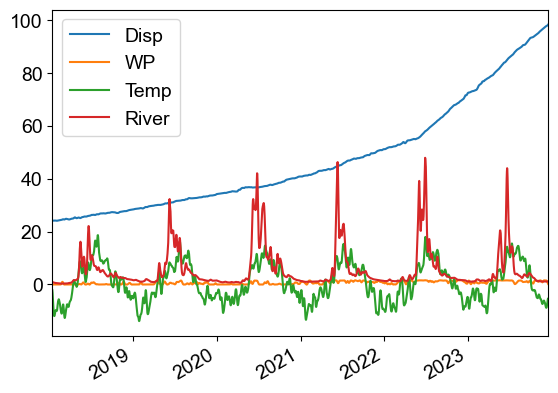

In [20]:
df.plot()

In [ ]:
# plotting JTT2 Upper VS GPS3

fig, ax = plt.subplots(figsize=(8, 6), sharex=True)

# manually picked start and end times for following data
start_time = pd.Timestamp('2014-07-01')
end_time = pd.Timestamp('2025-01-01')


diff = 0.55 # adding differnce so the plots will be on top of each other
n_hour = 59

# col = 'Disp_summed [mm]:'
col = '60_days_velocity [mm/day]:'
# file = JTT2DispUpperZone.loc[:,col] # upper
file = JTT2DispLowerZone.loc[:,col] # lower
file =  file[file.index.slice_indexer(start_time,end_time)]
zero = file[file.first_valid_index()]
file1 = file-zero
normalized = (file1-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
file1 = file1.replace(np.nan,np.inf) # changing nan to inf

# ax.plot(file1.index, file1.values, color=colors[5], label='Borehole JTT2 Lower zone', alpha=0.8)

# # normalized
# ax.plot(file1.index, normalized, color=colors[5], label='Borehole JTT2 Upper zone')

# # velocity
# ax.plot(file.index, file.values, color=colors[5], label='Borehole JTT2 Upper zone', alpha=0.8)

# Normalized
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax.plot(file.index, normalized, color=colors[5], label='Borehole JTT2 Upper zone', alpha=0.8)

# WP
ax_y = ax.twinx()
file3 = JTT2WpUpperZone.copy()
watermodule = 'Mod4_Water pressure [m]:'
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
file3 = file3[watermodule]
# file3 = file3[file3.first_valid_index():]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
df = file3.values-np.nanmin(file3.values)
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
file3 = file3.replace(np.nan,np.inf) # changing nan to inf

# ax_y.plot(file3.index, file3.values-np.nanmin(file3.values), color=colors[4], label='Water pressure', alpha=0.5)
# ax_y.set_ylabel('Water pressure (m)')

# normalized
ax_y.plot(file3.index, normalized, color=colors[4], label='Water pressure', alpha=0.5)
ax_y.set_ylabel('Normalized water pressure')


# GPS data
# data = '2d'
data = '2d_60_days_velocity [mm/day]:'
df =  jett_gps3 # same as Jtt2
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
file = df[data]
zero = file[file.first_valid_index()]
file1 = file-zero
normalized = (file1-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
file1 = file1.replace(np.nan,np.inf) # changing nan to inf

# ax.plot(file1.index, file1, color=colors[2], label='GPS 3')
# ax.set_ylabel('Displacement (mm)')

# # Normalized
# ax.plot(file1.index, normalized+diff, color=colors[2], label='GPS 3')
# ax.set_ylabel('Normalized displacement')

# # velocity
# ax.plot(file.index, file, color=colors[2], label='GPS 3')
# ax.set_ylabel('Velocity (mm/day)')

# Normalized
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax.plot(file.index, normalized, color=colors[2], label='GPS 3')
ax.set_ylabel('Normalized velocity')


ax.set_xlabel('Years')

lines, labels = ax.get_legend_handles_labels()
lines1, labels1 = ax_y.get_legend_handles_labels()
ax.legend(lines+lines1, labels+labels1)

# years = mdates.YearLocator(1)   # set number for every other year
# years_fmt = mdates.DateFormatter('%Y') # only display year, not day and month
# ax[3].xaxis.set_major_locator(years)
# ax[3].xaxis.set_major_formatter(years_fmt)

# # removing tick labels from the xaxis
# n = 2  # keeps every n row
# [l.set_visible(False) for (i,l) in enumerate(ax[3].xaxis.get_ticklabels()) if i % n != 0]

# # # saving
path = 'plots\\'
# save_name = f'{path}Figure_JTT2_GPS3_displacement.png'
# save_name = f'{path}Figure_JTT2Lower_GPS3_displacement.png'
# save_name = f'{path}Figure_JTT2_GPS3_disp_normalized.png'
# save_name = f'{path}Figure_JTT2_GPS3_vel.png'
save_name = f'{path}Figure_JTT2Lower_GPS3_vel_normalized.png'
fig.savefig(save_name, dpi=600) # , transparent=True,  bbox_inches='tight'

Text(0, 0.5, 'Water pressure (m)')

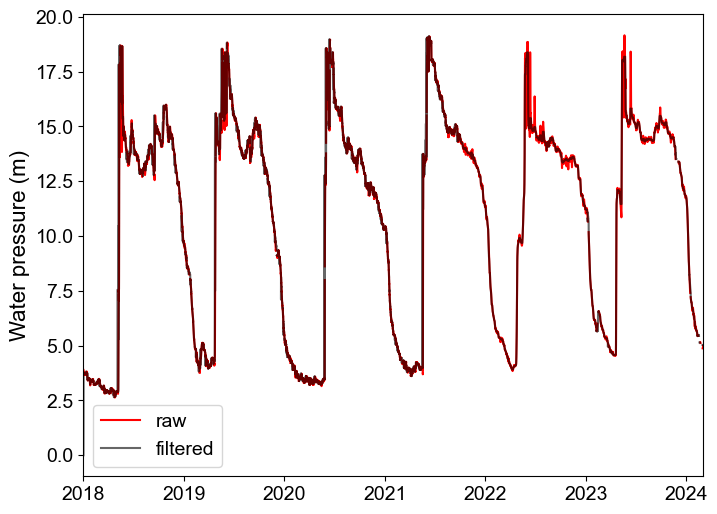

In [19]:
# regression on Wp and disp
fig, ax = plt.subplots(figsize=(8, 6), sharex=True)
file3 = JTT2WpUpperZone.copy()
watermodule = 'Mod4_Water pressure [m]:'

start_time = pd.Timestamp('2018-01-01')
end_time = pd.Timestamp('2025-01-01')
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
# file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
file3 = file3[watermodule]
# file3 = file3[file3.first_valid_index():]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
# df = file3.values-np.nanmin(file3.values)
# normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# file3 = file3.replace(np.nan,np.inf) # changing nan to inf

# testing filter
n = (24*7)+1 # odd number (7 days works great)
test = medfilt(file3, kernel_size=n) # median filter

# n = (24*60)+1 # odd number (and than long filter? But do not know the correct way of doing this..)
# test = medfilt(test, kernel_size=n) # median filter

# plotting
ax.plot(file3.index, file3.values, color='r', label='raw')
ax.plot(file3.index, test, color='k', label='filtered', alpha=0.6)
ax.legend()
ax.set_ylabel('Water pressure (m)')

          Disp        WP
Disp  1.000000  0.557849
WP    0.557849  1.000000


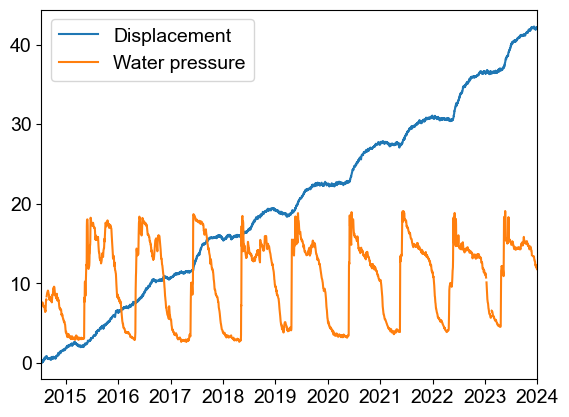

In [45]:
from statsmodels.tsa.seasonal import seasonal_decompose

start_time = pd.Timestamp('2014-01-01')
end_time = pd.Timestamp('2024-01-01')

x = JTT2DispUpperZone.iloc[:,0] # 0 = disp, -3 = 12 days, -1 = 60 days
x = x[x.index.slice_indexer(start_time,end_time)]
x = x.resample('1d').median()
df_col, freq = x.dropna(), 365
res_x = seasonal_decompose(df_col, period=freq) # , freq=freq, model='additive', extrapolate_trend='freq

y = JTT2WpUpperZone.iloc[:,0]
y = y[y.index.slice_indexer(start_time,end_time)]
y = y.resample('1d').median()
df_col, freq = y.dropna(), 365
res_y = seasonal_decompose(df_col, period=freq)
                           
df = pd.DataFrame({'Disp':res_x.seasonal, 'WP':res_y.seasonal})
df.dropna(inplace=True) # for some reason more nans appeared
print(df.corr())
# df.plot()
plt.plot(x)
plt.plot(y)
plt.legend(['Displacement','Water pressure'])

          Disp        WP
Disp  1.000000  0.263469
WP    0.263469  1.000000


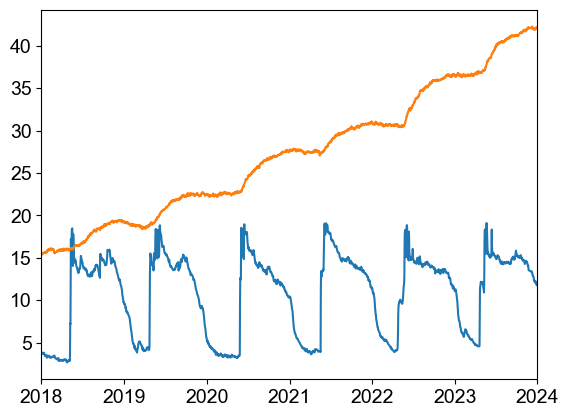

In [72]:
# trying differnce instead of seasonal signal
start_time = pd.Timestamp('2018-01-01')
end_time = pd.Timestamp('2024-01-01')

x = JTT2DispUpperZone.iloc[:,0] # 0 = disp, -3 = 12 days, -1 = 60 days
x = x[x.index.slice_indexer(start_time,end_time)]
x = x.resample('1d').median()

y = JTT2WpUpperZone.iloc[:,0]
y = y[y.index.slice_indexer(start_time,end_time)]
y = y.resample('1d').median()

# # first order differenceing
# x = np.diff(x)[1:]
# y = np.diff(y)[1:]

df = pd.DataFrame({'Disp':x, 'WP':y})
df.dropna(inplace=True) # for some reason more nans appeared
print(df.corr())
plt.plot(df.iloc[:,1])
plt.plot(df.iloc[:,0])

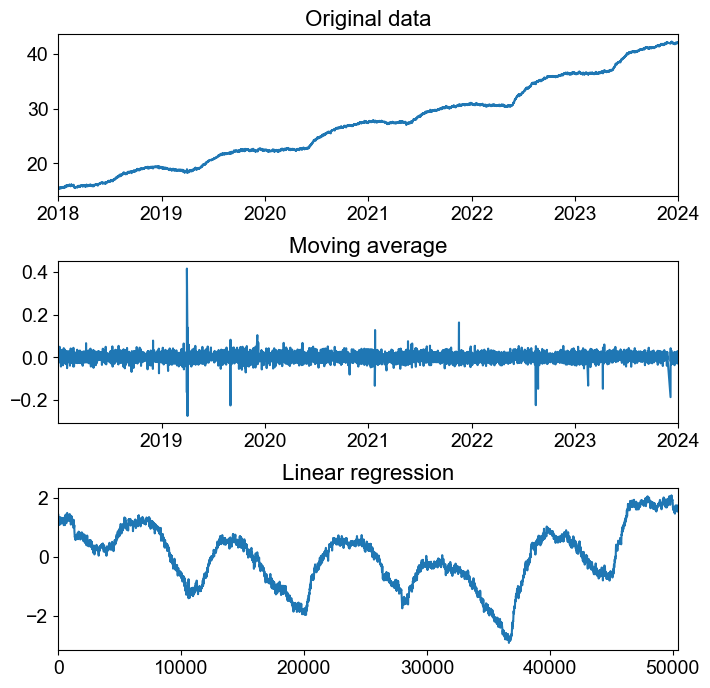

In [67]:
# # Detrend timeseries # #

start_time = pd.Timestamp('2018-01-01')
end_time = pd.Timestamp('2024-01-01')

x = JTT2DispUpperZone.iloc[:,0] # 0 = disp, -3 = 12 days, -1 = 60 days
x = x[x.index.slice_indexer(start_time,end_time)]
# x = x.resample('1d').median()

y = JTT2WpUpperZone.iloc[:,0]
y = y[y.index.slice_indexer(start_time,end_time)]
# y = y.resample('1d').median()
df = pd.DataFrame({'Disp':x, 'WP':y})
df.dropna(inplace=True) # for some reason more nans appeared

# Define the window size for the moving average
window_size = 5

def detrend_ma_col(df_col, window_size):
    # Calculate the moving average
    moving_average = np.convolve(df_col, np.ones(window_size)/window_size, mode='valid')
    # Detrend the time series by subtracting the moving average
    detrended = df_col[window_size - 1:] - moving_average
    return detrended

def detrend_linreg_col(df_col):
    # fit linear model
    X = [i for i in range(0, len(df_col))]
    X = np.reshape(X, (len(X), 1))
    y = df_col.values
    model = LinearRegression()
    model.fit(X, y)
    # calculate trend
    trend = model.predict(X)
    # detrend
    detrended = [y[i]-trend[i] for i in range(0, len(df_col))]
    return detrended

df_col = df.iloc[:,0]
linreg = detrend_linreg_col(df_col)
ma = detrend_ma_col(df_col, window_size=window_size)

fig, (ax1, ax2, ax3) = plt.subplots(3,1, figsize=(8,8))
fig.subplots_adjust(hspace=.4)
ax1.set_title('Original data')
ax1.plot(df_col, label='original')
ax2.set_title('Moving average')
ax2.plot(ma, label='ma')
ax3.set_title('Linear regression')
ax3.plot(linreg, label='linreg')

In [20]:
# create slice of df 

start_time = pd.Timestamp('2018-01-01')
end_time = pd.Timestamp('2024-01-01')

x = JTT2DispUpperZone.iloc[:,0] # 0 = disp, -3 = 12 days, -1 = 60 days
x = x[x.index.slice_indexer(start_time,end_time)]
x = x.resample('1d').median()

y = JTT2WpUpperZone.iloc[:,0]
y = y[y.index.slice_indexer(start_time,end_time)]
y = y.resample('1d').median()
         
df = pd.DataFrame({'Disp':x, 'WP':y})
df.dropna(inplace=True) # for some reason more nans appeared

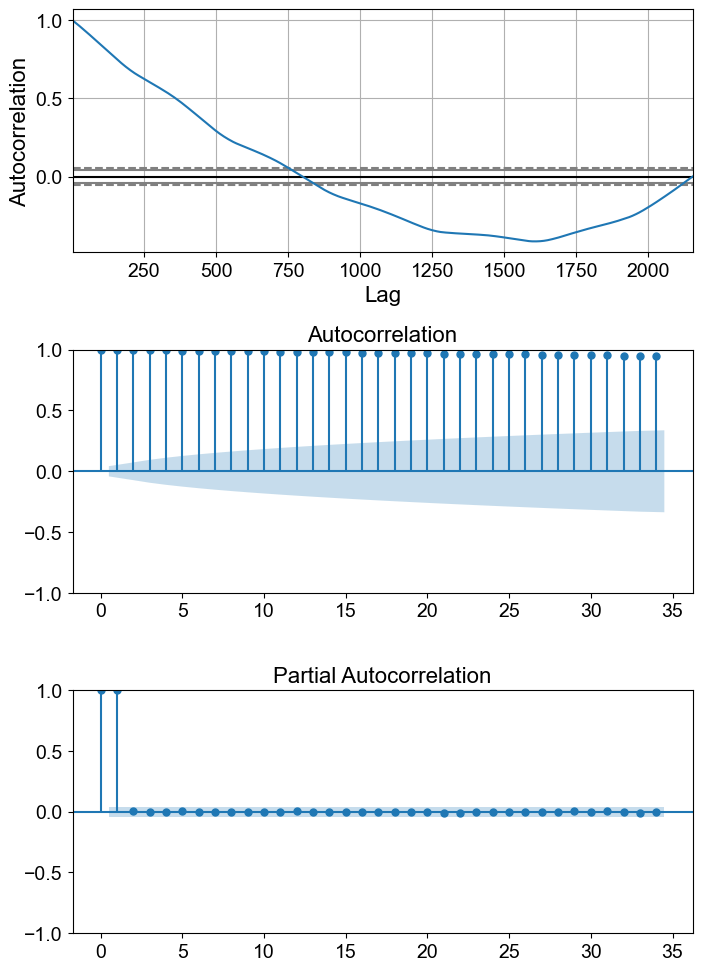

In [9]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pandas.plotting import autocorrelation_plot

df = pd.DataFrame({'Disp':x, 'WP':y})
df.dropna(inplace=True)

### try different types of 'smoothing' and understand what is the best apporach to the correlations. Also go back to granger and cross correlation!

# test = ma.copy() # moving average, seems like this is the only one working according to the stationarity argument
# test = linreg.copy() # linear regression
# test = df.iloc[:,1] # seasonal decompose
####

test = df.iloc[:,0] # displacement original data
# test = df.iloc[:,1] # water pressure original data

fig, (ax1, ax2, ax3) = plt.subplots(3,1, figsize=(8,12))
fig.subplots_adjust(hspace=.4)
autocorrelation_plot(test, ax1) # can clearly see seasonality in plot
plot_acf(test, ax=ax2) #  lags=90, zero=False,
plot_pacf(test, ax=ax3) # lags=90, zero=False,

plt.show()

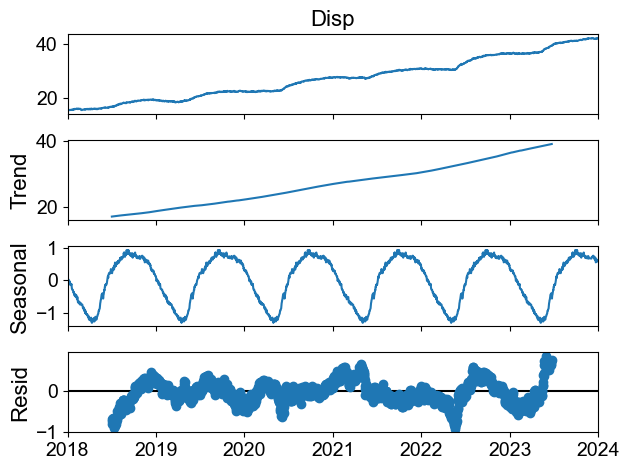

In [10]:
from statsmodels.tsa.seasonal import seasonal_decompose
freq = 365
decomposition=seasonal_decompose(test,model='additive',period=freq)
decomposition.plot()
plt.show()

In [11]:
from statsmodels.tsa.stattools import adfuller
dftest = adfuller(test, autolag = 'AIC')
print("1. ADF : ",dftest[0])
print("2. P-Value : ", dftest[1])
print("3. Num Of Lags : ", dftest[2])
print("4. Num Of Observations Used For ADF Regression and Critical Values Calculation :", dftest[3])
print("5. Critical Values :")
for key, val in dftest[4].items():
    print("\t",key, ": ", val)
# so the tests says that the WP time series is stationary, but the disp is not, which makes sense. Stasionarity is needed for ARIMA but not SARIMA

from pmdarima.arima.stationarity import ADFTest

# Test whether we should difference at the alpha=0.05
# significance level
adf_test = ADFTest(alpha=0.05)
p_val, should_diff = adf_test.should_diff(test)  # (0.01, False)

1. ADF :  0.4331252328914312
2. P-Value :  0.9826923245047817
3. Num Of Lags :  24
4. Num Of Observations Used For ADF Regression and Critical Values Calculation : 2129
5. Critical Values :
	 1% :  -3.4334252475234646
	 5% :  -2.8628985239834686
	 10% :  -2.567493212493555


In [12]:
import pmdarima as pmd

# p is order of AR model (number of lags), d is degree of differencing (only used when non-tationary data), 1 is order of MA model. Understand this from here: https://alkaline-ml.com/pmdarima/tips_and_tricks.html
model=pmd.auto_arima(test,start_p=1,start_q=1,test='adf',m=365,seasonal=True,trace=True)

# this takes for ever!

Performing stepwise search to minimize aic


KeyboardInterrupt: 

In [ ]:
# add values from the automatic retriveing of values above

sarima=SARIMAX(data['meantemp'],order=(1,1,1),seasonal_order=(1,0,1,12))
predicted=sarima.fit().predict();predicted

# but this only predicts and fits the data and I do not know much more? 

## VAR model

In [231]:
#### create slice of df  #####
start_time = pd.Timestamp('2018-01-01')
end_time = pd.Timestamp('2024-01-01')

x = JTT2DispUpperZone.iloc[:,0] # 0 = disp, -3 = 12 days, -1 = 60 days
x = x[x.index.slice_indexer(start_time,end_time)]
x = x.resample('1d').median()

y = JTT2WpUpperZone.iloc[:,0]
y = y[y.index.slice_indexer(start_time,end_time)]
y = y.resample('1d').median()

z = jtt_xgeo_temp.iloc[:,0] # daily data intervals
z = z[z.index.slice_indexer(start_time,end_time)]
z = z.resample('1d').median()

df = pd.DataFrame({'Disp':x, 'WP':y, 'Temp': z})
df.dropna(inplace=True)

#### making and testing stationarity ####
# Apply decompose (decompose trend, seasonality, and resudials) to make data stationary
freq = 365
for variable in df.columns:
    decomposed_series = seasonal_decompose(df.loc[:,variable], model='additive', period=freq) # only for disp now, can do on WP too to make it equally significant?
    # df.loc[:,variable] = decomposed_series.seasonal # only seasonal
    df.loc[:,variable] = df.loc[:,variable]-decomposed_series.trend # original minus trend
df.dropna(inplace=True)

p-value: 0.01772846470827371
The variable Disp is stationary.

p-value: 0.018623351149189844
The variable WP is stationary.



C:\Users\andregas\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\Users\andregas\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\Users\andregas\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\Users\andregas\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


        Disp_x  WP_x
Disp_y     1.0   0.0
WP_y       0.0   1.0
  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Fri, 09, Aug, 2024
Time:                     09:23:53
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -5.67123
Nobs:                     1092.00    HQIC:                  -6.22288
Log likelihood:           676.120    FPE:                 0.00141898
AIC:                     -6.55876    Det(Omega_mle):      0.00119690
--------------------------------------------------------------------
Results for equation Disp
              coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------
const           -0.000744         0.002414           -0.308           0.758
L1.Disp          0.673226         0.031725           21.220           0.000
L1.WP           -0

C:\Users\andregas\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


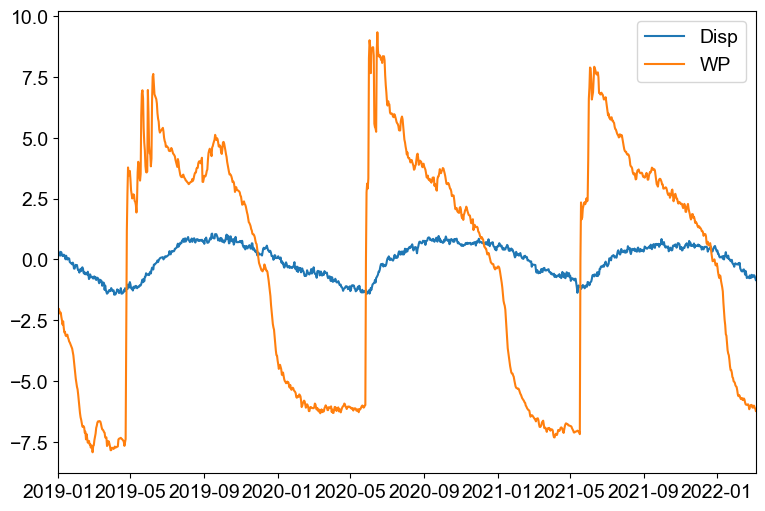

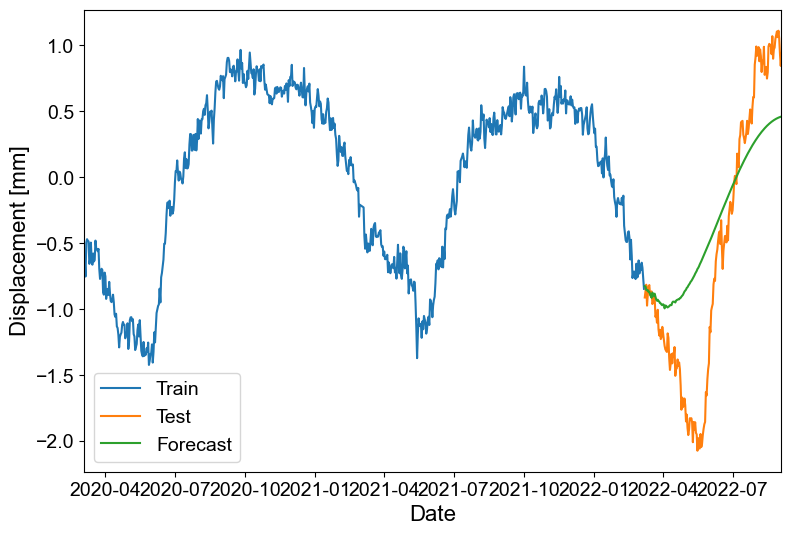

In [232]:
# YES, it seems like VAR is what I need! https://medium.com/@wainaina.pierre/the-complete-guide-to-time-series-forecasting-models-ef9c8cd40037

# this is a linear function

#### create slice of df  #####
start_time = pd.Timestamp('2018-01-01')
end_time = pd.Timestamp('2024-01-01')

x = JTT2DispUpperZone.iloc[:,0] # 0 = disp, -3 = 12 days, -1 = 60 days
x = x[x.index.slice_indexer(start_time,end_time)]
x = x.resample('1d').median()

y = JTT2WpUpperZone.iloc[:,0]
y = y[y.index.slice_indexer(start_time,end_time)]
y = y.resample('1d').median()

z = jtt_xgeo_temp.iloc[:,0] # daily data intervals
z = z[z.index.slice_indexer(start_time,end_time)]
z = z.resample('1d').median()

# df = pd.DataFrame({'Disp':x, 'WP':y, 'Temp': z})

df = pd.DataFrame({'Disp':x, 'WP':y})
df.dropna(inplace=True)

#### making and testing stationarity ####
# Apply decompose (decompose trend, seasonality, and resudials) to make data stationary
freq = 365
for i, d in enumerate(df.columns):
    # # only seasonal component
    # df.loc[:,variable] = decomposed_series.seasonal # only seasonal
    # df.dropna(inplace=True)
    
    # removed trend so includes residuals
    original = df.loc[:,d].copy()
    decomposed_series = seasonal_decompose(df.loc[:,d], model='additive', period=freq) # only for disp now, can do on WP too to make it equally significant?
    
    df.loc[:,d] = original-decomposed_series.trend # original minus trend. This does not make the data stationary..
    df.dropna(inplace=True) # due to shift of a week by trend calculation
    
    
from statsmodels.tsa.stattools import adfuller

for variable in df.columns:
    # Perform the ADF test
    result = adfuller(df[variable])

    # Extract and print the p-value from the test result
    p_value = result[1]
    print("p-value:", p_value)

    # Interpret the result
    if p_value <= 0.05: # 0.05 or 0.001
        print(f"The variable {variable} is stationary.\n")
    else:
        print(f"The variable {variable} is not stationary.\n")
        
# Split into train and test
cutoff_index = int(df.shape[0] * 0.8) # train with xx % data

df_train = df.iloc[:cutoff_index]
df_test = df.iloc[cutoff_index:]

fig, ax =plt.subplots(figsize=(9, 6))
ax.plot(df_train.index, df_train.Disp, label='Disp')
ax.plot(df_train.index, df_train.WP, label='WP')
# ax.plot(df_train.index, df_train.Temp, label='Temp')
ax.legend()

### Granger Causality test ###
# https://www.machinelearningplus.com/time-series/granger-causality-test-in-python/?utm_content=cmp-true

# looks at lags and provide significance below 0.1 or 0.05 if variable in second column is caused by first column.

from statsmodels.tsa.stattools import grangercausalitytests
def grangers_causation_matrix(data, variables, maxlag=90, test='ssr_chi2test', verbose=False):    
    """Check Granger Causality of all possible combinations of the Time series.
    The rows are the response variable, columns are predictors. The values in the table 
    are the P-Values. P-Values lesser than the significance level (0.05), implies 
    the Null Hypothesis that the coefficients of the corresponding past values is 
    zero, that is, the X does not cause Y can be rejected.

    data      : pandas dataframe containing the time series variables
    variables : list containing names of the time series variables.
    """
    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
        for r in df.index:
            test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            df.loc[r, c] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df

grang_test = grangers_causation_matrix(df_train, variables = df.columns, maxlag=90) # 3 months and daily values
print(grang_test) # not sure if this is working optimally


#### Transform data back to original ####     do not know how to use that for decompose
# # Define function for inverting data transformation
# def df_inv_transformation(df_processed, df, scaler):
    
#     # Invert StandardScaler transformation
#     df_diff = pd.DataFrame(scaler.inverse_transform(df_processed), 
#                                 columns=df_processed.columns, 
#                                 index=df_processed.index)

#     # # Invert decomposing
#     # df_original = df_diff.cumsum() + df[df.index < df_diff.index[0]].iloc[-1]
    
#     return df_original


#### VAR model ####
from statsmodels.tsa.vector_ar.var_model import VAR
model = VAR(df_train) # endog=df_train_processed.iloc[:,0], exog=df_train_processed.iloc[:,1]

# # Get optimal lag order based on the four criteria
# optimal_lags = model.select_order()
# print(f"The optimal lag order selected: {optimal_lags.selected_orders}")
# # Fit the model after selecting the lag order
# lag_order = optimal_lags.selected_orders['bic'] # bic minimizes model complexity, aic maximizes goodnes of fit

lag_order = 48 # is best cross correlation lag, manually chosen
results = model.fit(lag_order)

# Estimate the model (VAR) and show summary
var_model = results.model
print(results.summary())

#### Forecast next n days #####
plot_window = 365*2
horizon = 180
forecast = results.forecast(df_train.values[-lag_order:], steps=horizon)

# Convert to dataframe
df_forecast = pd.DataFrame(forecast, columns=df_train.columns, index=df_test.iloc[:horizon].index)

# Plot forecasted increment of deaths
fig, ax =plt.subplots(figsize=(9, 6))
ax.plot(df_train.index[-plot_window:], df_train.Disp[-plot_window:])
ax.plot(df_test.index[:horizon], df_test.Disp[:horizon])
ax.plot(df_forecast.index, df_forecast.Disp)
# plt.grid(alpha=0.5, which='both')
plt.xlabel('Date')
plt.ylabel('Displacement [mm]')
plt.legend(['Train', 'Test', 'Forecast'])
plt.show()

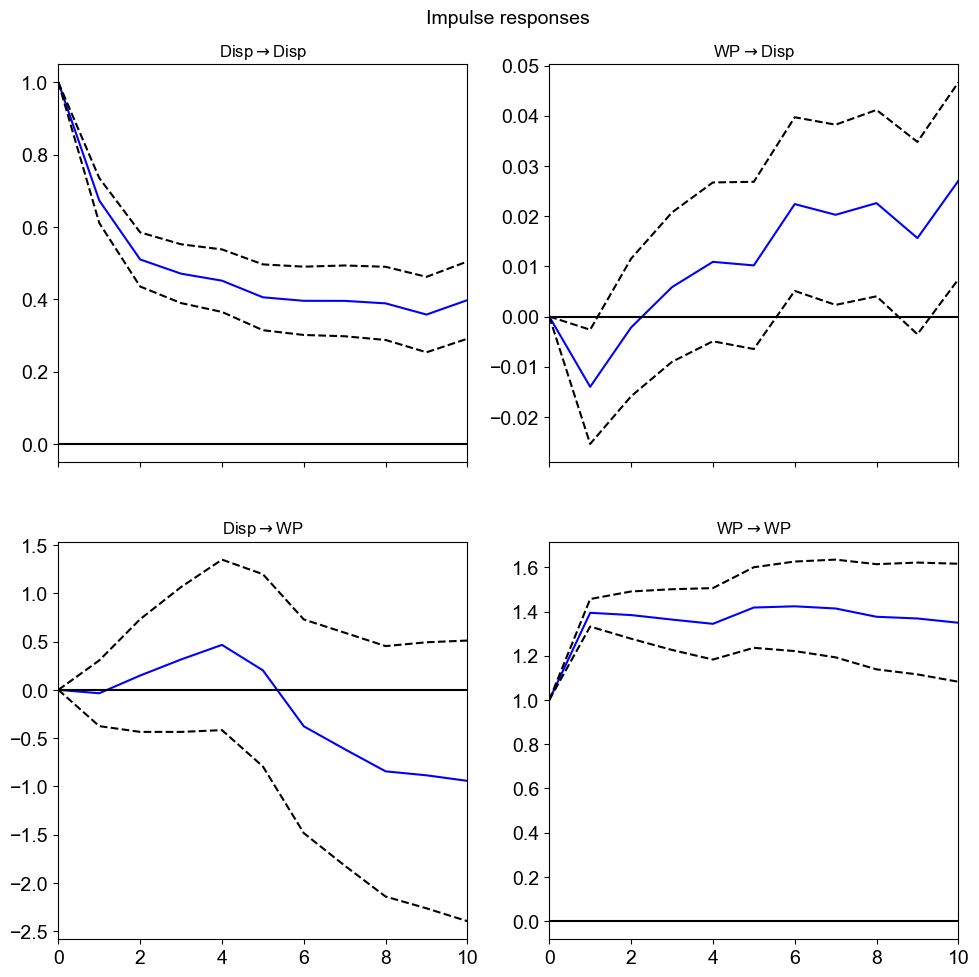

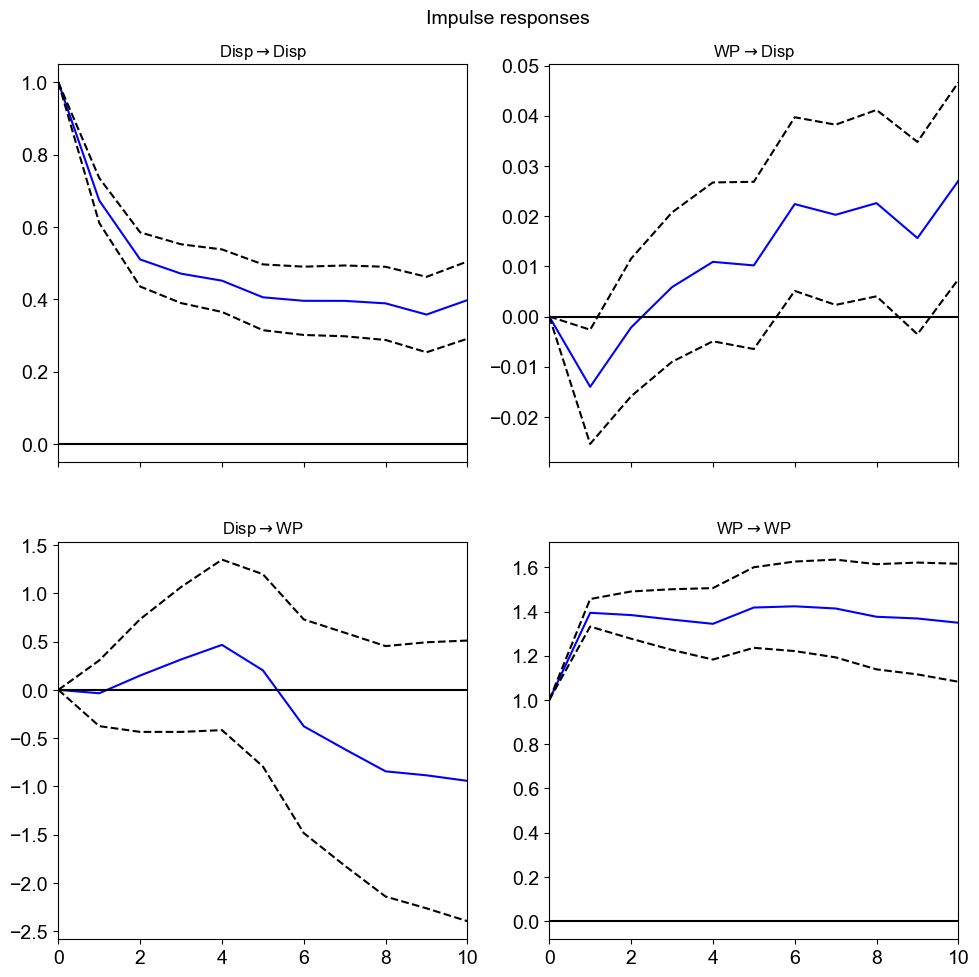

In [258]:
irf = results.irf(10)
irf.plot(orth=False) # impuls respons function is showing how much of a unit change (y-axis) a shock of 2sd (?) is and propogates for x-time steps

In [252]:
print(results.test_causality('Disp', 'WP', kind='f')) # f = F-test for numeric, wald = chi-sq, chi-sq for catagorical
# I think this is the VAR model of just Disp and then Disp and WP to see if it gives a better estiamte by including WP and it did not so then reject that WP cause Disp

<statsmodels.tsa.vector_ar.hypothesis_test_results.CausalityTestResults object. H_0: WP does not Granger-cause Disp: reject at 5% significance level. Test statistic: 1.989, critical value: 1.364>, p-value: 0.000>


(array([ 66.,  81.,  84., 131.,  93.,  77., 112., 213., 216.,  67.]),
 array([-1.44864788, -1.19745955, -0.94627122, -0.69508288, -0.44389455,
        -0.19270622,  0.05848211,  0.30967044,  0.56085877,  0.8120471 ,
         1.06323543]),
 <BarContainer object of 10 artists>)

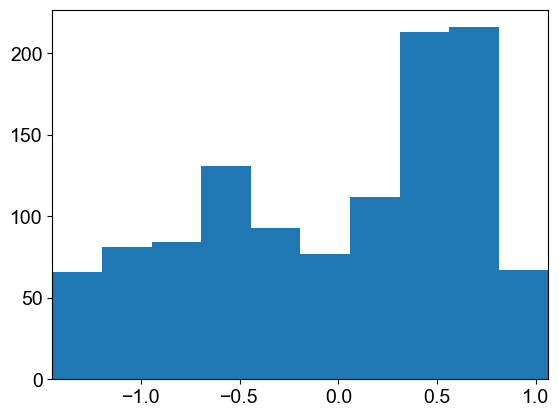

In [251]:
plt.hist(df_train.iloc[:,0]) # normaly distributed? No, skewed with long tails
# plt.plot(df_train.index, df_train.iloc[:,0]) # to look at time series

## ARDL model

In [35]:
# Moved on to ARDL after talking to Martin Iver Jacobsen

# Did 3 days lowpass cut off in pre_plotting of all data. Might need some rolling window averaging as well?

# butterworth filter
from scipy.signal import butter,filtfilt
def butter_lowpass_filter(data, cutoff, fs, order):
    data = data.values # values to filter
    nyq = 0.5 * fs # Nyquist Frequency, assumes regular time intervals
    normal_cutoff = cutoff / nyq
    # Get the filter coefficients 
    b, a = butter(order, normal_cutoff, btype='low')
    y = filtfilt(b, a, data)
    return y
# low pass filter inputs 
n = 3 # number of days cut off
fs = 1 # sample rate in hours 
cutoff = 1/(24*n) # 1/24 means cutoff at 1 day, but times nyquist frequncey so twice
order = 2 # line from 1 to 0, second order is perfect function

def clean_lowpassfilt(file, colnmbr=0, name='Water table [m bgl]:'): # colnmbr is the column chosen to lowpass filter
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    file['interpolated'] = file.iloc[:,colnmbr].interpolate(method='linear', limit_direction ='forward')
    file['lowpass'] = butter_lowpass_filter(file.iloc[:,-1], cutoff, fs, order) # replace original by lowpass filtered
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    file.rename(columns={'lowpass':name}, inplace=True) # I call it the same as original if it was dependent on name in scripts lower down
    return file

JTT2DispUpperZone.iloc[:,0] = clean_lowpassfilt(JTT2DispUpperZone.iloc[:,0], colnmbr=0, name=JTT2DispUpperZone.columns[0])
JTT2WpUpperZone.iloc[:,0] = clean_lowpassfilt(JTT2WpUpperZone.iloc[:,0], colnmbr=0, name=JTT2WpUpperZone.columns[0])
jtt_xgeo_temp.iloc[:,0] = clean_lowpassfilt(jtt_xgeo_temp.iloc[:,0], colnmbr=0, name=jtt_xgeo_temp.columns[0])
ST.iloc[:,0] = clean_lowpassfilt(ST.iloc[:,0], colnmbr=0, name=ST.columns[0])

#### create slice of df  #####
start_time = pd.Timestamp('2014-01-01')
end_time = pd.Timestamp('2019-01-01')

x = JTT2DispUpperZone.iloc[:,0] # 0 = disp, -3 = 12 days, -1 = 60 days
x = x[x.index.slice_indexer(start_time,end_time)]
x = x.resample('1d').median()

y = JTT2WpUpperZone.iloc[:,0]
y = y[y.index.slice_indexer(start_time,end_time)]
y = y.resample('1d').median()

z = jtt_xgeo_temp.iloc[:,0] # daily data intervals
z = z[z.index.slice_indexer(start_time,end_time)]
z = z.resample('1d').median()

f = ST.iloc[:,0] # hourly data intervals
f = f[f.index.slice_indexer(start_time,end_time)]
f = f.resample('1d').median()

df = pd.DataFrame({'Disp':x, 'WP':y, 'Temp': z, 'Rock_temp':f})

# extra medfilt to get below 0.5 statinarity
from scipy.signal import medfilt
n = 7 # 7 days is enough when using the entire dataset
# df = df.apply(lambda col: medfilt(col, kernel_size=n)) # did not fix problem with temperature data
df = df.apply(lambda col: col.rolling(window=n, center=True).mean())
df.dropna(inplace=True) # need it for rolling average

# # Split into train and test
# cutoff_index = int(df.shape[0] * 0.8) # train with xx % data
# df_train = df.iloc[:cutoff_index]
# df_test = df.iloc[cutoff_index:]

df_train = df.copy()
# now scale and transform data so variables are of similar weight
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler() # normalize between 0 and 1, has to be this when dataset is not normally distributed

# differencing n rows to get seasonal and trend removed to obtain statinarity
def diff_shift(df, nrow_shift):
    return df-df.shift(nrow_shift) # Takes nrow forwards in time minus 'current' row and gives difference

def norm(series):
    series = scaler.fit_transform(series.values.reshape(-1, 1)) # transform to normalized values
    # df = scaler.inverse_transform(df) # transform back to original
    return series.reshape(-1) # transform back to correct shape

# Apply decompose (decompose trend, seasonality, and resudials) to make data stationary
from statsmodels.tsa.seasonal import STL

df_list = []
for i,d in enumerate(df_train.columns):
    df = []
    freq = 365

    decomposed_series = STL(df_train.loc[:,d], seasonal=13, period=365).fit()
    trend = decomposed_series.trend
    seasonal = decomposed_series.seasonal
    residual = decomposed_series.resid
    original = df_train.loc[:,d].copy()
    # removed_trend = original-trend
    # norm_removed_trend = norm(removed_trend) # the normalization does not work for some reason..
    # diff_trend = diff_shift(original, 1) # first order differencing # previosly named diff_trend
    # diff_seasonal = diff_shift(original, 365) # this is not stationary
    # diff_trend_season = diff_shift(diff_seasonal, 1) # correct way according to detrend and deseasonlize: https://online.stat.psu.edu/stat510/lesson/4/4.1
    # rolling_diff = original.rolling(3).mean()-original # more than 7 days gives higher std values than diff_trend
    # norm_diff = norm(diff_trend) # the normalization does not work for some reason.. # need to normalize to make the relationships 'scaled correctly'
    df = pd.DataFrame({'original':original.values, 'trend': trend.values, 'seasonal':seasonal.values, 'residual':residual.values}, index=df_train.index) 
    #, 'orig-trend':removed_trend.values,'diff_trend_season':diff_trend_season.values, 'diff':diff_trend.values, 'norm_diff': norm_diff, 'rolling_diff':rolling_diff.values}, index=df_train.index)
    # df.dropna(inplace=True)
    
    #### Comment this part out when finished looking at what series is stationary  ####
    # correlating?
    print(f'{d}')
    # print(df.corr()) # correlations

    #### testing stationarity ####
    from statsmodels.tsa.stattools import adfuller
    for i, variable in enumerate(df.columns):
        # Perform the ADF test
        result = adfuller(df[variable])

        # Extract and print the p-value from the test result
        p_value = result[1]
        print("p-value:", p_value)

        # Interpret the result
        if p_value <= 0.05: # 0.05 or 0.001
            print(f"The variable {variable} is stationary.\n")
        else:
            print(f"The variable {variable} is not stationary.\n")
###############################

    # # choosing just one year
    # df = df[df.index.slice_indexer(pd.Timestamp('2016-01-01'),pd.Timestamp('2017-01-01'))]

    df_list.append(df)
    
col = 'seasonal' # only use the ones that passes ADF test
df = pd.DataFrame({'Disp':df_list[0].loc[:,col], 'WP':df_list[1].loc[:,col], 'Temp':df_list[2].loc[:,col],'Rock_temp':df_list[3].loc[:,col]}) # only disp original is not stationary so chosen orig-trend, others original
df = pd.DataFrame(scaler.fit_transform(df),columns=['Disp', 'WP', 'Temp','Rock_temp'], index=df.index) # scale transform 0-1
# df.dropna(inplace=True)

Disp
p-value: 0.9264080947692088
The variable original is not stationary.

p-value: 0.8123509560755209
The variable trend is not stationary.

p-value: 0.06951325737753074
The variable seasonal is not stationary.

p-value: 0.011164329227381548
The variable residual is stationary.

WP
p-value: 0.010214638828932754
The variable original is stationary.

p-value: 0.0037848945570930926
The variable trend is stationary.

p-value: 0.024530451337347714
The variable seasonal is stationary.

p-value: 1.1353200846927388e-05
The variable residual is stationary.

Temp
p-value: 1.8271328527428178e-13
The variable original is stationary.

p-value: 0.12921603400383158
The variable trend is not stationary.

p-value: 9.929920409843485e-09
The variable seasonal is stationary.

p-value: 3.28305330461159e-05
The variable residual is stationary.

Rock_temp
p-value: 0.00464800849241411
The variable original is stationary.

p-value: 0.19049034156059869
The variable trend is not stationary.

p-value: 0.00083183

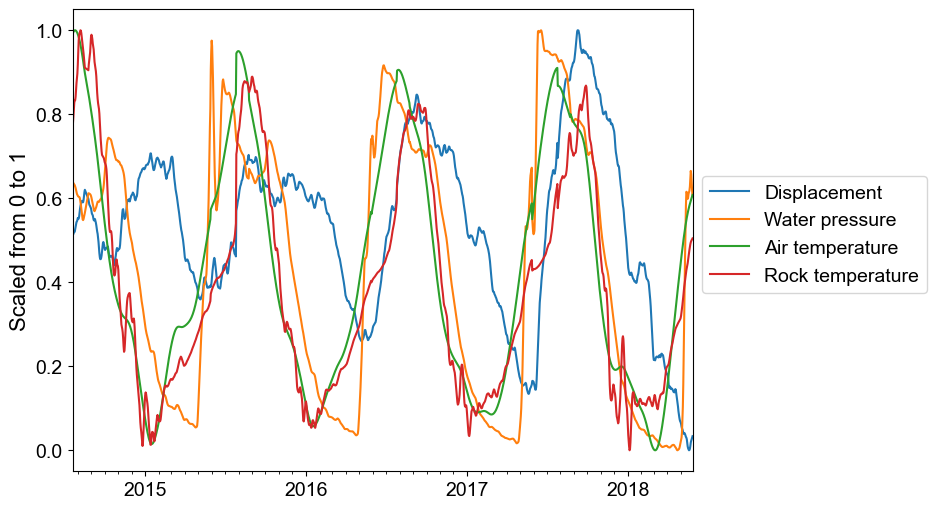

In [31]:
# Plotting scaled dataset
fig, ax = plt.subplots(figsize=(8, 6))

ax.plot(df.iloc[:,0], label='Displacement')
ax.plot(df.iloc[:,1], label='Water pressure')
ax.plot(df.iloc[:,2], label='Air temperature')
ax.plot(df.iloc[:,3], label='Rock temperature')

ax.legend(loc='upper left', bbox_to_anchor=(1, 0.66))
ax.set_ylabel("Scaled from 0 to 1")

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax.xaxis.set_minor_locator(months)
# Apply the year format for the major ticks again
ax.xaxis.set_major_formatter(years_fmt)


# # removing tick labels from the xaxis
# n = 1  # keeps every n row
# [l.set_visible(False) for (i,l) in enumerate(ax.xaxis.get_ticklabels()) if i % n != 0]


In [307]:
# need to have statinary data before running model
from statsmodels.tsa.api import ARDL
from statsmodels.tsa.ardl import ardl_select_order
# endog_alg = np.linspace(1,90,20).astype(int)  
# exog_lag = endog_alg

endog_alg = 90 # This process with all lags might never end? Try on a server at UiO. Yes, but also as slow but not on my computer..
exog_lag = endog_alg

sel_res = ardl_select_order(df['Disp'], endog_alg, df[['WP', 'Temp', 'Rock_temp']], exog_lag, ic="bic", trend="c")
print(f'The optimal order is: {sel_res.model.ardl_order}')
m1 = sel_res.model.fit()
print(m1.params)
print(m1.summary())

C:\Users\andregas\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)

KeyboardInterrupt



## Correlation table

In [235]:
import pandas as pd
import numpy as np
corr = df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None)
# Fill diagonal and upper half with NaNs
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
corr[mask] = np.nan
(corr
 .style
 .background_gradient(cmap='coolwarm', axis=None, vmin=-1, vmax=1)
 .highlight_null(color='#f1f1f1')  # Color NaNs grey
 .format(precision=2))

,Disp,WP,Temp,Rock_temp
Disp,nan,nan,nan,nan
WP,0.39,nan,nan,nan
Temp,0.21,0.81,nan,nan
Rock_temp,0.36,0.75,0.88,nan


## FFT

C:\Users\andregas\AppData\Local\Temp\ipykernel_10700\2357825107.py:32: RuntimeWarning: divide by zero encountered in divide
  periods = np.where(frequencies != 0, 1 / frequencies, 0)
C:\Users\andregas\AppData\Local\Temp\ipykernel_10700\2357825107.py:59: RuntimeWarning: divide by zero encountered in divide
  periods = np.where(frequencies != 0, 1 / frequencies, 0)


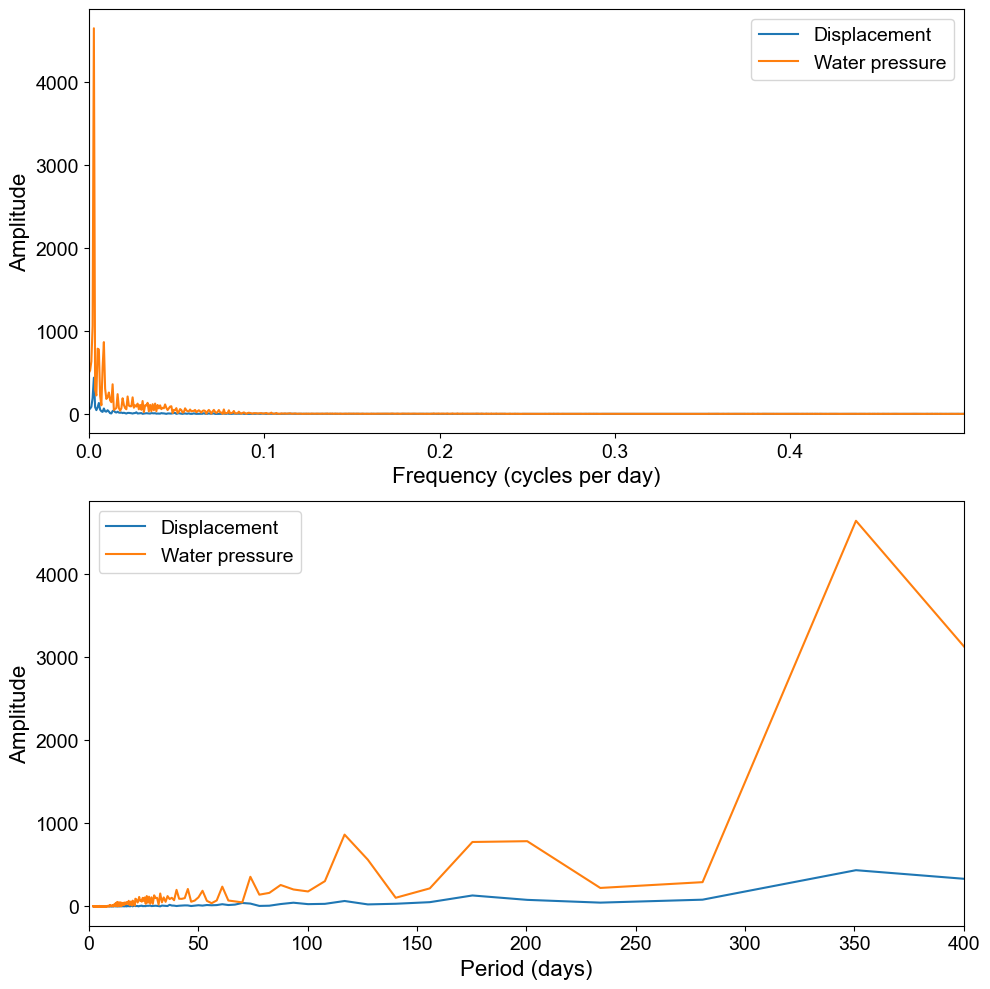

In [237]:

# Sample data: time-domain signal

# Number of samplepoints
N = int(((df_list[var].index[-1]-df_list[var].index[0]) / np.timedelta64(1, 'D')))
# sample spacing
T = 1.0 # frequency per day
t = np.linspace(0.0, N*T, N) # Time variable

# First variable
var = 0 # signal variable
signal = df_list[var].loc[:,'seasonal'].values

# Perform Fourier Transform
fft_result = np.fft.fft(signal)

# Get the corresponding frequencies
n = len(signal)
frequencies = np.fft.fftfreq(n, d=(t[1] - t[0]))

# Compute the amplitude
amplitude = np.abs(fft_result)

# Plot amplitude vs. frequency
fig, (ax1, ax2) =plt.subplots(figsize=(10, 10), nrows=2)

ax1.plot(frequencies[:n // 2], amplitude[:n // 2], label='Displacement')  # Only positive frequencies
# ax1.set_title("Amplitude vs. Frequency")
ax1.set_xlabel("Frequency (cycles per day)")
ax1.set_ylabel("Amplitude")

# Convert frequencies to periods (T = 1/f), avoid division by zero
periods = np.where(frequencies != 0, 1 / frequencies, 0)

# Mask out very small periods (e.g., less than 1 day) to avoid clutter
valid_idx = periods > 1  # Only include periods greater than 1 day

# Plot amplitude vs. period (focus on positive frequencies/periods)
ax2.plot(periods[valid_idx][:n // 2], amplitude[valid_idx][:n // 2], label='Displacement')  # Only positive frequencies


# Another variable
var = 1 # signal variable
signal = df_list[var].loc[:,'seasonal'].values

# Perform Fourier Transform
fft_result = np.fft.fft(signal)

# Get the corresponding frequencies
n = len(signal)
frequencies = np.fft.fftfreq(n, d=(t[1] - t[0]))

# Compute the amplitude
amplitude = np.abs(fft_result)

# Plot amplitude vs. period (focus on positive frequencies/periods)
ax1.plot(frequencies[:n // 2], amplitude[:n // 2], label='Water pressure')  # Only positive frequencies

# Convert frequencies to periods (T = 1/f), avoid division by zero
periods = np.where(frequencies != 0, 1 / frequencies, 0)

# Mask out very small periods (e.g., less than 1 day) to avoid clutter
valid_idx = periods > 1  # Only include periods greater than 1 day

# Plot amplitude vs. period (focus on positive frequencies/periods)
ax2.plot(periods[valid_idx][:n // 2], amplitude[valid_idx][:n // 2], label='Water pressure')  # Only positive frequencies



# Adjust x-axis limits to focus on relevant periods (0 to 400 days)
ax2.set_xlim(0, 400)
# ax2.set_title("Amplitude vs. Period (in days)")
ax2.set_xlabel("Period (days)")
ax2.set_ylabel("Amplitude")

# Final touches
ax1.legend()
ax2.legend()
plt.tight_layout()

C:\Users\andregas\AppData\Local\Temp\ipykernel_10700\4291463534.py:35: RuntimeWarning: divide by zero encountered in divide
  periods = np.where(frequencies != 0, 1 / frequencies, 0)
C:\Users\andregas\AppData\Local\Temp\ipykernel_10700\4291463534.py:58: RuntimeWarning: divide by zero encountered in divide
  periods = np.where(frequencies != 0, 1 / frequencies, 0)
C:\Users\andregas\AppData\Local\Temp\ipykernel_10700\4291463534.py:81: RuntimeWarning: divide by zero encountered in divide
  periods = np.where(frequencies != 0, 1 / frequencies, 0)
C:\Users\andregas\AppData\Local\Temp\ipykernel_10700\4291463534.py:104: RuntimeWarning: divide by zero encountered in divide
  periods = np.where(frequencies != 0, 1 / frequencies, 0)


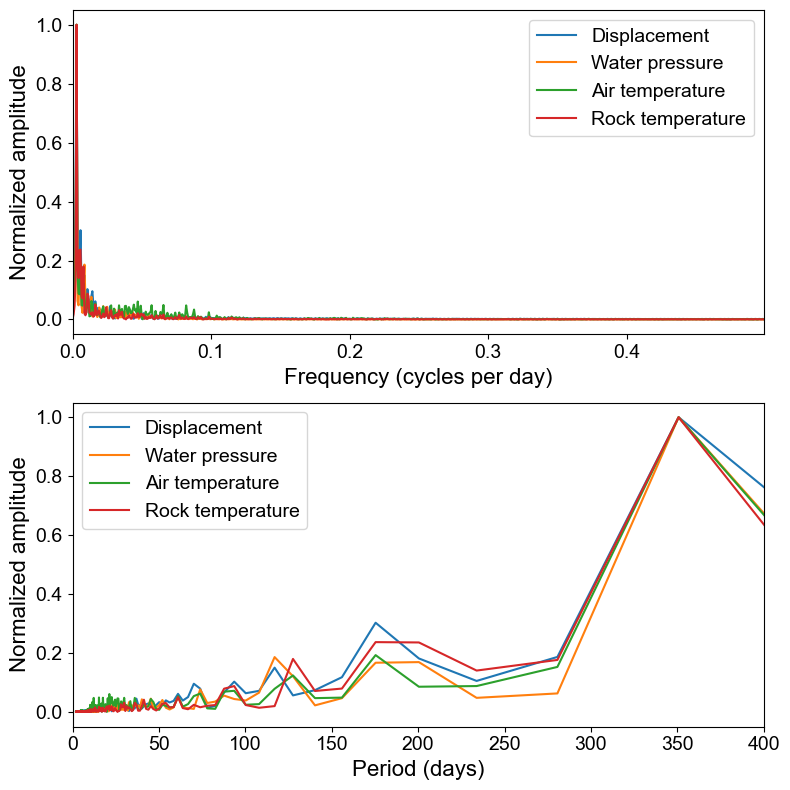

In [305]:
import numpy as np
import matplotlib.pyplot as plt

# Number of sample points
N = int(((df_list[var].index[-1] - df_list[var].index[0]) / np.timedelta64(1, 'D')))
# Sample spacing
T = 1.0  # frequency per day
t = np.linspace(0.0, N * T, N)  # Time variable

# Function to normalize amplitude
def normalize_amplitude(signal):
    fft_result = np.fft.fft(signal)
    amplitude = np.abs(fft_result) / len(signal)
    return amplitude / np.max(amplitude)

# First variable
var = 0  # signal variable
signal = df_list[var].loc[:, 'seasonal'].values

# Normalize the amplitude
amplitude = normalize_amplitude(signal)

# Get the corresponding frequencies
n = len(signal)
frequencies = np.fft.fftfreq(n, d=(t[1] - t[0]))

# Plot amplitude vs. frequency
fig, (ax1, ax2) = plt.subplots(figsize=(8, 8), nrows=2)

ax1.plot(frequencies[:n // 2], amplitude[:n // 2], label='Displacement')  # Only positive frequencies
ax1.set_xlabel("Frequency (cycles per day)")
ax1.set_ylabel("Normalized amplitude")

# Convert frequencies to periods (T = 1/f), avoid division by zero
periods = np.where(frequencies != 0, 1 / frequencies, 0)

# Mask out very small periods (e.g., less than 1 day) to avoid clutter
valid_idx = periods > 1  # Only include periods greater than 1 day

# Plot amplitude vs. period (focus on positive frequencies/periods)
ax2.plot(periods[valid_idx][:n // 2], amplitude[valid_idx][:n // 2], label='Displacement')  # Only positive frequencies

# second variable
var = 1  # signal variable
signal = df_list[var].loc[:, 'seasonal'].values

# Normalize the amplitude
amplitude = normalize_amplitude(signal)

# Get the corresponding frequencies
n = len(signal)
frequencies = np.fft.fftfreq(n, d=(t[1] - t[0]))

# Plot amplitude vs. period (focus on positive frequencies/periods)
ax1.plot(frequencies[:n // 2], amplitude[:n // 2], label='Water pressure')  # Only positive frequencies

# Convert frequencies to periods (T = 1/f), avoid division by zero
periods = np.where(frequencies != 0, 1 / frequencies, 0)

# Mask out very small periods (e.g., less than 1 day) to avoid clutter
valid_idx = periods > 1  # Only include periods greater than 1 day

# Plot amplitude vs. period (focus on positive frequencies/periods)
ax2.plot(periods[valid_idx][:n // 2], amplitude[valid_idx][:n // 2], label='Water pressure')  # Only positive frequencies

# third variable
var = 2  # signal variable
signal = df_list[var].loc[:, 'seasonal'].values

# Normalize the amplitude
amplitude = normalize_amplitude(signal)

# Get the corresponding frequencies
n = len(signal)
frequencies = np.fft.fftfreq(n, d=(t[1] - t[0]))

# Plot amplitude vs. period (focus on positive frequencies/periods)
ax1.plot(frequencies[:n // 2], amplitude[:n // 2], label='Air temperature')  # Only positive frequencies

# Convert frequencies to periods (T = 1/f), avoid division by zero
periods = np.where(frequencies != 0, 1 / frequencies, 0)

# Mask out very small periods (e.g., less than 1 day) to avoid clutter
valid_idx = periods > 1  # Only include periods greater than 1 day

# Plot amplitude vs. period (focus on positive frequencies/periods)
ax2.plot(periods[valid_idx][:n // 2], amplitude[valid_idx][:n // 2], label='Air temperature')  # Only positive frequencies

# Forth variable
var = 3 # signal variable
signal = df_list[var].loc[:, 'seasonal'].values

# Normalize the amplitude
amplitude = normalize_amplitude(signal)

# Get the corresponding frequencies
n = len(signal)
frequencies = np.fft.fftfreq(n, d=(t[1] - t[0]))

# Plot amplitude vs. period (focus on positive frequencies/periods)
ax1.plot(frequencies[:n // 2], amplitude[:n // 2], label='Rock temperature')  # Only positive frequencies

# Convert frequencies to periods (T = 1/f), avoid division by zero
periods = np.where(frequencies != 0, 1 / frequencies, 0)

# Mask out very small periods (e.g., less than 1 day) to avoid clutter
valid_idx = periods > 1  # Only include periods greater than 1 day

# Plot amplitude vs. period (focus on positive frequencies/periods)
ax2.plot(periods[valid_idx][:n // 2], amplitude[valid_idx][:n // 2], label='Rock temperature')  # Only positive frequencies

# Adjust x-axis limits to focus on relevant periods (0 to 400 days)
ax2.set_xlim(0, 400)
ax2.set_xlabel("Period (days)")
ax2.set_ylabel("Normalized amplitude")

# Final touches
ax1.legend()
ax2.legend()
plt.tight_layout()

# Upper plot. No daily signal, just longer duration signals as it dies above 0.1
# Lower plot. There are several spikes over the year with a peak yearly signal, and several peaks, bi-yearly, and around quarterly signals

## Wiener filter

In [4]:
# # # Wiener filter # # #
# use MMSE, filter weights mean squared errors and minimizes them
# assumptions: the two inputs are correlated and data needs to be stationary and zero mean
# x[n] and d[n] correlated with target s[n]


# Good explanation of filters! 
# https://tmramalho.github.io/blog/2013/04/05/an-introduction-to-smoothing-time-series-in-python-part-i-filtering-theory/
# https://tmramalho.github.io/blog/2013/04/09/an-introduction-to-smoothing-time-series-in-python-part-ii-wiener-filter-and-smoothing-splines/
# https://www.youtube.com/watch?v=9Zv63MAwvHU # the wiener filter explaiend

from scipy import optimize, fftpack

def wiener_filter_2(t, h, signal='gaussian', noise='flat', return_PSDs=False,
                  signal_params=None, noise_params=None):
    """Compute a Wiener-filtered time-series
    
    https://www.astroml.org/_modules/astroML/filters.html#wiener_filter

    Parameters
    ----------
    t : array_like
        evenly-sampled time series, length N
    h : array_like
        observations at each t
    signal : str (optional)
        currently only 'gaussian' is supported
    noise : str (optional)
        currently only 'flat' is supported
    return_PSDs : bool (optional)
        if True, then return (PSD, P_S, P_N)
    signal_guess : tuple (optional)
        A starting guess at the parameters for the signal.  If not specified,
        a suitable guess will be estimated from the data itself. (see Notes
        below)
    noise_guess : tuple (optional)
        A starting guess at the parameters for the noise.  If not specified,
        a suitable guess will be estimated from the data itself. (see Notes
        below)

    Returns
    -------
    h_smooth : ndarray
        a smoothed version of h, length N

    Notes
    -----
    The Wiener filter operates by fitting a functional form to the PSD::

       PSD = P_S + P_N

    The resulting frequency-space filter is given by::

       Phi = P_S / (P_S + P_N)

    This entire operation is equivalent to a kernel smoothing by a
    kernel whose Fourier transform is Phi.

    Choosing Signal/Noise Parameters
    ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
    the arguments ``signal_guess`` and ``noise_guess`` specify the initial
    guess for the characteristics of signal and noise used in the minimization.
    They are generally expected to be tuples, and the meaning varies depending
    on the form of signal and noise used.  For ``gaussian``, the params are
    (amplitude, width).  For ``flat``, the params are (amplitude,).

    See Also
    --------
    scipy.signal.wiener : a static (non-adaptive) wiener filter
    """
    # Validate signal
    if signal != 'gaussian':
        raise ValueError("only signal='gaussian' is supported")
    if signal_params is not None and len(signal_params) != 2:
        raise ValueError("signal_params should be length 2")

    # Validate noise
    if noise != 'flat':
        raise ValueError("only noise='flat' is supported")
    if noise_params is not None and len(noise_params) != 1:
        raise ValueError("noise_params should be length 1")

    # Validate t and hd
    t = np.asarray(t)
    h = np.asarray(h)

    if (t.ndim != 1) or (t.shape != h.shape):
        raise ValueError('t and h must be equal-length 1-dimensional arrays')

    # compute the PSD of the input
    N = len(t)
    Df = 1. / N / (t[1] - t[0])
    f = fftpack.ifftshift(Df * (np.arange(N) - N / 2))

    H = fftpack.fft(h)
    PSD = abs(H) ** 2

    # fit signal/noise params if necessary
    if signal_params is None:
        amp_guess = np.max(PSD[1:])
        width_guess = np.min(np.abs(f[PSD < np.mean(PSD[1:])]))
        signal_params = (amp_guess, width_guess)
    if noise_params is None:
        noise_params = (np.mean(PSD[1:]),)

    # Set up the Wiener filter:
    #  fit a model to the PSD: sum of signal form and noise form

    def signal(x, A, width):
        width = abs(width) + 1E-99  # prevent divide-by-zero errors
        return A * np.exp(-0.5 * (x / width) ** 2)

    def noise(x, n):
        return n * np.ones(x.shape)

    # use [1:] here to remove the zero-frequency term: we don't want to
    # fit to this for data with an offset.
    def min_func(v): return np.sum((PSD[1:] - signal(f[1:], v[0], v[1]) - noise(f[1:], v[2])) ** 2)
    v0 = tuple(signal_params) + tuple(noise_params)
    v = optimize.minimize(min_func, v0, method='Nelder-Mead')['x']

    P_S = signal(f, v[0], v[1])
    P_N = noise(f, v[2])
    Phi = P_S / (P_S + P_N)
    Phi[0] = 1  # correct for DC offset

    # Use Phi to filter and smooth the values
    h_smooth = fftpack.ifft(Phi * H)

    if not np.iscomplexobj(h):
        h_smooth = h_smooth.real

    if return_PSDs:
        return h_smooth, PSD, P_S, P_N, Phi
    else:
        return h_smooth
    
# https://github.com/fhchl/adafilt/blob/master/adafilt/optimal.py

from scipy.signal import csd, welch 

def wiener_filter(x, d, n, g=None, constrained=False):
    """Compute optimal wiener filter for single-channel control.

    From Elliot, Signal Processing for Optimal Control, Eq. 3.3.26

    Parameters
    ----------
    x : array_like
        Reference signal.
    d : array_like
        Disturbance signal.
    n : int
        Output filter length.
    g : None or array_like, optional
        Secondary path impulse response.
    constrained : bool, optional
        If True, constrain filter to be causal.

    Returns
    -------
    numpy.ndarray, shape (n,)
        Optimal wiener filter in freqency domain.

    """
    if g is None:
        g = [1]

    G = np.fft.fft(g, n=n)

    # NOTE: one could time align the responses here first
    _, Sxd = csd(x, d, nperseg=n, return_onesided=False)
    _, Sxx = welch(x, nperseg=n, return_onesided=False)

    if not constrained:
        return - Sxd / Sxx / G

    c = np.ones(n)
    c[n // 2:] = 0
    # half at DC and Nyquist
    c[0] = 0.5
    if n % 2 == 0:
        c[n // 2] = 0.5

    # minimum phase and allpass components of G
    # NOTE: could also use https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.minimum_phase.html
    Gmin = np.exp(np.fft.fft(c * np.fft.ifft(2 * np.log(np.abs(G)), n=n), n=n))
    Gall = G / Gmin

    # spectral factor
    # NOTE: could also use https://github.com/RJTK/spectral_factorization/blob/master/spectral_factorization.py
    F = np.exp(np.fft.fft(c * np.fft.ifft(np.log(Sxx), n=n), n=n))

    h = np.ones(n)
    h[n // 2:] = 0
    return - np.fft.fft(h * np.fft.ifft(Sxd / F.conj() / Gall), n=n) / (F * Gmin)


def multi_channel_wiener_filter(x, d, n, g=None, beta=0):
    """Compute optimal wiener filter for multi-channel control.

    From Elliot, Signal Processing for Optimal Control, Eq. 5.3.31

    Parameters
    ----------
    x : array_like, shape (N1[, K])
        K reference signals.
    d : array_like, shape (N2[, L])
        L disturbance signals.
    n : int
        Output filter length.
    g : None or array_like, shape (N3[, L[, M]]), optional
        Secondary path impulse response.
    beta: float
        Variance of added white noise to reference signals for regularization.

    Returns
    -------
    numpy.ndarray, shape (n,[, M])
        Optimal wiener filter in freqency domain.

    """
    if g is None:
        g = [1]

    x = atleast_2d(x)
    d = atleast_2d(d)
    g = atleast_3d(g)

    Nin = x.shape[1]
    _, Nmic, Nout = g.shape

    G = np.fft.fft(g, n=n, axis=0)

    # TODO: align in time during correlation
    Sxx = np.zeros((n, Nin, Nin), dtype=complex)
    for i in range(Nin):
        for j in range(Nin):
            _, S = csd(x[:, i], x[:, j], nperseg=n, return_onesided=False)
            Sxx[:, i, j] = S

    Sxd = np.zeros((n, Nmic, Nin), dtype=complex)
    for i in range(Nmic):
        for j in range(Nin):
            _, S = csd(x[:, j], d[:, i], nperseg=n, return_onesided=False)
            Sxd[:, i, j] = S

    return - np.linalg.pinv(G) @ Sxd @ np.linalg.pinv(Sxx + beta * np.identity(Nin))

C:\Users\andregas\AppData\Local\anaconda3\Lib\site-packages\matplotlib\cbook\__init__.py:1340: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


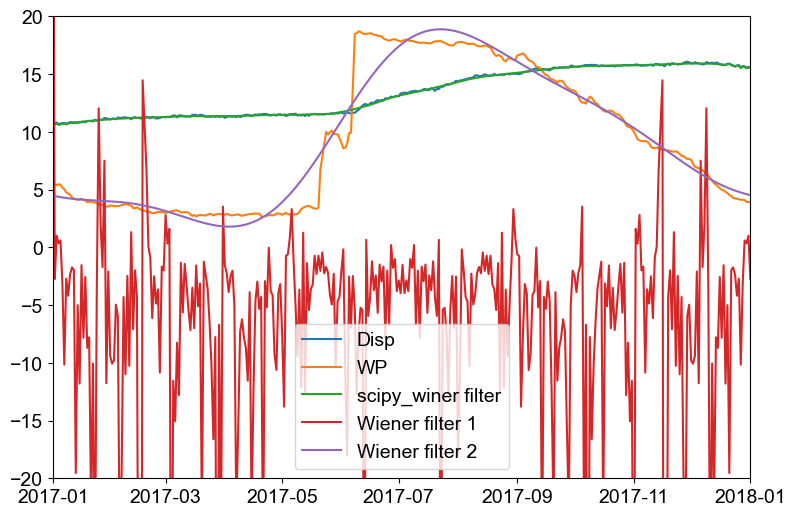

In [270]:
# Testing filters and plotting
#### create slice of df  #####
start_time = pd.Timestamp('2017-01-01')
end_time = pd.Timestamp('2018-01-01')

x = JTT2DispUpperZone.iloc[:,0] # 0 = disp, -3 = 12 days, -1 = 60 days
x = x[x.index.slice_indexer(start_time,end_time)]
x = x.resample('1d').median()

y = JTT2WpUpperZone.iloc[:,0]
y = y[y.index.slice_indexer(start_time,end_time)]
y = y.resample('1d').median()

df = pd.DataFrame({'Disp':x, 'WP':y})
df.dropna(inplace=True)


x = df.loc[:,'Disp'] # dates.date2num(df.index)
d = df.loc[:,'WP']

filtered_1 = wiener_filter(x=x, d=d, n=len(df.index), g=None, constrained=True) # I do not understand this filter

# filtering and plotting
t = x # dates.date2num(df.index) # Seems like this should be 'timesteps'
h = d

filtered_2, PSD, P_S, P_N, Phi= wiener_filter_2(t, h, signal='gaussian', noise='flat', return_PSDs=True, signal_params=None, noise_params=None)

from scipy.signal import wiener

scipy_winer = wiener(x, mysize=30, noise=0.5) # mysize = size of wiener filter window

fig, ax =plt.subplots(figsize=(9, 6))
ax.plot(df.index, x, label=x.name)
ax.plot(df.index, d, label=d.name)
ax.plot(df.index, scipy_winer, label='scipy_winer filter')
ax.plot(df.index, filtered_1, label='Wiener filter 1') # this one needs two inputs which is not the timesteps I think, as it went crazy
ax.plot(df.index, filtered_2, label='Wiener filter 2') # looks similar to scipy version
ax.set_ylim(-20,20)
ax.legend()

In [323]:
df_train.head()

,Disp,WP,Temp,Rock_temp
2015-01-01,1.833209,4.160872,-2.35,-2.388690
2015-01-02,1.841365,3.910930,-0.75,-2.504340
2015-01-03,1.878110,3.827627,-4.05,-2.831905
2015-01-04,1.931627,3.892274,-5.45,-3.316370
2015-01-05,1.934592,3.921822,-10.45,-3.734040


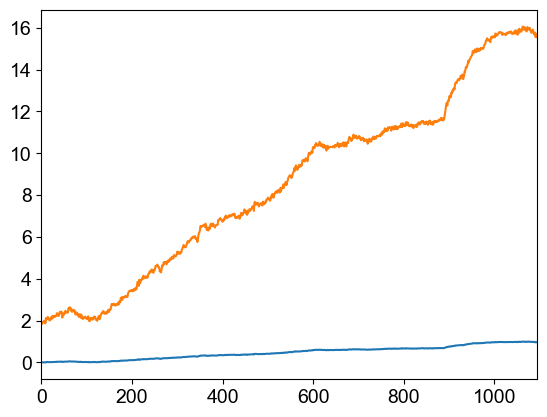

In [329]:
test = df_train.iloc[:,0].values.reshape(-1, 1)
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler() # normalize between 0 and 1, has to be this when dataset is not normally distributed
series = scaler.fit_transform(test) # transform to normalized values
plt.plot(series)
series2 = scaler.inverse_transform(series) # transform back to original
plt.plot(series2)
# this seems to work

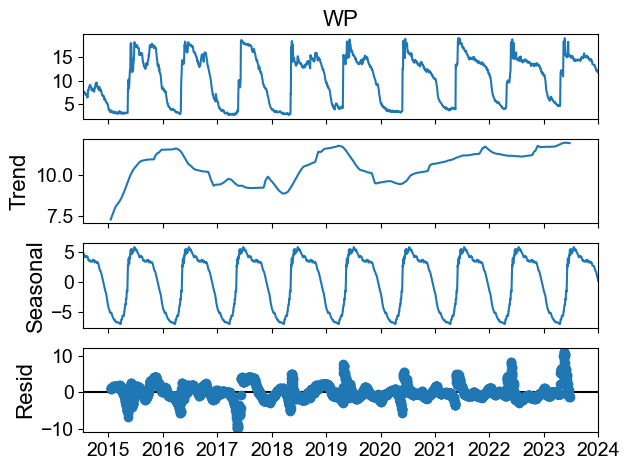

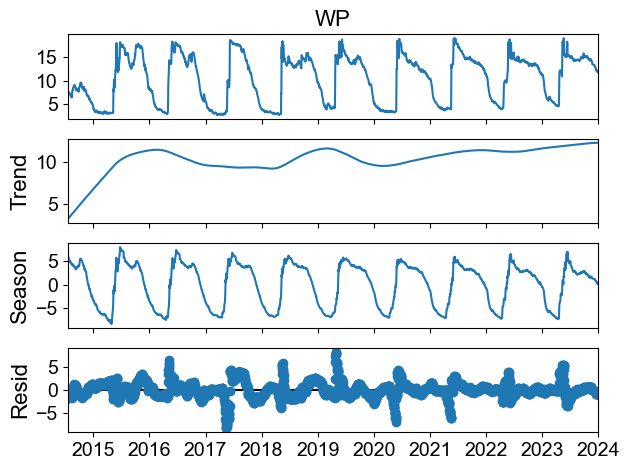

In [19]:
#### create slice of df  #####
start_time = pd.Timestamp('2014-01-01')
end_time = pd.Timestamp('2024-01-01')

x = JTT2DispUpperZone.iloc[:,0] # 0 = disp, -3 = 12 days, -1 = 60 days
x = x[x.index.slice_indexer(start_time,end_time)]
x = x.resample('1d').median()

y = JTT2WpUpperZone.iloc[:,0]
y = y[y.index.slice_indexer(start_time,end_time)]
y = y.resample('1d').median()

z = jtt_xgeo_temp.iloc[:,0] # daily data intervals
z = z[z.index.slice_indexer(start_time,end_time)]
z = z.resample('1d').median()

f = ST.iloc[:,0] # hourly data intervals
f = f[f.index.slice_indexer(start_time,end_time)]
f = f.resample('1d').median()

df = pd.DataFrame({'Disp':x, 'WP':y})
# df = pd.DataFrame({'Disp':x, 'WP':y, 'Temp': z, 'Rock_temp':f})
df.dropna(inplace=True)

# transform before seasonal decomposition to achive stationarity
df_train = df.copy()
data = df_train.iloc[:,1].copy()
freq=365
from statsmodels.tsa.seasonal import seasonal_decompose
decomposed_series = seasonal_decompose(data, model='additive', period=freq,)
decomposed_series.plot()
plt.show()

# apparently the STL is far better and I should use it instead. With these parameters it seems similar to seasonal_decompose/traditional method
from statsmodels.tsa.seasonal import STL
res = STL(data, seasonal=13, period=365).fit()
res.plot()
plt.show()

In [251]:
### Granger Causality test ###
# https://www.machinelearningplus.com/time-series/granger-causality-test-in-python/?utm_content=cmp-true

# looks at lags and provide significance below 0.1 or 0.05 if variable in second column is caused by first column.

from statsmodels.tsa.stattools import grangercausalitytests
def grangers_causation_matrix(data, variables, maxlag=90, test='ssr_chi2test', verbose=False):    
    """Check Granger Causality of all possible combinations of the Time series.
    The rows are the response variable, columns are predictors. The values in the table 
    are the P-Values. P-Values lesser than the significance level (0.05), implies 
    the Null Hypothesis that the coefficients of the corresponding past values is 
    zero, that is, the X does not cause Y can be rejected.

    data      : pandas dataframe containing the time series variables
    variables : list containing names of the time series variables.
    """
    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
        for r in df.index:
            test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            df.loc[r, c] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df

grang_test = grangers_causation_matrix(df, variables = df_train.columns, maxlag=90) # 3 months and daily values
print(grang_test) # not sure if this is working optimally

# causing if p > 0.05, with seasonal dataset seems like notting is causing the other..

C:\Users\andregas\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\Users\andregas\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\Users\andregas\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\Users\andregas\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\Users\andregas\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
C:\Users\andregas\AppData\Local\anaconda3\Lib\site

             Disp_x  WP_x  Temp_x  Rock_temp_x
Disp_y          1.0   0.0     0.0       0.0000
WP_y            0.0   1.0     0.0       0.0025
Temp_y          0.0   0.0     1.0       0.0000
Rock_temp_y     0.0   0.0     0.0       1.0000


## Cross-correlations

In [4]:
# Look at this to understand how to proceed on this subject: 
# https://stats.stackexchange.com/questions/361674/correlation-of-non-stationary-time-series
# and read this file:///C:/Users/andregas/Downloads/ARDL_JournalofStatisticalandEconometricMethods.pdf 
# to understand ARDL and try that. Figure out if I have to transition to R, I hope not.

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\andregas\\UiO Dropbox\\Andreas Aspaas\\PhD_local\\PhD_work\\Dataanalysis_project\\MonitoringData\\Jettan\\plots\\crosscorr_Int_deformation_dv\\v(%)_lag6.png'

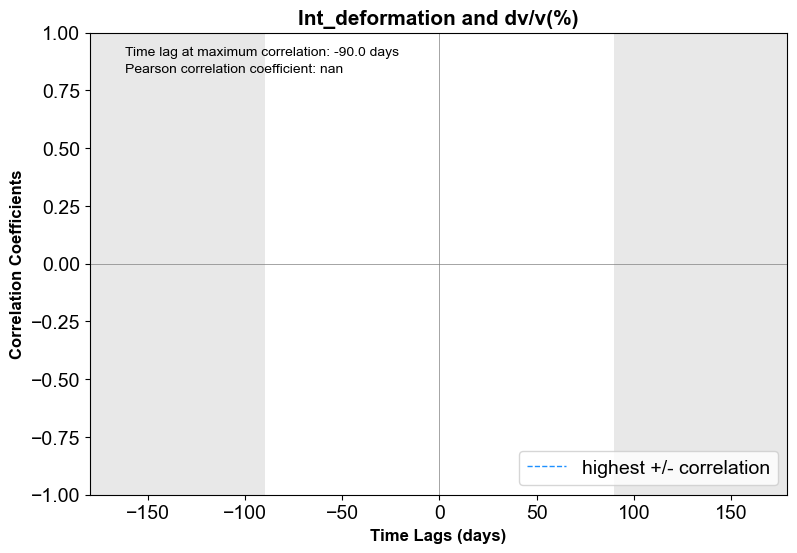

In [85]:
# This method is good. Same outcome as for statsmodels ccf

# Do correlations on stationary variables!

crosscorr_lag = 6 # tried 3 months did not work, tried 12 months = too much. Try 6 months now and only look at 3 months by graying out the boarders.

series1 = df.iloc[:,0] # seasonal disp
series2 = df.iloc[:,1] # seasonal wp

# series1 = df.iloc[:,0] # seasonal disp
# series2 = df.iloc[:,3] # seasonal rock temp

# Set the maximum lag you want to consider
h = 1 # NB !frequency per day! 
n_months = crosscorr_lag
period =h*90 # we assume correlation should happen within 90 days
max_lag = n_months*30*h
lags = range(-max_lag, max_lag)

# Initialize arrays to store results
correlation_coefficients = []
p_values = []

# Loop through different time lags (both positive and negative)
for lag in lags:
    # Calculate Pearson correlation coefficient and p-value
    if lag < 0:
        correlation_coefficient, p_value = pearsonr(series1[:lag], series2[-lag:])
    elif lag == 0:
        correlation_coefficient, p_value = pearsonr(series1, series2)
    else:
        correlation_coefficient, p_value = pearsonr(series1[lag:], series2[:-lag])
    
    # Append results to arrays
    correlation_coefficients.append(correlation_coefficient)
    p_values.append(p_value)

# # Find the lag with the maximum absolute correlation for entire time series
# max_corr_index = np.argmax(np.abs(correlation_coefficients))
# max_corr_lag = lags[max_corr_index]

# Find the lag with the maximum absolute correlation within +/- 3 months
corr_window = correlation_coefficients[period:period*3]
max_corr_index = np.argmax(np.abs(corr_window))
max_corr_lag = lags[period:period*3][max_corr_index]

n_std = 2
small_size = 10

import scipy.stats as st 
def ccf_plot(lags, ccf):
    fig, ax =plt.subplots(figsize=(9, 6))
    ax.plot(lags, ccf, color='black', lw=1)
    ax.axvline(x = 0, color = 'gray', lw = 0.5)
    ax.axhline(y = 0, color = 'gray', lw = 0.5)
    ax.axhline(y = np.max(ccf), color = 'dodgerblue', lw = 1, linestyle='--', label = 'highest +/- correlation')
    ax.axhline(y = np.min(ccf), color = 'dodgerblue', lw = 1, linestyle='--')
    ax.plot(max_corr_lag/h, corr_window[max_corr_index], color='red', marker='o', markersize=4, alpha=0.5) # zorder=0 # point to highlight max within corr_window # point to highlight max within corr_window
    
    # # 2 x std
    # ax.axhline(y = np.mean(ccf)+n_std*np.std(ccf), color = 'darkorange', lw = 1, linestyle='--', label = f'{n_std} x std')
    # ax.axhline(y = np.mean(ccf)-n_std*np.std(ccf), color = 'darkorange', lw = 1, linestyle='--')
    # # # 1 x std
    # # ax.axhline(y = np.mean(ccf)+1*np.std(ccf), color = 'red', lw = 1, linestyle='--', label = f'{1} x std')
    # # ax.axhline(y = np.mean(ccf)-1*np.std(ccf), color = 'red', lw = 1, linestyle='--')
    
    # gray out area
    ax.axvspan(lags_plot[0], -90, facecolor='lightgray', alpha=0.5)
    ax.axvspan(+90,lags_plot[-1], facecolor='lightgray', alpha=0.5)
    
    # text in the plot
    y_pos = lags_plot[0]-(lags_plot[0]*0.1)
    ax.text(y_pos, 0.90, f'Time lag at maximum correlation: {max_corr_lag/h:.1f} days', horizontalalignment='left', color='k', fontsize=small_size)
    ax.text(y_pos, 0.83, f'Pearson correlation coefficient: {corr_window[max_corr_index]:.2f}', horizontalalignment='left', color='k', fontsize=small_size)
    # ax.text(y_pos, 0.76, f'2 x standard deviation: +{np.mean(ccf)+n_std*np.std(ccf):.2f}/{np.mean(ccf)-n_std*np.std(ccf):.2f}', horizontalalignment='left', color='k', fontsize=small_size)
    pval = []
    # if p_values[max_corr_index] < 0.001:
    #     ax.text(y_pos, 0.69, f'P-value: <0.001', horizontalalignment='left', color='k', fontsize=small_size)
    # else:
    #     ax.text(y_pos, 0.69, f'P-value: {p_values[max_corr_index]:.3f}', horizontalalignment='left', color='k', fontsize=small_size)
    
    # cosmetics
    ax.set(ylim = [-1, 1])
    ax.set_title(f'{series1.name} and {series2.name}', weight='bold', fontsize = 15)
    ax.set_ylabel('Correlation Coefficients', weight='bold', fontsize = 12)
    ax.set_xlabel('Time Lags (days)', weight='bold', fontsize = 12)
    
    plt.legend(loc='lower right')
    
    # saving
    path = 'plots\\'
    save_name = f'{path}crosscorr_{series1.name}_{series2.name}_lag{n_months}.png'
    fig.savefig(save_name, dpi=300, bbox_inches='tight')
    
# changing lags to days
lags_plot = np.linspace(lags[0]/h,lags[-1]/h, num=int(max_lag*2)) # days

ccf_plot(lags_plot, correlation_coefficients)

# the first variable (x) is leading if negative lage time, and second variable (y) is leading if positive lag time

In [212]:
### Granger Causality test ###
# perhaps do the Granger Causality test? https://www.machinelearningplus.com/time-series/granger-causality-test-in-python/?utm_content=cmp-true

# looks at lags and provide significance below 0.1 or 0.05 if variable in second column is caused by first column.

from statsmodels.tsa.stattools import grangercausalitytests
def grangers_causation_matrix(data, variables, maxlag=max_lag, test='ssr_chi2test', verbose=False):    
    """Check Granger Causality of all possible combinations of the Time series.
    The rows are the response variable, columns are predictors. The values in the table 
    are the P-Values. P-Values lesser than the significance level (0.05), implies 
    the Null Hypothesis that the coefficients of the corresponding past values is 
    zero, that is, the X does not cause Y can be rejected.

    data      : pandas dataframe containing the time series variables
    variables : list containing names of the time series variables.
    """
    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
        for r in df.index:
            test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            df.loc[r, c] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df

grang = pd.DataFrame({'col1': series1.values, 'col2': series2.values})
grang_test = grangers_causation_matrix(grang, variables=grang.columns, maxlag=max_lag/2)
print(grang_test)

C:\Users\andregas\AppData\Local\anaconda3\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


InfeasibleTestError: The Granger causality test statistic cannot be compute because the VAR has a perfect fit of the data.

In [225]:
df_train.head()

,Disp,WP,Temp,Rock_temp
2015-01-01,1.833209,4.160872,-2.35,-2.388690
2015-01-02,1.841365,3.910930,-0.75,-2.504340
2015-01-03,1.878110,3.827627,-4.05,-2.831905
2015-01-04,1.931627,3.892274,-5.45,-3.316370
2015-01-05,1.934592,3.921822,-10.45,-3.734040


In [226]:
grangercausalitytests(df_train.loc[:,['WP','Temp']], maxlag=90) # this suggests WP cause Disp


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9623  , p=0.3268  , df_denom=1243, df_num=1
ssr based chi2 test:   chi2=0.9647  , p=0.3260  , df=1
likelihood ratio test: chi2=0.9643  , p=0.3261  , df=1
parameter F test:         F=0.9623  , p=0.3268  , df_denom=1243, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.9497  , p=0.3871  , df_denom=1240, df_num=2
ssr based chi2 test:   chi2=1.9070  , p=0.3854  , df=2
likelihood ratio test: chi2=1.9056  , p=0.3857  , df=2
parameter F test:         F=0.9497  , p=0.3871  , df_denom=1240, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.1405  , p=0.3315  , df_denom=1237, df_num=3
ssr based chi2 test:   chi2=3.4408  , p=0.3285  , df=3
likelihood ratio test: chi2=3.4361  , p=0.3291  , df=3
parameter F test:         F=1.1405  , p=0.3315  , df_denom=1237, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.2917  , p=0.

{1: ({'ssr_ftest': (0.9623332988131531, 0.3267905972473487, 1243.0, 1),
   'ssr_chi2test': (0.964655905326781, 0.32601660686355327, 1),
   'lrtest': (0.9642826786016485, 0.3261102135249606, 1),
   'params_ftest': (0.9623332988133146, 0.3267905972472793, 1243.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (0.9496856572638338, 0.38714380797507286, 1240.0, 2),
   'ssr_chi2test': (1.9070300698281821, 0.3853840016410938, 2),
   'lrtest': (1.905571011914617, 0.38566525300780613, 2),
   'params_ftest': (0.9496856572628545, 0.38714380797544634, 1240.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (1.1404840068152615, 0.3315394137415431, 1237.0, 3),
   'ssr_chi2test': (3.440813511264799, 0.3285199279389072, 3),
   'lrtest': (3.4360637476393094, 0.3291496012329709, 3),
   'params_ftest': (1.1404840068160453, 0.33153941374123114, 1237.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0., 0., 1., 0., 0.],
          [0., 

In [47]:
start_time = pd.Timestamp('2018-01-01')
end_time = pd.Timestamp('2024-01-01')

x = JTT2DispUpperZone.iloc[:,-1] # 60 days, -3 = 12 days, diff is 0.51 for 12 and 0.67 for 60 days
x = x[x.index.slice_indexer(start_time,end_time)]
y = JTT2WpUpperZone.iloc[:,0]
y = y[y.index.slice_indexer(start_time,end_time)]
df = pd.DataFrame({'Vel':x.values, 'WP':y.values})
df.corr()

,Vel,WP
Vel,1.000000,0.664969
WP,0.664969,1.000000


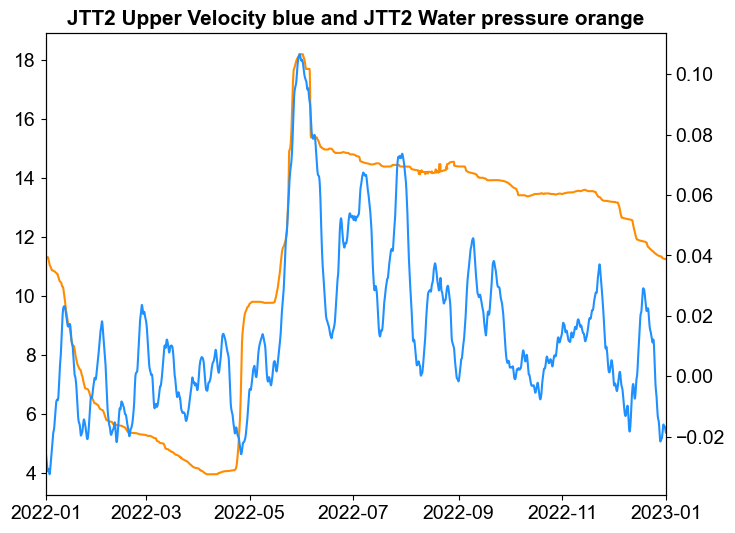

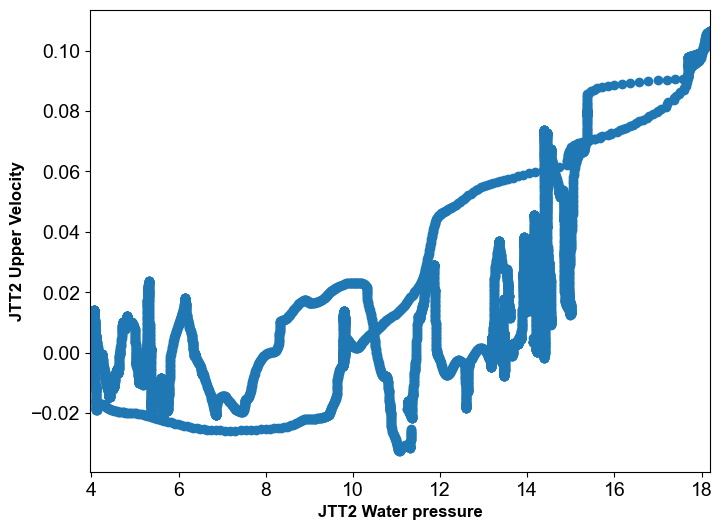

In [63]:
# data
days = 12
n = (days*24)+1 # kernel size, multiply by n rows per day, +1 to make odd number

# # # #borehole
x = JTT2DispUpperZone.loc[:,'12_days_velocity [mm/day]:'] # 12 days velocity
var1 = 'JTT2 Upper Velocity'

# x = JTT2DispLowerZone.loc[:,'12_days_velocity [mm/day]:'] # 12 days velocity
# var1 = 'JTT2 Lower Velocity'

# # water level
file3 = JTT2WpUpperZone.copy()

# ## median filter makes it nosy because the change is so abrupt
file3.iloc[:,0] = medfilt(file3.iloc[:,0], kernel_size=n) # median filter

file3 = file3.iloc[:,0]
y = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
var2 = 'JTT2 Water pressure'


# # make equal length of dfs
# time_start = pd.Timestamp('2018-01-01') # x.index[0]
# time_end = pd.Timestamp('2024-01-01') # x.index[-1]

time_start = pd.Timestamp('2022-01-01') # x.index[0]
time_end = pd.Timestamp('2023-01-01') # x.index[-1]

y = y[y.index.slice_indexer(time_start,time_end)]
# end at the same time 
# time_end = y.index[-1]
x = x[x.index.slice_indexer(time_start,time_end)]

# https://www.datainsightonline.com/post/cross-correlation-with-two-time-series-in-python # link to what I want to check!

# look at data
fig, ax = plt.subplots(figsize=(8, 6), sharex=True)
ax.plot(y, color='darkorange')
ax_y = ax.twinx()
ax_y.plot(x, color='dodgerblue')

plt.title(f'{var1} blue and {var2} orange', weight='bold', fontsize = 15)
plt.show()

# removing nans to be able to plot against eachother
d = {'y': y, 'x': x}
df = pd.DataFrame(data=d)
df.dropna(inplace=True)

fig = plt.figure(figsize = (8, 6))
plt.scatter(y, x)
plt.ylabel(var1, weight='bold', fontsize = 12)
plt.xlabel(var2, weight='bold', fontsize = 12)
plt.show()

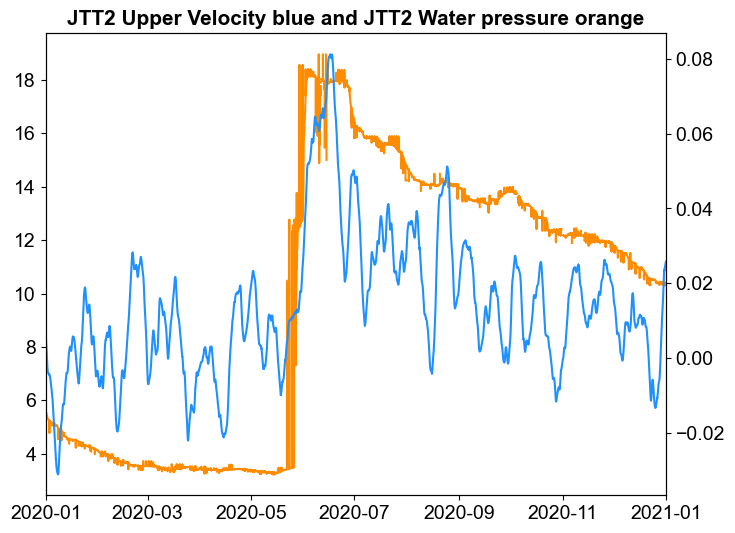

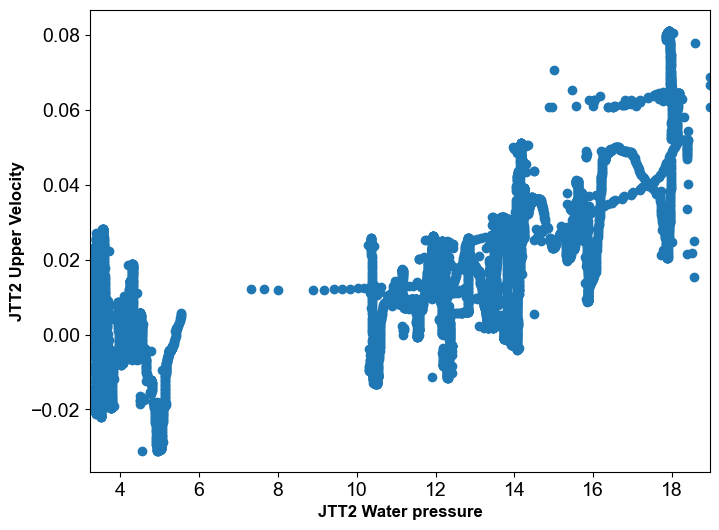

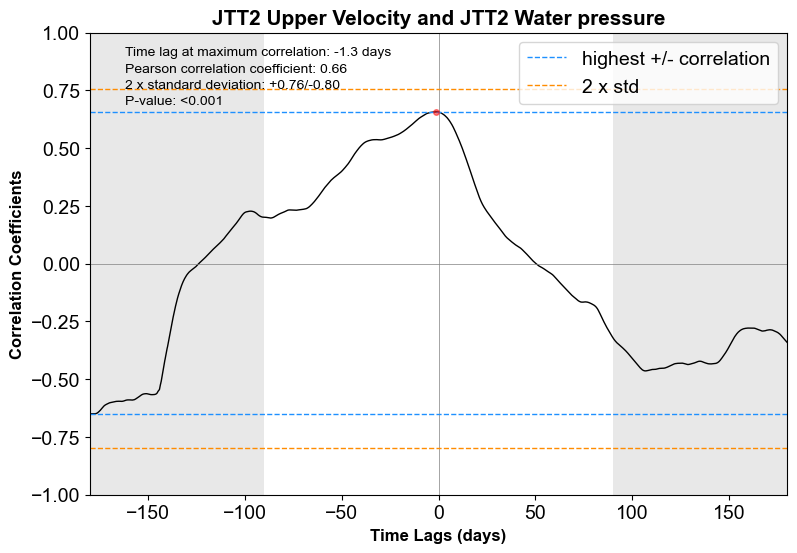

In [65]:
### 1h data
gnss = False
met = False

crosscorr_lag = 6 # tried 3 months did not work, tried 12 months = too much. Try 6 months now and only look at 3 months by graying out the boarders.

# data
days = 12
n = (days*24)+1 # kernel size, multiply by n rows per day, +1 to make odd number

# # # #borehole
x = JTT2DispUpperZone.loc[:,'12_days_velocity [mm/day]:'] # 12 days velocity
var1 = 'JTT2 Upper Velocity'

# x = JTT2DispLowerZone.loc[:,'12_days_velocity [mm/day]:'] # 12 days velocity
# var1 = 'JTT2 Lower Velocity'

# # water level
file3 = JTT2WpUpperZone.copy()

## median filter makes it nosy because the change is so abrupt
file3.iloc[:,0] = medfilt(file3.iloc[:,0], kernel_size=n) # median filter

file3 = file3.iloc[:,0]
y = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
var2 = 'JTT2 Water pressure'


# make equal length of dfs
# time_start = pd.Timestamp('2018-01-01') # x.index[0]
# time_end = pd.Timestamp('2024-01-01') # x.index[-1]

time_start = pd.Timestamp('2020-01-01') # x.index[0]
time_end = pd.Timestamp('2021-01-01') # x.index[-1]

y = y[y.index.slice_indexer(time_start,time_end)]
# end at the same time 
# time_end = y.index[-1]
x = x[x.index.slice_indexer(time_start,time_end)]

# https://www.datainsightonline.com/post/cross-correlation-with-two-time-series-in-python # link to what I want to check!

# look at data
fig, ax = plt.subplots(figsize=(8, 6), sharex=True)
ax.plot(y, color='darkorange')
ax_y = ax.twinx()
ax_y.plot(x, color='dodgerblue')

plt.title(f'{var1} blue and {var2} orange', weight='bold', fontsize = 15)
plt.show()

# removing nans to be able to plot against eachother
d = {'y': y, 'x': x}
df = pd.DataFrame(data=d)
df.dropna(inplace=True)

fig = plt.figure(figsize = (8, 6))
plt.scatter(y, x)
plt.ylabel(var1, weight='bold', fontsize = 12)
plt.xlabel(var2, weight='bold', fontsize = 12)
plt.show()

# Assuming you have two time series arrays, series1 and series2
# Replace these with your actual data

series1 = df['x']
series2 = df['y']

# Set the maximum lag you want to consider
h = 24
if gnss:
    h = 2
if met:
    h = 1
n_months = crosscorr_lag
period =24*90 # we assume correlation should happen within 90 days
max_lag = n_months*30*h
lags = range(-max_lag, max_lag)

# Initialize arrays to store results
correlation_coefficients = []
p_values = []

# Loop through different time lags (both positive and negative)
for lag in lags:
    # Calculate Pearson correlation coefficient and p-value
    if lag < 0:
        correlation_coefficient, p_value = pearsonr(series1[:lag], series2[-lag:])
    elif lag == 0:
        correlation_coefficient, p_value = pearsonr(series1, series2)
    else:
        correlation_coefficient, p_value = pearsonr(series1[lag:], series2[:-lag])
    
    # Append results to arrays
    correlation_coefficients.append(correlation_coefficient)
    p_values.append(p_value)

# # Find the lag with the maximum absolute correlation for entire time series
# max_corr_index = np.argmax(np.abs(correlation_coefficients))
# max_corr_lag = lags[max_corr_index]

# Find the lag with the maximum absolute correlation within +/- 3 months
corr_window = correlation_coefficients[period:period*3]
max_corr_index = np.argmax(np.abs(corr_window))
max_corr_lag = lags[period:period*3][max_corr_index]

n_std = 2
small_size = 10

import scipy.stats as st 
def ccf_plot(lags, ccf):
    fig, ax =plt.subplots(figsize=(9, 6))
    ax.plot(lags, ccf, color='black', lw=1)
    ax.axvline(x = 0, color = 'gray', lw = 0.5)
    ax.axhline(y = 0, color = 'gray', lw = 0.5)
    ax.axhline(y = np.max(ccf), color = 'dodgerblue', lw = 1, linestyle='--', label = 'highest +/- correlation')
    ax.axhline(y = np.min(ccf), color = 'dodgerblue', lw = 1, linestyle='--')
    ax.plot(max_corr_lag/h, corr_window[max_corr_index], color='red', marker='o', markersize=4, alpha=0.5) # zorder=0 # point to highlight max within corr_window # point to highlight max within corr_window
    
    # 2 x std
    ax.axhline(y = np.mean(ccf)+n_std*np.std(ccf), color = 'darkorange', lw = 1, linestyle='--', label = f'{n_std} x std')
    ax.axhline(y = np.mean(ccf)-n_std*np.std(ccf), color = 'darkorange', lw = 1, linestyle='--')
    # # 1 x std
    # ax.axhline(y = np.mean(ccf)+1*np.std(ccf), color = 'red', lw = 1, linestyle='--', label = f'{1} x std')
    # ax.axhline(y = np.mean(ccf)-1*np.std(ccf), color = 'red', lw = 1, linestyle='--')
    
    # gray out area
    ax.axvspan(lags_plot[0], -90, facecolor='lightgray', alpha=0.5)
    ax.axvspan(+90,lags_plot[-1], facecolor='lightgray', alpha=0.5)
    
    # text in the plot
    y_pos = lags_plot[0]-(lags_plot[0]*0.1)
    ax.text(y_pos, 0.90, f'Time lag at maximum correlation: {max_corr_lag/h:.1f} days', horizontalalignment='left', color='k', fontsize=small_size)
    ax.text(y_pos, 0.83, f'Pearson correlation coefficient: {corr_window[max_corr_index]:.2f}', horizontalalignment='left', color='k', fontsize=small_size)
    ax.text(y_pos, 0.76, f'2 x standard deviation: +{np.mean(ccf)+n_std*np.std(ccf):.2f}/{np.mean(ccf)-n_std*np.std(ccf):.2f}', horizontalalignment='left', color='k', fontsize=small_size)
    pval = []
    if p_values[max_corr_index] < 0.001:
        ax.text(y_pos, 0.69, f'P-value: <0.001', horizontalalignment='left', color='k', fontsize=small_size)
    else:
        ax.text(y_pos, 0.69, f'P-value: {p_values[max_corr_index]:.3f}', horizontalalignment='left', color='k', fontsize=small_size)
    
    # cosmetics
    ax.set(ylim = [-1, 1])
    ax.set_title(f'{var1} and {var2}', weight='bold', fontsize = 15)
    ax.set_ylabel('Correlation Coefficients', weight='bold', fontsize = 12)
    ax.set_xlabel('Time Lags (days)', weight='bold', fontsize = 12)
    
    plt.legend()
    
    # saving
    path = 'plots\\'
    save_name = f'{path}crosscorr_{var1}_{var2}_lag{n_months}.png'
    fig.savefig(save_name, dpi=300, bbox_inches='tight')
    

# # Display the results for the lag with maximum absolute correlation
# print(f"Time lag at maximum correlation: {max_corr_lag/h:.2f} days")
# print(f"Pearson correlation coefficient: {correlation_coefficients[max_corr_index]:.2f}")
# print(f"Standard deviation: {np.mean(correlation_coefficients)+n_std*np.std(correlation_coefficients):.2f}")
# print(f"P-value: {p_values[max_corr_index]:.3f}")
 

# changing lags to days
lags_plot = np.linspace(lags[0]/h,lags[-1]/h, num=int(max_lag*2)) # days

ccf_plot(lags_plot, correlation_coefficients)

# the first variable (x) is leading if negative lage time, and second variable (y) is leading if positive lag time

### Granger Causality test ###
# perhaps do the Granger Causality test? https://www.machinelearningplus.com/time-series/granger-causality-test-in-python/?utm_content=cmp-true
# I do not understand the test results of this..

from statsmodels.tsa.stattools import grangercausalitytests
def grangers_causation_matrix(data, variables, maxlag=max_lag, test='ssr_chi2test', verbose=False):    
    """Check Granger Causality of all possible combinations of the Time series.
    The rows are the response variable, columns are predictors. The values in the table 
    are the P-Values. P-Values lesser than the significance level (0.05), implies 
    the Null Hypothesis that the coefficients of the corresponding past values is 
    zero, that is, the X does not cause Y can be rejected.

    data      : pandas dataframe containing the time series variables
    variables : list containing names of the time series variables.
    """
    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
        for r in df.index:
            test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            df.loc[r, c] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df

# grang_test = grangers_causation_matrix(df, variables = df.columns, maxlag=max_lag)
# print(grang_test)

# I considered spearmann and found it not as the correct funvtion for my case as I need to take into the higher water pressures in consideration!

# Figure 5 Arctic landslides paper

## Åknes plot

In [3]:
vel = velocity(KH0206DispLowerZone, window_days=60, results=False) # run this before figure 2
vel.iloc[:,-1] = vel.iloc[:,-1]*24 # changing velocity from mm/hour to mm/day

C:\Users\andregas\AppData\Local\Temp\ipykernel_15688\3348284083.py:251: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


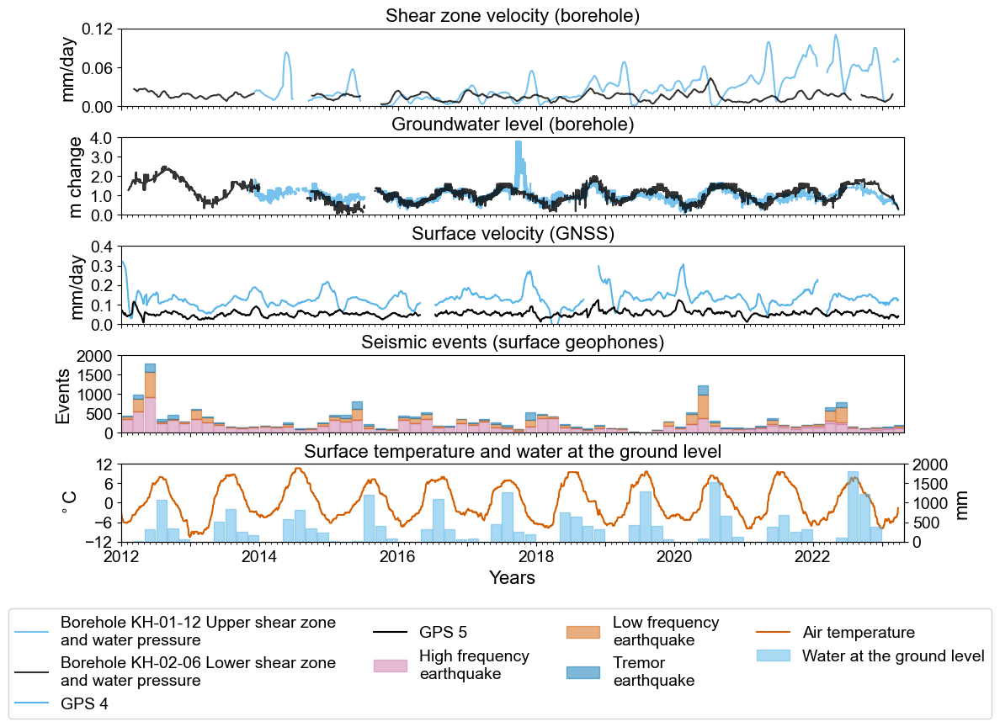

In [4]:
from matplotlib.dates import DateFormatter

# plotting

ncols = 1
nrows = 5 # len(file['event'].unique()) // ncols + (len(file['event'].unique()) % ncols > 0)

fig, ax = plt.subplots(nrows, ncols,figsize=(12, 10), sharex=True)
fig.subplots_adjust(hspace = .4)

# time series length
start_time = '2012-01-01'
end_time = '2023-03-28'

# # manually picked start and end times for following data
# file3 = KH0206PiezLowerZone.copy()
# start_time = pd.Timestamp(file3.index[0])
# end_time = pd.Timestamp(file3.index[-1])


file = KH0112DispUpperZone.iloc[:,8]
file =  file[file.index.slice_indexer(start_time,end_time)]
file = file.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(file.index, file.values, color=colors[5], label='Borehole KH-01-12 Upper shear zone \nand water pressure', alpha=0.8)

file = vel.iloc[:,-1]
file =  file[file.index.slice_indexer(start_time,end_time)]
file = file.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(file.index, file.values, color=colors[7], label='Borehole KH-02-06 Lower shear zone \nand water pressure', alpha=0.8)

# water level
n_day = 59 # days # 2 months kernel size for median filter (hourly data)
n_hour = round_up_to_odd(24*n_day) 

#loading KH0112 as it has a longer time series..

file3 = KH0112PiezLowerZone.copy()
watermodule = 'Mod30_Water pressure [m]:'
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
file3 = file3[watermodule]
# file3 = file3[file3.first_valid_index():]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
file3 = file3.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(file3.index, file3.values-np.nanmin(file3.values), color=colors[5], label='', alpha=0.8) # Borehole KH-01-12 \nwater pressure


#loading KH0206 as it has a longer time series..
file3=KH0206PiezLowerZone.copy()
watermodule = 'Mod35_Water pressure [m]:'
# manually picked start and end times for following data
# start_time = '2011-01-01'
end_time = file3.index[-1]
file3 = file3.resample('1h').median()
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
file3 = file3[watermodule]
# file3 = file3[file3.first_valid_index():]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
file3 = file3.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(file3.index, file3.values-np.nanmin(file3.values), color=colors[7], label='', alpha=0.8) # Borehole KH-02-06 \nwater pressure

# #loading KH0118 as it is longer than KH0218
# file3=KH0118Piez_raw
# # watermodule = 'Mod82_Water pressure [m]:' # unconfined aquifer
# watermodule = 'Mod26_Water pressure [m]:' # seasonal oscilations
# start_t = '2020-01-01' # start time
# file3 =  file3[file3.index.slice_indexer(start_t,end_time)]
# file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n) # median filter
# ax[0].plot(file3.index, file3[watermodule].values-np.min(file3[watermodule]), color='forestgreen', label='KH0118', alpha=0.8)

# #loading KH0217 as it is longer than KH0218
# file3=KH0217PiezUpperZone_raw
# # watermodule = 'Mod52_Water pressure [m]:' # unconfined aquifer
# watermodule = 'Mod29_Water pressure [m]:' # seasonal oscilations
# # start_t = '2020-01-01' # start time
# file3 =  file3[file3.index.slice_indexer(start_t,end_time)]
# file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n) # median filter
# ax[0].plot(file3.index, file3[watermodule].values-np.min(file3[watermodule]), color='violet', label='KH0217', alpha=0.8)

# GPS data
# data = 'Northing_medfilt'
data= '2d_60_days_velocity'

# df =  gps2
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# ax[1].plot(df.index, df[data]-df[data][0], color='black', label='GPS 2')

# df =  gps3
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df.replace(np.nan,np.inf) # changing nan to inf
# ax[1].plot(df.index, (df[data]), color='red', label='GPS 3')

df =  gps4
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[2].plot(df.index, (df[data]), color=colors[5], label='GPS 4')

df =  gps5
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[2].plot(df.index, (df[data]), color=colors[7], label='GPS 5')

# df =  gps6
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df.replace(np.nan,np.inf) # changing nan to inf
# ax[1].plot(df.index, (df[data]), color='orange', label='GPS 6')

# df =  gps10
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df.replace(np.nan,np.inf) # changing nan to inf
# ax[1].plot(df.index, (df[data]), color='yellow', label='GPS 10')

# df =  gps11
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df.replace(np.nan,np.inf) # changing nan to inf
# ax[1].plot(df.index, (df[data]), color='brown', label='GPS 11')

# seismic data
# seismicity_sub =  seismicity_qcd[(seismicity_qcd.index > start_time) & (seismicity_qcd.index < end_time)]
seismicity_sub =  seismicity[(seismicity.index > start_time) & (seismicity.index < end_time)]
seismicity_sub = seismicity_sub.resample('2M').sum()

# stacking types
bar1 = seismicity_sub['Slope_HF_nEvents']
bar2 = seismicity_sub['Slope_Multi_nEvents']
bar3 = seismicity_sub['Slope_LF_nEvents']
bar4 = seismicity_sub['Slope_Tremor_nEvents']

width = 55

ax[3].bar(dates.date2num(seismicity_sub.index), seismicity_sub['Slope_HF_nEvents'], width = width, color=colors[0], ec=colors[0], label='High frequency \nearthquake', alpha=0.5)
ax[3].bar(dates.date2num(seismicity_sub.index), seismicity_sub['Slope_Multi_nEvents'], width = width, color=colors[0], ec=colors[0], bottom=bar1, label='', alpha=0.5)
ax[3].bar(dates.date2num(seismicity_sub.index), seismicity_sub['Slope_LF_nEvents'], width = width, color=colors[1], ec=colors[1], bottom=bar1+bar2, label='Low frequency \nearthquake', alpha=0.5)
ax[3].bar(dates.date2num(seismicity_sub.index), seismicity_sub['Slope_Tremor_nEvents'], width = width, color=colors[2], ec=colors[2], bottom=bar1+bar2+bar3, label='Tremor \nearthquake', alpha=0.5)

width = 55
# temp_sub =  temp[(temp.index > start_time) & (temp.index < end_time)] # data per day
temp_sub = temp[temp.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
temp_sub.iloc[:,0] = medfilt(temp_sub.iloc[:,0], kernel_size=n_day)

# snowrain_melt_sub =  snowrain_melt[(snowrain_melt.index > start_time) & (snowrain_melt.index < end_time)]
snowrain_melt_sub =  snowrain_melt[snowrain_melt.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
snowrain_melt_sub = snowrain_melt_sub.resample('2M').sum()

ax[4].plot(temp_sub.index, temp_sub['temperature'], color=colors[1], label='Air temperature')
ax_y = ax[4].twinx()
ax_y.bar(dates.date2num(snowrain_melt_sub.index), snowrain_melt_sub['snowrain_melt'], width = width, ec=colors[5], color=colors[5], label='Water at the ground level', alpha=0.5)

# adjusting gridlines
nticks = 5
ax[0].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(3))
ax[1].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(5))
ax[2].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(5))
ax[3].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(5))
ax[4].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(5))
ax_y.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(5))

ax[0].yaxis.set_major_formatter(FormatStrFormatter('%.2f')) # number of digits
ax[1].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

# just to get an whole number so it looks nice
def myround(x, base=10):
    return base * round(x/base)

ymin, ymax = ax[0].get_ylim()
ax[0].set_ylim(0, 0.12) # velocity

ymin, ymax = ax[1].get_ylim()
ax[1].set_ylim(0, myround(ymax, base=1)) # water level

ymin, ymax = ax[2].get_ylim()
ax[2].set_ylim(0, 0.4) # velocity

ymin, ymax = ax[3].get_ylim()
ax[3].set_ylim(0, myround(ymax, base=500)) # seismic events

ymin, ymax = ax[4].get_ylim()
ax[4].set_ylim(-12, myround(ymax, base=6)) # temp -12 bas 6 for two months, 16 and base 8 for 1 month

ymin, ymax = ax_y.get_ylim()
ax_y.set_ylim(0, 2000) # available surface water, 1800 for two months, 1000 for 1 month

ax[0].title.set_text('Shear zone velocity (borehole)')
ax[1].title.set_text('Groundwater level (borehole)')
ax[2].title.set_text('Surface velocity (GNSS)')
ax[3].title.set_text('Seismic events (surface geophones)')
ax[4].title.set_text('Surface temperature and water at the ground level')

# one legend on the right side of plots
# for i in range(5):
#     box = ax[i].get_position()
#     ax[i].set_position([box.x0, box.y0, box.width * 0.8, box.height]) # shrinking axes to accomodate legend
# handles, labels = [(a + b + c + d + e + f) for a, b, c, d, e, f in zip(ax[0].get_legend_handles_labels(), ax[1].get_legend_handles_labels(), ax[2].get_legend_handles_labels(),ax[3].get_legend_handles_labels(),ax[4].get_legend_handles_labels(),ax_y.get_legend_handles_labels())]
# fig.legend(handles, labels, loc = (0.8, 0.275)) # center of fig

#legend underneath plots
handles, labels = [(a + c + d + e + f) for a, c, d, e, f in zip(ax[0].get_legend_handles_labels(), ax[2].get_legend_handles_labels(),ax[3].get_legend_handles_labels(),ax[4].get_legend_handles_labels(),ax_y.get_legend_handles_labels())]
fig.subplots_adjust(bottom=0.27) # create space
fig.legend(handles, labels, loc = 'upper center', bbox_to_anchor=(0.5, 0.2), ncol=4) # center of fig

# set axis labels
ax[0].set_ylabel('mm/day')
ax[1].set_ylabel('m change')
ax[2].set_ylabel('mm/day')
ax[3].set_ylabel('Events') #  per 2 months
ax[4].set_ylabel('$^\circ$C')
ax_y.set_ylabel('mm') #  per 2 months
ax[4].set_xlabel('Years')

# # Ensure the first year is included
# start_year = bh_data.index.min().year
# end_year = bh_data.index.max()
# ax[4].set_xlim(mdates.date2num([f'{start_year}-01-01', f'{end_year}']))

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax[4].xaxis.set_major_locator(years)
ax[4].xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax[4].xaxis.set_minor_locator(months)
# Apply the year format for the major ticks again
ax[4].xaxis.set_major_formatter(years_fmt)

# # Rotate and align the tick labels so they look better
# fig.autofmt_xdate()

# removing tick labels from the xaxis
n = 2  # keeps every n row
[l.set_visible(False) for (i,l) in enumerate(ax[4].xaxis.get_ticklabels()) if i % n != 0]

# # # saving
path = 'plots\\'
save_name = f'{path}Figure2.png'
# save_name = f'{path}Figure2_A0poster.png'
fig.savefig(save_name, dpi=600) # , transparent=True,  bbox_inches='tight'
fig.show()

In [114]:
# run this before making zoomed figure

# time series length
start_time = '2020-01-01'
end_time = '2022-01-01'

file =  KH0112DispUpperZone[KH0112DispUpperZone.index.slice_indexer(start_time,end_time)]
n = 60
vel1 = velocity(file, window_days=n, results=False) # run this before figure 2
vel1.iloc[:,-1] = vel1.iloc[:,-1]*24 # changing velocity from mm/hour to mm/day

file =  KH0206DispLowerZone[KH0206DispLowerZone.index.slice_indexer(start_time,end_time)]
vel2 = velocity(file, window_days=n, results=False) # run this before figure 2
vel2.iloc[:,-1] = vel2.iloc[:,-1]*24 # changing velocity from mm/hour to mm/day

# GNSS
def velocity_gps(df, n=60):
    # calculating velocity (mm/day)    
    data = '2d'
    n = n # linear fit over n days
    df =  pd.merge_asof(df, linearfit(df.loc[:,data], window_days=n, results=False, gps=True), on=df.index.name, tolerance=pd.Timedelta(hours=0))
    df.set_index(df.columns[0], drop=True, inplace=True)
    df[f'{data}_{n}_days_velocity [mm/day]:'] = df.loc[:,f'{n}_days_velocity']*2 # velocity = mm per day
    df.drop(f'{n}_days_velocity', axis=1, inplace=True)
    return df

file =  gps4[gps4.index.slice_indexer(start_time,end_time)]
vel3 = velocity_gps(file, n=n)
file =  gps5[gps5.index.slice_indexer(start_time,end_time)]
vel4 = velocity_gps(file, n=n)
file =  gps6[gps6.index.slice_indexer(start_time,end_time)]
vel5 = velocity_gps(file, n=n)

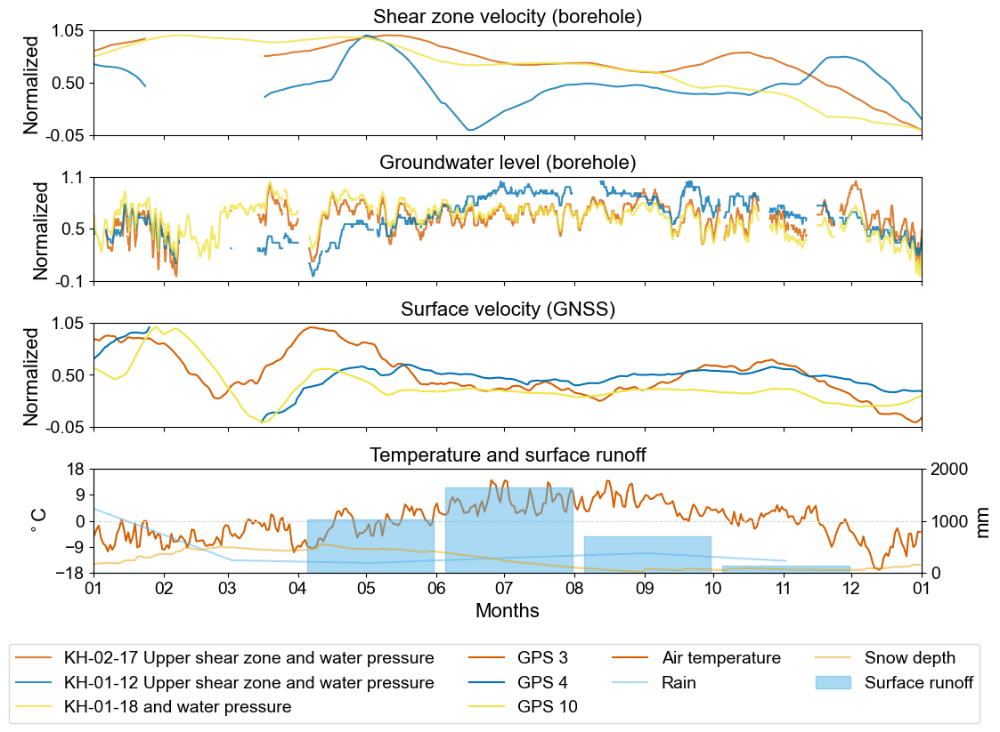

In [45]:
# Normalized version of Figure 2

# plotting

ncols = 1
nrows = 4 # len(file['event'].unique()) // ncols + (len(file['event'].unique()) % ncols > 0)

fig, ax = plt.subplots(nrows, ncols,figsize=(12, 10), sharex=True)
fig.subplots_adjust(hspace = .4)

# manually picked start and end times for following data
start_time = pd.Timestamp('2022-01-01')
end_time = pd.Timestamp('2023-01-01')

# col = '12_days_velocity [mm/day]:'
# col = '30_days_velocity [mm/day]:'
col = '60_days_velocity'
file = KH0217DispUpperZone.loc[:,col]
file =  file[file.index.slice_indexer(start_time,end_time)]
zero = file[file.first_valid_index()]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
file = file.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(file.index, normalized, color=colors[1], label='KH-02-17 Upper shear zone and water pressure', alpha=0.8)


file = KH0112DispUpperZone.loc[:,col]
file =  file[file.index.slice_indexer(start_time,end_time)]
zero = file[file.first_valid_index()]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
file = file.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(file.index, normalized, color=colors[2], label='KH-01-12 Upper shear zone and water pressure', alpha=0.8)

file = KH0118Disp.loc[:,col]
file =  file[file.index.slice_indexer(start_time,end_time)]
zero = file[file.first_valid_index()]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
file = file.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(file.index, normalized, color=colors[3], label='KH-01-18 and water pressure', alpha=0.8)


# water level
n_day = 61 # days # 2 months kernel size for median filter (hourly data)
n_hour = round_up_to_odd(24*n_day) 

file3 = KH0217PiezUpperZone.copy()
watermodule = 'Mod98_Water pressure [m]:'
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
# file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
file3 = file3[watermodule]
# file3 = file3[file3.first_valid_index():]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
file = file3.values-np.nanmin(file3.values)
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[1].plot(file3.index, normalized, color=colors[1], label='', alpha=0.8)

file3 = KH0112PiezUpperZone.copy()
watermodule = 'Mod30_Water pressure [m]:'
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
# file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
file3 = file3[watermodule]
# file3 = file3[file3.first_valid_index():]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
file = file3.values-np.nanmin(file3.values)
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[1].plot(file3.index, normalized, color=colors[2], label='', alpha=0.8)

file3 = KH0118Piez.copy()
watermodule = 'Mod63_Water pressure [m]:'
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
# file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
file3 = file3[watermodule]
# file3 = file3[file3.first_valid_index():]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
file = file3.values-np.nanmin(file3.values)
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[1].plot(file3.index, normalized, color=colors[3], label='', alpha=0.8)

# GPS data
# data= '2d_12_days_velocity [mm/day]:'
# data= '2d_30_days_velocity [mm/day]:' # this is 2d velocity
data= '2d_60_days_velocity' # this is 2d velocity

df =  ak_gps3 # above KH0217
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
file = df[data]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[2].plot(file.index, normalized, color=colors[1], label='GPS 3')

df =  ak_gps4 # same as KH0112
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
file = df[data]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[2].plot(file.index, normalized, color=colors[2], label='GPS 4')

df =  ak_gps10 # same as KH0118
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
file = df[data]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[2].plot(file.index, normalized, color=colors[3], label='GPS 10')

width = 55/60*n_day # 55 works well for 60 days
# temp_sub =  temp[(temp.index > start_time) & (temp.index < end_time)] # data per day
# temp_sub = temp[temp.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))] # actual air temp
temp_sub = ak_temp[ak_temp.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))] # xgeo air temp
# temp_sub.iloc[:,0] = medfilt(temp_sub.iloc[:,0], kernel_size=n_day)

# ST_sub = ST[ST.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
# ST_sub.iloc[:,0] = medfilt(ST_sub.iloc[:,0], kernel_size=n_day)
# ST_sub.iloc[:,1] = medfilt(ST_sub.iloc[:,1], kernel_size=n_day)

# snowrain_melt_sub =  snowrain_melt[(snowrain_melt.index > start_time) & (snowrain_melt.index < end_time)]
snowrainmelt_sub =  ak_snowrain_melt[ak_snowrain_melt.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
snowrainmelt_sub = snowrainmelt_sub.resample(f'{n_day}d').sum()

xgeo_snow_sub =  ak_snow[ak_snow.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
# xgeo_snow_sub = xgeo_snow_sub.resample(f'{n_day}d').sum()

xgeo_rain_sub =  ak_precip[ak_precip.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
xgeo_rain_sub = xgeo_rain_sub.resample(f'{n_day}d').sum()

ax[3].plot(temp_sub.index, temp_sub['temperature'], color=colors[1], label='Air temperature')
ax[3].axhline(y=0.0, color='lightgray', linestyle='dashed', linewidth=.75)

# ax[3].plot(ST_sub.index,ST_sub['ST2'], color=color_bacscarpairtemp, label='BS air temperature')
# ax[3].plot(ST_sub.index,ST_sub['ST3'], color=color_bacscarprocktemp, label='BS rock temperature')


ax_y = ax[3].twinx()
ax_y.bar(dates.date2num(snowrainmelt_sub.index), snowrainmelt_sub['snowrain_melt'], width = width, ec=colors[5], color=colors[5], label='Surface runoff', alpha=0.5)

ax_y.plot(xgeo_rain_sub.index, xgeo_rain_sub['rain'], color=colors[5], label='Rain', alpha=0.5)
ax_y.plot(xgeo_snow_sub.index, xgeo_snow_sub['depth'], color=colors[6], label='Snow depth', alpha=0.5)

# adjusting gridlines
nticks = 3
ax[0].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[1].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[2].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[3].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(5))
# ax[3].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax_y.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))

ax[0].yaxis.set_major_formatter(FormatStrFormatter('%.2f')) # number of digits
ax[1].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
ax[2].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

# just to get an whole number so it looks nice
def myround(x, base=10):
    return base * round(x/base)

# ymin, ymax = ax[0].get_ylim()
# ax[0].set_ylim(0, 0.15) # bh velocity

# ymin, ymax = ax[1].get_ylim()
# ax[1].set_ylim(0, myround(ymax, base=1)) # water level

# ymin, ymax = ax[2].get_ylim()
# ax[2].set_ylim(0, 0.4) # gnss velocity

# ymin, ymax = ax[3].get_ylim()
# ax[3].set_ylim(0, myround(ymax, base=500)) # seismic events

ymin, ymax = ax[3].get_ylim()
ax[3].set_ylim(myround(-ymax, base=6), myround(ymax, base=6)) # temp -12 bas 6 for two months, 16 and base 8 for 1 month

ymin, ymax = ax_y.get_ylim()
ax_y.set_ylim(0, 2000) # available surface water, 1800 for two months, 1000 for 1 month

ax[0].title.set_text('Shear zone velocity (borehole)')
ax[1].title.set_text('Groundwater level (borehole)')
ax[2].title.set_text('Surface velocity (GNSS)')
# ax[3].title.set_text('Seismic events (surface geophones)')
ax[3].title.set_text('Temperature and surface runoff')

# one legend on the right side of plots
# for i in range(5):
#     box = ax[i].get_position()
#     ax[i].set_position([box.x0, box.y0, box.width * 0.8, box.height]) # shrinking axes to accomodate legend
# handles, labels = [(a + b + c + d + e + f) for a, b, c, d, e, f in zip(ax[0].get_legend_handles_labels(), ax[1].get_legend_handles_labels(), ax[2].get_legend_handles_labels(),ax[3].get_legend_handles_labels(),ax[4].get_legend_handles_labels(),ax_y.get_legend_handles_labels())]
# fig.legend(handles, labels, loc = (0.8, 0.275)) # center of fig

#legend underneath plots
handles, labels = [(a + b + c + d + e) for a, b, c, d, e in zip(ax[0].get_legend_handles_labels(), ax[1].get_legend_handles_labels(), ax[2].get_legend_handles_labels(),ax[3].get_legend_handles_labels(),ax_y.get_legend_handles_labels())]
fig.subplots_adjust(bottom=0.27) # create space
fig.legend(handles, labels, loc = 'upper center', bbox_to_anchor=(0.5, 0.2), ncol=4) # center of fig

# set axis labels
ax[0].set_ylabel('Normalized')
ax[1].set_ylabel('Normalized')
ax[2].set_ylabel('Normalized')
# ax[3].set_ylabel('Events') #  per 2 months
ax[3].set_ylabel('$^\circ$C')
ax_y.set_ylabel('mm') #  per 12 weeks


# years = mdates.YearLocator(1)   # set number for every other year
# years_fmt = mdates.DateFormatter('%Y') # only display year, not day and month
# ax[3].set_xlabel('Years')

years = mdates.MonthLocator()   # set number for every other year
years_fmt = mdates.DateFormatter('%m') # only display year, not day and month
ax[3].set_xlabel('Months')

ax[3].xaxis.set_major_locator(years)
ax[3].xaxis.set_major_formatter(years_fmt)

# removing tick labels from the xaxis
n = 1  # keeps every n row
[l.set_visible(False) for (i,l) in enumerate(ax[3].xaxis.get_ticklabels()) if i % n != 0]

# removing space on sides
ax[1].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))

# # # saving
path = 'plots\\'
save_name = f'{path}Figure2_normalized_zoom_Åknes.png'
# save_name = f'{path}Figure2_A0poster.png'
fig.savefig(save_name, dpi=600) # , transparent=True,  bbox_inches='tight'

## Jettan plot

C:\Users\andregas\AppData\Local\Temp\ipykernel_34892\3708751462.py:57: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_index = pd.date_range(file.index.min(), file.index.max(), freq="H")


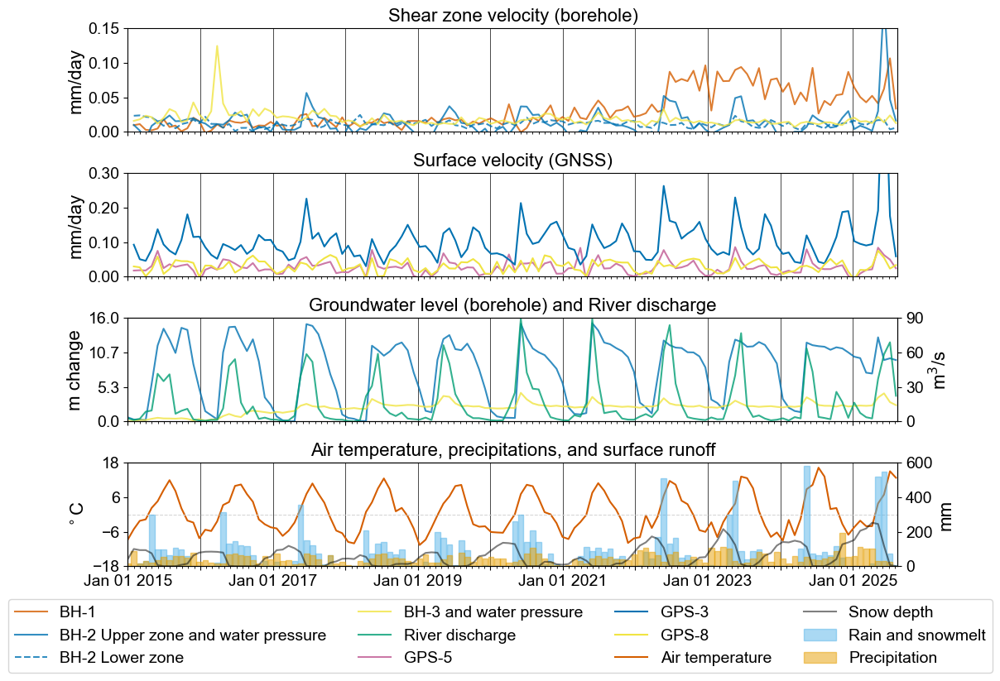

In [50]:
from matplotlib.dates import DateFormatter

########### Cleaning DMS and GPS ############
from scipy.signal import savgol_filter

# rolling mean filter window
window_mean = 7 # 7 is enough to keep temp stationary

# savgol parameters
window_size = 11
poly_order = 3

def clean_lowpassfilt(file, colnmbr=0, name='Water table [m bgl]:'): # colnmbr is the column chosen to lowpass filter, name is wanted name for filtered column
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    file = file.resample('1D').median() # matching interval of cleaning parameters
    file = file.dropna()
    file['interpolated'] = file.iloc[:,colnmbr].interpolate(method='linear', limit_direction ='forward')
    # file['filt'] = butter_lowpass_filter(file.iloc[:,-1], cutoff, fs, order) # replace original by lowpass filtered
    file['filt'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    # file['filt'] = file['filt'].rolling(window=window_mean, center=True).mean() # rolling mean
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    file.rename(columns={'filt':name}, inplace=True) # I call it the same as original if it was dependent on name in scripts lower down
    return file
######################################

# plotting
ncols = 1
nrows = 4 # len(file['event'].unique()) // ncols + (len(file['event'].unique()) % ncols > 0)

fig, ax = plt.subplots(nrows, ncols,figsize=(12, 10), sharex=True)
fig.subplots_adjust(hspace = .4)

# manually picked start and end times for following data
file3 = JTT1Disp.copy()
start_time = pd.Timestamp('2015-01-01')
end_time = pd.Timestamp('2025-08-15')
interval = '30D' # down sampling days
vel_interval = 1 # smoothing window

# turn on or off velocity
vel_true = True 
# vel_true = False        

file = JTT1Disp.iloc[:,0]
file =  file[file.index.slice_indexer(start_time,end_time)]

# Add a vertical line for each year
for i in range(nrows):
    for year in range(file.index.year.min(), file.index.year.max()+1):
        ax[i].axvline(pd.Timestamp(f'{year}-01-01'), color='black', linewidth=0.5, zorder=1)
        
# # cleaning data
# file = clean_lowpassfilt(file, colnmbr=0, name=f'{data}')
# showing missing data
full_index = pd.date_range(file.index.min(), file.index.max(), freq="H")
file = file.reindex(full_index)
file = file.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    file = rolling_slope_time(file, vel_interval)/interval # velocity
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
file = file.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(file.index, file, color=colors[1], label='BH-1 ', alpha=0.8)

file = JTT2DispUpperZone.iloc[:,0]
file =  file[file.index.slice_indexer(start_time,end_time)]
# # cleaning data
# file = clean_lowpassfilt(file, colnmbr=0, name=f'{data}')
# showing missing data
full_index = pd.date_range(file.index.min(), file.index.max(), freq="h")
file = file.reindex(full_index)
file = file.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    file = rolling_slope_time(file, vel_interval)/interval # velocity
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
file = file.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(file.index, file, color=colors[2], label='BH-2 Upper zone and water pressure', alpha=0.8)

file = JTT2DispLowerZone.iloc[:,0]
file =  file[file.index.slice_indexer(start_time,end_time)]
# # cleaning data
# file = clean_lowpassfilt(file, colnmbr=0, name=f'{data}')
# showing missing data
full_index = pd.date_range(file.index.min(), file.index.max(), freq="h")
file = file.reindex(full_index)

file = file.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    file = rolling_slope_time(file, vel_interval)/interval # velocity
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
file = file.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(file.index, file, color=colors[2], linestyle='dashed', label='BH-2 Lower zone', alpha=0.8)

file = JTT3Disp.iloc[:,0]
file =  file[file.index.slice_indexer(start_time,end_time)]
file = file.dropna()
# # cleaning data
# file = clean_lowpassfilt(file, colnmbr=0, name=f'{data}')
# showing missing data
full_index = pd.date_range(file.index.min(), file.index.max(), freq="h")
file = file.reindex(full_index)

file = file.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    file = rolling_slope_time(file, vel_interval)/interval # velocity
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
file = file.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(file.index, file, color=colors[3], label='BH-3 and water pressure', alpha=0.8)


# file3 = JTT1Wp.copy()
# watermodule = 'Mod4_Water pressure [m]:'
# file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
# # file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
# file3 = file3[watermodule]
# # file3 = file3[file3.first_valid_index():]
# file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
# file = file3.values-np.nanmin(file3.values)
# normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
# ax[1].plot(file3.index, normalized, color=colors[4], label='Borehole JTT1 \nwater pressure', alpha=0.8)

file3 = JTT2WpUpperZone.copy()
watermodule = 'Mod4_Water pressure [m]:'
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
file3 = file3.resample(f'{interval}d').median() # downsampling with median value
# file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
file3 = file3[watermodule]
# file3 = file3[file3.first_valid_index():]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
file = file3.values-np.nanmin(file3.values)
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[2].plot(file3.index, file, color=colors[2], label='', alpha=0.8)

file3 = JTT3Wp.copy()
watermodule = 'Mod4_Water pressure [m]:'
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
file3 = file3.resample(f'{interval}d').median() # downsampling with median value
# file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
file3 = file3[watermodule]
# file3 = file3[file3.first_valid_index():]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
file = file3.values-np.nanmin(file3.values)
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[2].plot(file3.index, file, color=colors[3], label='', alpha=0.8)


file3 = river1.copy()
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
file3 = file3.resample(f'{interval}d').max() # downsampling with median value
file3 = file3.iloc[:,0]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
file = file3.values-np.nanmin(file3.values)
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))

ax_y1 = ax[2].twinx()
ax_y1.plot(file3.index, file, color=colors[4], alpha=0.8, label='River discharge')

# GPS data

data = '2d'
df =  jett_gps5 # Jtt1 gps 5 or gps 4
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data]
# ### Cleaning
# df = df.dropna()
# df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
# ###
df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = diff_shift(df, vel_interval)/interval # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
file = file.replace(np.nan,np.inf) # changing nan to inf to show areas of lacking data
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[1].plot(file.index, file, color=colors[0], label='GPS-5')

df =  jett_gps3 # same as Jtt2
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data]
# ### Cleaning
# df = df.dropna()
# df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
# ###
df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = diff_shift(df, vel_interval)/interval # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
file = file.replace(np.nan,np.inf) # changing nan to inf to show areas of lacking data
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[1].plot(file.index, file, color=colors[2], label='GPS-3')

df =  jett_gps8 # same as Jtt3
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data]
# ### Cleaning
# df = df.dropna()
# df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
# ###
df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = diff_shift(df, vel_interval)/interval # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
file = file.replace(np.nan,np.inf) # changing nan to inf to show areas of lacking data
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[1].plot(file.index, file, color=colors[3], label='GPS-8')

width = 55/60*interval # width of bars

temp_sub = jtt_xgeo_temp[jtt_xgeo_temp.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))] # actual air temp
temp_sub = temp_sub.resample(f'{interval}d').median()

ax[3].plot(temp_sub.index, temp_sub['temperature'], color=colors[1], label='Air temperature')
ax[3].axhline(y=0.0, color='lightgray', linestyle='dashed', linewidth=.75)

# ST_sub = ST[ST.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
# ST_sub.iloc[:,0] = medfilt(ST_sub.iloc[:,0], kernel_size=n_day)
# ST_sub.iloc[:,1] = medfilt(ST_sub.iloc[:,1], kernel_size=n_day)

# snowrain_melt_sub =  snowrain_melt[(snowrain_melt.index > start_time) & (snowrain_melt.index < end_time)]

precip_snowmelt_sub =  jtt_xgeo_precip_snowmelt[jtt_xgeo_precip_snowmelt.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
precip_snowmelt_sub = precip_snowmelt_sub.resample(f'{interval}d').sum()
file = precip_snowmelt_sub.iloc[:,0]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

ax_y3 = ax[3].twinx()
ax_y3.bar(dates.date2num(file.index), file, width = width, ec=colors[5], color=colors[5], label='Rain and snowmelt', alpha=0.5)

# surfacerunoff_sub =  jtt_xgeo_surfacerunnoff[jtt_xgeo_surfacerunnoff.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
# surfacerunoff_sub = surfacerunoff_sub.resample(f'{interval}d').sum()
# file = surfacerunoff_sub.iloc[:,0]
# normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

# ax_y3 = ax[3].twinx()
# ax_y3.bar(dates.date2num(file.index), file, width = width, ec=colors[5], color=colors[5], label='Surface runoff', alpha=0.5)

xgeo_snow_sub =  jtt_xgeo_snow[jtt_xgeo_snow.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
xgeo_snow_sub = xgeo_snow_sub.resample(f'{interval}d').max()
file = xgeo_snow_sub.iloc[:,0]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

ax_y3.plot(file.index, file, color=colors[7], label='Snow depth', alpha=0.5)

xgeo_rain_sub =  jtt_xgeo_rain[jtt_xgeo_rain.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
xgeo_rain_sub = xgeo_rain_sub.resample(f'{interval}d').sum()
file = xgeo_rain_sub.iloc[:,0]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

ax_y3.bar(dates.date2num(file.index), file, width = width, ec=colors[6], color=colors[6], label='Precipitation', alpha=0.5)

# ax[3].plot(ST_sub.index,ST_sub['ST2'], color=color_bacscarpairtemp, label='BS air temperature')
# ax[3].plot(ST_sub.index,ST_sub['ST3'], color=color_bacscarprocktemp, label='BS rock temperature')

# adjusting gridlines
nticks = 4
ax[0].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[2].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax_y1.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[1].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[3].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax_y3.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))

ax[0].yaxis.set_major_formatter(FormatStrFormatter('%.2f')) # number of digits
ax[1].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax[2].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

# just to get an whole number so it looks nice
def myround(x, base=10):
    return base * round(x/base)

ymin, ymax = ax[0].get_ylim()
ax[0].set_ylim(0, .15) # velocity

ymin, ymax = ax[2].get_ylim()
ax[2].set_ylim(0, myround(ymax, base=1)) # water level

ymin, ymax = ax_y1.get_ylim()
ax_y1.set_ylim(0, 90) # available surface water, 1800 for two months, 1000 for 1 month

ymin, ymax = ax[1].get_ylim()
ax[1].set_ylim(0, .3) # velocity

ymin, ymax = ax[3].get_ylim()
# ymax = 24
ax[3].set_ylim(myround(-ymax, base=6), myround(ymax, base=6)) # temp -12 bas 6 for two months, 16 and base 8 for 1 month

ymin, ymax = ax_y3.get_ylim()
ax_y3.set_ylim(0, 600) # available surface water, 1800 for two months, 1000 for 1 month

ax[0].title.set_text('Shear zone velocity (borehole)')
ax[1].title.set_text('Surface velocity (GNSS)')
ax[2].title.set_text('Groundwater level (borehole) and River discharge')
ax[3].title.set_text('Air temperature, precipitations, and surface runoff')


#legend underneath plots
handles, labels = [(a +b + c + d + e + f) for a, b, c, d, e, f, in zip(ax[0].get_legend_handles_labels(), ax_y1.get_legend_handles_labels(), ax[1].get_legend_handles_labels(), ax[2].get_legend_handles_labels(),ax[3].get_legend_handles_labels(),ax_y3.get_legend_handles_labels())]
fig.subplots_adjust(bottom=0.23) # create space
fig.legend(handles, labels, loc = 'upper center', bbox_to_anchor=(0.5, 0.2), ncol=4) # center of fig


# set axis labels
ax[0].set_ylabel('mm/day')
ax[1].set_ylabel('mm/day')
ax[2].set_ylabel('m change')
ax_y1.set_ylabel('m$^3$/s') #  per 2 months
ax[3].set_ylabel('$^\circ$C')
ax_y3.set_ylabel('mm') #  per 2 months
# ax[3].set_xlabel('Years')

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax[3].xaxis.set_major_locator(years)
ax[3].xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax[3].xaxis.set_minor_locator(months)
# Apply the year format for the major ticks again
# ax[4].xaxis.set_major_formatter(years_fmt)
ax[3].xaxis.set_major_locator(mdates.YearLocator(1, month=1, day=1))  # Major ticks on Jan 1st of every year
ax[3].xaxis.set_major_formatter(mdates.DateFormatter('%b %d %Y')) 

# removing tick labels from the xaxis
n = 2  # keeps every n row
[l.set_visible(False) for (i,l) in enumerate(ax[3].xaxis.get_ticklabels()) if i % n != 0] # Get 'none' from this for some reason

for i in range(nrows):
    ax[i].set_xlim(pd.Timestamp(start_time),pd.Timestamp(end_time))

# # # saving
path = 'plots\\'
save_name = f'{path}Figure5.png'
# save_name = f'{path}Figure2_A0poster.png'
fig.savefig(save_name, dpi=600) # , transparent=True,  bbox_inches='tight'

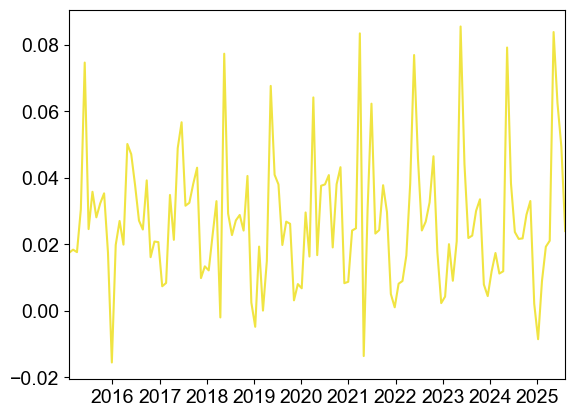

In [148]:
df =  jett_gps5 # same as Jtt3
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data]
# ### Cleaning
# df = df.dropna()
# df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
# ###
full_index = pd.date_range(df.index.min(), df.index.max(), freq="12h")
df = df.reindex(full_index)

df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = diff_shift(df, vel_interval)/interval # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
file = file.replace(np.nan,np.inf) # changing nan to inf to show areas of lacking data
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
plt.plot(file.index, file, color=colors[3], label='GPS-8')

In [150]:
file.isna().any()

False

In [ ]:
## New figure without borehole and river data

C:\Users\andregas\AppData\Local\Temp\ipykernel_27264\2380816436.py:39: RuntimeWarning: All-NaN axis encountered
  normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))


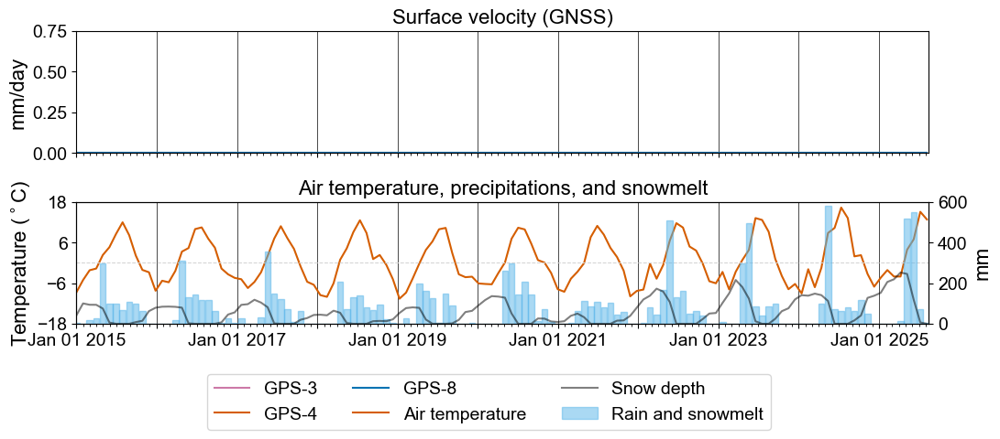

In [403]:
from matplotlib.dates import DateFormatter

# plotting
ncols = 1
nrows = 2 # len(file['event'].unique()) // ncols + (len(file['event'].unique()) % ncols > 0)

fig, ax = plt.subplots(nrows, ncols,figsize=(12, 5), sharex=True)
fig.subplots_adjust(hspace = .4)

# manually picked start and end times for following data
file3 = JTT1Disp.copy()
start_time = pd.Timestamp('2015-01-01')
end_time = pd.Timestamp('2025-08-15')
interval = 30 # down sampling days
vel_interval = 1 # smoothing window

# turn on or off velocity
vel_true = True 
# vel_true = False

# GPS data

data = '2d'
df =  jett_gps3 # same as Jtt2
df =  df[df.index.slice_indexer(start_time,end_time)]

# Add a vertical line for each year
for i in range(nrows):
    for year in range(df.index.year.min(), df.index.year.max()+1):
        ax[i].axvline(pd.Timestamp(f'{year}-01-01'), color='black', linewidth=0.5, zorder=1)
        
df = df[data].dropna()
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = rolling_slope_time(df, vel_interval)/interval # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[0].plot(file.index, file, color=colors[0], label='GPS-3')

df =  jett_gps4 # Jtt1 gps 4
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = diff_shift(df, vel_interval)/interval # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[0].plot(file.index, file, color=colors[1], label='GPS-4')

df =  jett_gps8 # same as Jtt3
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = diff_shift(df, vel_interval)/interval # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[0].plot(file.index, file, color=colors[2], label='GPS-8')


### MET
interval = 30 # down sampling days
width = 55/60*interval # width of bars

temp_sub = jtt_xgeo_temp[jtt_xgeo_temp.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))] # actual air temp
temp_sub = temp_sub.resample(f'{interval}d').median()

ax[1].plot(temp_sub.index, temp_sub['temperature'], color=colors[1], label='Air temperature')
ax[1].axhline(y=0.0, color='lightgray', linestyle='dashed', linewidth=.75)

precip_snowmelt_sub =  jtt_xgeo_precip_snowmelt[jtt_xgeo_precip_snowmelt.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
precip_snowmelt_sub = precip_snowmelt_sub.resample(f'{interval}d').sum()
file = precip_snowmelt_sub.iloc[:,0]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

ax_y3 = ax[1].twinx()
ax_y3.bar(dates.date2num(file.index), file, width = width, ec=colors[5], color=colors[5], label='Rain and snowmelt', alpha=0.5)

# surfacerunoff_sub =  jtt_xgeo_surfacerunnoff[jtt_xgeo_surfacerunnoff.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
# surfacerunoff_sub = surfacerunoff_sub.resample(f'{interval}d').sum()
# file = surfacerunoff_sub.iloc[:,0]
# normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

# ax_y3 = ax[3].twinx()
# ax_y3.bar(dates.date2num(file.index), file, width = width, ec=colors[5], color=colors[5], label='Surface runoff', alpha=0.5)

xgeo_snow_sub =  jtt_xgeo_snow[jtt_xgeo_snow.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
xgeo_snow_sub = xgeo_snow_sub.resample(f'{interval}d').max()
file = xgeo_snow_sub.iloc[:,0]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

ax_y3.plot(file.index, file, color=colors[7], label='Snow depth', alpha=0.5)

# xgeo_rain_sub =  jtt_xgeo_rain[jtt_xgeo_rain.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
# xgeo_rain_sub = xgeo_rain_sub.resample(f'{interval}d').sum()
# file = xgeo_rain_sub.iloc[:,0]
# normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

# ax_y3.bar(dates.date2num(file.index), file, width = width, ec=colors[6], color=colors[6], label='Precipitation', alpha=0.5)

# ax[3].plot(ST_sub.index,ST_sub['ST2'], color=color_bacscarpairtemp, label='BS air temperature')
# ax[3].plot(ST_sub.index,ST_sub['ST3'], color=color_bacscarprocktemp, label='BS rock temperature')

# adjusting gridlines
nticks = 4
ax[0].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[1].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax_y3.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))

ax[0].yaxis.set_major_formatter(FormatStrFormatter('%.2f')) # number of digits

# just to get an whole number so it looks nice
def myround(x, base=10):
    return base * round(x/base)

ymin, ymax = ax[0].get_ylim()
ax[0].set_ylim(0, 0.75) # velocity

ymin, ymax = ax[1].get_ylim()
# ymax = 24
ax[1].set_ylim(myround(-ymax, base=6), myround(ymax, base=6)) # temp -12 bas 6 for two months, 16 and base 8 for 1 month

ymin, ymax = ax_y3.get_ylim()
ax_y3.set_ylim(0, 600) # available surface water, 1800 for two months, 1000 for 1 month

ax[0].title.set_text('Surface velocity (GNSS)')
ax[1].title.set_text('Air temperature, precipitations, and snowmelt')


#legend underneath plots
handles, labels = [(a + b + c) for a, b, c in zip(ax[0].get_legend_handles_labels(), ax[1].get_legend_handles_labels() ,ax_y3.get_legend_handles_labels())]

fig.subplots_adjust(bottom=0.24) # create space
fig.legend(handles, labels, loc = 'upper center', bbox_to_anchor=(0.5, 0.15), ncol=3) # center of fig

# set axis labels
ax[0].set_ylabel('mm/day')
ax[1].set_ylabel('Temperature ($^\circ$C)')
ax_y3.set_ylabel('mm') #  per 2 months

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax[1].xaxis.set_major_locator(years)
ax[1].xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax[1].xaxis.set_minor_locator(months)
ax[1].xaxis.set_major_locator(mdates.YearLocator(1, month=1, day=1))  # Major ticks on Jan 1st of every year
ax[1].xaxis.set_major_formatter(mdates.DateFormatter('%b %d %Y')) 

# removing tick labels from the xaxis
n = 2  # keeps every n row
[l.set_visible(False) for (i,l) in enumerate(ax[1].xaxis.get_ticklabels()) if i % n != 0] # Get 'none' from this for some reason

for i in range(nrows):
    ax[i].set_xlim(pd.Timestamp(start_time),pd.Timestamp(end_time))

# # # saving
path = 'plots\\'
save_name = f'{path}Figure5.png'
# save_name = f'{path}Figure2_A0poster.png'
fig.savefig(save_name, dpi=600) # , transparent=True,  bbox_inches='tight'

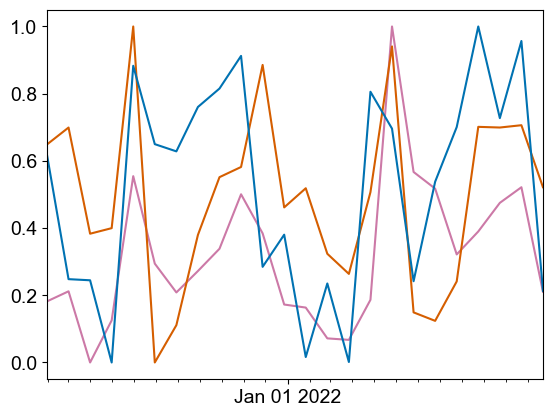

In [23]:
fig, ax = plt.subplots()

# manually picked start and end times for following data
start_time = pd.Timestamp('2021-01-01')
end_time = pd.Timestamp('2023-01-01')
interval = 30 # down sampling days
vel_interval = 1 # smoothing window
vel_true = True 
# vel_true = False

data = '2d'
df =  jett_gps3 # same as Jtt2
df =  df[df.index.slice_indexer(start_time,end_time)]
        
df = df[data].dropna()
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = diff_shift(df, vel_interval)/interval # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax.plot(file.index, normalized, color=colors[0], label='GPS-3')

df =  jett_gps4 # Jtt1 gps 4
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = diff_shift(df, vel_interval)/interval # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax.plot(file.index, normalized, color=colors[1], label='GPS-4')

df =  jett_gps8 # same as Jtt3
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = diff_shift(df, vel_interval)/interval # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax.plot(file.index, normalized, color=colors[2], label='GPS-8')

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax.xaxis.set_minor_locator(months)
ax.xaxis.set_major_locator(mdates.YearLocator(1, month=1, day=1))  # Major ticks on Jan 1st of every year
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d %Y')) 

## Gamanjunni plot

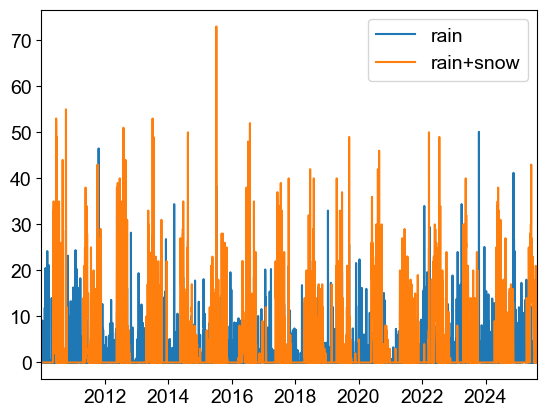

In [72]:
plt.plot(jtt_xgeo_rain.iloc[:,0], label='rain')
plt.plot(jtt_xgeo_precip_snowmelt.iloc[:,0], label='rain+snow')
plt.legend()

C:\Users\andregas\AppData\Local\Temp\ipykernel_24248\114684241.py:226: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


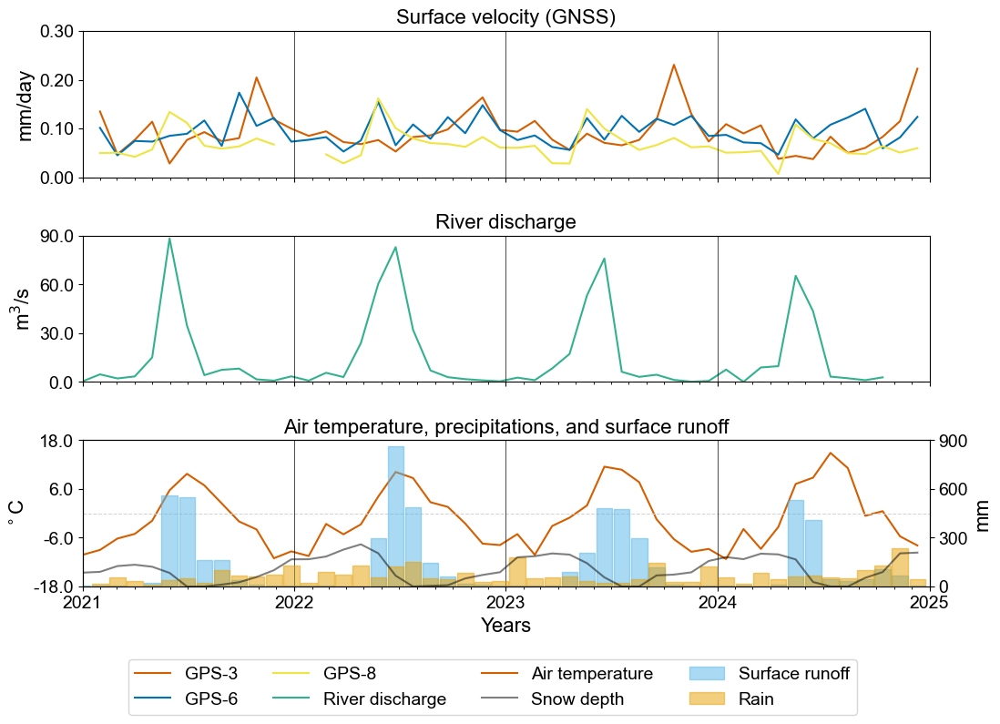

In [60]:
from matplotlib.dates import DateFormatter

########### Cleaning DMS and GPS ############
from scipy.signal import savgol_filter

# rolling mean filter window
window_mean = 7 # 7 is enough to keep temp stationary

# savgol parameters
window_size = 11
poly_order = 3

def clean_lowpassfilt(file, colnmbr=0, name='Water table [m bgl]:'): # colnmbr is the column chosen to lowpass filter, name is wanted name for filtered column
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    file = file.resample('1D').median() # matching interval of cleaning parameters
    file = file.dropna()
    file['interpolated'] = file.iloc[:,colnmbr].interpolate(method='linear', limit_direction ='forward')
    # file['filt'] = butter_lowpass_filter(file.iloc[:,-1], cutoff, fs, order) # replace original by lowpass filtered
    file['filt'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    # file['filt'] = file['filt'].rolling(window=window_mean, center=True).mean() # rolling mean
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    file.rename(columns={'filt':name}, inplace=True) # I call it the same as original if it was dependent on name in scripts lower down
    return file
######################################

def diff_shift(df, nrow_shift):
    return df-df.shift(nrow_shift) # Takes nrow forwards in time minus 'current' row and gives difference

# plotting
ncols = 1
nrows = 2 # len(file['event'].unique()) // ncols + (len(file['event'].unique()) % ncols > 0)

fig, ax = plt.subplots(nrows, ncols,figsize=(12, 6), sharex=True)
fig.subplots_adjust(hspace = .4)

# manually picked start and end times for following data
start_time = pd.Timestamp('2021-01-01')
end_time = pd.Timestamp('2026-01-01')
interval = 30 # down sampling days
vel_interval = 1 # smoothing window

# turn on or off velocity
vel_true = True 
# vel_true = False

# GPS data

data = '2d'
df =  gam_gps3 # Jtt1 gps 5 or gps 4
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = diff_shift(df, vel_interval)/interval # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[0].plot(file.index, file, color=colors[1], label='GPS-3')

df =  gam_gps6 # same as Jtt2
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = diff_shift(df, vel_interval)/interval # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[0].plot(file.index, file, color=colors[2], label='GPS-6')

df =  gam_gps8 # same as Jtt3
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = diff_shift(df, vel_interval)/interval # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[0].plot(file.index, file, color=colors[3], label='GPS-8')


file3 = river1.copy()
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
file3 = file3.resample(f'{interval}d').max() # downsampling with median value
file3 = file3.iloc[:,0]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
file = file3.values-np.nanmin(file3.values)
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))

ax[1].plot(file3.index, file, color=colors[4], alpha=0.8, label='River discharge')

width = 55/60*interval # width of bars

temp_sub = gam_xgeo_temp[gam_xgeo_temp.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))] # actual air temp
temp_sub = temp_sub.resample(f'{interval}d').median()

ax[2].plot(temp_sub.index, temp_sub['temperature'], color=colors[1], label='Air temperature')
ax[2].axhline(y=0.0, color='lightgray', linestyle='dashed', linewidth=.75)

# ST_sub = ST[ST.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
# ST_sub.iloc[:,0] = medfilt(ST_sub.iloc[:,0], kernel_size=n_day)
# ST_sub.iloc[:,1] = medfilt(ST_sub.iloc[:,1], kernel_size=n_day)

# snowrain_melt_sub =  snowrain_melt[(snowrain_melt.index > start_time) & (snowrain_melt.index < end_time)]
surfacerunoff_sub =  gam_xgeo_surfacerunnoff[gam_xgeo_surfacerunnoff.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
surfacerunoff_sub = surfacerunoff_sub.resample(f'{interval}d').sum()
file = surfacerunoff_sub.iloc[:,0]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

ax_y3 = ax[2].twinx()
ax_y3.bar(dates.date2num(file.index), file, width = width, ec=colors[5], color=colors[5], label='Surface runoff', alpha=0.5)

xgeo_snow_sub =  gam_xgeo_snow[gam_xgeo_snow.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
xgeo_snow_sub = xgeo_snow_sub.resample(f'{interval}d').max()
file = xgeo_snow_sub.iloc[:,0]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

ax_y3.plot(file.index, file, color=colors[7], label='Snow depth', alpha=0.5)

xgeo_rain_sub =  gam_xgeo_rain[gam_xgeo_rain.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
xgeo_rain_sub = xgeo_rain_sub.resample(f'{interval}d').sum()
file = xgeo_rain_sub.iloc[:,0]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

ax_y3.bar(dates.date2num(file.index), file, width = width, ec=colors[6], color=colors[6], label='Rain', alpha=0.5)

# ax[3].plot(ST_sub.index,ST_sub['ST2'], color=color_bacscarpairtemp, label='BS air temperature')
# ax[3].plot(ST_sub.index,ST_sub['ST3'], color=color_bacscarprocktemp, label='BS rock temperature')

# adjusting gridlines
nticks = 4
ax[0].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[1].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[2].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax_y3.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))

ax[0].yaxis.set_major_formatter(FormatStrFormatter('%.2f')) # number of digits
ax[1].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
ax[2].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

# just to get an whole number so it looks nice
def myround(x, base=10):
    return base * round(x/base)

ymin, ymax = ax[0].get_ylim()
ax[0].set_ylim(0, .3) # velocity

# ymin, ymax = ax[2].get_ylim()
# ax[2].set_ylim(0, myround(ymax, base=1)) # water level

# ymin, ymax = ax_y1.get_ylim()
ax[1].set_ylim(0, 90) # available surface water, 1800 for two months, 1000 for 1 month

# ymin, ymax = ax[1].get_ylim()
# ax[1].set_ylim(0, 8) # velocity

ymin, ymax = ax[2].get_ylim()
# ymax = 24
ax[2].set_ylim(myround(-ymax, base=6), myround(ymax, base=6)) # temp -12 base 6 for two months, 16 and base 8 for 1 month

ymin, ymax = ax_y3.get_ylim()
ax_y3.set_ylim(0, 900) # available surface water, 1800 for two months, 1000 for 1 month

ax[0].title.set_text('Surface velocity (GNSS)')
ax[1].title.set_text('River discharge')
ax[2].title.set_text('Air temperature, precipitations, and surface runoff')


#legend underneath plots
handles, labels = [(a +b + c + d) for a, b, c, d, in zip(ax[0].get_legend_handles_labels(), ax[1].get_legend_handles_labels(),ax[2].get_legend_handles_labels(),ax_y3.get_legend_handles_labels())]
fig.subplots_adjust(bottom=0.27) # create space
fig.legend(handles, labels, loc = 'upper center', bbox_to_anchor=(0.5, 0.2), ncol=4) # center of fig


# set axis labels
ax[0].set_ylabel('mm/day')
ax[1].set_ylabel('m$^3$/s') #  per 2 months
ax[2].set_ylabel('Temperature ($^\circ$C)')
ax_y3.set_ylabel('mm') #  per 2 months
ax[2].set_xlabel('Years')

# # Ensure the first year is included
# start_year = bh_data.index.min().year
# end_year = bh_data.index.max()
# ax[4].set_xlim(mdates.date2num([f'{start_year}-01-01', f'{end_year}']))

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax[2].xaxis.set_major_locator(years)
ax[2].xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax[2].xaxis.set_minor_locator(months)
# Apply the year format for the major ticks again
ax[2].xaxis.set_major_formatter(years_fmt)

# # Rotate and align the tick labels so they look better
# fig.autofmt_xdate()

# # removing tick labels from the xaxis
# n = 2  # keeps every n row
# [l.set_visible(False) for (i,l) in enumerate(ax[3].xaxis.get_ticklabels()) if i % n != 0] # Get 'none' from this for some reason

# Add a vertical line for each year
for i in range(nrows):
    for year in range(file.index.year.min(), file.index.year.max()+1):
        ax[i].axvline(pd.Timestamp(f'{year}-01-01'), color='black', linewidth=0.5)

for i in range(nrows):
    ax[i].set_xlim(pd.Timestamp(start_time),pd.Timestamp(end_time))
    
# # # saving
path = 'plots\\'
save_name = f'{path}Figure6.png'
# save_name = f'{path}Figure2_A0poster.png'
fig.savefig(save_name, dpi=600) # , transparent=True,  bbox_inches='tight'
fig.show()

In [ ]:
## New version with only gnss and met

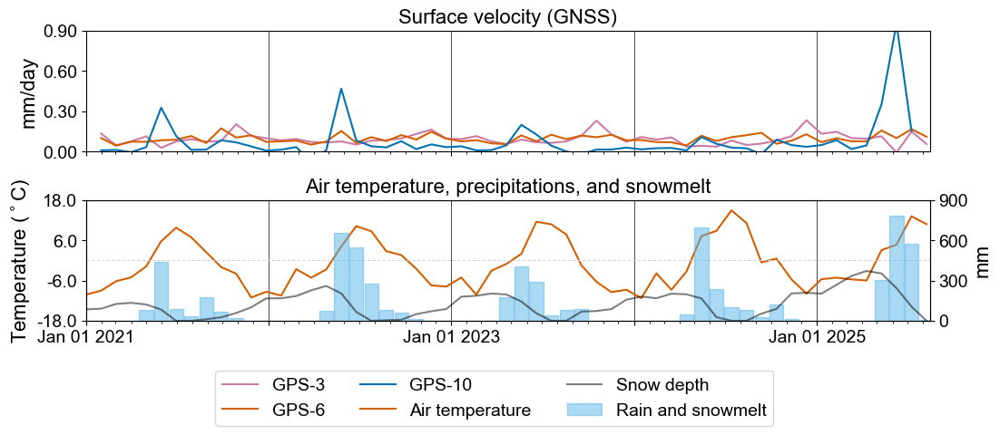

In [247]:
from matplotlib.dates import DateFormatter

########### Cleaning DMS and GPS ############
from scipy.signal import savgol_filter

# rolling mean filter window
window_mean = 7 # 7 is enough to keep temp stationary

# savgol parameters
window_size = 11
poly_order = 3

def clean_lowpassfilt(file, colnmbr=0, name='Water table [m bgl]:'): # colnmbr is the column chosen to lowpass filter, name is wanted name for filtered column
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    file = file.resample('1D').median() # matching interval of cleaning parameters
    file = file.dropna()
    file['interpolated'] = file.iloc[:,colnmbr].interpolate(method='linear', limit_direction ='forward')
    # file['filt'] = butter_lowpass_filter(file.iloc[:,-1], cutoff, fs, order) # replace original by lowpass filtered
    file['filt'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    # file['filt'] = file['filt'].rolling(window=window_mean, center=True).mean() # rolling mean
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    file.rename(columns={'filt':name}, inplace=True) # I call it the same as original if it was dependent on name in scripts lower down
    return file
######################################

def diff_shift(df, nrow_shift):
    return df-df.shift(nrow_shift) # Takes nrow forwards in time minus 'current' row and gives difference

# plotting
ncols = 1
nrows = 2 # len(file['event'].unique()) // ncols + (len(file['event'].unique()) % ncols > 0)

fig, ax = plt.subplots(nrows, ncols,figsize=(12, 5), sharex=True)
fig.subplots_adjust(hspace = .4)

# manually picked start and end times for following data
start_time = pd.Timestamp('2021-01-01')
end_time = pd.Timestamp('2025-08-15')
interval = 30 # down sampling days
vel_interval = 1 # smoothing window

# turn on or off velocity
vel_true = True 
# vel_true = False

# GPS data

data = '2d'
df =  gam_gps3 # Jtt1 gps 5 or gps 4
df =  df[df.index.slice_indexer(start_time,end_time)]

# Add a vertical line for each year
for i in range(nrows):
    for year in range(df.index.year.min(), df.index.year.max()+1):
        ax[i].axvline(pd.Timestamp(f'{year}-01-01'), color='black', linewidth=0.5, zorder=1)

df = df[data].dropna()
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = diff_shift(df, vel_interval)/interval # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[0].plot(file.index, file, color=colors[0], label='GPS-3')

df =  gam_gps6 # same as Jtt2
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = diff_shift(df, vel_interval)/interval # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[0].plot(file.index, file, color=colors[1], label='GPS-6')

df =  gam_gps10 # same as Jtt3
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = diff_shift(df, vel_interval)/interval # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[0].plot(file.index, file, color=colors[2], label='GPS-10')

width = 55/60*interval # width of bars

temp_sub = gam_xgeo_temp[gam_xgeo_temp.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))] # actual air temp
temp_sub = temp_sub.resample(f'{interval}d').median()

ax[1].plot(temp_sub.index, temp_sub['temperature'], color=colors[1], label='Air temperature')
ax[1].axhline(y=0.0, color='lightgray', linestyle='dashed', linewidth=.75)

# ST_sub = ST[ST.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
# ST_sub.iloc[:,0] = medfilt(ST_sub.iloc[:,0], kernel_size=n_day)
# ST_sub.iloc[:,1] = medfilt(ST_sub.iloc[:,1], kernel_size=n_day)

# snowrain_melt_sub =  snowrain_melt[(snowrain_melt.index > start_time) & (snowrain_melt.index < end_time)]
precip_snowmelt_sub =  gam_xgeo_precip_snowmelt[gam_xgeo_precip_snowmelt.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
precip_snowmelt_sub = precip_snowmelt_sub.resample(f'{interval}d').sum()
file = precip_snowmelt_sub.iloc[:,0]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

ax_y3 = ax[1].twinx()
ax_y3.bar(dates.date2num(file.index), file, width = width, ec=colors[5], color=colors[5], label='Rain and snowmelt', alpha=0.5)

xgeo_snow_sub =  gam_xgeo_snow[gam_xgeo_snow.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
xgeo_snow_sub = xgeo_snow_sub.resample(f'{interval}d').max()
file = xgeo_snow_sub.iloc[:,0]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

ax_y3.plot(file.index, file, color=colors[7], label='Snow depth', alpha=0.5)

# xgeo_rain_sub =  gam_xgeo_rain[gam_xgeo_rain.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
# xgeo_rain_sub = xgeo_rain_sub.resample(f'{interval}d').sum()
# file = xgeo_rain_sub.iloc[:,0]
# normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

# ax_y3.bar(dates.date2num(file.index), file, width = width, ec=colors[6], color=colors[6], label='Precipitation', alpha=0.5)

# ax[3].plot(ST_sub.index,ST_sub['ST2'], color=color_bacscarpairtemp, label='BS air temperature')
# ax[3].plot(ST_sub.index,ST_sub['ST3'], color=color_bacscarprocktemp, label='BS rock temperature')

# adjusting gridlines
nticks = 4
ax[0].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[1].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax_y3.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))

ax[0].yaxis.set_major_formatter(FormatStrFormatter('%.2f')) # number of digits
ax[1].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

# just to get an whole number so it looks nice
def myround(x, base=10):
    return base * round(x/base)

ymin, ymax = ax[0].get_ylim()
ax[0].set_ylim(0, .9) # velocity

ymin, ymax = ax[1].get_ylim()
# ymax = 24
ax[1].set_ylim(myround(-ymax, base=6), myround(ymax, base=6)) # temp -12 base 6 for two months, 16 and base 8 for 1 month

ymin, ymax = ax_y3.get_ylim()
ax_y3.set_ylim(0, 900) # available surface water, 1800 for two months, 1000 for 1 month

ax[0].title.set_text('Surface velocity (GNSS)')
ax[1].title.set_text('Air temperature, precipitations, and snowmelt')


#legend underneath plots
handles, labels = [(a +b + c) for a, b, c, in zip(ax[0].get_legend_handles_labels(), ax[1].get_legend_handles_labels(),ax_y3.get_legend_handles_labels())]
fig.subplots_adjust(bottom=0.24) # create space
fig.legend(handles, labels, loc = 'upper center', bbox_to_anchor=(0.5, 0.15), ncol=3) # center of fig


# set axis labels
ax[0].set_ylabel('mm/day')
ax[1].set_ylabel('Temperature ($^\circ$C)')
ax_y3.set_ylabel('mm') #  per 2 months

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax[1].xaxis.set_major_locator(years)
ax[1].xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax[1].xaxis.set_minor_locator(months)
ax[1].xaxis.set_major_locator(mdates.YearLocator(1, month=1, day=1))  # Major ticks on Jan 1st of every year
ax[1].xaxis.set_major_formatter(mdates.DateFormatter('%b %d %Y')) 

# removing tick labels from the xaxis
n = 2  # keeps every n row
[l.set_visible(False) for (i,l) in enumerate(ax[1].xaxis.get_ticklabels()) if i % n != 0] # Get 'none' from this for some reason

for i in range(nrows):
    ax[i].set_xlim(pd.Timestamp(start_time),pd.Timestamp(end_time))
    
# # # saving
path = 'plots\\'
save_name = f'{path}Figure6.png'
# save_name = f'{path}Figure2_A0poster.png'
fig.savefig(save_name, dpi=600) # , transparent=True,  bbox_inches='tight'
# fig.show()

In [237]:
gam_gps3.head()

,dE,dH,dN,2d,2d_azimuth
time,,,,,
2020-10-01 12:00:00,-178.16,-170.53,-24.10,179.782634,262.296266
2020-10-02 00:00:00,-178.72,-176.14,-21.78,180.042236,263.051819
2020-10-02 12:00:00,-177.77,-170.09,-24.04,179.388111,262.298559
2020-10-03 00:00:00,-178.11,-170.01,-23.65,179.673300,262.436334
2020-10-03 12:00:00,-178.52,-163.01,-23.86,180.107440,262.387278


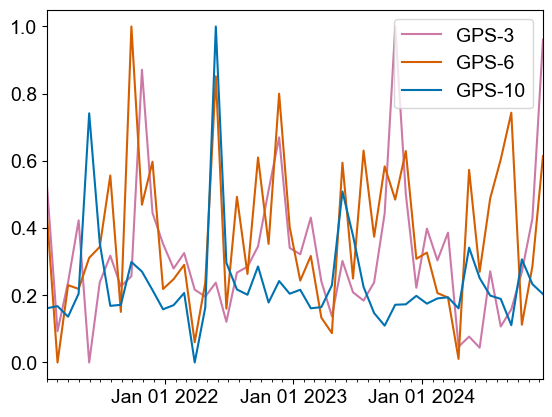

In [253]:
fig, ax = plt.subplots()

# manually picked start and end times for following data
start_time = pd.Timestamp('2021-01-01')
end_time = pd.Timestamp('2025-01-01')

interval = 30 # down sampling days
vel_interval = 1 # smoothing window
vel_true = True 
# vel_true = False

# GPS data

data = '2d'
df =  gam_gps3.copy() # Jtt1 gps 5 or gps 4
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = diff_shift(df, vel_interval)/interval # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax.plot(file.index, normalized, color=colors[0], label='GPS-3')

df =  gam_gps6.copy() # same as Jtt2
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = diff_shift(df, vel_interval)/interval # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax.plot(file.index, normalized, color=colors[1], label='GPS-6')

df =  gam_gps10.copy() # same as Jtt3
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = diff_shift(df, vel_interval)/interval # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax.plot(file.index, normalized, color=colors[2], label='GPS-10')

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax.xaxis.set_minor_locator(months)
ax.xaxis.set_major_locator(mdates.YearLocator(1, month=1, day=1))  # Major ticks on Jan 1st of every year
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d %Y')) 

ax.legend()

### Cold and warm figure

In [38]:
df = jtt_temp.copy()
df = df.resample('D').mean()

# Ensure the temperature column is correctly indexed
temperature_column = 'temperature'

# Extract year and month from the DateTime index
df['year'] = df.index.year
df['month'] = df.index.month

# Permafrost index
# Group by year and month
days_above_zero_monthly = df[df[temperature_column] > 0].groupby(['year', 'month']).size().reset_index(name='days_above_zero')
days_below_zero_monthly = df[df[temperature_column] < 0].groupby(['year', 'month']).size().reset_index(name='days_below_zero')

# Group by year only
days_above_zero_yearly = df[df[temperature_column] > 0].groupby(['year']).size().reset_index(name='days_above_zero')
days_below_zero_yearly = df[df[temperature_column] < 0].groupby(['year']).size().reset_index(name='days_below_zero')


# # Choose whether to use monthly or yearly data
# use_monthly = False # off
use_monthly = True  # on 

if use_monthly:
    # Merge the monthly DataFrames
    merged_df = pd.merge(days_above_zero_monthly, days_below_zero_monthly, on=['year', 'month'], how='outer').fillna(0)
    # Create a 'date' column from 'year' and 'month'
    merged_df['date'] = pd.to_datetime(merged_df[['year', 'month']].assign(day=1))
    # Set the 'date' column as the index
    merged_df.set_index('date', inplace=True)
    # Drop the now redundant 'year' and 'month' columns
    merged_df.drop(columns=['year', 'month'], inplace=True)
else:
    # Merge the yearly DataFrames
    merged_df = pd.merge(days_above_zero_yearly, days_below_zero_yearly, on=['year'], how='outer').fillna(0)
    # Create a 'date' column from 'year'
    merged_df['date'] = pd.to_datetime(merged_df['year'].astype(str) + '-01-01')
    # Set the 'date' column as the index
    merged_df.set_index('date', inplace=True)
    # Drop the now redundant 'year' column
    merged_df.drop(columns=['year'], inplace=True)

# Create the freeze index column
merged_df['freeze_index'] = merged_df['days_above_zero'] / (merged_df['days_below_zero'] + np.finfo(float).eps) # np.finfo(float).eps very smal value added to avoid dividing on zero

# Separate into warm and cold columns
merged_df['warm'] = merged_df['freeze_index'].apply(lambda x: x if x > 1 else np.nan)
merged_df['cold'] = merged_df['freeze_index'].apply(lambda x: x if x <= 1 else np.nan)

# Normalize warm and cold columns from 0 to 1
file = merged_df['warm']
merged_df['warm'] = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
file = merged_df['cold']
merged_df['cold'] = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))


freeze_index = merged_df.copy()
# plt.scatter(freeze_index.index, freeze_index['warm'], color=colors[1], label='Freeze index')
# plt.scatter(freeze_index.index, freeze_index['cold'], color=colors[2], label='Freeze index')

#### 3 year time series figure

(18628.0, 19723.0)

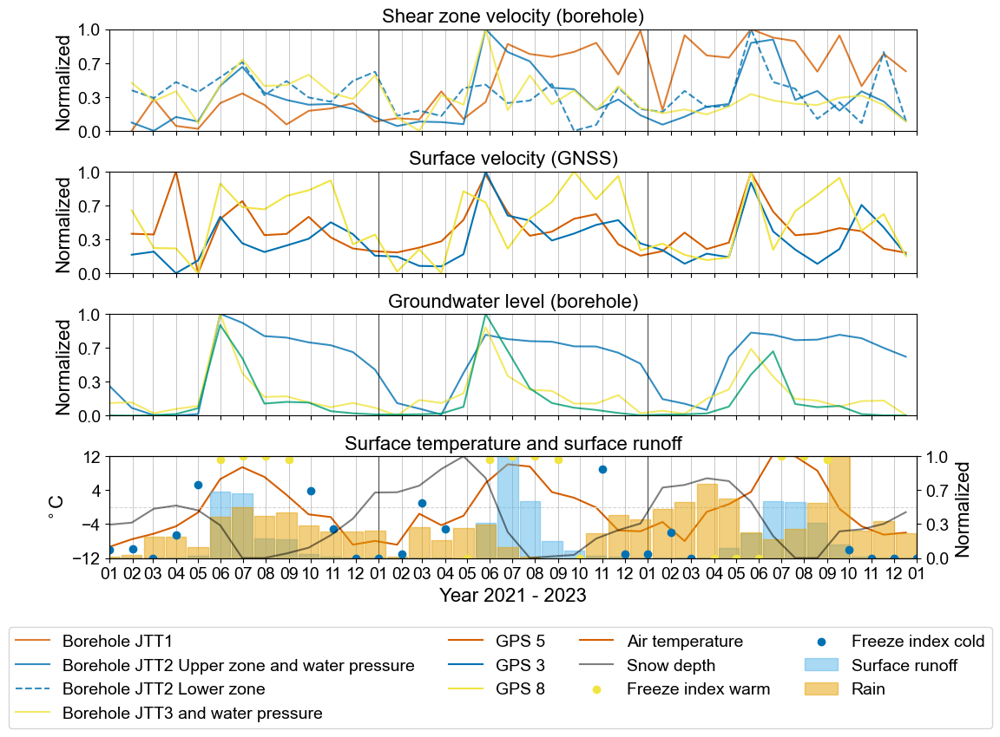

In [42]:
########### Cleaning DMS and GPS ############
from scipy.signal import savgol_filter

# rolling mean filter window
window_mean = 7 # 7 is enough to keep temp stationary

# savgol parameters
window_size = 11
poly_order = 3

def clean_lowpassfilt(file, colnmbr=0, name='Water table [m bgl]:'): # colnmbr is the column chosen to lowpass filter, name is wanted name for filtered column
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    file = file.resample('1D').median() # matching interval of cleaning parameters
    file = file.dropna()
    file['interpolated'] = file.iloc[:,colnmbr].interpolate(method='linear', limit_direction ='forward')
    # file['filt'] = butter_lowpass_filter(file.iloc[:,-1], cutoff, fs, order) # replace original by lowpass filtered
    file['filt'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    # file['filt'] = file['filt'].rolling(window=window_mean, center=True).mean() # rolling mean
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    file.rename(columns={'filt':name}, inplace=True) # I call it the same as original if it was dependent on name in scripts lower down
    return file
######################################

# plotting
ncols = 1
nrows = 4 # len(file['event'].unique()) // ncols + (len(file['event'].unique()) % ncols > 0)

fig, ax = plt.subplots(nrows, ncols,figsize=(12, 10), sharex=True)
fig.subplots_adjust(hspace = .4)

# manually picked start and end times for following data
file3 = JTT1Disp.copy()
start_time = pd.Timestamp('2021-01-01')
end_time = pd.Timestamp('2024-01-01')

interval = 30 # down sampling days
vel_interval = 1 # differencing rows


vel_true = False # always on
seasonal = False # always on

# turn on velocity or seasonal decomposition
vel_true = True 
# seasonal = True


file = JTT1Disp.iloc[:,0]
file =  file[file.index.slice_indexer(start_time,end_time)]
file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
file = file.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    file = diff_shift(file, vel_interval) # velocity
if seasonal:
    decomposed_series = STL(file.iloc[:,0], seasonal=13, period=12).fit() # for daily should be 13 and 365, monthly 13 and 12
    file = decomposed_series.seasonal
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
file = file.replace(np.nan,np.inf) # changing nan to inf
# ax[0].plot(file.index, file, color=colors[1], label='Borehole JTT1 ', alpha=0.8)
ax[0].plot(file.index, normalized, color=colors[1], label='Borehole JTT1 ', alpha=0.8)

file = JTT2DispUpperZone.iloc[:,0]
file =  file[file.index.slice_indexer(start_time,end_time)]
# zero = file[file.first_valid_index()]
file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
file = file.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    file = diff_shift(file, vel_interval) # velocity
if seasonal:
    decomposed_series = STL(file.iloc[:,0], seasonal=13, period=12).fit() # for daily should be 13 and 365, monthly 13 and 12
    file = decomposed_series.seasonal
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
file = file.replace(np.nan,np.inf) # changing nan to inf
# ax[0].plot(file.index, file, color=colors[2], label='Borehole JTT2 Upper zone and water pressure', alpha=0.8)
ax[0].plot(file.index, normalized, color=colors[2], label='Borehole JTT2 Upper zone and water pressure', alpha=0.8)

file = JTT2DispLowerZone.iloc[:,0]
file =  file[file.index.slice_indexer(start_time,end_time)]
# zero = file[file.first_valid_index()]
file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
file = file.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    file = diff_shift(file, vel_interval) # velocity
if seasonal:
    decomposed_series = STL(file.iloc[:,0], seasonal=13, period=12).fit() # for daily should be 13 and 365, monthly 13 and 12
    file = decomposed_series.seasonal
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
file = file.replace(np.nan,np.inf) # changing nan to inf
# ax[0].plot(file.index, file, color=colors[2], linestyle='dashed', label='Borehole JTT2 Lower zone', alpha=0.8)
ax[0].plot(file.index, normalized, color=colors[2], linestyle='dashed', label='Borehole JTT2 Lower zone', alpha=0.8)

file = JTT3Disp.iloc[:,0]
file =  file[file.index.slice_indexer(start_time,end_time)]
# zero = file[file.first_valid_index()]
file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
file = file.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    file = diff_shift(file, vel_interval) # velocity
if seasonal:
    decomposed_series = STL(file.iloc[:,0], seasonal=13, period=12).fit() # for daily should be 13 and 365, monthly 13 and 12
    file = decomposed_series.seasonal
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
file = file.replace(np.nan,np.inf) # changing nan to inf
# ax[0].plot(file.index, file, color=colors[3], label='Borehole JTT3 and water pressure', alpha=0.8)
ax[0].plot(file.index, normalized, color=colors[3], label='Borehole JTT3 and water pressure', alpha=0.8)


# GPS data

data = '2d'
df =  jett_gps5 # Jtt1 gps 5 or gps 4
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = diff_shift(df, vel_interval) # velocity
if seasonal:
    decomposed_series = STL(df.iloc[:,0], seasonal=13, period=12).fit() # for daily should be 13 and 365, monthly 13 and 12
    df = decomposed_series.seasonal
df.index = pd.to_datetime(df.index)
file = df.copy()
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
# ax[2].plot(file.index, file, color=colors[1], label='GPS 5')
ax[1].plot(file.index, normalized, color=colors[1], label='GPS 5')

df =  jett_gps3 # same as Jtt2
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = diff_shift(df, vel_interval) # velocity
if seasonal:
    decomposed_series = STL(df.iloc[:,0], seasonal=13, period=12).fit() # for daily should be 13 and 365, monthly 13 and 12
    df = decomposed_series.seasonal
df.index = pd.to_datetime(df.index)
file = df.copy()
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
# ax[2].plot(file.index, file, color=colors[2], label='GPS 3')
ax[1].plot(file.index, normalized, color=colors[2], label='GPS 3')

df =  jett_gps8 # same as Jtt3
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
df = df.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    df = diff_shift(df, vel_interval) # velocity
if seasonal:
    decomposed_series = STL(df.iloc[:,0], seasonal=13, period=12).fit() # for daily should be 13 and 365, monthly 13 and 12
    df = decomposed_series.seasonal
df.index = pd.to_datetime(df.index)
file = df.copy()
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
# ax[2].plot(file.index, file, color=colors[3], label='GPS 8')
ax[1].plot(file.index, normalized, color=colors[3], label='GPS 8')

# # water data

# file3 = JTT1Wp.copy()
# watermodule = 'Mod4_Water pressure [m]:'
# file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
# # file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
# file3 = file3[watermodule]
# # file3 = file3[file3.first_valid_index():]
# file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
# file = file3.values-np.nanmin(file3.values)
# normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
# ax[1].plot(file3.index, normalized, color=colors[4], label='Borehole JTT1 \nwater pressure', alpha=0.8)

file3 = JTT2WpUpperZone.copy()
watermodule = 'Mod4_Water pressure [m]:'
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
file3 = file3.resample(f'{interval}d').median() # downsampling with median value
# file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
file3 = file3[watermodule]
# file3 = file3[file3.first_valid_index():]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
file = file3.values-np.nanmin(file3.values)
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
# ax[1].plot(file3.index, file, color=colors[2], label='', alpha=0.8)
ax[2].plot(file3.index, normalized, color=colors[2], label='', alpha=0.8)

file3 = JTT3Wp.copy()
watermodule = 'Mod4_Water pressure [m]:'
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
file3 = file3.resample(f'{interval}d').median() # downsampling with median value
# file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
file3 = file3[watermodule]
# file3 = file3[file3.first_valid_index():]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
file = file3.values-np.nanmin(file3.values)
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
# ax[1].plot(file3.index, file, color=colors[3], label='', alpha=0.8)
ax[2].plot(file3.index, normalized, color=colors[3], label='', alpha=0.8)


file3 = river1.copy()
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
file3 = file3.resample(f'{interval}d').median() # downsampling with median value
file3 = file3.iloc[:,0]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
file = file3.values-np.nanmin(file3.values)
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[2].plot(file3.index, normalized, color=colors[4], alpha=0.8, label='Water flow')

# ax_y1 = ax[1].twinx()
# ax_y1.plot(file3.index, file, color=colors[4], alpha=0.8, label='Water flow')

width = 55/60*interval # width of bars

temp_sub = jtt_temp[jtt_temp.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))] # actual air temp
temp_sub = temp_sub.resample(f'{interval}d').median()

ax[3].plot(temp_sub.index, temp_sub['temperature'], color=colors[1], label='Air temperature')
ax[3].axhline(y=0.0, color='lightgray', linestyle='dashed', linewidth=.75) # showing zero


# ST_sub = ST[ST.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
# ST_sub.iloc[:,0] = medfilt(ST_sub.iloc[:,0], kernel_size=n_day)
# ST_sub.iloc[:,1] = medfilt(ST_sub.iloc[:,1], kernel_size=n_day)

# snowrain_melt_sub =  snowrain_melt[(snowrain_melt.index > start_time) & (snowrain_melt.index < end_time)]
surfacerunoff_sub =  jtt_xgeo_surfacerunnoff[jtt_xgeo_surfacerunnoff.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
surfacerunoff_sub = surfacerunoff_sub.resample(f'{interval}d').sum()
file = surfacerunoff_sub.iloc[:,0]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

ax_y3 = ax[3].twinx()
# ax_y3.bar(dates.date2num(file.index), file, width = width, ec=colors[5], color=colors[5], label='Surface runoff', alpha=0.5)
ax_y3.bar(dates.date2num(file.index), normalized, width = width, ec=colors[5], color=colors[5], label='Surface runoff', alpha=0.5)

xgeo_snow_sub =  jtt_xgeo_snow[jtt_xgeo_snow.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
xgeo_snow_sub = xgeo_snow_sub.resample(f'{interval}d').max()
file = xgeo_snow_sub.iloc[:,0]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

# ax_y3.plot(file.index, file, color=colors[7], label='Snow depth', alpha=0.5)
ax_y3.plot(file.index, normalized, color=colors[7], label='Snow depth', alpha=0.5)

xgeo_rain_sub =  jtt_precip[jtt_precip.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
xgeo_rain_sub = xgeo_rain_sub.resample(f'{interval}d').sum()
file = xgeo_rain_sub.iloc[:,0]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

# ax_y3.bar(dates.date2num(file.index), file, width = width, ec=colors[6], color=colors[6], label='Rain', alpha=0.5)
ax_y3.bar(dates.date2num(file.index), normalized, width = width, ec=colors[6], color=colors[6], label='Rain', alpha=0.5)

ax_y3.scatter(freeze_index.index, freeze_index['warm'], color=colors[3], label='Freeze index warm')
ax_y3.scatter(freeze_index.index, freeze_index['cold'], color=colors[2], label='Freeze index cold')

# ax[3].plot(ST_sub.index,ST_sub['ST2'], color=color_bacscarpairtemp, label='BS air temperature')
# ax[3].plot(ST_sub.index,ST_sub['ST3'], color=color_bacscarprocktemp, label='BS rock temperature')

# adjusting gridlines
nticks = 4
ax[0].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[1].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
# ax_y1.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[2].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[3].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax_y3.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))

ax[0].yaxis.set_major_formatter(FormatStrFormatter('%.1f')) # number of digits
ax[1].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
ax[2].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
ax_y3.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

# just to get an whole number so it looks nice
def myround(x, base=10):
    return base * round(x/base)

ymin, ymax = ax[0].get_ylim()
ax[0].set_ylim(0, 1) # velocity

ymin, ymax = ax[1].get_ylim()
# ax[1].set_ylim(0, myround(ymax, base=1)) # water level
ax[1].set_ylim(0, 1) # water level

# ymin, ymax = ax_y1.get_ylim()
# # ax_y1.set_ylim(0, 30) # available surface water, 1800 for two months, 1000 for 1 month
# ax_y1.set_ylim(0, 1) # available surface water, 1800 for two months, 1000 for 1 month

ymin, ymax = ax[2].get_ylim()
ax[2].set_ylim(0, 1) # velocity

ymin, ymax = ax[3].get_ylim()
# ymax = 24
ax[3].set_ylim(myround(-ymax, base=6), myround(ymax, base=6)) # temp -12 bas 6 for two months, 16 and base 8 for 1 month

ymin, ymax = ax_y3.get_ylim()
# ax_y3.set_ylim(0, 700) # available surface water, 1800 for two months, 1000 for 1 month
ax_y3.set_ylim(0,1)

if vel_true:
    ax[0].title.set_text('Shear zone velocity (borehole)')
    ax[1].title.set_text('Surface velocity (GNSS)')
    ax[2].title.set_text('Groundwater level (borehole)')
    ax[3].title.set_text('Air temperature and surface runoff')
else:
    ax[0].title.set_text('Shear zone displacement (borehole)')
    ax[1].title.set_text('Surface displacement (GNSS)')
    ax[2].title.set_text('Groundwater level (borehole)')
    ax[3].title.set_text('Air temperature and surface runoff')

#legend underneath plots
handles, labels = [(a + c + d + e) for a, c, d, e, in zip(ax[0].get_legend_handles_labels(), ax[1].get_legend_handles_labels(),ax[3].get_legend_handles_labels(),ax_y3.get_legend_handles_labels())] # , ax_y1.get_legend_handles_labels()
fig.subplots_adjust(bottom=0.27) # create space
fig.legend(handles, labels, loc = 'upper center', bbox_to_anchor=(0.5, 0.2), ncol=4) # center of fig


# set axis labels
ax[0].set_ylabel('mm/day')
# ax_y1.set_ylabel('m3/s') #  per 2 months
ax[1].set_ylabel('mm/day')
ax[2].set_ylabel('m change')
ax[3].set_ylabel('$^\circ$C')
ax_y3.set_ylabel('mm') #  per 2 months
ax[3].set_xlabel('Years')

# set axis labels
ax[0].set_ylabel('Normalized')
ax[1].set_ylabel('Normalized')
# ax_y1.set_ylabel('Normalized') #  per 2 months
ax[2].set_ylabel('Normalized')
ax[3].set_ylabel('$^\circ$C')
ax_y3.set_ylabel('Normalized') #  per 2 months
ax[3].set_xlabel('Years')

years = mdates.MonthLocator()   # set number for every other year
years_fmt = mdates.DateFormatter('%m') # only display year, not day and month
ax[3].set_xlabel(f'Year {start_time.year} - {end_time.year-1}')

ax[3].xaxis.set_major_locator(years)
ax[3].xaxis.set_major_formatter(years_fmt)

# Add a vertical line for each year
for i in range(nrows):
    for year in range(file.index.year.min(), file.index.year.max()+1):
        ax[i].axvline(pd.Timestamp(f'{year}-01-01'), color='black', linewidth=0.5)

# Add vertical line for each month with transparancy
for i in range(nrows):
    for year in range(file.index.year.min(), file.index.year.max() + 1):
        for month in range(1, 13):
            ax[i].axvline(pd.Timestamp(f'{year}-{month:02d}-01'), color='black', linewidth=0.5, alpha=0.3)

# removing tick labels from the xaxis
n = 1  # keeps every n row
[l.set_visible(False) for (i,l) in enumerate(ax[3].xaxis.get_ticklabels()) if i % n != 0]

# removing space on sides
ax[1].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))

#### Seasonal figure plotting 10 last years with median, max and min

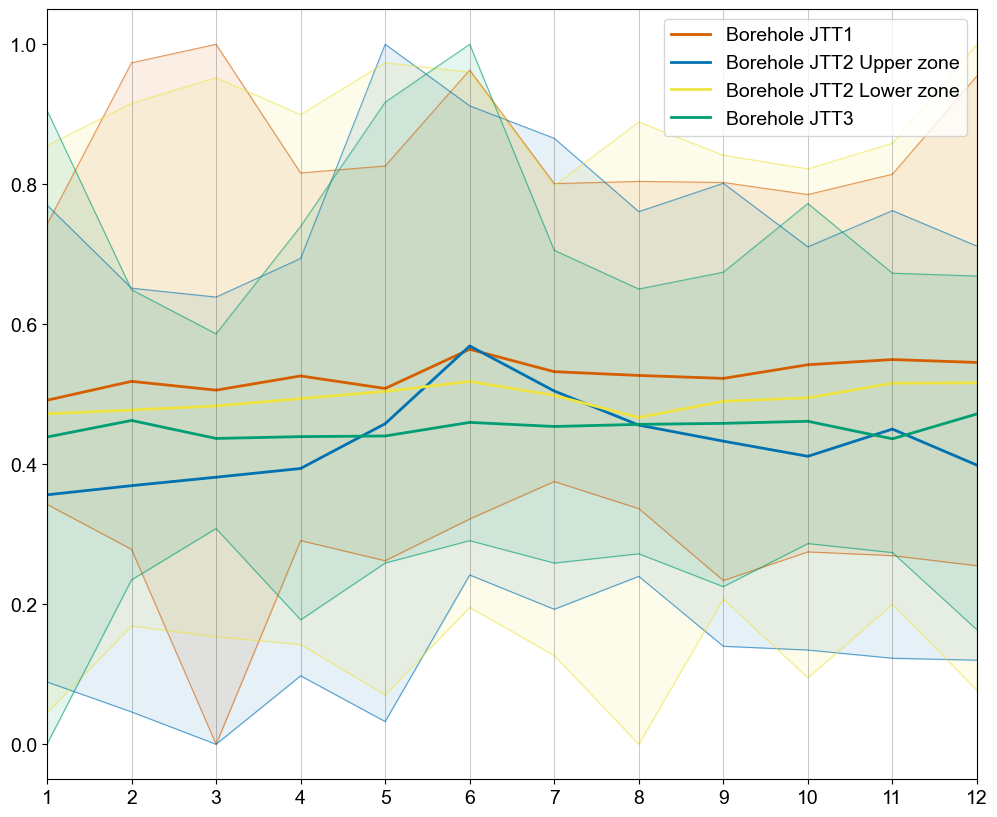

In [170]:
########### Cleaning DMS and GPS ############
from scipy.signal import savgol_filter

# rolling mean filter window
window_mean = 7 # 7 is enough to keep temp stationary

# savgol parameters
window_size = 11
poly_order = 3

def clean_lowpassfilt(file, colnmbr=0, name='Water table [m bgl]:'): # colnmbr is the column chosen to lowpass filter, name is wanted name for filtered column
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    file = file.resample('1D').median() # matching interval of cleaning parameters
    file = file.dropna()
    file['interpolated'] = file.iloc[:,colnmbr].interpolate(method='linear', limit_direction ='forward')
    # file['filt'] = butter_lowpass_filter(file.iloc[:,-1], cutoff, fs, order) # replace original by lowpass filtered
    file['filt'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    # file['filt'] = file['filt'].rolling(window=window_mean, center=True).mean() # rolling mean
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    file.rename(columns={'filt':name}, inplace=True) # I call it the same as original if it was dependent on name in scripts lower down
    return file

def plot_timeseries(ax, df, data, color, label):
    df[data] = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df)) # normalizing
    # Extract year and month from the DateTime index
    df['year'] = df.index.year
    df['month'] = df.index.month
    df['week'] = df.index.isocalendar().week
    
    # Group all years by month
    median = df.groupby(['month'])[data].median()
    minimum = df.groupby(['month'])[data].min()
    maximum = df.groupby(['month'])[data].max()
    df = pd.concat([median,maximum,minimum],axis=1)
    
    # plotting
    ax.plot(df.index, df.iloc[:,0], label=f'{label}', color=color, linewidth=2)
    ax.fill_between(df.index, df.iloc[:,1],df.iloc[:,2], color=color, alpha=0.1, label='')
    ax.plot(df.index, df.iloc[:,1], color=color, linewidth=0.8, linestyle='-', alpha=0.6)
    ax.plot(df.index, df.iloc[:,2], color=color, linewidth=0.8, linestyle='-', alpha=0.6)

######################################

# # plotting
# ncols = 1
# nrows = 3 # len(file['event'].unique()) // ncols + (len(file['event'].unique()) % ncols > 0)

# fig, ax = plt.subplots(nrows, ncols,figsize=(12, 10), sharex=True)
# fig.subplots_adjust(hspace = .4)

fig, ax = plt.subplots(figsize=(12, 10))

# manually picked start and end times for following data
start_time = pd.Timestamp('2019-01-01')
end_time = pd.Timestamp('2025-01-01')

interval = 1 # down sampling days
vel_interval = 1 # differencing rows


vel_true = False # always on
seasonal = False # always on

# turn on velocity or seasonal decomposition
vel_true = True 
# seasonal = True


data = 'Disp_summed [mm]:'
file = JTT1Disp.iloc[:,0]
file =  file[file.index.slice_indexer(start_time,end_time)]
file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
file = file.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    file = diff_shift(file, vel_interval) # velocity
if seasonal:
    decomposed_series = STL(file.iloc[:,0], seasonal=13, period=12).fit() # for daily should be 13 and 365, monthly 13 and 12
    file = decomposed_series.seasonal
plot_timeseries(ax, file, data, color=colors[1], label='Borehole JTT1')

# file = JTT2DispUpperZone.iloc[:,0]
# file =  file[file.index.slice_indexer(start_time,end_time)]
# # zero = file[file.first_valid_index()]
# file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
# file = file.resample(f'{interval}d').median() # downsampling with median value
# if vel_true:
#     file = diff_shift(file, vel_interval) # velocity
# if seasonal:
#     decomposed_series = STL(file.iloc[:,0], seasonal=13, period=12).fit() # for daily should be 13 and 365, monthly 13 and 12
#     file = decomposed_series.seasonal
# plot_timeseries(ax, file, data, color=colors[2], label='Borehole JTT2 Upper zone')

file = JTT2DispLowerZone.iloc[:,0]
file =  file[file.index.slice_indexer(start_time,end_time)]
# zero = file[file.first_valid_index()]
file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
file = file.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    file = diff_shift(file, vel_interval) # velocity
if seasonal:
    decomposed_series = STL(file.iloc[:,0], seasonal=13, period=12).fit() # for daily should be 13 and 365, monthly 13 and 12
    file = decomposed_series.seasonal
plot_timeseries(ax, file, data, color=colors[3], label='Borehole JTT2 Lower zone')

file = JTT3Disp.iloc[:,0]
file =  file[file.index.slice_indexer(start_time,end_time)]
# zero = file[file.first_valid_index()]
file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
file = file.resample(f'{interval}d').median() # downsampling with median value
if vel_true:
    file = diff_shift(file, vel_interval) # velocity
if seasonal:
    decomposed_series = STL(file.iloc[:,0], seasonal=13, period=12).fit() # for daily should be 13 and 365, monthly 13 and 12
    file = decomposed_series.seasonal
plot_timeseries(ax, file, data, color=colors[4], label='Borehole JTT3')


# # file3 = JTT1Wp.copy()
# # watermodule = 'Mod4_Water pressure [m]:'
# # file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
# # # file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
# # file3 = file3[watermodule]
# # # file3 = file3[file3.first_valid_index():]
# # file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
# # file = file3.values-np.nanmin(file3.values)
# # normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
# # ax[1].plot(file3.index, normalized, color=colors[4], label='Borehole JTT1 \nwater pressure', alpha=0.8)

# file3 = JTT2WpUpperZone.copy()
# data = 'Mod4_Water pressure [m]:'
# file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
# file3 = file3.resample(f'{interval}d').median() # downsampling with median value
# # file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
# file3 = file3[data]
# # file3 = file3[file3.first_valid_index():]
# file = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
# plot_timeseries(ax[1], file, data, color=colors[2], label='')

# file3 = JTT3Wp.copy()
# data = 'Mod4_Water pressure [m]:'
# file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
# file3 = file3.resample(f'{interval}d').median() # downsampling with median value
# # file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
# file3 = file3[data]
# # file3 = file3[file3.first_valid_index():]
# file = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
# # file = file3.values-np.nanmin(file3.values)
# plot_timeseries(ax[1], file, data, color=colors[4], label='')


# file3 = river1.copy()
# data = river1.columns[0]
# file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
# file3 = file3.resample(f'{interval}d').median() # downsampling with median value
# file3 = file3.loc[:,data]
# file = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
# # file = file3.values-np.nanmin(file3.values)
# plot_timeseries(ax[1], file, data, color=colors[5], label='Water flow')


# # GPS data

# data = '2d'
# df =  jett_gps5 # Jtt1 gps 5 or gps 4
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df = df[data].dropna()
# df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
# df = df.resample(f'{interval}d').median() # downsampling with median value
# if vel_true:
#     df = diff_shift(df, vel_interval) # velocity
# if seasonal:
#     decomposed_series = STL(df.iloc[:,0], seasonal=13, period=12).fit() # for daily should be 13 and 365, monthly 13 and 12
#     df = decomposed_series.seasonal
# df.index = pd.to_datetime(df.index)
# file = df.copy()
# plot_timeseries(ax[2], file, data, color=colors[1], label='GPS 5')

# df =  jett_gps3 # same as Jtt2
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df = df[data].dropna()
# df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
# df = df.resample(f'{interval}d').median() # downsampling with median value
# if vel_true:
#     df = diff_shift(df, vel_interval) # velocity
# if seasonal:
#     decomposed_series = STL(df.iloc[:,0], seasonal=13, period=12).fit() # for daily should be 13 and 365, monthly 13 and 12
#     df = decomposed_series.seasonal
# df.index = pd.to_datetime(df.index)
# file = df.copy()
# plot_timeseries(ax[2], file, data, color=colors[2], label='GPS 3')

# df =  jett_gps8 # same as Jtt3
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df = df[data].dropna()
# df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
# df = df.resample(f'{interval}d').median() # downsampling with median value
# if vel_true:
#     df = diff_shift(df, vel_interval) # velocity
# if seasonal:
#     decomposed_series = STL(df.iloc[:,0], seasonal=13, period=12).fit() # for daily should be 13 and 365, monthly 13 and 12
#     df = decomposed_series.seasonal
# df.index = pd.to_datetime(df.index)
# file = df.copy()
# plot_timeseries(ax[2], file, data, color=colors[4], label='GPS 8')


# Add vertical line for each month with transparancy

for month in range(1, 13):
    ax.axvline(month, color='black', linewidth=0.5, alpha=0.3)

ax.set_xticks(range(1, 13))
ax.set_xlim(1,12)
ax.legend()

# do same for GNSS!

#### Deformation figure. A lot or not much internal deformation. Can combine with seismic signal to see

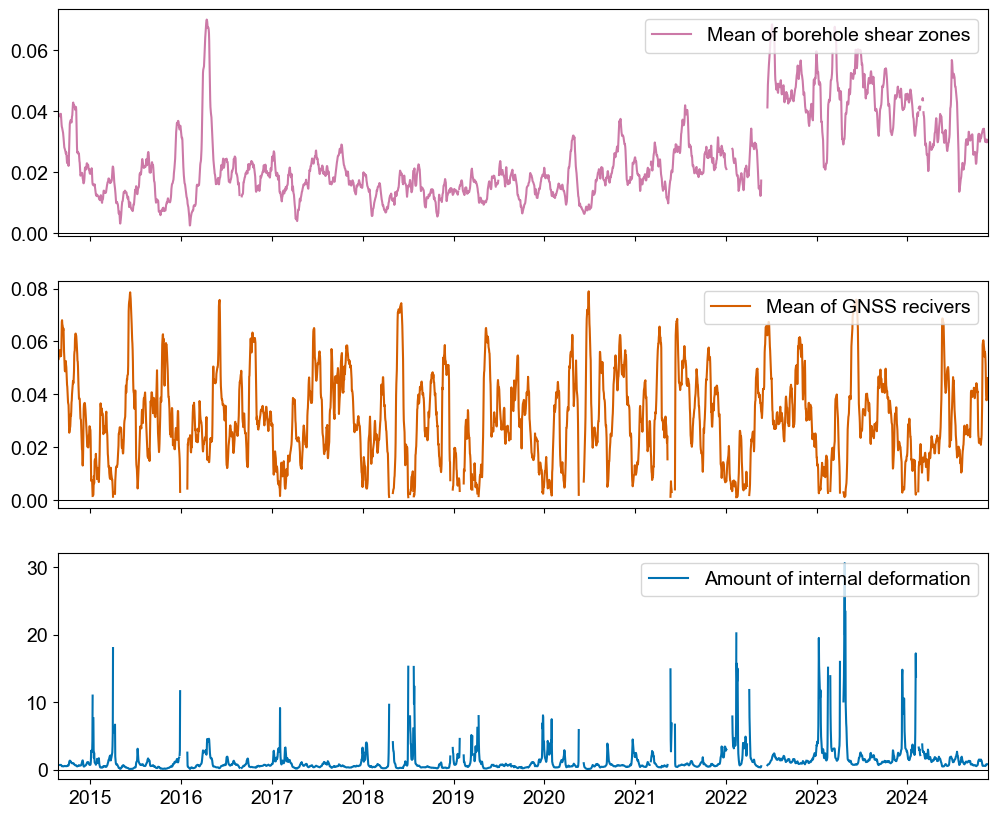

In [124]:
# Sum all GNSS curves / 3 and BH curves / 4

# due to seismic data resolution down sample to 1 day?


########### Cleaning DMS and GPS ############
from scipy.signal import savgol_filter

# rolling mean filter window
window_mean = 14

# savgol parameters
window_size = 7
poly_order = 3

def clean_lowpassfilt(file, colnmbr=0, name='Water table [m bgl]:'): # colnmbr is the column chosen to lowpass filter, name is wanted name for filtered column
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    # file = file.resample('1D').median() # matching interval of cleaning parameters
    file = file.dropna()
    file['interpolated'] = file.iloc[:,colnmbr].interpolate(method='linear', limit_direction ='forward')
    # file['filt'] = butter_lowpass_filter(file.iloc[:,-1], cutoff, fs, order) # replace original by lowpass filtered
    file['filt'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    file['filt'] = file['filt'].rolling(window=window_mean, center=True).median() # rolling median
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    file.rename(columns={'filt':name}, inplace=True) # I call it the same as original if it was dependent on name in scripts lower down
    return file
######################################

# plotting
ncols = 1
nrows = 3 # len(file['event'].unique()) // ncols + (len(file['event'].unique()) % ncols > 0)

fig, ax = plt.subplots(nrows, ncols,figsize=(12, 10), sharex=True)
# fig.subplots_adjust(hspace = .4)
                       
start_time = JTT3Disp.index[0]
end_time = JTT3Disp.index[-1]

# start_time = pd.Timestamp('2021-01-01')
# end_time = pd.Timestamp('2024-01-01')

interval = 1 # down sampling DAYS
vel_interval = 30 # differencing rows


vel_true = False # always on
vel_true = True 

file = JTT1Disp.iloc[:,0]
file =  file[file.index.slice_indexer(start_time,end_time)]
file = file.resample(f'{interval}d').median() # downsampling with median value to seismic data resolution
file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
if vel_true:
    file = diff_shift(file, vel_interval) # velocity
s1 = file.copy()

## Should not be included as separat block
# file = JTT2DispUpperZone.iloc[:,0]
# file =  file[file.index.slice_indexer(start_time,end_time)]
# file = file.resample(f'{interval}d').median() # downsampling with median value to seismic data resolution
# # zero = file[file.first_valid_index()]
# file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
# if vel_true:
#     file = diff_shift(file, vel_interval) # velocity
# s2 = file.copy()

# file = JTT2DispLowerZone.iloc[:,0]
# file =  file[file.index.slice_indexer(start_time,end_time)]
# file = file.resample(f'{interval}d').median() # downsampling with median value to seismic data resolution
# # zero = file[file.first_valid_index()]
# file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
# if vel_true:
#     file = diff_shift(file, vel_interval) # velocity
# s3 = file.copy()

file = JTT3Disp.iloc[:,0]
file =  file[file.index.slice_indexer(start_time,end_time)]
file = file.resample(f'{interval}d').median() # downsampling with median value to seismic data resolution
# zero = file[file.first_valid_index()]
file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
if vel_true:
    file = diff_shift(file, vel_interval) # velocity
s4 = file.copy()

file = pd.concat([s1, s4], axis=1) #s2 'JTT2U' s3 'JTT2L'
file.columns = ['JTT1', 'JTT3']
file['Mean_BH'] = file.mean(axis=1, skipna=False)

# GPS data
data = '2d'
df =  jett_gps5 # Jtt1 gps 5 or gps 4
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = df.resample(f'{interval}d').median() # downsampling with median value to seismic data resolution
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
if vel_true:
    df = diff_shift(df, vel_interval) # velocity
s1 = df.copy()

# df =  jett_gps3 # same as Jtt2
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df = df[data].dropna()
# df = df.resample(f'{interval}d').median() # downsampling with median value to seismic data resolution
# df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
# if vel_true:
#     df = diff_shift(df, vel_interval) # velocity
# s2 = df.copy()

df =  jett_gps8 # same as Jtt3
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = df.resample(f'{interval}d').median() # downsampling with median value to seismic data resolution
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
if vel_true:
    df = diff_shift(df, vel_interval) # velocity
s3 = df.copy()

df = pd.concat([s1, s3], axis=1) # s2 'GPS3'
df.columns = ['GPS5', 'GPS8']
df['Mean_GPS'] = df.mean(axis=1, skipna=False) # returns nan if any row is nan

plotfile = pd.concat([file, df], axis=1)

# interval = 7 # days downsampling
# plotfile = plotfile.resample(f'{interval}d').median() # downsampling with median value

plotfile[plotfile < 0.001] = pd.NA # to remove negative velocity 
plotfile['Int_deformation'] = plotfile.loc[:,'Mean_BH'] / plotfile.loc[:,'Mean_GPS']
# plotfile = plotfile.replace(np.nan,np.inf) # changing nan to inf to avoid plotting line between datagaps

ax[0].plot(plotfile.index, plotfile.loc[:,'Mean_BH'], color=colors[0], label='Mean of borehole shear zones')
ax[1].plot(plotfile.index, plotfile.loc[:,'Mean_GPS'], color=colors[1], label='Mean of GNSS recivers')
ax[2].plot(plotfile.index, plotfile.loc[:,'Int_deformation'], color=colors[2], label='Amount of internal deformation')

# horizontal lines
ax[0].axhline(y=0, color='k', linestyle='-', linewidth=0.75)
ax[1].axhline(y=0, color='k', linestyle='-', linewidth=0.75)
ax[2].axhline(y=0, color='k', linestyle='-', linewidth=0.75)

for i, d in enumerate(ax):
    d.legend(loc='upper right')
    
# ax[0].set_title('Title for First Plot')
# ax[1].set_title('Title for Second Plot')

0.5128802514935898


<Axes: >

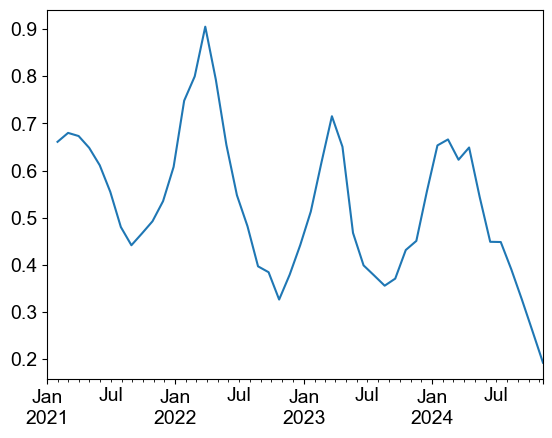

In [25]:
# ratio between sz and gnss

# # BH 1
# file = JTT1Disp.iloc[:,0]
# file =  file[file.index.slice_indexer(start_time,end_time)]
# file = file.resample(f'{interval}d').median() # downsampling with median value to seismic data resolution
# # zero = file[file.first_valid_index()]
# file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
# if vel_true:
#     file = diff_shift(file, vel_interval) # velocity

# data = '2d'
# df =  jett_gps5 # Jtt1 gps 5 or gps 4
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df = df[data].dropna()
# df = df.resample(f'{interval}d').median() # downsampling with median value to seismic data resolution
# df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
# if vel_true:
#     df = diff_shift(df, vel_interval) # velocity

# BH 3
file = JTT3Disp.iloc[:,0]
file =  file[file.index.slice_indexer(start_time,end_time)]
file = file.resample(f'{interval}d').median() # downsampling with median value to seismic data resolution
# zero = file[file.first_valid_index()]
file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
if vel_true:
    file = diff_shift(file, vel_interval) # velocity

df =  jett_gps8 # same as Jtt3
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = df.resample(f'{interval}d').median() # downsampling with median value to seismic data resolution
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
if vel_true:
    df = diff_shift(df, vel_interval) # velocity

plotfile = pd.concat([file, df], axis=1)

# interval = 7 # days downsampling
# plotfile = plotfile.resample(f'{interval}d').median() # downsampling with median value

plotfile.head()

plotfile[plotfile < 0.001] = pd.NA # to remove negative velocity 
plotfile['Int_deformation'] = plotfile.loc[:,'Disp_summed [mm]:'] / plotfile.loc[:,'2d']

print(plotfile['Int_deformation'].median())
plotfile['Int_deformation'].plot()

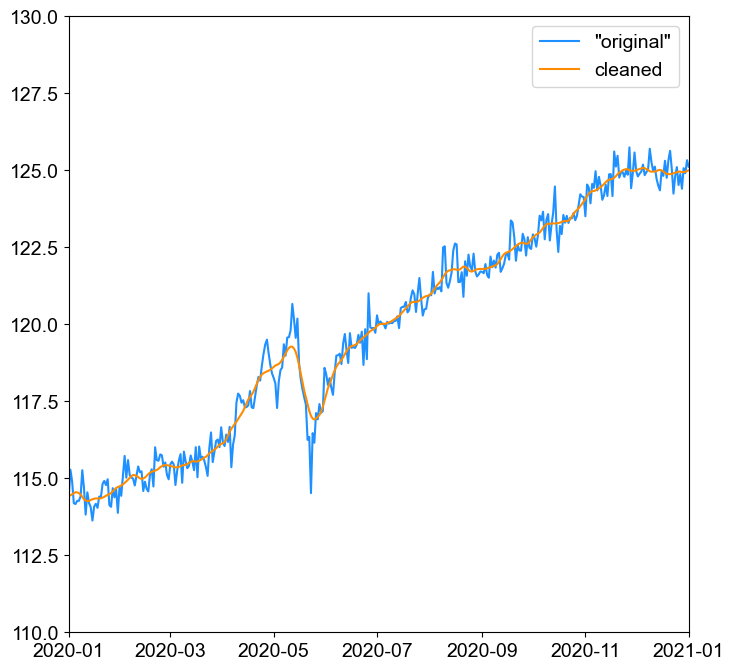

In [77]:
# window_size = 7
# poly_order = 3

window_mean = 14

data = '2d'
df =  jett_gps5 # Jtt1 gps 5 or gps 4
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = df.resample('1d').median() # downsampling with median value to same resolution as GNSS
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')

fig, ax = plt.subplots(figsize=(8, 8)) 
ax.plot(jett_gps5.loc[:,'2d'], label='"original"', color='dodgerblue')
ax.plot(df, label='cleaned', color='darkorange')
ax.set_xlim(pd.Timestamp('2020-01-01'),pd.Timestamp('2021-01-01'))
ax.set_ylim(110,130)
ax.legend()

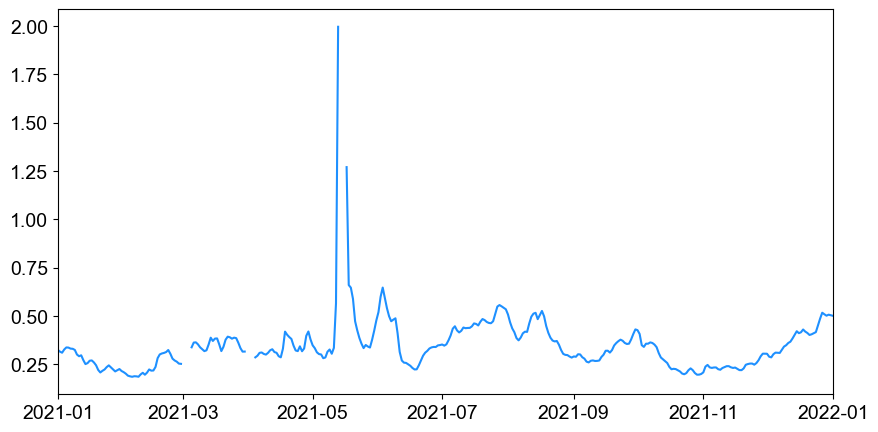

In [409]:
start_time = pd.Timestamp('2021-01-01')
end_time = pd.Timestamp('2022-01-01')

test = plotfile[plotfile.index.slice_indexer(start_time,end_time)]

fig, ax = plt.subplots(figsize=(10, 5)) 
ax.plot(test.loc[:,'Int_deformation'], label='internal deformation', color='dodgerblue')

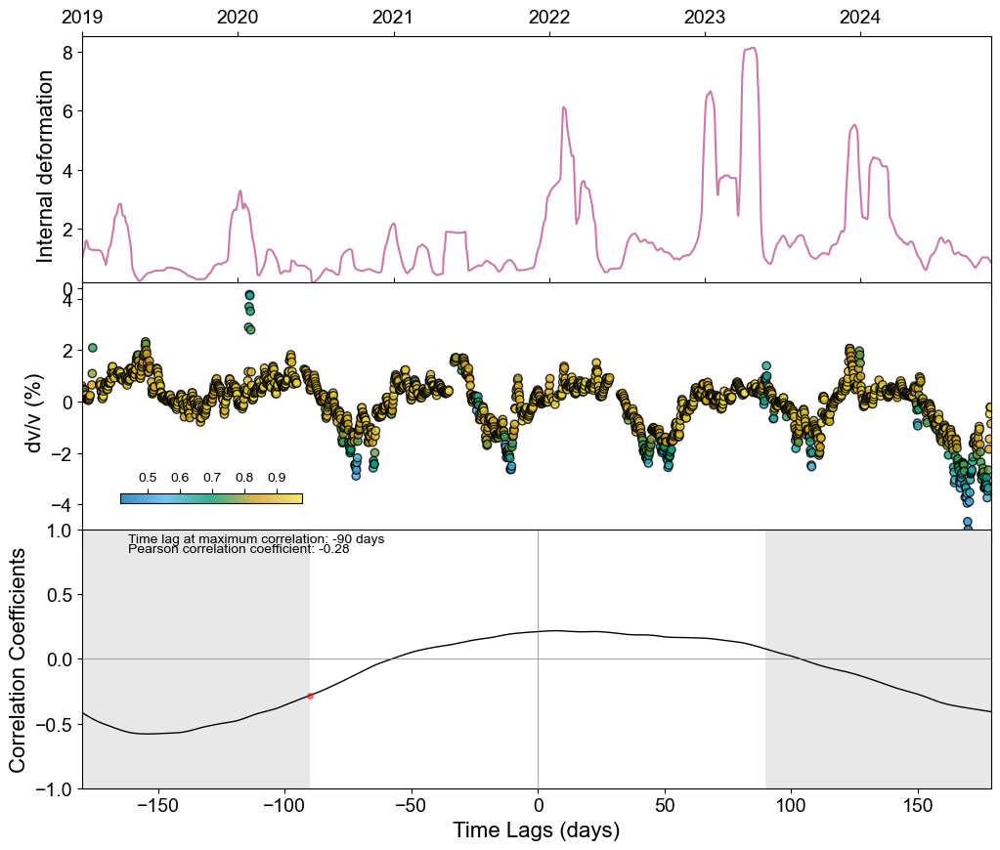

In [130]:
# Sum all GNSS curves / 3 and BH curves / 4
import scipy.stats as st 

########### Cleaning DMS and GPS ############
from scipy.signal import savgol_filter

# rolling mean filter window
window_mean = 7 # 7 is enough to keep temp stationary

# savgol parameters
window_size = 11
poly_order = 3

def clean_lowpassfilt(file, colnmbr=0, name='Water table [m bgl]:'): # colnmbr is the column chosen to lowpass filter, name is wanted name for filtered column
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    file = file.resample('1D').median() # matching interval of cleaning parameters
    file = file.dropna()
    file['interpolated'] = file.iloc[:,colnmbr].interpolate(method='linear', limit_direction ='forward')
    # file['filt'] = butter_lowpass_filter(file.iloc[:,-1], cutoff, fs, order) # replace original by lowpass filtered
    file['filt'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    # file['filt'] = file['filt'].rolling(window=window_mean, center=True).mean() # rolling mean
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    file.rename(columns={'filt':name}, inplace=True) # I call it the same as original if it was dependent on name in scripts lower down
    return file
######################################

# plotting
ncols = 1
nrows = 3 # len(file['event'].unique()) // ncols + (len(file['event'].unique()) % ncols > 0)

fig, ax = plt.subplots(nrows, ncols,figsize=(12, 10)) # , sharex=True
fig.subplots_adjust(hspace = -.045)

## Rain data
# file = jtt_xgeo_rain.iloc[:,0].copy() # modeled xgeo
# file.index = file.index - pd.DateOffset(hours=6) # xgeo
# file = jtt_precip.iloc[:,0].copy() # observed data
# file = file.resample('1d').sum() # hourly data so sum to daily

# ## River data
# file = river1.iloc[:,0].copy()
# file = file.resample('1d').max() # hourly data so sum to daily

# Internal deformation data
file = plotfile['Int_deformation'].copy() 

## smoothing
window_mean=30
file = file.dropna().rolling(window=window_mean, center=True).mean()


df = pd.concat([file, seismic], axis=1)
df = df.dropna() # remove nans

# df = pd.concat([intdef_smoothed, seismic], axis=1) # smoothed int def
start_time = pd.Timestamp('2019-01-01')
end_time = plotfile.index[-1] # pd.Timestamp('2025-01-01')
df =  df[df.index.slice_indexer(start_time,end_time)]

# # zoom
# start_time = pd.Timestamp('2022-01-01')
# end_time = pd.Timestamp('2023-01-01')
# df =  df[df.index.slice_indexer(start_time,end_time)]

ax[0].plot(df.index, df.iloc[:,0], color=colors[0])

# ## mean value
# plotfile['Int_deformation_interp'] = plotfile['Int_deformation'].interpolate(method='linear', limit=3, limit_direction='both')
# plotfile['Int_def_mean'] = plotfile.loc[:,'Int_deformation_interp'].rolling(window=roll_window, center=True).mean()
# ax[0].plot(plotfile.index, plotfile.loc[:,'Int_def_mean'], color=colors[2]) # where=~df['value'].isna()

color_gradient = [
    "#0072B2",  # Dark Blue
    "#56B4E9",  # Light Blue
    "#009E73",  # Light Green
    "#D4A017",  # Dark Yellow (warmer, closer to orange)
    "#F0E442"   # Bright Yellow
]

# Create a continuous colormap
cmap = mcolors.LinearSegmentedColormap.from_list("colors", color_gradient, N=256)
norm = mcolors.Normalize(vmin=np.nanmin(df.loc[:,'cc(Correlation_coefficient)']), vmax=np.nanmax(df.loc[:,'cc(Correlation_coefficient)']))
sc = ax[1].scatter(df.index, df.loc[:,'dv/v(%)'], c=df.loc[:,'cc(Correlation_coefficient)'], cmap=cmap, norm=norm, edgecolor='k', alpha=0.8)

# ## mean value
# seismic['dV/V_interp'] =  seismic.iloc[:,0].interpolate(method='linear', limit=3, limit_direction='both')
# seismic['dV/V_mean'] = seismic.loc[:,'dV/V_interp'].rolling(window=roll_window, center=True).mean()
# ax[1].plot(seismic.index, seismic.loc[:,'dV/V_mean'], color=colors[1])

# colorbar
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
# Add inset colorbar inside the plot (lower left)
cax = inset_axes(ax[1], width="20%", height="4%", loc="lower left", borderpad=2)
cbar = plt.colorbar(sc, cax=cax, orientation="horizontal")

# Set colorbar limits and ticks
cbar.set_ticks(np.arange(0.5, 0.91, 0.1))  # Tick positions
# cbar.set_label("CC", fontsize=10, labelpad=4)

# Format colorbar text (move to top, smaller font)
cbar.ax.xaxis.set_label_position("top")  # Move label above
cbar.ax.xaxis.set_ticks_position("top")  # Move ticks above
cbar.ax.tick_params(labelsize=10)  # Reduce font size


ax[0].axhline(y=0, color='k', linestyle='-', linewidth=0.75) # horizontal line


# file = plotfile.loc[:,'Int_def_mean'].copy()
# normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
# ax[2].plot(plotfile.index, normalized , color=colors[2])

# file = seismic.loc[:,'dV/V_mean'].copy()
# normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
# ax[2].plot(seismic.iloc[:,0], normalized, color=colors[1])

## cross corr plot
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler() # normalize between 0 and 1, has to be this when dataset is not normally distributed
scaled_df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns, index=df.index)
scaled_df = scaled_df.dropna() # is this a good way of doing it?

crosscorr_lag = 6 # tried 3 months did not work, tried 12 months = too much. Try 6 months now and only look at 3 months by graying out the boarders.
interval = '1D'

# series1 = df.iloc[:,0] # seasonal disp
# series2 = df.iloc[:,1] # seasonal wp

series1 = scaled_df.iloc[:,1] # seismic (dV/V)
series2 = scaled_df.iloc[:,0] # internal deformation

# Set the maximum lag you want to consider

#### frequency ####
if interval == '1D':
    h = 1 # per day 
    time_inter = 'days'
if interval == '1W':
    h = 1/7 # per week 
    time_inter = 'weeks'
if interval == '1M':
    h = 1/30 # per week 
    time_inter = 'months'
#######################
n_months = crosscorr_lag
period = int(h*90) # we assume correlation should happen within 90 days # to make sure it is an integer number
max_lag = int(n_months*30*h) # to make sure it is an integer number
lags = range(-max_lag, max_lag)

# Initialize arrays to store results
correlation_coefficients = []
p_values = []

# Loop through different time lags (both positive and negative)
for lag in lags:
    # Calculate Pearson correlation coefficient and p-value
    if lag < 0:
        correlation_coefficient, p_value = pearsonr(series1[:lag], series2[-lag:])
    elif lag == 0:
        correlation_coefficient, p_value = pearsonr(series1, series2)
    else:
        correlation_coefficient, p_value = pearsonr(series1[lag:], series2[:-lag])
    
    # Append results to arrays
    correlation_coefficients.append(correlation_coefficient)
    p_values.append(p_value)

# Find the lag with the maximum absolute correlation within +/- 3 months
corr_window = correlation_coefficients[period:period*3]
max_corr_index = np.argmax(np.abs(corr_window))
max_corr_lag = lags[period:period*3][max_corr_index]

n_std = 2
small_size = 10

import scipy.stats as st 

# changing lags to days
lags_plot = np.linspace(lags[0]/h,lags[-1]/h, num=int(max_lag*2)) # days

pannel = ax[2] # lags_plot, correlation_coefficients
pannel.plot(lags_plot, correlation_coefficients, color='black', lw=1)
pannel.axvline(x = 0, color = 'gray', lw = 0.5)
pannel.axhline(y = 0, color = 'gray', lw = 0.5)
pannel.plot(max_corr_lag, corr_window[max_corr_index], color='red', marker='o', markersize=4, alpha=0.5) # zorder=0 # point to highlight max within corr_window # point to highlight max within corr_window

# gray out area
pannel.axvspan(lags_plot[0], -period, facecolor='lightgray', alpha=0.5)
pannel.axvspan(+period,lags_plot[-1], facecolor='lightgray', alpha=0.5)

# text in the plot
y_pos = lags_plot[0]-(lags_plot[0]*0.1)
pannel.text(y_pos, 0.90, f'Time lag at maximum correlation: {max_corr_lag:.0f} {time_inter}', horizontalalignment='left', color='k', fontsize=small_size)
pannel.text(y_pos, 0.83, f'Pearson correlation coefficient: {corr_window[max_corr_index]:.2f}', horizontalalignment='left', color='k', fontsize=small_size)

# cosmetics
pannel.set(ylim = [-1, 1])
pannel.set_ylabel('Correlation Coefficients')
pannel.set_xlabel(f'Time Lags ({time_inter})')

# ax[0].set_ylabel('Rain')
# ax[0].set_ylabel('Riverflow')
ax[0].set_ylabel('Internal deformation')

ax[1].set_ylabel('dv/v (%)') 
# Set the x-axis to show ticks every year
ax[1].xaxis.set_major_locator(mdates.YearLocator())  # Major ticks every year
ax[1].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Format to show year only
# ax[1].set_xlabel('Years')

ax[0].tick_params(axis='x', which='both', labeltop=True, top=True)  # Show labels and ticks on the top
ax[0].tick_params(labelbottom=False)
ax[1].tick_params(axis='x', which='both', top=True)  # Show labels and ticks on the top
ax[1].tick_params(labelbottom=False)


## TO DO
# normalize figure?
# CORRELATE THE TWO AND SHOW CORRELATION


,Vannføring (m³/s),Korrigert,Kontrollert,year,month,day
datetime,,,,,,
2013-01-01 00:00:00,1.099008,1,3,2013,1,1
2013-01-01 00:30:00,1.098908,1,3,2013,1,1
2013-01-01 01:00:00,1.098802,1,3,2013,1,1
2013-01-01 01:30:00,1.1356,1,3,2013,1,1
2013-01-01 02:00:00,1.132167,1,3,2013,1,1


<Axes: xlabel='datetime'>

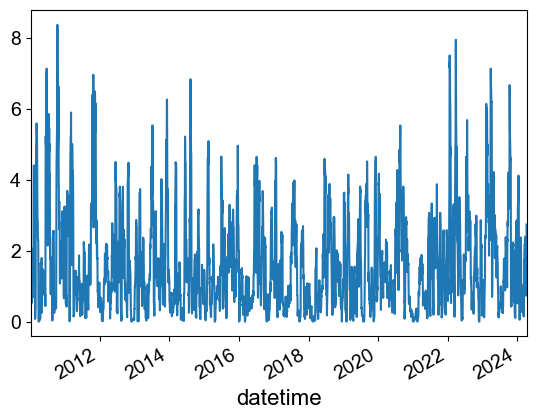

In [131]:
file = jtt_xgeo_rain.iloc[:,0].copy()
file.index = file.index - pd.DateOffset(hours=6)

window_mean=14
file = file.dropna().rolling(window=window_mean, center=True).mean()
file.plot()

<Axes: xlabel='datetime'>

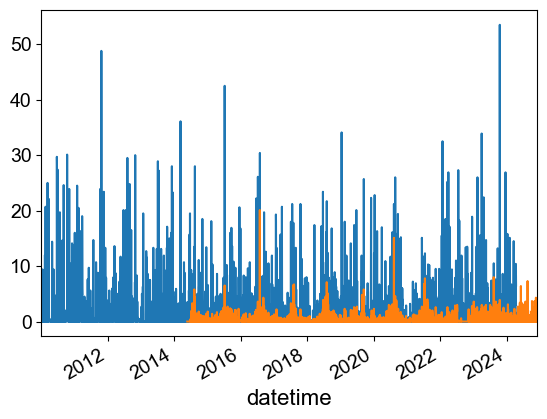

In [99]:
jtt_xgeo_rain.iloc[:,0].plot()
jtt_precip.iloc[:,0].plot()

<Axes: xlabel='datetime'>

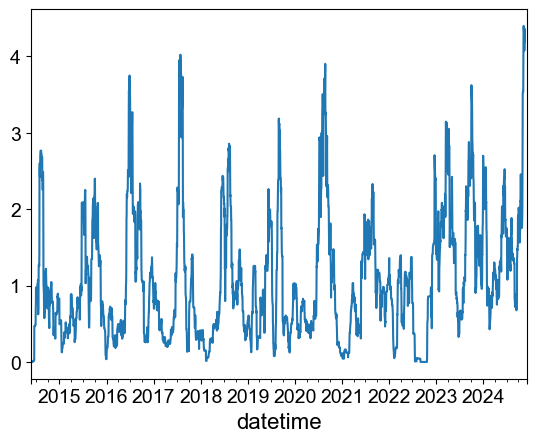

In [145]:
file.plot()

C:\Users\andregas\AppData\Local\Temp\ipykernel_15960\3918175685.py:7: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  index=pd.date_range('2020-01-01', periods=5, freq='Y'))


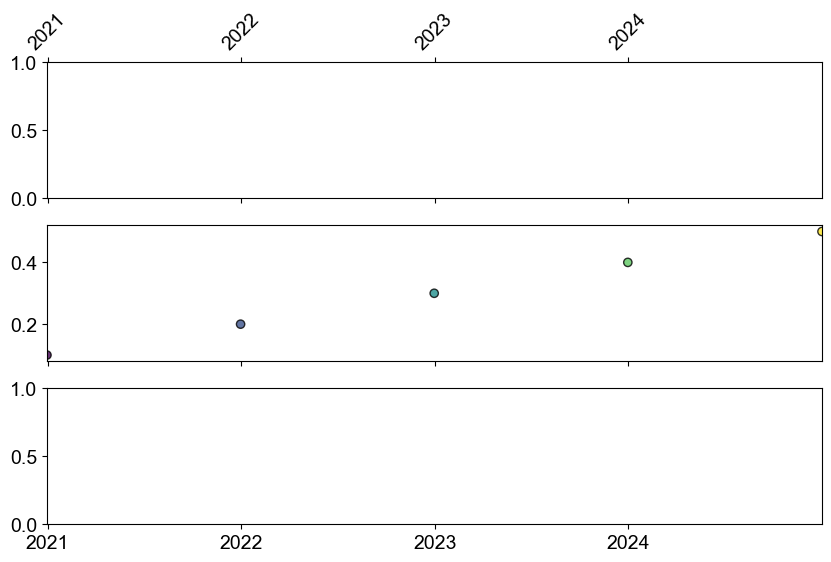

In [138]:
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.dates as mdates

# Sample data
df = pd.DataFrame({'dv/v(%)': [0.1, 0.2, 0.3, 0.4, 0.5]}, 
                  index=pd.date_range('2020-01-01', periods=5, freq='Y'))

# Create the figure and subplots
fig, ax = plt.subplots(3, 1, figsize=(10, 6), sharex=True)

# Plot on ax[1] as an example
ax[1].scatter(df.index, df['dv/v(%)'], c=df['dv/v(%)'], cmap='viridis', edgecolor='k', alpha=0.8)

# Set x-axis tick marks for years
ax[0].xaxis.set_major_locator(mdates.YearLocator())  # Major ticks every year
ax[0].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Format to show year only

# Enable top ticks and labels for ax[0]
ax[0].tick_params(axis='x', which='both', labeltop=True, top=True)  # Show labels and ticks on the top

# Remove bottom x-axis labels for ax[0] (optional, if you don’t want them both at top and bottom)
ax[0].tick_params(labelbottom=False)

# Rotate tick labels for better visibility
ax[0].xaxis.set_tick_params(rotation=45)

plt.show()


In [86]:
seismic.head()

,dv/v(%),cc(Correlation_coefficient)
Datetime,,
2016-01-01,NaN,NaN
2016-01-02,NaN,NaN
2016-01-03,NaN,NaN
2016-01-04,NaN,NaN
2016-01-05,NaN,NaN


In [53]:
# Normalize both DataFrames to ignore hours/minutes/seconds
plotfile.index = plotfile.index.normalize()  # Remove time from plotfile
seismic.index = seismic.index.normalize()   # Remove time from seismic

df = pd.concat([plotfile, seismic], axis=1)
start_time = pd.Timestamp('2019-01-01')
end_time = plotfile.index[-1] # pd.Timestamp('2025-01-01')
df =  df[df.index.slice_indexer(start_time,end_time)]
# df = df.drop(['Datetime', 'datetime(Matlab_format)'], axis=1)
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler() # normalize between 0 and 1, has to be this when dataset is not normally distributed
scaled_df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns, index=df.index)
scaled_df = scaled_df.dropna() # is this a good way of doing it?

In [57]:
scaled_df.head()

,JTT1,JTT2U,JTT2L,JTT3,Mean_BH,GPS5,GPS3,GPS8,Mean_GPS,Int_deformation,dv/v(%),cc(Correlation_coefficient)
2019-04-20,0.091815,0.046648,0.396119,0.169356,0.073028,0.007676,0.049435,0.209693,0.115238,0.042917,0.631976,0.666297
2019-04-21,0.091300,0.098968,0.379298,0.160163,0.087743,0.033533,0.048773,0.220092,0.122676,0.043229,0.638782,0.788897
2019-04-22,0.091892,0.119867,0.366802,0.149645,0.091605,0.057603,0.048355,0.236983,0.131017,0.040621,0.650855,0.794430
2019-04-23,0.090346,0.133093,0.400913,0.133319,0.096297,0.063197,0.047999,0.214943,0.128155,0.042898,0.638571,0.880868
2019-04-24,0.086641,0.142020,0.454762,0.118012,0.100937,0.066302,0.046033,0.156953,0.117242,0.049145,0.686531,0.879306


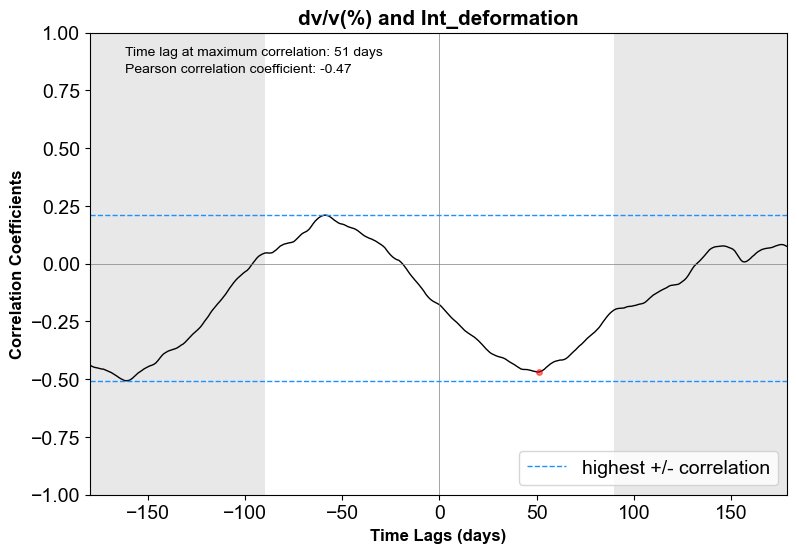

In [59]:
# This method is good. Same outcome as for statsmodels ccf

# Do correlations on stationary variables!

crosscorr_lag = 6 # tried 3 months did not work, tried 12 months = too much. Try 6 months now and only look at 3 months by graying out the boarders.
interval = '1D'

# series1 = df.iloc[:,0] # seasonal disp
# series2 = df.iloc[:,1] # seasonal wp

series1 = scaled_df.iloc[:,-2] # seismic (dV/V)
series2 = scaled_df.iloc[:,-3] # internal deformation

# Set the maximum lag you want to consider

#### frequency ####
if interval == '1D':
    h = 1 # per day 
    time_inter = 'days'
if interval == '1W':
    h = 1/7 # per week 
    time_inter = 'weeks'
if interval == '1M':
    h = 1/30 # per week 
    time_inter = 'months'
#######################
n_months = crosscorr_lag
period = int(h*90) # we assume correlation should happen within 90 days # to make sure it is an integer number
max_lag = int(n_months*30*h) # to make sure it is an integer number
lags = range(-max_lag, max_lag)

# Initialize arrays to store results
correlation_coefficients = []
p_values = []

# Loop through different time lags (both positive and negative)
for lag in lags:
    # Calculate Pearson correlation coefficient and p-value
    if lag < 0:
        correlation_coefficient, p_value = pearsonr(series1[:lag], series2[-lag:])
    elif lag == 0:
        correlation_coefficient, p_value = pearsonr(series1, series2)
    else:
        correlation_coefficient, p_value = pearsonr(series1[lag:], series2[:-lag])
    
    # Append results to arrays
    correlation_coefficients.append(correlation_coefficient)
    p_values.append(p_value)

# # Find the lag with the maximum absolute correlation for entire time series
# max_corr_index = np.argmax(np.abs(correlation_coefficients))
# max_corr_lag = lags[max_corr_index]

# Find the lag with the maximum absolute correlation within +/- 3 months
corr_window = correlation_coefficients[period:period*3]
max_corr_index = np.argmax(np.abs(corr_window))
max_corr_lag = lags[period:period*3][max_corr_index]

n_std = 2
small_size = 10

import scipy.stats as st 
def ccf_plot(lags, ccf):
    fig, ax =plt.subplots(figsize=(9, 6))
    ax.plot(lags, ccf, color='black', lw=1)
    ax.axvline(x = 0, color = 'gray', lw = 0.5)
    ax.axhline(y = 0, color = 'gray', lw = 0.5)
    ax.axhline(y = np.max(ccf), color = 'dodgerblue', lw = 1, linestyle='--', label = 'highest +/- correlation')
    ax.axhline(y = np.min(ccf), color = 'dodgerblue', lw = 1, linestyle='--')
    ax.plot(max_corr_lag, corr_window[max_corr_index], color='red', marker='o', markersize=4, alpha=0.5) # zorder=0 # point to highlight max within corr_window # point to highlight max within corr_window
    
    # # 2 x std
    # ax.axhline(y = np.mean(ccf)+n_std*np.std(ccf), color = 'darkorange', lw = 1, linestyle='--', label = f'{n_std} x std')
    # ax.axhline(y = np.mean(ccf)-n_std*np.std(ccf), color = 'darkorange', lw = 1, linestyle='--')
    # # # 1 x std
    # # ax.axhline(y = np.mean(ccf)+1*np.std(ccf), color = 'red', lw = 1, linestyle='--', label = f'{1} x std')
    # # ax.axhline(y = np.mean(ccf)-1*np.std(ccf), color = 'red', lw = 1, linestyle='--')
    
    # gray out area
    ax.axvspan(lags_plot[0], -period, facecolor='lightgray', alpha=0.5)
    ax.axvspan(+period,lags_plot[-1], facecolor='lightgray', alpha=0.5)
    
    # text in the plot
    y_pos = lags_plot[0]-(lags_plot[0]*0.1)
    ax.text(y_pos, 0.90, f'Time lag at maximum correlation: {max_corr_lag:.0f} {time_inter}', horizontalalignment='left', color='k', fontsize=small_size)
    ax.text(y_pos, 0.83, f'Pearson correlation coefficient: {corr_window[max_corr_index]:.2f}', horizontalalignment='left', color='k', fontsize=small_size)
    # ax.text(y_pos, 0.76, f'2 x standard deviation: +{np.mean(ccf)+n_std*np.std(ccf):.2f}/{np.mean(ccf)-n_std*np.std(ccf):.2f}', horizontalalignment='left', color='k', fontsize=small_size)
    pval = []
    # if p_values[max_corr_index] < 0.001:
    #     ax.text(y_pos, 0.69, f'P-value: <0.001', horizontalalignment='left', color='k', fontsize=small_size)
    # else:
    #     ax.text(y_pos, 0.69, f'P-value: {p_values[max_corr_index]:.3f}', horizontalalignment='left', color='k', fontsize=small_size)
    
    # cosmetics
    ax.set(ylim = [-1, 1])
    ax.set_title(f'{series1.name} and {series2.name}', weight='bold', fontsize = 15)
    ax.set_ylabel('Correlation Coefficients', weight='bold', fontsize = 12)
    ax.set_xlabel(f'Time Lags ({time_inter})', weight='bold', fontsize = 12)
    
    plt.legend(loc='lower right')
    
    # # saving
    # path = 'plots\\'
    # save_name = f'{path}crosscorr_{series1.name}_{series2.name}_lag{n_months}.png'
    # fig.savefig(save_name, dpi=300, bbox_inches='tight')
    
# setting size of plotting window
lags_plot = np.linspace(lags[0],lags[-1], num=int(max_lag*2)) # use the interval of df

ccf_plot(lags_plot, correlation_coefficients)

# the first variable (x) is leading if negative lage time, and second variable (y) is leading if positive lag time

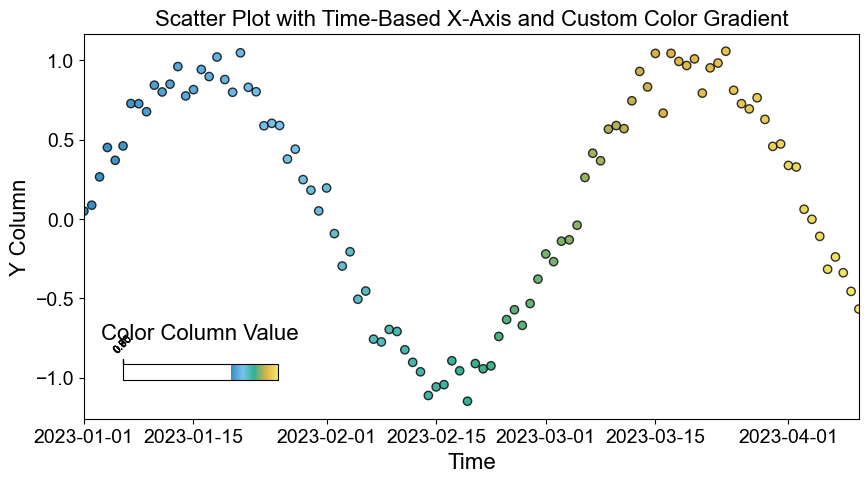

In [13]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# Sample DataFrame with a time index
np.random.seed(42)
time_index = pd.date_range(start="2023-01-01", periods=100, freq="D")
y_values = np.sin(np.linspace(0, 10, 100)) + np.random.normal(0, 0.1, 100)
color_values = np.linspace(70, 100, 100)  # Values in the range 70-100

df = pd.DataFrame({"Y_Column": y_values, "Color_Column": color_values}, index=time_index)

# Define Okabe-Ito-based gradient with refined dark yellow
okabe_ito_gradient = [
    "#0072B2",  # Dark Blue
    "#56B4E9",  # Light Blue
    "#009E73",  # Light Green
    "#D4A017",  # Dark Yellow (closer to golden-orange)
    "#F0E442"   # Bright Yellow
]

# Create a continuous colormap
custom_cmap = mcolors.LinearSegmentedColormap.from_list("okabe_ito_custom", okabe_ito_gradient, N=256)

# Normalize color values to crop the colorbar (0.70 - 1.00 range)
norm = mcolors.Normalize(vmin=70, vmax=100)

# Plot
fig, ax = plt.subplots(figsize=(10, 5))
sc = ax.scatter(df.index, df["Y_Column"], c=df["Color_Column"], cmap=custom_cmap, norm=norm, edgecolor='k', alpha=0.8)

# Add inset colorbar inside the plot (lower left)
cax = inset_axes(ax, width="20%", height="4%", loc="lower left", borderpad=2)
cbar = plt.colorbar(sc, cax=cax, orientation="horizontal")

# Set colorbar limits and ticks
cbar.set_ticks(np.linspace(0.75, 0.95, 5))  # Tick positions
cbar.set_label("Color Column Value", labelpad=-5)

# Format colorbar text (move to top, smaller font)
cbar.ax.xaxis.set_label_position("top")  # Move label above
cbar.ax.xaxis.set_ticks_position("top")  # Move ticks above
cbar.ax.tick_params(labelsize=8)  # Reduce font size

# Formatting
ax.set_xlabel("Time")
ax.set_ylabel("Y Column")
ax.set_title("Scatter Plot with Time-Based X-Axis and Custom Color Gradient")
plt.xticks(rotation=45)  # Rotate time labels for readability

plt.show()

# https://matplotlib.org/stable/gallery/ticks/colorbar_tick_labelling_demo.html#sphx-glr-gallery-ticks-colorbar-tick-labelling-demo-py
# to fix colorbar legend

In [11]:
seismic.head()

,Datetime,datetime(Matlab_format),dv/v(%),cc(Correlation_coefficient)
0,2016-01-01,736330,NaN,NaN
1,2016-01-02,736331,NaN,NaN
2,2016-01-03,736332,NaN,NaN
3,2016-01-04,736333,NaN,NaN
4,2016-01-05,736334,NaN,NaN


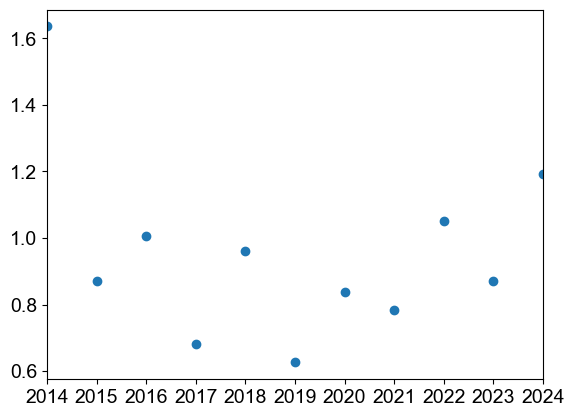

In [356]:
df = jtt_temp.copy()
df = df.resample('D').mean()

# Ensure the temperature column is correctly indexed
temperature_column = 'temperature'

# Extract year and month from the DateTime index
df['year'] = df.index.year
df['month'] = df.index.month

# Permafrost index
# Group by year and month
days_above_zero_monthly = df[df[temperature_column] > 0].groupby(['year', 'month']).size().reset_index(name='days_above_zero')
days_below_zero_monthly = df[df[temperature_column] < 0].groupby(['year', 'month']).size().reset_index(name='days_below_zero')

# Group by year only
days_above_zero_yearly = df[df[temperature_column] > 0].groupby(['year']).size().reset_index(name='days_above_zero')
days_below_zero_yearly = df[df[temperature_column] < 0].groupby(['year']).size().reset_index(name='days_below_zero')

use_monthly = False
# # Choose whether to use monthly or yearly data
# use_monthly = True  # Set to False to use yearly data

if use_monthly:
    # Merge the monthly DataFrames
    merged_df = pd.merge(days_above_zero_monthly, days_below_zero_monthly, on=['year', 'month'], how='outer').fillna(0)
    # Create a 'date' column from 'year' and 'month'
    merged_df['date'] = pd.to_datetime(merged_df[['year', 'month']].assign(day=1))
    # Set the 'date' column as the index
    merged_df.set_index('date', inplace=True)
    # Drop the now redundant 'year' and 'month' columns
    merged_df.drop(columns=['year', 'month'], inplace=True)
else:
    # Merge the yearly DataFrames
    merged_df = pd.merge(days_above_zero_yearly, days_below_zero_yearly, on=['year'], how='outer').fillna(0)
    # Create a 'date' column from 'year'
    merged_df['date'] = pd.to_datetime(merged_df['year'].astype(str) + '-01-01')
    # Set the 'date' column as the index
    merged_df.set_index('date', inplace=True)
    # Drop the now redundant 'year' column
    merged_df.drop(columns=['year'], inplace=True)

# Create the freeze index column
merged_df['freeze_index'] = merged_df['days_above_zero'] / (merged_df['days_below_zero'] + np.finfo(float).eps)
freeze_index = merged_df.copy()
plt.scatter(freeze_index.index, freeze_index.iloc[:,2])

In [354]:
days_above_zero_yearly

,year,days_above_zero
0,2014,139
1,2015,170
2,2016,183
3,2017,148
4,2018,179
5,2019,139
6,2020,167
7,2021,160
8,2022,187
9,2023,170


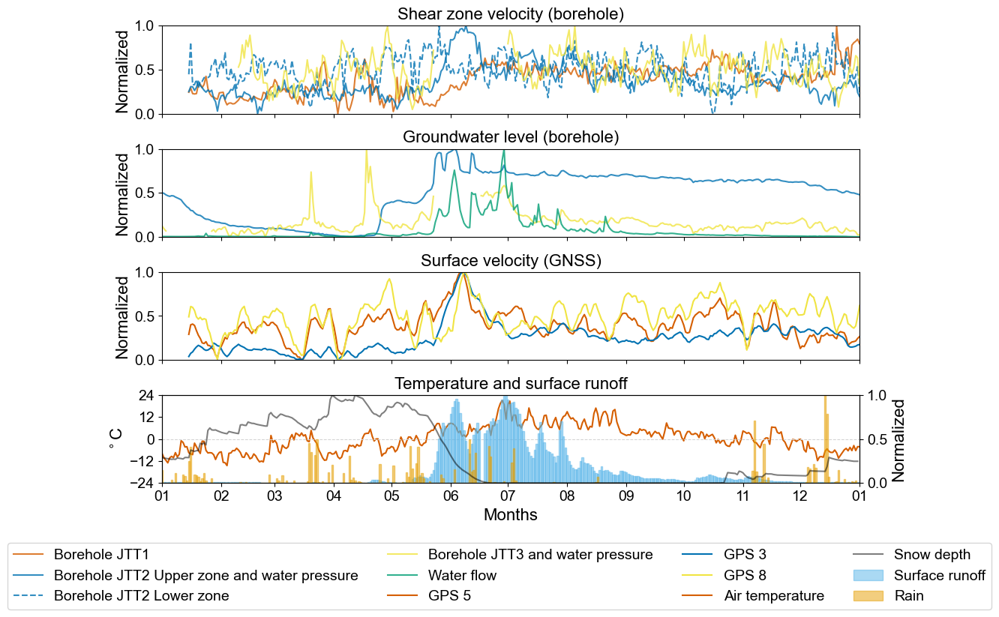

In [128]:
# Normalized version of Figure 2

########### Cleaning DMS and GPS ############
from scipy.signal import savgol_filter

# rolling mean filter window
window_mean = 7 # 7 is enough to keep temp stationary

# savgol parameters
window_size = 11
poly_order = 3

def clean_lowpassfilt(file, colnmbr=0, name='Water table [m bgl]:'): # colnmbr is the column chosen to lowpass filter, name is wanted name for filtered column
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    file['interpolated'] = file.iloc[:,colnmbr].interpolate(method='linear', limit_direction ='forward')
    # file['filt'] = butter_lowpass_filter(file.iloc[:,-1], cutoff, fs, order) # replace original by lowpass filtered
    file['filt'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    # file['filt'] = file['filt'].rolling(window=window_mean, center=True).mean() # rolling mean
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    file.rename(columns={'filt':name}, inplace=True) # I call it the same as original if it was dependent on name in scripts lower down
    return file
######################################

def diff_shift(df, nrow_shift):
    return df-df.shift(nrow_shift) # Takes nrow forwards in time minus 'current' row and gives difference

# plotting
ncols = 1
nrows = 4 # len(file['event'].unique()) // ncols + (len(file['event'].unique()) % ncols > 0)

fig, ax = plt.subplots(nrows, ncols,figsize=(12, 10), sharex=True)
fig.subplots_adjust(hspace = .4)

# manually picked start and end times for following data
file3 = JTT1Disp.copy()
start_time = pd.Timestamp('2022-01-01')
end_time = pd.Timestamp('2023-01-01')
interval = '1d' # down sampling
vel_interval = 14 # smoothing window

file = JTT1Disp.iloc[:,0]
file =  file[file.index.slice_indexer(start_time,end_time)]
# zero = file[file.first_valid_index()]
file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
file = file.resample(interval).median() # downsampling with median value
file = diff_shift(file, vel_interval) # velocity
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
file = file.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(file.index, normalized, color=colors[1], label='Borehole JTT1 ', alpha=0.8)

file = JTT2DispUpperZone.iloc[:,0]
file =  file[file.index.slice_indexer(start_time,end_time)]
# zero = file[file.first_valid_index()]
file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
file = file.resample(interval).median() # downsampling with median value
file = diff_shift(file, vel_interval) # velocity
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
file = file.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(file.index, normalized, color=colors[2], label='Borehole JTT2 Upper zone and water pressure', alpha=0.8)

file = JTT2DispLowerZone.iloc[:,0]
file =  file[file.index.slice_indexer(start_time,end_time)]
# zero = file[file.first_valid_index()]
file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
file = file.resample(interval).median() # downsampling with median value
file = diff_shift(file, vel_interval) # velocity
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
file = file.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(file.index, normalized, color=colors[2], linestyle='dashed', label='Borehole JTT2 Lower zone', alpha=0.8)

file = JTT3Disp.iloc[:,0]
file =  file[file.index.slice_indexer(start_time,end_time)]
# zero = file[file.first_valid_index()]
file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
file = file.resample(interval).median() # downsampling with median value
file = diff_shift(file, vel_interval) # velocity
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
file = file.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(file.index, normalized, color=colors[3], label='Borehole JTT3 and water pressure', alpha=0.8)

#loading KH0112 as it has a longer time series..

# file3 = JTT1Wp.copy()
# watermodule = 'Mod4_Water pressure [m]:'
# file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
# # file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
# file3 = file3[watermodule]
# # file3 = file3[file3.first_valid_index():]
# file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
# file = file3.values-np.nanmin(file3.values)
# normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
# ax[1].plot(file3.index, normalized, color=colors[4], label='Borehole JTT1 \nwater pressure', alpha=0.8)

file3 = JTT2WpUpperZone.copy()
watermodule = 'Mod4_Water pressure [m]:'
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
file3 = file3.resample(interval).median() # downsampling with median value
# file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
file3 = file3[watermodule]
# file3 = file3[file3.first_valid_index():]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
file = file3.values-np.nanmin(file3.values)
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[1].plot(file3.index, normalized, color=colors[2], label='', alpha=0.8)

file3 = JTT3Wp.copy()
watermodule = 'Mod4_Water pressure [m]:'
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
file3 = file3.resample(interval).median() # downsampling with median value
# file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
file3 = file3[watermodule]
# file3 = file3[file3.first_valid_index():]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
file = file3.values-np.nanmin(file3.values)
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[1].plot(file3.index, normalized, color=colors[3], label='', alpha=0.8)


file3 = river1.copy()
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
file3 = file3.resample(interval).median() # downsampling with median value
file3 = file3.iloc[:,0]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
file = file3.values-np.nanmin(file3.values)
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[1].plot(file3.index, normalized, color=colors[4], alpha=0.8, label='Water flow')

# GPS data

data = '2d'
df =  jett_gps5 # Jtt1 gps 5 or gps 4
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
df = df.resample(interval).median() # downsampling with median value
df = diff_shift(df, vel_interval) # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[2].plot(file.index, normalized, color=colors[1], label='GPS 5')

df =  jett_gps3 # same as Jtt2
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
df = df.resample(interval).median() # downsampling with median value
df = diff_shift(df, vel_interval) # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[2].plot(file.index, normalized, color=colors[2], label='GPS 3')

df =  jett_gps8 # same as Jtt3
df =  df[df.index.slice_indexer(start_time,end_time)]
df = df[data].dropna()
df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
df = df.resample(interval).median() # downsampling with median value
df = diff_shift(df, vel_interval) # velocity
df.index = pd.to_datetime(df.index)
file = df.copy()
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
ax[2].plot(file.index, normalized, color=colors[3], label='GPS 8')

width = 55/60*1 #n_day # 55 works well for 60 days
# temp_sub =  temp[(temp.index > start_time) & (temp.index < end_time)] # data per day
# temp_sub = temp[temp.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))] # actual air temp
temp_sub = jtt_temp[jtt_temp.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))] # xgeo air temp
temp_sub = temp_sub.resample(interval).median()

ax[3].plot(temp_sub.index, temp_sub['temperature'], color=colors[1], label='Air temperature')
ax[3].axhline(y=0.0, color='lightgray', linestyle='dashed', linewidth=.75)

# ST_sub = ST[ST.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
# ST_sub.iloc[:,0] = medfilt(ST_sub.iloc[:,0], kernel_size=n_day)
# ST_sub.iloc[:,1] = medfilt(ST_sub.iloc[:,1], kernel_size=n_day)

# snowrain_melt_sub =  snowrain_melt[(snowrain_melt.index > start_time) & (snowrain_melt.index < end_time)]
surfacerunoff_sub =  jtt_xgeo_surfacerunnoff[jtt_xgeo_surfacerunnoff.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
surfacerunoff_sub = surfacerunoff_sub.resample(interval).sum()
file = surfacerunoff_sub.iloc[:,0]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

ax_y = ax[3].twinx()
ax_y.bar(dates.date2num(surfacerunoff_sub.index), normalized, width = width, ec=colors[5], color=colors[5], label='Surface runoff', alpha=0.5)

xgeo_snow_sub =  jtt_xgeo_snow[jtt_xgeo_snow.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
xgeo_snow_sub = xgeo_snow_sub.resample(interval).sum()
file = xgeo_snow_sub.iloc[:,0]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

ax_y.plot(xgeo_snow_sub.index, normalized, color=colors[7], label='Snow depth', alpha=0.5)

xgeo_rain_sub =  jtt_precip[jtt_precip.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
xgeo_rain_sub = xgeo_rain_sub.resample(interval).sum()
file = xgeo_rain_sub.iloc[:,0]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

ax_y.bar(dates.date2num(xgeo_rain_sub.index), normalized, width = width, ec=colors[6], color=colors[6], label='Rain', alpha=0.5)

# ax[3].plot(ST_sub.index,ST_sub['ST2'], color=color_bacscarpairtemp, label='BS air temperature')
# ax[3].plot(ST_sub.index,ST_sub['ST3'], color=color_bacscarprocktemp, label='BS rock temperature')

# adjusting gridlines
nticks = 3
ax[0].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[1].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[2].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[3].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(5))
# ax[3].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax_y.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))

ax[0].yaxis.set_major_formatter(FormatStrFormatter('%.1f')) # number of digits
ax[1].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
ax[2].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

# just to get an whole number so it looks nice
def myround(x, base=10):
    return base * round(x/base)

ymin, ymax = ax[0].get_ylim()
ax[0].set_ylim(0, 1) # bh 

ymin, ymax = ax[1].get_ylim()
ax[1].set_ylim(0, 1) # water level

ymin, ymax = ax[2].get_ylim()
ax[2].set_ylim(0, 1) # gnss 

# ymin, ymax = ax[3].get_ylim()
# ax[3].set_ylim(0, myround(ymax, base=500)) # seismic events

ymin, ymax = ax[3].get_ylim()
ax[3].set_ylim(myround(-ymax, base=6), myround(ymax, base=6)) # temp -12 bas 6 for two months, 16 and base 8 for 1 month

# ymin, ymax = ax_y.get_ylim()
# ax_y.set_ylim(0, 200) # available surface water, 1800 for two months, 1000 for 1 month

ymin, ymax = ax_y.get_ylim()
ax_y.set_ylim(0, 1) # normalized 

ax[0].title.set_text('Shear zone velocity (borehole)')
# ax[0].title.set_text('Shear zone displacement (borehole)')
ax[1].title.set_text('Groundwater level (borehole)')
ax[2].title.set_text('Surface velocity (GNSS)')
# ax[2].title.set_text('Surface displacement (GNSS)')
# ax[3].title.set_text('Seismic events (surface geophones)')
ax[3].title.set_text('Temperature and surface runoff')

# one legend on the right side of plots
# for i in range(5):
#     box = ax[i].get_position()
#     ax[i].set_position([box.x0, box.y0, box.width * 0.8, box.height]) # shrinking axes to accomodate legend
# handles, labels = [(a + b + c + d + e + f) for a, b, c, d, e, f in zip(ax[0].get_legend_handles_labels(), ax[1].get_legend_handles_labels(), ax[2].get_legend_handles_labels(),ax[3].get_legend_handles_labels(),ax[4].get_legend_handles_labels(),ax_y.get_legend_handles_labels())]
# fig.legend(handles, labels, loc = (0.8, 0.275)) # center of fig

#legend underneath plots
handles, labels = [(a + b + c + d + e) for a, b, c, d, e in zip(ax[0].get_legend_handles_labels(), ax[1].get_legend_handles_labels(), ax[2].get_legend_handles_labels(),ax[3].get_legend_handles_labels(),ax_y.get_legend_handles_labels())]
fig.subplots_adjust(bottom=0.27) # create space
fig.legend(handles, labels, loc = 'upper center', bbox_to_anchor=(0.5, 0.2), ncol=4) # center of fig

# set axis labels
ax[0].set_ylabel('Normalized')
ax[1].set_ylabel('Normalized')
ax[2].set_ylabel('Normalized')
# ax[3].set_ylabel('Events') #  per 2 months
ax[3].set_ylabel('$^\circ$C')
# ax_y.set_ylabel('mm') #  per day 
ax_y.set_ylabel('Normalized') #  


# years = mdates.YearLocator(1)   # set number for every other year
# years_fmt = mdates.DateFormatter('%Y') # only display year, not day and month
# ax[3].set_xlabel('Years')

years = mdates.MonthLocator()   # set number for every other year
years_fmt = mdates.DateFormatter('%m') # only display year, not day and month
ax[3].set_xlabel('Months')

ax[3].xaxis.set_major_locator(years)
ax[3].xaxis.set_major_formatter(years_fmt)

# removing tick labels from the xaxis
n = 1  # keeps every n row
[l.set_visible(False) for (i,l) in enumerate(ax[3].xaxis.get_ticklabels()) if i % n != 0]

# removing space on sides
ax[1].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))

# # # saving
path = 'plots\\'
save_name = f'{path}Figure2_normalized_zoom_Jettan.png'
# save_name = f'{path}Figure2_A0poster.png'
fig.savefig(save_name, dpi=600) # , transparent=True,  bbox_inches='tight'

C:\Users\andregas\AppData\Local\Temp\ipykernel_15688\3966089378.py:229: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


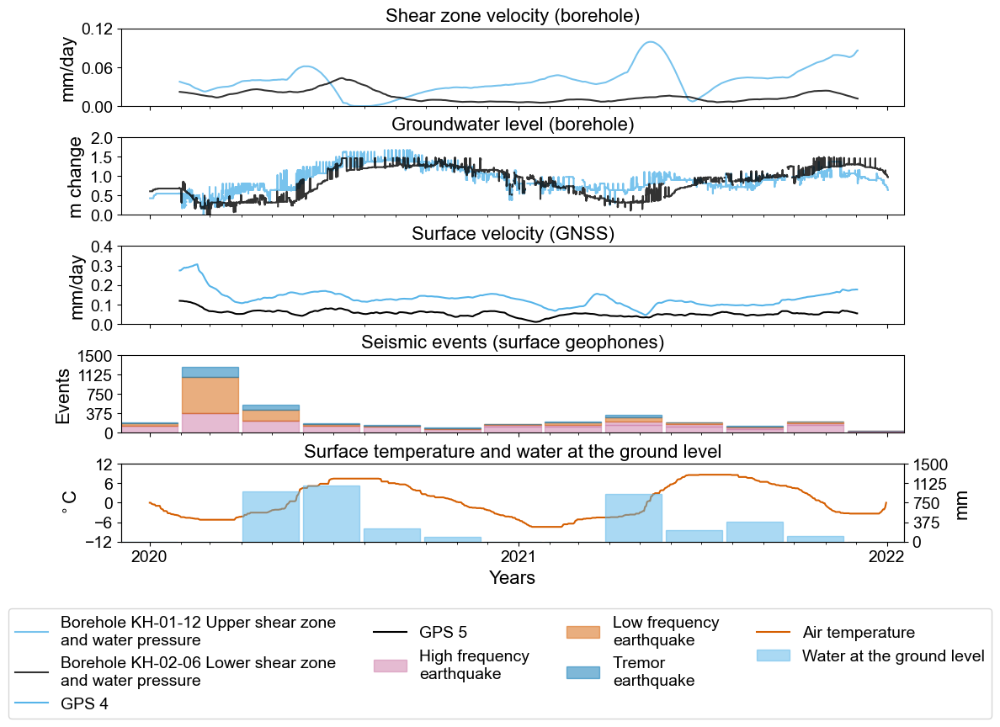

In [117]:
## ZOOMED FIGURE 4 for the SI

from matplotlib.dates import DateFormatter

def round_up_to_odd(f):
    return int(np.ceil(f) // 2 * 2 + 1)

# plotting

ncols = 1
nrows = 5 # len(file['event'].unique()) // ncols + (len(file['event'].unique()) % ncols > 0)

fig, ax = plt.subplots(nrows, ncols,figsize=(12, 10), sharex=True)
fig.subplots_adjust(hspace = .4)


# time series length
start_time = '2020-01-01'
end_time = '2022-01-01'


file = vel1.iloc[:,-1]
file = file.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(file.index, file.values, color=colors[5], label='Borehole KH-01-12 Upper shear zone \nand water pressure', alpha=0.8)

file = vel2.iloc[:,-1]
file = file.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(file.index, file.values, color=colors[7], label='Borehole KH-02-06 Lower shear zone \nand water pressure', alpha=0.8)

# water level
n_day = 59 # days # 1 week kernel size for median filter (hourly data)
n_hour = round_up_to_odd(24*n_day) 


file3 = KH0112PiezLowerZone.copy()
watermodule = 'Mod30_Water pressure [m]:'
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
file3 = file3[watermodule]
# file3 = file3[file3.first_valid_index():]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
file3 = file3.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(file3.index, file3.values-np.nanmin(file3.values), color=colors[5], label='', alpha=0.8) # Borehole KH-01-12 \nwater pressure


#loading KH0206 as it has a longer time series..
file3=KH0206PiezLowerZone.copy()
watermodule = 'Mod35_Water pressure [m]:'
file3 = file3.resample('1h').median()
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
file3 = file3[watermodule]
# file3 = file3[file3.first_valid_index():]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
file3 = file3.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(file3.index, file3.values-np.nanmin(file3.values), color=colors[7], label='', alpha=0.8) # Borehole KH-02-06 \nwater pressure

# #loading KH0118 as it is longer than KH0218
# file3=KH0118Piez_raw
# # watermodule = 'Mod82_Water pressure [m]:' # unconfined aquifer
# watermodule = 'Mod26_Water pressure [m]:' # seasonal oscilations
# start_t = '2020-01-01' # start time
# file3 =  file3[file3.index.slice_indexer(start_t,end_time)]
# file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n) # median filter
# ax[0].plot(file3.index, file3[watermodule].values-np.min(file3[watermodule]), color='forestgreen', label='KH0118', alpha=0.8)

# #loading KH0217 as it is longer than KH0218
# file3=KH0217PiezUpperZone_raw
# # watermodule = 'Mod52_Water pressure [m]:' # unconfined aquifer
# watermodule = 'Mod29_Water pressure [m]:' # seasonal oscilations
# # start_t = '2020-01-01' # start time
# file3 =  file3[file3.index.slice_indexer(start_t,end_time)]
# file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n) # median filter
# ax[0].plot(file3.index, file3[watermodule].values-np.min(file3[watermodule]), color='violet', label='KH0217', alpha=0.8)

# GPS data

col_pos = -1 # column position 

df =  vel3
df.index = pd.to_datetime(df.index)
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[2].plot(df.index, (df.iloc[:,col_pos]), color=colors[5], label='GPS 4')

df =  vel4
df.index = pd.to_datetime(df.index)
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[2].plot(df.index, (df.iloc[:,col_pos]), color=colors[7], label='GPS 5')

# df =  vel5
# df.index = pd.to_datetime(df.index)
# df = df.replace(np.nan,np.inf) # changing nan to inf
# ax[2].plot(df.index, (df.iloc[:,col_pos]), color=colors[2], label='GPS 6')

# df =  gps10
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df.replace(np.nan,np.inf) # changing nan to inf
# ax[1].plot(df.index, (df[data]), color='yellow', label='GPS 10')

# df =  gps11
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df.replace(np.nan,np.inf) # changing nan to inf
# ax[1].plot(df.index, (df[data]), color='brown', label='GPS 11')

# seismic data
# seismicity_sub =  seismicity_qcd[(seismicity_qcd.index > start_time) & (seismicity_qcd.index < end_time)]
seismicity_sub =  seismicity[(seismicity.index > start_time) & (seismicity.index < end_time)]
seismicity_sub = seismicity_sub.resample(f'{n}d').sum()

# stacking types
bar1 = seismicity_sub['Slope_HF_nEvents']
bar2 = seismicity_sub['Slope_Multi_nEvents']
bar3 = seismicity_sub['Slope_LF_nEvents']
bar4 = seismicity_sub['Slope_Tremor_nEvents']

width = 55/59*n

ax[3].bar(dates.date2num(seismicity_sub.index), seismicity_sub['Slope_HF_nEvents'], width = width, color=colors[0], ec=colors[0], label='High frequency \nearthquake', alpha=0.5)
ax[3].bar(dates.date2num(seismicity_sub.index), seismicity_sub['Slope_Multi_nEvents'], width = width, color=colors[0], ec=colors[0], bottom=bar1, label='', alpha=0.5)
ax[3].bar(dates.date2num(seismicity_sub.index), seismicity_sub['Slope_LF_nEvents'], width = width, color=colors[1], ec=colors[1], bottom=bar1+bar2, label='Low frequency \nearthquake', alpha=0.5)
ax[3].bar(dates.date2num(seismicity_sub.index), seismicity_sub['Slope_Tremor_nEvents'], width = width, color=colors[2], ec=colors[2], bottom=bar1+bar2+bar3, label='Tremor \nearthquake', alpha=0.5)

width = 55/59*n
# temp_sub =  temp[(temp.index > start_time) & (temp.index < end_time)] # data per day
temp_sub = temp[temp.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
temp_sub.iloc[:,0] = medfilt(temp_sub.iloc[:,0], kernel_size=n_day)

# snowrain_melt_sub =  snowrain_melt[(snowrain_melt.index > start_time) & (snowrain_melt.index < end_time)]
snowrain_melt_sub =  snowrain_melt[snowrain_melt.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
snowrain_melt_sub = snowrain_melt_sub.resample(f'{n}d').sum()

ax[4].plot(temp_sub.index, temp_sub['temperature'], color=colors[1], label='Air temperature')
ax_y = ax[4].twinx()
ax_y.bar(dates.date2num(snowrain_melt_sub.index), snowrain_melt_sub['snowrain_melt'], width = width, ec=colors[5], color=colors[5], label='Water at the ground level', alpha=0.5)

# adjusting gridlines
nticks = 5
ax[0].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(3))
ax[1].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(5))
ax[2].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(5))
ax[3].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(5))
ax[4].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(5))
ax_y.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(5))

ax[0].yaxis.set_major_formatter(FormatStrFormatter('%.2f')) # number of digits
ax[1].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

# just to get an whole number so it looks nice
def myround(x, base=10):
    return base * round(x/base)

ymin, ymax = ax[0].get_ylim()
ax[0].set_ylim(0, 0.12) # velocity

ymin, ymax = ax[1].get_ylim()
ax[1].set_ylim(0, myround(ymax, base=1)) # water level

ymin, ymax = ax[2].get_ylim()
ax[2].set_ylim(0, 0.4) # velocity

ymin, ymax = ax[3].get_ylim()
ax[3].set_ylim(0, 1500) # seismic events

ymin, ymax = ax[4].get_ylim()
ax[4].set_ylim(-12, myround(ymax, base=6)) # temp -12 bas 6 for two months, 16 and base 8 for 1 month

ymin, ymax = ax_y.get_ylim()
ax_y.set_ylim(0, 1500) # available surface water, 1800 for two months, 1000 for 1 month

ax[0].title.set_text('Shear zone velocity (borehole)')
ax[1].title.set_text('Groundwater level (borehole)')
ax[2].title.set_text('Surface velocity (GNSS)')
ax[3].title.set_text('Seismic events (surface geophones)')
ax[4].title.set_text('Surface temperature and water at the ground level')

# one legend on the right side of plots
# for i in range(5):
#     box = ax[i].get_position()
#     ax[i].set_position([box.x0, box.y0, box.width * 0.8, box.height]) # shrinking axes to accomodate legend
# handles, labels = [(a + b + c + d + e + f) for a, b, c, d, e, f in zip(ax[0].get_legend_handles_labels(), ax[1].get_legend_handles_labels(), ax[2].get_legend_handles_labels(),ax[3].get_legend_handles_labels(),ax[4].get_legend_handles_labels(),ax_y.get_legend_handles_labels())]
# fig.legend(handles, labels, loc = (0.8, 0.275)) # center of fig

#legend underneath plots
handles, labels = [(a + c + d + e + f) for a, c, d, e, f in zip(ax[0].get_legend_handles_labels(), ax[2].get_legend_handles_labels(),ax[3].get_legend_handles_labels(),ax[4].get_legend_handles_labels(),ax_y.get_legend_handles_labels())]
fig.subplots_adjust(bottom=0.27) # create space
fig.legend(handles, labels, loc = 'upper center', bbox_to_anchor=(0.5, 0.2), ncol=4) # center of fig

# set axis labels
ax[0].set_ylabel('mm/day')
ax[1].set_ylabel('m change')
ax[2].set_ylabel('mm/day')
ax[3].set_ylabel('Events') #  per 2 months
ax[4].set_ylabel('$^\circ$C')
ax_y.set_ylabel('mm') #  per 2 months
ax[4].set_xlabel('Years')

# # Ensure the first year is included
# start_year = bh_data.index.min().year
# end_year = bh_data.index.max()
# ax[4].set_xlim(mdates.date2num([f'{start_year}-01-01', f'{end_year}']))

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax[4].xaxis.set_major_locator(years)
ax[4].xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax[4].xaxis.set_minor_locator(months)
# Apply the year format for the major ticks again
ax[4].xaxis.set_major_formatter(years_fmt)

# # Rotate and align the tick labels so they look better
# fig.autofmt_xdate()

# # removing tick labels from the xaxis
# n = 2  # keeps every n row
# [l.set_visible(False) for (i,l) in enumerate(ax[4].xaxis.get_ticklabels()) if i % n != 0]

# # # saving
path = 'plots\\'
save_name = f'{path}Figure2_ZoomforSI.png'
# save_name = f'{path}Figure2_A0poster.png'
fig.savefig(save_name, dpi=600) # , transparent=True,  bbox_inches='tight'
fig.show()

In [3]:
KH0112DispUpperZone.head()

,Displacement [mm]:,displacement_butterfilt,12_days_velocity,intercept,r^2,y_fit,residuals,error_of_fit,60_days_velocity,sta,lta,sta-lta,trigger,detrigger,nBursts
Date:,,,,,,,,,,,,,,,
2013-11-07 10:00:00,0.00,0.004726,NaN,NaN,NaN,NaN,NaN,11.892733,NaN,NaN,NaN,NaN,0.001676,0.000822,0
2013-11-07 11:00:00,0.00,0.018272,NaN,NaN,NaN,NaN,NaN,11.892733,NaN,NaN,NaN,NaN,0.001676,0.000822,0
2013-11-07 12:00:00,0.04,0.031330,NaN,NaN,NaN,NaN,NaN,11.892733,NaN,NaN,NaN,NaN,0.001676,0.000822,0
2013-11-07 13:00:00,0.00,0.043733,NaN,NaN,NaN,NaN,NaN,11.892733,NaN,NaN,NaN,NaN,0.001676,0.000822,0
2013-11-07 14:00:00,0.00,0.055236,NaN,NaN,NaN,NaN,NaN,11.892733,NaN,NaN,NaN,NaN,0.001676,0.000822,0


C:\Users\andregas\AppData\Local\Temp\ipykernel_20612\721758913.py:239: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


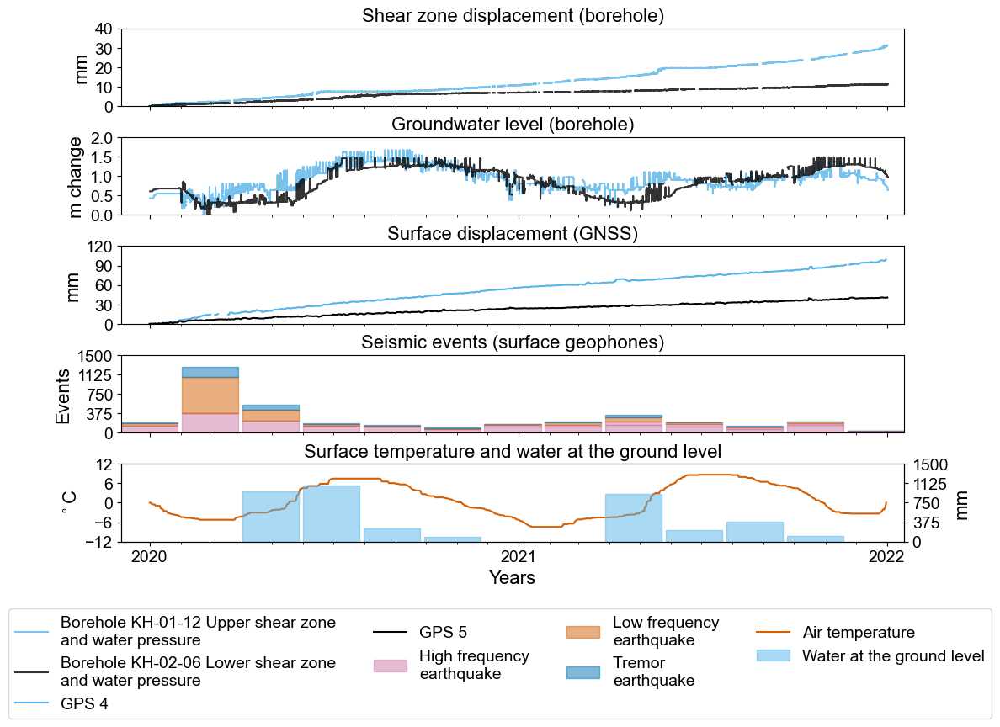

In [30]:
## ZOOMED FIGURE 4 for the SI

from matplotlib.dates import DateFormatter

def round_up_to_odd(f):
    return int(np.ceil(f) // 2 * 2 + 1)

n = 60

# plotting

ncols = 1
nrows = 5 # len(file['event'].unique()) // ncols + (len(file['event'].unique()) % ncols > 0)

fig, ax = plt.subplots(nrows, ncols,figsize=(12, 10), sharex=True)
fig.subplots_adjust(hspace = .4)


# time series length
start_time = '2020-01-01'
end_time = '2022-01-01'


file =  KH0112DispUpperZone[KH0112DispUpperZone.index.slice_indexer(start_time,end_time)]

file = file.iloc[:,0]
file = file.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(file.index, file.values-file.values[0], color=colors[5], label='Borehole KH-01-12 Upper shear zone \nand water pressure', alpha=0.8)


file =  KH0206DispLowerZone[KH0206DispLowerZone.index.slice_indexer(start_time,end_time)]
file = file.iloc[:,0]
file = file.replace(np.nan,np.inf) # changing nan to inf
ax[0].plot(file.index, file.values-file.values[0], color=colors[7], label='Borehole KH-02-06 Lower shear zone \nand water pressure', alpha=0.8)

# water level
n_day = 59 # days # 1 week kernel size for median filter (hourly data)
n_hour = round_up_to_odd(24*n_day) 


file3 = KH0112PiezLowerZone.copy()
watermodule = 'Mod30_Water pressure [m]:'
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
file3 = file3[watermodule]
# file3 = file3[file3.first_valid_index():]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
file3 = file3.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(file3.index, file3.values-np.nanmin(file3.values), color=colors[5], label='', alpha=0.8) # Borehole KH-01-12 \nwater pressure


#loading KH0206 as it has a longer time series..
file3=KH0206PiezLowerZone.copy()
watermodule = 'Mod35_Water pressure [m]:'
file3 = file3.resample('1h').median()
file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
file3 = file3[watermodule]
# file3 = file3[file3.first_valid_index():]
file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
file3 = file3.replace(np.nan,np.inf) # changing nan to inf
ax[1].plot(file3.index, file3.values-np.nanmin(file3.values), color=colors[7], label='', alpha=0.8) # Borehole KH-02-06 \nwater pressure

# #loading KH0118 as it is longer than KH0218
# file3=KH0118Piez_raw
# # watermodule = 'Mod82_Water pressure [m]:' # unconfined aquifer
# watermodule = 'Mod26_Water pressure [m]:' # seasonal oscilations
# start_t = '2020-01-01' # start time
# file3 =  file3[file3.index.slice_indexer(start_t,end_time)]
# file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n) # median filter
# ax[0].plot(file3.index, file3[watermodule].values-np.min(file3[watermodule]), color='forestgreen', label='KH0118', alpha=0.8)

# #loading KH0217 as it is longer than KH0218
# file3=KH0217PiezUpperZone_raw
# # watermodule = 'Mod52_Water pressure [m]:' # unconfined aquifer
# watermodule = 'Mod29_Water pressure [m]:' # seasonal oscilations
# # start_t = '2020-01-01' # start time
# file3 =  file3[file3.index.slice_indexer(start_t,end_time)]
# file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n) # median filter
# ax[0].plot(file3.index, file3[watermodule].values-np.min(file3[watermodule]), color='violet', label='KH0217', alpha=0.8)

# GPS data


col_pos = 5 # column position, 2d 

df = gps4[gps4.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
zero = df.dropna()
zero = zero.loc[zero.first_valid_index(),'2d'] # NB!! anoying but important to change if not col 5 !!
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[2].plot(df.index, (df.iloc[:,col_pos]-zero), color=colors[5], label='GPS 4')

df = gps5[gps5.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df.replace(np.nan,np.inf) # changing nan to inf
ax[2].plot(df.index, (df.iloc[:,col_pos]-df.iloc[0,col_pos]), color=colors[7], label='GPS 5')

# df =  vel5
# df.index = pd.to_datetime(df.index)
# df = df.replace(np.nan,np.inf) # changing nan to inf
# ax[2].plot(df.index, (df.iloc[:,col_pos]), color=colors[2], label='GPS 6')

# df =  gps10
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df.replace(np.nan,np.inf) # changing nan to inf
# ax[1].plot(df.index, (df[data]), color='yellow', label='GPS 10')

# df =  gps11
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df.replace(np.nan,np.inf) # changing nan to inf
# ax[1].plot(df.index, (df[data]), color='brown', label='GPS 11')

# seismic data
# seismicity_sub =  seismicity_qcd[(seismicity_qcd.index > start_time) & (seismicity_qcd.index < end_time)]
seismicity_sub =  seismicity[(seismicity.index > start_time) & (seismicity.index < end_time)]
seismicity_sub = seismicity_sub.resample(f'{n}d').sum()

# stacking types
bar1 = seismicity_sub['Slope_HF_nEvents']
bar2 = seismicity_sub['Slope_Multi_nEvents']
bar3 = seismicity_sub['Slope_LF_nEvents']
bar4 = seismicity_sub['Slope_Tremor_nEvents']

width = 55/59*n

ax[3].bar(dates.date2num(seismicity_sub.index), seismicity_sub['Slope_HF_nEvents'], width = width, color=colors[0], ec=colors[0], label='High frequency \nearthquake', alpha=0.5)
ax[3].bar(dates.date2num(seismicity_sub.index), seismicity_sub['Slope_Multi_nEvents'], width = width, color=colors[0], ec=colors[0], bottom=bar1, label='', alpha=0.5)
ax[3].bar(dates.date2num(seismicity_sub.index), seismicity_sub['Slope_LF_nEvents'], width = width, color=colors[1], ec=colors[1], bottom=bar1+bar2, label='Low frequency \nearthquake', alpha=0.5)
ax[3].bar(dates.date2num(seismicity_sub.index), seismicity_sub['Slope_Tremor_nEvents'], width = width, color=colors[2], ec=colors[2], bottom=bar1+bar2+bar3, label='Tremor \nearthquake', alpha=0.5)

width = 55/59*n
# temp_sub =  temp[(temp.index > start_time) & (temp.index < end_time)] # data per day
temp_sub = temp[temp.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
temp_sub.iloc[:,0] = medfilt(temp_sub.iloc[:,0], kernel_size=n_day)

# snowrain_melt_sub =  snowrain_melt[(snowrain_melt.index > start_time) & (snowrain_melt.index < end_time)]
snowrain_melt_sub =  snowrain_melt[snowrain_melt.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
snowrain_melt_sub = snowrain_melt_sub.resample(f'{n}d').sum()

ax[4].plot(temp_sub.index, temp_sub['temperature'], color=colors[1], label='Air temperature')
ax_y = ax[4].twinx()
ax_y.bar(dates.date2num(snowrain_melt_sub.index), snowrain_melt_sub['snowrain_melt'], width = width, ec=colors[5], color=colors[5], label='Water at the ground level', alpha=0.5)

# adjusting gridlines
nticks = 5
ax[0].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(5))
ax[1].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(5))
ax[2].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(5))
ax[3].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(5))
ax[4].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(5))
ax_y.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(5))

ax[0].yaxis.set_major_formatter(FormatStrFormatter('%.0f')) # number of digits
ax[1].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
ax[2].yaxis.set_major_formatter(FormatStrFormatter('%.0f'))

# just to get an whole number so it looks nice
def myround(x, base=10):
    return base * round(x/base)

ymin, ymax = ax[0].get_ylim()
ax[0].set_ylim(0, 40) # velocity

ymin, ymax = ax[1].get_ylim()
ax[1].set_ylim(0, myround(ymax, base=1)) # water level

ymin, ymax = ax[2].get_ylim()
ax[2].set_ylim(0, 120) # velocity

ymin, ymax = ax[3].get_ylim()
ax[3].set_ylim(0, 1500) # seismic events

ymin, ymax = ax[4].get_ylim()
ax[4].set_ylim(-12, myround(ymax, base=6)) # temp -12 bas 6 for two months, 16 and base 8 for 1 month

ymin, ymax = ax_y.get_ylim()
ax_y.set_ylim(0, 1500) # available surface water, 1800 for two months, 1000 for 1 month

ax[0].title.set_text('Shear zone displacement (borehole)')
ax[1].title.set_text('Groundwater level (borehole)')
ax[2].title.set_text('Surface displacement (GNSS)')
ax[3].title.set_text('Seismic events (surface geophones)')
ax[4].title.set_text('Surface temperature and water at the ground level')

# one legend on the right side of plots
# for i in range(5):
#     box = ax[i].get_position()
#     ax[i].set_position([box.x0, box.y0, box.width * 0.8, box.height]) # shrinking axes to accomodate legend
# handles, labels = [(a + b + c + d + e + f) for a, b, c, d, e, f in zip(ax[0].get_legend_handles_labels(), ax[1].get_legend_handles_labels(), ax[2].get_legend_handles_labels(),ax[3].get_legend_handles_labels(),ax[4].get_legend_handles_labels(),ax_y.get_legend_handles_labels())]
# fig.legend(handles, labels, loc = (0.8, 0.275)) # center of fig

#legend underneath plots
handles, labels = [(a + c + d + e + f) for a, c, d, e, f in zip(ax[0].get_legend_handles_labels(), ax[2].get_legend_handles_labels(),ax[3].get_legend_handles_labels(),ax[4].get_legend_handles_labels(),ax_y.get_legend_handles_labels())]
fig.subplots_adjust(bottom=0.27) # create space
fig.legend(handles, labels, loc = 'upper center', bbox_to_anchor=(0.5, 0.2), ncol=4) # center of fig

# set axis labels
ax[0].set_ylabel('mm')
ax[1].set_ylabel('m change')
ax[2].set_ylabel('mm')
ax[3].set_ylabel('Events') #  per 2 months
ax[4].set_ylabel('$^\circ$C')
ax_y.set_ylabel('mm') #  per 2 months
ax[4].set_xlabel('Years')

# # Ensure the first year is included
# start_year = bh_data.index.min().year
# end_year = bh_data.index.max()
# ax[4].set_xlim(mdates.date2num([f'{start_year}-01-01', f'{end_year}']))

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax[4].xaxis.set_major_locator(years)
ax[4].xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax[4].xaxis.set_minor_locator(months)
# Apply the year format for the major ticks again
ax[4].xaxis.set_major_formatter(years_fmt)

# # Rotate and align the tick labels so they look better
# fig.autofmt_xdate()

# # removing tick labels from the xaxis
# n = 2  # keeps every n row
# [l.set_visible(False) for (i,l) in enumerate(ax[4].xaxis.get_ticklabels()) if i % n != 0]

# # # saving
path = 'plots\\'
save_name = f'{path}Figure2_ZoomforSI_disp.png'
# save_name = f'{path}Figure2_A0poster.png'
fig.savefig(save_name, dpi=600) # , transparent=True,  bbox_inches='tight'
fig.show()

C:\Users\andregas\AppData\Local\Temp\ipykernel_15688\238474830.py:122: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


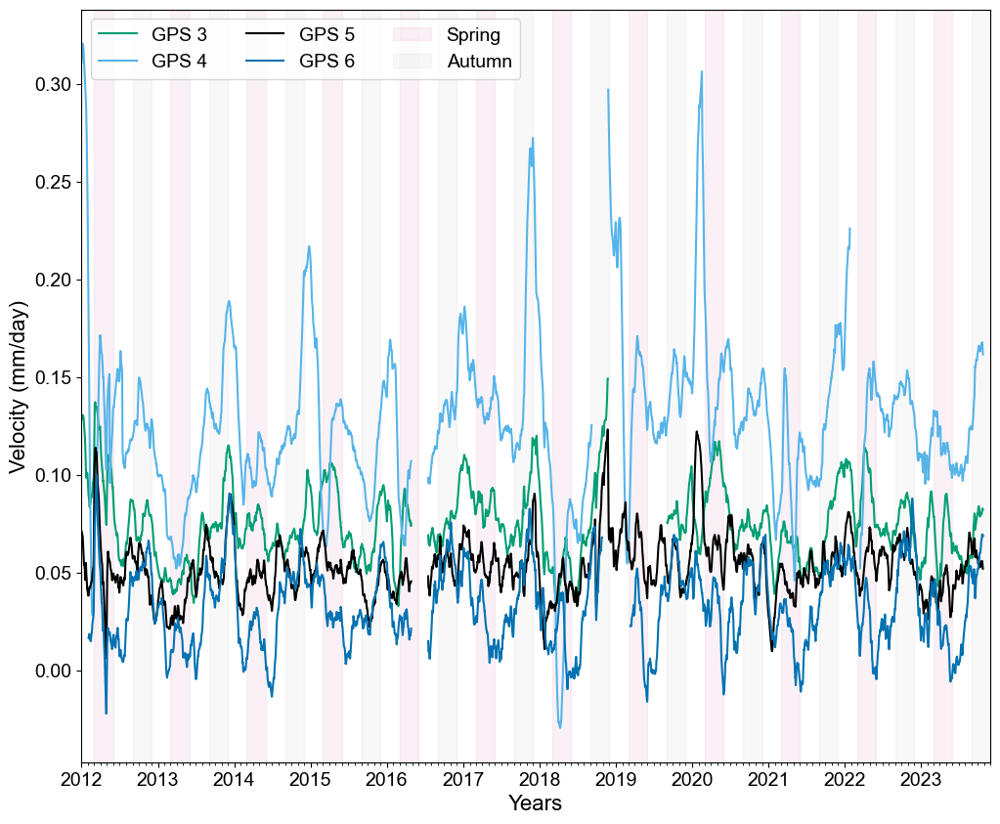

In [57]:
## Additional SI figure to convince the two peaks GNSS's

fig, ax = plt.subplots(figsize=(12, 10))

# setting time slice
start_time = pd.Timestamp('2012-01-01') # year-day-month ?
end_time = pd.Timestamp('2024-01-01') # last time when updating boreholes

# KH-02-06 same as gps5
# KH-01-12 same as gps4
# KH-02-17 same as gps4
# KH-01-18 same as gps10
# KH-02-18 same as gps11
# KH-01-17 same as gps6

data = '2d_60_days_velocity'
# data = '2d'

df =  gps3
df = df[data]
df =  df[df.index.slice_indexer(start_time,end_time)]
start_Local = df.first_valid_index()
df =  df[df.index.slice_indexer(start_Local,end_time)]
df.index = pd.to_datetime(df.index)

df = df.replace(np.nan,np.inf) # changing nan to inf
ax.plot(df.index, (df), color=colors[4], label='GPS 3')
# print(f'gps3: {df[-1]-df[0]} mm')

df =  gps4
df = df[data]
df =  df[df.index.slice_indexer(start_time,end_time)]
start_Local = df.first_valid_index()
df =  df[df.index.slice_indexer(start_Local,end_time)]
df.index = pd.to_datetime(df.index)

df = df.replace(np.nan,np.inf) # changing nan to inf
ax.plot(df.index, (df), color=colors[5], label='GPS 4')
# print(f'gps4: {df[-1]-df[0]} mm')

df =  gps5
df = df[data]
df =  df[df.index.slice_indexer(start_time,end_time)]
start_Local = df.first_valid_index()
df =  df[df.index.slice_indexer(start_Local,end_time)]
df.index = pd.to_datetime(df.index)

df = df.replace(np.nan,np.inf) # changing nan to inf
ax.plot(df.index, (df), color=colors[7], label='GPS 5')
# print(f'gps5: {df[-1]-df[0]} mm')

df =  gps6
df = df[data]
df =  df[df.index.slice_indexer(start_time,end_time)]
start_Local = df.first_valid_index()
df =  df[df.index.slice_indexer(start_Local,end_time)]
df.index = pd.to_datetime(df.index)

df = df.replace(np.nan,np.inf) # changing nan to inf
ax.plot(df.index, (df), color=colors[2], label='GPS 6')
# print(f'gps6: {df[-1]-df[0]} mm')

# df =  gps10
# df = df[data]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# start_Local = df.first_valid_index()
# df =  df[df.index.slice_indexer(start_Local,end_time)]
# df.index = pd.to_datetime(df.index)

# df = df.replace(np.nan,np.inf) # changing nan to inf
# ax.plot(df.index, (df-df[0]), color='darkorange', label='GPS 10')
# print(f'gps10: {df[-1]-df[0]} mm')

# df =  gps11
# df = df[data]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# start_Local = df.first_valid_index()
# df =  df[df.index.slice_indexer(start_Local,end_time)]
# df.index = pd.to_datetime(df.index)

# df = df.replace(np.nan,np.inf) # changing nan to inf
# ax.plot(df.index, (df-df[0]), color='violet', label='GPS 11')
# print(f'gps11: {df[-1]-df[0]} mm')

ax.legend(loc = 'upper right', ncol=2)

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax.xaxis.set_minor_locator(months)
# Apply the year format for the major ticks again
ax.xaxis.set_major_formatter(years_fmt)

# highlight spring and autumn
num_years = int((end_time-start_time)/np.timedelta64(1,'Y')) # n years in time series
start_year = start_time.year
for i in range(num_years): 
    ax.axvspan(pd.Timestamp(f'{start_year+i}-03-01'), pd.Timestamp(f'{start_year+i}-06-01'), facecolor=colors[0], edgecolor=colors[0], label='Spring', zorder=1, alpha=0.1)
    ax.axvspan(pd.Timestamp(f'{start_year+i}-09-01'), pd.Timestamp(f'{start_year+i}-12-01'), facecolor=colors[8], edgecolor=colors[8], label='Autumn', zorder=1, alpha=0.1)

    
plt.xlabel('Years')
plt.ylabel('Velocity (mm/day)')

# legend
lines, labels = ax.get_legend_handles_labels()
lines = unique(lines)
labels = unique(labels)
ax.legend(lines, labels, loc = 'upper left', ncol=3)

# # # saving
path = 'plots\\'
save_name = f'{path}SI_seasonalGPS.png'
# save_name = f'{path}Figure2_A0poster.png'
fig.savefig(save_name, dpi=600) # , transparent=True,  bbox_inches='tight'
fig.show()

# Figure 5

In [ ]:
# New figure for acceleration

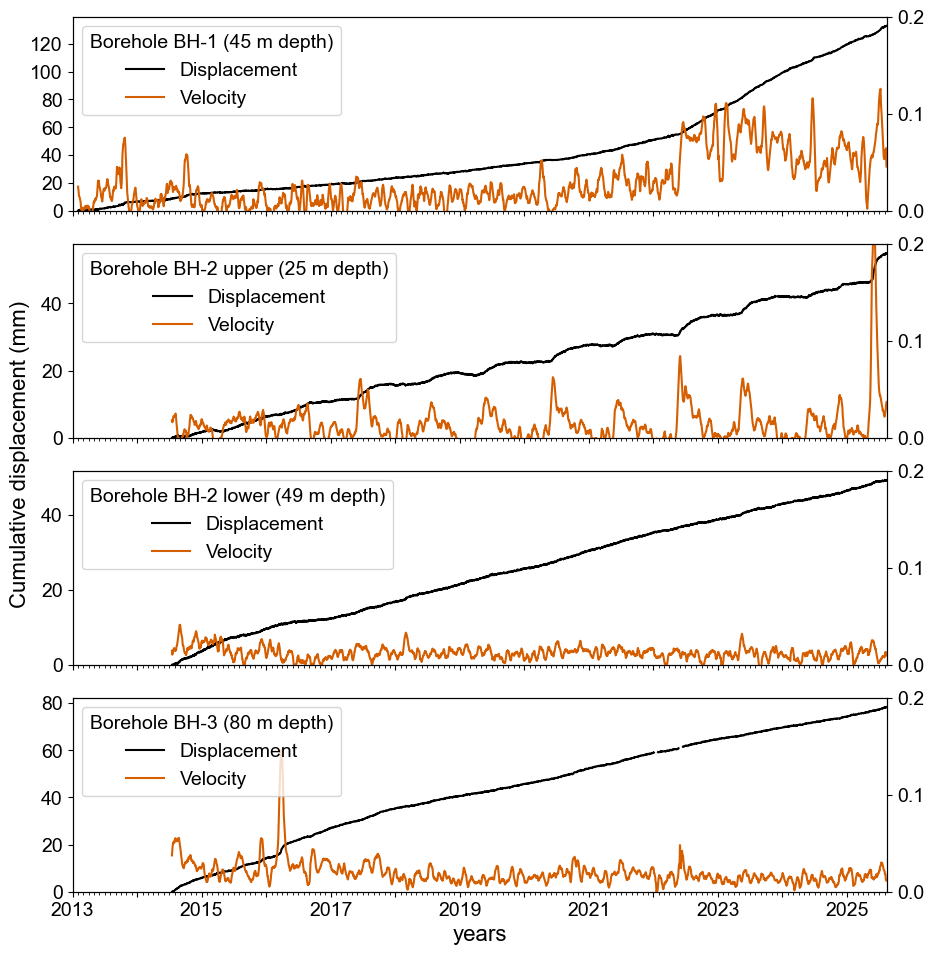

In [6]:
# Zoom on multiple events at same time
# looking at creep bursts versus water pressure

# TO DO !
# Adjust for x-axis so it is tight on both sides
# Only plot y-axis on the right edge as the y-axis is on the left
# Look through water pressures with Clara and see if I can use some of the other deeper modules to plot

########### Cleaning DMS and GPS ############
from scipy.signal import savgol_filter
def clean_lowpassfilt(file, colnmbr=0, name='Water table [m bgl]:'): # colnmbr is the column chosen to lowpass filter, name is wanted name for filtered column
    # rolling mean filter window
    window_mean = 14
    # savgol parameters
    window_size = 7
    poly_order = 3
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    # file = file.resample('1D').median() # matching interval of cleaning parameters
    file = file.dropna()
    file['interpolated'] = file.iloc[:,colnmbr].interpolate(method='linear', limit_direction ='forward')
    # file['filt'] = butter_lowpass_filter(file.iloc[:,-1], cutoff, fs, order) # replace original by lowpass filtered
    file['filt'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    file['filt'] = file['filt'].rolling(window=window_mean, center=True).median() # rolling median
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    file.rename(columns={'filt':name}, inplace=True) # I call it the same as original if it was dependent on name in scripts lower down
    return file
######################################

from matplotlib.dates import DateFormatter

# plotting
nrows = 4
fig, ax = plt.subplots(nrows=nrows, figsize=(10,10), sharex=True)
# fig.subplots_adjust(hspace=0.1) #fig.subplots_adjust(wspace=0) # to remove space on each side of the x-axis

interval = 1 # days downsampling
interval_diff = '30D' # days doing velocity shift over

#                          PLOT 1
# JTT-1
file = []
file2 = [] # to make sure it does not come from previous plot

file2 = JTT1Disp.copy()

# Add a vertical line for each year
for i in range(nrows):
    for year in range(file2.index.year.min(), file2.index.year.max()+1):
        ax[i].axvline(pd.Timestamp(f'{year}-01-01'), color='black', linewidth=0.5)

file2['Disp_summed [mm]:'] = clean_lowpassfilt(file2['Disp_summed [mm]:'], colnmbr=0, name='Disp_summed [mm]:')        
file2 = file2.resample(f'{interval}d').median()
zero_start = file2['Disp_summed [mm]:'].dropna().iloc[0] # starting from 0
df = file2.copy()
# df.loc[df['interpolated_disp'] >0] = np.inf
ax_y = ax[0].twinx()
ax[0].plot(df.index, df['Disp_summed [mm]:']-zero_start, color='black', label='Displacement')
ax_y.plot(df.index, rolling_slope_time(df['Disp_summed [mm]:']-zero_start,interval_diff), color=colors[1], label='Velocity')

#                              PLOT 3
# JTT-2 Upper

file2 = JTT2DispUpperZone.copy()
file2['Disp_summed [mm]:'] = clean_lowpassfilt(file2['Disp_summed [mm]:'], colnmbr=0, name='Disp_summed [mm]:')     
file2 = file2.resample(f'{interval}d').median()
zero_start = file2['Disp_summed [mm]:'].dropna().iloc[0] # starting from 0
df = file2.copy()

ax_y1 = ax[1].twinx()
ax[1].plot(df.index, df['Disp_summed [mm]:']-zero_start, color='black', label='Displacement')
ax_y1.plot(df.index, rolling_slope_time(df['Disp_summed [mm]:']-zero_start,interval_diff), color=colors[1], label='Velocity')
#                              PLOT 3
# JTT-2 Lower

file2 = JTT2DispLowerZone.copy()
file2['Disp_summed [mm]:'] = clean_lowpassfilt(file2['Disp_summed [mm]:'], colnmbr=0, name='Disp_summed [mm]:')     
file2 = file2.resample(f'{interval}d').median()
zero_start = file2['Disp_summed [mm]:'].dropna().iloc[0] # starting from 0
df = file2.copy()

ax_y2 = ax[2].twinx()
ax[2].plot(df.index, df['Disp_summed [mm]:']-zero_start, color='black', label='Displacement')
ax_y2.plot(df.index, rolling_slope_time(df['Disp_summed [mm]:']-zero_start,interval_diff), color=colors[1], label='Velocity')

#                          PLOT 4
# JTT-3
file = []
file2 = [] # to make sure it does not come from previous plot

file2 = JTT3Disp.copy()
file2['Disp_summed [mm]:'] = clean_lowpassfilt(file2['Disp_summed [mm]:'], colnmbr=0, name='Disp_summed [mm]:')     
file2 = file2.resample(f'{interval}d').median()
zero_start = file2['Disp_summed [mm]:'].dropna().iloc[0] # starting from 0
df = file2.copy()
# df.loc[df['interpolated_disp'] >0] = np.inf
ax_y3 = ax[3].twinx()
ax[3].plot(df.index, df['Disp_summed [mm]:']-zero_start, color='black', label='Displacement')
ax_y3.plot(df.index, rolling_slope_time(df['Disp_summed [mm]:']-zero_start,interval_diff), color=colors[1], label='Velocity')


# Need to change axis such that velocity is on the right side, and disp on left side. Then import to illustrator and upload figure to overleaf

# fixing axes
ymin, ymax = ax[0].get_ylim()
ax[0].set_ylim(0, ymax) # disp
ax_y.set_ylim(0,0.2) # velocity
ax_y.set_yticks([0.0, 0.1, 0.2])

ymin, ymax = ax[1].get_ylim()
ax[1].set_ylim(0, ymax) # disp
ax_y1.set_ylim(0,0.2) # velocity
ax_y1.set_yticks([0.0, 0.1, 0.2])

ymin, ymax = ax[2].get_ylim()
ax[2].set_ylim(0, ymax) # disp
ax_y2.set_ylim(0,0.2) # velocity
ax_y2.set_yticks([0.0, 0.1, 0.2])

ymin, ymax = ax[3].get_ylim()
ax[3].set_ylim(0, ymax) # disp
ax_y3.set_ylim(0,0.2) # velocity
ax_y3.set_yticks([0.0, 0.1, 0.2])

nticks = 4
for i in range(nrows):
    ax[i].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))

from matplotlib.ticker import MultipleLocator
for i in range(nrows):
    ax[i].yaxis.set_major_locator(MultipleLocator(20))

for i in range(nrows):
    ax[i].yaxis.set_major_formatter(FormatStrFormatter('%.f'))

handles, labels = [(a + b) for a, b, in zip(ax[0].get_legend_handles_labels(), ax_y.get_legend_handles_labels())]
ax_y.legend(handles, labels, title='Borehole BH-1 (45 m depth)', loc='upper left')

handles, labels = [(a + b) for a, b, in zip(ax[1].get_legend_handles_labels(), ax_y1.get_legend_handles_labels())]
ax_y1.legend(handles, labels, title='Borehole BH-2 upper (25 m depth)', loc='upper left')

handles, labels = [(a + b) for a, b, in zip(ax[2].get_legend_handles_labels(), ax_y2.get_legend_handles_labels())]
ax_y2.legend(handles, labels, title='Borehole BH-2 lower (49 m depth)', loc='upper left')

handles, labels = [(a + b) for a, b, in zip(ax[3].get_legend_handles_labels(), ax_y3.get_legend_handles_labels())]
ax_y3.legend(handles, labels, title='Borehole BH-3 (80 m depth)', loc='upper left')

axs = fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axis
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
plt.ylabel('Cumulative displacement (mm)')
# fig.text(0.95, 0.5, 'Velocity mm/day', va='center', rotation=-90) # Add right-side label manually
plt.xlabel('years')


# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax[3].xaxis.set_major_locator(years)
ax[3].xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax[3].xaxis.set_minor_locator(months)
ax[3].xaxis.set_major_locator(mdates.YearLocator(1, month=1, day=1))  # Major ticks on Jan 1st of every year
# ax[3].xaxis.set_major_formatter(mdates.DateFormatter('%b %d %Y')) 

# removing tick labels from the xaxis
n = 2  # keeps every n row
[l.set_visible(False) for (i,l) in enumerate(ax[3].xaxis.get_ticklabels()) if i % n != 0] # Get 'none' from this for some reason

start_time = pd.Timestamp('2013-01-01')
end_time = pd.Timestamp('2025-08-15')

for i in range(nrows):
    ax[i].set_xlim(pd.Timestamp(start_time),pd.Timestamp(end_time))

fig.tight_layout()
plt.show()

# saving
path = 'plots/'
save_name = f'{path}Figure_accelerations.png'
fig.savefig(save_name, dpi=600)

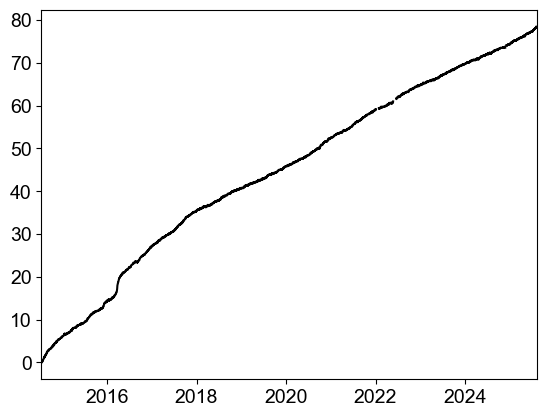

In [154]:
plt.plot(df.index, df['Disp_summed [mm]:']-zero_start, color='black', label='Displacement')

In [ ]:
## Old figure for creep burst

C:\Users\andregas\AppData\Local\Temp\ipykernel_5580\2003813444.py:26: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  zero_start = file2['Disp_summed [mm]:'][0] # starting from 0
C:\Users\andregas\AppData\Local\Temp\ipykernel_5580\2003813444.py:108: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  zero_start = file2['Disp_summed [mm]:'][0] # starting from 0
C:\Users\andregas\AppData\Local\Temp\ipykernel_5580\2003813444.py:123: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  cb = pd.DataFrame(index=pd.date_range(file['date_start'][i], periods=len(file['date'][i].values), 

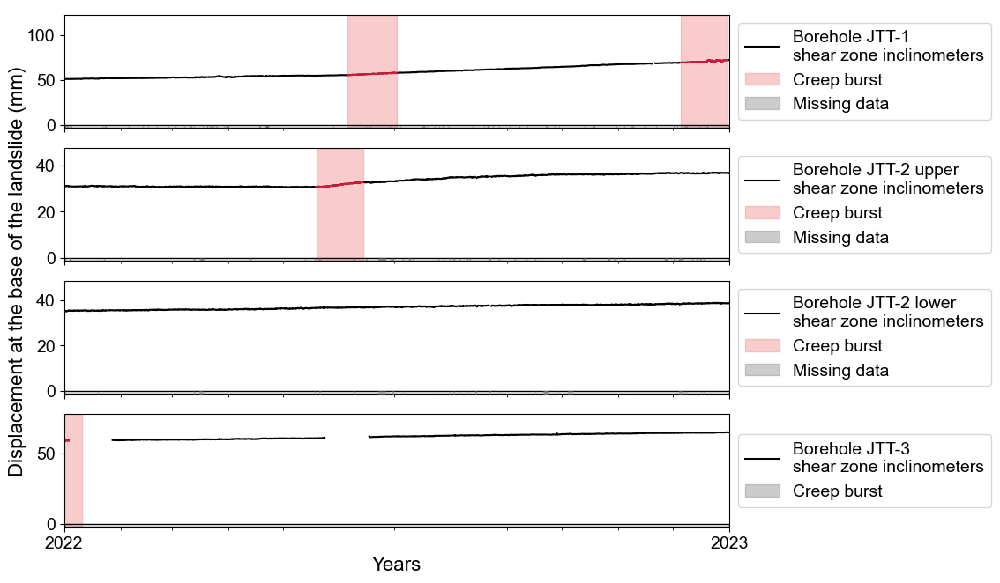

In [161]:
# Zoom on multiple events at same time
# looking at creep bursts versus water pressure

# TO DO !
# Adjust for x-axis so it is tight on both sides
# Only plot y-axis on the right edge as the y-axis is on the left
# Look through water pressures with Clara and see if I can use some of the other deeper modules to plot

from matplotlib.dates import DateFormatter

# plotting

fig, ax = plt.subplots(nrows=4, figsize=(12,7), sharex=True)
# fig.subplots_adjust(hspace=0) #fig.subplots_adjust(wspace=0) # to remove space on each side of the x-axis



#                          PLOT 1
# JTT-1
file = []
file2 = [] # to make sure it does not come from previous plot

file = JTT1Disp_creep.copy()
file2 = JTT1Disp.copy()

zero_start = file2['Disp_summed [mm]:'][0] # starting from 0
df = file2.copy()
# df.loc[df['interpolated_disp'] >0] = np.inf
ax[0].plot(df.index, df['Disp_summed [mm]:']-zero_start, color='black', label='Borehole JTT-1 \nshear zone inclinometers')
# df = file2.copy()
# df.loc[df['interpolated_disp'] ==np.nan] = np.inf
# ax[1].plot(df.index, df['interpolated_disp']-zero_start, color='violet', label='Interpolated displacement')

# df of start and end of bursts
window = []
previous_d = 0
for i, d in enumerate(file2['nBursts']):
    if d != previous_d:
        previous_d = d
        window.append(file2[i:i+1].index)

# Convert the list of datetime objects to a NumPy array
window = np.array([item[0] for item in window])
        
idx = np.arange(0, len(window), 2)  # index to slice at even numbers
for start in idx:
    ax[0].axvspan(window[start], window[start+1], facecolor='lightcoral', edgecolor='lightcoral', label='Creep burst', zorder=1, alpha=0.4)

df = file2.copy()
df.loc[df['nBursts'] ==0] = np.nan
df = df.replace(np.nan,np.inf) # to avoid interpolation between holes in data
ax[0].plot(df.index, df['Disp_summed [mm]:']-zero_start, color='crimson', label='') # I do not know if we want this coloring?

# df of missing data
df = file2['Disp_summed [mm]:'].copy()
df.loc[df.notna()] = 0
df.loc[df.isna()] = 1
window = []
previous_d = 0
zero_start = mpl.dates.date2num(df.index[0])
ymin_1 = -file2['Disp_summed [mm]:'].max()/40

for i, d in enumerate(df):
    if d != previous_d:
        previous_d = d
        window.append(df[i:i+1].index)

# Convert the list of datetime objects to a NumPy array
window = np.array([item[0] for item in window])

idx = np.arange(0, len(window), 2)  # index to slice at even numbers
for start in idx[:-1]:
    if window[start+1]-window[start] > np.timedelta64(1, 'h'): # can change to show only more than n hours..
        xmin = (mpl.dates.date2num(window[start])-zero_start)/(mpl.dates.date2num(df.index[-1])-zero_start)
        xmax = (mpl.dates.date2num(window[start+1])-zero_start)/(mpl.dates.date2num(df.index[-1])-zero_start)
        ax[0].axhspan(ymin=ymin_1, ymax=0, xmin=xmin, xmax=xmax, facecolor='gray', edgecolor='gray', label='Missing data', zorder=1, alpha=0.4) # zorder = what layer to plot from back to front

ax[0].axhspan(ymin=ymin_1, ymax=0, xmin=0, xmax=1, facecolor='None', edgecolor='black', label='') # edge around missing data

# # Cumulated plot, not to be used as of now..
# df = file.copy()
# frames = []
# for i in df.index:
#     cb = pd.DataFrame(index=pd.date_range(file['date_start'][i], periods=len(file['date'][i].values), freq='H'))
#     cb['displacement'] = df.displacement.iloc[i]
#     frames.append(cb)
# cb = pd.concat(frames)
# cb['displacement'] = cb['displacement'].replace(0, np.nan).dropna()
# velocity = cb['displacement'].shift(-1)-cb['displacement']
# cb['cumulated'] = np.nancumsum(velocity) # cumulated creep bursts
# # ax[1].plot(cb.index, cb['cumulated'], color='crimson', label='Cumulated creep bursts')
# df = file2.copy()
# df.loc[df['nBursts'] ==1] = np.nan
# velocity = df['displacement_butterfilt'].shift(-1)-df['displacement_butterfilt']
# df['cumulated'] = np.nancumsum(velocity) # cumulated disp w/o creep burst
# # ax[1].plot(df.index, df['cumulated'], color='black', label='Displacement w/o bursts')

# cb_of_totaldisp = (cb['cumulated'][-1]/df['cumulated'][-1])*100
# # ax[0].text(pd.Timestamp('2020-02-05'), 90, f'Creep bursts contribute to {cb_of_totaldisp:.1f} % of total displacement' , horizontalalignment='left', size='medium', color='black', fontsize=medium_size)



#                              PLOT 3
# JTT-2 Upper
file = JTT2DispUpperZone_creep.copy()
file2 = JTT2DispUpperZone.copy()

zero_start = file2['Disp_summed [mm]:'][0] # starting from 0
df = file2.copy()

# df1 = file2['displacement_butterfilt'].copy() # this part is done to make the shared x-axis work
# df1 =  df1[df1.index.slice_indexer(df.index[-1],df1.index[-1])] 
# df1.values[:] = np.nan
# df = pd.concat([df, df1])

ax[1].plot(df.index, df['Disp_summed [mm]:']-zero_start, color='black', label='Borehole JTT-2 upper \nshear zone inclinometers')
df = file2.copy()

# making the cumulated plot possible
df = file.copy()
frames = []
for i in df.index:
    cb = pd.DataFrame(index=pd.date_range(file['date_start'][i], periods=len(file['date'][i].values), freq='H'))
    cb['displacement'] = df.displacement.iloc[i]
    frames.append(cb)
cb = pd.concat(frames)
cb['displacement'] = cb['displacement'].replace(0, np.nan).dropna()
velocity = cb['displacement'].shift(-1)-cb['displacement']
cb['cumulated'] = np.nancumsum(velocity)

# df of start and end of bursts
window = []
previous_d = 0
for i, d in enumerate(file2['nBursts']):
    if d != previous_d:
        previous_d = d
        window.append(file2[i:i+1].index)
        
# Convert the list of datetime objects to a NumPy array
window = np.array([item[0] for item in window])

idx = np.arange(0, len(window), 2)  # index to slice at even numbers
for start in idx:
    ax[1].axvspan(window[start], window[start+1], facecolor='lightcoral', edgecolor='lightcoral', label='Creep burst', zorder=1, alpha=0.4)

df = file2.copy()
df.loc[df['nBursts'] ==0] = np.nan
df = df.replace(np.nan,np.inf) # to avoid interpolation between holes in data
ax[1].plot(df.index, df['Disp_summed [mm]:']-zero_start, color='crimson', label='') # I do not know if we want this coloring?

# df of missing data
df = file2['Disp_summed [mm]:'].copy()
df.loc[df.notna()] = 0
df.loc[df.isna()] = 1
df1 = file2['Disp_summed [mm]:'].copy() # to get dataset for entire plot window as KH0118 is longer than KH0218
df1 =  df1[df1.index.slice_indexer(df.index[-1],df1.index[-1])]
df1.values[:] = 1
df = pd.concat([df, df1])
df.values[-2] = 0 # force it to plot missing data due to the change in value for loop I have. -2 due to skiping last idx to be able to difference window length of missing data
window = []
previous_d = 0
zero_start = mpl.dates.date2num(df.index[0])
ymin_2 = -file2['Disp_summed [mm]:'].max()/40

for i, d in enumerate(df):
    if d != previous_d:
        previous_d = d
        window.append(df[i:i+1].index)
        
# Convert the list of datetime objects to a NumPy array
window = np.array([item[0] for item in window])

idx = np.arange(0, len(window), 2)  # index to slice at even numbers
for start in idx[:-1]:
    if window[start+1]-window[start] > np.timedelta64(1, 'h'): # can change to show only more than n hours..
        xmin = (mpl.dates.date2num(window[start])-zero_start)/(mpl.dates.date2num(df.index[-1])-zero_start)
        xmax = (mpl.dates.date2num(window[start+1])-zero_start)/(mpl.dates.date2num(df.index[-1])-zero_start)
        ax[1].axhspan(ymin=ymin_2, ymax=0, xmin=xmin, xmax=xmax, facecolor='gray', edgecolor='gray', label='Missing data', zorder=1, alpha=0.4) # zorder = what layer to plot from back to front

ax[1].axhspan(ymin=ymin_2, ymax=0, xmin=0, xmax=1, facecolor='None', edgecolor='black', label='') # edge around missing data
        
# # Cumulated plot, not to be used as of now..
# df = file.copy()
# frames = []
# for i in df.index:
#     cb = pd.DataFrame(index=pd.date_range(file['date_start'][i], periods=len(file['date'][i].values), freq='H'))
#     cb['displacement'] = df.displacement.iloc[i]
#     frames.append(cb)
# cb = pd.concat(frames)
# cb['displacement'] = cb['displacement'].replace(0, np.nan).dropna()
# velocity = cb['displacement'].shift(-1)-cb['displacement']
# cb['cumulated'] = np.nancumsum(velocity) # cumulated creep bursts
# # ax[1].plot(cb.index, cb['cumulated'], color='crimson', label='Cumulated creep bursts')
# df = file2.copy()
# df.loc[df['nBursts'] ==1] = np.nan
# velocity = df['Disp_summed [mm]:'].shift(-1)-df['Disp_summed [mm]:']
# df['cumulated'] = np.nancumsum(velocity) # cumulated disp w/o creep burst
# # ax[1].plot(df.index, df['cumulated'], color='black', label='Displacement w/o bursts')

# cb_of_totaldisp = (cb['cumulated'][-1]/df['cumulated'][-1])*100
# # ax[1].text(pd.Timestamp('2020-02-05'), 27, f'Creep bursts contribute to {cb_of_totaldisp:.1f} % of total displacement' , horizontalalignment='left', size='medium', color='black', fontsize=medium_size)


#                              PLOT 3
# JTT-2 Lower
file = JTT2DispLowerZone_creep.copy()
file2 = JTT2DispLowerZone.copy()

zero_start = file2['Disp_summed [mm]:'][0] # starting from 0
df = file2.copy()

# df1 = file2['displacement_butterfilt'].copy() # this part is done to make the shared x-axis work
# df1 =  df1[df1.index.slice_indexer(df.index[-1],df1.index[-1])] 
# df1.values[:] = np.nan
# df = pd.concat([df, df1])

ax[2].plot(df.index, df['Disp_summed [mm]:']-zero_start, color='black', label='Borehole JTT-2 lower \nshear zone inclinometers')
df = file2.copy()

# making the cumulated plot possible
df = file.copy()
frames = []
for i in df.index:
    cb = pd.DataFrame(index=pd.date_range(file['date_start'][i], periods=len(file['date'][i].values), freq='H'))
    cb['displacement'] = df.displacement.iloc[i]
    frames.append(cb)
cb = pd.concat(frames)
cb['displacement'] = cb['displacement'].replace(0, np.nan).dropna()
velocity = cb['displacement'].shift(-1)-cb['displacement']
cb['cumulated'] = np.nancumsum(velocity)

# df of start and end of bursts
window = []
previous_d = 0
for i, d in enumerate(file2['nBursts']):
    if d != previous_d:
        previous_d = d
        window.append(file2[i:i+1].index)
        
# Convert the list of datetime objects to a NumPy array
window = np.array([item[0] for item in window])

idx = np.arange(0, len(window), 2)  # index to slice at even numbers
for start in idx:
    ax[2].axvspan(window[start], window[start+1], facecolor='lightcoral', edgecolor='lightcoral', label='Creep burst', zorder=1, alpha=0.4)

df = file2.copy()
df.loc[df['nBursts'] ==0] = np.nan
df = df.replace(np.nan,np.inf) # to avoid interpolation between holes in data
ax[2].plot(df.index, df['Disp_summed [mm]:']-zero_start, color='crimson', label='') # I do not know if we want this coloring?

# df of missing data
df = file2['Disp_summed [mm]:'].copy()
df.loc[df.notna()] = 0
df.loc[df.isna()] = 1
df1 = file2['Disp_summed [mm]:'].copy() # to get dataset for entire plot window as KH0118 is longer than KH0218
df1 =  df1[df1.index.slice_indexer(df.index[-1],df1.index[-1])]
df1.values[:] = 1
df = pd.concat([df, df1])
df.values[-2] = 0 # force it to plot missing data due to the change in value for loop I have. -2 due to skiping last idx to be able to difference window length of missing data
window = []
previous_d = 0
zero_start = mpl.dates.date2num(df.index[0])
ymin_3 = -file2['Disp_summed [mm]:'].max()/40

for i, d in enumerate(df):
    if d != previous_d:
        previous_d = d
        window.append(df[i:i+1].index)
        
# Convert the list of datetime objects to a NumPy array
window = np.array([item[0] for item in window])

idx = np.arange(0, len(window), 2)  # index to slice at even numbers
for start in idx[:-1]:
    if window[start+1]-window[start] > np.timedelta64(1, 'h'): # can change to show only more than n hours..
        xmin = (mpl.dates.date2num(window[start])-zero_start)/(mpl.dates.date2num(df.index[-1])-zero_start)
        xmax = (mpl.dates.date2num(window[start+1])-zero_start)/(mpl.dates.date2num(df.index[-1])-zero_start)
        ax[1].axhspan(ymin=ymin_3, ymax=0, xmin=xmin, xmax=xmax, facecolor='gray', edgecolor='gray', label='Missing data', zorder=1, alpha=0.4) # zorder = what layer to plot from back to front

ax[2].axhspan(ymin=ymin_3, ymax=0, xmin=0, xmax=1, facecolor='None', edgecolor='black', label='') # edge around missing data
        
# # Cumulated plot, not to be used as of now..
# df = file.copy()
# frames = []
# for i in df.index:
#     cb = pd.DataFrame(index=pd.date_range(file['date_start'][i], periods=len(file['date'][i].values), freq='H'))
#     cb['displacement'] = df.displacement.iloc[i]
#     frames.append(cb)
# cb = pd.concat(frames)
# cb['displacement'] = cb['displacement'].replace(0, np.nan).dropna()
# velocity = cb['displacement'].shift(-1)-cb['displacement']
# cb['cumulated'] = np.nancumsum(velocity) # cumulated creep bursts
# # ax[1].plot(cb.index, cb['cumulated'], color='crimson', label='Cumulated creep bursts')
# df = file2.copy()
# df.loc[df['nBursts'] ==1] = np.nan
# velocity = df['Disp_summed [mm]:'].shift(-1)-df['Disp_summed [mm]:']
# df['cumulated'] = np.nancumsum(velocity) # cumulated disp w/o creep burst
# # ax[1].plot(df.index, df['cumulated'], color='black', label='Displacement w/o bursts')

# cb_of_totaldisp = (cb['cumulated'][-1]/df['cumulated'][-1])*100
# # ax[1].text(pd.Timestamp('2020-02-05'), 27, f'Creep bursts contribute to {cb_of_totaldisp:.1f} % of total displacement' , horizontalalignment='left', size='medium', color='black', fontsize=medium_size)


#                          PLOT 4
# JTT-3
file = []
file2 = [] # to make sure it does not come from previous plot

file = JTT3Disp_creep.copy()
file2 = JTT3Disp.copy()

zero_start = file2['Disp_summed [mm]:'][0] # starting from 0
df = file2.copy()
# df.loc[df['interpolated_disp'] >0] = np.inf
ax[3].plot(df.index, df['Disp_summed [mm]:']-zero_start, color='black', label='Borehole JTT-3 \nshear zone inclinometers')
# df = file2.copy()
# df.loc[df['interpolated_disp'] ==np.nan] = np.inf
# ax[1].plot(df.index, df['interpolated_disp']-zero_start, color='violet', label='Interpolated displacement')

# df of start and end of bursts
window = []
previous_d = 0
for i, d in enumerate(file2['nBursts']):
    if d != previous_d:
        previous_d = d
        window.append(file2[i:i+1].index)

# Convert the list of datetime objects to a NumPy array
window = np.array([item[0] for item in window])
        
idx = np.arange(0, len(window), 2)  # index to slice at even numbers
for start in idx:
    ax[3].axvspan(window[start], window[start+1], facecolor='lightcoral', edgecolor='lightcoral', label='Creep burst', zorder=1, alpha=0.4)

df = file2.copy()
df.loc[df['nBursts'] ==0] = np.nan
df = df.replace(np.nan,np.inf) # to avoid interpolation between holes in data
ax[3].plot(df.index, df['Disp_summed [mm]:']-zero_start, color='crimson', label='') # I do not know if we want this coloring?

# df of missing data
df = file2['Disp_summed [mm]:'].copy()
df.loc[df.notna()] = 0
df.loc[df.isna()] = 1
window = []
previous_d = 0
zero_start = mpl.dates.date2num(df.index[0])
ymin_4 = -file2['Disp_summed [mm]:'].max()/40

for i, d in enumerate(df):
    if d != previous_d:
        previous_d = d
        window.append(df[i:i+1].index)

# Convert the list of datetime objects to a NumPy array
window = np.array([item[0] for item in window])

idx = np.arange(0, len(window), 2)  # index to slice at even numbers
for start in idx[:-1]:
    if window[start+1]-window[start] > np.timedelta64(1, 'h'): # can change to show only more than n hours..
        xmin = (mpl.dates.date2num(window[start])-zero_start)/(mpl.dates.date2num(df.index[-1])-zero_start)
        xmax = (mpl.dates.date2num(window[start+1])-zero_start)/(mpl.dates.date2num(df.index[-1])-zero_start)
        ax[2].axhspan(ymin=ymin_4, ymax=0, xmin=xmin, xmax=xmax, facecolor='gray', edgecolor='gray', label='Missing data', zorder=1, alpha=0.4) # zorder = what layer to plot from back to front

ax[3].axhspan(ymin=ymin_4, ymax=0, xmin=0, xmax=1, facecolor='None', edgecolor='black', label='') # edge around missing data

# # Cumulated plot, not to be used as of now..
# df = file.copy()
# frames = []
# for i in df.index:
#     cb = pd.DataFrame(index=pd.date_range(file['date_start'][i], periods=len(file['date'][i].values), freq='H'))
#     cb['displacement'] = df.displacement.iloc[i]
#     frames.append(cb)
# cb = pd.concat(frames)
# cb['displacement'] = cb['displacement'].replace(0, np.nan).dropna()
# velocity = cb['displacement'].shift(-1)-cb['displacement']
# cb['cumulated'] = np.nancumsum(velocity) # cumulated creep bursts
# # ax[1].plot(cb.index, cb['cumulated'], color='crimson', label='Cumulated creep bursts')
# df = file2.copy()
# df.loc[df['nBursts'] ==1] = np.nan
# velocity = df['displacement_butterfilt'].shift(-1)-df['displacement_butterfilt']
# df['cumulated'] = np.nancumsum(velocity) # cumulated disp w/o creep burst
# # ax[1].plot(df.index, df['cumulated'], color='black', label='Displacement w/o bursts')

# cb_of_totaldisp = (cb['cumulated'][-1]/df['cumulated'][-1])*100
# # ax[0].text(pd.Timestamp('2020-02-05'), 90, f'Creep bursts contribute to {cb_of_totaldisp:.1f} % of total displacement' , horizontalalignment='left', size='medium', color='black', fontsize=medium_size)



# ax[0].set_title('Displacement at the base of the landslide')

adj = 1.2 # adjustment
ym, ymax = ax[0].get_ylim()
ax[0].set_ylim(ymin_1*adj,ymax)
ym, ymax = ax[1].get_ylim()
ax[1].set_ylim(ymin_2*adj,ymax)
ym, ymax = ax[2].get_ylim()
ax[2].set_ylim(ymin_3*adj,ymax)
ym, ymax = ax[3].get_ylim()
ax[3].set_ylim(ymin_4*adj,ymax)

# set axis labels
# ax[0].set_ylabel('mm')
# ax[0].set_ylabel('Displacement at the base of the landslide (mm)')
lines, labels = ax[0].get_legend_handles_labels()
lines = unique(lines)
labels = unique(labels)
ax[0].legend(lines, labels, loc='center left', bbox_to_anchor=(1, 0.5))
leg = ax[0].get_legend() # gets legend handels
leg.legend_handles[-1].set_color('gray')

# ax[1].set_ylabel('mm')
lines, labels = ax[1].get_legend_handles_labels()
lines = unique(lines)
labels = unique(labels)
ax[1].legend(lines, labels, loc='center left', bbox_to_anchor=(1, 0.5))
leg = ax[1].get_legend() # gets legend handels
leg.legend_handles[-1].set_color('gray')

lines, labels = ax[2].get_legend_handles_labels()
lines = unique(lines)
labels = unique(labels)
ax[2].legend(lines, labels, loc='center left', bbox_to_anchor=(1, 0.5))
leg = ax[2].get_legend() # gets legend handels
leg.legend_handles[-1].set_color('gray')

lines, labels = ax[3].get_legend_handles_labels()
lines = unique(lines)
labels = unique(labels)
ax[3].legend(lines, labels, loc='center left', bbox_to_anchor=(1, 0.5))
leg = ax[3].get_legend() # gets legend handels
leg.legend_handles[-1].set_color('gray')

# ax[1].set_xlabel('Time (months)')

axs = fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axis
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
plt.xlabel('Years')
plt.ylabel('Displacement at the base of the landslide (mm)')


# Ensure the first year is included
start_year = JTT1Disp.index.min().year
end_year = JTT1Disp.index.max()
ax[3].set_xlim(mdates.date2num([f'{start_year}-01-01', f'{end_year}']))

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax[3].xaxis.set_major_locator(years)
ax[3].xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax[3].xaxis.set_minor_locator(months)
# Apply the year format for the major ticks again
ax[3].xaxis.set_major_formatter(years_fmt)

# # removing tick labels from the xaxis
# n = 2  # keeps every n row
# [l.set_visible(False) for (i,l) in enumerate(ax[1].xaxis.get_ticklabels()) if i % n != 0]

start_time = pd.Timestamp('2022-01-01')
end_time = pd.Timestamp('2023-01-01')

# Zooming
for i in range(nrows):
    ax[i].set_xlim(pd.Timestamp(start_time),pd.Timestamp(end_time))

fig.tight_layout()
plt.show()

# # saving
# path = 'plots/'
# save_name = f'{path}Figure_creepbursts.png'
# fig.savefig(save_name, dpi=600)

# Figure 6

In [16]:
len(name)

4

C:\Users\andregas\AppData\Local\Temp\ipykernel_5580\3389443008.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_vals = float(model.intercept_) + float(model.coef_)* x_vals
C:\Users\andregas\AppData\Local\Temp\ipykernel_5580\3389443008.py:97: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_vals = float(model.intercept_) + float(model.coef_)* x_vals
C:\Users\andregas\AppData\Local\Temp\ipykernel_5580\3389443008.py:107: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.

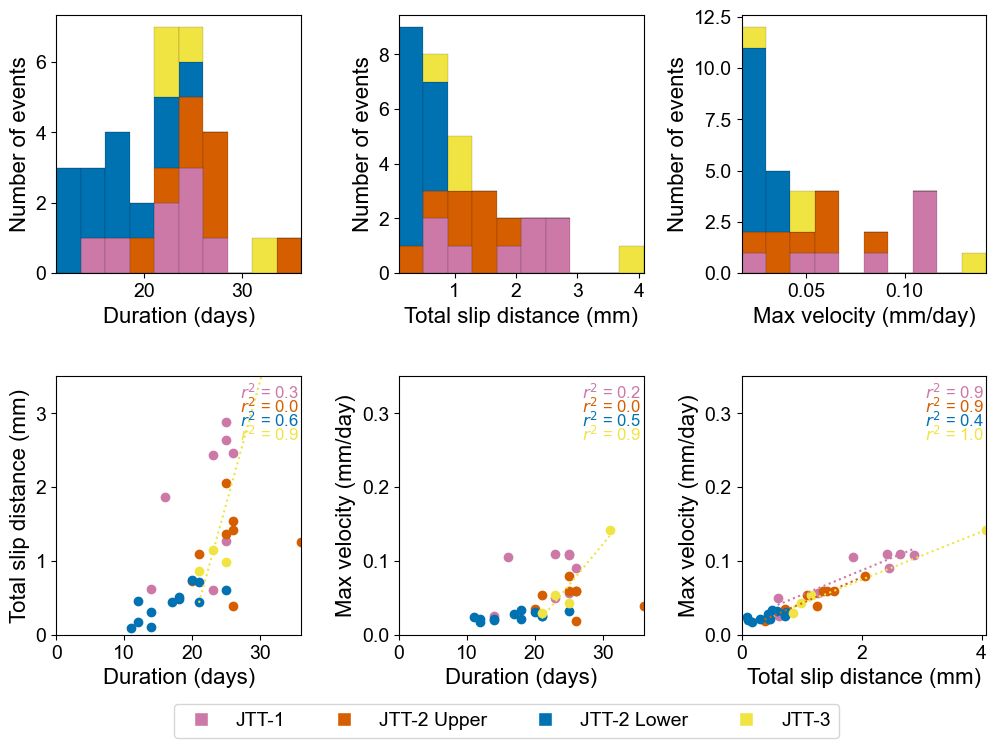

In [149]:
# getting same time for all dfs
start_time = JTT3Disp.index[0]
end_time = JTT3Disp.index[-1]

JTT1Disp_creep.set_index('date_start', inplace=True, drop=True)
JTT1Disp_creep =  JTT1Disp_creep[JTT1Disp_creep.index.slice_indexer(start_time,end_time)] # subsetting time
JTT1Disp_creep.reset_index(inplace=True)

JTT2DispLowerZone_creep.set_index('date_start', inplace=True, drop=True)
JTT2DispLowerZone_creep =  JTT2DispLowerZone_creep[JTT2DispLowerZone_creep.index.slice_indexer(start_time,end_time)] # subsetting time
JTT2DispLowerZone_creep.reset_index(inplace=True)

JTT2DispUpperZone_creep.set_index('date_start', inplace=True, drop=True)
JTT2DispUpperZone_creep =  JTT2DispUpperZone_creep[JTT2DispUpperZone_creep.index.slice_indexer(start_time,end_time)] # subsetting time
JTT2DispUpperZone_creep.reset_index(inplace=True)

JTT3Disp_creep.set_index('date_start', inplace=True, drop=True)
JTT3Disp_creep =  JTT3Disp_creep[JTT3Disp_creep.index.slice_indexer(start_time,end_time)] # subsetting time
JTT3Disp_creep.reset_index(inplace=True)

data1 = 'duration_days'
data2 = 'total_slip_distance'
durdays = [JTT1Disp_creep[data1],JTT2DispUpperZone_creep[data1],JTT2DispLowerZone_creep[data1],JTT3Disp_creep[data1]]
totslip = [JTT1Disp_creep[data2],JTT2DispUpperZone_creep[data2],JTT2DispLowerZone_creep[data2],JTT3Disp_creep[data2]]
data2 = 'max_velocity'
maxvel = [JTT1Disp_creep[data2],JTT2DispUpperZone_creep[data2],JTT2DispLowerZone_creep[data2],JTT3Disp_creep[data2]]

name = ['JTT-1','JTT-2 Upper','JTT-2 Lower','JTT-3']

# plotting
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(12,10))
fig.subplots_adjust(hspace = .4)
fig.subplots_adjust(wspace = .4)

KH0218 = 'KH-02-18'
KH0118 = 'KH-01-18'
KH0117 = 'KH-01-17'
KH0217Lower = 'KH-02-17 Lower'
KH0217Upper = 'KH-02-17 Upper'
KH0112Lower = 'KH-01-12 Lower'
KH0112Upper = 'KH-01-12 Upper'
KH0206Lower = 'KH-02-06 Lower'
KH0206Upper = 'KH-02-06 Upper'

#upper histograms
df = pd.concat(durdays,axis=1)
ax[0,0].hist(df, histtype='bar', color=colors[0:len(name)], label=name, stacked=True, linewidth=0.1, edgecolor='black') # this seems to work best
ax[0,0].set_xlabel('Duration (days)')
ax[0,0].set_ylabel('Number of events')

df = pd.concat(totslip,axis=1)
ax[0,1].hist(df, histtype='bar', color=colors[0:len(name)], label=name, stacked=True, linewidth=0.1, edgecolor='black')
ax[0,1].set_xlabel('Total slip distance (mm)')
ax[0,1].set_ylabel('Number of events')
    
df = pd.concat(maxvel,axis=1)
ax[0,2].hist(df, histtype='bar', color=colors[0:len(name)], label=name, stacked=True, linewidth=0.1, edgecolor='black')
ax[0,2].set_xlabel('Max velocity (mm/day)')
ax[0,2].set_ylabel('Number of events')

# lower scatter plots
ax[1,0].scatter(JTT1Disp_creep['duration_days'], JTT1Disp_creep['total_slip_distance'], color=colors[0], label=KH0218)
ax[1,0].scatter(JTT2DispUpperZone_creep['duration_days'], JTT2DispUpperZone_creep['total_slip_distance'], color=colors[1], label=KH0118)
ax[1,0].scatter(JTT2DispLowerZone_creep['duration_days'], JTT2DispLowerZone_creep['total_slip_distance'], color=colors[2], label=KH0117)
ax[1,0].scatter(JTT3Disp_creep['duration_days'], JTT3Disp_creep['total_slip_distance'], color=colors[3], label=KH0217Upper)
ax[1,0].set_xlabel('Duration (days)')
ax[1,0].set_ylabel('Total slip distance (mm)')

# line fit and r-squared
small_size = 12 # changing font to acomodate space
linestyle = 'dotted'
y_start = 3.2 # position along y-axis
x_start = 27 # position along x-axis
step = 0.19
steps = np.arange(0, step*8, step)
axs = ax[1,0] # set axis
data_x = 'duration_days'
data_y = 'total_slip_distance'

# Regression lines
x = JTT1Disp_creep[data_x]
X = x.values.reshape(-1, 1)
y = JTT1Disp_creep[data_y].values
model = LinearRegression() #initiate linear regression model
model.fit(X, y) #fit regression model
x_vals = x.values
y_vals = float(model.intercept_) + float(model.coef_)* x_vals
# axs.plot(sorted(x_vals), sorted(y_vals), color=colors[0], linestyle=linestyle)
axs.text(x_start, y_start, '$r^2$ = {:.1f}'.format(model.score(X, y)), horizontalalignment='left', color=colors[0], fontsize=small_size) # , size='small'

x = JTT2DispUpperZone_creep[data_x]
X = x.values.reshape(-1, 1)
y = JTT2DispUpperZone_creep[data_y].values
model = LinearRegression() #initiate linear regression model
model.fit(X, y) #fit regression model
x_vals = x.values
y_vals = float(model.intercept_) + float(model.coef_)* x_vals
# axs.plot(sorted(x_vals), sorted(y_vals), color=colors[1], linestyle=linestyle)
axs.text(x_start, y_start-steps[1], '$r^2$ = {:.1f}'.format(model.score(X, y)), horizontalalignment='left', color=colors[1], fontsize=small_size)

x = JTT2DispLowerZone_creep[data_x]
X = x.values.reshape(-1, 1)
y = JTT2DispLowerZone_creep[data_y].values
model = LinearRegression() #initiate linear regression model
model.fit(X, y) #fit regression model
x_vals = x.values
y_vals = float(model.intercept_) + float(model.coef_)* x_vals
# axs.plot(sorted(x_vals), sorted(y_vals), color=colors[2], linestyle=linestyle)
axs.text(x_start, y_start-steps[2], '$r^2$ = {:.1f}'.format(model.score(X, y)), horizontalalignment='left', color=colors[2], fontsize=small_size)

x = JTT3Disp_creep[data_x]
X = x.values.reshape(-1, 1)
y = JTT3Disp_creep[data_y].values
model = LinearRegression() #initiate linear regression model
model.fit(X, y) #fit regression model
x_vals = x.values
y_vals = float(model.intercept_) + float(model.coef_)* x_vals
axs.plot(sorted(x_vals), sorted(y_vals), color=colors[3], linestyle=linestyle)
axs.text(x_start, y_start-steps[3], '$r^2$ = {:.1f}'.format(model.score(X, y)), horizontalalignment='left', color=colors[3], fontsize=small_size)

# nticks = 5
# ax[0].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
# ax[0].yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
# ax_y.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
# ax_y.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

ax[1,1].scatter(JTT1Disp_creep['duration_days'], JTT1Disp_creep['max_velocity'], color=colors[0], label=KH0218)
ax[1,1].scatter(JTT2DispUpperZone_creep['duration_days'], JTT2DispUpperZone_creep['max_velocity'], color=colors[1], label=KH0118)
ax[1,1].scatter(JTT2DispLowerZone_creep['duration_days'], JTT2DispLowerZone_creep['max_velocity'], color=colors[2], label=KH0117)
ax[1,1].scatter(JTT3Disp_creep['duration_days'], JTT3Disp_creep['max_velocity'], color=colors[3], label=KH0217Upper)
ax[1,1].set_xlabel('Duration (days)')
ax[1,1].set_ylabel('Max velocity (mm/day)')

# line fit and r-squared
small_size = 12 # changing font to acomodate space
linestyle = 'dotted'
y_start = 0.32 # position along y-axis
x_start = 27 # position along x-axis
step = 0.019
steps = np.arange(0, step*8, step)
axs = ax[1,1] # set axis
data_x = 'duration_days'
data_y = 'max_velocity'

# Regression lines
x = JTT1Disp_creep[data_x]
X = x.values.reshape(-1, 1)
y = JTT1Disp_creep[data_y].values
model = LinearRegression() #initiate linear regression model
model.fit(X, y) #fit regression model
x_vals = x.values
y_vals = float(model.intercept_) + float(model.coef_)* x_vals
# axs.plot(sorted(x_vals), sorted(y_vals), color=colors[0], linestyle=linestyle)
axs.text(x_start, y_start, '$r^2$ = {:.1f}'.format(model.score(X, y)), horizontalalignment='left', color=colors[0], fontsize=small_size) # , size='small'

x = JTT2DispUpperZone_creep[data_x]
X = x.values.reshape(-1, 1)
y = JTT2DispUpperZone_creep[data_y].values
model = LinearRegression() #initiate linear regression model
model.fit(X, y) #fit regression model
x_vals = x.values
y_vals = float(model.intercept_) + float(model.coef_)* x_vals
# axs.plot(sorted(x_vals), sorted(y_vals), color=colors[1], linestyle=linestyle)
axs.text(x_start, y_start-steps[1], '$r^2$ = {:.1f}'.format(model.score(X, y)), horizontalalignment='left', color=colors[1], fontsize=small_size)

x = JTT2DispLowerZone_creep[data_x]
X = x.values.reshape(-1, 1)
y = JTT2DispLowerZone_creep[data_y].values
model = LinearRegression() #initiate linear regression model
model.fit(X, y) #fit regression model
x_vals = x.values
y_vals = float(model.intercept_) + float(model.coef_)* x_vals
# axs.plot(sorted(x_vals), sorted(y_vals), color=colors[2], linestyle=linestyle)
axs.text(x_start, y_start-steps[2], '$r^2$ = {:.1f}'.format(model.score(X, y)), horizontalalignment='left', color=colors[2], fontsize=small_size)

x = JTT3Disp_creep[data_x]
X = x.values.reshape(-1, 1)
y = JTT3Disp_creep[data_y].values
model = LinearRegression() #initiate linear regression model
model.fit(X, y) #fit regression model
x_vals = x.values
y_vals = float(model.intercept_) + float(model.coef_)* x_vals
axs.plot(sorted(x_vals), sorted(y_vals), color=colors[3], linestyle=linestyle)
axs.text(x_start, y_start-steps[3], '$r^2$ = {:.1f}'.format(model.score(X, y)), horizontalalignment='left', color=colors[3], fontsize=small_size)

# nticks = 5
# ax[1].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
# ax[1].yaxis.set_major_formatter(FormatStrFormatter('%.0f'))
# ax[1].set_xlim([plot_df.index[0],plot_df.index[-1]])

ax[1,2].scatter(JTT1Disp_creep['total_slip_distance'], JTT1Disp_creep['max_velocity'], color=colors[0], label=KH0218)
ax[1,2].scatter(JTT2DispUpperZone_creep['total_slip_distance'], JTT2DispUpperZone_creep['max_velocity'], color=colors[1], label=KH0118)
ax[1,2].scatter(JTT2DispLowerZone_creep['total_slip_distance'], JTT2DispLowerZone_creep['max_velocity'], color=colors[2], label=KH0117)
ax[1,2].scatter(JTT3Disp_creep['total_slip_distance'], JTT3Disp_creep['max_velocity'], color=colors[3], label=KH0217Upper)
ax[1,2].set_xlabel('Total slip distance (mm)')
ax[1,2].set_ylabel('Max velocity (mm/day)')


# line fit and r-squared
small_size = 12 # changing font to acomodate space
linestyle = 'dotted'
y_start = 0.32 # position along y-axis
x_start = 3.05 # position along x-axis
step = 0.019
steps = np.arange(0, step*8, step)

x = JTT1Disp_creep['total_slip_distance']
X = x.values.reshape(-1, 1)
y = JTT1Disp_creep['max_velocity'].values
model = LinearRegression() #initiate linear regression model
model.fit(X, y) #fit regression model
x_vals = x.values
y_vals = float(model.intercept_) + float(model.coef_)* x_vals
ax[1,2].plot(sorted(x_vals), sorted(y_vals), color=colors[0], linestyle=linestyle)
t1 = ax[1,2].text(x_start, y_start, '$r^2$ = {:.1f}'.format(model.score(X, y)), horizontalalignment='left', color=colors[0], fontsize=small_size) # , size='small'

x = JTT2DispUpperZone_creep['total_slip_distance']
X = x.values.reshape(-1, 1)
y = JTT2DispUpperZone_creep['max_velocity'].values
model = LinearRegression() #initiate linear regression model
model.fit(X, y) #fit regression model
x_vals = x.values
y_vals = float(model.intercept_) + float(model.coef_)* x_vals
ax[1,2].plot(sorted(x_vals), sorted(y_vals), color=colors[1], linestyle=linestyle)
ax[1,2].text(x_start, y_start-steps[1], '$r^2$ = {:.1f}'.format(model.score(X, y)), horizontalalignment='left', color=colors[1], fontsize=small_size)

x = JTT2DispLowerZone_creep['total_slip_distance']
X = x.values.reshape(-1, 1)
y = JTT2DispLowerZone_creep['max_velocity'].values
model = LinearRegression() #initiate linear regression model
model.fit(X, y) #fit regression model
x_vals = x.values
y_vals = float(model.intercept_) + float(model.coef_)* x_vals
# ax[1,2].plot(sorted(x_vals), sorted(y_vals), color=colors[2], linestyle=linestyle)
ax[1,2].text(x_start, y_start-steps[2], '$r^2$ = {:.1f}'.format(model.score(X, y)), horizontalalignment='left', color=colors[2], fontsize=small_size)

x = JTT3Disp_creep['total_slip_distance']
X = x.values.reshape(-1, 1)
y = JTT3Disp_creep['max_velocity'].values
model = LinearRegression() #initiate linear regression model
model.fit(X, y) #fit regression model
x_vals = x.values
y_vals = float(model.intercept_) + float(model.coef_)* x_vals
ax[1,2].plot(sorted(x_vals), sorted(y_vals), color=colors[3], linestyle=linestyle)
ax[1,2].text(x_start, y_start-steps[3], '$r^2$ = {:.1f}'.format(model.score(X, y)), horizontalalignment='left', color=colors[3], fontsize=small_size)

# legend manually created
markersize = 10
marker = 's'
h_1 = mlines.Line2D([], [], color='w', markerfacecolor=colors[0], marker=marker, markersize=markersize, label=name[0])
h_2 = mlines.Line2D([], [], color='w', markerfacecolor=colors[1], marker=marker, markersize=markersize, label=name[1])
h_3 = mlines.Line2D([], [], color='w', markerfacecolor=colors[2], marker=marker, markersize=markersize, label=name[2])
h_4 = mlines.Line2D([], [], color='w', markerfacecolor=colors[3], marker=marker, markersize=markersize, label=name[3])
  
fig.subplots_adjust(bottom=0.26) # create space
fig.legend(handles=[h_1,h_2,h_3,h_4],loc='upper center', bbox_to_anchor=(0.5, 0.2), ncol=4)

# # fixing gap in axes
ax[1,0].set_xlim([0,max(ax[1,0].get_xlim())]) # remove space on each side of x-axis
ax[1,1].set_xlim([0,max(ax[1,1].get_xlim())]) # remove space on each side of x-axis
ax[1,2].set_xlim([0,max(ax[1,2].get_xlim())]) # remove space on each side of x-axis
ax[1,0].set_ylim([0, 3.5]) # remove space on each side of y-axis
ax[1,1].set_ylim([0, 0.35]) # remove space on each side of y-axis
ax[1,2].set_ylim([0, 0.35]) # remove space on each side of y-axis

# # # saving
path = 'plots\\'
save_name = f'{path}Figure6_SI.png'
fig.savefig(save_name, format='png', dpi=600)

### re-creating after subsetting time for database ###
# creating creep database
col_name='Disp_summed [mm]:'
JTT1Disp_creep = creep_database(JTT1Disp, col_name=col_name, STA=32)
JTT2DispLowerZone_creep = creep_database(JTT2DispLowerZone, col_name=col_name, STA=32)
JTT2DispUpperZone_creep = creep_database(JTT2DispUpperZone, col_name=col_name, STA=32)
JTT2DispLowerZone_creep = creep_database(JTT2DispLowerZone, col_name=col_name, STA=32)
JTT3Disp_creep = creep_database(JTT3Disp, col_name=col_name, STA=32)

# Figure 7

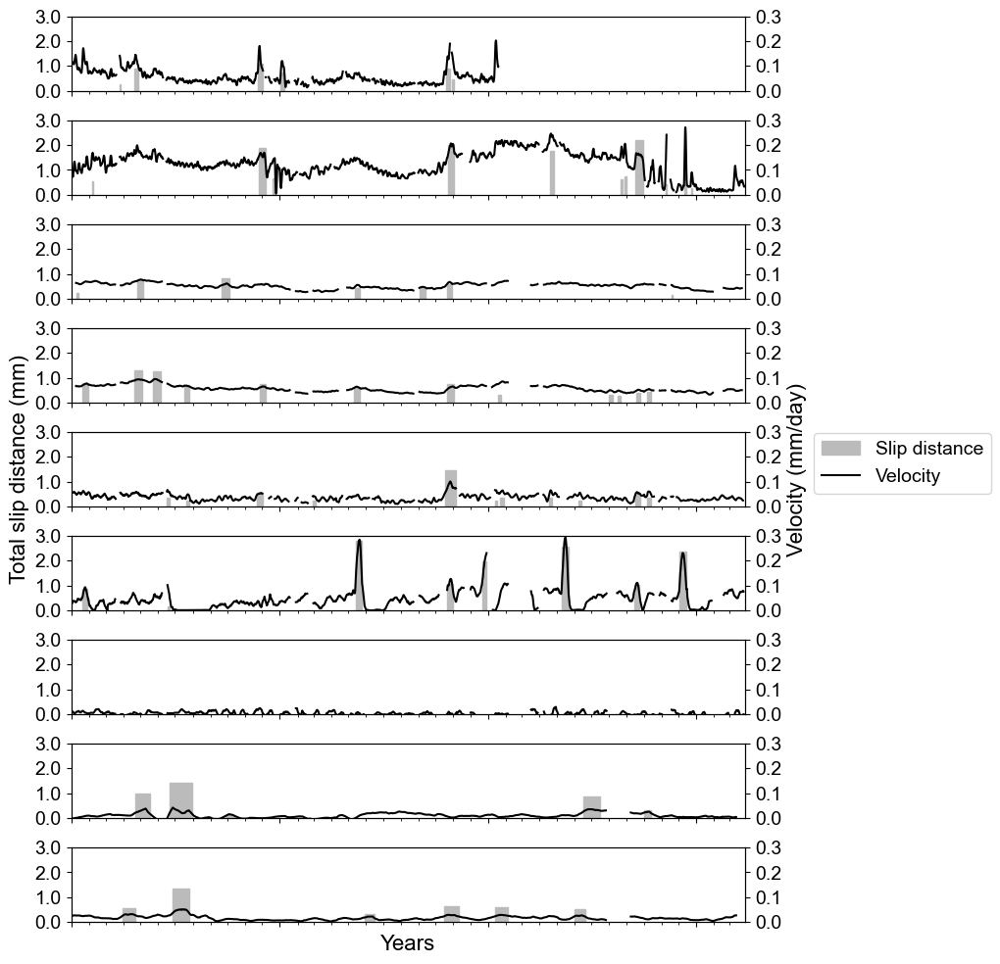

In [3]:
# Figure 7 for paper

n_rows = 9
n_cols = 1
fig, ax = plt.subplots(n_rows, ncols=n_cols, figsize=((11), (12))) # , figsize=((13), (7)) sharex=True
ax_y = [None] * n_rows # make a list for y axis

color_slipdist = colors[-1]
color_velocity = colors[-2]

fig.subplots_adjust(hspace = .4)

# setting start time for plots
start_time = np.datetime64('2020-01-01')
end_time = KH0118Disp.index[-1]
end_time_special = KH0218Disp.index[-1]

col = 2 # velocity
# col = 1 # displacement lowpass filtered


# KH0218
file = KH0218Disp_creep[KH0218Disp_creep['date_start'] > start_time]
alligned_x = []
for i,d in enumerate(file['event']):
    x = file['date_start'][d]+timedelta(hours=(file['duration'][d].astype(float))/2)
    alligned_x.append(x)
ax[0].bar(alligned_x, file['total_slip_distance'], width = file['duration'].values.astype(float)/24, color=color_slipdist, ec=color_slipdist, label='Slip distance', zorder=2)
file =  KH0218Disp[KH0218Disp.index.slice_indexer(start_time,end_time_special)]
ax_y[0] = ax[0].twinx()
ax_y[0].plot(file.index, file.iloc[:,col], color=color_velocity, label='Velocity')
 

# KH0118
file = KH0118Disp_creep[KH0118Disp_creep['date_start'] > start_time]
alligned_x = []
for i,d in enumerate(file['event']):
    x = file['date_start'][d]+timedelta(hours=(file['duration'][d].astype(float))/2) # to start at actual data and not center on it
    alligned_x.append(x)
ax[1].bar(alligned_x, file['total_slip_distance'],  width = file['duration'].astype(float)/24, color=color_slipdist, ec=color_slipdist, label='', zorder=2)
file = KH0118Disp[KH0118Disp.index.slice_indexer(start_time,end_time)]
ax_y[1] = ax[1].twinx()
ax_y[1].plot(file.index, file.iloc[:,col], color=color_velocity, label='')

# KH0217 Upper
file = KH0217DispUpperZone_creep[KH0217DispUpperZone_creep['date_start'] > start_time]
alligned_x = []
for i,d in enumerate(file['event']):
    x = file['date_start'][d]+timedelta(hours=(file['duration'][d].astype(float))/2) # to start at actual data and not center on it
    alligned_x.append(x)
ax[2].bar(alligned_x, file['total_slip_distance'],  width = file['duration'].astype(float)/24, color=color_slipdist, ec=color_slipdist, label='KH-02-17 \nUpper zone', zorder=2)
file = KH0217DispUpperZone[KH0217DispUpperZone.index.slice_indexer(start_time,end_time)]
ax_y[2] = ax[2].twinx()
ax_y[2].plot(file.index, file.iloc[:,col], color=color_velocity, label='')

# KH0217 Lower
file = KH0217DispLowerZone_creep[KH0217DispLowerZone_creep['date_start'] > start_time]
alligned_x = []
for i,d in enumerate(file['event']):
    x = file['date_start'][d]+timedelta(hours=(file['duration'][d].astype(float))/2) # to start at actual data and not center on it
    alligned_x.append(x)
ax[3].bar(alligned_x, file['total_slip_distance'],  width = file['duration'].astype(float)/24, color=color_slipdist, ec=color_slipdist, label='KH-02-17 \nLower zone', zorder=2)
file = KH0217DispLowerZone[KH0217DispLowerZone.index.slice_indexer(start_time,end_time)]
ax_y[3] = ax[3].twinx()
ax_y[3].plot(file.index, file.iloc[:,col], color=color_velocity, label='')


# KH0117
file = KH0117Disp_creep[KH0117Disp_creep['date_start'] > start_time]
alligned_x = []
for i,d in enumerate(file['event']):
    x = file['date_start'][d]+timedelta(hours=(file['duration'][d].astype(float))/2) # to start at actual data and not center on it
    alligned_x.append(x)
ax[4].bar(alligned_x, file['total_slip_distance'],  width = file['duration'].astype(float)/24, color=color_slipdist, ec=color_slipdist, label='KH-01-17', zorder=2)
file = KH0117Disp[KH0117Disp.index.slice_indexer(start_time,end_time)]
ax_y[4] = ax[4].twinx()
ax_y[4].plot(file.index, file.iloc[:,col], color=color_velocity, label='')


# KH0112 Upper
file = KH0112DispUpperZone_creep[KH0112DispUpperZone_creep['date_start'] > start_time]
alligned_x = []
for i,d in enumerate(file['event']):
    x = file['date_start'][d]+timedelta(hours=(file['duration'][d].astype(float))/2) # to start at actual data and not center on it
    alligned_x.append(x)
ax[5].bar(alligned_x, file['total_slip_distance'], width = file['duration'].astype(float)/24, color=color_slipdist, ec=color_slipdist, label='KH-01-12 \nUpper zone', zorder=2)
file = KH0112DispUpperZone[KH0112DispUpperZone.index.slice_indexer(start_time,end_time)]
ax_y[5] = ax[5].twinx()
ax_y[5].plot(file.index, file.iloc[:,col], color=color_velocity, label='')


# KH0112 Lower
file = KH0112DispLowerZone_creep[KH0112DispLowerZone_creep['date_start'] > start_time]
alligned_x = []
for i,d in enumerate(file['event']):
    x = file['date_start'][d]+timedelta(hours=(file['duration'][d].astype(float))/2) # to start at actual data and not center on it
    alligned_x.append(x)
ax[6].bar(alligned_x, file['total_slip_distance'], width = file['duration'].astype(float)/24, color=color_slipdist, ec=color_slipdist, label='KH-01-12 \nLower zone', zorder=2)
file = KH0112DispLowerZone[KH0112DispLowerZone.index.slice_indexer(start_time,end_time)]
ax_y[6] = ax[6].twinx()
ax_y[6].plot(file.index, file.iloc[:,col], color=color_velocity, label='')


# KH0206 Upper
file = KH0206DispUpperZone_creep[KH0206DispUpperZone_creep['date_start'] > start_time]
alligned_x = []
for i,d in enumerate(file['event']):
    x = file['date_start'][d]+timedelta(hours=(file['duration'][d].astype(float))/2) # to start at actual data and not center on it
    alligned_x.append(x)
ax[7].bar(alligned_x, file['total_slip_distance'], width = file['duration'].astype(float)/24, color=color_slipdist, ec=color_slipdist, label='KH-02-06 \nUpper zone', zorder=2) # width /24 due to each point 1 day
file = KH0206DispUpperZone[KH0206DispUpperZone.index.slice_indexer(start_time,end_time)]
ax_y[7] = ax[7].twinx()
ax_y[7].plot(file.index, file.iloc[:,col], color=color_velocity, label='')

    
# KH0206 Lower
file = KH0206DispLowerZone_creep[KH0206DispLowerZone_creep['date_start'] > start_time]
alligned_x = []
for i,d in enumerate(file['event']):
    x = file['date_start'][d]+timedelta(hours=(file['duration'][d].astype(float))/2)
    alligned_x.append(x)
ax[8].bar(alligned_x, file['total_slip_distance'], width = file['duration'].astype(float)/24, color=color_slipdist, ec=color_slipdist, label='KH-02-06 \nLower zone', zorder=2)
file = KH0206DispLowerZone[KH0206DispLowerZone.index.slice_indexer(start_time,end_time)]
ax_y[8] = ax[8].twinx()
ax_y[8].plot(file.index, file.iloc[:,col], color=color_velocity, label='')


for i in range(n_rows):
    # adjusting gridlines
    nticks = 4
    ax[i].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
    ax[i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
    ax_y[i].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
    ax_y[i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))


# ax.set_title('highest number is closest to the top of borehole')
ax[8].set_xlabel('Years')
ax[4].set_ylabel('Total slip distance (mm)')
ax_y[4].set_ylabel('Velocity (mm/day)')


# creating similar y-axes
# setting y limits y-axis left (slip distance)

for i in range(n_rows):
    ymax = 0
    ymi, yma = ax[i].get_ylim()
    yma = math.ceil(yma)
    if yma > ymax:
        ymax = yma
ymin = 0
for i in range(n_rows):
    ax[i].set_ylim([ymin, 3])
    ax[i].set_xlim([start_time, end_time])

# setting y limits second left y-axis (velocity)
for i in range(n_rows):
    ymax = 0
    ymi, yma = ax_y[i].get_ylim()
#     yma = math.ceil(yma)
    if yma > ymax:
        ymax = yma
ymin = 0
for i in range(n_rows):
    ax_y[i].set_ylim([ymin, 0.3])


# # # one legend
# for i in range(n_rows):
#     box = ax[i].get_position()
#     ax[i].set_position([box.x0, box.y0, box.width * 0.8, box.height]) # shrinking axes to accomodate legend

fig.subplots_adjust(right=0.75) 
handles, labels = [(a + b) for a, b in zip(ax[0].get_legend_handles_labels(), ax_y[0].get_legend_handles_labels())]
leg = fig.legend(handles, labels, loc = 'center left', ncol=1, bbox_to_anchor=(.805,.5)) # center of fig


# removing tick labels from the xaxis
for i in range(n_rows):
    ax[i].xaxis.set_tick_params(labelbottom=False)

# removing tick labels from the xaxis
for i in range(n_rows-1):

    # Ensure the first year is included
    start_year = KH0218Disp.index.min().year
    end_year = KH0117Disp.index.max()
    ax[i].set_xlim(mdates.date2num([f'{start_year}-01-01', f'{end_year}']))

    # Major ticks for years
    years = mdates.YearLocator()   # Locator for every year
    years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
    ax[i].xaxis.set_major_locator(years)
    ax[i].xaxis.set_major_formatter(years_fmt)

    # Minor ticks for months
    months = mdates.MonthLocator()   # Locator for every month
    months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
    ax[i].xaxis.set_minor_locator(months)
    # Apply the year format for the major ticks again
    ax[i].xaxis.set_major_formatter(years_fmt)
    ax[i].set(xticklabels=[])

# Ensure the first year is included
start_year = KH0218Disp.index.min().year
end_year = KH0117Disp.index.max()
ax[n_rows-1].set_xlim(mdates.date2num([f'{start_year}-01-01', f'{end_year}']))

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax[n_rows-1].xaxis.set_major_locator(years)
ax[n_rows-1].xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax[n_rows-1].xaxis.set_minor_locator(months)
# Apply the year format for the major ticks again
ax[n_rows-1].xaxis.set_major_formatter(years_fmt)


# fig.tight_layout()
plt.show()

# saving
path = 'plots\\'
save_name = f'{path}Figure4.png'
fig.savefig(save_name, dpi=600)

C:\Users\andregas\AppData\Local\Temp\ipykernel_27664\3308920553.py:30: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax.append(plt.subplot(gs[i, 0]))


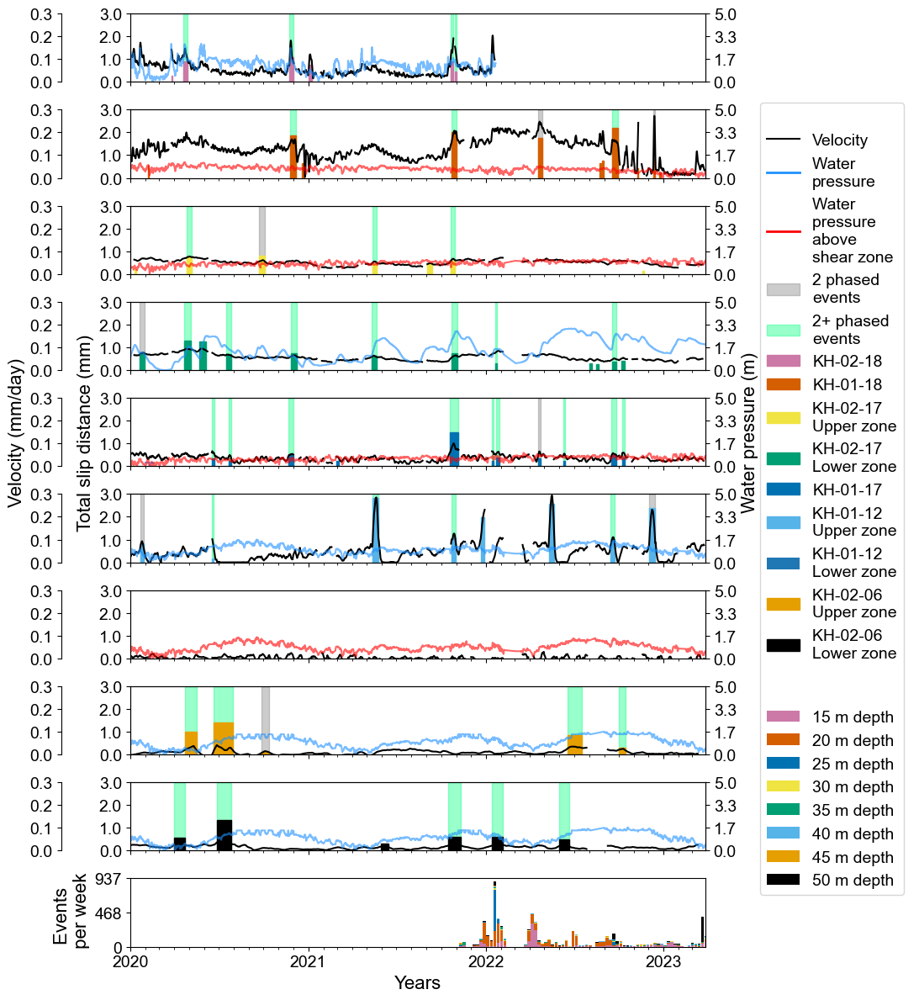

In [4]:
# total slip distance vs time + water pressure!

# to remove ax from right side and show it on the left side
def yax_left_side(ax):
    ax.set_frame_on(True)
    ax.patch.set_visible(False)
    for sp in ax.spines.values():
        sp.set_visible(False)
    ax.spines["left"].set_position(("axes", spacing))
    ax.yaxis.tick_left()
    ax.yaxis.set_label_position("left")
    
n_rows = 10
n_cols = 1
fig, ax = plt.subplots(n_rows, ncols=n_cols, sharex=True, figsize=((11), (12))) # , figsize=((13), (7))

spacing = -0.12 # spacing for left y-axis
color_water = 'dodgerblue'
color_water_shearzone = 'red'
color_velocity = 'black'

# Create a gridspec layout with 2 rows and 2 columns
import matplotlib.gridspec as gridspec
gs = gridspec.GridSpec(n_rows, 2, width_ratios=[0.8, 0.2])

ax = []
ax_y = []
ax_yy = []
for i in range(n_rows):
    ax.append(plt.subplot(gs[i, 0]))
for i in range(n_rows-1):
    ax_y.append(ax[i].twinx())
    ax_yy.append(ax[i].twinx())

# setting start time for plots
start_time = np.datetime64('2020-01-01')
end_time = KH0118Disp.index[-1]
end_time_special = KH0218Disp.index[-1]

col = 2 # velocity
# col = 1 # displacement lowpass filtered

# # legend
# ax_yy[0].plot(file.index, file.values+100, color=color_water, zorder=0, alpha=0.6, label='Water \npressure')
# ax_yy[0].plot(wp_inplane.index, wp_inplane.values+100, color=color_water_shearzone, zorder=1, alpha=0.6, label='Water \npressure \nin shear plane')

# KH0218
file = KH0218Disp_creep[KH0218Disp_creep['date_start'] > start_time]
alligned_x = []
for i,d in enumerate(file['event']):
    x = file['date_start'][d]+timedelta(hours=(file['duration'][d].astype(float))/2)
    alligned_x.append(x)
ax[0].bar(alligned_x, file['total_slip_distance'], width = file['duration'].values.astype(float)/24, color=colors[0], ec=colors[0], label='KH-02-18', zorder=2)
file =  KH0218Disp[KH0218Disp.index.slice_indexer(start_time,end_time_special)]
ax_y[0].plot(file.index, file.iloc[:,col], color=color_velocity, label='Velocity')
yax_left_side(ax_y[0])
ax_y[0].spines["left"].set_visible(True) # Second, show the right spine
# adding water pressure
file = KH0218Piez_raw.copy()
file =  file[file.index.slice_indexer(start_time,end_time_special)]
file = file['Mod134_Water pressure [m]:']
# ax_yy[0].plot(file.index, file.values-np.nanmin(file.values), color=color_water, zorder=0, alpha=0.6, label='Water \npressure')
file = KH0218Piez_raw.copy()
file =  file[file.index.slice_indexer(start_time,end_time_special)]
wp_inplane = file.loc[file['Mod134_Water pressure in shear zone [kPa]:'] > 0]['Mod134_Water pressure [m]:'] # only when pressure in shear zone
wp_not_inplane = file.loc[file['Mod134_Water pressure in shear zone [kPa]:'] == 0]['Mod134_Water pressure [m]:'] # only when water level is not in shear zone
if wp_not_inplane.empty == False:
    ax_yy[0].plot(wp_not_inplane.index, wp_not_inplane.values-np.nanmin(wp_not_inplane.values), color=color_water, zorder=1, alpha=0.6, label='')
if wp_inplane.empty == False:
    ax_yy[0].plot(wp_inplane.index, wp_inplane.values-np.nanmin(wp_inplane.values), color=color_water_shearzone, zorder=1, alpha=0.6, label='')
    
# legend
# legend
ax_yy[0].plot(file.index, file.values+100, color=color_water, zorder=0, alpha=0.6, label='Water \npressure')
ax_yy[0].plot(wp_inplane.index, wp_inplane.values+100, color=color_water_shearzone, zorder=1, alpha=0.6, label='Water \npressure \nin shear plane')

# KH0118
file = KH0118Disp_creep[KH0118Disp_creep['date_start'] > start_time]
alligned_x = []
for i,d in enumerate(file['event']):
    x = file['date_start'][d]+timedelta(hours=(file['duration'][d].astype(float))/2) # to start at actual data and not center on it
    alligned_x.append(x)
ax[1].bar(alligned_x, file['total_slip_distance'],  width = file['duration'].astype(float)/24, color=colors[1], ec=colors[1], label='KH-01-18', zorder=2)
file = KH0118Disp[KH0118Disp.index.slice_indexer(start_time,end_time)]
ax_y[1].plot(file.index, file.iloc[:,col], color=color_velocity, label='')
yax_left_side(ax_y[1])
ax_y[1].spines["left"].set_visible(True)
# adding water pressure
file = KH0118Piez_raw.copy()
file =  file[file.index.slice_indexer(start_time,end_time)]
file = file['Mod63_Water pressure [m]:'] # used Mod82 before but above shear zone, 63 is in the shear zone, 53 is below shear zone
# ax_yy[1].plot(file.index, file.values-np.nanmin(file.values), color=color_water, zorder=0, alpha=0.6, label='')
file = KH0118Piez_raw.copy()
file =  file[file.index.slice_indexer(start_time,end_time)]
wp_inplane = file.loc[file['Mod63_Water pressure in shear zone [kPa]:'] > 0]['Mod63_Water pressure [m]:'] # only when pressure in shear zone
wp_not_inplane = file.loc[file['Mod63_Water pressure in shear zone [kPa]:'] == 0]['Mod63_Water pressure [m]:'] # only when water level is not in shear zone
if wp_not_inplane.empty == False:
    ax_yy[1].plot(wp_not_inplane.index, wp_not_inplane.values-np.nanmin(wp_not_inplane.values), color=color_water, zorder=1, alpha=0.6, label='')
if wp_inplane.empty == False:
    ax_yy[1].plot(wp_inplane.index, wp_inplane.values-np.nanmin(wp_inplane.values), color=color_water_shearzone, zorder=1, alpha=0.6, label='')

# KH0217 Upper
file = KH0217DispUpperZone_creep[KH0217DispUpperZone_creep['date_start'] > start_time]
alligned_x = []
for i,d in enumerate(file['event']):
    x = file['date_start'][d]+timedelta(hours=(file['duration'][d].astype(float))/2) # to start at actual data and not center on it
    alligned_x.append(x)
ax[2].bar(alligned_x, file['total_slip_distance'],  width = file['duration'].astype(float)/24, color=colors[3], ec=colors[3], label='KH-02-17 \nUpper zone', zorder=2)
file = KH0217DispUpperZone[KH0217DispUpperZone.index.slice_indexer(start_time,end_time)]
ax_y[2].plot(file.index, file.iloc[:,col], color=color_velocity, label='')
yax_left_side(ax_y[2])
ax_y[2].spines["left"].set_visible(True)
# adding water pressure
file = KH0217PiezUpperZone_raw.copy()
file =  file[file.index.slice_indexer(start_time,end_time)]
file = file['Mod98_Water pressure [m]:']  # It used to be Mod52, but changed so that it measures in shear zone
# ax_yy[2].plot(file.index, file.values-np.nanmin(file.values), color=color_water, zorder=0, alpha=0.6, label='')
file = KH0217PiezUpperZone_raw.copy()
file =  file[file.index.slice_indexer(start_time,end_time)]
wp_inplane = file.loc[file['Mod98_Water pressure in shear zone [kPa]:'] > 0]['Mod98_Water pressure [m]:'] # only when pressure in shear zone
wp_not_inplane = file.loc[file['Mod98_Water pressure in shear zone [kPa]:'] == 0]['Mod98_Water pressure [m]:'] # only when water level is not in shear zone
if wp_not_inplane.empty == False:
    ax_yy[2].plot(wp_not_inplane.index, wp_not_inplane.values-np.nanmin(wp_not_inplane.values), color=color_water, zorder=1, alpha=0.6, label='')
if wp_inplane.empty == False:
    ax_yy[2].plot(wp_inplane.index, wp_inplane.values-np.nanmin(wp_inplane.values), color=color_water_shearzone, zorder=1, alpha=0.6, label='')

# KH0217 Lower
file = KH0217DispLowerZone_creep[KH0217DispLowerZone_creep['date_start'] > start_time]
alligned_x = []
for i,d in enumerate(file['event']):
    x = file['date_start'][d]+timedelta(hours=(file['duration'][d].astype(float))/2) # to start at actual data and not center on it
    alligned_x.append(x)
ax[3].bar(alligned_x, file['total_slip_distance'],  width = file['duration'].astype(float)/24, color=colors[4], ec=colors[4], label='KH-02-17 \nLower zone', zorder=2)
file = KH0217DispLowerZone[KH0217DispLowerZone.index.slice_indexer(start_time,end_time)]
ax_y[3].plot(file.index, file.iloc[:,col], color=color_velocity, label='')
yax_left_side(ax_y[3])
ax_y[3].spines["left"].set_visible(True)
# adding water pressure
file = KH0217PiezLowerZone.copy()
file = file[file.index.slice_indexer(start_time,end_time)]
file = file['Mod52_Water pressure [m]:']
# ax_yy[3].plot(file.index, file.values-np.nanmin(file.values), color=color_water, zorder=0, alpha=0.6, label='')
file = KH0217PiezLowerZone_raw.copy()
file =  file[file.index.slice_indexer(start_time,end_time)]
wp_inplane = file.loc[file['Mod52_Water pressure in shear zone [kPa]:'] > 0]['Mod52_Water pressure [m]:'] # only when pressure in shear zone
wp_not_inplane = file.loc[file['Mod52_Water pressure in shear zone [kPa]:'] == 0]['Mod52_Water pressure [m]:'] # only when water level is not in shear zone
if wp_not_inplane.empty == False:
    ax_yy[3].plot(wp_not_inplane.index, wp_not_inplane.values-np.nanmin(wp_not_inplane.values), color=color_water, zorder=1, alpha=0.6, label='')
if wp_inplane.empty == False:
    ax_yy[3].plot(wp_inplane.index, wp_inplane.values-np.nanmin(wp_inplane.values), color=color_water_shearzone, zorder=1, alpha=0.6, label='')


# KH0117
file = KH0117Disp_creep[KH0117Disp_creep['date_start'] > start_time]
alligned_x = []
for i,d in enumerate(file['event']):
    x = file['date_start'][d]+timedelta(hours=(file['duration'][d].astype(float))/2) # to start at actual data and not center on it
    alligned_x.append(x)
ax[4].bar(alligned_x, file['total_slip_distance'],  width = file['duration'].astype(float)/24, color=colors[2], ec=colors[2], label='KH-01-17', zorder=2)
file = KH0117Disp[KH0117Disp.index.slice_indexer(start_time,end_time)]
ax_y[4].plot(file.index, file.iloc[:,col], color=color_velocity, label='')
yax_left_side(ax_y[4])
ax_y[4].spines["left"].set_visible(True)
# adding water pressure
file = KH0117Piez_raw.copy()
file =  file[file.index.slice_indexer(start_time,end_time)]
file = file['Mod69_Water pressure [m]:'] # Mod56 before. 69 is in shear zone, Mod56 next below shear zone, 75 is above
# ax_yy[4].plot(file.index, file.values-np.nanmin(file.values), color=color_water, zorder=0, alpha=0.6, label='') # using file.values-np.nanmin(file.values)-6.5 to removing the big down ward movements to make the relative change easier to see
# file = file['Mod69_Water pressure [m]:'] # Mod56 before. 69 is in shear zone, Mod56 next below shear zone, 75 is above
# ax_yy[4].plot(file.index, file.values-np.nanmin(file.values), color=color_water, zorder=1, alpha=0.6, label='')
file = KH0117Piez_raw.copy()
file =  file[file.index.slice_indexer(start_time,end_time)]
wp_inplane = file.loc[file['Mod69_Water pressure in shear zone [kPa]:'] > 0]['Mod69_Water pressure [m]:'] # only when pressure in shear zone
wp_not_inplane = file.loc[file['Mod69_Water pressure in shear zone [kPa]:'] == 0]['Mod69_Water pressure [m]:'] # only when water level is not in shear zone
if wp_not_inplane.empty == False:
    ax_yy[4].plot(wp_not_inplane.index, wp_not_inplane.values-np.nanmin(wp_not_inplane.values), color=color_water, zorder=1, alpha=0.6, label='')
if wp_inplane.empty == False:
    ax_yy[4].plot(wp_inplane.index, wp_inplane.values-np.nanmin(wp_inplane.values), color=color_water_shearzone, zorder=1, alpha=0.6, label='')


# KH0112 Upper
file = KH0112DispUpperZone_creep[KH0112DispUpperZone_creep['date_start'] > start_time]
alligned_x = []
for i,d in enumerate(file['event']):
    x = file['date_start'][d]+timedelta(hours=(file['duration'][d].astype(float))/2) # to start at actual data and not center on it
    alligned_x.append(x)
ax[5].bar(alligned_x, file['total_slip_distance'], width = file['duration'].astype(float)/24, color=colors[5], ec=colors[5], label='KH-01-12 \nUpper zone', zorder=2)
file = KH0112DispUpperZone[KH0112DispUpperZone.index.slice_indexer(start_time,end_time)]
ax_y[5].plot(file.index, file.iloc[:,col], color=color_velocity, label='')
yax_left_side(ax_y[5])
ax_y[5].spines["left"].set_visible(True)
# adding water pressure
file = KH0112PiezUpperZone.copy()
file =  file[file.index.slice_indexer(start_time,end_time)]
file = file['Mod30_Water pressure [m]:']
# ax_yy[5].plot(file.index, file.values-np.nanmin(file.values), color=color_water, zorder=0, alpha=0.6, label='')
file = KH0112PiezUpperZone_raw.copy()
file =  file[file.index.slice_indexer(start_time,end_time)]
wp_inplane = file.loc[file['Mod30_Water pressure in shear zone [kPa]:'] > 0]['Mod30_Water pressure [m]:'] # only when pressure in shear zone
wp_not_inplane = file.loc[file['Mod30_Water pressure in shear zone [kPa]:'] == 0]['Mod30_Water pressure [m]:'] # only when water level is not in shear zone
if wp_not_inplane.empty == False:
    ax_yy[5].plot(wp_not_inplane.index, wp_not_inplane.values-np.nanmin(wp_not_inplane.values), color=color_water, zorder=1, alpha=0.6, label='')
if wp_inplane.empty == False:
    ax_yy[5].plot(wp_inplane.index, wp_inplane.values-np.nanmin(wp_inplane.values), color=color_water_shearzone, zorder=1, alpha=0.6, label='')

# KH0112 Lower
file = KH0112DispLowerZone_creep[KH0112DispLowerZone_creep['date_start'] > start_time]
alligned_x = []
for i,d in enumerate(file['event']):
    x = file['date_start'][d]+timedelta(hours=(file['duration'][d].astype(float))/2) # to start at actual data and not center on it
    alligned_x.append(x)
ax[6].bar(alligned_x, file['total_slip_distance'], width = file['duration'].astype(float)/24, color=colors[8], ec=colors[8], label='KH-01-12 \nLower zone', zorder=2)
file = KH0112DispLowerZone[KH0112DispLowerZone.index.slice_indexer(start_time,end_time)]
ax_y[6].plot(file.index, file.iloc[:,col], color=color_velocity, label='')
yax_left_side(ax_y[6])
ax_y[6].spines["left"].set_visible(True)
# adding water pressure
file = KH0112PiezLowerZone.copy()
file =  file[file.index.slice_indexer(start_time,end_time)]
file = file['Mod30_Water pressure [m]:']
# ax_yy[6].plot(file.index, file.values-np.nanmin(file.values), color=color_water, zorder=0, alpha=0.6, label='')
file = KH0112PiezLowerZone_raw.copy()
file =  file[file.index.slice_indexer(start_time,end_time)]
wp_inplane = file.loc[file['Mod30_Water pressure in shear zone [kPa]:'] > 0]['Mod30_Water pressure [m]:'] # only when pressure in shear zone
wp_not_inplane = file.loc[file['Mod30_Water pressure in shear zone [kPa]:'] == 0]['Mod30_Water pressure [m]:'] # only when water level is not in shear zone
if wp_not_inplane.empty == False:
    ax_yy[6].plot(wp_not_inplane.index, wp_not_inplane.values-np.nanmin(wp_not_inplane.values), color=color_water, zorder=1, alpha=0.6, label='')
if wp_inplane.empty == False:
    ax_yy[6].plot(wp_inplane.index, wp_inplane.values-np.nanmin(wp_inplane.values), color=color_water_shearzone, zorder=1, alpha=0.6, label='')

# KH0206 Upper
file = KH0206DispUpperZone_creep[KH0206DispUpperZone_creep['date_start'] > start_time]
alligned_x = []
for i,d in enumerate(file['event']):
    x = file['date_start'][d]+timedelta(hours=(file['duration'][d].astype(float))/2) # to start at actual data and not center on it
    alligned_x.append(x)
ax[7].bar(alligned_x, file['total_slip_distance'], width = file['duration'].astype(float)/24, color=colors[6], ec=colors[6], label='KH-02-06 \nUpper zone', zorder=2) # width /24 due to each point 1 day
file = KH0206DispUpperZone[KH0206DispUpperZone.index.slice_indexer(start_time,end_time)]
ax_y[7].plot(file.index, file.iloc[:,col], color=color_velocity, label='')
yax_left_side(ax_y[7])
ax_y[7].spines["left"].set_visible(True)
# adding water pressure
file = KH0206PiezUpperZone.copy()
file =  file[file.index.slice_indexer(start_time,end_time)]
file = file['Mod35_Water pressure [m]:']
# ax_yy[7].plot(file.index, file.values-np.nanmin(file.values), color=color_water, zorder=0, alpha=0.6, label='')
file = KH0206PiezUpperZone_raw.copy()
file =  file[file.index.slice_indexer(start_time,end_time)]
wp_inplane = file.loc[file['Mod35_Water pressure in shear zone [kPa]:'] > 0]['Mod35_Water pressure [m]:'] # only when pressure in shear zone
wp_not_inplane = file.loc[file['Mod35_Water pressure in shear zone [kPa]:'] == 0]['Mod35_Water pressure [m]:'] # only when water level is not in shear zone
if wp_not_inplane.empty == False:
    ax_yy[7].plot(wp_not_inplane.index, wp_not_inplane.values-np.nanmin(wp_not_inplane.values), color=color_water, zorder=1, alpha=0.6, label='')
if wp_inplane.empty == False:
    ax_yy[7].plot(wp_inplane.index, wp_inplane.values-np.nanmin(wp_inplane.values), color=color_water_shearzone, zorder=1, alpha=0.6, label='')
    
# KH0206 Lower
file = KH0206DispLowerZone_creep[KH0206DispLowerZone_creep['date_start'] > start_time]
alligned_x = []
for i,d in enumerate(file['event']):
    x = file['date_start'][d]+timedelta(hours=(file['duration'][d].astype(float))/2)
    alligned_x.append(x)
ax[8].bar(alligned_x, file['total_slip_distance'], width = file['duration'].astype(float)/24, color=colors[7], ec=colors[7], label='KH-02-06 \nLower zone', zorder=2)
file = KH0206DispLowerZone[KH0206DispLowerZone.index.slice_indexer(start_time,end_time)]
ax_y[8].plot(file.index, file.iloc[:,col], color=color_velocity, label='')
yax_left_side(ax_y[8])
ax_y[8].spines["left"].set_visible(True)
# adding water pressure
file = KH0206PiezLowerZone.copy()
file =  file[file.index.slice_indexer(start_time,end_time)]
file = file['Mod35_Water pressure [m]:']
# ax_yy[8].plot(file.index, file.values-np.nanmin(file.values), color=color_water, zorder=0, alpha=0.6, label='')
file = KH0206PiezLowerZone_raw.copy()
file =  file[file.index.slice_indexer(start_time,end_time)]
wp_inplane = file.loc[file['Mod35_Water pressure in shear zone [kPa]:'] > 0]['Mod35_Water pressure [m]:'] # only when pressure in shear zone
wp_not_inplane = file.loc[file['Mod35_Water pressure in shear zone [kPa]:'] == 0]['Mod35_Water pressure [m]:'] # only when water level is not in shear zone
if wp_not_inplane.empty == False:
    ax_yy[8].plot(wp_not_inplane.index, wp_not_inplane.values-np.nanmin(wp_not_inplane.values), color=color_water, zorder=1, alpha=0.6, label='')
if wp_inplane.empty == False:
    ax_yy[8].plot(wp_inplane.index, wp_inplane.values-np.nanmin(wp_inplane.values), color=color_water_shearzone, zorder=1, alpha=0.6, label='')


# highlighting creep bursts that are coinciding

# coloring
two = 'gray'
multi = 'springgreen'

file = KH0218Disp_creep.copy()
ax[0].axvspan(file.date_start[1], file.date_end[1], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[0].axvspan(file.date_start[2], file.date_end[2], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[0].axvspan(file.date_start[4], file.date_end[4], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[0].axvspan(file.date_start[5], file.date_end[5], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4) # number 5 due to missing velocity for a short time..
# file = KH0117Disp_creep.copy() # because to late in time series to detect
# ax[0].axvspan(file.date_start[7], file.date_end[7], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)

file = KH0118Disp_creep.copy()
ax[1].axvspan(file.date_start[1], file.date_end[1], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[1].axvspan(file.date_start[3], file.date_end[3], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[1].axvspan(file.date_start[4], file.date_end[4], facecolor=two, edgecolor=two, label='', zorder=1, alpha=0.4)
ax[1].axvspan(file.date_start[7], file.date_end[7], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[1].axvspan(file.date_start[9], file.date_end[9], facecolor=two, edgecolor=two, label='', zorder=1, alpha=0.4)
# file = KH0117Disp_creep.copy() # To poor detection
# ax[1].axvspan(file.date_start[7], file.date_end[7], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)

file = KH0217DispUpperZone_creep.copy()
ax[2].axvspan(file.date_start[3], file.date_end[3], facecolor=two, edgecolor=two, label='', zorder=1, alpha=0.4)
ax[2].axvspan(file.date_start[5], file.date_end[5], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[2].axvspan(file.date_start[6], file.date_end[6], facecolor=two, edgecolor=two, label='', zorder=1, alpha=0.4)
ax[2].axvspan(file.date_start[7], file.date_end[7], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[2].axvspan(file.date_start[9], file.date_end[9], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)

file = KH0217DispLowerZone_creep.copy()
ax[3].axvspan(file.date_start[0], file.date_end[0], facecolor=two, edgecolor=two, label='', zorder=1, alpha=0.4)
ax[3].axvspan(file.date_start[1], file.date_end[1], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[3].axvspan(file.date_start[2], file.date_end[2], facecolor=two, edgecolor=two, label='', zorder=1, alpha=0.4)
ax[3].axvspan(file.date_start[3], file.date_end[3], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[3].axvspan(file.date_start[5], file.date_end[5], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[3].axvspan(file.date_start[6], file.date_end[6], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[3].axvspan(file.date_start[7], file.date_end[7], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[3].axvspan(file.date_start[8], file.date_end[8], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[3].axvspan(file.date_start[9], file.date_end[9], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[3].axvspan(file.date_start[12], file.date_end[12], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)

file = KH0117Disp_creep.copy()
ax[4].axvspan(file.date_start[0], file.date_end[0], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[4].axvspan(file.date_start[1], file.date_end[1], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[4].axvspan(file.date_start[2], file.date_end[2], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[4].axvspan(file.date_start[4], file.date_end[4], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[4].axvspan(file.date_start[5], file.date_end[5], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[4].axvspan(file.date_start[6], file.date_end[6], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[4].axvspan(file.date_start[7], file.date_end[7], facecolor=two, edgecolor=two, label='', zorder=1, alpha=0.4)
ax[4].axvspan(file.date_start[8], file.date_end[8], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[4].axvspan(file.date_start[9], file.date_end[9], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[4].axvspan(file.date_start[10], file.date_end[10], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)

file = KH0112DispUpperZone_creep.copy()
ax[5].axvspan(file.date_start[3], file.date_end[3], facecolor=two, edgecolor=two, label='', zorder=1, alpha=0.4)
ax[5].axvspan(file.date_start[4], file.date_end[4], facecolor=two, edgecolor=two, label='', zorder=1, alpha=0.4)
ax[5].axvspan(file.date_start[5], file.date_end[5], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[5].axvspan(file.date_start[6], file.date_end[6], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[5].axvspan(file.date_start[7], file.date_end[7], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[5].axvspan(file.date_start[10], file.date_end[10], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[5].axvspan(file.date_start[11], file.date_end[11], facecolor=two, edgecolor=two, label='', zorder=1, alpha=0.4)

file = KH0112DispLowerZone_creep.copy()
ax[6].axvspan(file.date_start[7], file.date_end[7], facecolor=two, edgecolor=two, label='', zorder=1, alpha=0.4)

file = KH0206DispUpperZone_creep.copy()
ax[7].axvspan(file.date_start[1], file.date_end[1], facecolor=two, edgecolor=two, label='2 phased \nevents', zorder=1, alpha=0.4)
ax[7].axvspan(file.date_start[2], file.date_end[2], facecolor=multi, edgecolor=multi, label='2+ phased \nevents', zorder=1, alpha=0.4)
ax[7].axvspan(file.date_start[4], file.date_end[4], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[7].axvspan(file.date_start[5], file.date_end[5], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[7].axvspan(file.date_start[6], file.date_end[6], facecolor=two, edgecolor=two, label='', zorder=1, alpha=0.4)
ax[7].axvspan(file.date_start[7], file.date_end[7], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[7].axvspan(file.date_start[8], file.date_end[8], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)

file = KH0206DispLowerZone_creep.copy()
ax[8].axvspan(file.date_start[7], file.date_end[7], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[8].axvspan(file.date_start[8], file.date_end[8], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[8].axvspan(file.date_start[10], file.date_end[10], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[8].axvspan(file.date_start[11], file.date_end[11], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)
ax[8].axvspan(file.date_start[12], file.date_end[12], facecolor=multi, edgecolor=multi, label='', zorder=1, alpha=0.4)

### Adding seismics
seismicity_sub =  seismicity_bh_class
seismicity_sub = seismicity_sub.resample('1W').sum()
# seismicity_sub =  seismicity_sub[seismicity_sub.index.slice_indexer(start_time,end_time)]

ini = np.zeros(len(seismicity_sub),dtype=int)
for i, CL in enumerate(seismicity_sub.columns):
    nEvents = seismicity_sub.loc[:,CL].values
    ax[9].bar(dates.date2num(seismicity_sub.index), nEvents, alpha=1.0, align='edge', width=6, label=CL, bottom=ini, linewidth=0, color=colors[i]) # pd.Timedelta(days=7)
    ini = ini + nEvents

# setting time for this axis
ax[9].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))

miny,maxy = ax[9].get_ylim()

# # available data
# df = seismicity_bh_availability.copy()
# zero_start = mpl.dates.date2num(start_time)
# for i,d in enumerate(df.iloc[:,0]):
#     xmin = (mpl.dates.date2num(df.iloc[i,0])-zero_start)/(mpl.dates.date2num(end_time)-zero_start)
#     xmax = (mpl.dates.date2num(df.iloc[i,1])-zero_start)/(mpl.dates.date2num(end_time)-zero_start)
#     ax[9].axhspan(ymin=-maxy/40, ymax=-5, xmin=xmin, xmax=xmax, facecolor='deepskyblue', edgecolor='deepskyblue', label='Missing data') # ', edgecolor='gray', label='Missing data'
# # black outer edge
#     xmin = (mpl.dates.date2num(df.iloc[0,0])-zero_start)/(mpl.dates.date2num(end_time)-zero_start)
# xmax = (mpl.dates.date2num(df.iloc[-1,1])-zero_start)/(mpl.dates.date2num(end_time)-zero_start)
# # ax.axhspan(ymin=-maxy/40, ymax=-5, xmin=xmin, xmax=xmax, facecolor='None', edgecolor='black', label='') # only since start of seismic dataset
# ax[9].axhspan(ymin=-maxy/40, ymax=-5, xmin=0, xmax=1, facecolor='None', edgecolor='black', label='') # if entire range
# ax[9].set_ylim((-maxy/40)-1.5,maxy)
# # ax[9].set_ylim((-maxy/40)-1.5,maxy)

###
n_rows = n_rows-1 # quickfix

for i in range(n_rows):
    # adjusting gridlines
    nticks = 4
    ax[i].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
    ax[i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
    ax_y[i].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
    ax_y[i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
    ax_yy[i].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
    ax_yy[i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))


# ax.set_title('highest number is closest to the top of borehole')
ax[9].set_xlabel('Years')
ax[4].set_ylabel('Total slip distance (mm)')
ax_y[4].set_ylabel('Velocity (mm/day)')
ax_yy[4].set_ylabel('Water pressure (m)')

# creating similar y-axes
# setting y limits y-axis left (slip distance)

for i in range(n_rows):
    ymax = 0
    ymi, yma = ax[i].get_ylim()
    yma = math.ceil(yma)
    if yma > ymax:
        ymax = yma
ymin = 0
for i in range(n_rows):
    ax[i].set_ylim([ymin, 3])
    ax[i].set_xlim([start_time, end_time])

# setting y limits second left y-axis (velocity)
for i in range(n_rows):
    ymax = 0
    ymi, yma = ax_y[i].get_ylim()
#     yma = math.ceil(yma)
    if yma > ymax:
        ymax = yma
ymin = 0
for i in range(n_rows):
    ax_y[i].set_ylim([ymin, 0.3])

# setting y limits right y-axis (water pressure)
for i in range(n_rows):
    ymax = 0
    ymi, yma = ax_yy[i].get_ylim() # this did not work nice for the twinx
    yma = math.ceil(yma)
    if yma > ymax:
        ymax = yma
ymin = 0
for i in range(n_rows):
    ax_yy[i].set_ylim([ymin, 5]) # setting manually, 5 for mod53 kh0117 and 3.3 if mod69

# Fixing seismic data plot
nticks = 3
ax[9].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[9].yaxis.set_major_formatter(FormatStrFormatter('%1.f'))
# ymi, yma = ax[9].get_ylim() # fixing this higher up
# ax[9].set_ylim([0, 900]) # 1800
ax[9].set_ylabel('Events \n per week')

# # titles
# ax[0].title.set_text('KH-02-18')
# ax[1].title.set_text('KH-01-18')
# ax[2].title.set_text('KH-02-17 Upper zone')
# ax[3].title.set_text('KH-02-17 Lower zone')
# ax[4].title.set_text('KH-01-17')
# ax[5].title.set_text('KH-01-12 Upper zone')
# ax[6].title.set_text('KH-01-12 Lower zone')
# ax[7].title.set_text('KH-02-06 Upper zone')
# ax[8].title.set_text('KH-02-06 Lower zone')

# one legend
from matplotlib.patches import Rectangle

title1 = '$\\bf{}$'
title2 = '\n$\\bf{}$'

# # legend
# ax_yy[0].plot(file.index, file.values+100, color=color_water, zorder=0, alpha=0.6, label='Water \npressure')
# ax_yy[0].plot(wp_inplane.index, wp_inplane.values+100, color=color_water_shearzone, zorder=1, alpha=0.6, label='Water \npressure \nin shear plane')

from matplotlib.lines import Line2D
# lines, labels = ax_yy[0].get_legend_handles_labels()
# labels = unique(labels)
water = ([Line2D([0], [0], color=color_water, lw=2)],['Water \npressure'])
water_shear_zone = ([Line2D([0], [0], color=color_water_shearzone, lw=2)],['Water \npressure \nabove \nshear zone'])

handles, labels = [(a + b + c + d + e + f + g + h + i + j + k + l + m + n + o) for a, b, c, d, e, f, g, h, i, j, k, l, m, n, o in zip(
    ([Rectangle((0,0), 0, 0, color='w')],[title1]),
    ax_y[0].get_legend_handles_labels(), water, water_shear_zone, ax[0].get_legend_handles_labels(), ax[1].get_legend_handles_labels(), ax[2].get_legend_handles_labels(),ax[3].get_legend_handles_labels(),
    ax[4].get_legend_handles_labels(), ax[5].get_legend_handles_labels(), ax[6].get_legend_handles_labels(), ax[7].get_legend_handles_labels(), ax[8].get_legend_handles_labels(),
    ([Rectangle((0,0), 0, 0, color='w')],[title2]), ax[9].get_legend_handles_labels())]
order = [0,1,2,3, 11,12, 4,5,6,7,8,9,10, 13,14, 15,16,17,18,19,20,21,22,23] # set order of legend


# fig.subplots_adjust(wspace=-0.45)
leg = fig.legend([handles[idx] for idx in order], [labels[idx] for idx in order], loc = (0.827, 0.105)) # needs to shrink plot to accomodate figure
               
# Modifying the last 8 legend labels
new_labels = ['15 m depth','20 m depth','25 m depth','30 m depth','35 m depth','40 m depth','45 m depth','50 m depth']

# Updating the legend labels
for i in range(-8, 0):
    leg.texts[i].set_text(new_labels[i])


# removing tick labels from the xaxis
for i in range(n_rows):
    ax[i].xaxis.set_tick_params(labelbottom=False)

# removing tick labels from the xaxis
for i in range(n_rows):

    # Ensure the first year is included
    start_year = KH0218Disp.index.min().year
    end_year = KH0117Disp.index.max()
    ax[i].set_xlim(mdates.date2num([f'{start_year}-01-01', f'{end_year}']))

    # Major ticks for years
    years = mdates.YearLocator()   # Locator for every year
    years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
    ax[i].xaxis.set_major_locator(years)
    ax[i].xaxis.set_major_formatter(years_fmt)

    # Minor ticks for months
    months = mdates.MonthLocator()   # Locator for every month
    months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
    ax[i].xaxis.set_minor_locator(months)
    # Apply the year format for the major ticks again
    ax[i].xaxis.set_major_formatter(years_fmt)
    ax[i].set(xticklabels=[])

# Ensure the first year is included
start_year = KH0218Disp.index.min().year
end_year = KH0117Disp.index.max()
ax[9].set_xlim(mdates.date2num([f'{start_year}-01-01', f'{end_year}']))

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax[9].xaxis.set_major_locator(years)
ax[9].xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax[9].xaxis.set_minor_locator(months)
# Apply the year format for the major ticks again
ax[9].xaxis.set_major_formatter(years_fmt)


fig.tight_layout()
plt.show()

# saving
path = 'plots\\'
save_name = f'{path}Figure4_SI.png'
fig.savefig(save_name, dpi=600)

# Figure 8

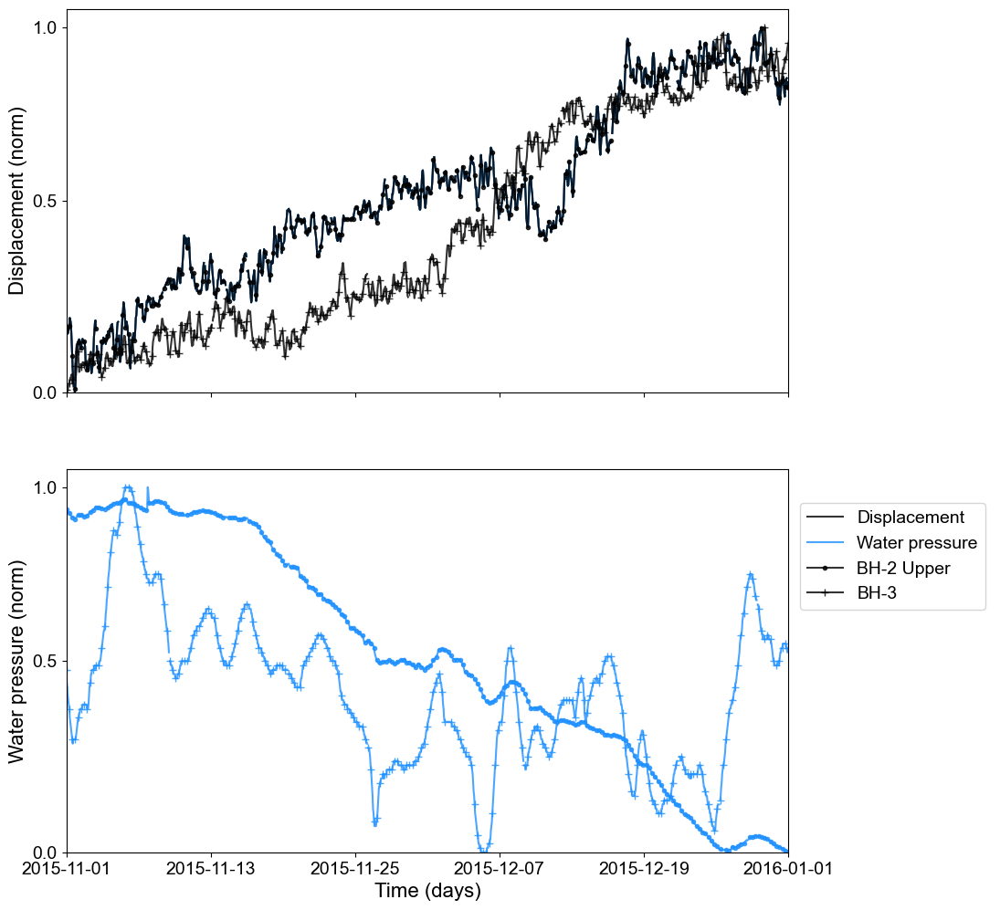

In [233]:
###  NEW FIGURE 8  ####

# Zoom on multiple events at same time
# looking at creep bursts versus water pressure

# TO DO !
# Adjust for x-axis so it is tight on both sides
# Only plot y-axis on the right edge as the y-axis is on the left
# Look through water pressures with Clara and see if I can use some of the other deeper modules to plot

# # overview
# start_time = '2022-01-05 00:00:00'
# end_time = '2022-01-20 00:00:00'

# June event in 2022 Jtt2 upper and jtt1
start_time = '2015-11-01 00:00:00'
end_time = '2016-01-01 00:00:00'

# plotting

ncols = 1
nrows = 2

fig, ax = plt.subplots(nrows, ncols,figsize=(12, 12), sharex=True) # , sharex=True
# fig.subplots_adjust(hspace = .2, wspace=.6)

# water pressure
ax_y = ax[1] # setting gw ax-shortcut

#adjusting plotting lines
markers_on = 6 # space between marker points

# DO NOT SHOW THIS BH DUE TO ITS NOICE, HARD TO SEE DISP ON SHORT TIME
# # KH-02-06
# file = KH0206DispLowerZone_creep.copy()
# file2 = KH0206DispLowerZone_raw.copy()
# velocity = 'Displacement [mm]:'
# file3 = KH0206PiezLowerZone_raw.copy()
# # watermodule = 'Mod35_Water pressure [kPa]:' # non really penetrate shearzone hight
# watermodule = 'Mod35_Water pressure [m]:' # non really penetrate shearzone hight

# df =  file2[velocity]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df-df[df.first_valid_index()] # first valid number
# normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# ax[0].plot(df.index, normalized, color='black', marker='o', label='KH-02-06 Lower', alpha=0.8, markevery=markers_on)

# df =  file3[watermodule]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df-df[df.first_valid_index()] # first valid number
# normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# ax_y.plot(df.index, normalized, color='dodgerblue', marker='o', label='KH-02-06 Lower', alpha=0.8, markevery=markers_on)

# BH-2 upper
file = JTT2DispUpperZone_creep.copy()
file2 = JTT2DispUpperZone.copy()
file3 = JTT2WpUpperZone.copy()
velocity = 'Disp_summed [mm]:'
# watermodule = 'Mod134_Water pressure [kPa]:'  # pressure in shear zone
watermodule = 'Mod4_Water pressure [m]:' # unconfined aquifer
# watermodule = 'Mod27_Water pressure [m]:' # seasonal oscilations


df =  file2[velocity]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))

### legend fix ###
ax[0].plot(df.index, normalized, color='black', marker='', label='Displacement', alpha=0.8)
ax[0].plot(df.index, normalized, color='dodgerblue', marker='', label='Water pressure', alpha=0.8)
# ax[0].plot(df.index, normalized, color='black', marker='', label='GNSS', alpha=0.8)
#################

ax[0].plot(df.index, normalized, color='black', marker='.', label='BH-2 Upper', alpha=0.8, markevery=markers_on)

# # linear fit
# turnpoint = '2022-01-13 00:00:00'
# color = 'gray'
# # first part
# df = normalized.copy()
# df =  df[df.index.slice_indexer(start_time,turnpoint)]
# df1 = df.reset_index(drop=True)
# mod = ols(formula = 'df1.values ~ df1.index', data = df1)
# fit = mod.fit() # model fit
# regline = fit.params[0] + fit.params[1] * df1.index
# ax[0].plot(df.index, regline, color=color, linewidth=1)
# # extension = normalized.reset_index(drop=True) # extension
# # regline = fit.params[0] + fit.params[1] * extension.index
# # ax[0].plot(normalized.index, regline, color=color, linewidth=1)

# #second part
# df = normalized.copy()
# df =  df[df.index.slice_indexer(turnpoint,end_time)]
# df1 = df.reset_index(drop=True)
# mod = ols(formula = 'df1.values ~ df1.index', data = df1)
# fit = mod.fit() # model fit
# regline = fit.params[0] + fit.params[1] * df1.index # how it was before extension
# ax[0].plot(df.index, regline, color=color, linewidth=1)
# # extension = pd.RangeIndex.from_range(range(-48, 49, 1)) # this is now hardcoded, could be automatic if add dfs instead
# # regline = fit.params[0] + fit.params[1] * extension
# # ax[0].plot(normalized.index, regline, color=color, linewidth=1)

df =  file3[watermodule]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax_y.plot(df.index, normalized, color='dodgerblue', marker='.', label='', alpha=0.8, markevery=markers_on)

# JTT3
file = JTT3Disp_creep.copy()
file2 = JTT3Disp.copy()
velocity = 'Disp_summed [mm]:'
file3 = JTT3Wp.copy()
# watermodule = 'Mod69_Water pressure [kPa]:' # pressure in shear zone
watermodule = 'Mod4_Water pressure [m]:' # unconfined aquifer
# watermodule = 'Mod9_Water pressure [m]:' # seasonal oscilations

df =  file2[velocity]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))

# actual plot
ax[0].plot(df.index, normalized, color='black', marker='+', label='BH-3', alpha=0.8, markevery=markers_on)

# # linear fit
# turnpoint = '2022-01-13 00:00:00'
# color = 'gray'
# # first part
# df = normalized.copy()
# df =  df[df.index.slice_indexer(start_time,turnpoint)]
# df1 = df.reset_index(drop=True)
# mod = ols(formula = 'df1.values ~ df1.index', data = df1)
# fit = mod.fit() # model fit
# regline = fit.params[0] + fit.params[1] * df1.index
# ax[0].plot(df.index, regline, color=color, linewidth=1)
# # extension = normalized.reset_index(drop=True) # extend beyond dataset
# # regline = fit.params[0] + fit.params[1] * extension.index
# # plt.plot(normalized.index, regline, color=color, linewidth=1)

# #second part
# df = normalized.copy()

# df =  df[df.index.slice_indexer(turnpoint,end_time)]
# df1 = df.reset_index(drop=True)
# mod = ols(formula = 'df1.values ~ df1.index', data = df1)
# fit = mod.fit() # model fit
# regline = fit.params[0] + fit.params[1] * df1.index
# ax[0].plot(df.index, regline, color=color, linewidth=1)
# # extension = pd.RangeIndex.from_range(range(-48, 49, 1)) # # extend beyond dataset. This is now hardcoded, could be automatic if add dfs instead
# # plt.plot(df.index, regline, color=color, linewidth=1) 
# # regline = fit.params[0] + fit.params[1] * extension
# # plt.plot(normalized.index, regline, color=color, linewidth=1)

df =  file3[watermodule]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax_y.plot(df.index, normalized, color='dodgerblue', marker='+', label='', alpha=0.8, markevery=markers_on)


# GPSs data

# time window for the following data is chosen under the data for the starting and ending borehole

# # GPS data
# data = '2d'

# # mean of several GPSs
# # # 4 hour data 
# # df =  gps3_4h[data]
# # df =  df[df.index.slice_indexer(start_time,end_time)]
# # df.index = pd.to_datetime(df.index)
# # df1 = df.copy()

# # df =  gps4_4h[data]
# # df =  df[df.index.slice_indexer(start_time,end_time)]
# # df.index = pd.to_datetime(df.index)
# # df2 = df.copy()

# # df = pd.concat([df1, df2],axis=1)
# # df.dropna(inplace=True) # only mean when data
# # mean_gps = df.mean(axis=1)
# # ax[2].plot(df.index, mean_gps-mean_gps[mean_gps.first_valid_index()], color='black', label='mean 2d GPS 3 and 4 4h')

# # ax[2].plot(df2.index, df2-df2[df2.first_valid_index()], color='red', label='mean 2d GPS 4')
# # ax[2].plot(df1.index, df1-df1[df1.first_valid_index()], color='green', label='mean 2d GPS 3')

# # #12 hour data
# # df =  gps3[data]
# # df =  df[df.index.slice_indexer(start_time,end_time)]
# # df.index = pd.to_datetime(df.index)
# # df = df-df[df.first_valid_index()]
# # normalized1 = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# # df1 = df.copy()

# df =  gps4[data]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df-df[df.first_valid_index()]
# normalized2 = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# ax[2].plot(df.index, normalized2, color='purple', marker='.', label='')
# # ax[2].plot(df.index, df, color='purple', marker='.', label='')

# df =  gps6[data]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df-df[df.first_valid_index()]
# normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# ax[2].plot(df.index, normalized, color='purple', marker='+', label='')
# # ax[2].plot(df.index, df, color='purple', marker='+', label='')

# # df =  gps10[data]
# # df =  df[df.index.slice_indexer(start_time,end_time)]
# # df.index = pd.to_datetime(df.index)
# # df4 = df.copy()

# # df = pd.concat([df1, df2],axis=1)
# # df.dropna(inplace=True) # only mean when data
# # mean_gps = df.mean(axis=1)
# # ax[2].plot(df.index, mean_gps-mean_gps[0], color='purple', label='Horizontal 12h \n(mean of GPS 3 and 4)')

# # df = pd.concat([normalized1, normalized2],axis=1)
# # df.dropna(inplace=True) # only mean when data
# # mean_gps = df.mean(axis=1)
# # ax[2].plot(df.index, mean_gps, color='purple', label='Horizontal 12h \n' r'$\binom{\mathsf{Mean \ of}}{\mathsf{GPS \ 3 \ and \ 4}}$')

# # # seismicity

# df = seismic.copy()
# df =  df[df.index.slice_indexer(start_time,end_time)]

# color_gradient = [
#     "#0072B2",  # Dark Blue
#     "#56B4E9",  # Light Blue
#     "#009E73",  # Light Green
#     "#D4A017",  # Dark Yellow (warmer, closer to orange)
#     "#F0E442"   # Bright Yellow
# ]

# # Create a continuous colormap
# cmap = mcolors.LinearSegmentedColormap.from_list("colors", color_gradient, N=256)
# norm = mcolors.Normalize(vmin=np.nanmin(df.loc[:,'cc']), vmax=np.nanmax(df.loc[:,'cc']))
# sc = ax[2].scatter(df.index, df.loc[:,'dv/v(%)'], c=df.loc[:,'cc'], cmap=cmap, norm=norm, edgecolor='k', alpha=0.8)

# # ## mean value
# # seismic['dV/V_interp'] =  seismic.iloc[:,0].interpolate(method='linear', limit=3, limit_direction='both')
# # seismic['dV/V_mean'] = seismic.loc[:,'dV/V_interp'].rolling(window=roll_window, center=True).mean()
# # ax[1].plot(seismic.index, seismic.loc[:,'dV/V_mean'], color=colors[1])

# # colorbar
# from mpl_toolkits.axes_grid1.inset_locator import inset_axes
# # Add inset colorbar inside the plot (lower left)
# cax = inset_axes(ax[2], width="20%", height="4%", loc="upper left", borderpad=2)
# cbar = plt.colorbar(sc, cax=cax, orientation="horizontal")

# # Set colorbar limits and ticks
# print('min and max values for color bar', df.loc[:,'cc'].min(), df.loc[:,'cc'].max())
# cbar.set_ticks(np.arange(df.loc[:,'cc'].min(), df.loc[:,'cc'].max()+.00001, 0.1))  # Tick positions
# # cbar.set_label("CC", fontsize=10, labelpad=4)

# # Format colorbar text (move to top, smaller font)
# cbar.ax.xaxis.set_label_position("top")  # Move label above
# cbar.ax.xaxis.set_ticks_position("top")  # Move ticks above
# cbar.ax.tick_params(labelsize=10)  # Reduce font size
# # seismicity_sub =  seismicity_bh_class
# # seismicity_sub =  seismicity_sub[seismicity_sub.index.slice_indexer(start_time,end_time)]


# ini = np.zeros(len(seismicity_sub),dtype=int)
# for i, CL in enumerate(seismicity_sub.columns):
#     nEvents = seismicity_sub.loc[:,CL].values
#     ax[2].bar(dates.date2num(seismicity_sub.index), nEvents, alpha=1, align='edge', width=.045, label=CL, bottom=ini, linewidth=0, color=colors[i]) # pd.Timedelta(days=7)
#     ini = ini + nEvents

# y-axis
nticks = 3
ax[0].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[0].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
ax[1].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[1].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
# ax[2].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
# ax[2].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
# ax[2].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))

ax[0].set_ylim(0, 1.05)
ax[1].set_ylim(0, 1.05)
# ax[2].set_ylim(0, 1.05)
# ymax = 150 # nEvents
# ax[2].set_ylim(0, ymax)

# Modifying the y-axis tick labels
yticks = ax[0].get_yticks()
yticks[-1] = 1.0
ax[0].set_yticks(yticks)

yticks = ax[1].get_yticks()
yticks[-1] = 1.0
ax[1].set_yticks(yticks)

# yticks = ax[2].get_yticks()
# yticks[-1] = 1.0
# ax[2].set_yticks(yticks)

# # Manually setting gridlines for tick labels. I did not figure out how to do this, so leave it like it is so far
# yticks_to_show = [0.5]
# ax[1].grid(axis='y', which='both')
# ax[1].axhline(y=0.5, color='gray', linestyle='--')


# x-axis
nticks = 6
ax[0].xaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[1].xaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
# ax[2].xaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
# ax[3].xaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))


# # generate legend
# lines, labels = ax[0].get_legend_handles_labels()
# lines = unique(lines)
# labels = unique(labels)
# ax[0].legend(lines, labels, loc='center left', bbox_to_anchor=(1, -0.25)) #
# leg = ax[0].get_legend() # gets legend handels
# leg.legendHandles[1].set_color('dodgerblue') #changes the last creep burst that is named water pressure and changes the color to dodgerblue
# # leg.legendHandles[-1].set_color('crimson') #changes the last creep burst that is named water pressure and changes the color to dodgerblue

# # Borehole
# # ax[0].legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)

# # Water level
# # ax[1].legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)

# # GPS
# ax[2].legend(loc='center left', bbox_to_anchor=(1, 1.1))

# # seismic data
# mylabels = ['20 m depth','25 m depth','30 m depth','35 m depth','40 m depth','45 m depth','50 m depth','55 m depth']
# ax[3].legend(labels=mylabels, loc='center left', bbox_to_anchor=(1, 1.12))


# one legend
# one legend
for i in range(2):
    box = ax[i].get_position()
    ax[i].set_position([box.x0, box.y0, box.width * 0.85, box.height]) 
leg = fig.legend(loc = (0.8, 0.33), ncol=1) # center of fig
# leg.get_lines()[1].set_color('dodgerblue')

### version 1, for this, increase the size of figure
# set axis labels
ax[0].set_ylabel('Displacement (norm)')
ax[1].set_ylabel('Water pressure (norm)')
# ax[2].set_ylabel('Displacement (norm)')
# ax[2].set_ylabel('Seismic velocity (dv/v)')
ax[1].set_xlabel('Time (days)')

# ### Version 2
# # set axis labels
# ax[0].set_title('Shear zone displacement')
# ax[1].set_title('Water pressure')
# ax[2].set_title('Surface displacement')
# ax[3].set_title('Seismic events in depth')

# # set axis labels
# ax[0].set_ylabel('norm')
# ax[1].set_ylabel('norm')
# ax[2].set_ylabel('mm')
# ax[3].set_ylabel('count')
# ax[3].set_xlabel('Time (days)')

# removing space on sides of x-axis
ax[0].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))
ax[1].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))
# ax[2].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))
# ax[3].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))

# # forcing date every day # This messes up the cc bar
# import matplotlib.dates as dates
# plt.gca().xaxis.set_major_locator(dates.DayLocator())
# plt.gca().xaxis.set_major_formatter(dates.DateFormatter('%Y-%m-%d'))


# from matplotlib.ticker import FormatStrFormatter
# cbar.ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))


# # removing tick labels from the xaxis
# n = 2  # keeps every n row
# [l.set_visible(False) for (i,l) in enumerate(ax[3].xaxis.get_ticklabels()) if i % n != 0]

# # setting vertical lines to highlight start of burst, water and seismic events
# color = 'crimson'
# ax[0].axvline(x=pd.Timestamp('2022-01-13 00:00:00'), color=color, linestyle='dashed')
# ax[1].axvline(x=pd.Timestamp('2022-01-12 14:00:00'), color=color, linestyle='dashed')
# ax[2].axvline(x=pd.Timestamp('2022-01-12 16:00:00'), color=color, linestyle='dashed')

# # # saving
path = 'plots\\'
# save_name = f'{path}Figure5_FirstMulti_overview'
save_name = f'{path}Figure3_SI'
fig.savefig(save_name+'.png', dpi=600)

min and max values for color bar 0.759963884 0.960437045


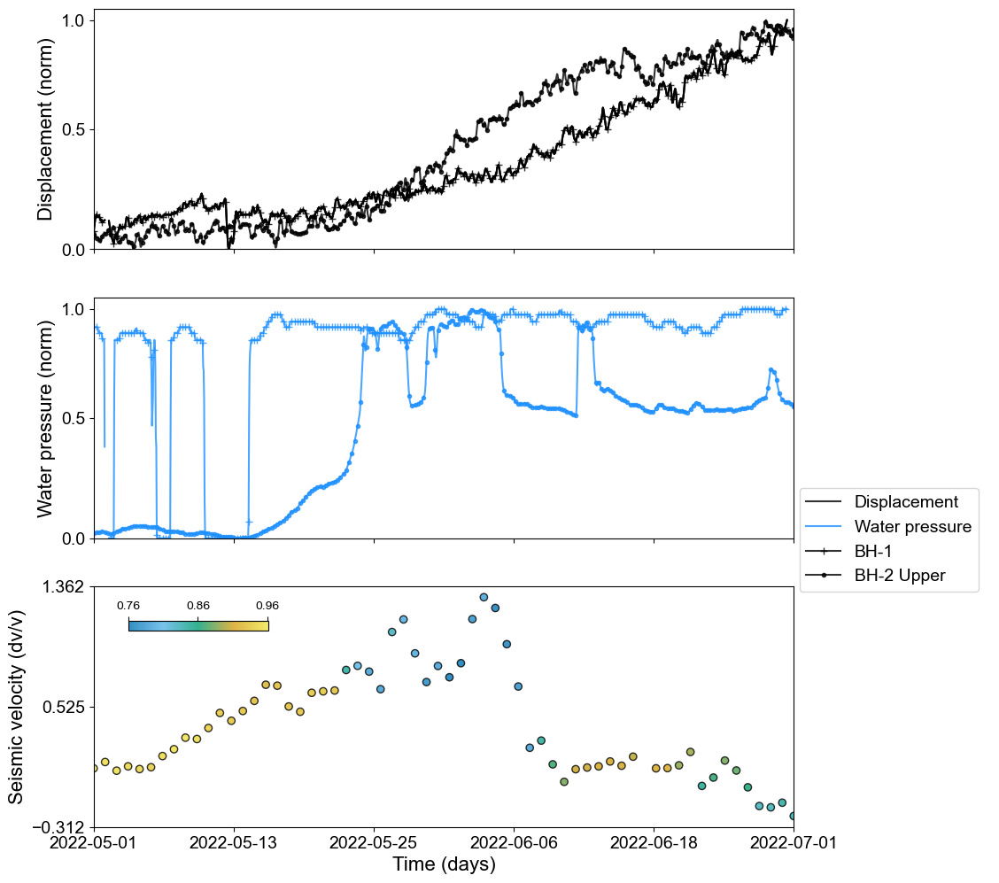

In [207]:
###  NEW FIGURE 8  ####

# Zoom on multiple events at same time
# looking at creep bursts versus water pressure

# TO DO !
# Adjust for x-axis so it is tight on both sides
# Only plot y-axis on the right edge as the y-axis is on the left
# Look through water pressures with Clara and see if I can use some of the other deeper modules to plot

# # overview
# start_time = '2022-01-05 00:00:00'
# end_time = '2022-01-20 00:00:00'

# June event in 2022 Jtt2 upper and jtt1
start_time = '2022-05-01 00:00:00'
end_time = '2022-07-01 00:00:00'

# plotting

ncols = 1
nrows = 3

fig, ax = plt.subplots(nrows, ncols,figsize=(12, 12), sharex=True) # , sharex=True
# fig.subplots_adjust(hspace = .2, wspace=.6)

# water pressure
ax_y = ax[1] # setting gw ax-shortcut

#adjusting plotting lines
markers_on = 6 # space between marker points

# DO NOT SHOW THIS BH DUE TO ITS NOICE, HARD TO SEE DISP ON SHORT TIME
# # KH-02-06
# file = KH0206DispLowerZone_creep.copy()
# file2 = KH0206DispLowerZone_raw.copy()
# velocity = 'Displacement [mm]:'
# file3 = KH0206PiezLowerZone_raw.copy()
# # watermodule = 'Mod35_Water pressure [kPa]:' # non really penetrate shearzone hight
# watermodule = 'Mod35_Water pressure [m]:' # non really penetrate shearzone hight

# df =  file2[velocity]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df-df[df.first_valid_index()] # first valid number
# normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# ax[0].plot(df.index, normalized, color='black', marker='o', label='KH-02-06 Lower', alpha=0.8, markevery=markers_on)

# df =  file3[watermodule]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df-df[df.first_valid_index()] # first valid number
# normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# ax_y.plot(df.index, normalized, color='dodgerblue', marker='o', label='KH-02-06 Lower', alpha=0.8, markevery=markers_on)


# JTT1
file = JTT1Disp_creep.copy()
file2 = JTT1Disp.copy()
velocity = 'Disp_summed [mm]:'
file3 = JTT1Wp.copy()
# watermodule = 'Mod69_Water pressure [kPa]:' # pressure in shear zone
watermodule = 'Mod4_Water pressure [m]:' # unconfined aquifer
# watermodule = 'Mod9_Water pressure [m]:' # seasonal oscilations

df =  file2[velocity]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))

### legend fix ###
ax[0].plot(df.index, normalized, color='black', marker='', label='Displacement', alpha=0.8)
ax[0].plot(df.index, normalized, color='black', marker='', label='Water pressure', alpha=0.8)
# ax[0].plot(df.index, normalized, color='black', marker='', label='GNSS', alpha=0.8)
#################

# actual plot
ax[0].plot(df.index, normalized, color='black', marker='+', label='BH-1', alpha=0.8, markevery=markers_on)

# # linear fit
# turnpoint = '2022-01-13 00:00:00'
# color = 'gray'
# # first part
# df = normalized.copy()
# df =  df[df.index.slice_indexer(start_time,turnpoint)]
# df1 = df.reset_index(drop=True)
# mod = ols(formula = 'df1.values ~ df1.index', data = df1)
# fit = mod.fit() # model fit
# regline = fit.params[0] + fit.params[1] * df1.index
# ax[0].plot(df.index, regline, color=color, linewidth=1)
# # extension = normalized.reset_index(drop=True) # extend beyond dataset
# # regline = fit.params[0] + fit.params[1] * extension.index
# # plt.plot(normalized.index, regline, color=color, linewidth=1)

# #second part
# df = normalized.copy()

# df =  df[df.index.slice_indexer(turnpoint,end_time)]
# df1 = df.reset_index(drop=True)
# mod = ols(formula = 'df1.values ~ df1.index', data = df1)
# fit = mod.fit() # model fit
# regline = fit.params[0] + fit.params[1] * df1.index
# ax[0].plot(df.index, regline, color=color, linewidth=1)
# # extension = pd.RangeIndex.from_range(range(-48, 49, 1)) # # extend beyond dataset. This is now hardcoded, could be automatic if add dfs instead
# # plt.plot(df.index, regline, color=color, linewidth=1) 
# # regline = fit.params[0] + fit.params[1] * extension
# # plt.plot(normalized.index, regline, color=color, linewidth=1)

df =  file3[watermodule]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax_y.plot(df.index, normalized, color='dodgerblue', marker='+', label='BH-1', alpha=0.8, markevery=markers_on)

# BH-2 upper
file = JTT2DispUpperZone_creep.copy()
file2 = JTT2DispUpperZone.copy()
file3 = JTT2WpUpperZone.copy()
velocity = 'Disp_summed [mm]:'
# watermodule = 'Mod134_Water pressure [kPa]:'  # pressure in shear zone
watermodule = 'Mod4_Water pressure [m]:' # unconfined aquifer
# watermodule = 'Mod27_Water pressure [m]:' # seasonal oscilations

df =  file2[velocity]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax[0].plot(df.index, normalized, color='black', marker='.', label='BH-2 Upper', alpha=0.8, markevery=markers_on)

# # linear fit
# turnpoint = '2022-01-13 00:00:00'
# color = 'gray'
# # first part
# df = normalized.copy()
# df =  df[df.index.slice_indexer(start_time,turnpoint)]
# df1 = df.reset_index(drop=True)
# mod = ols(formula = 'df1.values ~ df1.index', data = df1)
# fit = mod.fit() # model fit
# regline = fit.params[0] + fit.params[1] * df1.index
# ax[0].plot(df.index, regline, color=color, linewidth=1)
# # extension = normalized.reset_index(drop=True) # extension
# # regline = fit.params[0] + fit.params[1] * extension.index
# # ax[0].plot(normalized.index, regline, color=color, linewidth=1)

# #second part
# df = normalized.copy()
# df =  df[df.index.slice_indexer(turnpoint,end_time)]
# df1 = df.reset_index(drop=True)
# mod = ols(formula = 'df1.values ~ df1.index', data = df1)
# fit = mod.fit() # model fit
# regline = fit.params[0] + fit.params[1] * df1.index # how it was before extension
# ax[0].plot(df.index, regline, color=color, linewidth=1)
# # extension = pd.RangeIndex.from_range(range(-48, 49, 1)) # this is now hardcoded, could be automatic if add dfs instead
# # regline = fit.params[0] + fit.params[1] * extension
# # ax[0].plot(normalized.index, regline, color=color, linewidth=1)

df =  file3[watermodule]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax_y.plot(df.index, normalized, color='dodgerblue', marker='.', label='BH-2 Upper', alpha=0.8, markevery=markers_on)


# GPSs data

# time window for the following data is chosen under the data for the starting and ending borehole

# # GPS data
# data = '2d'

# # mean of several GPSs
# # # 4 hour data 
# # df =  gps3_4h[data]
# # df =  df[df.index.slice_indexer(start_time,end_time)]
# # df.index = pd.to_datetime(df.index)
# # df1 = df.copy()

# # df =  gps4_4h[data]
# # df =  df[df.index.slice_indexer(start_time,end_time)]
# # df.index = pd.to_datetime(df.index)
# # df2 = df.copy()

# # df = pd.concat([df1, df2],axis=1)
# # df.dropna(inplace=True) # only mean when data
# # mean_gps = df.mean(axis=1)
# # ax[2].plot(df.index, mean_gps-mean_gps[mean_gps.first_valid_index()], color='black', label='mean 2d GPS 3 and 4 4h')

# # ax[2].plot(df2.index, df2-df2[df2.first_valid_index()], color='red', label='mean 2d GPS 4')
# # ax[2].plot(df1.index, df1-df1[df1.first_valid_index()], color='green', label='mean 2d GPS 3')

# # #12 hour data
# # df =  gps3[data]
# # df =  df[df.index.slice_indexer(start_time,end_time)]
# # df.index = pd.to_datetime(df.index)
# # df = df-df[df.first_valid_index()]
# # normalized1 = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# # df1 = df.copy()

# df =  gps4[data]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df-df[df.first_valid_index()]
# normalized2 = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# ax[2].plot(df.index, normalized2, color='purple', marker='.', label='')
# # ax[2].plot(df.index, df, color='purple', marker='.', label='')

# df =  gps6[data]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df-df[df.first_valid_index()]
# normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# ax[2].plot(df.index, normalized, color='purple', marker='+', label='')
# # ax[2].plot(df.index, df, color='purple', marker='+', label='')

# # df =  gps10[data]
# # df =  df[df.index.slice_indexer(start_time,end_time)]
# # df.index = pd.to_datetime(df.index)
# # df4 = df.copy()

# # df = pd.concat([df1, df2],axis=1)
# # df.dropna(inplace=True) # only mean when data
# # mean_gps = df.mean(axis=1)
# # ax[2].plot(df.index, mean_gps-mean_gps[0], color='purple', label='Horizontal 12h \n(mean of GPS 3 and 4)')

# # df = pd.concat([normalized1, normalized2],axis=1)
# # df.dropna(inplace=True) # only mean when data
# # mean_gps = df.mean(axis=1)
# # ax[2].plot(df.index, mean_gps, color='purple', label='Horizontal 12h \n' r'$\binom{\mathsf{Mean \ of}}{\mathsf{GPS \ 3 \ and \ 4}}$')

# # seismicity

df = seismic.copy()
df =  df[df.index.slice_indexer(start_time,end_time)]

color_gradient = [
    "#0072B2",  # Dark Blue
    "#56B4E9",  # Light Blue
    "#009E73",  # Light Green
    "#D4A017",  # Dark Yellow (warmer, closer to orange)
    "#F0E442"   # Bright Yellow
]

# Create a continuous colormap
cmap = mcolors.LinearSegmentedColormap.from_list("colors", color_gradient, N=256)
norm = mcolors.Normalize(vmin=np.nanmin(df.loc[:,'cc']), vmax=np.nanmax(df.loc[:,'cc']))
sc = ax[2].scatter(df.index, df.loc[:,'dv/v(%)'], c=df.loc[:,'cc'], cmap=cmap, norm=norm, edgecolor='k', alpha=0.8)

# ## mean value
# seismic['dV/V_interp'] =  seismic.iloc[:,0].interpolate(method='linear', limit=3, limit_direction='both')
# seismic['dV/V_mean'] = seismic.loc[:,'dV/V_interp'].rolling(window=roll_window, center=True).mean()
# ax[1].plot(seismic.index, seismic.loc[:,'dV/V_mean'], color=colors[1])

# colorbar
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
# Add inset colorbar inside the plot (lower left)
cax = inset_axes(ax[2], width="20%", height="4%", loc="upper left", borderpad=2)
cbar = plt.colorbar(sc, cax=cax, orientation="horizontal")

# Set colorbar limits and ticks
print('min and max values for color bar', df.loc[:,'cc'].min(), df.loc[:,'cc'].max())
cbar.set_ticks(np.arange(df.loc[:,'cc'].min(), df.loc[:,'cc'].max()+.00001, 0.1))  # Tick positions
# cbar.set_label("CC", fontsize=10, labelpad=4)

# Format colorbar text (move to top, smaller font)
cbar.ax.xaxis.set_label_position("top")  # Move label above
cbar.ax.xaxis.set_ticks_position("top")  # Move ticks above
cbar.ax.tick_params(labelsize=10)  # Reduce font size
# seismicity_sub =  seismicity_bh_class
# seismicity_sub =  seismicity_sub[seismicity_sub.index.slice_indexer(start_time,end_time)]


# ini = np.zeros(len(seismicity_sub),dtype=int)
# for i, CL in enumerate(seismicity_sub.columns):
#     nEvents = seismicity_sub.loc[:,CL].values
#     ax[2].bar(dates.date2num(seismicity_sub.index), nEvents, alpha=1, align='edge', width=.045, label=CL, bottom=ini, linewidth=0, color=colors[i]) # pd.Timedelta(days=7)
#     ini = ini + nEvents

# y-axis
nticks = 3
ax[0].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[0].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
ax[1].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[1].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
# ax[2].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
# ax[2].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
ax[2].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))

ax[0].set_ylim(0, 1.05)
ax[1].set_ylim(0, 1.05)
# ax[2].set_ylim(0, 1.05)
# ymax = 150 # nEvents
# ax[2].set_ylim(0, ymax)

# Modifying the y-axis tick labels
yticks = ax[0].get_yticks()
yticks[-1] = 1.0
ax[0].set_yticks(yticks)

yticks = ax[1].get_yticks()
yticks[-1] = 1.0
ax[1].set_yticks(yticks)

# yticks = ax[2].get_yticks()
# yticks[-1] = 1.0
# ax[2].set_yticks(yticks)

# # Manually setting gridlines for tick labels. I did not figure out how to do this, so leave it like it is so far
# yticks_to_show = [0.5]
# ax[1].grid(axis='y', which='both')
# ax[1].axhline(y=0.5, color='gray', linestyle='--')


# x-axis
nticks = 6
ax[0].xaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[1].xaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[2].xaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
# ax[3].xaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))


# # generate legend
# lines, labels = ax[0].get_legend_handles_labels()
# lines = unique(lines)
# labels = unique(labels)
# ax[0].legend(lines, labels, loc='center left', bbox_to_anchor=(1, -0.25)) #
# leg = ax[0].get_legend() # gets legend handels
# leg.legendHandles[1].set_color('dodgerblue') #changes the last creep burst that is named water pressure and changes the color to dodgerblue
# # leg.legendHandles[-1].set_color('crimson') #changes the last creep burst that is named water pressure and changes the color to dodgerblue

# # Borehole
# # ax[0].legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)

# # Water level
# # ax[1].legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)

# # GPS
# ax[2].legend(loc='center left', bbox_to_anchor=(1, 1.1))

# # seismic data
# mylabels = ['20 m depth','25 m depth','30 m depth','35 m depth','40 m depth','45 m depth','50 m depth','55 m depth']
# ax[3].legend(labels=mylabels, loc='center left', bbox_to_anchor=(1, 1.12))

# one legend
for i in range(3):
    box = ax[i].get_position()
    ax[i].set_position([box.x0, box.y0, box.width * 0.85, box.height]) # shrinking axes to accomodate legend
handles, labels = [(a + b) for a, b in zip(ax[0].get_legend_handles_labels(), ax[2].get_legend_handles_labels())]
leg = fig.legend(handles, labels, loc = (0.8, 0.33), ncol=1) # center of fig
leg.get_lines()[1].set_color('dodgerblue')
# leg.get_lines()[2].set_color('purple')

### version 1, for this, increase the size of figure
# set axis labels
ax[0].set_ylabel('Displacement (norm)')
ax[1].set_ylabel('Water pressure (norm)')
# ax[2].set_ylabel('Displacement (norm)')
ax[2].set_ylabel('Seismic velocity (dv/v)')
ax[2].set_xlabel('Time (days)')

# ### Version 2
# # set axis labels
# ax[0].set_title('Shear zone displacement')
# ax[1].set_title('Water pressure')
# ax[2].set_title('Surface displacement')
# ax[3].set_title('Seismic events in depth')

# # set axis labels
# ax[0].set_ylabel('norm')
# ax[1].set_ylabel('norm')
# ax[2].set_ylabel('mm')
# ax[3].set_ylabel('count')
# ax[3].set_xlabel('Time (days)')

# removing space on sides of x-axis
ax[0].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))
ax[1].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))
ax[2].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))
# ax[3].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))

# # forcing date every day # This messes up the cc bar
# import matplotlib.dates as dates
# plt.gca().xaxis.set_major_locator(dates.DayLocator())
# plt.gca().xaxis.set_major_formatter(dates.DateFormatter('%Y-%m-%d'))


from matplotlib.ticker import FormatStrFormatter
cbar.ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))


# # removing tick labels from the xaxis
# n = 2  # keeps every n row
# [l.set_visible(False) for (i,l) in enumerate(ax[3].xaxis.get_ticklabels()) if i % n != 0]

# # setting vertical lines to highlight start of burst, water and seismic events
# color = 'crimson'
# ax[0].axvline(x=pd.Timestamp('2022-01-13 00:00:00'), color=color, linestyle='dashed')
# ax[1].axvline(x=pd.Timestamp('2022-01-12 14:00:00'), color=color, linestyle='dashed')
# ax[2].axvline(x=pd.Timestamp('2022-01-12 16:00:00'), color=color, linestyle='dashed')

# # # saving
path = 'plots\\'
# save_name = f'{path}Figure5_FirstMulti_overview'
save_name = f'{path}Figure2_SI'
fig.savefig(save_name+'.png', dpi=600)

In [191]:
df.loc[:,'cc'].max()

0.960437045

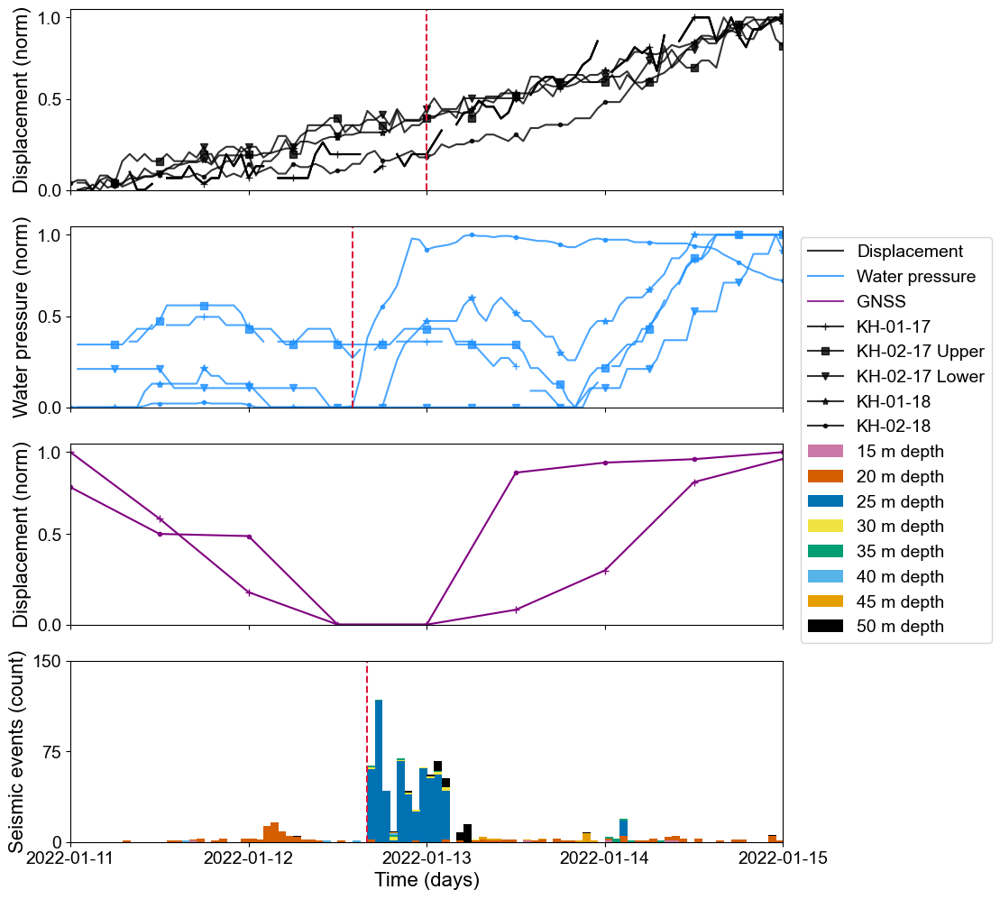

In [93]:
###  Suplementary figure 8 ####

# Zoom on multiple events at same time
# looking at creep bursts versus water pressure

# TO DO !
# Adjust for x-axis so it is tight on both sides
# Only plot y-axis on the right edge as the y-axis is on the left
# Look through water pressures with Clara and see if I can use some of the other deeper modules to plot

# # overview
# start_time = '2022-01-05 00:00:00'
# end_time = '2022-01-20 00:00:00'

# zoom
start_time = '2022-01-11 00:00:00'
end_time = '2022-01-15 00:00:00'

# plotting

ncols = 1
nrows = 4

fig, ax = plt.subplots(nrows, ncols,figsize=(12, 12), sharex=True) # , sharex=True
# fig.subplots_adjust(hspace = .2, wspace=.6)

# water pressure
ax_y = ax[1] # setting gw ax-shortcut

#adjusting plotting lines
markers_on = 6 # space between marker points

# DO NOT SHOW THIS BH DUE TO ITS NOICE, HARD TO SEE DISP ON SHORT TIME
# # KH-02-06
# file = KH0206DispLowerZone_creep.copy()
# file2 = KH0206DispLowerZone_raw.copy()
# velocity = 'Displacement [mm]:'
# file3 = KH0206PiezLowerZone_raw.copy()
# # watermodule = 'Mod35_Water pressure [kPa]:' # non really penetrate shearzone hight
# watermodule = 'Mod35_Water pressure [m]:' # non really penetrate shearzone hight

# df =  file2[velocity]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df-df[df.first_valid_index()] # first valid number
# normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# ax[0].plot(df.index, normalized, color='black', marker='o', label='KH-02-06 Lower', alpha=0.8, markevery=markers_on)

# df =  file3[watermodule]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df-df[df.first_valid_index()] # first valid number
# normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# ax_y.plot(df.index, normalized, color='dodgerblue', marker='o', label='KH-02-06 Lower', alpha=0.8, markevery=markers_on)


# KH-01-17
file = KH0117Disp_creep.copy()
file2 = KH0117Disp_raw.copy()
velocity = 'Disp_summed [mm]:'
file3 = KH0117Piez_raw.copy()
# watermodule = 'Mod69_Water pressure [kPa]:' # pressure in shear zone
watermodule = 'Mod69_Water pressure [m]:' # unconfined aquifer
# watermodule = 'Mod9_Water pressure [m]:' # seasonal oscilations

df =  file2[velocity]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))

### legend fix ###
ax[0].plot(df.index, normalized, color='black', marker='', label='Displacement', alpha=0.8)
ax[0].plot(df.index, normalized, color='black', marker='', label='Water pressure', alpha=0.8)
ax[0].plot(df.index, normalized, color='black', marker='', label='GNSS', alpha=0.8)
#################

# actual plot
ax[0].plot(df.index, normalized, color='black', marker='+', label='KH-01-17', alpha=0.8, markevery=markers_on)
df =  file3[watermodule]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax_y.plot(df.index, normalized, color='dodgerblue', marker='+', label='KH-01-17', alpha=0.8, markevery=markers_on)

# # KH-01-12
# file = KH0112DispUpperZone_creep.copy()
# file2 = KH0112DispUpperZone_raw.copy()
# file3 = KH0112Piez_raw.copy()
# velocity = 'Displacement [mm]:'
# # watermodule = 'Mod134_Water pressure [kPa]:'  # pressure in shear zone
# watermodule = 'Mod30_Water pressure [m]:' # unconfined aquifer
# # watermodule = 'Mod27_Water pressure [m]:' # seasonal oscilations

# df =  file2[velocity]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df-df[df.first_valid_index()] # first valid number
# normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# ax[0].plot(df.index, normalized, color='black', marker='o', label='KH-01-12', alpha=0.8, markevery=markers_on)

# df =  file3[watermodule]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df-df[df.first_valid_index()] # first valid number
# normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# ax_y.plot(df.index, normalized, color='dodgerblue', marker='o', label='KH-01-12', alpha=0.8, markevery=markers_on)

# KH-02-17 Upper
file = KH0217DispUpperZone_creep.copy()
file2 = KH0217DispUpperZone.copy()
velocity = 'Disp_summed [mm]:'
file3 = KH0217PiezUpperZone.copy()
# watermodule = 'Mod52_Water pressure [kPa]:'  # pressure in shear zone
watermodule = 'Mod98_Water pressure [m]:' # unconfined aquifer
# watermodule = 'Mod29_Water pressure [m]:' # seasonal oscilations

df =  file2[velocity]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax[0].plot(df.index, normalized, color='black', marker='s', label='KH-02-17 Upper', alpha=0.8, markevery=markers_on)

df =  file3[watermodule]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax_y.plot(df.index, normalized, color='dodgerblue', marker='s', label='KH-02-17 Upper', alpha=0.8, markevery=markers_on)

# KH-02-17 Lower
file = KH0217DispLowerZone_creep.copy()
file2 = KH0217DispLowerZone.copy()
velocity = 'Disp_summed [mm]:'
file3 = KH0217PiezLowerZone.copy()
# watermodule = 'Mod52_Water pressure [kPa]:'  # pressure in shear zone
watermodule = 'Mod52_Water pressure [m]:' # unconfined aquifer
# watermodule = 'Mod29_Water pressure [m]:' # seasonal oscilations

df =  file2[velocity]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax[0].plot(df.index, normalized, color='black', marker='v', label='KH-02-17 Lower', alpha=0.8, markevery=markers_on)

df =  file3[watermodule]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax_y.plot(df.index, normalized, color='dodgerblue', marker='v', label='KH-02-17 Lower', alpha=0.8, markevery=markers_on)


# KH-01-18
file = KH0118Disp_creep.copy()
file2 = KH0118Disp_raw.copy()
velocity = 'Disp_summed [mm]:'
file3 = KH0118Piez_raw.copy()
# watermodule = 'Interpolated_Mod63_Water pressure [kPa]:'  # pressure in shear zone
# watermodule = 'Mod82_Water pressure [m]:' # unconfined aquifer

watermodule = 'Mod63_Water pressure [m]:' # in shear zone
# watermodule = 'Mod82_Water pressure [m]:' # unconfined aquifer

# watermodule = 'Mod26_Water pressure [m]:' # seasonal oscilations

df =  file2[velocity]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax[0].plot(df.index, normalized, color='black', marker='*', label='KH-01-18', alpha=0.8, markevery=markers_on)

df =  file3[watermodule]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax_y.plot(df.index, normalized, color='dodgerblue', marker='*', label='KH-01-18', alpha=0.8, markevery=markers_on)

# KH-02-18
file = KH0218Disp_creep.copy()
file2 = KH0218Disp_raw.copy()
file3 = KH0218Piez_raw.copy()
velocity = 'Disp_summed [mm]:'
# watermodule = 'Mod134_Water pressure [kPa]:'  # pressure in shear zone
watermodule = 'Mod134_Water pressure [m]:' # unconfined aquifer
# watermodule = 'Mod27_Water pressure [m]:' # seasonal oscilations

df =  file2[velocity]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax[0].plot(df.index, normalized, color='black', marker='.', label='KH-02-18', alpha=0.8, markevery=markers_on)

df =  file3[watermodule]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax_y.plot(df.index, normalized, color='dodgerblue', marker='.', label='KH-02-18', alpha=0.8, markevery=markers_on)


# GPSs data

# time window for the following data is chosen under the data for the starting and ending borehole

# GPS data
data = '2d'

# mean of several GPSs
# # 4 hour data 
# df =  gps3_4h[data]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df1 = df.copy()

# df =  gps4_4h[data]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df2 = df.copy()

# df = pd.concat([df1, df2],axis=1)
# df.dropna(inplace=True) # only mean when data
# mean_gps = df.mean(axis=1)
# ax[2].plot(df.index, mean_gps-mean_gps[mean_gps.first_valid_index()], color='black', label='mean 2d GPS 3 and 4 4h')

# ax[2].plot(df2.index, df2-df2[df2.first_valid_index()], color='red', label='mean 2d GPS 4')
# ax[2].plot(df1.index, df1-df1[df1.first_valid_index()], color='green', label='mean 2d GPS 3')

# #12 hour data
# df =  gps3[data]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df-df[df.first_valid_index()]
# normalized1 = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# df1 = df.copy()

df =  gps4[data]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()]
normalized2 = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax[2].plot(df.index, normalized2, color='purple', marker='.', label='')
# ax[2].plot(df.index, df, color='purple', marker='.', label='')

df =  gps6[data]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()]
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax[2].plot(df.index, normalized, color='purple', marker='+', label='')
# ax[2].plot(df.index, df, color='purple', marker='+', label='')

# df =  gps10[data]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df4 = df.copy()

# df = pd.concat([df1, df2],axis=1)
# df.dropna(inplace=True) # only mean when data
# mean_gps = df.mean(axis=1)
# ax[2].plot(df.index, mean_gps-mean_gps[0], color='purple', label='Horizontal 12h \n(mean of GPS 3 and 4)')

# df = pd.concat([normalized1, normalized2],axis=1)
# df.dropna(inplace=True) # only mean when data
# mean_gps = df.mean(axis=1)
# ax[2].plot(df.index, mean_gps, color='purple', label='Horizontal 12h \n' r'$\binom{\mathsf{Mean \ of}}{\mathsf{GPS \ 3 \ and \ 4}}$')

# seismicity

seismicity_sub =  seismicity_bh_class
seismicity_sub =  seismicity_sub[seismicity_sub.index.slice_indexer(start_time,end_time)]


ini = np.zeros(len(seismicity_sub),dtype=int)
for i, CL in enumerate(seismicity_sub.columns):
    nEvents = seismicity_sub.loc[:,CL].values
    ax[3].bar(dates.date2num(seismicity_sub.index), nEvents, alpha=1, align='edge', width=.045, label=CL, bottom=ini, linewidth=0, color=colors[i]) # pd.Timedelta(days=7)
    ini = ini + nEvents

# y-axis
nticks = 3
ax[0].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[0].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
ax[1].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[1].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
ax[2].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[2].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
ax[3].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))

ax[0].set_ylim(0, 1.05)
ax[1].set_ylim(0, 1.05)
ax[2].set_ylim(0, 1.05)
ymax = 150 # nEvents
ax[3].set_ylim(0, ymax)

# Modifying the y-axis tick labels
yticks = ax[0].get_yticks()
yticks[-1] = 1.0
ax[0].set_yticks(yticks)

yticks = ax[1].get_yticks()
yticks[-1] = 1.0
ax[1].set_yticks(yticks)

yticks = ax[2].get_yticks()
yticks[-1] = 1.0
ax[2].set_yticks(yticks)

# # Manually setting gridlines for tick labels. I did not figure out how to do this, so leave it like it is so far
# yticks_to_show = [0.5]
# ax[1].grid(axis='y', which='both')
# ax[1].axhline(y=0.5, color='gray', linestyle='--')


# x-axis
nticks = 6
ax[0].xaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[1].xaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[2].xaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[3].xaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))


# # generate legend
# lines, labels = ax[0].get_legend_handles_labels()
# lines = unique(lines)
# labels = unique(labels)
# ax[0].legend(lines, labels, loc='center left', bbox_to_anchor=(1, -0.25)) #
# leg = ax[0].get_legend() # gets legend handels
# leg.legendHandles[1].set_color('dodgerblue') #changes the last creep burst that is named water pressure and changes the color to dodgerblue
# # leg.legendHandles[-1].set_color('crimson') #changes the last creep burst that is named water pressure and changes the color to dodgerblue

# # Borehole
# # ax[0].legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)

# # Water level
# # ax[1].legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)

# # GPS
# ax[2].legend(loc='center left', bbox_to_anchor=(1, 1.1))

# # seismic data
# mylabels = ['20 m depth','25 m depth','30 m depth','35 m depth','40 m depth','45 m depth','50 m depth','55 m depth']
# ax[3].legend(labels=mylabels, loc='center left', bbox_to_anchor=(1, 1.12))

# one legend
for i in range(4):
    box = ax[i].get_position()
    ax[i].set_position([box.x0, box.y0, box.width * 0.85, box.height]) # shrinking axes to accomodate legend
handles, labels = [(a + b + c) for a, b, c in zip(ax[0].get_legend_handles_labels(), ax[2].get_legend_handles_labels(),ax[3].get_legend_handles_labels())]
leg = fig.legend(handles, labels, loc = (0.8, 0.285), ncol=1) # center of fig
leg.legend_handles[1].set_color('dodgerblue')
leg.legend_handles[2].set_color('purple')

# Modifying the last 8 legend labels
new_labels = ['15 m depth','20 m depth','25 m depth','30 m depth','35 m depth','40 m depth','45 m depth','50 m depth']

# Updating the legend labels
for i in range(-8, 0):
    leg.texts[i].set_text(new_labels[i])

### version 1, for this, increase the size of figure
# set axis labels
ax[0].set_ylabel('Displacement (norm)')
ax[1].set_ylabel('Water pressure (norm)')
ax[2].set_ylabel('Displacement (norm)')
ax[3].set_ylabel('Seismic events (count)')
ax[3].set_xlabel('Time (days)')

# ### Version 2
# # set axis labels
# ax[0].set_title('Shear zone displacement')
# ax[1].set_title('Water pressure')
# ax[2].set_title('Surface displacement')
# ax[3].set_title('Seismic events in depth')

# # set axis labels
# ax[0].set_ylabel('norm')
# ax[1].set_ylabel('norm')
# ax[2].set_ylabel('mm')
# ax[3].set_ylabel('count')
# ax[3].set_xlabel('Time (days)')

# removing space on sieds of x-axis
ax[0].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))
ax[1].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))
ax[2].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))
ax[3].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))

# forcing date every day
import matplotlib.dates as dates
plt.gca().xaxis.set_major_locator(dates.DayLocator())
plt.gca().xaxis.set_major_formatter(dates.DateFormatter('%Y-%m-%d'))

# # removing tick labels from the xaxis
# n = 2  # keeps every n row
# [l.set_visible(False) for (i,l) in enumerate(ax[3].xaxis.get_ticklabels()) if i % n != 0]

# setting vertical lines to highlight start of burst, water and seismic events
color = 'crimson'
ax[0].axvline(x=pd.Timestamp('2022-01-13 00:00:00'), color=color, linestyle='dashed')
ax[1].axvline(x=pd.Timestamp('2022-01-12 14:00:00'), color=color, linestyle='dashed')
ax[3].axvline(x=pd.Timestamp('2022-01-12 16:00:00'), color=color, linestyle='dashed')

# # # saving
path = 'plots\\'
# save_name = f'{path}Figure5_FirstMulti_overview'
save_name = f'{path}Figure5_FirstMulti_zoom_suplementary'
fig.savefig(save_name+'.png', dpi=600)

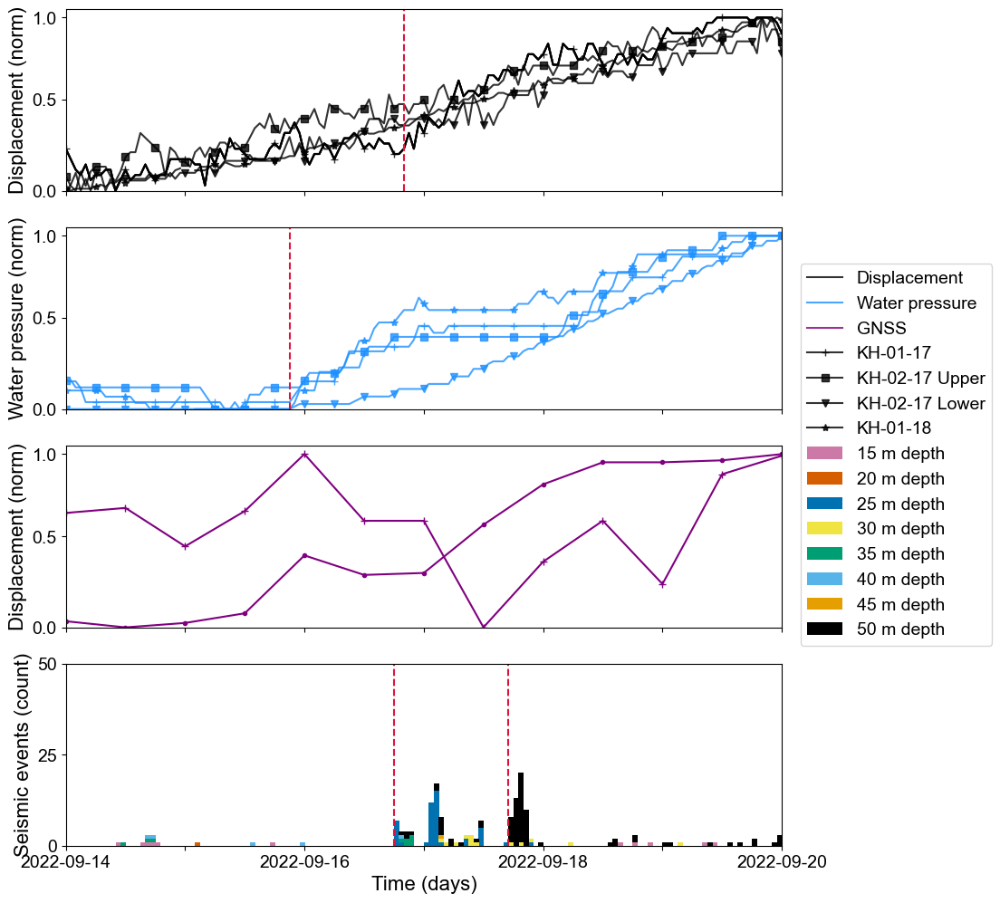

In [94]:
# Second multi event Supplimentary figure

# Zoom on multiple events at same time
# looking at creep bursts versus water pressure

# TO DO !
# Adjust for x-axis so it is tight on both sides
# Only plot y-axis on the right edge as the y-axis is on the left
# Look through water pressures with Clara and see if I can use some of the other deeper modules to plot

# # overview
# start_time = '2022-09-10 00:00:00'
# end_time = '2022-09-30 00:00:00'

# zoom
start_time = '2022-09-14 00:00:00'
end_time = '2022-09-20 00:00:00'

# plotting

ncols = 1
nrows = 4

fig, ax = plt.subplots(nrows, ncols,figsize=(12, 12), sharex=True) # , sharex=True
# fig.subplots_adjust(hspace = .2, wspace=.6)

# water pressure
ax_y = ax[1] # setting gw ax-shortcut

#adjusting plotting lines
markers_on = 6 # space between marker points

# KH-01-17
file = KH0117Disp_creep.copy()
file2 = KH0117Disp_raw.copy()
velocity = 'Disp_summed [mm]:'
file3 = KH0117Piez_raw.copy()
# watermodule = 'Mod69_Water pressure [kPa]:' # pressure in shear zone
watermodule = 'Mod69_Water pressure [m]:' # unconfined aquifer
# watermodule = 'Mod56_Water pressure [m]:' # unconfined aquifer
# watermodule = 'Mod9_Water pressure [m]:' # seasonal oscilations

# Burst 9

df =  file2[velocity]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))

### legend fix ###
ax[0].plot(df.index, normalized, color='black', marker='', label='Displacement', alpha=0.8)
ax[0].plot(df.index, normalized, color='black', marker='', label='Water pressure', alpha=0.8)
ax[0].plot(df.index, normalized, color='black', marker='', label='GNSS', alpha=0.8)
#################

# actual plot
ax[0].plot(df.index, normalized, color='black', marker='+', label='KH-01-17', alpha=0.8, markevery=markers_on)

df =  file3[watermodule]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax_y.plot(df.index, normalized, color='dodgerblue', marker='+', label='KH-01-17', alpha=0.8, markevery=markers_on)

# # # DO NOT SHOW THESE OLDER BH DUE TO ITS NOICE, HARD TO SEE DISP ON SHORT TIME
# # # KH-02-06
# # file = KH0206DispUpperZone_creep.copy()
# # file2 = KH0206DispUpperZone_raw.copy()
# # velocity = 'Displacement [mm]:'
# # file3 = KH0206PiezUpperZone_raw.copy()
# # # watermodule = 'Mod35_Water pressure [kPa]:' # non really penetrate shearzone hight
# # watermodule = 'Mod35_Water pressure [m]:' # non really penetrate shearzone hight

# # df =  file2[velocity]
# # df =  df[df.index.slice_indexer(start_time,end_time)]
# # df.index = pd.to_datetime(df.index)
# # df = df-df[df.first_valid_index()] # first valid number
# # normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# # ax[0].plot(df.index, normalized, color='black', marker='D', label='KH-02-06 Upper', alpha=0.8, markevery=markers_on)

# # df =  file3[watermodule]
# # df =  df[df.index.slice_indexer(start_time,end_time)]
# # df.index = pd.to_datetime(df.index)
# # df = df-df[df.first_valid_index()] # first valid number
# # normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# # ax_y.plot(df.index, normalized, color='dodgerblue', marker='D', label='KH-02-06 Upper', alpha=0.8, markevery=markers_on)

# # # KH-01-12
# # file = KH0112DispUpperZone_creep.copy()
# # file2 = KH0112DispUpperZone_raw.copy()
# # file3 = KH0112Piez_raw.copy()
# # velocity = 'Displacement [mm]:'
# # watermodule = 'Mod30_Water pressure [m]:' # one piezo


# # df =  file2[velocity]
# # df =  df[df.index.slice_indexer(start_time,end_time)]
# # df.index = pd.to_datetime(df.index)
# # df = df-df[df.first_valid_index()] # first valid number
# # normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# # ax[0].plot(df.index, normalized, color='black', marker='o', label='KH-01-12', alpha=0.8, markevery=markers_on)

# # df =  file3[watermodule]
# # df =  df[df.index.slice_indexer(start_time,end_time)]
# # df.index = pd.to_datetime(df.index)
# # df = df-df[df.first_valid_index()] # first valid number
# # normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# # ax_y.plot(df.index, normalized, color='dodgerblue', marker='o', label='KH-01-12', alpha=0.8, markevery=markers_on)

# KH-02-17 Upper
file = KH0217DispUpperZone_creep.copy()
file2 = KH0217DispUpperZone.copy()
velocity = 'Disp_summed [mm]:'
file3 = KH0217PiezUpperZone.copy()
# watermodule = 'Mod52_Water pressure [kPa]:'  # pressure in shear zone
watermodule = 'Mod98_Water pressure [m]:' # unconfined aquifer
# watermodule = 'Mod29_Water pressure [m]:' # seasonal oscilations

df =  file2[velocity]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax[0].plot(df.index, normalized, color='black', marker='s', label='KH-02-17 Upper', alpha=0.8, markevery=markers_on)

df =  file3[watermodule]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax_y.plot(df.index, normalized, color='dodgerblue', marker='s', label='KH-02-17 Upper', alpha=0.8, markevery=markers_on)

# KH-02-17 Lower
file = KH0217DispLowerZone_creep.copy()
file2 = KH0217DispLowerZone.copy()
velocity = 'Disp_summed [mm]:'
file3 = KH0217PiezLowerZone.copy()
# watermodule = 'Mod52_Water pressure [kPa]:'  # pressure in shear zone
watermodule = 'Mod52_Water pressure [m]:' # unconfined aquifer
# watermodule = 'Mod29_Water pressure [m]:' # seasonal oscilations

# Burst number 12

df =  file2[velocity]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax[0].plot(df.index, normalized, color='black', marker='v', label='KH-02-17 Lower', alpha=0.8, markevery=markers_on)

df =  file3[watermodule]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax_y.plot(df.index, normalized, color='dodgerblue', marker='v', label='KH-02-17 Lower', alpha=0.8, markevery=markers_on)


# KH-01-18
file = KH0118Disp_creep.copy()
file2 = KH0118Disp_raw.copy()
velocity = 'Disp_summed [mm]:'
file3 = KH0118Piez_raw.copy()
# watermodule = 'Interpolated_Mod63_Water pressure [kPa]:'  # pressure in shear zone
watermodule = 'Mod63_Water pressure [m]:' # in shear zone
# watermodule = 'Mod82_Water pressure [m]:' # unconfined aquifer
# watermodule = 'Mod26_Water pressure [m]:' # seasonal oscilations

# Burst 7

df =  file2[velocity]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax[0].plot(df.index, normalized, color='black', marker='*', label='KH-01-18', alpha=0.8, markevery=markers_on)

df =  file3[watermodule]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()] # first valid number
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax_y.plot(df.index, normalized, color='dodgerblue', marker='*', label='KH-01-18', alpha=0.8, markevery=markers_on)

# # # KH-02-18
# # file = KH0218Disp_creep.copy()
# # file2 = KH0218Disp_raw.copy()
# # file3 = KH0218Piez_raw.copy()
# # velocity = 'Disp_summed [mm]:'
# # # watermodule = 'Mod134_Water pressure [kPa]:'  # pressure in shear zone
# # watermodule = 'Mod134_Water pressure [m]:' # unconfined aquifer
# # # watermodule = 'Mod27_Water pressure [m]:' # seasonal oscilations

# # df =  file2[velocity]
# # df =  df[df.index.slice_indexer(start_time,end_time)]
# # df.index = pd.to_datetime(df.index)
# # df = df-df[df.first_valid_index()] # first valid number
# # normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# # ax[0].plot(df.index, normalized, color='black', marker='.', label='KH-02-18', alpha=0.8, markevery=markers_on)

# # df =  file3[watermodule]
# # df =  df[df.index.slice_indexer(start_time,end_time)]
# # df.index = pd.to_datetime(df.index)
# # df = df-df[df.first_valid_index()] # first valid number
# # normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# # ax_y.plot(df.index, normalized, color='dodgerblue', marker='.', label='KH-02-18', alpha=0.8, markevery=markers_on)


# GPSs data

# time window for the following data is chosen under the data for the starting and ending borehole

# GPS data
data = '2d'

# mean of several GPSs
# # 4 hour data 
# df =  gps3_4h[data]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df1 = df.copy()

# df =  gps4_4h[data]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df2 = df.copy()

# df = pd.concat([df1, df2],axis=1)
# df.dropna(inplace=True) # only mean when data
# mean_gps = df.mean(axis=1)
# ax[2].plot(df.index, mean_gps-mean_gps[mean_gps.first_valid_index()], color='black', label='mean 2d GPS 3 and 4 4h')

# ax[2].plot(df2.index, df2-df2[df2.first_valid_index()], color='red', label='mean 2d GPS 4')
# ax[2].plot(df1.index, df1-df1[df1.first_valid_index()], color='green', label='mean 2d GPS 3')

# #12 hour data
# df =  gps3[data]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df = df-df[df.first_valid_index()]
# normalized1 = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
# df1 = df.copy()

df =  gps4[data]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()]
normalized2 = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax[2].plot(df.index, normalized2, color='purple', marker='.', label='')
# ax[2].plot(df.index, df, color='purple', marker='.', label='')

df =  gps6[data]
df =  df[df.index.slice_indexer(start_time,end_time)]
df.index = pd.to_datetime(df.index)
df = df-df[df.first_valid_index()]
normalized = (df-np.nanmin(df))/(np.nanmax(df)-np.nanmin(df))
ax[2].plot(df.index, normalized, color='purple', marker='+', label='')
# ax[2].plot(df.index, df, color='purple', marker='+', label='')

# df =  gps10[data]
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df.index = pd.to_datetime(df.index)
# df4 = df.copy()

# df = pd.concat([df1, df2],axis=1)
# df.dropna(inplace=True) # only mean when data
# mean_gps = df.mean(axis=1)
# ax[2].plot(df.index, mean_gps-mean_gps[0], color='purple', label='Horizontal 12h \n(mean of GPS 3 and 4)')

# df = pd.concat([normalized1, normalized2],axis=1)
# df.dropna(inplace=True) # only mean when data
# mean_gps = df.mean(axis=1)
# ax[2].plot(df.index, mean_gps, color='purple', label='Horizontal 12h \n' r'$\binom{\mathsf{Mean \ of}}{\mathsf{GPS \ 3 \ and \ 4}}$')

# seismicity

seismicity_sub =  seismicity_bh_class
seismicity_sub =  seismicity_sub[seismicity_sub.index.slice_indexer(start_time,end_time)]


ini = np.zeros(len(seismicity_sub),dtype=int)
for i, CL in enumerate(seismicity_sub.columns):
    nEvents = seismicity_sub.loc[:,CL].values
    ax[3].bar(dates.date2num(seismicity_sub.index), nEvents, alpha=1, align='edge', width=.045, label=CL, bottom=ini, linewidth=0, color=colors[i]) # pd.Timedelta(days=7)
    ini = ini + nEvents

# y-axis
nticks = 3
ax[0].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[0].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
ax[1].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[1].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
ax[2].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[2].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
ax[3].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))

ax[0].set_ylim(0, 1.05)
ax[1].set_ylim(0, 1.05)
ax[2].set_ylim(0, 1.05)
ymax = 50 # nEvents
ax[3].set_ylim(0, ymax)

# Modifying the y-axis tick labels
yticks = ax[0].get_yticks()
yticks[-1] = 1.0
ax[0].set_yticks(yticks)

yticks = ax[1].get_yticks()
yticks[-1] = 1.0
ax[1].set_yticks(yticks)

yticks = ax[2].get_yticks()
yticks[-1] = 1.0
ax[2].set_yticks(yticks)

# # Manually setting gridlines for tick labels. I did not figure out how to do this, so leave it like it is so far
# yticks_to_show = [0.5]
# ax[1].grid(axis='y', which='both')
# ax[1].axhline(y=0.5, color='gray', linestyle='--')


# x-axis
nticks = 6
ax[0].xaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[1].xaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[2].xaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax[3].xaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))


# # generate legend
# lines, labels = ax[0].get_legend_handles_labels()
# lines = unique(lines)
# labels = unique(labels)
# ax[0].legend(lines, labels, loc='center left', bbox_to_anchor=(1, -0.25)) #
# leg = ax[0].get_legend() # gets legend handels
# leg.legendHandles[1].set_color('dodgerblue') #changes the last creep burst that is named water pressure and changes the color to dodgerblue
# # leg.legendHandles[-1].set_color('crimson') #changes the last creep burst that is named water pressure and changes the color to dodgerblue

# # Borehole
# # ax[0].legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)

# # Water level
# # ax[1].legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)

# # GPS
# ax[2].legend(loc='center left', bbox_to_anchor=(1, 1.1))

# # seismic data
# mylabels = ['20 m depth','25 m depth','30 m depth','35 m depth','40 m depth','45 m depth','50 m depth','55 m depth']
# ax[3].legend(labels=mylabels, loc='center left', bbox_to_anchor=(1, 1.12))

# one legend
for i in range(4):
    box = ax[i].get_position()
    ax[i].set_position([box.x0, box.y0, box.width * 0.85, box.height]) # shrinking axes to accomodate legend
handles, labels = [(a + b + c) for a, b, c in zip(ax[0].get_legend_handles_labels(), ax[2].get_legend_handles_labels(),ax[3].get_legend_handles_labels())]
leg = fig.legend(handles, labels, loc = (0.8, 0.285), ncol=1) # center of fig
leg.legend_handles[1].set_color('dodgerblue')
leg.legend_handles[2].set_color('purple')

# Modifying the last 8 legend labels
new_labels = ['15 m depth','20 m depth','25 m depth','30 m depth','35 m depth','40 m depth','45 m depth','50 m depth']

# Updating the legend labels
for i in range(-8, 0):
    leg.texts[i].set_text(new_labels[i])

### version 1, for this, increase the size of figure
# set axis labels
ax[0].set_ylabel('Displacement (norm)')
ax[1].set_ylabel('Water pressure (norm)')
ax[2].set_ylabel('Displacement (norm)')
ax[3].set_ylabel('Seismic events (count)')
ax[3].set_xlabel('Time (days)')

# ### Version 2
# # set axis labels
# ax[0].set_title('Shear zone displacement')
# ax[1].set_title('Water pressure')
# ax[2].set_title('Surface displacement')
# ax[3].set_title('Seismic events in depth')

# # set axis labels
# ax[0].set_ylabel('norm')
# ax[1].set_ylabel('norm')
# ax[2].set_ylabel('mm')
# ax[3].set_ylabel('count')
# ax[3].set_xlabel('Time (days)')

# removing space on sieds of x-axis
ax[0].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))
ax[1].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))
ax[2].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))
ax[3].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))

# forcing date every day
import matplotlib.dates as dates
plt.gca().xaxis.set_major_locator(dates.DayLocator())
plt.gca().xaxis.set_major_formatter(dates.DateFormatter('%Y-%m-%d'))

# removing tick labels from the xaxis
n = 2  # keeps every n row
[l.set_visible(False) for (i,l) in enumerate(ax[3].xaxis.get_ticklabels()) if i % n != 0]

# # setting vertical lines to highlight start of burst, water and seismic events
color = 'crimson'
ax[0].axvline(x=pd.Timestamp('2022-09-16 20:00:00'), color=color, linestyle='dashed') # 20:00 or 22:00
ax[1].axvline(x=pd.Timestamp('2022-09-15 21:00:00'), color=color, linestyle='dashed')
ax[3].axvline(x=pd.Timestamp('2022-09-16 18:00:00'), color=color, linestyle='dashed')
ax[3].axvline(x=pd.Timestamp('2022-09-17 17:00:00'), color=color, linestyle='dashed')

# # # saving
path = 'plots\\'
# save_name = f'{path}Figure5_FirstMulti_overview'
save_name = f'{path}Figure5_supplementary_second_zoom'
fig.savefig(save_name+'.png', dpi=600)

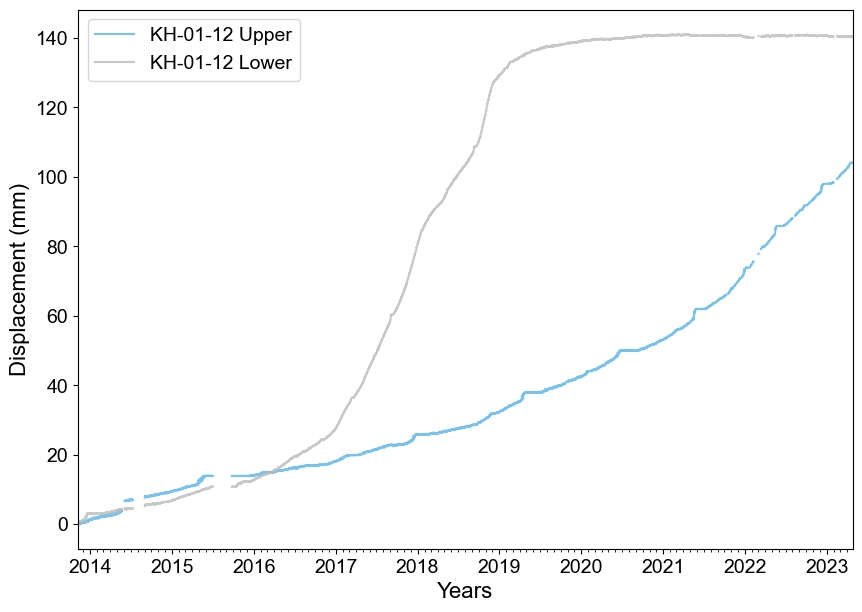

In [13]:
# Displacement borhole, GPS disp, gw, and seismic

# looking at creep bursts 

fig, ax = plt.subplots(figsize=(10, 7))

# # KH-01-12 Upper
file = KH0112DispUpperZone.copy()
# data = '12_days_velocity'
data = 'displacement_butterfilt'

disp = file[data]
ax.plot(disp.index, disp.values-np.nanmin(disp.values), color= colors[5], label='KH-01-12 Upper', alpha=0.8)

# KH-01-12 Lower
file = KH0112DispLowerZone.copy()
# data = '12_days_velocity'
data = 'displacement_butterfilt'

disp = file[data]
ax.plot(disp.index, disp.values-np.nanmin(disp.values), color=colors[8], label='KH-01-12 Lower', alpha=0.8)

# set axis labels
ax.set_ylabel('Displacement (mm)')
ax.set_xlabel('Years')

ax.legend()

# # Ensure the first year is included
# start_year = bh_data.index.min().year
# end_year = bh_data.index.max()
# ax[4].set_xlim(mdates.date2num([f'{start_year}-01-01', f'{end_year}']))

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax.xaxis.set_minor_locator(months)
# Apply the year format for the major ticks again
ax.xaxis.set_major_formatter(years_fmt)

# # removing space on sides of x-axis
# ax[0].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))
# ax[1].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))

path = 'plots\\'
save_name = 'KH0112_transition'
fig.savefig(path+save_name+'.png', dpi=600)

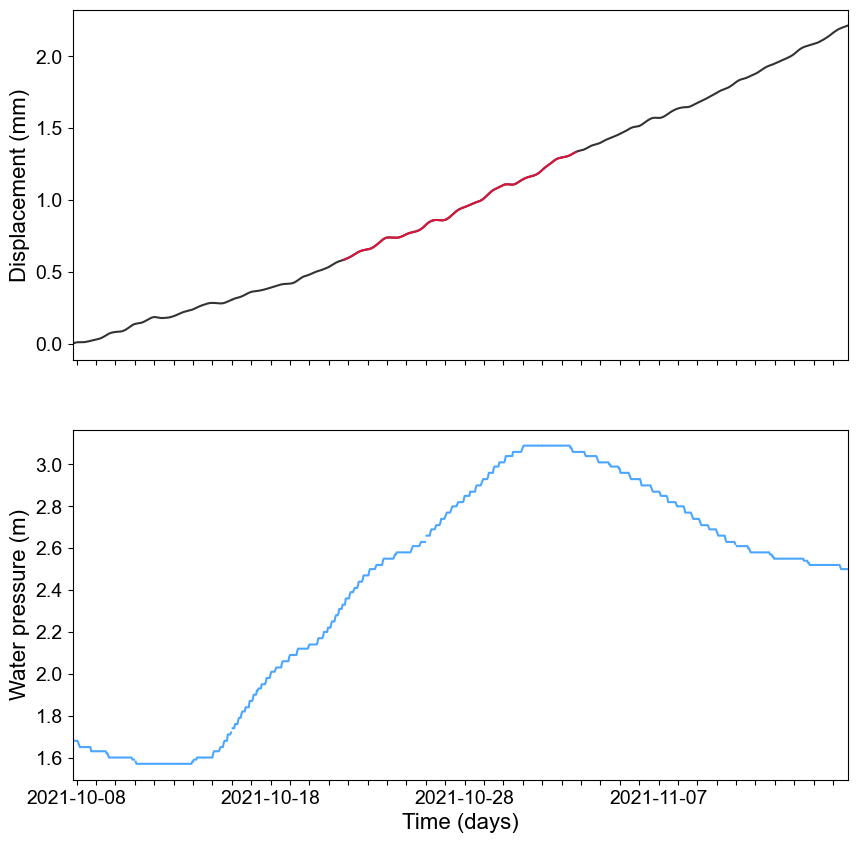

In [9]:
# Displacement borhole, GPS disp, gw, and seismic

# looking at creep bursts 

path = 'plots\\'


from matplotlib.dates import DateFormatter

# # KH-01-18
# i = 4 # creep burst number
# label = 'KH0118'
# save_name = f'{path}SI_localpeak_{label}_burst{i}'

# file = KH0118Disp_creep.copy()
# file2 = KH0118Disp.copy()
# # data = '4_days_velocity'
# data = 'displacement_butterfilt'
# file3 = KH0118Piez_raw.copy()
# # watermodule = 'Mod63_Water pressure in shear zone [kPa]:'  # pressure in shear zone

# watermodule = 'Mod63_Water pressure [m]:' # unconfined aquifer
# # watermodule_temp = 'Mod63_Temperature [C]:' # unconfined aquifer

# # watermodule = 'Mod82_Water pressure [m]:' # unconfined aquifer
# # watermodule_temp = 'Mod82_Temperature [C]:' # unconfined aquifer
# # watermodule = 'Mod26_Water pressure [m]:' # seasonal oscilations

# # KH-02-18
# i = 5 # creep burst number
# label = 'KH0218'
# save_name = f'{path}SI_localpeak_{label}_burst{i}'

# file = KH0218Disp_creep.copy()
# file2 = KH0218Disp.copy()
# # data = '4_days_velocity'
# data = 'displacement_butterfilt'
# file3 = KH0218Piez_raw.copy()
# # watermodule = 'Mod134_Water pressure [kPa]:'  # pressure in shear zone
# watermodule = 'Mod134_Water pressure [m]:' # unconfined aquifer
# watermodule_temp = 'Mod134_Temperature [C]:' # unconfined aquifer
# # watermodule = 'Mod27_Water pressure [m]:' # seasonal oscilations

# # KH-01-17
# i = 4
# label = 'KH0117'
# save_name = f'{path}SI_localpeak_{label}_burst{i}'

# file = KH0117Disp_creep.copy()
# file2 = KH0117Disp.copy()
# # data = '8_days_velocity'
# data = 'displacement_butterfilt'
# file3 = KH0117Piez_raw.copy()
# # watermodule = 'Mod69_Water pressure [kPa]:' # pressure in shear zone
# watermodule = 'Mod69_Water pressure [m]:' # shear zone
# watermodule_temp = 'Mod69_Temperature [C]:' # shear zone
# # watermodule = 'Mod56_Water pressure [m]:'  # unconfined aquifer
# # watermodule = 'Mod9_Water pressure [m]:' # seasonal oscilations unconfined aquifer

# KH-02-17 Lower
i = 8
label = 'KH0217lower'
save_name = f'{path}SI_localpeak_{label}_burst{i}'

file = KH0217DispLowerZone_creep.copy()
file2 = KH0217DispLowerZone.copy()
# data = '12_days_velocity'
data = 'displacement_butterfilt'
file3 = KH0217PiezLowerZone_raw.copy()
# watermodule = 'Mod52_Water pressure [kPa]:'  # pressure in shear zone
watermodule = 'Mod52_Water pressure [m]:' # unconfined aquifer
watermodule_temp = 'Mod52_Temperature [C]:' # unconfined aquifer
# watermodule = 'Mod29_Water pressure [m]:' # seasonal oscilations

# # KH-02-17 Upper
# i = 4
# label = 'KH0217upper'
# save_name = f'{path}SI_localpeak_{label}_burst{i}'

# file = KH0217DispUpperZone_creep.copy()
# file2 = KH0217DispUpperZone.copy()
# # data = '12_days_velocity'
# data = 'displacement_butterfilt'
# file3 = KH0217PiezUpperZone_raw.copy()
# # watermodule = 'Mod90_Water pressure [kPa]:'  # pressure in shear zone
# watermodule = 'Mod98_Water pressure [m]:' #shear zone
# watermodule_temp = 'Mod98_Temperature [C]:' # shear zone
# # watermodule = 'Mod29_Water pressure [m]:' # seasonal oscilations

# # KH-01-12 Lower
# label = 'KH0112lower'
# file = KH0112DispLowerZone_creep.copy()
# file2 = KH0112DispLowerZone.copy()
# # data = '12_days_velocity'
# data = 'displacement_butterfilt'
# file3 = KH0112PiezLowerZone_raw.copy()
# # watermodule = 'Mod30_Water pressure [kPa]:' # pressure in shear zone
# watermodule = 'Mod30_Water pressure [m]:' # open borehole
# watermodule_temp = 'Mod30_Temperature [C]:' # unconfined aquifer

# # # KH-01-12 Upper
# i = 8
# label = 'KH0112upper'
# save_name = f'{path}SI_localpeak_{label}_burst{i}'

# file = KH0112DispUpperZone_creep.copy()
# file2 = KH0112DispUpperZone.copy()
# # data = '12_days_velocity'
# data = 'displacement_butterfilt'
# file3 = KH0112PiezUpperZone_raw.copy()
# # watermodule = 'Mod30_Water pressure [kPa]:' # pressure in shear zone
# watermodule = 'Mod30_Water pressure [m]:' # open borehole
# watermodule_temp = 'Mod30_Temperature [C]:' # unconfined aquifer


# plotting

ncols = 1
nrows = 2

fig, ax = plt.subplots(nrows, ncols,figsize=(10, 10), sharex=True)

# data before and after event
window_hours = 24*7*2 # hours before and after creep burst * days * weeks
window = pd.Timedelta(window_hours, unit='h')
file.reset_index(inplace=True, drop=True) # making sure index is correct due to time slicing

time_idx_event = pd.date_range(file['date_start'][i], periods=len(file['date'][i].values), freq='H') # for creep burst
time_idx_event_pluss_disp = pd.date_range(file['date_start'][i]-window, periods=len(file['date'][i].values)+window_hours*2, freq='H') # for plotting of additional data

# plot x-axis with date        
disp = file2.loc[time_idx_event_pluss_disp, data]
disp = disp[disp.first_valid_index():]
creep = file2.loc[time_idx_event, data]
creep = creep[creep.first_valid_index():]
water = file3.loc[time_idx_event_pluss_disp, watermodule]
water = water[water.first_valid_index():]

ax[0].plot(disp.index, disp.values-np.nanmin(disp.values), color='black', label='Displacement', alpha=0.8)
ax[0].plot(creep.index, creep.values-np.nanmin(disp.values), color='crimson', label='Creep burst')
ax[1].plot(water.index, water.values, color='dodgerblue', label='Water pressure', alpha=0.8) # -np.nanmin(water.values)

# forcing date every day
import matplotlib.dates as dates
plt.gca().xaxis.set_major_locator(dates.DayLocator())
plt.gca().xaxis.set_major_formatter(dates.DateFormatter('%Y-%m-%d'))

# removing tick labels from the xaxis
n = 10  # keeps every n row so that approx 4 labels along axis
[l.set_visible(False) for (i,l) in enumerate(ax[1].xaxis.get_ticklabels()) if i % n != 0]

# set axis labels
ax[0].set_ylabel('Displacement (mm)')
ax[1].set_ylabel('Water pressure (m)')
ax[1].set_xlabel('Time (days)')

# # removing space on sides of x-axis
# ax[0].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))
# ax[1].set_xlim(pd.Timestamp(start_time), pd.Timestamp(end_time))

fig.savefig(save_name+'.png', dpi=600)

# Temperature in boreholes

In [63]:
import glob
import re
import os
import shutil

def remove_un_wanted_headers(dataframe):   
    mask = dataframe['Date:']!='Date:' # removing unwanted headers
    return dataframe[mask]

# datetime format changes in files
def clean_time(timeElement):
    if '.' in timeElement[:-5]:                                     
        cleanedTime = re.sub('[.]','/', timeElement) + ':00'
    if '/' in timeElement:
        cleanedTime = re.sub('[.]',':', timeElement) + ':00'
    return pd.to_datetime(cleanedTime, format='%d/%m/%Y %H:%M:%S')

def aggregate_data(file):       # setting dtype=object to remove warning, should make read_csv faster
    df = pd.read_csv(
        file, 
        sep='\t',
        decimal=",", 
        index_col=False,
        na_values=["(null)", "Totale"],
        dtype=object,
        encoding='unicode_escape',
    )
    df = remove_un_wanted_headers(df)
    # # set datetime to be index of df and remove date col as it is now index
    df.index = df['Date:'].apply(lambda x: clean_time(x))
    # # remove date col as it is now index
    df = df.drop(columns=["Date:"])
    # # drop columns only containing nans
    # empty_cols = df.isnull().sum() == df.shape[0] # old version that did not work on JTT2_wp_03
    empty_cols = df.isnull().sum() > (len(df)/4)*3 # more than 3/4th of df
    df = df.drop(columns=empty_cols.index[empty_cols.values]) 
    # drop nan values
    df = df.dropna()
    # assert nummeric type for all values
    for col in df.columns:
        df[col] = pd.to_numeric(df[col].apply(lambda x: x.replace(",", ".") if isinstance(x, str) else x))
    return df

def save_name(file):
    splittedName = file.split('\\')
    lastName = splittedName[-1]
    lastName = lastName[:-3] + 'csv'
    saveName = folder_name + lastName  # saveName = 'pre_processed_data\\'+ lastName
    return saveName

def save_concat_name(file):
    file = file[:-4]
    splittedName = file.split('\\')
    fileName = splittedName[-1]
    fileName = fileName.split('_')
    nameFirst = fileName[0]
    nameSecond = fileName[1]
    fileName = nameFirst + '_' + nameSecond + '.csv'
    saveName = folder_name + fileName #  saveName = 'processed_data\\' + fileName
    return saveName    

def save_concat_name_north_east(file):
    file = file[:-4]
    splittedName = file.split('\\')
    fileName = splittedName[-1]
    fileName = fileName.split('_')
    nameFirst = fileName[0]
    nameSecond = fileName[1]
    if nameSecond == 'disp': 
        nameThird = fileName[2]
        fileName = nameFirst + '_' + nameSecond + '_' + nameThird + '.csv'
    else:
        fileName = nameFirst + '_' + nameSecond + '.csv'
    saveName = folder_name + fileName # 'processed_data\\' + fileName
    return saveName 

# creating folder and deleting previous processed data
bhNames = glob.glob('borehole_temperature_data/*')
# bhNames = glob.glob('test/*')

# # creating folder and deleting previous processed data
folder_name = 'temp_data\\'

# # if os.path.exists(folder_name):
# shutil.rmtree(folder_name, ignore_errors=True) # dirty fix, somehow I am not able to make it work in another way

# shutil.rmtree(folder_name, ignore_errors=True)
# os.mkdir(folder_name)

# os.chdir(folder_name)

newData = []

print('Loading and pre-processing files:')
for i in bhNames:
    print_name = i.split('\\')
    print(f'{print_name[-1]}')
    newData = aggregate_data(i)
    saveName = save_name(i)
    newData.to_csv(saveName, sep='\t', index = True, index_label="Date:", header=True)
    
### load, concatinate, and save files to processed_data folder
bhNames = glob.glob('temp_data/*')

# # # creating folder and deleting previous processed data
folder_name = 'temp_processed_data\\'

# if os.path.exists(folder_name):
shutil.rmtree(folder_name, ignore_errors=True)
shutil.rmtree(folder_name, ignore_errors=True)
os.mkdir(folder_name)

# os.chdir(folder_name)

# making dictionary
my_dict = {}

for file_name in bhNames:
    parts = file_name.split('_')
    ending = parts[-1]
    start = ('_').join(parts[:-1])
    if start in my_dict.keys():
        my_dict[start].append(ending)
    else:
        my_dict[start] = [ending]

# iterating by dictionary and concatinating files

print('Concatinating files:')
for root_name in my_dict.keys():
    print_name = root_name.split('\\')
    print(f'{print_name[-1]}')
    main_df = pd.DataFrame()
    partitions = my_dict[root_name]
    for part in partitions:
        current_file_path = root_name + '_' + part
        current_df = pd.read_csv(current_file_path, sep='\t')
        main_df = pd.concat([main_df, current_df]).drop_duplicates()
    saveName = save_concat_name_north_east(current_file_path)
    main_df.to_csv(saveName, sep='\t', index=False, header=True)
print('Pre-processing finished')

Loading and pre-processing files:
JTT1_temp_1.txt
JTT1_temp_2.txt
JTT2_temp_1.txt
JTT2_temp_2.txt
JTT3_temp_1.txt
JTT3_temp_2.txt
Concatinating files:
JTT1_disp_000
JTT1_disp_090
JTT1_temp
JTT1_wp
JTT2_disp_000
JTT2_disp_090
JTT2_temp
JTT2_wp
JTT3_disp_000
JTT3_disp_090
JTT3_temp
JTT3_wp
Pre-processing finished


In [294]:
path = 'temp_processed_data\\' # folder
jtt1_temp = pd.read_csv(path +'JTT1_temp.csv', sep='\t', parse_dates=['Date:'])
jtt2_temp = pd.read_csv(path +'JTT2_temp.csv', sep='\t', parse_dates=['Date:']) 
jtt3_temp = pd.read_csv(path +'JTT3_temp.csv', sep='\t', parse_dates=['Date:']) 

In [84]:
# jtt1 module 74/75 = 45 m depth 4/5 = 115 m

def sub_sample_temp(df, moduleMask): # insert dataframe and mask for dataframe
    modules = df[moduleMask]
    if 'Temperature [°C]:' in df.columns:
        subSample = modules[['Date:', 'Module ID:', 'Temperature [°C]:']]
    subSample = subSample.set_index('Date:')
    return subSample

df = jtt1_temp. copy()

moduleMask = df['Module ID:'].isin([74])
temp_45m = sub_sample_temp(df, moduleMask)

moduleMask = df['Module ID:'].isin([4])
temp_115m = sub_sample_temp(df, moduleMask)

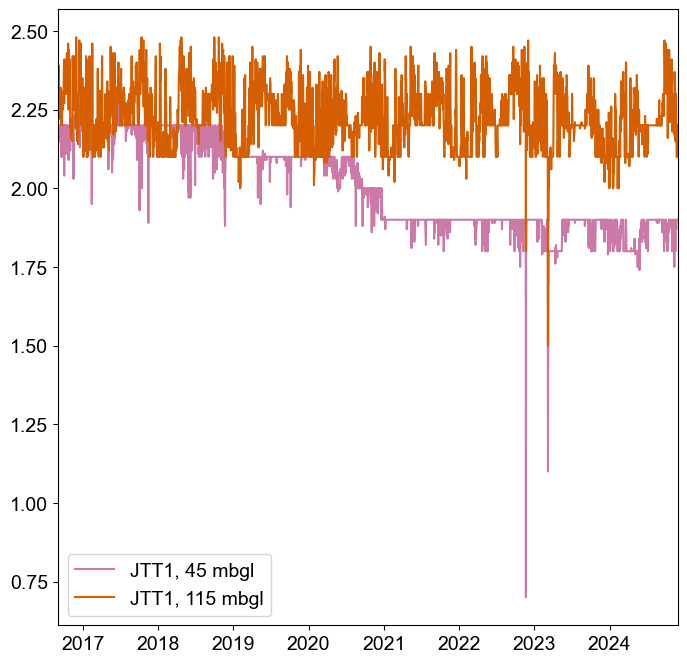

In [94]:
fig, ax = plt.subplots(1, 1, figsize=((8), (8)))

start_time = '2015-01-01'
end_time = '2024-11-27'

file = temp_45m.copy()
file =  file[file.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
ax.plot(file.index, file.iloc[:,1], color=colors[0], label='JTT1, 45 mbgl')

file = temp_115m.copy()
file =  file[file.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
ax.plot(file.index, file.iloc[:,1], color=colors[1], label='JTT1, 115 mbgl')

ax.legend()

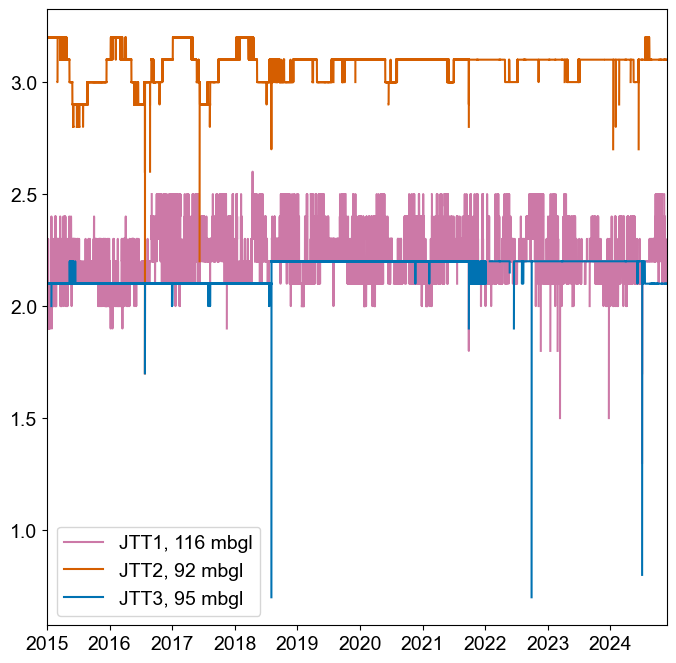

In [21]:
# see water temperature troughout the year
n_rows = 1
n_cols = 1
fig, ax = plt.subplots(n_rows, ncols=n_cols, sharex=True, figsize=((8), (8))) # , figsize=((13), (7))

# colors= ['darkorange', 'indianred', 'magenta', 'forestgreen', 'gray', 'gold', 'violet', 'teal', 'red']

start_time = '2015-01-01'
end_time = '2024-11-27'

# pos = (1.2,0.75) # plot position

# KH-02-17 and KH-01-12
axs = ax #[0]
file = JTT1Wp.copy()
file =  file[file.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
axs.plot(file.index, file.iloc[:,2], color=colors[0], label='JTT1, 116 mbgl')

file = JTT2WpUpperZone.copy() # module: 52 = 78 mbgl, 42 = 88 mbgl, 29 = 101 mbgl, 9 = 121 mbgl, 1 = 129 mbgl.
file =  file[file.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
axs.plot(file.index, file.iloc[:,2], color=colors[1], label='JTT2, 92 mbgl')

legend_pos = ['upper center', pos] # fixing position of legend
axs.legend(loc = legend_pos[0], bbox_to_anchor=legend_pos[1])

# KH-01-18
# axs = ax[1]
file = JTT3Wp.copy() # module: 63 = 43 mbgl, 26 = 80 mbgl, 6 = 153 mbgl, 1 = 189 mbgl.
file =  file[file.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
axs.plot(file.index, file.iloc[:,2], color=colors[2], label='JTT3, 95 mbgl')

# legend_pos = ['upper center', pos] # fixing position of legend
# axs.legend(loc = legend_pos[0], bbox_to_anchor=legend_pos[1])
         
# legend_pos = ['upper center', pos] # fixing position of legend
# axs.legend(loc = legend_pos[0], bbox_to_anchor=legend_pos[1])

axs.legend(loc ='lower left')

# n = 2  # keeps every n row
# [l.set_visible(False) for (i,l) in enumerate(ax[-1].xaxis.get_ticklabels()) if i % n != 0]

# # # # saving
# path = 'plots\\'
# save_name = f'{path}watertemperature_boreholes.png'
# fig.savefig(save_name, dpi=600) # , transparent=True,  bbox_inches='tight'

# Met statistics

In [ ]:
## Meteorological data from Senorge (real data) and XGEO (Modeled weather data that is better than the cautus weather station)
jtt_xgeo_rain = pd.read_pickle(path + 'xgeo_rain' + extension)
jtt_xgeo_temp = pd.read_pickle(path + 'xgeo_temp' + extension)
jtt_xgeo_snow = pd.read_pickle(path + 'xgeo_snow' + extension)
jtt_temp = pd.read_pickle(path + 'jtt_temp' + extension)
jtt_precip = pd.read_pickle(path + 'jtt_precip' + extension)
jtt_snow = pd.read_pickle(path + 'jtt_snow' + extension)
jtt_xgeo_surfacerunnoff = pd.read_pickle(path + 'xgeo_surfacerunnoff' + extension)
JT_CLM_1_2 = pd.read_pickle(path + 'JT_CLM_1_2' + extension)
ST = pd.read_pickle(path + 'ST' + extension)
tlt2_temp = pd.read_pickle(path + 'tlt2_temp' + extension)
tlt9_temp = pd.read_pickle(path + 'tlt9_temp' + extension)
hobos = pd.read_pickle(path + 'hobos' + extension)
temp1 = pd.read_pickle(path + 'temp1' + extension)

# river data measurements
river1 = pd.read_pickle(path + 'river1' + extension)
river2 = pd.read_pickle(path + 'river2' + extension)

gam_temp = pd.read_pickle(path + 'gam_temp' + extension)
gam_precip = pd.read_pickle(path + 'gam_precip' + extension)
gam_xgeo_precip = pd.read_pickle(path + 'gam_xgeo_precip' + extension)
gam_xgeo_temp = pd.read_pickle(path + 'gam_xgeo_temp' + extension)
gam_xgeo_snow = pd.read_pickle(path + 'gam_xgeo_snow' + extension)
gam_xgeo_surfacerunnoff = pd.read_pickle(path + 'gam_xgeo_surfacerunnoff' + extension)


In [ ]:
# Comparing xgeo to real values

NameError: name 'jtt_precip' is not defined

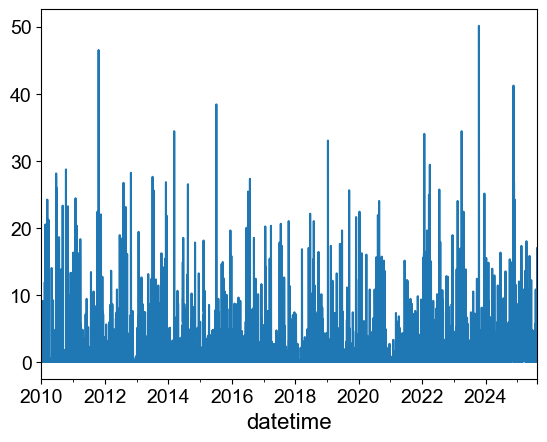

In [88]:
jtt_xgeo_rain.iloc[:,0].plot()
jtt_precip.iloc[:,0].plot()

<Axes: xlabel='datetime'>

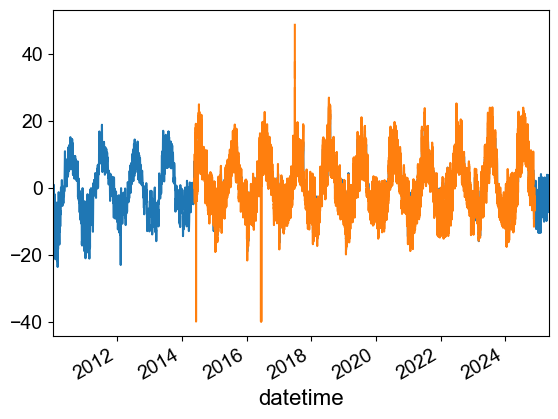

In [145]:
jtt_xgeo_temp.iloc[:,0].plot()
jtt_temp.iloc[:,0].plot()

<Axes: xlabel='datetime'>

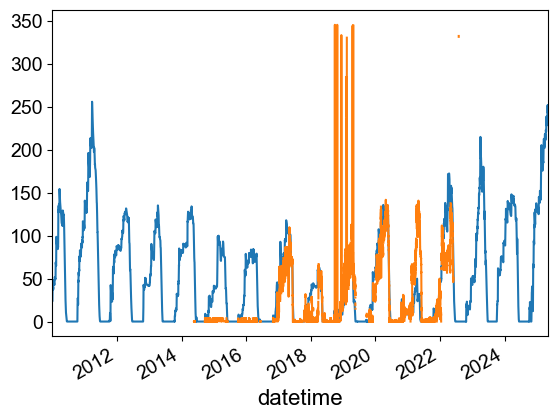

In [147]:
jtt_xgeo_snow.iloc[:,0].plot()
jtt_snow.iloc[:,0].plot()

In [345]:
########### Cleaning DMS and GPS ############
from scipy.signal import savgol_filter

# rolling mean filter window
window_mean = 14

# savgol parameters
window_size = 7
poly_order = 3

def clean_lowpassfilt(file, colnmbr=0, name='Water table [m bgl]:'): # colnmbr is the column chosen to lowpass filter, name is wanted name for filtered column
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    # file = file.resample('1D').median() # matching interval of cleaning parameters
    file = file.dropna()
    file['interpolated'] = file.iloc[:,colnmbr].interpolate(method='linear', limit_direction ='forward')
    # file['filt'] = butter_lowpass_filter(file.iloc[:,-1], cutoff, fs, order) # replace original by lowpass filtered
    file['filt'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    file['filt'] = file['filt'].rolling(window=window_mean, center=True).median() # rolling median
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    file.rename(columns={'filt':name}, inplace=True) # I call it the same as original if it was dependent on name in scripts lower down
    return file

In [349]:
col_name = 'temperature'
df = gam_temp.copy()
df = df.resample(f'1D').mean() # downsampling with median value to seismic data resolution
df.loc[:,col_name] = clean_lowpassfilt(df, colnmbr=0, name=f'{col_name}')

,temperature,year,month,day
datetime,,,,
2014-05-22,NaN,2014.0,5.0,22.0
2014-05-23,NaN,2014.0,5.0,23.0
2014-05-24,NaN,2014.0,5.0,24.0
2014-05-25,NaN,2014.0,5.0,25.0
2014-05-26,NaN,2014.0,5.0,26.0


In [149]:
jtt_xgeo_rain.head()

,precip,year,month,day
datetime,,,,
2010-01-01 06:00:00,0.0,2010,1,1
2010-01-02 06:00:00,0.0,2010,1,2
2010-01-03 06:00:00,8.2,2010,1,3
2010-01-04 06:00:00,4.6,2010,1,4
2010-01-05 06:00:00,0.0,2010,1,5


<Axes: xlabel='datetime'>

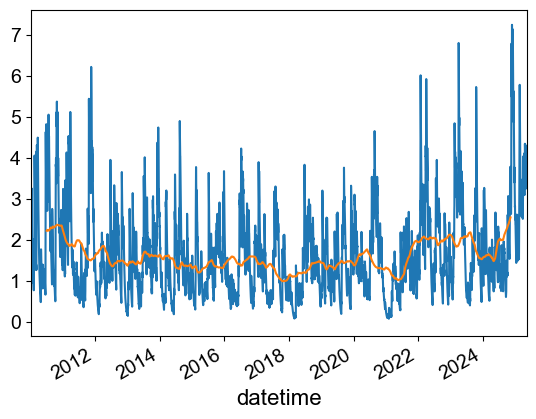

In [181]:
def Pc(df, tc, col_name='colname'):
    """
    Compute exponentially weighted cumulative precipitation (Pc) for a DataFrame
    with datetime index and a 'col_name' column.

    Parameters:
    - df: DataFrame with datetime index and 'precip' column
    - tc: characteristic time (in days)

    Returns:
    - df: DataFrame with an added 'Pc' column
    """
    df = df.copy()
    
    # Ensure datetime index
    if not isinstance(df.index, pd.DatetimeIndex):
        raise ValueError("DataFrame must have a DatetimeIndex")

    # Convert time to days since start
    t = (df.index - df.index[0]).total_seconds() / (24 * 3600)
    P = df[col_name].values
    Pc = np.zeros_like(P)

    for i in range(len(t)):
        delta_t = t[i] - t[:i+1]  # t_i - t_j for j = 0 to i
        weights = np.exp(-delta_t / tc)
        numerator = np.sum(P[:i+1] * weights)
        denominator = np.sum(weights)
        Pc[i] = numerator / denominator

    df['Pc'] = Pc
    return df


tc = 14
test = Pc(jtt_xgeo_rain, tc, col_name='precip')

## smoothing
window_mean=30
smooth = test['Pc'].dropna().rolling(window=window_mean, center=True).mean()

test.loc[:,'Pc'].plot()
smooth.plot()

89.83006

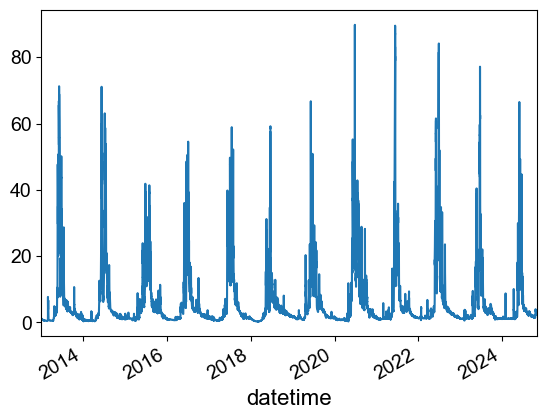

In [101]:
# Checking intensity of river
river1.iloc[:,0].plot()

In [117]:
# max_row_df = river1.loc[[river1.iloc[:,0].idxmax()]]
# max_row_df

df = river1.copy()
col_name = df.iloc[:,0].name

df = df[df.index.slice_indexer(start_time,end_time)]
med = []
mini = []
maxi = []
cum = []
for i,d in enumerate(df['year'].unique()):
    file = df[df['year'] == d]
    # print(f'year: {d}')

    cum.append(np.nanmax(file[col_name]))

print('\nTotal stats per year')
print(f'max cum: {np.nanmax(cum)}')
print(f'min cum: {np.nanmin(cum)}')
print(f'med cum: {np.nanmedian(cum)}')


Total stats per year
max cum: 89.83006
min cum: 41.86502
med cum: 66.64098


In [94]:
jtt_xgeo_precip_snowmelt.head()

,precip_and_snowmelt,year,month,day
datetime,,,,
2010-01-01,0,2010,1,1
2010-01-02,0,2010,1,2
2010-01-03,0,2010,1,3
2010-01-04,0,2010,1,4
2010-01-05,0,2010,1,5


year: 2015
min: -8.67
median: -0.56
max: 16.27
 
year: 2016
min: -10.89
median: 0.73
max: 13.52
 
year: 2017
min: -6.5
median: -0.87
max: 15.7
 
year: 2018
min: -9.57
median: 0.014999999999999986
max: 17.82
 
year: 2019
min: -4.8
median: -0.165
max: 16.06
 
year: 2020
min: -5.0
median: -0.01
max: 15.54
 
year: 2021
min: -11.39
median: -1.2650000000000001
max: 16.7
 
year: 2022
min: -4.24
median: 0.055
max: 19.04
 
year: 2023
min: -4.18
median: 0.79
max: 16.42
 
year: 2024
min: -0.68
median: 0.13
max: 18.32
 
Total stats per time interval
max: 19.04
min: -11.39
median: 0.10500000000000001


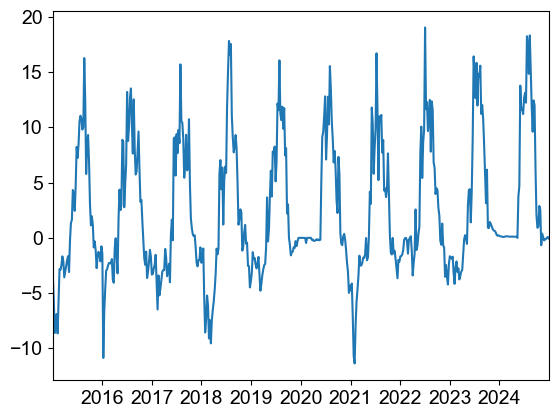

In [114]:
# Jettan
start_time = '2015-01-01'
end_time = '2025-08-12'
# file = jtt_temp.copy()
# file =  file[file.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]

# df = jtt_xgeo_temp.copy() # daily. basically same as observed temp but no outliers
# col_name = 'temperature'

df = jtt_temp_GST.copy() # weekly
col_name = 'Mean'
df['year'] = df.index.year # adding year column

# df = jtt_xgeo_precip_snowmelt.copy() # daily
# col_name = 'precip_and_snowmelt'

# df = jtt_xgeo_rain.copy()
# col_name = 'precip'

# df = test.copy()
# col_name = 'Pc'

# df = river1.copy()
# # col_name = df.iloc[:,0].name
# col_name = 'volume'
# df['volume'] = df.iloc[:,0]*1800 # getting volume (m3) not m3/s
# df = df.resample(f'1D').mean() # downsampling with median value to seismic data resolution

# # Gamanjunni
# start_time = '2021-01-01'
# end_time = '2025-08-12'

# df = gam_xgeo_temp.copy()
# col_name = 'temperature'

# df = gam_xgeo_precip_snowmelt.copy() # daily
# col_name = 'precip_and_snowmelt'



## Cleaning
# df = df.resample(f'1D').mean() # downsampling with median value to seismic data resolution
# df.loc[:,col_name] = clean_lowpassfilt(df, colnmbr=0, name=f'{col_name}')
# df = df.dropna()

df = df[df.index.slice_indexer(start_time,end_time)]
med = []
mini = []
maxi = []
cum = []
for i,d in enumerate(df['year'].unique()):
    file = df[df['year'] == d]
    print(f'year: {d}')
    
    # temp stats
    print(f'min: {np.nanmin(file[col_name])}')
    print(f'median: {np.nanmedian(file[col_name])}')
    print(f'max: {np.nanmax(file[col_name])}')
    # print(f'cumulated: {np.nansum(file[col_name])}')
    print(' ')

    med.append(np.nansum(file[col_name])) # sum precip/surface runoff
    med.append(np.nanmedian(file[col_name])) # median, temperature
    mini.append(np.nanmin(file[col_name]))
    maxi.append(np.nanmax(file[col_name]))
    # med.append(np.nanmax(file[col_name])) # max, river peak flow

print('Total stats per time interval')
print(f'max: {np.nanmax(df[col_name])}')
print(f'min: {np.nanmin(df[col_name])}')
print(f'median: {np.nanmedian(df[col_name])}')

     # # precipitation like stats
    # file = file.groupby(['month'])[col_name].sum().values
    # print(f'max: {np.nanmax(file)}')
    # print(f'median: {np.nanmedian(file)}')
    # print(f'cumulated: {np.nansum(file)}')
    # print(' ')
    # med.append(np.nanmedian(file))
    # mini.append(np.nanmin(file))
    # maxi.append(np.nanmax(file))
    # cum.append(np.nansum(file))

# # precip numbers
# print('\nTotal stats per month')
# print('median :',np.nanmedian(med))
# print('min :',np.nanmin(mini))
# print('max :',np.nanmax(maxi))

# print('\nTotal stats per year')
# print(f'max cum: {np.nanmax(cum)}')
# print(f'min cum: {np.nanmin(cum)}')
# print(f'med cum: {np.nanmedian(cum)}')

plt.plot(df.loc[:,col_name])

In [134]:
start_time = '2015-01-01'
end_time = '2025-08-12'
# file = jtt_temp.copy()
# file =  file[file.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]

# df = jtt_xgeo_temp.copy() # daily. basically same as observed temp but no outliers
# col_name = 'temperature'

df = jtt_temp_GST.copy() # weekly
df = df[df.index.slice_indexer(start_time,end_time)]
# df.loc[:,'Mean']
np.mean(df.loc[:,'Mean'])

2.3874137931034483

In [105]:
# average maximum river discharge
(36+49+37+56+59+84+76+63+52)/9

56.888888888888886

In [151]:
jtt_xgeo_temp.tail()

,temperature,year,month,day
datetime,,,,
2025-05-04 06:00:00,-5.6,2025,5,4
2025-05-05 06:00:00,-4.4,2025,5,5
2025-05-06 06:00:00,-3.2,2025,5,6
2025-05-07 06:00:00,-2.2,2025,5,7
2025-05-08 06:00:00,-1.8,2025,5,8


In [60]:
df = jtt_precip.iloc[:,0].copy()
df = df.resample('1D').sum() 
df.head()

datetime
2014-05-22    0.0
2014-05-23    0.0
2014-05-24    0.0
2014-05-25    0.0
2014-05-26    0.0
Freq: D, Name: precip, dtype: float64

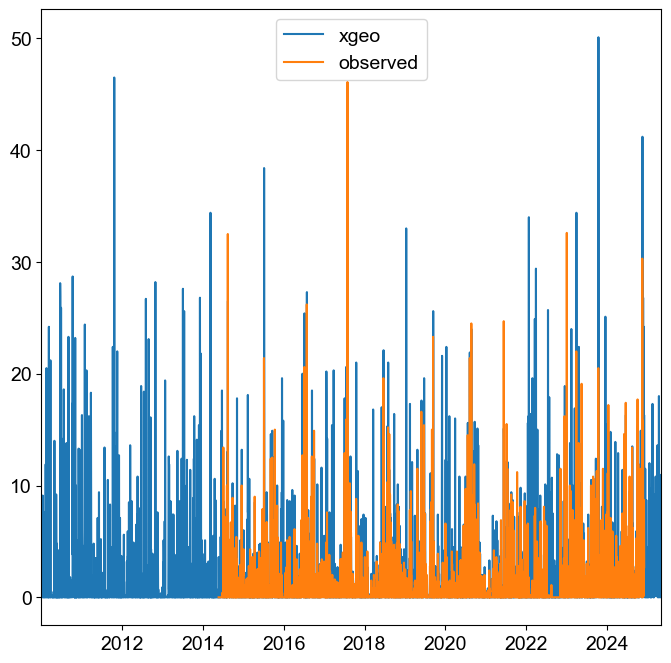

In [62]:
n_rows = 1
n_cols = 1
fig, ax = plt.subplots(n_rows, ncols=n_cols, sharex=True, figsize=((8), (8))) # , figsize=((13), (7))

ax.plot(jtt_xgeo_rain.iloc[:,0], label='xgeo')
# ax.plot(jtt_precip.iloc[:,0], label='observed')
ax.plot(df, label='observed')


ax.legend()

# Seismic analysis

In [ ]:
# Longterm trend

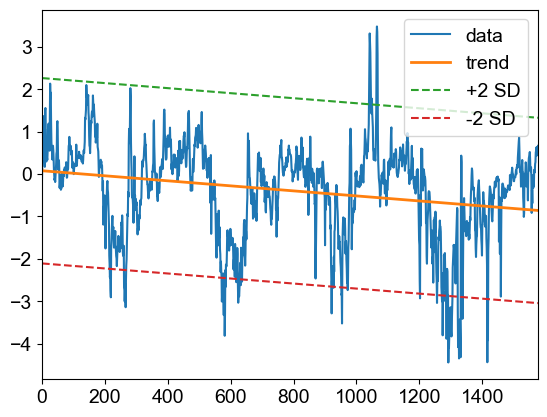

In [9]:
import numpy as np
import matplotlib.pyplot as plt

# --- your data ---
df = seismic.dropna().copy()
df = df[df.index.slice_indexer('2021-01-01', '2025-08-12')]
df = df.dropna()

x = df.iloc[:, 0].reset_index().index.values   # integer index after reset
y = df.iloc[:, 0].values

# --- linear trend ---
a, b = np.polyfit(x, y, 1)
trend = a * x + b

# --- residuals & SD ---
residuals = y - trend
sd = np.std(residuals)

# --- ±2 SD threshold curves ---
upper = trend + 2 * sd
lower = trend - 2 * sd

# --- plot ---
plt.plot(x, y, label='data')

plt.plot(x, trend, label='trend', linewidth=2)
plt.plot(x, upper, '--', label='+2 SD')
plt.plot(x, lower, '--', label='-2 SD')

plt.legend()
plt.show()

Slope of trend: -0.21676612940535306 % per year


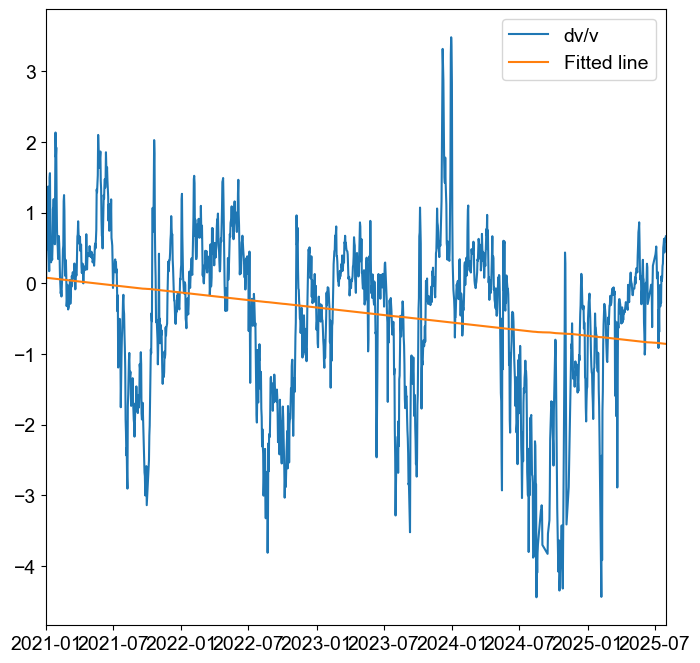

In [554]:
start_time = '2021-01-01'
end_time = '2025-08-12'

df = seismic.dropna().copy()
df = df[df.index.slice_indexer(start_time,end_time)]
df = df.dropna()

x = df.iloc[:,0].reset_index().index.values
y = df.iloc[:,0].values
from scipy.stats import linregress
# Perform linear regression
slope, intercept, r_value, p_value, std_err = linregress(x, y)

# Generate points for the fitted line
x_fit = x
y_fit = slope * x_fit + intercept

n_rows = 1
n_cols = 1
fig, ax = plt.subplots(n_rows, ncols=n_cols, sharex=True, figsize=((8), (8))) # , figsize=((13), (7))

ax.plot(df.index, y, label='dv/v')
ax.plot(df.index, y_fit, label='Fitted line')
ax.legend()

print('Slope of trend:',slope*365,'% per year')

In [92]:
## Linear trends during the seismic period (normalized)
# temp is +0.05
# GST temp is + 0.52
# surfacerunoff is -0.002
# river is 0.01
# BH-1 is + 0.35
# BH-2 upper is + 0.41
# BH-2 lower is + 0.13
# BH-3 is +0.005

Slope of trend: 0.5220694084255613


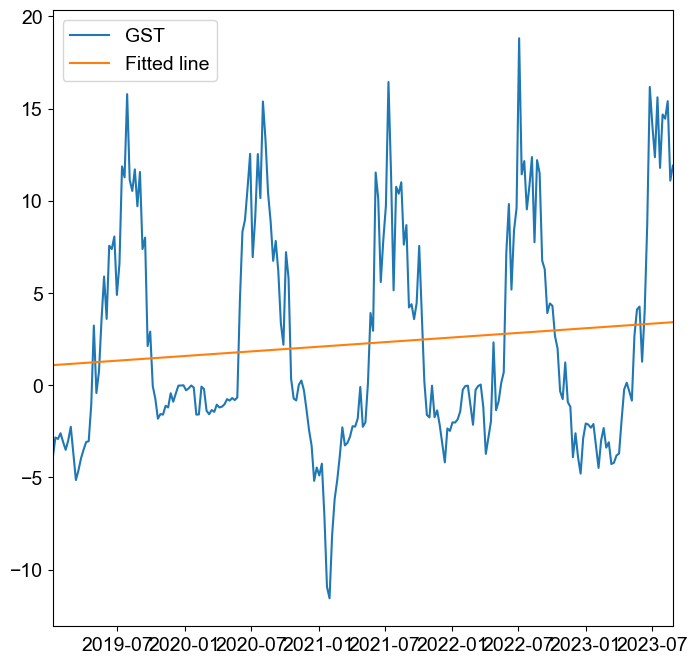

In [101]:
start_time = '2019-01-01'
end_time = '2025-01-01'

df = jtt_xgeo_temp.copy()
df = df.resample(f'1W').mean()

df = jtt_temp_GST.copy() # weekly

# df = jtt_xgeo_surfacerunnoff.copy() # daily
# df = df.resample(f'1W').mean()

# df = river1.copy()
# df = df.resample(f'1W').mean() # downsampling with median value to seismic data resolution


# # # Borehole data
# df = JTT1Disp.iloc[:,0].copy()
# df = JTT2DispUpperZone.iloc[:,0].copy()
# df = JTT2WpUpperZone.iloc[:,0].copy()
# df = JTT3Disp.iloc[:,0].copy()
# df = clean_lowpassfilt(df, colnmbr=0, name=f'{df.name}')
# df = df.resample('1d').mean() # hourly data so sum to daily
# df = diff_shift(df,30) # 30 day velocity
# df = df.resample('1W').mean() # hourly data so sum to daily



##### calculating and plotting
df = df[df.index.slice_indexer(start_time,end_time)]
df = df.dropna()

x = df.iloc[:,0].reset_index().index.values
x = np.array(x, dtype=float)
y = df.iloc[:,0].values
y = np.array(y, dtype=float)
from scipy.stats import linregress
# Perform linear regression
slope, intercept, r_value, p_value, std_err = linregress(x, y)

# Generate points for the fitted line
x_fit = x
y_fit = slope * x_fit + intercept

n_rows = 1
n_cols = 1
fig, ax = plt.subplots(n_rows, ncols=n_cols, sharex=True, figsize=((8), (8))) # , figsize=((13), (7))

# ax.plot(df.index, y, label='Air temperature')
ax.plot(df.index, y, label='GST')
ax.plot(df.index, y_fit, label='Fitted line')
ax.legend()


# Normalize to make comparable
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler() # normalize between 0 and 1, has to be this when dataset is not normally distributed
scaled = pd.DataFrame(scaler.fit_transform(df), columns=df.columns, index=df.index)

x = scaled.iloc[:, 0].reset_index().index.values.astype(float)
y = scaled.iloc[:, 0].values.astype(float)

x1, x2 = x[0], x[-1] 
y1, y2 = y[0], y[-1]

# Calculate slope between start and end
slope = (y2 - y1) / (x2 - x1)

print('Slope of trend:',slope*len(df))
# print('total % increase:',((df.iloc[-1,0]-df.iloc[0,0])/df.iloc[0,0])*100) # does not seem to make much sense..

## Figure 10

In [19]:
df.index

DatetimeIndex(['2019-01-01', '2019-01-02', '2019-01-03', '2019-01-04', '2019-01-05', '2019-01-06', '2019-02-08', '2019-02-09', '2019-02-10', '2019-02-11',
               ...
               '2025-06-23', '2025-06-24', '2025-06-25', '2025-06-26', '2025-07-02', '2025-07-03', '2025-07-04', '2025-07-05', '2025-07-06', '2025-07-07'], dtype='datetime64[ns]', length=1917, freq=None)

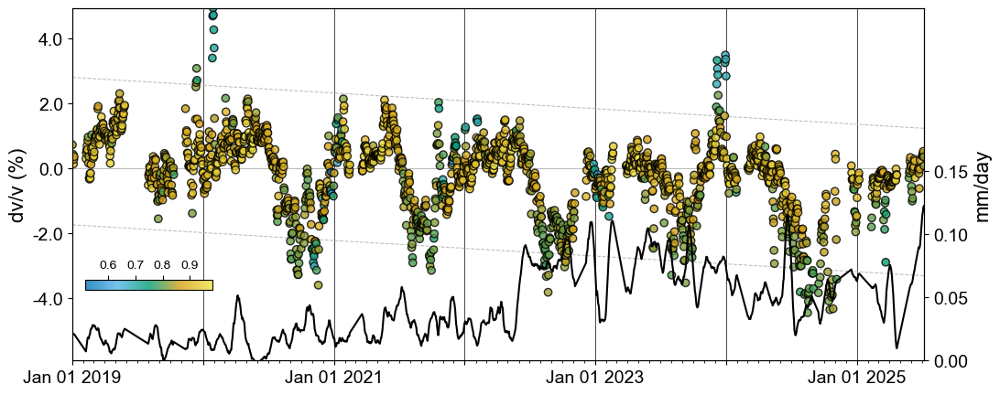

In [21]:
# making figure 10
# plotting

fig, ax = plt.subplots(figsize=(12, 5)) # , sharex=True
# fig.subplots_adjust(hspace = -.045)

interval = 30 # down sampling days
vel_interval = 1 # smoothing window

# turn on or off velocity
vel_true = True 
# vel_true = False

# # Borehole data
file = JTT1Disp.iloc[:,0].copy()
# # file = JTT2DispUpperZone.iloc[:,0].copy()
# file = JTT2WpUpperZone.iloc[:,0].copy()
# file = JTT3Disp.iloc[:,0].copy()
file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
file = file.resample('1d').mean() # hourly data so sum to daily
file = rolling_slope(file,30) # 30 day velocity

# ## smoothing
# window_mean=30
# file = file.dropna().rolling(window=window_mean, center=True).mean()


df = pd.concat([file, seismic.dropna()], axis=1)
df = df.dropna() # remove nans

# df = pd.concat([intdef_smoothed, seismic], axis=1) # smoothed int def
start_time = pd.Timestamp('2019-01-01')
end_time = pd.Timestamp('2025-07-31')
df =  df[df.index.slice_indexer(start_time,end_time)]

# # do just one year
# start_time = pd.Timestamp('2022-01-01')
# end_time = pd.Timestamp('2023-01-01')
# df =  df[df.index.slice_indexer(start_time,end_time)]

# # do just one year
# start_time = pd.Timestamp('2019-01-01')
# end_time = pd.Timestamp('2020-01-01')
# df =  df[df.index.slice_indexer(start_time,end_time)]

# Add a vertical line for each year
for year in range(df.index.year.min(), df.index.year.max()+1):
    ax.axvline(pd.Timestamp(f'{year}-01-01'), color='black', linewidth=0.5, zorder=1)

# # SD lines
# mean = df.loc[:,'dv/v(%)'].mean()
# std = df.loc[:,'dv/v(%)'].std()

# lower_bound = mean - 2 * std
# upper_bound = mean + 2 * std

# ax.axhline(y=upper_bound, color=colors[10], linestyle='--', linewidth=0.75, zorder=1) # upper sd line
# ax.axhline(y=lower_bound, color=colors[10], linestyle='--', linewidth=0.75, zorder=1) # lower sd line

# lineartrend SD lines
x = df.index.view('int64') 
# x = df.loc[:, 'dv/v(%)'].reset_index().index.values   # integer index after reset
y = df.loc[:, 'dv/v(%)'].values

# --- linear trend ---
a, b = np.polyfit(x, y, 1)
trend = a * x + b

# --- residuals & SD ---
residuals = y - trend
std = np.std(residuals)

# --- ±2 SD threshold curves ---
upper_bound = trend + 2 * std
lower_bound = trend - 2 * std

ax.plot(df.index, upper_bound, color=colors[10], linestyle='--', linewidth=0.75, zorder=1)
ax.plot(df.index, lower_bound, color=colors[10], linestyle='--', linewidth=0.75, zorder=1)

ax.axhline(y=0, color=colors[10], linestyle='-', linewidth=0.75, zorder=1) # zero line

color_gradient = [
    "#0072B2",  # Dark Blue
    "#56B4E9",  # Light Blue
    "#009E73",  # Light Green
    "#D4A017",  # Dark Yellow (warmer, closer to orange)
    "#F0E442"   # Bright Yellow
]

# Create a continuous colormap
cmap = mcolors.LinearSegmentedColormap.from_list("colors", color_gradient, N=256)
norm = mcolors.Normalize(vmin=np.nanmin(df.loc[:,'cc']), vmax=np.nanmax(df.loc[:,'cc']))
sc = ax.scatter(df.index, df.loc[:,'dv/v(%)'], c=df.loc[:,'cc'], cmap=cmap, norm=norm, edgecolor='k', alpha=0.8)

# ## mean value
# seismic['dV/V_interp'] =  seismic.iloc[:,0].interpolate(method='linear', limit=3, limit_direction='both')
# seismic['dV/V_mean'] = seismic.loc[:,'dV/V_interp'].rolling(window=roll_window, center=True).mean()
# ax[1].plot(seismic.index, seismic.loc[:,'dV/V_mean'], color=colors[1])

# colorbar
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
# Add inset colorbar inside the plot (lower left)
# cax = inset_axes(ax, width="20%", height="4%", loc="lower left", borderpad=2)
cax = ax.inset_axes([0.015, 0.2, 0.15, 0.03]) # x, y, width, height
cbar = plt.colorbar(sc, cax=cax, orientation="horizontal")

# Set colorbar limits and ticks
cbar.set_ticks(np.arange(0.6, 0.91, 0.1))  # Tick positions
# cbar.set_label("CC", fontsize=10, labelpad=4)

# Format colorbar text (move to top, smaller font)
cbar.ax.xaxis.set_label_position("top")  # Move label above
cbar.ax.xaxis.set_ticks_position("top")  # Move ticks above
cbar.ax.tick_params(labelsize=10)  # Reduce font size

# ax.axhline(y=0, color='k', linestyle='-', linewidth=0.75) # horizontal line

ax_y = ax.twinx()
ax_y.plot(df.index, df.iloc[:,0], color=colors[7]) # BH-1

# modifying to make the plot display on the upper half of the figure
ymin, ymax = ax_y.get_ylim()
ax_y.set_ylim(0, ymax+.15) # Set limits for secondary y-axis
ymin, ymax = ax.get_ylim()
ax.set_ylim(ymin-1, ymin*-1)

# Remove ticks and labels below zero on secondary y-axis
ax.set_yticks([-4.0, -2.0, 0.0, 2.0, 4.0])
ax.set_yticklabels(['-4.0', '-2.0', '0.0', '2.0', '4.0'])

# Remove ticks and labels below zero on secondary y-axis
ax_y.set_yticks([0.00, 0.05, 0.10, 0.15])
ax_y.set_yticklabels(['0.00', '0.05', '0.10', '0.15'])
##

ax_y.set_ylabel('mm/day')
ax.set_ylabel('dv/v (%)') 

# Major ticks for years
years = mdates.YearLocator()   # Locator for every year
years_fmt = mdates.DateFormatter('%Y') # Formatter for displaying year
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)

# Minor ticks for months
months = mdates.MonthLocator()   # Locator for every month
months_fmt = mdates.DateFormatter('%b') # Formatter for displaying month (Jan, Feb, etc.)
ax.xaxis.set_minor_locator(months)
ax.xaxis.set_major_locator(mdates.YearLocator(1, month=1, day=1))  # Major ticks on Jan 1st of every year
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d %Y')) 

# removing tick labels from the xaxis
n = 2  # keeps every n row
[l.set_visible(False) for (i,l) in enumerate(ax.xaxis.get_ticklabels()) if i % n != 0] # Get 'none' from this for some reason

# # # saving
path = 'plots\\'
save_name = f'{path}Figure10.png'
# save_name = f'{path}Figure2_A0poster.png'
fig.savefig(save_name, dpi=600) # , transparent=True,  bbox_inches='tight'

(18993.0, 19357.0)

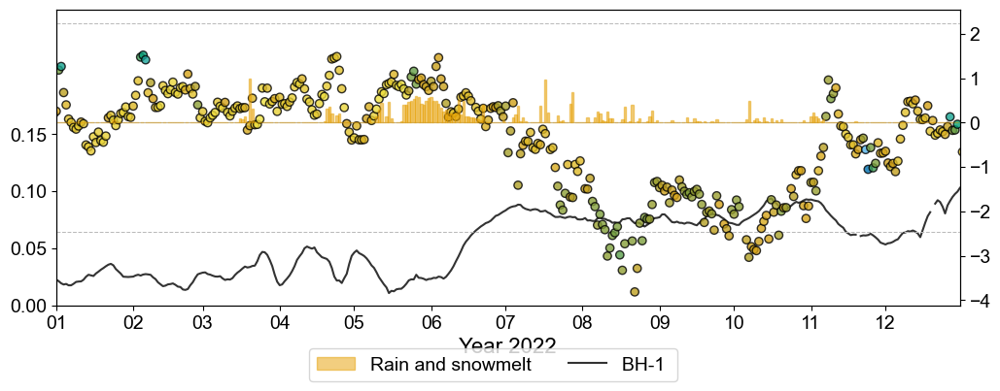

In [30]:
# Lower part of fig 10

# plotting
ncols = 1
nrows = 1 # len(file['event'].unique()) // ncols + (len(file['event'].unique()) % ncols > 0)

fig, ax = plt.subplots(nrows, ncols,figsize=(12, 5))
# fig.subplots_adjust(hspace = .4)

# manually picked start and end times for following data
file3 = JTT1Disp.copy()
start_time = pd.Timestamp('2021-12-01')
end_time = pd.Timestamp('2023-01-31')
interval = 1 # down sampling days
vel_interval = 30 # smoothing window  # Remember days

# turn on or off velocity
vel_true = True 
# vel_true = False

ax_y = ax.twinx()
# ax_y = ax[0]
# Adding seismic also here?
color_gradient = [
    "#0072B2",  # Dark Blue
    "#56B4E9",  # Light Blue
    "#009E73",  # Light Green
    "#D4A017",  # Dark Yellow (warmer, closer to orange)
    "#F0E442"   # Bright Yellow
]

# Create a continuous colormap
df = seismic.copy()

# SD lines
mean = df.loc[:,'dv/v(%)'].mean()
std = df.loc[:,'dv/v(%)'].std()

lower_bound = mean - 2 * std
upper_bound = mean + 2 * std

ax_y.axhline(y=upper_bound, color=colors[10], linestyle='--', linewidth=0.75, zorder=1) # upper sd line
ax_y.axhline(y=lower_bound, color=colors[10], linestyle='--', linewidth=0.75, zorder=1) # lower sd line
ax_y.axhline(y=0, color=colors[10], linestyle='-', linewidth=0.75, zorder=1) # zero line

df =  df[df.index.slice_indexer(start_time,end_time)]
cmap = mcolors.LinearSegmentedColormap.from_list("colors", color_gradient, N=256)
norm = mcolors.Normalize(vmin=np.nanmin(df.loc[:,'cc']), vmax=np.nanmax(df.loc[:,'cc']))
file = df.loc[:,'dv/v(%)']
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
# sc = ax_y.scatter(file.index, normalized, c=df.loc[:,'cc'], cmap=cmap, norm=norm, edgecolor='k', alpha=0.8)

sc = ax_y.scatter(file.index, file, c=df.loc[:,'cc'], cmap=cmap, norm=norm, edgecolor='k', alpha=0.8)

# Disp data

# Boreholes
file = JTT1Disp.iloc[:,0]
file =  file[file.index.slice_indexer(start_time,end_time)]
# zero = file[file.first_valid_index()]
file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
file = file.resample('1d').median() # downsampling with median value
if vel_true:
    file = diff_shift(file, vel_interval) # velocity
# file = file.resample(f'{interval}d').median()
file = file.replace(np.nan,np.inf) # changing nan to inf
ax.plot(file.index, file, color=colors[7], label='BH-1 ', alpha=0.8)

## Normalized
# normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
# file = file.replace(np.nan,np.inf) # changing nan to inf
# ax[0].plot(file.index, normalized, color=colors[7], label='BH-1 ', alpha=0.8)

# file = JTT2DispUpperZone.iloc[:,0]
# file =  file[file.index.slice_indexer(start_time,end_time)]
# # zero = file[file.first_valid_index()]
# file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
# file = file.resample(f'{interval}d').median() # downsampling with median value
# if vel_true:
#     file = diff_shift(file, vel_interval) # velocity
# normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
# file = file.replace(np.nan,np.inf) # changing nan to inf
# ax[0].plot(file.index, normalized, color=colors[2], label='BH-2 Upper zone and water pressure', alpha=0.8)

# # GPS data
# data = '2d'

# #### Single GPS
# # df =  jett_gps4 # Jtt1 gps 5 or gps 4
# # df =  df[df.index.slice_indexer(start_time,end_time)]
# # df = df[data].dropna()
# # df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
# # df = df.resample(f'{interval}d').median() # downsampling with median value
# # if vel_true:
# #     df = diff_shift(df, vel_interval) # velocity
# # df.index = pd.to_datetime(df.index)
# # file = df.copy()
# # normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
# # ax[0].plot(file.index, normalized, color=colors[1], label='GPS-4')

# ### Mean of landslide
# df1 = pd.concat([jett_gps2[data], jett_gps4[data],jett_gps5[data], jett_gps6[data], jett_gps7[data],jett_gps8[data], jett_gps9[data], jett_gps10[data]], axis=1) # jett_gps3[data]
# df1.columns = ['GPS2', 'GPS4','GPS5', 'GPS6', 'GPS7','GPS8', 'GPS9', 'GPS10'] #  'GPS3'
# for i,d in enumerate(df1.columns):
#     df1[d] = clean_lowpassfilt(df1[d], colnmbr=0, name=f'{d}')
# df1 = df1.resample('1d').median()
# df1 = diff_shift(df1, vel_interval) # velocity
# df1 = df1.resample(f'{interval}d').median()
# df1['Jettan_Mean'] = df1.mean(axis=1, skipna=False)
# ax[0].plot(df1.index, df1.loc[:,'Jettan_Mean'], color=colors[1], label='Mean GPS velocity')


# df =  jett_gps3 # same as Jtt2
# df =  df[df.index.slice_indexer(start_time,end_time)]
# df = df[data].dropna()
# df = clean_lowpassfilt(df, colnmbr=0, name=f'{data}')
# df = df.resample(f'{interval}d').median() # downsampling with median value
# if vel_true:
#     df = diff_shift(df, vel_interval) # velocity
# df.index = pd.to_datetime(df.index)
# file = df.copy()
# normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
# ax[0].plot(file.index, normalized, color=colors[3], label='GPS-3')

# # Met data (water content and snowmelt, infiltration)

# # Borehole WP
# file3 = JTT2WpUpperZone.copy()
# watermodule = 'Mod4_Water pressure [m]:'
# file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
# file3 = file3.resample(f'{interval}d').median() # downsampling with median value
# # file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
# file3 = file3[watermodule]
# # file3 = file3[file3.first_valid_index():]
# file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
# file = file3.values-np.nanmin(file3.values)
# normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
# ax[1].plot(file3.index, normalized, color=colors[2], label='', alpha=0.8)

# file3 = JTT3Wp.copy()
# watermodule = 'Mod4_Water pressure [m]:'
# file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
# file3 = file3.resample(f'{interval}d').median() # downsampling with median value
# # file3.loc[:,watermodule] = medfilt(file3.loc[:,watermodule], kernel_size=n_hour) # median filter
# file3 = file3[watermodule]
# # file3 = file3[file3.first_valid_index():]
# file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
# file = file3.values-np.nanmin(file3.values)
# normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
# ax[1].plot(file3.index, normalized, color=colors[4], label='', alpha=0.8)

width = 55/60*interval # width of bars

# temp_sub = jtt_xgeo_temp[jtt_xgeo_temp.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))] # actual air temp
# temp_sub = temp_sub.resample(f'{interval}d').median()

# ax[3].plot(temp_sub.index, temp_sub['temperature'], color=colors[1], label='Air temperature')
# ax[3].axhline(y=0.0, color='lightgray', linestyle='dashed', linewidth=.75)

# ST_sub = ST[ST.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
# ST_sub.iloc[:,0] = medfilt(ST_sub.iloc[:,0], kernel_size=n_day)
# ST_sub.iloc[:,1] = medfilt(ST_sub.iloc[:,1], kernel_size=n_day)

# # snowrain_melt_sub =  snowrain_melt[(snowrain_melt.index > start_time) & (snowrain_melt.index < end_time)]
# surfacerunoff_sub =  jtt_xgeo_surfacerunnoff[jtt_xgeo_surfacerunnoff.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
# surfacerunoff_sub = surfacerunoff_sub.resample(f'{interval}d').sum()
# file = surfacerunoff_sub.iloc[:,0]
# normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

# temp_sub = jtt_temp_GST[jtt_temp_GST.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))] # actual air temp
# # temp_sub = temp_sub.resample(f'{interval}d').median()
# ax[0].plot(temp_sub.index, temp_sub['Mean'], color=colors[4], label='GST temperature')
# ax[0].axhline(y=0.0, color='lightgray', linestyle='dashed', linewidth=.75)

# ax_y3 = ax[0].twinx()
# # ax_y3 = ax[1]
# # ax_y3.bar(dates.date2num(file.index), normalized, width = width, ec=colors[5], color=colors[5], label='Surface runoff', alpha=0.5)

# xgeo_snow_sub =  jtt_xgeo_snow[jtt_xgeo_snow.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
# xgeo_snow_sub = xgeo_snow_sub.resample(f'{interval}d').max()
# file = xgeo_snow_sub.iloc[:,0]
# normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

# ax_y3.plot(file.index, normalized, color=colors[7], label='Snow depth', alpha=0.5)

precip_snowmelt_sub =  jtt_xgeo_precip_snowmelt[jtt_xgeo_precip_snowmelt.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
precip_snowmelt_sub = precip_snowmelt_sub.resample(f'{interval}d').sum()
file = precip_snowmelt_sub.iloc[:,0]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

ax_y.bar(dates.date2num(file.index), normalized, width = width, ec=colors[6], color=colors[6], label='Rain and snowmelt', alpha=0.5)


# # River
# file3 = river1.copy()
# file3 =  file3[file3.index.slice_indexer(start_time,end_time)]
# file3 = file3.resample(f'{interval}d').median() # downsampling with median value
# file3 = file3.iloc[:,0]
# file3 = file3.replace(0,np.nan) # get 0 values from resmaple for some reason
# file = file3.values-np.nanmin(file3.values)
# normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))

# ax_y3.plot(file3.index, normalized, color=colors[4], alpha=0.8, label='Water flow in the river')

# ax[3].plot(ST_sub.index,ST_sub['ST2'], color=color_bacscarpairtemp, label='BS air temperature')
# ax[3].plot(ST_sub.index,ST_sub['ST3'], color=color_bacscarprocktemp, label='BS rock temperature')

# # adjusting gridlines
# nticks = 4
# ax[0].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
# ax[2].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
# ax_y1.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
# ax[1].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
# ax[3].yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
# ax_y3.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))

# ax[0].yaxis.set_major_formatter(FormatStrFormatter('%.1f')) # number of digits
# ax[1].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
# ax[2].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

# # just to get an whole number so it looks nice
# def myround(x, base=10):
#     return base * round(x/base)

# # modifying to make the plot display on the upper half of the figure
# ymin, ymax = ax.get_ylim()
# ax.set_ylim(0, ymax+.15) # Set limits for secondary y-axis

# Remove ticks and labels below zero on secondary y-axis
ax.set_yticks([0.00, 0.05, 0.10, 0.15])
ax.set_yticklabels(['0.00', '0.05', '0.10', '0.15'])

ax_y.tick_params(axis='y', labelright=False)
# ymin, ymax = ax[2].get_ylim()
# ax[2].set_ylim(0, myround(ymax, base=1)) # water level

# # ymin, ymax = ax_y1.get_ylim()
# ax_y.set_ylim(-4, 3) # available surface water, 1800 for two months, 1000 for 1 month

# ymin, ymax = ax[1].get_ylim()
# ax[1].set_ylim(0, 8) # velocity

# ymin, ymax = ax[3].get_ylim()
# # ymax = 24
# ax[3].set_ylim(myround(-ymax, base=6), myround(ymax, base=6)) # temp -12 bas 6 for two months, 16 and base 8 for 1 month

# ymin, ymax = ax_y3.get_ylim()
# ax_y3.set_ylim(0, 600) # available surface water, 1800 for two months, 1000 for 1 month

# ax[0].title.set_text('Shear zone velocity (borehole)')
# ax[1].title.set_text('Surface velocity (GNSS)')
# ax[2].title.set_text('Groundwater level (borehole) and river flow')
# ax[3].title.set_text('Surface temperature, precipitations, and surface runoff')


#legend underneath plots
handles, labels = [(a + b) for a, b in zip(ax.get_legend_handles_labels(), ax_y.get_legend_handles_labels())]
fig.subplots_adjust(bottom=0.27) # create space
fig.legend(handles, labels, loc = 'upper center', bbox_to_anchor=(0.5, 0.2), ncol=4) # center of fig

# # set axis labels
# ax[0].set_ylabel('mm/day')
# ax[1].set_ylabel('mm/day')
# ax[2].set_ylabel('m change')
# ax_y1.set_ylabel('m$^3$/s') #  per 2 months
# ax[3].set_ylabel('$^\circ$C')
# ax_y3.set_ylabel('mm') #  per 2 months
# ax[3].set_xlabel('Years')

# # Ensure the first year is included
# start_year = bh_data.index.min().year
# end_year = bh_data.index.max()
# ax[4].set_xlim(mdates.date2num([f'{start_year}-01-01', f'{end_year}']))

years = mdates.MonthLocator()   # set number for every other year
years_fmt = mdates.DateFormatter('%m') # only display year, not day and month
ax.set_xlabel('Year 2022')

ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)

# # Add vertical line for each month with transparancy
# for i in range(nrows):
#     for year in range(file.index.year.min(), file.index.year.max() + 1):
#         for month in range(1, 13):
#             ax[i].axvline(pd.Timestamp(f'{year}-{month:02d}-01'), color='black', linewidth=0.5, alpha=0.3)

# removing tick labels from the xaxis
n = 1  # keeps every n row
[l.set_visible(False) for (i,l) in enumerate(ax.xaxis.get_ticklabels()) if i % n != 0]

# # Rotate and align the tick labels so they look better
# fig.autofmt_xdate()

# # removing tick labels from the xaxis
# n = 2  # keeps every n row
# [l.set_visible(False) for (i,l) in enumerate(ax[3].xaxis.get_ticklabels()) if i % n != 0] # Get 'none' from this for some reason

ax.set_xlim(pd.Timestamp('2022-01-01'), pd.Timestamp('2022-12-31'))

# # # # saving
# path = 'plots\\'
# save_name = f'{path}Figure10_lower.png'
# # save_name = f'{path}Figure2_A0poster.png'
# fig.savefig(save_name, dpi=600) # , transparent=True,  bbox_inches='tight'

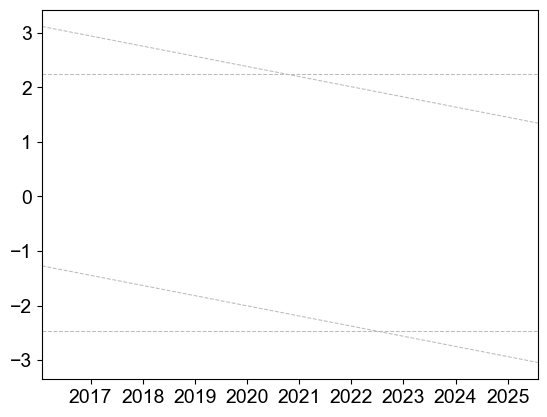

In [37]:
df = seismic.copy().dropna()

# SD lines
mean = df.loc[:,'dv/v(%)'].mean()
std = df.loc[:,'dv/v(%)'].std()

lower_bound = mean - 2 * std
upper_bound = mean + 2 * std

plt.axhline(y=upper_bound, color=colors[10], linestyle='--', linewidth=0.75, zorder=1) # upper sd line
plt.axhline(y=lower_bound, color=colors[10], linestyle='--', linewidth=0.75, zorder=1) # lower sd line

# lineartrend SD lines
x0 = df.index[0]
x = (df.index - x0).days.astype(float)
# x = df.loc[:, 'dv/v(%)'].reset_index().index.values   # integer index after reset
y = df.loc[:, 'dv/v(%)'].values

# --- linear trend ---
a, b = np.polyfit(x, y, 1)
trend = a * x + b

# --- residuals & SD ---
residuals = y - trend
std = np.std(residuals)

# --- ±2 SD threshold curves ---
upper_bound = trend + 2 * std
lower_bound = trend - 2 * std

plt.plot(df.index, upper_bound, color=colors[10], linestyle='--', linewidth=0.75, zorder=1)
plt.plot(df.index, lower_bound, color=colors[10], linestyle='--', linewidth=0.75, zorder=1)

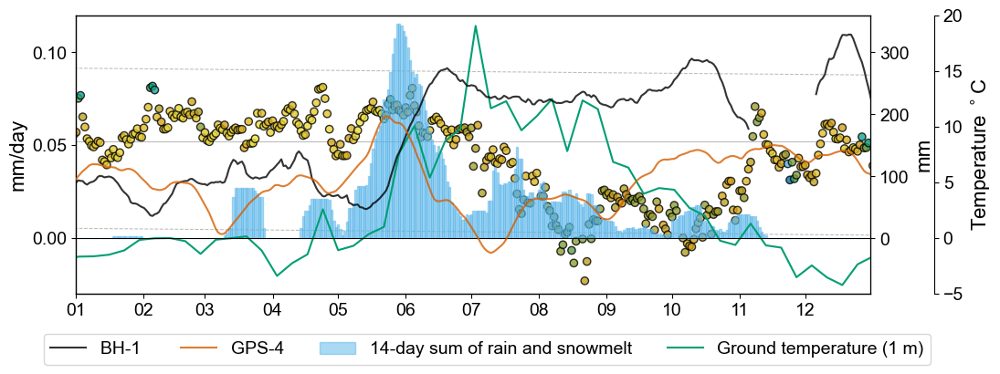

In [35]:
# NEW!!! Lower part of fig 10

# plotting
ncols = 1
nrows = 1 # len(file['event'].unique()) // ncols + (len(file['event'].unique()) % ncols > 0)

fig, ax = plt.subplots(nrows, ncols,figsize=(12, 5))
# fig.subplots_adjust(hspace = .4)

# manually picked start and end times for following data
file3 = JTT1Disp.copy()
start_time = pd.Timestamp('2021-12-01')
end_time = pd.Timestamp('2023-01-31')
interval = 1 # down sampling days
vel_interval = 30 # smoothing window  # Remember days

# turn on or off velocity
vel_true = True 
# vel_true = False

##### Seismic data
ax_yy = ax.twinx() 
ax_yy.tick_params(axis='y', labelright=False)  # hide y-axis tick labels
ax_yy.tick_params(axis='y', which='both', right=False)  # hide y-axis tick marks

color_gradient = [
    "#0072B2",  # Dark Blue
    "#56B4E9",  # Light Blue
    "#009E73",  # Light Green
    "#D4A017",  # Dark Yellow (warmer, closer to orange)
    "#F0E442"   # Bright Yellow
]

# Create a continuous colormap
df = seismic.copy().dropna()

# # SD lines
# mean = df.loc[:,'dv/v(%)'].mean()
# std = df.loc[:,'dv/v(%)'].std()

# lower_bound = mean - 2 * std
# upper_bound = mean + 2 * std

# ax_yy.axhline(y=upper_bound, color=colors[10], linestyle='--', linewidth=0.75, zorder=1) # upper sd line
# ax_yy.axhline(y=lower_bound, color=colors[10], linestyle='--', linewidth=0.75, zorder=1) # lower sd line

# lineartrend SD lines
x0 = df.index[0]
x = (df.index - x0).days.astype(float)
# x = df.loc[:, 'dv/v(%)'].reset_index().index.values   # integer index after reset
y = df.loc[:, 'dv/v(%)'].values

# --- linear trend ---
a, b = np.polyfit(x, y, 1)
trend = a * x + b

# --- residuals & SD ---
residuals = y - trend
std = np.std(residuals)

# --- ±2 SD threshold curves ---
upper_bound = trend + 2 * std
lower_bound = trend - 2 * std

ax_yy.plot(df.index, upper_bound, color=colors[10], linestyle='--', linewidth=0.75, zorder=1)
ax_yy.plot(df.index, lower_bound, color=colors[10], linestyle='--', linewidth=0.75, zorder=1)

ax_yy.axhline(y=0, color=colors[10], linestyle='-', linewidth=0.75, zorder=1) # zero line

df =  df[df.index.slice_indexer(start_time,end_time)]
cmap = mcolors.LinearSegmentedColormap.from_list("colors", color_gradient, N=256)
norm = mcolors.Normalize(vmin=np.nanmin(df.loc[:,'cc']), vmax=np.nanmax(df.loc[:,'cc']))
file = df.loc[:,'dv/v(%)']
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
# sc = ax_y.scatter(file.index, normalized, c=df.loc[:,'cc'], cmap=cmap, norm=norm, edgecolor='k', alpha=0.8)

sc = ax_yy.scatter(file.index, file, c=df.loc[:,'cc'], cmap=cmap, norm=norm, edgecolor='k', alpha=0.8)

###### Met data

# def running_sum(data, window_size):
#     return data.dropna().rolling(window=window_size, center=True).sum() # center=True
    
width = 55/60*interval # width of bars
precip_snowmelt_sub =  jtt_xgeo_precip_snowmelt[jtt_xgeo_precip_snowmelt.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))]
precip_snowmelt_sub = precip_snowmelt_sub.resample(f'{interval}d').sum()
file = precip_snowmelt_sub.iloc[:,0]
normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file)) # normalized

file = running_sum(file,14) # 14 day summed rainfall

ax_y = ax.twinx() 
ax_y.bar(dates.date2num(file.index), file, width = width, ec=colors[5], color=colors[5], label='14-day sum of rain and snowmelt', alpha=0.5, zorder=1)
# ax_y.bar(dates.date2num(file.index), normalized, width = width, ec=colors[6], color=colors[6], label='Rain and snowmelt', alpha=0.5)

ax_yy = ax.twinx()  
temp_sub = jtt_temp_GST[jtt_temp_GST.index.slice_indexer(pd.Timestamp(start_time), pd.Timestamp(end_time))] # actual air temp
# temp_sub = temp_sub.resample(f'{interval}d').median()
ax_yy.plot(temp_sub.index, temp_sub['Mean'], color=colors[4], label='Ground temperature (1 m)')

###### Disp data
## Borehole data
file = JTT1Disp.iloc[:,0].copy()
# # file = JTT2DispUpperZone.iloc[:,0].copy()
# file = JTT2WpUpperZone.iloc[:,0].copy()
# file = JTT3Disp.iloc[:,0].copy()
file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
file = file.resample('1d').mean() # hourly data so sum to daily
file = rolling_slope(file,30) # 30 day velocity
file = file.replace(np.nan,np.inf) # changing nan to inf
ax.plot(file.index, file, color=colors[7], label='BH-1 ', alpha=0.8, zorder=3)

## GNSS
data='2d'

# file = jett_gps4.loc[:,data].copy() # Jtt1 gps 4
# file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
# file = file.resample('1d').mean() # hourly data so sum to daily
# file = diff_shift(file,30) # 30 day velocity
# file = file.replace(np.nan,np.inf) # changing nan to inf
# ax.plot(file.index, file, color=colors[1], label='GPS-4', alpha=0.8, zorder=3)

df1 = pd.concat([jett_gps2[data], jett_gps4[data],jett_gps5[data], jett_gps6[data], jett_gps7[data],jett_gps8[data], jett_gps9[data], jett_gps10[data]], axis=1) # jett_gps3[data]
df1.columns = ['GPS2', 'GPS4','GPS5', 'GPS6', 'GPS7','GPS8', 'GPS9', 'GPS10'] #  'GPS3'
df1 = df1.resample('1D').median()
for i,d in enumerate(df1.columns):
    df1[d] = clean_lowpassfilt(df1[d], colnmbr=0, name=f'{d}')
df1 = rolling_slope(df1, 30) # velocity
df1['Jettan_Mean'] = df1.mean(axis=1, skipna=False)

# file = df1.loc[:,'Jettan_Mean']
# file = file.replace(np.nan,np.inf) # changing nan to inf to show areas of lacking data
# ax.plot(file.index, file, color=colors[1], label='Mean GPS', alpha=0.8, zorder=3)

file = df1.loc[:,'GPS4']
file = file.replace(np.nan,np.inf) # changing nan to inf to show areas of lacking data
ax.plot(file.index, file, color=colors[1], label='GPS-4', alpha=0.8, zorder=3)

# Make sure primary axis (ax) is on top
ax.set_zorder(ax_y.get_zorder() + 1)
ax.patch.set_visible(False)   # keep background clean

# modifying to make the plot display on the upper half of the figure
ymin, ymax = ax.get_ylim()
ax.set_ylim(-0.03, 0.12) # Set limits for secondary y-axis

# Remove ticks and labels below zero on secondary y-axis
ax.set_yticks([0.00, 0.05, 0.10])
ax.set_yticklabels(['0.00', '0.05', '0.10'])

# Fixing ax_y
ax_y.set_ylim(-89, 360) # Set limits for secondary y-axis

# Fixing ax_yy
ax_yy.spines['right'].set_position(('axes', 1.08))  # shift yy outward
ax_yy.set_ylim(-5, 20) # Set limits for secondary y-axis
ax_yy.axhline(y=0.0, color='black', linestyle='solid', linewidth=.75)
plt.subplots_adjust(right=0.85)   # move right edge out to accomodate the need for more space

#legend underneath plots
handles, labels = [(a + b + c) for a, b, c in zip(ax.get_legend_handles_labels(), ax_y.get_legend_handles_labels(), ax_yy.get_legend_handles_labels())]
fig.subplots_adjust(bottom=0.27) # create space
fig.legend(handles, labels, loc = 'upper center', bbox_to_anchor=(0.5, 0.2), ncol=4) # center of fig

# set axis labels
ax.set_ylabel('mm/day')
ax_y.set_ylabel('mm')
ax_yy.set_ylabel('Temperature $^\circ$C')

years = mdates.MonthLocator()   # set number for every other year
years_fmt = mdates.DateFormatter('%m') # only display year, not day and month

ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)

# removing tick labels from the xaxis
n = 1  # keeps every n row
[l.set_visible(False) for (i,l) in enumerate(ax.xaxis.get_ticklabels()) if i % n != 0]


ax.set_xlim(pd.Timestamp('2022-01-01'), pd.Timestamp('2022-12-31'))

# # # saving
path = 'plots\\'
save_name = f'{path}Figure10_lower.png'
# save_name = f'{path}Figure2_A0poster.png'
fig.savefig(save_name, dpi=600) # , transparent=True,  bbox_inches='tight'

In [564]:
jett_gps4.head()

,dE,dH,dN,2d,2d_azimuth
time,,,,,
2010-02-19 00:00:00,0.00,0.00,0.00,0.000000,0.000000
2010-02-19 12:00:00,-0.34,1.99,-0.03,0.341321,264.957549
2010-02-20 00:00:00,-0.20,0.50,0.53,0.566480,339.325575
2010-02-20 12:00:00,-0.34,0.61,0.41,0.532635,320.332159
2010-02-21 00:00:00,-0.08,1.69,0.53,0.536004,351.416379


In [85]:
total_combinations = 105413504
total_combinations = 1475789056
print(f'Total combinations:{total_combinations} which is {int(math.log10(abs(total_combinations))) + 1} digits.')
print(f'It takes approx {(533.95/60/1679616*total_combinations)/60:.2f} hours to run the code') # 5.5 days or 131 hours to run 13 lags

Total combinations:1475789056 which is 10 digits.
It takes approx 130.32 hours to run the code


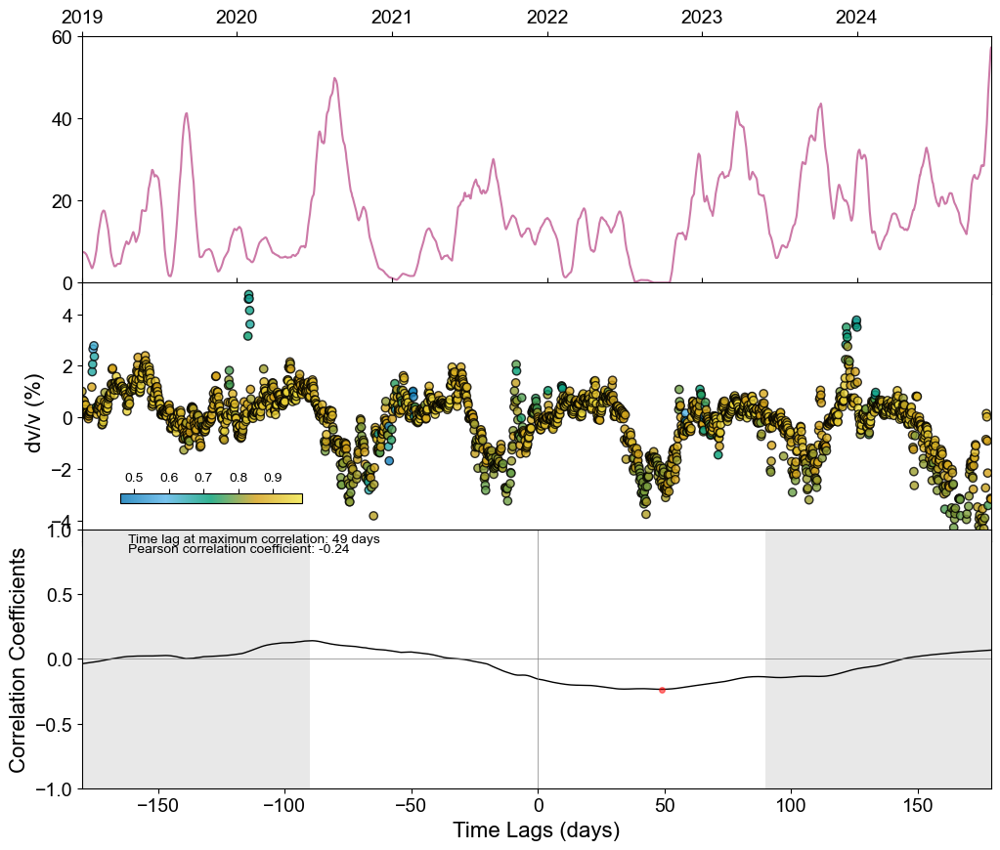

In [109]:

# Sum all GNSS curves / 3 and BH curves / 4
import scipy.stats as st 

########### Cleaning DMS and GPS ############
from scipy.signal import savgol_filter

# rolling mean filter window
window_mean = 7 # 7 is enough to keep temp stationary

# savgol parameters
window_size = 11
poly_order = 3

def clean_lowpassfilt(file, colnmbr=0, name='Water table [m bgl]:'): # colnmbr is the column chosen to lowpass filter, name is wanted name for filtered column
    if isinstance(file,pd.DataFrame) == False:
        file = file.to_frame()
    file = file.resample('1D').median() # matching interval of cleaning parameters
    file = file.dropna()
    file['interpolated'] = file.iloc[:,colnmbr].interpolate(method='linear', limit_direction ='forward')
    # file['filt'] = butter_lowpass_filter(file.iloc[:,-1], cutoff, fs, order) # replace original by lowpass filtered
    file['filt'] = savgol_filter(file.iloc[:,-1], window_size, poly_order) # savitzky-golay filter
    # file['filt'] = file['filt'].rolling(window=window_mean, center=True).mean() # rolling mean
    file = file.dropna().reindex(file.index) # remove interpolated rows from df
    file = file.drop(file.columns[[0,1]], axis=1) # drop interpolated and original data column
    file.rename(columns={'filt':name}, inplace=True) # I call it the same as original if it was dependent on name in scripts lower down
    return file
######################################

# plotting
ncols = 1
nrows = 3 # len(file['event'].unique()) // ncols + (len(file['event'].unique()) % ncols > 0)

fig, ax = plt.subplots(nrows, ncols,figsize=(12, 10)) # , sharex=True
fig.subplots_adjust(hspace = -.045)

# Rain data
file = jtt_xgeo_rain.iloc[:,0].copy() # modeled xgeo
file.index = file.index - pd.DateOffset(hours=6) # xgeo
file = jtt_precip.iloc[:,0].copy() # observed data
file = file.resample('1d').sum() # hourly data so sum to daily
file = file[file.first_valid_index():]
file = running_sum(file,14) # 14 day summed rainfall

# # temp data
# file = jtt_xgeo_temp.iloc[:,0].copy() # daily. basically same as observed temp but no outliers
# file.index = file.index - pd.DateOffset(hours=6) # xgeo

# ## River data
# file = river1.iloc[:,0].copy()
# file = file.resample('1d').max() # hourly data so sum to daily

# # # Borehole data
# file = JTT1Disp.iloc[:,0].copy()
# # # file = JTT2DispUpperZone.iloc[:,0].copy()
# # file = JTT2WpUpperZone.iloc[:,0].copy()
# # file = JTT3Disp.iloc[:,0].copy()
# file = clean_lowpassfilt(file, colnmbr=0, name=f'{file.name}')
# file = file.resample('1d').mean() # hourly data so sum to daily
# file = diff_shift(file,30) # 30 day velocity

## smoothing
window_mean=30
file = file.dropna().rolling(window=window_mean, center=True).mean()


df = pd.concat([file, seismic], axis=1)
df = df.dropna() # remove nans

# df = pd.concat([intdef_smoothed, seismic], axis=1) # smoothed int def
start_time = pd.Timestamp('2019-01-01')
end_time = pd.Timestamp('2025-01-01')
df =  df[df.index.slice_indexer(start_time,end_time)]

# # do just one year
# start_time = pd.Timestamp('2022-01-01')
# end_time = pd.Timestamp('2023-01-01')
# df =  df[df.index.slice_indexer(start_time,end_time)]

# # do just one year
# start_time = pd.Timestamp('2019-01-01')
# end_time = pd.Timestamp('2020-01-01')
# df =  df[df.index.slice_indexer(start_time,end_time)]

ax[0].plot(df.index, df.iloc[:,0], color=colors[0])

# ## mean value
# plotfile['Int_deformation_interp'] = plotfile['Int_deformation'].interpolate(method='linear', limit=3, limit_direction='both')
# plotfile['Int_def_mean'] = plotfile.loc[:,'Int_deformation_interp'].rolling(window=roll_window, center=True).mean()
# ax[0].plot(plotfile.index, plotfile.loc[:,'Int_def_mean'], color=colors[2]) # where=~df['value'].isna()

color_gradient = [
    "#0072B2",  # Dark Blue
    "#56B4E9",  # Light Blue
    "#009E73",  # Light Green
    "#D4A017",  # Dark Yellow (warmer, closer to orange)
    "#F0E442"   # Bright Yellow
]

# Create a continuous colormap
cmap = mcolors.LinearSegmentedColormap.from_list("colors", color_gradient, N=256)
norm = mcolors.Normalize(vmin=np.nanmin(df.loc[:,'cc']), vmax=np.nanmax(df.loc[:,'cc']))
sc = ax[1].scatter(df.index, df.loc[:,'dv/v(%)'], c=df.loc[:,'cc'], cmap=cmap, norm=norm, edgecolor='k', alpha=0.8)

# ## mean value
# seismic['dV/V_interp'] =  seismic.iloc[:,0].interpolate(method='linear', limit=3, limit_direction='both')
# seismic['dV/V_mean'] = seismic.loc[:,'dV/V_interp'].rolling(window=roll_window, center=True).mean()
# ax[1].plot(seismic.index, seismic.loc[:,'dV/V_mean'], color=colors[1])

# colorbar
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
# Add inset colorbar inside the plot (lower left)
cax = inset_axes(ax[1], width="20%", height="4%", loc="lower left", borderpad=2)
cbar = plt.colorbar(sc, cax=cax, orientation="horizontal")

# Set colorbar limits and ticks
cbar.set_ticks(np.arange(0.5, 0.91, 0.1))  # Tick positions
# cbar.set_label("CC", fontsize=10, labelpad=4)

# Format colorbar text (move to top, smaller font)
cbar.ax.xaxis.set_label_position("top")  # Move label above
cbar.ax.xaxis.set_ticks_position("top")  # Move ticks above
cbar.ax.tick_params(labelsize=10)  # Reduce font size


ax[0].axhline(y=0, color='k', linestyle='-', linewidth=0.75) # horizontal line


# file = plotfile.loc[:,'Int_def_mean'].copy()
# normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
# ax[2].plot(plotfile.index, normalized , color=colors[2])

# file = seismic.loc[:,'dV/V_mean'].copy()
# normalized = (file-np.nanmin(file))/(np.nanmax(file)-np.nanmin(file))
# ax[2].plot(seismic.iloc[:,0], normalized, color=colors[1])

## cross corr plot
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler() # normalize between 0 and 1, has to be this when dataset is not normally distributed
scaled_df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns, index=df.index)
scaled_df = scaled_df.dropna() # is this a good way of doing it?

crosscorr_lag = 6 # tried 3 months did not work, tried 12 months = too much. Try 6 months now and only look at 3 months by graying out the boarders.
interval = '1D'

# series1 = df.iloc[:,0] # seasonal disp
# series2 = df.iloc[:,1] # seasonal wp

series1 = scaled_df.iloc[:,1] # seismic (dV/V)
series2 = scaled_df.iloc[:,0] # internal deformation

# Set the maximum lag you want to consider

#### frequency ####
if interval == '1D':
    h = 1 # per day 
    time_inter = 'days'
if interval == '1W':
    h = 1/7 # per week 
    time_inter = 'weeks'
if interval == '1M':
    h = 1/30 # per week 
    time_inter = 'months'
#######################
n_months = crosscorr_lag
period = int(h*90) # we assume correlation should happen within 90 days # to make sure it is an integer number
max_lag = int(n_months*30*h) # to make sure it is an integer number
lags = range(-max_lag, max_lag)

# Initialize arrays to store results
correlation_coefficients = []
p_values = []

# Loop through different time lags (both positive and negative)
for lag in lags:
    # Calculate Pearson correlation coefficient and p-value
    if lag < 0:
        correlation_coefficient, p_value = pearsonr(series1[:lag], series2[-lag:])
    elif lag == 0:
        correlation_coefficient, p_value = pearsonr(series1, series2)
    else:
        correlation_coefficient, p_value = pearsonr(series1[lag:], series2[:-lag])
    
    # Append results to arrays
    correlation_coefficients.append(correlation_coefficient)
    p_values.append(p_value)

# Find the lag with the maximum absolute correlation within +/- 3 months
corr_window = correlation_coefficients[period:period*3]
max_corr_index = np.argmax(np.abs(corr_window))
max_corr_lag = lags[period:period*3][max_corr_index]

n_std = 2
small_size = 10

import scipy.stats as st 

# changing lags to days
lags_plot = np.linspace(lags[0]/h,lags[-1]/h, num=int(max_lag*2)) # days

pannel = ax[2] # lags_plot, correlation_coefficients
pannel.plot(lags_plot, correlation_coefficients, color='black', lw=1)
pannel.axvline(x = 0, color = 'gray', lw = 0.5)
pannel.axhline(y = 0, color = 'gray', lw = 0.5)
pannel.plot(max_corr_lag, corr_window[max_corr_index], color='red', marker='o', markersize=4, alpha=0.5) # zorder=0 # point to highlight max within corr_window # point to highlight max within corr_window

# gray out area
pannel.axvspan(lags_plot[0], -period, facecolor='lightgray', alpha=0.5)
pannel.axvspan(+period,lags_plot[-1], facecolor='lightgray', alpha=0.5)

# text in the plot
y_pos = lags_plot[0]-(lags_plot[0]*0.1)
pannel.text(y_pos, 0.90, f'Time lag at maximum correlation: {max_corr_lag:.0f} {time_inter}', horizontalalignment='left', color='k', fontsize=small_size)
pannel.text(y_pos, 0.83, f'Pearson correlation coefficient: {corr_window[max_corr_index]:.2f}', horizontalalignment='left', color='k', fontsize=small_size)

# cosmetics
pannel.set(ylim = [-1, 1])
pannel.set_ylabel('Correlation Coefficients')
pannel.set_xlabel(f'Time Lags ({time_inter})')

# ax[0].set_ylabel('Rain')
# ax[0].set_ylabel('Riverflow')
ax[0].set_ylabel('')

ax[1].set_ylabel('dv/v (%)') 
# Set the x-axis to show ticks every year
ax[1].xaxis.set_major_locator(mdates.YearLocator())  # Major ticks every year
ax[1].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Format to show year only
# ax[1].set_xlabel('Years')

ax[0].tick_params(axis='x', which='both', labeltop=True, top=True)  # Show labels and ticks on the top
ax[0].tick_params(labelbottom=False)
ax[1].tick_params(axis='x', which='both', top=True)  # Show labels and ticks on the top
ax[1].tick_params(labelbottom=False)


## TO DO
# normalize figure?
# CORRELATE THE TWO AND SHOW CORRELATION


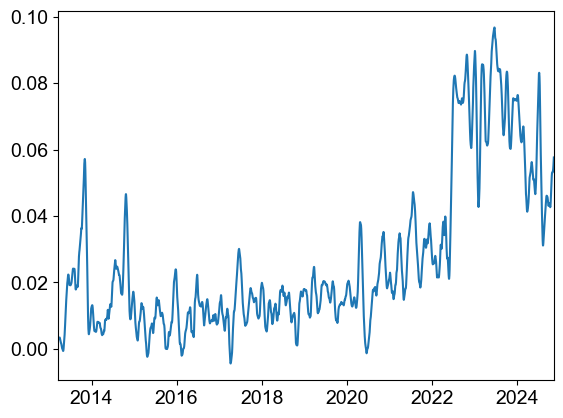

In [22]:
plt.plot(file.index, file.values)

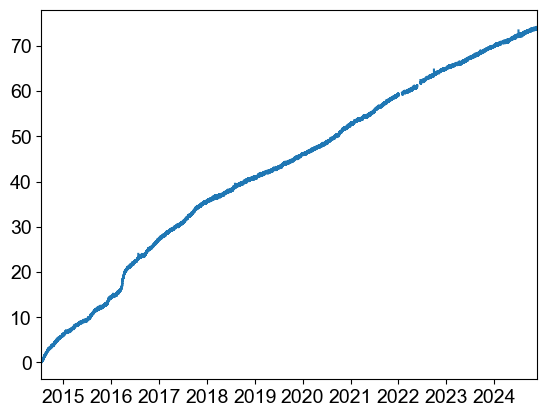

In [100]:
plt.plot(JTT3Disp.index, JTT3Disp.iloc[:,0])

In [52]:
jtt_xgeo_rain.head()

,precip,year,month,day
datetime,,,,
2010-01-01 06:00:00,0.0,2010,1,1
2010-01-02 06:00:00,0.0,2010,1,2
2010-01-03 06:00:00,8.2,2010,1,3
2010-01-04 06:00:00,4.6,2010,1,4
2010-01-05 06:00:00,0.0,2010,1,5


In [155]:
# testing precipitation index from Boregat, 2025 with 14 day characteristic time

def Pc(df, tc):
    """
    Compute exponentially weighted cumulative precipitation (Pc) for a DataFrame
    with datetime index and a 'precip' column.

    Parameters:
    - df: DataFrame with datetime index and 'precip' column
    - tc: characteristic time (in days)

    Returns:
    - df: DataFrame with an added 'Pc' column
    """
    df = df.copy()
    
    # Ensure datetime index
    if not isinstance(df.index, pd.DatetimeIndex):
        raise ValueError("DataFrame must have a DatetimeIndex")

    # Convert time to days since start
    t = (df.index - df.index[0]).total_seconds() / (24 * 3600)
    P = df['precip'].values
    Pc = np.zeros_like(P)

    for i in range(len(t)):
        delta_t = t[i] - t[:i+1]  # t_i - t_j for j = 0 to i
        weights = np.exp(-delta_t / tc)
        numerator = np.sum(P[:i+1] * weights)
        denominator = np.sum(weights)
        Pc[i] = numerator / denominator

    df['Pc'] = Pc
    return df


tc = 14
test = Pc(jtt_xgeo_rain, tc)

<Axes: xlabel='datetime'>

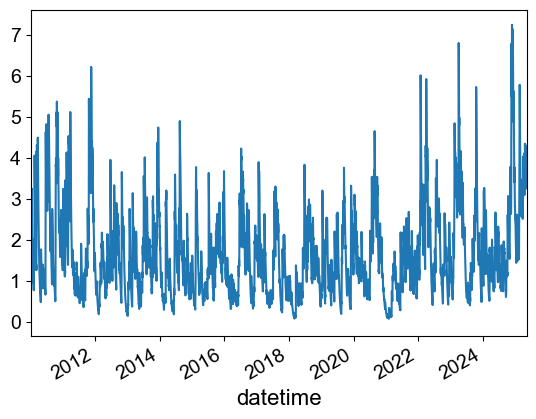

In [141]:
# test.iloc[:,-1].plot()
# test.iloc[:,0].plot()
test.iloc[:,-1].plot()

# Getting values to ArcGis

In [556]:
# # GNSS
# N_data = 'dN'
# E_data = 'dE'
# vel = [jett_gps2[N_data], jett_gps2[E_data],
#        jett_gps3[N_data], jett_gps3[E_data],
#         jett_gps4[N_data], jett_gps4[E_data],
#          jett_gps5[N_data], jett_gps5[E_data],
#           jett_gps6[N_data], jett_gps6[E_data],
#            jett_gps7[N_data], jett_gps7[E_data],
#             jett_gps8[N_data], jett_gps8[E_data],
#              jett_gps9[N_data], jett_gps9[E_data],
#               jett_gps10[N_data], jett_gps10[E_data],
#                jett_gps11[N_data], jett_gps11[E_data]]
# name = ['gps2','gps3','gps4','gps5','gps6','gps7','gps8','gps9','gps10','gps11']
# utm_x = [710765.232, 710720.141, 710637.575, 710595.459, 710523.534, 710473.279, 710492.384,710514.604, 710488.026, 710136.809] # east
# utm_y = [7725816.568, 7725834.256, 7725652.784, 7725574.04, 7725572.583, 7725507.315, 7725645.953, 7725862.076, 7726004.708, 7725958.187] # north

# # getting same time
# start_time = '2021-01-01'
# end_time = '2024-11-30'

# E_col = []
# N_col = []
# for i,d in enumerate(vel):
#     d =  d[d.index.slice_indexer(start_time,end_time)] # subsetting time
#     if (i % 2) == 0: # even number
#         N = (d[d.last_valid_index()] + d[d.first_valid_index()]*-1)/(len(d.index)/2/365) # starting from zero and getting disp per year for length of time series
#         N_col.append(N)
#     else: # odd number
#         E = (d[d.last_valid_index()] + d[d.first_valid_index()]*-1)/(len(d.index)/2/365) # starting from zero and getting disp per year for length of time series
#         E_col.append(E)

# df = pd.DataFrame(
#     {'GPS': name,
#      'UTM X 33N': utm_x,
#      'UTM Y 33N': utm_y,
#      'Mean velocity N (mm/year)': N_col,
#      'Mean velocity E (mm/year)': E_col
#     })

# # #### Old version
# # df['Mean velocity Total (mm/year)'] = (df['Mean velocity E (mm/year)']**2+df['Mean velocity N (mm/year)']**2)**(1/2)
# # dir_angle = []
# # for i in df.index:
# #     if df['Mean velocity N (mm/year)'][i] < 0:
# #         if df['Mean velocity E (mm/year)'][i] < 0: 
# #             dir_angle.append(math.degrees(math.atan(abs(df['Mean velocity N (mm/year)'][i])/abs(df['Mean velocity E (mm/year)'][i])))+180) #180
# #         else:
# #             dir_angle.append(-math.degrees(math.atan(abs(df['Mean velocity N (mm/year)'][i])/abs(df['Mean velocity E (mm/year)'][i])))) #90
# #     if df['Mean velocity N (mm/year)'][i] > 0:
# #         if df['Mean velocity E (mm/year)'][i] < 0:
# #             dir_angle.append(180-(math.degrees(math.atan(abs(df['Mean velocity N (mm/year)'][i])/abs(df['Mean velocity E (mm/year)'][i]))))) #270
# #         else:
# #             dir_angle.append(math.degrees(math.atan(abs(df['Mean velocity N (mm/year)'][i])/abs(df['Mean velocity E (mm/year)'][i])))+0) #0

# # df['Direction angle (N)'] = dir_angle
# # df['Direction angle (N)'] = 90+df['Direction angle (N)'] # changing it from math to bearings
# # ####

# #### New
# def magnitude(row):
#     return (row[3]**2+row[4]**2)**(1/2) # sqrt(east^2+north^2) calculating magnitude of disp for each module

# def azimuth(row): # new version from chatgpt that explaines that it is better than my previous as arctan2 solves all the quadrant logic I tried to do correctly
#     # row[0] is north, row[1] is east
#     north = row[3]
#     east = row[4]
    
#     # Calculate the angle in radians, converting to degrees and adjusting to compass bearing
#     angle_degrees = np.degrees(np.arctan2(east, north))
    
#     # Normalize to [0, 360] degrees
#     if angle_degrees < 0:
#         angle_degrees += 360
    
#     return angle_degrees
# df['Mean velocity Total (mm/year)'] = df.apply(magnitude, axis=1) # calculating magnitude for each row
# df['Direction angle (N)'] = df.apply(azimuth, axis=1) # calculating azimuth for each row
# ####

### Re-thinking the entire thing

data = '2d'

vel = [jett_gps2[data], jett_gps3[data], jett_gps4[data], jett_gps5[data], jett_gps6[data],
           jett_gps7[data], jett_gps8[data], jett_gps9[data], jett_gps10[data], jett_gps11[data]]
name = ['gps2','gps3','gps4','gps5','gps6','gps7','gps8','gps9','gps10','gps11']
utm_x = [710765.232, 710720.141, 710637.575, 710595.459, 710523.534, 710473.279, 710492.384,710514.604, 710488.026, 710136.809] # east
utm_y = [7725816.568, 7725834.256, 7725652.784, 7725574.04, 7725572.583, 7725507.315, 7725645.953, 7725862.076, 7726004.708, 7725958.187] # north

# getting same time
start_time = '2021-01-01'
end_time = '2025-08-12'

Disp = []
for i,d in enumerate(vel):
    d =  d[d.index.slice_indexer(start_time,end_time)] # subsetting time
    D = (d[d.last_valid_index()] + d[d.first_valid_index()]*-1)/(len(d.index)/2/365)
    Disp.append(D)
    
data = '2d_azimuth'
vel = [jett_gps2[data], jett_gps3[data], jett_gps4[data], jett_gps5[data], jett_gps6[data],
           jett_gps7[data], jett_gps8[data], jett_gps9[data], jett_gps10[data], jett_gps11[data]]
Azi = []
for i,d in enumerate(vel):
    d =  d[d.index.slice_indexer(start_time,end_time)] # subsetting time
    A = d.median()
    Azi.append(A)

df = pd.DataFrame(
    {'GPS': name,
     'UTM X 33N': utm_x,
     'UTM Y 33N': utm_y,
     'Mean velocity (mm/year)': Disp,
     'Direction angle (N)' : Azi,
    })


df.to_csv('JTT_GNSS_utm33.txt', sep='\t', index=False, header=True)
df

,GPS,UTM X 33N,UTM Y 33N,Mean velocity (mm/year),Direction angle (N)
0,gps2,710765.232,7725816.568,7.484030,283.740035
1,gps3,710720.141,7725834.256,42.627917,258.500204
2,gps4,710637.575,7725652.784,11.712482,282.422850
3,gps5,710595.459,7725574.040,10.161932,281.456667
4,gps6,710523.534,7725572.583,8.875397,293.847924
5,gps7,710473.279,7725507.315,4.224755,322.068200
6,gps8,710492.384,7725645.953,11.495996,285.896130
7,gps9,710514.604,7725862.076,10.966952,287.687784
8,gps10,710488.026,7726004.708,2.224913,308.127651
9,gps11,710136.809,7725958.187,1.451896,284.634747


In [560]:
# # GNSS
# N_data = 'dN'
# E_data = 'dE'
# vel = [gam_gps3[N_data], gam_gps3[E_data],
#         gam_gps4[N_data], gam_gps4[E_data],
#          gam_gps5[N_data], gam_gps5[E_data],
#           gam_gps6[N_data], gam_gps6[E_data],
#            gam_gps7[N_data], gam_gps7[E_data],
#             gam_gps8[N_data], gam_gps8[E_data],
#              gam_gps9[N_data], gam_gps9[E_data],
#               gam_gps10[N_data], gam_gps10[E_data]]
# name = ['gps3','gps4','gps5','gps6','gps7','gps8','gps9','gps10']
# utm_x = [717634.862, 717531.902, 717355.169, 717262.054, 717210.108, 717058.977, 716962.158, 716932.631] # east
# utm_y = [7717829.211, 7717824.145, 7717823.009, 7717772.493, 7717892.519, 7717784.644, 7717861.752, 7717768.095] # north

# # getting same time
# start_time = '2021-01-01'
# end_time = '2024-11-30'

# E_col = []
# N_col = []
# for i,d in enumerate(vel):
#     d =  d[d.index.slice_indexer(start_time,end_time)] # subsetting time
#     if (i % 2) == 0: # even number
#         N = (d[d.last_valid_index()] + d[d.first_valid_index()]*-1)/(len(d.index)/2/365) # starting from zero and getting disp per year for length of time series
#         N_col.append(N)
#     else: # odd number
#         E = (d[d.last_valid_index()] + d[d.first_valid_index()]*-1)/(len(d.index)/2/365) # starting from zero and getting disp per year for length of time series
#         E_col.append(E)

# df = pd.DataFrame(
#     {'GPS': name,
#      'UTM X 33N': utm_x,
#      'UTM Y 33N': utm_y,
#      'Mean velocity N (mm/year)': N_col,
#      'Mean velocity E (mm/year)': E_col
#     })

# # df['Mean velocity Total (mm/year)'] = (df['Mean velocity E (mm/year)']**2+df['Mean velocity N (mm/year)']**2)**(1/2)
# # dir_angle = []
# # for i in df.index:
# #     if df['Mean velocity N (mm/year)'][i] < 0:
# #         if df['Mean velocity E (mm/year)'][i] < 0: 
# #             dir_angle.append(math.degrees(math.atan(abs(df['Mean velocity N (mm/year)'][i])/abs(df['Mean velocity E (mm/year)'][i])))+180) #180
# #         else:
# #             dir_angle.append(-math.degrees(math.atan(abs(df['Mean velocity N (mm/year)'][i])/abs(df['Mean velocity E (mm/year)'][i])))) #90
# #     if df['Mean velocity N (mm/year)'][i] > 0:
# #         if df['Mean velocity E (mm/year)'][i] < 0:
# #             dir_angle.append(180-(math.degrees(math.atan(abs(df['Mean velocity N (mm/year)'][i])/abs(df['Mean velocity E (mm/year)'][i]))))) #270
# #         else:
# #             dir_angle.append(math.degrees(math.atan(abs(df['Mean velocity N (mm/year)'][i])/abs(df['Mean velocity E (mm/year)'][i])))+0) #0

# # df['Direction angle (N)'] = dir_angle
# # df['Direction angle (N)'] = 90+df['Direction angle (N)'] # changing it from math to bearings

# #### New
# def magnitude(row):
#     return (row[3]**2+row[4]**2)**(1/2) # sqrt(east^2+north^2) calculating magnitude of disp for each module

# def azimuth(row): # new version from chatgpt that explaines that it is better than my previous as arctan2 solves all the quadrant logic I tried to do correctly
#     # row[0] is north, row[1] is east
#     north = row[3]
#     east = row[4]
    
#     # Calculate the angle in radians, converting to degrees and adjusting to compass bearing
#     angle_degrees = np.degrees(np.arctan2(east, north))
    
#     # Normalize to [0, 360] degrees
#     if angle_degrees < 0:
#         angle_degrees += 360
    
#     return angle_degrees
# df['Mean velocity Total (mm/year)'] = df.apply(magnitude, axis=1) # calculating magnitude for each row
# df['Direction angle (N)'] = df.apply(azimuth, axis=1) # calculating azimuth for each row
# ####

### Re-thinking the entire thing
# GNSS
data = '2d'
vel = [gam_gps3[data], gam_gps4[data], gam_gps5[data], gam_gps6[data], gam_gps7[data], gam_gps8[data], 
       gam_gps9[data], gam_gps10[data]]
name = ['gps3','gps4','gps5','gps6','gps7','gps8','gps9','gps10']
utm_x = [717634.862, 717531.902, 717355.169, 717262.054, 717210.108, 717058.977, 716962.158, 716932.631] # east
utm_y = [7717829.211, 7717824.145, 7717823.009, 7717772.493, 7717892.519, 7717784.644, 7717861.752, 7717768.095] # north

# getting same time
start_time = '2021-01-01'
end_time = '2025-08-12'

Disp = []
for i,d in enumerate(vel):
    d =  d[d.index.slice_indexer(start_time,end_time)] # subsetting time
    D = (d[d.last_valid_index()] + d[d.first_valid_index()]*-1)/(len(d.index)/2/365)
    Disp.append(D)
    
data = '2d_azimuth'
vel = [gam_gps3[data], gam_gps4[data], gam_gps5[data], gam_gps6[data], gam_gps7[data], gam_gps8[data], 
       gam_gps9[data], gam_gps10[data]]
Azi = []
for i,d in enumerate(vel):
    d =  d[d.index.slice_indexer(start_time,end_time)] # subsetting time
    A = d.median()
    Azi.append(A)

df = pd.DataFrame(
    {'GPS': name,
     'UTM X 33N': utm_x,
     'UTM Y 33N': utm_y,
     'Mean velocity (mm/year)': Disp,
     'Direction angle (N)' : Azi,
    })

df.to_csv('GAM_GNSS_utm33.txt', sep='\t', index=False, header=True)
df

,GPS,UTM X 33N,UTM Y 33N,Mean velocity (mm/year),Direction angle (N)
0,gps3,717634.862,7717829.211,35.414327,259.289175
1,gps4,717531.902,7717824.145,41.080957,255.153092
2,gps5,717355.169,7717823.009,40.148470,253.085533
3,gps6,717262.054,7717772.493,36.614008,256.612493
4,gps7,717210.108,7717892.519,8.925550,330.277813
5,gps8,717058.977,7717784.644,26.964227,266.623795
6,gps9,716962.158,7717861.752,15.860703,288.147007
7,gps10,716932.631,7717768.095,29.199547,255.454561


In [317]:
gam_gps7.head()

,dE,dH,dN,2d,2d_azimuth
time,,,,,
2020-10-01 12:00:00,-198.61,-815.36,503.86,541.591019,338.486784
2020-10-02 00:00:00,-200.09,-817.92,504.11,542.367864,338.351014
2020-10-02 12:00:00,-198.85,-816.53,503.69,541.520949,338.456564
2020-10-03 00:00:00,-200.03,-815.05,503.33,541.620799,338.326473
2020-10-03 12:00:00,-198.93,-814.43,504.10,541.931688,338.464614


6.756080749900235


<Axes: xlabel='time'>

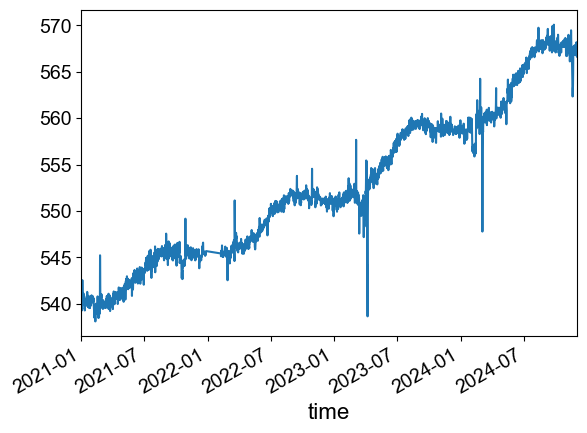

In [301]:
data = '2d'
test = gam_gps7[data].copy()
test = test[test.index.slice_indexer(start_time,end_time)] # subsetting time
print((test[test.last_valid_index()] + test[test.first_valid_index()]*-1)/4)
test.plot()

In [558]:
# Boreholes
data = 'Disp_summed [mm]:'
bh_list = [JTT1Disp[data], JTT2DispUpperZone[data], JTT2DispLowerZone[data], JTT3Disp[data]]
name = ['JTT1','JTT2Upper','JTT2Lower','JTT3']
utm_x = [710616.253, 710715.561, 710715.561, 710516.446] # Norht
utm_y = [7725622.796, 7725839.768, 7725839.768, 7725648.43] # East

# getting same time
start_time = '2021-01-01' # entire df? JTT1 = 2013-02-01. JTT2 and 3 = 2014-07 
end_time = '2025-08-12'

Disp = []
for i,d in enumerate(bh_list):
    d =  d[d.index.slice_indexer(start_time,end_time)] # subsetting time
    D = (d[d.last_valid_index()] + d[d.first_valid_index()]*-1)/(len(d.index)/24/365)
    Disp.append(D)
    
data = 'Azimuth'
bh_list = [JTT1Disp[data], JTT2DispUpperZone[data], JTT2DispLowerZone[data], JTT3Disp[data]]
Azi = []
for i,d in enumerate(bh_list):
    d =  d[d.index.slice_indexer(start_time,end_time)] # subsetting time
    A = d.median()
    Azi.append(A)

df = pd.DataFrame(
    {'Borehole': name,
     'UTM X 33N': utm_x,
     'UTM Y 33N': utm_y,
     'Mean velocity (mm/year)': Disp,
     'Direction angle (N)' : Azi,
    })

df.to_csv('bh_utm33.txt', sep='\t', index=False, header=True)
df

,Borehole,UTM X 33N,UTM Y 33N,Mean velocity (mm/year),Direction angle (N)
0,JTT1,710616.253,7725622.796,20.027681,262.302749
1,JTT2Upper,710715.561,7725839.768,5.842445,221.378515
2,JTT2Lower,710715.561,7725839.768,4.056794,296.946235
3,JTT3,710516.446,7725648.430,5.600105,290.446903


In [295]:
data = 'Disp_summed [mm]:'
test = JTT1Disp[data].copy()
test = test[test.index.slice_indexer(start_time,end_time)] # subsetting time
print(test[test.last_valid_index()] + test[test.first_valid_index()]*-1)/4)
test.plot()

19.07661362324888

<Axes: xlabel='Date:'>

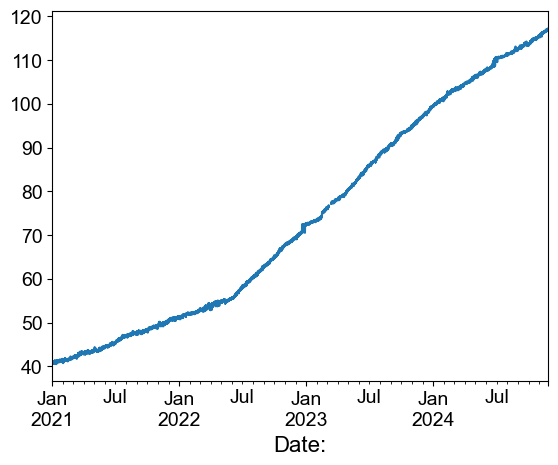

In [291]:
test.plot()